In [21]:
import sklearn
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import catboost as ctb
from featurewiz import featurewiz
import statsmodels.tools.tools as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.regression.linear_model import OLS

from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import StratifiedKFold, ParameterGrid
from tqdm import tqdm

%matplotlib inline

Lets look at the data and its statistical characteristics

In [2]:
data_train = pd.read_csv(r'C:\Users\info\train_it.csv', index_col=[0])

In [3]:
# Deleting the outliers
data_train = data_train[data_train.alfa < 3]
data_train.head()

,RIC,Date,ROE_Total_Equity_perc_TTM,Return_on_Invested_Capital_._perc_TTMa,Asset_Turnover_TTM,Total_Debt_to_Total_Equity_Percent,Tot_Liab.Tot_Assets_perc,Net_Debt_To_EBITDA_.Daily_Time_Series_Ratio.,Current_Ratio,Quick_Ratio,...,Price_To_Book_Value_Per_Share,Price_To_Tangible_Book_Value_Per_Share,Price_To_Sales_Per_Share,P_to_E,Enterprise_Value_to_Sales,Enterprise_Value_to_EBITDA,Enterprise_Value_to_Operating_Cash_Flow,Free_Cash_Flow_net_of_Dividends_per_Share,Price_to_Cash_Flow_per_Share,alfa
0,1337.HK,2018-03-29,NaN,NaN,NaN,0.009596,22.248407,NaN,4.18338,3.99331,...,14.676571,17.362359,7.569132,NaN,7.257605,NaN,NaN,-0.005615,NaN,-0.245034
1,1337.HK,2018-06-29,NaN,NaN,NaN,0.009596,22.248407,NaN,4.18338,3.99331,...,2.795343,2.914696,4.218394,NaN,2.790917,NaN,NaN,-0.005615,NaN,-0.369448
2,1337.HK,2018-09-28,-36.146195,NaN,0.915110,0.014313,26.721013,NaN,3.32819,3.15531,...,2.830370,3.380048,3.398179,NaN,2.331898,NaN,NaN,-0.005615,NaN,-0.148753
3,1337.HK,2018-12-31,-36.146195,NaN,0.915110,0.014313,26.721013,NaN,3.32819,3.15531,...,1.697442,2.027097,2.025206,NaN,0.958925,NaN,NaN,-0.005615,NaN,-0.260560
4,1337.HK,2019-03-29,-13.454251,NaN,0.700187,0.004092,35.924105,NaN,2.50130,2.30770,...,2.661291,3.178133,3.136445,NaN,2.070164,NaN,NaN,-0.005007,NaN,0.437163


In [4]:
data_train.alfa.describe() 

count    30806.000000
mean         0.009910
std          0.374781
min         -1.173587
25%         -0.160225
50%         -0.021430
75%          0.120823
max          2.989433
Name: alfa, dtype: float64

In [5]:
data_train['Date'] = pd.to_datetime(data_train['Date']) 

In [6]:
data_test = data_train.sort_values('Date').groupby('RIC').tail(3)

data_train = data_train.drop(data_test.index)

<AxesSubplot:xlabel='alfa'>

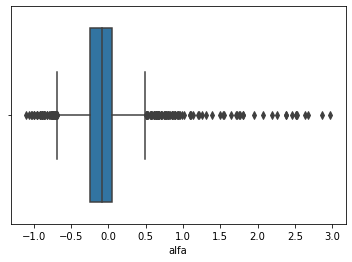

In [7]:
sns.boxplot(data_test.alfa)

In [8]:
total = data_train.isnull().sum().sort_values(ascending=False)
percent = (data_train.isnull().sum() / data_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])


missing_data.head(50)

,Total,Percent
Dividend_Per_Share_Actual,24223,0.846544
Dividend_yield,22907,0.800552
Net_Debt_To_EBITDA_.Daily_Time_Series_Ratio.,22235,0.777067
Return_on_Invested_Capital_._perc_TTMa,17254,0.602992
WACC_Short_Term_Debt_Cost_.perc.,16992,0.593835
P_to_E,14770,0.516181
Interest_Coverage_Ratio,12124,0.423709
Quick_Ratio_PoP_Diff,12062,0.421542
Goodwil_Net,12011,0.419760
Enterprise_Value_to_EBITDA,11552,0.403718


# Usefull fuctions

In [9]:
def X_y_split(data_train, data_test):
    y_train = data_train['alfa']
    X_train = data_train.drop(columns = ['alfa', 'RIC', 'Date'], axis=1)
    
    y_test = data_test['alfa']
    X_test = data_test.drop(['alfa', 'RIC', 'Date'], axis=1)
    
    return X_train, X_test, y_train, y_test

In [46]:
def calc_metric(data_test, y_pred):
    '''
    The function takes df with its predictions and 
    returns the RMSE, MAPE scores of top20 predicted alfa value and average alfa pf this portfolio
    '''

    data_test['y_pred'] = y_pred

    alfa_and_pred_df = data_test.sort_values(by=['y_pred'], ascending=False)[['alfa', 'y_pred']].head(20)
    
    score_rmse = np.sqrt(mean_squared_error(alfa_and_pred_df['alfa'], 
                                              alfa_and_pred_df['y_pred'])) # RMSE of top20 predicted values
    
    score_mape = mean_absolute_percentage_error(alfa_and_pred_df['y_pred'],
                                                alfa_and_pred_df['alfa']) # MAPE of top20 predicted values
                                                # it was changed specially
    avg_alfa = alfa_and_pred_df.alfa.mean()
    
    data_test.drop(columns = 'y_pred', inplace = True)
    
    return round(score_rmse, 2), round(score_mape, 2), round(avg_alfa, 4)

In [11]:
def group_by_feature(data_train, data_test, feature = 'Company_Market_Cap', classes = 5):
    ''' This functions takes slice of (feature) of (data train), divides by (classes)
        to the new feature and finds average values of each column of each class
        Using that intervals of cutting of train df, fill empty values of test df
        by that average values of train df for each class
    '''
    data_train_temp = data_train.copy()
    data_train_temp['MCap_group'] = pd.cut(data_train_temp[feature], 5, labels = range(5))
    voc_means = {}
    for cap in data_train_temp.MCap_group.dropna().unique():
        voc_means[cap] = data_train_temp[data_train_temp['MCap_group'] == cap].mean()
    vals_intervals = pd.cut(data_train_temp[feature], 5).value_counts().index.categories
    new_df = data_test.copy()
    new_df['MCap_group'] = new_df[feature]
    new_df['MCap_group'] = pd.cut(new_df['MCap_group'], vals_intervals).cat.codes
    new_df_filled = pd.DataFrame()
    for cap_df in new_df['MCap_group'].dropna().unique():
        for cap_means in voc_means.keys():
            if cap_df == cap_means:
                temp_df_slice = new_df[new_df['MCap_group'] == cap_df]
                temp_df_slice = temp_df_slice.fillna(voc_means[cap_means])
                new_df_filled = new_df_filled.append(temp_df_slice)
    return new_df_filled

In [60]:
def catboost_GridSearchCV(X_train, X_valid, y_train, y_valid, params):
    ps = {'mape':100,
          'param': [],
          'rmse':100,
          'alfa':-10
    }
    
    
    for prms in tqdm(list(ParameterGrid(params)), ascii=True, desc='Params Tuning:'):
                          
        clf = ctb.CatBoostRegressor(use_best_model=True, loss_function = 'MAPE')
        
        clf.fit(X_train, 
                y_train,
                eval_set=(X_valid, y_valid))
        
        y_pred = clf.predict(X_valid)
        temp = pd.DataFrame({'y_pred':y_pred, 'alfa':y_valid})
        
        alfa_and_pred_df = temp.sort_values(by=['y_pred'], ascending=False)[['alfa', 'y_pred']].head(20)
        rmse = np.sqrt(mean_squared_error(alfa_and_pred_df['alfa'], 
                                              alfa_and_pred_df['y_pred'])) # RMSE of top20 predicted values
    
        mape = mean_absolute_percentage_error(alfa_and_pred_df['alfa'], 
                                              alfa_and_pred_df['y_pred']) # MAPE of top20 predicted values
    
        avg_alfa = alfa_and_pred_df.alfa.mean()

        if mape < ps['mape']:
            ps['rmse'] = rmse
            ps['mape'] = mape
            ps['param'] = prms
            ps['alfa'] = avg_alfa
    print('RMSE: ' + str(ps['rmse']))
    print('MAPE: '+ str(ps['mape']))
    print('Params: '+ str(ps['param']))
    print('Av. alfa: ' + str(ps['alfa']))
    
    return ps['param']

# Baseline

Make the baseline catboost model to compare with

In [51]:
ctb_reg = ctb.CatBoostRegressor(verbose=0, random_seed=0)

X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

ctb_reg.fit(X_train, y_train)

y_pred_ctb = ctb_reg.predict(X_test)

In [52]:
baseline_score_rmse, baseline_score_mape, avg_alfa_baseline = calc_metric(data_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape) 
print('Average alfa of portfolio = ', avg_alfa_baseline)

Baseline RMSE score of portfolio =  1.14
Baseline MAPE score of portfolio =  1.07
Average alfa of portfolio =  0.0075


## Different strategies of filling empty values

### 1. Only by mean of each column

In [53]:
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)


ctb_reg.fit(X_train, y_train)


y_pred_ctb = ctb_reg.predict(X_test)

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(data_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

Baseline RMSE score of portfolio =  1.03
Baseline MAPE score of portfolio =  1.08
Average alfa of portfolio =  0.1523


### 2. With forward filling grouped by rics

In [15]:
full = pd.concat([data_train, data_test], axis = 0).sort_values(['RIC', 'Date'])
for i in full.drop(columns = ['RIC', 'Date', 'alfa'], errors = 'ignore').columns.tolist():
        full[i] = full.groupby(['RIC'])[i].transform(lambda x: x.fillna(method = 'ffill'))
full

,RIC,Date,ROE_Total_Equity_perc_TTM,Return_on_Invested_Capital_._perc_TTMa,Asset_Turnover_TTM,Total_Debt_to_Total_Equity_Percent,Tot_Liab.Tot_Assets_perc,Net_Debt_To_EBITDA_.Daily_Time_Series_Ratio.,Current_Ratio,Quick_Ratio,...,Price_To_Book_Value_Per_Share,Price_To_Tangible_Book_Value_Per_Share,Price_To_Sales_Per_Share,P_to_E,Enterprise_Value_to_Sales,Enterprise_Value_to_EBITDA,Enterprise_Value_to_Operating_Cash_Flow,Free_Cash_Flow_net_of_Dividends_per_Share,Price_to_Cash_Flow_per_Share,alfa
0,1337.HK,2018-03-29,NaN,NaN,NaN,0.009596,22.248407,NaN,4.18338,3.99331,...,14.676571,17.362359,7.569132,NaN,7.257605,NaN,NaN,-0.005615,NaN,-0.245034
1,1337.HK,2018-06-29,NaN,NaN,NaN,0.009596,22.248407,NaN,4.18338,3.99331,...,2.795343,2.914696,4.218394,NaN,2.790917,NaN,NaN,-0.005615,NaN,-0.369448
2,1337.HK,2018-09-28,-36.146195,NaN,0.915110,0.014313,26.721013,NaN,3.32819,3.15531,...,2.830370,3.380048,3.398179,NaN,2.331898,NaN,NaN,-0.005615,NaN,-0.148753
3,1337.HK,2018-12-31,-36.146195,NaN,0.915110,0.014313,26.721013,NaN,3.32819,3.15531,...,1.697442,2.027097,2.025206,NaN,0.958925,NaN,NaN,-0.005615,NaN,-0.260560
4,1337.HK,2019-03-29,-13.454251,NaN,0.700187,0.004092,35.924105,NaN,2.50130,2.30770,...,2.661291,3.178133,3.136445,NaN,2.070164,NaN,NaN,-0.005007,NaN,0.437163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31846,ZUO,2020-12-31,-46.504223,NaN,0.816176,4.291376,57.430679,NaN,1.64525,1.64525,...,9.856975,11.338000,5.599698,NaN,5.021216,NaN,122.444161,-0.225104,136.550658,0.230315
31847,ZUO,2021-03-31,-43.481930,NaN,0.741550,3.526784,59.214675,NaN,1.56247,1.56247,...,10.472593,12.046116,6.045471,NaN,5.466989,NaN,133.314510,-0.015800,147.421007,0.004730
31848,ZUO,2021-06-30,-44.007320,NaN,0.773538,2.898424,58.585893,NaN,1.57110,1.57110,...,12.291154,14.018880,6.765010,NaN,6.147962,NaN,103.155493,-0.015800,113.508824,0.083834
31849,ZUO,2021-09-30,-44.356918,NaN,0.808176,2.188991,57.124932,NaN,1.61010,1.61010,...,11.633636,13.297662,6.388973,NaN,5.779653,NaN,154.156974,-0.015800,170.408975,-0.041177


In [16]:
data_test = full.sort_values('Date').groupby('RIC').tail(3)

data_train = full.drop(data_test.index)

data_test

,RIC,Date,ROE_Total_Equity_perc_TTM,Return_on_Invested_Capital_._perc_TTMa,Asset_Turnover_TTM,Total_Debt_to_Total_Equity_Percent,Tot_Liab.Tot_Assets_perc,Net_Debt_To_EBITDA_.Daily_Time_Series_Ratio.,Current_Ratio,Quick_Ratio,...,Price_To_Book_Value_Per_Share,Price_To_Tangible_Book_Value_Per_Share,Price_To_Sales_Per_Share,P_to_E,Enterprise_Value_to_Sales,Enterprise_Value_to_EBITDA,Enterprise_Value_to_Operating_Cash_Flow,Free_Cash_Flow_net_of_Dividends_per_Share,Price_to_Cash_Flow_per_Share,alfa
8580,DFTC.PK,2020-12-31,-1186.665875,NaN,0.169999,31.677230,689.892046,NaN,0.11930,0.11456,...,-0.038788,-0.038788,0.164945,NaN,3.602984,NaN,NaN,-0.021425,NaN,-0.683547
2233,APLD.PK,2020-12-31,-191.828479,NaN,NaN,22.020725,54.329775,NaN,0.65502,0.65502,...,0.027118,-0.024493,0.036085,NaN,1.323585,NaN,NaN,NaN,NaN,1.759854
9085,DPLS.PK,2020-12-31,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.000464,NaN,2.383119
18705,MTNX.PK,2020-12-31,NaN,NaN,1.393535,NaN,8920.000000,NaN,0.00477,0.00098,...,-0.000003,-0.000003,0.000033,NaN,2.600916,NaN,NaN,-0.121534,NaN,-0.116881
18902,MUSS.PK,2021-03-31,NaN,NaN,0.000000,NaN,17403.010753,NaN,0.09164,0.09164,...,-0.283311,-0.283311,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.458025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31060,WRAP.O,2021-12-31,-49.030388,NaN,0.136543,0.000000,6.592978,NaN,14.99576,14.25008,...,3.522414,3.665271,23.928702,NaN,17.975827,NaN,NaN,-0.387289,NaN,-0.450380
10742,EXTR.O,2021-12-31,57.016392,1.408988,1.058071,447.318355,92.830619,1.212094,0.93212,0.86084,...,28.166440,-5.637092,1.958229,92.055116,2.085161,19.911579,13.566757,0.997572,12.740896,0.487435
26587,SPLK.O,2021-12-31,-149.726584,NaN,0.471304,1742.094897,96.507958,NaN,1.78248,1.78248,...,98.911981,-12.530815,7.298492,NaN,7.888824,NaN,183.086052,-1.518498,192.840542,-0.306805
13404,IGOI.PK,2022-01-14,21.499213,17.901814,2.091192,15.025543,41.745930,0.032989,2.03953,1.34445,...,1.183604,1.235135,0.130015,6.176652,0.144261,2.155734,24.497047,-0.514550,51.118841,0.851680


In [17]:
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

ctb_reg.fit(X_train, y_train)

y_pred_ctb = ctb_reg.predict(X_test)

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(data_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

Baseline RMSE score of portfolio =  1.1
Baseline MAPE score of portfolio =  6.75
Average alfa of portfolio =  0.066


### 3. With forward filling grouped by rics and then with mean values in groups of capitalisations

In [19]:
train_filled = group_by_feature(data_train, data_test)
test_filled = group_by_feature(data_train, data_train)

C:\Users\info\AppData\Local\Temp/ipykernel_7856/1025169111.py:11: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  voc_means[cap] = data_train_temp[data_train_temp['MCap_group'] == cap].mean()
C:\Users\info\AppData\Local\Temp/ipykernel_7856/1025169111.py:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  voc_means[cap] = data_train_temp[data_train_temp['MCap_group'] == cap].mean()


In [21]:
X_train, X_test, y_train, y_test = X_y_split(train_filled, test_filled) 

ctb_reg.fit(X_train, y_train)

y_pred_ctb = ctb_reg.predict(X_test)

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(test_filled, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

Baseline RMSE score of portfolio =  1.54
Baseline MAPE score of portfolio =  13.13
Average alfa of portfolio =  0.0532


### 4. With filling by median

In [22]:
data_train = pd.read_csv(r'C:\Users\info\train_it.csv', index_col=[0])
data_train = data_train[data_train.alfa < 3]

data_train['Date'] = pd.to_datetime(data_train['Date']) 

data_test = data_train.sort_values('Date').groupby('RIC').tail(3)

data_train = data_train.drop(data_test.index)
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

In [25]:
X_medians = X_train.median()

X_train = X_train.fillna(X_medians)
X_test = X_test.fillna(X_medians)

ctb_reg.fit(X_train, y_train)

y_pred_ctb = ctb_reg.predict(X_test)

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(data_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

Baseline RMSE score of portfolio =  1.03
Baseline MAPE score of portfolio =  6.45
Average alfa of portfolio =  0.1487


## Feature selection

### 1. By dropping features with different percent of nan (small)

In [54]:
missing_data

,Total,Percent
Dividend_Per_Share_Actual,24223,0.846544
Dividend_yield,22907,0.800552
Net_Debt_To_EBITDA_.Daily_Time_Series_Ratio.,22235,0.777067
Return_on_Invested_Capital_._perc_TTMa,17254,0.602992
WACC_Short_Term_Debt_Cost_.perc.,16992,0.593835
P_to_E,14770,0.516181
Interest_Coverage_Ratio,12124,0.423709
Quick_Ratio_PoP_Diff,12062,0.421542
Goodwil_Net,12011,0.419760
Enterprise_Value_to_EBITDA,11552,0.403718


In [55]:
perc_nan = pd.DataFrame(columns = ['Crit_nan', 'RMSE', 'MAPE', 'ALFA'])
for crit_nan in tqdm([0.4, 0.5, 0.6, 0.7, 0.8]):
    list_features_to_drop = list(missing_data[missing_data['Percent'] > crit_nan].index)
    X_train, X_test, y_train, y_test = X_y_split(data_train.drop(list_features_to_drop, axis=1), 
                                                 data_test.drop(list_features_to_drop, axis=1)) 

    X_means = X_train.mean()

    X_train = X_train.fillna(X_means)
    X_test = X_test.fillna(X_means)

    ctb_reg.fit(X_train, y_train)

    y_pred_ctb = ctb_reg.predict(X_test)

    baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(data_test, y_pred_ctb)
    perc_nan.loc[len(perc_nan)] = [crit_nan, baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean]
perc_nan

,Crit_nan,RMSE,MAPE,ALFA
0,0.4,1.10,1.10,0.0626
1,0.5,1.07,1.05,0.1243
2,0.6,0.99,0.92,0.1996
3,0.7,1.02,0.95,0.1684
4,0.8,1.03,1.04,0.0213


The best critical value of dropping nan = 0.6

### 2. By RFE (feature importances of catboost)

In [56]:
crit_weight_df = pd.DataFrame(columns = ['Crit_weight', 'RMSE', 'MAPE', 'ALFA'])
for crit_weight in tqdm([40, 50, 60, 70, 80, 90]):
    X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

    X_means = X_train.mean()

    X_train = X_train.fillna(X_means)
    X_test = X_test.fillna(X_means)

    ctb_reg.fit(X_train, y_train)

    top_pd = pd.DataFrame(ctb_reg.feature_importances_, index = X_train.columns.tolist()).sort_values(0, ascending = False)
    cum_sum = 0
    for col in top_pd.index.tolist():
        if top_pd.loc[col, 0] < 0.01 or cum_sum >= crit_weight:
            break
        last_col = col
        cum_sum += top_pd.loc[col, 0]    
    selected_cols = top_pd.loc[:last_col, :].index.tolist()
    X_train = X_train[selected_cols]
    X_test = X_test[selected_cols]
    ctb_reg.fit(X_train, y_train)

    y_pred_ctb = ctb_reg.predict(X_test)

    baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(data_test, y_pred_ctb)
    crit_weight_df.loc[len(crit_weight_df)] = [crit_weight, baseline_score_rmse_mean, 
                                               baseline_score_mape_mean, avg_alfa_baseline_mean]
crit_weight_df

100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:10<00:00, 11.80s/it]


,Crit_weight,RMSE,MAPE,ALFA
0,40.0,0.93,1.19,0.0556
1,50.0,1.06,1.13,-0.0172
2,60.0,1.06,1.11,0.0007
3,70.0,1.16,1.26,-0.1309
4,80.0,1.10,1.14,0.0356
5,90.0,1.06,1.03,0.0239


### 3. By MRMR and Recursive gradient boosting

  0%|                                                                                            | 0/6 [00:00<?, ?it/s]

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 33)
    Caution: We will try to reduce the memory usage of dataframe from 7.42 MB
        memory usage after optimization is: 3.06 MB
        decreased by 58.8%
     Loaded. Shape = (28614, 33)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

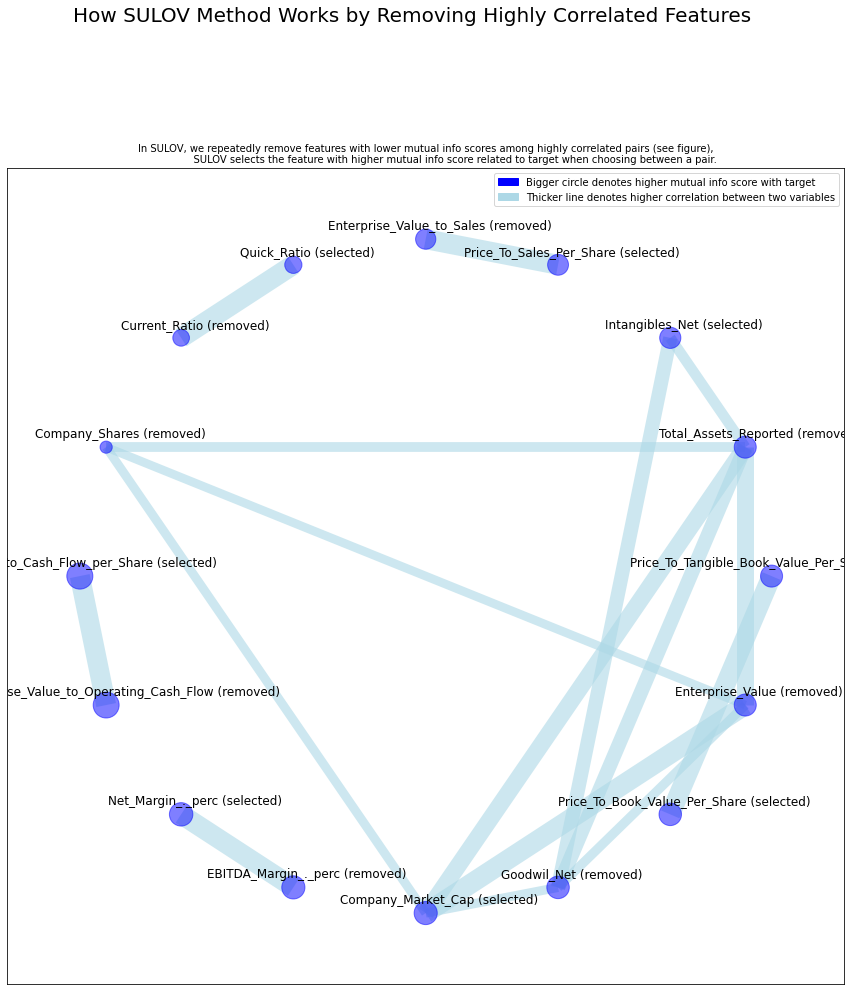

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected vars after SULOV = 23
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 23 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 23 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 18 variables...
            Time taken for regular XGBoost feature selection = 5 seconds
        using 13 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 8 variables...
            Time taken for regular XGBoost feature selection = 8 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 9 seconds
            Total time taken for XGBoost feature selecti

 17%|██████████████                                                                      | 1/6 [00:17<01:26, 17.31s/it]

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 33)
    Caution: We will try to reduce the memory usage of dataframe from 7.42 MB
        memory usage after optimization is: 3.06 MB
        decreased by 58.8%
     Loaded. Shape = (28614, 33)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

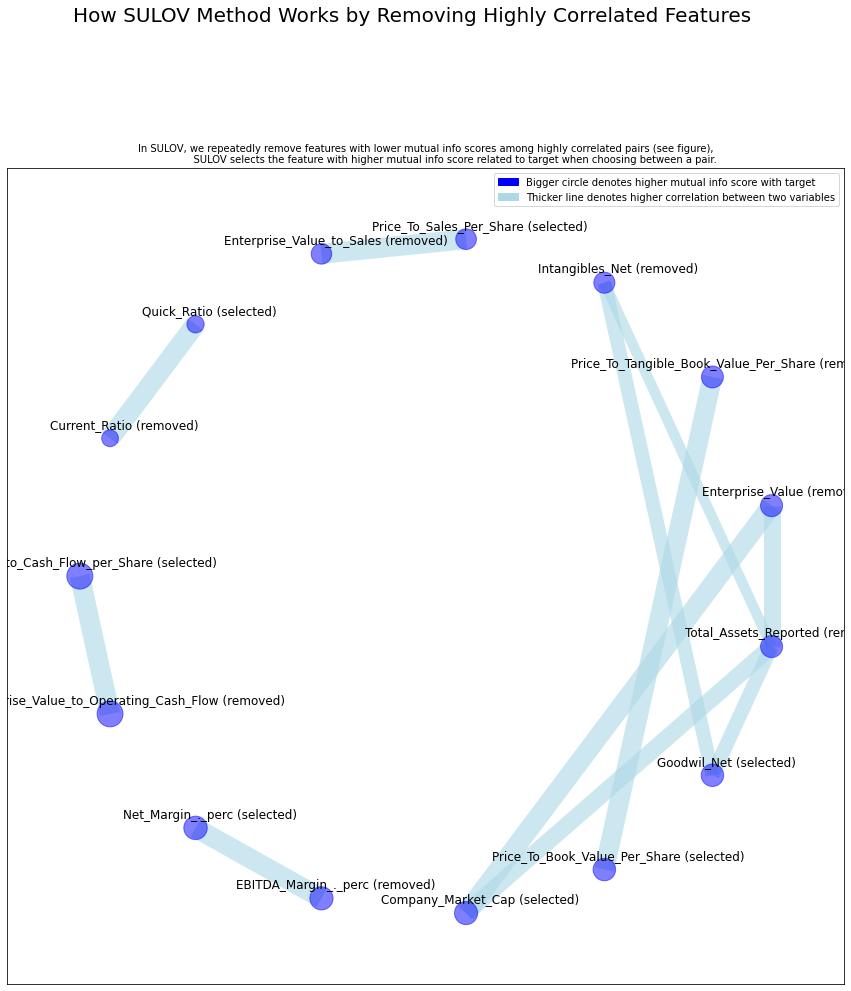

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 24
Final list of selected vars after SULOV = 24
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 24 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 24 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 19 variables...
            Time taken for regular XGBoost feature selection = 5 seconds
        using 14 variables...
            Time taken for regular XGBoost feature selection = 7 seconds
        using 9 variables...
            Time taken for regular XGBoost feature selection = 9 seconds
        using 4 variables...
            Time taken for regular XGBoost feature selection = 10 seconds
            Total time taken for XGBoost feature select

 33%|████████████████████████████                                                        | 2/6 [00:35<01:10, 17.67s/it]

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 33)
    Caution: We will try to reduce the memory usage of dataframe from 7.42 MB
        memory usage after optimization is: 3.06 MB
        decreased by 58.8%
     Loaded. Shape = (28614, 33)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

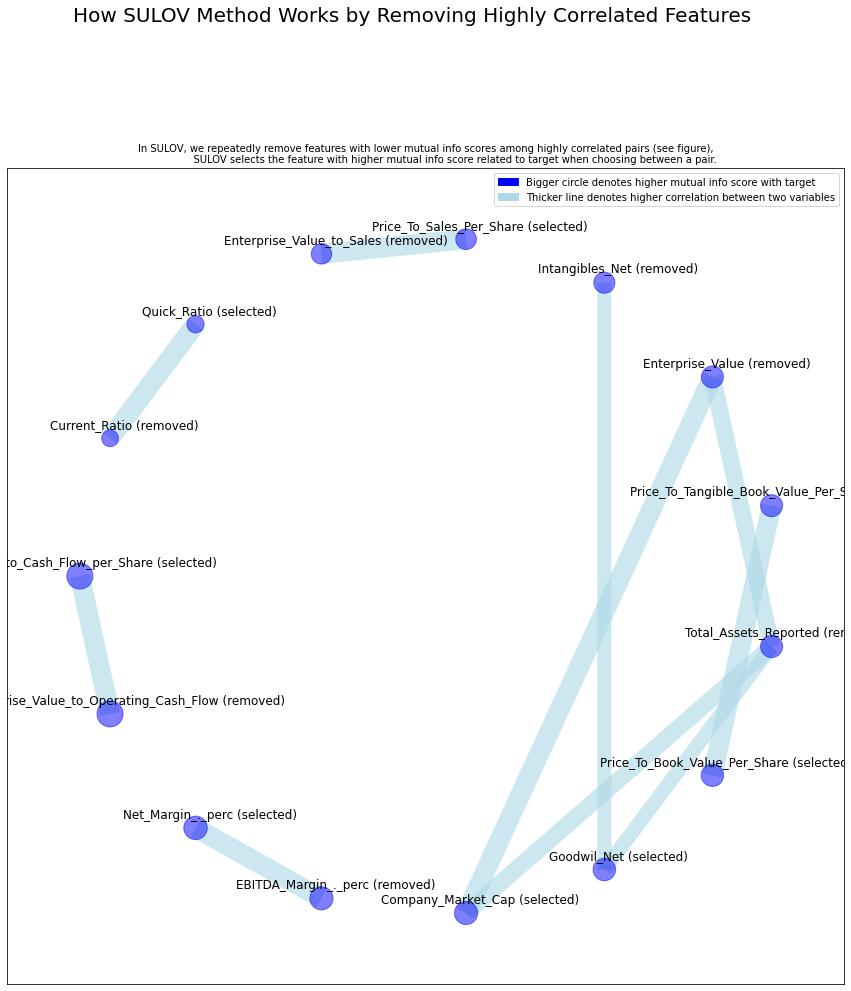

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 24
Final list of selected vars after SULOV = 24
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 24 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 24 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 19 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 14 variables...
            Time taken for regular XGBoost feature selection = 8 seconds
        using 9 variables...
            Time taken for regular XGBoost feature selection = 10 seconds
        using 4 variables...
            Time taken for regular XGBoost feature selection = 11 seconds
            Total time taken for XGBoost feature selec

 50%|██████████████████████████████████████████                                          | 3/6 [00:54<00:55, 18.52s/it]

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 33)
    Caution: We will try to reduce the memory usage of dataframe from 7.42 MB
        memory usage after optimization is: 3.06 MB
        decreased by 58.8%
     Loaded. Shape = (28614, 33)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

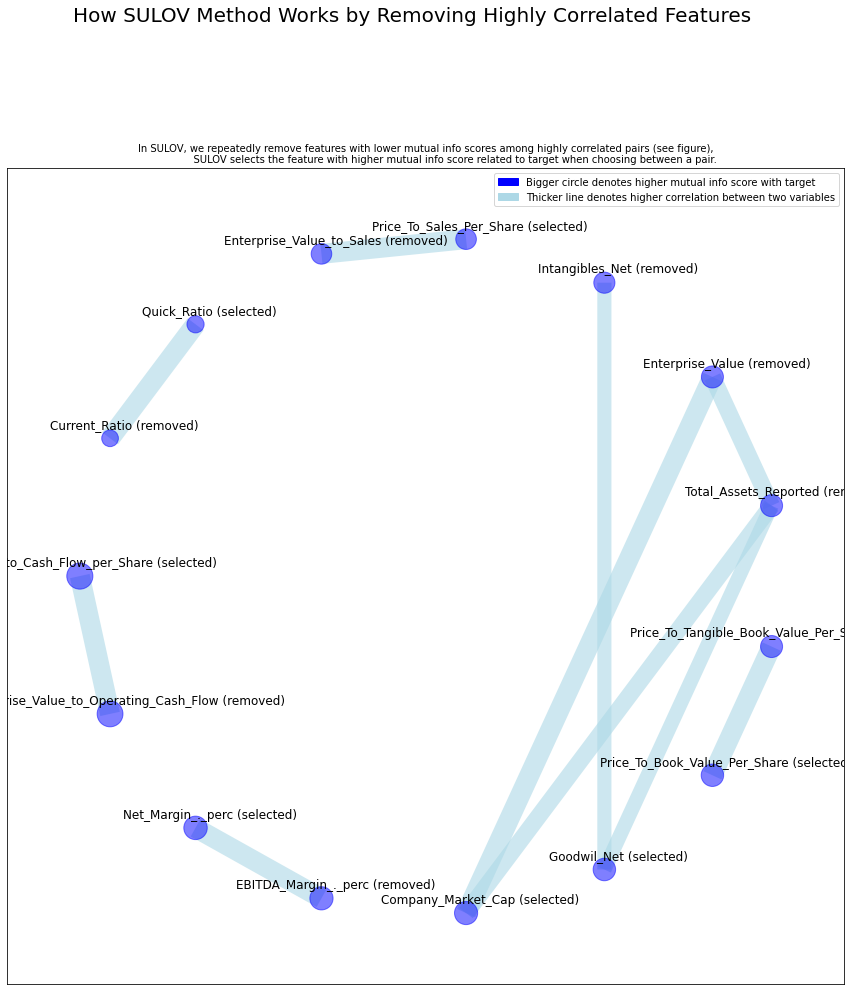

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 24
Final list of selected vars after SULOV = 24
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 24 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 24 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 19 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 14 variables...
            Time taken for regular XGBoost feature selection = 8 seconds
        using 9 variables...
            Time taken for regular XGBoost feature selection = 10 seconds
        using 4 variables...
            Time taken for regular XGBoost feature selection = 11 seconds
            Total time taken for XGBoost feature selec

 67%|████████████████████████████████████████████████████████                            | 4/6 [01:14<00:38, 19.07s/it]

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 33)
    Caution: We will try to reduce the memory usage of dataframe from 7.42 MB
        memory usage after optimization is: 3.06 MB
        decreased by 58.8%
     Loaded. Shape = (28614, 33)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

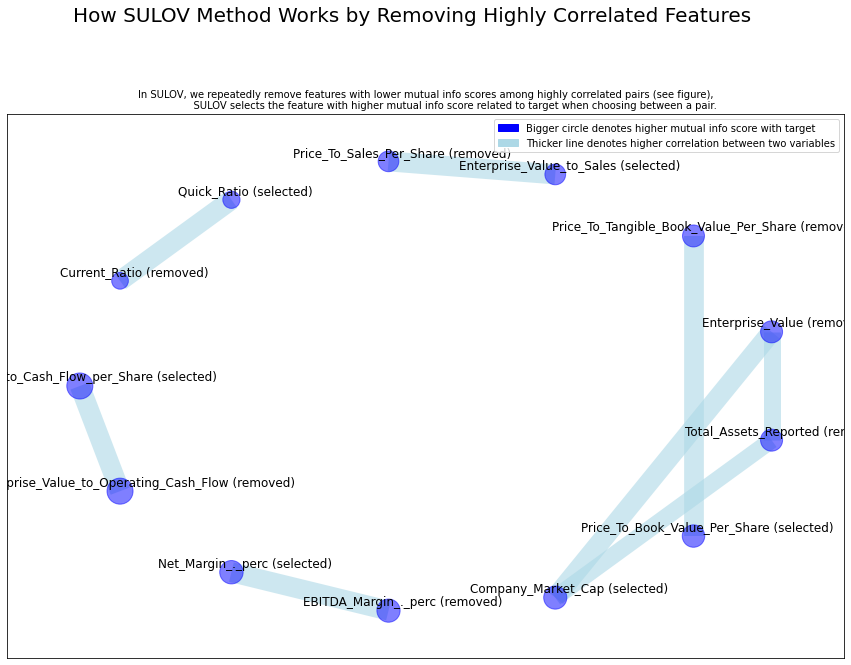

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 25
Final list of selected vars after SULOV = 25
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 25 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 25 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 20 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 15 variables...
            Time taken for regular XGBoost feature selection = 8 seconds
        using 10 variables...
            Time taken for regular XGBoost feature selection = 10 seconds
        using 5 variables...
            Time taken for regular XGBoost feature selection = 12 seconds
            Total time taken for XGBoost feature sele

 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [01:35<00:19, 19.61s/it]

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 33)
    Caution: We will try to reduce the memory usage of dataframe from 7.42 MB
        memory usage after optimization is: 3.06 MB
        decreased by 58.8%
     Loaded. Shape = (28614, 33)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

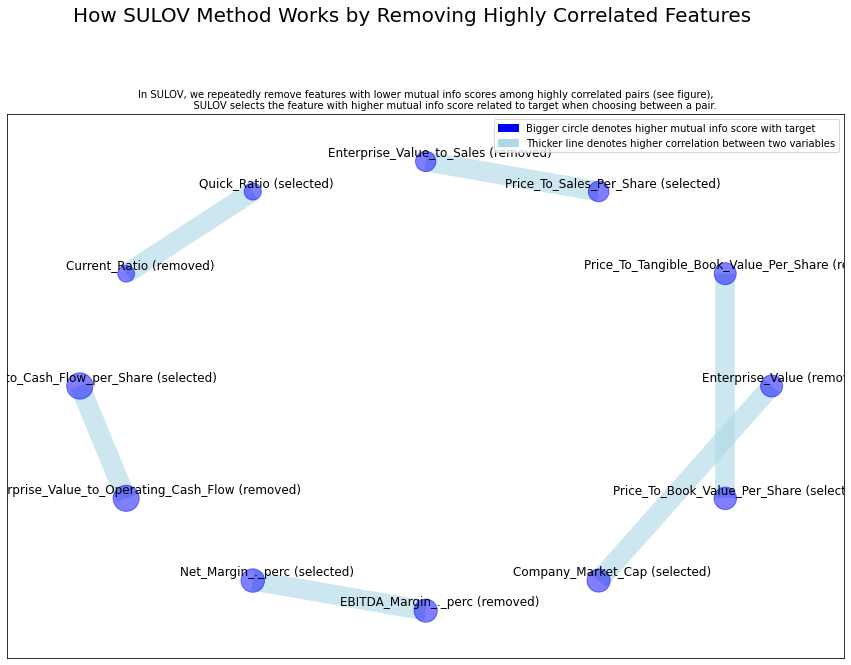

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 26
Final list of selected vars after SULOV = 26
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 26 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 26 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 21 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 16 variables...
            Time taken for regular XGBoost feature selection = 9 seconds
        using 11 variables...
            Time taken for regular XGBoost feature selection = 11 seconds
        using 6 variables...
            Time taken for regular XGBoost feature selection = 13 seconds
        using 1 variables...
            Time taken f

100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:57<00:00, 19.52s/it]


,Crit_cor,RMSE,MAPE,ALFA
0,0.4,1.08,1.03,0.2229
1,0.5,1.12,1.08,0.0497
2,0.6,1.12,1.08,0.0497
3,0.7,1.12,1.08,0.0497
4,0.8,1.07,1.04,0.2211
5,0.9,1.18,1.15,0.0424


In [57]:
crit_cor_df = pd.DataFrame(columns = ['Crit_cor', 'RMSE', 'MAPE', 'ALFA'])
for crit_cor in tqdm([0.4, 0.5, 0.6, 0.7, 0.8, 0.9]):
    X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

    X_means = X_train.mean()

    X_train = X_train.fillna(X_means)
    X_test = X_test.fillna(X_means)
    selected_cols, imp_df = featurewiz(pd.concat([X_train, y_train], axis = 1), 'alfa', corr_limit=crit_cor, verbose =0, sep=",", header=0,test_data="", feature_engg="", category_encoders="")
    
    X_train = X_train[selected_cols]
    X_test = X_test[selected_cols]
    ctb_reg.fit(X_train, y_train)

    y_pred_ctb = ctb_reg.predict(X_test)

    baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(data_test, y_pred_ctb)
    crit_cor_df.loc[len(crit_cor_df)] = [crit_cor, baseline_score_rmse_mean, 
                                               baseline_score_mape_mean, avg_alfa_baseline_mean]
crit_cor_df

### 4. By MRMR and then RFE 

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 33)
    Caution: We will try to reduce the memory usage of dataframe from 7.42 MB
        memory usage after optimization is: 3.06 MB
        decreased by 58.8%
     Loaded. Shape = (28614, 33)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

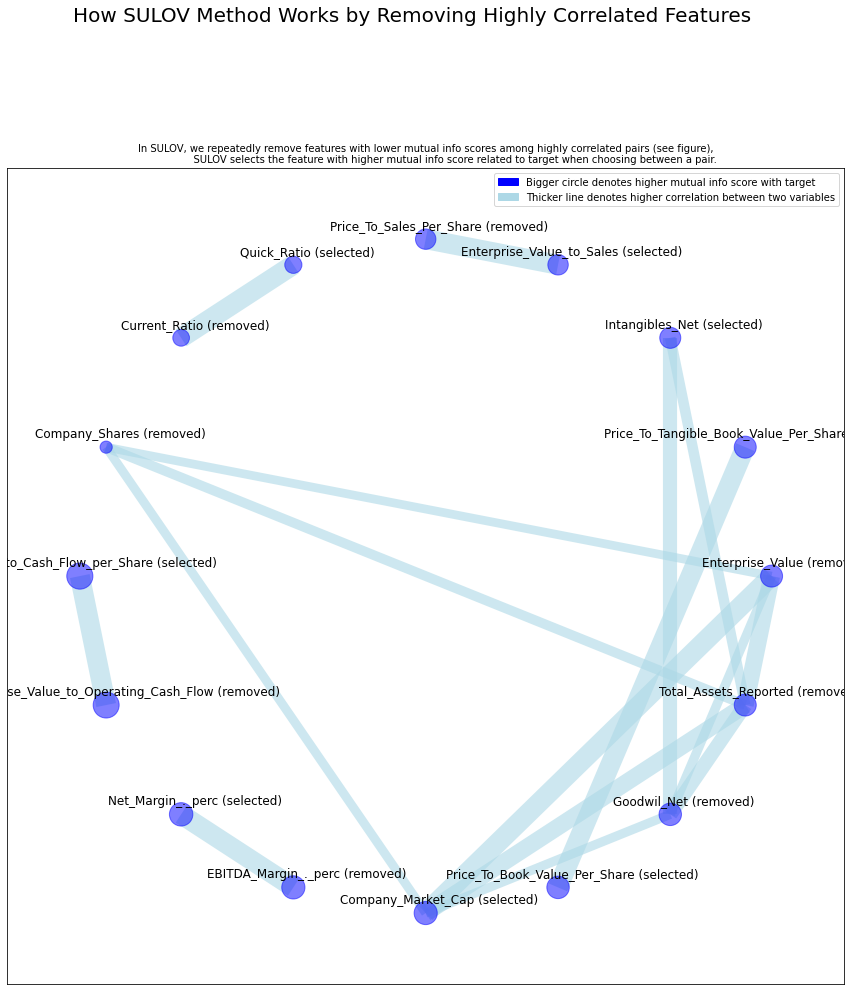

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected vars after SULOV = 23
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 23 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 23 variables...
            Time taken for regular XGBoost feature selection = 4 seconds
        using 18 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 13 variables...
            Time taken for regular XGBoost feature selection = 8 seconds
        using 8 variables...
            Time taken for regular XGBoost feature selection = 10 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 11 seconds
            Total time taken for XGBoost feature selec

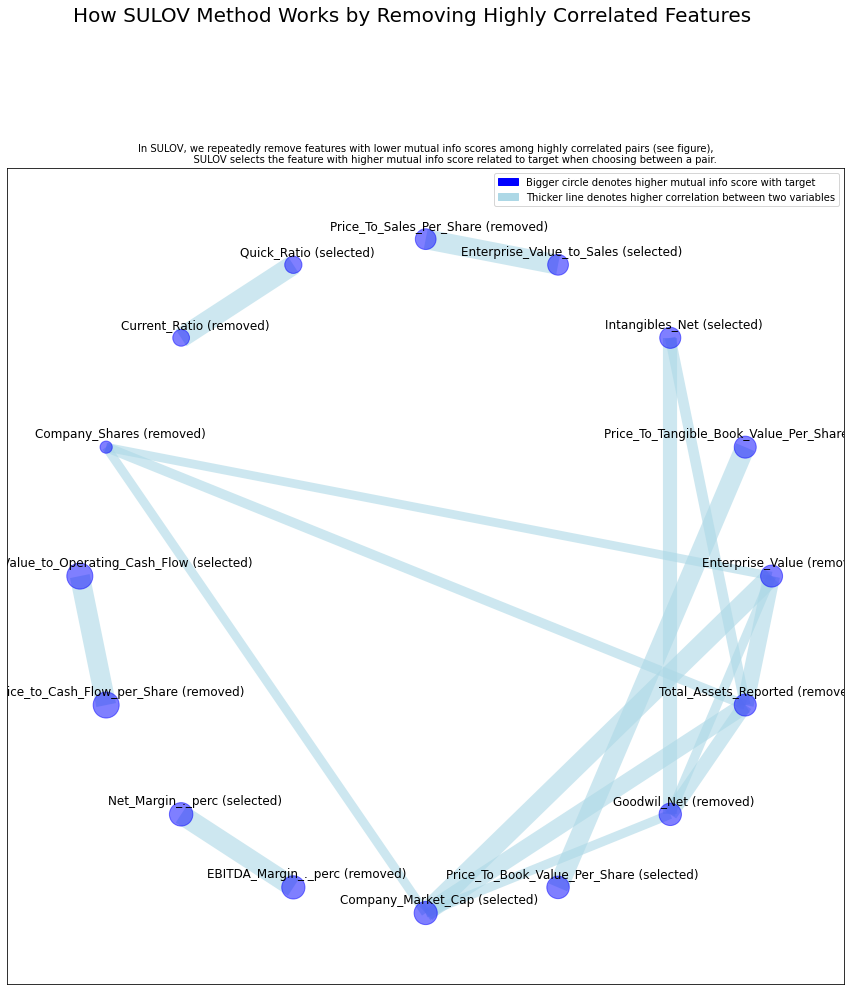

Time taken for SULOV method = 5 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected vars after SULOV = 23
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 23 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 23 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 18 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 13 variables...
            Time taken for regular XGBoost feature selection = 9 seconds
        using 8 variables...
            Time taken for regular XGBoost feature selection = 11 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 12 seconds
            Total time taken for XGBoost feature selec

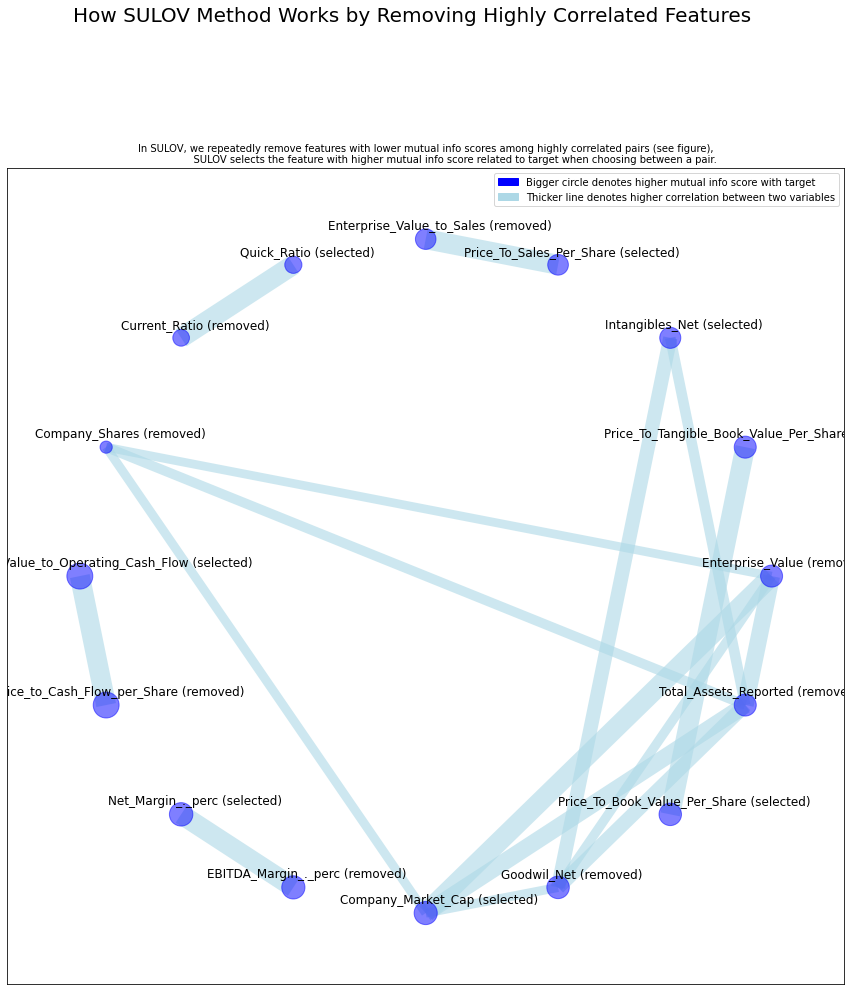

Time taken for SULOV method = 5 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected vars after SULOV = 23
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 23 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 23 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 18 variables...
            Time taken for regular XGBoost feature selection = 5 seconds
        using 13 variables...
            Time taken for regular XGBoost feature selection = 8 seconds
        using 8 variables...
            Time taken for regular XGBoost feature selection = 10 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 11 seconds
            Total time taken for XGBoost feature selec

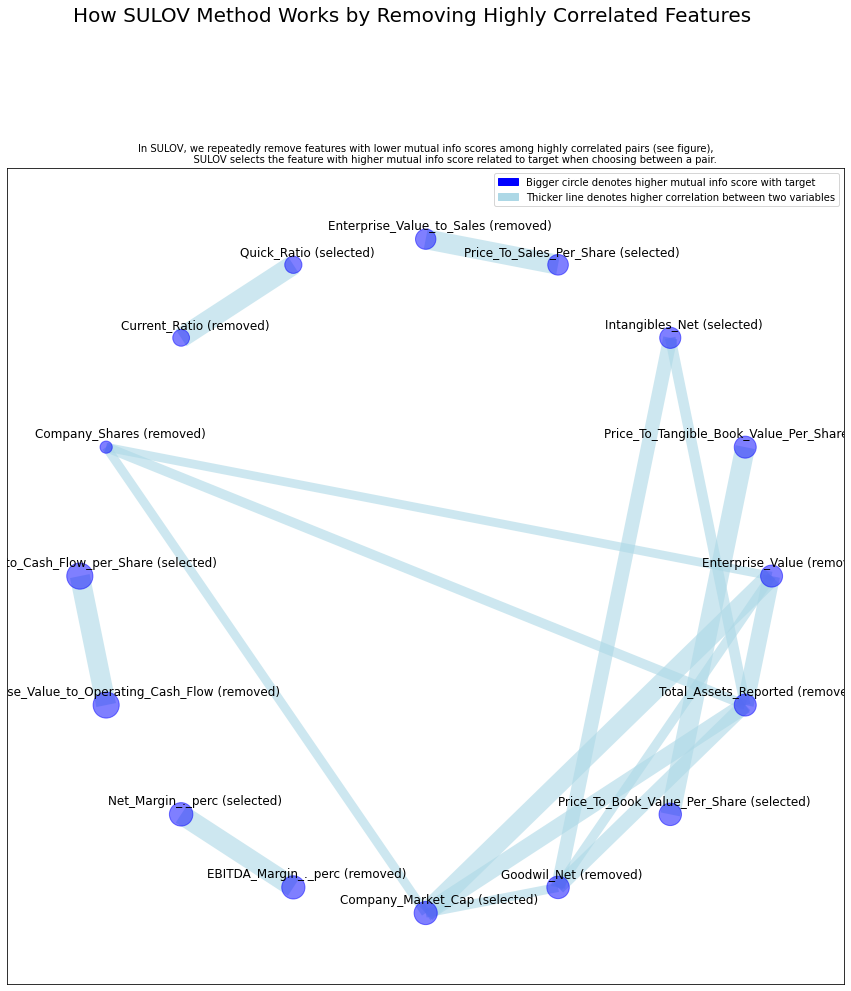

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected vars after SULOV = 23
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 23 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 23 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 18 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 13 variables...
            Time taken for regular XGBoost feature selection = 8 seconds
        using 8 variables...
            Time taken for regular XGBoost feature selection = 9 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 11 seconds
            Total time taken for XGBoost feature select

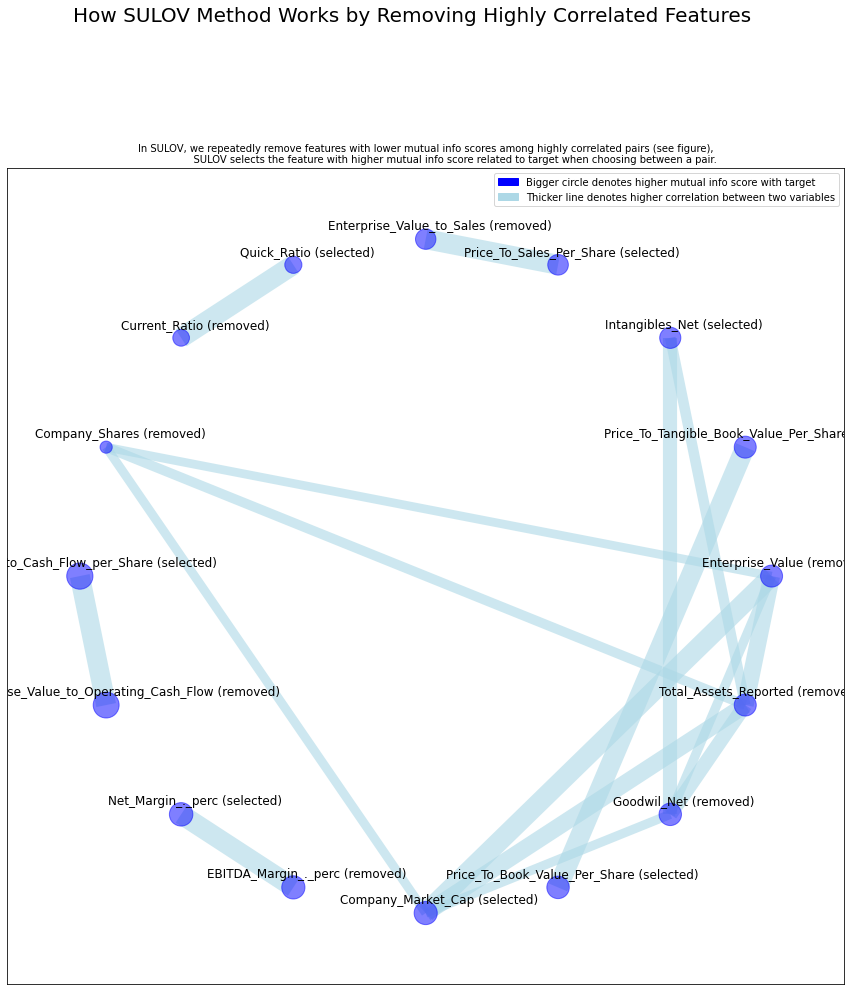

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected vars after SULOV = 23
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 23 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 23 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 18 variables...
            Time taken for regular XGBoost feature selection = 5 seconds
        using 13 variables...
            Time taken for regular XGBoost feature selection = 7 seconds
        using 8 variables...
            Time taken for regular XGBoost feature selection = 9 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 10 seconds
            Total time taken for XGBoost feature select

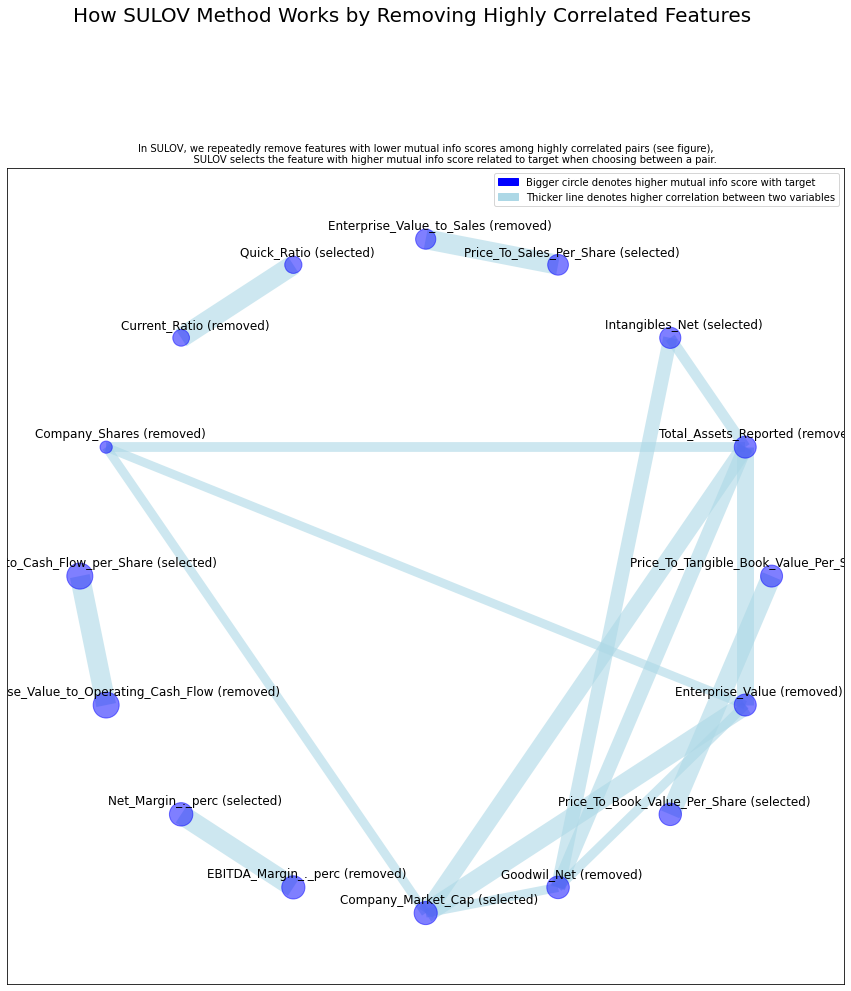

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected vars after SULOV = 23
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 23 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 23 variables...
            Time taken for regular XGBoost feature selection = 3 seconds
        using 18 variables...
            Time taken for regular XGBoost feature selection = 5 seconds
        using 13 variables...
            Time taken for regular XGBoost feature selection = 7 seconds
        using 8 variables...
            Time taken for regular XGBoost feature selection = 9 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 10 seconds
            Total time taken for XGBoost feature select

,Crit_weight,RMSE,MAPE,ALFA
0,40.0,0.97,7.48,-0.0951
1,50.0,0.92,3.42,-0.0723
2,60.0,0.95,5.91,0.0166
3,70.0,1.04,5.15,-0.1132
4,80.0,1.04,6.27,-0.0030
5,90.0,1.03,6.92,0.1108


In [28]:
crit_weight_df = pd.DataFrame(columns = ['Crit_weight', 'RMSE', 'MAPE', 'ALFA'])
for crit_weight in [40, 50, 60, 70, 80, 90]:
    X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

    X_means = X_train.mean()

    X_train = X_train.fillna(X_means)
    X_test = X_test.fillna(X_means)

    selected_cols, imp_df = featurewiz(pd.concat([X_train, y_train], axis = 1), 'alfa', corr_limit=0.4, verbose =0, sep=",", header=0,test_data="", feature_engg="", category_encoders="")
    ctb_reg.fit(X_train[selected_cols], y_train)

    top_pd = pd.DataFrame(ctb_reg.feature_importances_, index = X_train[selected_cols].columns.tolist()).sort_values(0, ascending = False)
    cum_sum = 0
    for col in top_pd.index.tolist():
        if top_pd.loc[col, 0] < 0.01 or cum_sum >= crit_weight:
            break
        last_col = col
        cum_sum += top_pd.loc[col, 0]    
    selected_cols = top_pd.loc[:last_col, :].index.tolist()
    X_train = X_train[selected_cols]
    X_test = X_test[selected_cols]
    ctb_reg.fit(X_train, y_train)

    y_pred_ctb = ctb_reg.predict(X_test)

    baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(data_test, y_pred_ctb)
    crit_weight_df.loc[len(crit_weight_df)] = [crit_weight, baseline_score_rmse_mean, 
                                               baseline_score_mape_mean, avg_alfa_baseline_mean]
crit_weight_df

### 5. By variance inflation factor and MRMR

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 22)
    Caution: We will try to reduce the memory usage of dataframe from 5.02 MB
        memory usage after optimization is: 1.86 MB
        decreased by 63.0%
     Loaded. Shape = (28614, 22)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

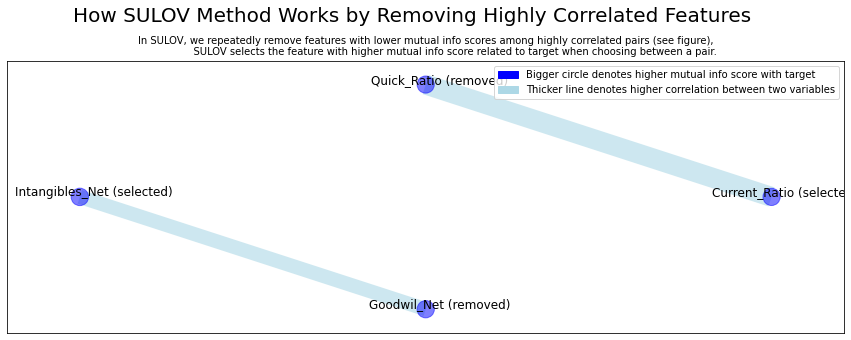

Time taken for SULOV method = 1 seconds
    Adding 0 categorical variables to reduced numeric variables  of 19
Final list of selected vars after SULOV = 19
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 19 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 19 variables...
            Time taken for regular XGBoost feature selection = 2 seconds
        using 15 variables...
            Time taken for regular XGBoost feature selection = 4 seconds
        using 11 variables...
            Time taken for regular XGBoost feature selection = 5 seconds
        using 7 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 7 seconds
            Total time taken for XGBoost feature selecti

In [40]:
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)

x_incl_const = sm.add_constant(X_train)
vif = pd.DataFrame([variance_inflation_factor(exog = x_incl_const.values, exog_idx = i)
               for i in range(x_incl_const.shape[1])],
              index=['const']+X_train.columns.tolist())
without_mult_cols = vif[vif[0] < 5].drop(index = 'const', errors = 'ignore').index.tolist()
X_train = X_train[without_mult_cols]
X_test = X_test[without_mult_cols]
selected_cols, imp_df = featurewiz(pd.concat([X_train, y_train], axis = 1), 'alfa', corr_limit=0.6, verbose =0, sep=",", header=0,test_data="", feature_engg="", category_encoders="")
ctb_reg.fit(X_train[selected_cols], y_train)

y_pred_ctb = ctb_reg.predict(X_test[selected_cols])

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(data_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

### 6. By variance inflation factor and p-value

In [58]:
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)

x_incl_const = sm.add_constant(X_train)
vif = pd.DataFrame([variance_inflation_factor(exog = x_incl_const.values, exog_idx = i)
               for i in range(x_incl_const.shape[1])],
              index=['const']+X_train.columns.tolist())
without_mult_cols = vif[vif[0] < 5].drop(index = 'const', errors = 'ignore').index.tolist()
X_train = X_train[without_mult_cols]
X_test = X_test[without_mult_cols]

x_incl_const = sm.add_constant(X_train)
model = OLS(y_train, x_incl_const)
results = model.fit()
p_df = pd.DataFrame({'coef':results.params, 'p-value':round(results.pvalues, 3), 'param':['const']+X_train.columns.tolist()})
selected_cols = p_df[p_df['p-value'] < 0.05].index.tolist()
ctb_reg.fit(X_train[selected_cols], y_train)

y_pred_ctb = ctb_reg.predict(X_test[selected_cols])

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(data_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

Baseline RMSE score of portfolio =  0.71
Baseline MAPE score of portfolio =  1.47
Average alfa of portfolio =  -0.1218


# Tuning

In [25]:
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)

x_incl_const = sm.add_constant(X_train)
vif = pd.DataFrame([variance_inflation_factor(exog = x_incl_const.values, exog_idx = i)
               for i in range(x_incl_const.shape[1])],
              index=['const']+X_train.columns.tolist())
without_mult_cols = vif[vif[0] < 5].drop(index = 'const', errors = 'ignore').index.tolist()
X_train = X_train[without_mult_cols]
X_test = X_test[without_mult_cols]

x_incl_const = sm.add_constant(X_train)
model = OLS(y_train, x_incl_const)
results = model.fit()
p_df = pd.DataFrame({'coef':results.params, 'p-value':round(results.pvalues, 3), 'param':['const']+X_train.columns.tolist()})
selected_cols = p_df[p_df['p-value'] < 0.05].index.tolist()
X_train = X_train[selected_cols]
X_test = X_test[selected_cols]

params = {'depth':[4,5,7,10],
          'iterations':[10, 20, 100, 200, 500],
          'learning_rate':[0.1, 0.01, 0.03, 0.5]}
best_params = catboost_GridSearchCV(X_train, X_test, y_train, y_test, params)
best_params

Params Tuning::   0%|                                                                           | 0/80 [00:00<?, ?it/s]

Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.22ms	remaining: 3.22s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.31ms	remaining: 3.15s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 9.66ms	remaining: 3.21s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 13.1ms	remaining: 3.25s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 16.1ms	remaining: 3.2s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 19.1ms	remaining: 3.17s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 22.4ms	remaining: 3.18s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 26.4ms	remaining: 3.27s
8:	learn: 0.3732690	test: 0.3855938	best: 0.3855538 (6)	total: 29.5ms	remaining: 3.25s
9:	learn: 0.3732131	test: 0.3855571	best: 0.3855538 (6)	total: 32.6ms	remaining: 3.22s
10:	learn: 0.3731791	test: 0.3855237	best: 0.3855237 (10)	total: 35.7ms	remaining: 3.21s
11:	learn: 0

98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 335ms	remaining: 3.05s
99:	learn: 0.3714112	test: 0.3860681	best: 0.3853443 (22)	total: 338ms	remaining: 3.04s
100:	learn: 0.3714024	test: 0.3860635	best: 0.3853443 (22)	total: 341ms	remaining: 3.04s
101:	learn: 0.3713751	test: 0.3860730	best: 0.3853443 (22)	total: 345ms	remaining: 3.04s
102:	learn: 0.3713681	test: 0.3860868	best: 0.3853443 (22)	total: 348ms	remaining: 3.03s
103:	learn: 0.3713592	test: 0.3860731	best: 0.3853443 (22)	total: 352ms	remaining: 3.03s
104:	learn: 0.3713499	test: 0.3860496	best: 0.3853443 (22)	total: 356ms	remaining: 3.03s
105:	learn: 0.3713385	test: 0.3860724	best: 0.3853443 (22)	total: 360ms	remaining: 3.03s
106:	learn: 0.3712784	test: 0.3860338	best: 0.3853443 (22)	total: 363ms	remaining: 3.03s
107:	learn: 0.3712594	test: 0.3859763	best: 0.3853443 (22)	total: 366ms	remaining: 3.02s
108:	learn: 0.3712488	test: 0.3859814	best: 0.3853443 (22)	total: 369ms	remaining: 3.02s
109:	learn: 0.3712281	t

212:	learn: 0.3689102	test: 0.3865432	best: 0.3853443 (22)	total: 690ms	remaining: 2.55s
213:	learn: 0.3688984	test: 0.3865289	best: 0.3853443 (22)	total: 693ms	remaining: 2.55s
214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 697ms	remaining: 2.54s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 700ms	remaining: 2.54s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 703ms	remaining: 2.54s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 707ms	remaining: 2.53s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 710ms	remaining: 2.53s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 713ms	remaining: 2.53s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 716ms	remaining: 2.52s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 720ms	remaining: 2.52s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 722ms	remaining: 2.52s
223:	learn: 0.3687150

325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.04s	remaining: 2.15s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.05s	remaining: 2.15s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.05s	remaining: 2.15s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.05s	remaining: 2.15s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.06s	remaining: 2.15s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.06s	remaining: 2.14s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.06s	remaining: 2.14s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.07s	remaining: 2.14s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.07s	remaining: 2.13s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.08s	remaining: 2.14s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.08s	remaining: 2.14s
336:	learn: 0.3669395

420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.39s	remaining: 1.92s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.4s	remaining: 1.91s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.4s	remaining: 1.91s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.4s	remaining: 1.91s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.41s	remaining: 1.9s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.41s	remaining: 1.9s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.41s	remaining: 1.9s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.42s	remaining: 1.89s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.42s	remaining: 1.89s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.42s	remaining: 1.89s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.43s	remaining: 1.88s
431:	learn: 0.3655458	test:

536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.75s	remaining: 1.51s
537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.75s	remaining: 1.5s
538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.75s	remaining: 1.5s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.76s	remaining: 1.5s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.76s	remaining: 1.49s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.76s	remaining: 1.49s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.77s	remaining: 1.49s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.77s	remaining: 1.48s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.77s	remaining: 1.48s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.78s	remaining: 1.48s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.78s	remaining: 1.47s
547:	learn: 0.3640675	te

652:	learn: 0.3627174	test: 0.3899619	best: 0.3853443 (22)	total: 2.1s	remaining: 1.12s
653:	learn: 0.3627145	test: 0.3899666	best: 0.3853443 (22)	total: 2.1s	remaining: 1.11s
654:	learn: 0.3627042	test: 0.3899791	best: 0.3853443 (22)	total: 2.11s	remaining: 1.11s
655:	learn: 0.3626980	test: 0.3899847	best: 0.3853443 (22)	total: 2.11s	remaining: 1.11s
656:	learn: 0.3626926	test: 0.3899736	best: 0.3853443 (22)	total: 2.12s	remaining: 1.1s
657:	learn: 0.3626768	test: 0.3899953	best: 0.3853443 (22)	total: 2.12s	remaining: 1.1s
658:	learn: 0.3626529	test: 0.3900366	best: 0.3853443 (22)	total: 2.12s	remaining: 1.1s
659:	learn: 0.3626491	test: 0.3900351	best: 0.3853443 (22)	total: 2.13s	remaining: 1.09s
660:	learn: 0.3626376	test: 0.3900322	best: 0.3853443 (22)	total: 2.13s	remaining: 1.09s
661:	learn: 0.3626267	test: 0.3900501	best: 0.3853443 (22)	total: 2.13s	remaining: 1.09s
662:	learn: 0.3626041	test: 0.3900767	best: 0.3853443 (22)	total: 2.14s	remaining: 1.09s
663:	learn: 0.3625825	test

760:	learn: 0.3614597	test: 0.3904845	best: 0.3853443 (22)	total: 2.46s	remaining: 771ms
761:	learn: 0.3614531	test: 0.3905117	best: 0.3853443 (22)	total: 2.46s	remaining: 768ms
762:	learn: 0.3614459	test: 0.3905110	best: 0.3853443 (22)	total: 2.46s	remaining: 765ms
763:	learn: 0.3614352	test: 0.3905115	best: 0.3853443 (22)	total: 2.46s	remaining: 761ms
764:	learn: 0.3614130	test: 0.3905381	best: 0.3853443 (22)	total: 2.47s	remaining: 758ms
765:	learn: 0.3614033	test: 0.3905255	best: 0.3853443 (22)	total: 2.47s	remaining: 755ms
766:	learn: 0.3613913	test: 0.3905295	best: 0.3853443 (22)	total: 2.47s	remaining: 751ms
767:	learn: 0.3613652	test: 0.3905470	best: 0.3853443 (22)	total: 2.48s	remaining: 748ms
768:	learn: 0.3613582	test: 0.3905477	best: 0.3853443 (22)	total: 2.48s	remaining: 745ms
769:	learn: 0.3613500	test: 0.3905590	best: 0.3853443 (22)	total: 2.48s	remaining: 742ms
770:	learn: 0.3613405	test: 0.3905685	best: 0.3853443 (22)	total: 2.49s	remaining: 738ms
771:	learn: 0.3613271

872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 2.81s	remaining: 409ms
873:	learn: 0.3601409	test: 0.3910182	best: 0.3853443 (22)	total: 2.81s	remaining: 405ms
874:	learn: 0.3601275	test: 0.3910149	best: 0.3853443 (22)	total: 2.81s	remaining: 402ms
875:	learn: 0.3601110	test: 0.3909961	best: 0.3853443 (22)	total: 2.82s	remaining: 399ms
876:	learn: 0.3600884	test: 0.3909981	best: 0.3853443 (22)	total: 2.82s	remaining: 396ms
877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 2.82s	remaining: 393ms
878:	learn: 0.3600475	test: 0.3909861	best: 0.3853443 (22)	total: 2.83s	remaining: 389ms
879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 2.83s	remaining: 386ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 2.83s	remaining: 383ms
881:	learn: 0.3600284	test: 0.3909978	best: 0.3853443 (22)	total: 2.84s	remaining: 380ms
882:	learn: 0.3600198	test: 0.3909998	best: 0.3853443 (22)	total: 2.84s	remaining: 376ms
883:	learn: 0.3600114

Params Tuning::   1%|8                                                                  | 1/80 [00:03<04:34,  3.48s/it]

982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.16s	remaining: 54.6ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.16s	remaining: 51.4ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.17s	remaining: 48.2ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.17s	remaining: 45ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.17s	remaining: 41.8ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.18s	remaining: 38.6ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.18s	remaining: 35.4ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.18s	remaining: 32.2ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.19s	remaining: 28.9ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.19s	remaining: 25.7ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.19s	remaining: 22.5ms
993:	learn: 

101:	learn: 0.3713751	test: 0.3860730	best: 0.3853443 (22)	total: 413ms	remaining: 3.63s
102:	learn: 0.3713681	test: 0.3860868	best: 0.3853443 (22)	total: 416ms	remaining: 3.62s
103:	learn: 0.3713592	test: 0.3860731	best: 0.3853443 (22)	total: 419ms	remaining: 3.61s
104:	learn: 0.3713499	test: 0.3860496	best: 0.3853443 (22)	total: 423ms	remaining: 3.6s
105:	learn: 0.3713385	test: 0.3860724	best: 0.3853443 (22)	total: 426ms	remaining: 3.59s
106:	learn: 0.3712784	test: 0.3860338	best: 0.3853443 (22)	total: 429ms	remaining: 3.58s
107:	learn: 0.3712594	test: 0.3859763	best: 0.3853443 (22)	total: 432ms	remaining: 3.56s
108:	learn: 0.3712488	test: 0.3859814	best: 0.3853443 (22)	total: 435ms	remaining: 3.55s
109:	learn: 0.3712281	test: 0.3860191	best: 0.3853443 (22)	total: 439ms	remaining: 3.55s
110:	learn: 0.3712082	test: 0.3860041	best: 0.3853443 (22)	total: 442ms	remaining: 3.54s
111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 445ms	remaining: 3.53s
112:	learn: 0.3711865	

210:	learn: 0.3689382	test: 0.3865447	best: 0.3853443 (22)	total: 768ms	remaining: 2.87s
211:	learn: 0.3689293	test: 0.3865444	best: 0.3853443 (22)	total: 772ms	remaining: 2.87s
212:	learn: 0.3689102	test: 0.3865432	best: 0.3853443 (22)	total: 776ms	remaining: 2.87s
213:	learn: 0.3688984	test: 0.3865289	best: 0.3853443 (22)	total: 780ms	remaining: 2.86s
214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 786ms	remaining: 2.87s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 790ms	remaining: 2.87s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 794ms	remaining: 2.86s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 798ms	remaining: 2.86s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 801ms	remaining: 2.86s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 806ms	remaining: 2.86s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 809ms	remaining: 2.85s
221:	learn: 0.3687561

317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.12s	remaining: 2.41s
318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.12s	remaining: 2.4s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.13s	remaining: 2.4s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.13s	remaining: 2.39s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.13s	remaining: 2.39s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.14s	remaining: 2.38s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.14s	remaining: 2.38s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.14s	remaining: 2.37s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.15s	remaining: 2.37s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.15s	remaining: 2.37s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.15s	remaining: 2.36s
328:	learn: 0.3670277	t

420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.47s	remaining: 2.03s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.48s	remaining: 2.02s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.48s	remaining: 2.02s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.48s	remaining: 2.02s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.49s	remaining: 2.01s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.49s	remaining: 2.01s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.49s	remaining: 2s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.5s	remaining: 2s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.5s	remaining: 2s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.5s	remaining: 1.99s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.51s	remaining: 1.99s
431:	learn: 0.3655458	test: 0.388

561:	learn: 0.3638593	test: 0.3894363	best: 0.3853443 (22)	total: 2s	remaining: 1.56s
562:	learn: 0.3638462	test: 0.3894612	best: 0.3853443 (22)	total: 2s	remaining: 1.55s
563:	learn: 0.3638267	test: 0.3894657	best: 0.3853443 (22)	total: 2.01s	remaining: 1.55s
564:	learn: 0.3638192	test: 0.3894725	best: 0.3853443 (22)	total: 2.01s	remaining: 1.55s
565:	learn: 0.3638042	test: 0.3895018	best: 0.3853443 (22)	total: 2.01s	remaining: 1.54s
566:	learn: 0.3637988	test: 0.3895015	best: 0.3853443 (22)	total: 2.02s	remaining: 1.54s
567:	learn: 0.3637843	test: 0.3895177	best: 0.3853443 (22)	total: 2.02s	remaining: 1.54s
568:	learn: 0.3637728	test: 0.3895209	best: 0.3853443 (22)	total: 2.02s	remaining: 1.53s
569:	learn: 0.3637564	test: 0.3894882	best: 0.3853443 (22)	total: 2.03s	remaining: 1.53s
570:	learn: 0.3637513	test: 0.3894886	best: 0.3853443 (22)	total: 2.03s	remaining: 1.52s
571:	learn: 0.3637332	test: 0.3894933	best: 0.3853443 (22)	total: 2.03s	remaining: 1.52s
572:	learn: 0.3637283	test:

662:	learn: 0.3626041	test: 0.3900767	best: 0.3853443 (22)	total: 2.35s	remaining: 1.2s
663:	learn: 0.3625825	test: 0.3901262	best: 0.3853443 (22)	total: 2.35s	remaining: 1.19s
664:	learn: 0.3625704	test: 0.3901190	best: 0.3853443 (22)	total: 2.36s	remaining: 1.19s
665:	learn: 0.3625594	test: 0.3901528	best: 0.3853443 (22)	total: 2.36s	remaining: 1.19s
666:	learn: 0.3625530	test: 0.3901775	best: 0.3853443 (22)	total: 2.37s	remaining: 1.18s
667:	learn: 0.3625427	test: 0.3901769	best: 0.3853443 (22)	total: 2.37s	remaining: 1.18s
668:	learn: 0.3625317	test: 0.3901701	best: 0.3853443 (22)	total: 2.38s	remaining: 1.18s
669:	learn: 0.3625226	test: 0.3901716	best: 0.3853443 (22)	total: 2.39s	remaining: 1.18s
670:	learn: 0.3625074	test: 0.3901737	best: 0.3853443 (22)	total: 2.39s	remaining: 1.17s
671:	learn: 0.3624963	test: 0.3901736	best: 0.3853443 (22)	total: 2.39s	remaining: 1.17s
672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 2.4s	remaining: 1.17s
673:	learn: 0.3624593	t

756:	learn: 0.3615199	test: 0.3904987	best: 0.3853443 (22)	total: 2.71s	remaining: 870ms
757:	learn: 0.3615065	test: 0.3905258	best: 0.3853443 (22)	total: 2.71s	remaining: 866ms
758:	learn: 0.3614747	test: 0.3904859	best: 0.3853443 (22)	total: 2.72s	remaining: 862ms
759:	learn: 0.3614646	test: 0.3904890	best: 0.3853443 (22)	total: 2.72s	remaining: 860ms
760:	learn: 0.3614597	test: 0.3904845	best: 0.3853443 (22)	total: 2.73s	remaining: 856ms
761:	learn: 0.3614531	test: 0.3905117	best: 0.3853443 (22)	total: 2.73s	remaining: 853ms
762:	learn: 0.3614459	test: 0.3905110	best: 0.3853443 (22)	total: 2.74s	remaining: 850ms
763:	learn: 0.3614352	test: 0.3905115	best: 0.3853443 (22)	total: 2.74s	remaining: 847ms
764:	learn: 0.3614130	test: 0.3905381	best: 0.3853443 (22)	total: 2.75s	remaining: 845ms
765:	learn: 0.3614033	test: 0.3905255	best: 0.3853443 (22)	total: 2.76s	remaining: 842ms
766:	learn: 0.3613913	test: 0.3905295	best: 0.3853443 (22)	total: 2.76s	remaining: 839ms
767:	learn: 0.3613652

882:	learn: 0.3600198	test: 0.3909998	best: 0.3853443 (22)	total: 3.24s	remaining: 429ms
883:	learn: 0.3600114	test: 0.3909981	best: 0.3853443 (22)	total: 3.24s	remaining: 426ms
884:	learn: 0.3599927	test: 0.3910074	best: 0.3853443 (22)	total: 3.25s	remaining: 422ms
885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 3.25s	remaining: 419ms
886:	learn: 0.3599643	test: 0.3909950	best: 0.3853443 (22)	total: 3.26s	remaining: 415ms
887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 3.26s	remaining: 411ms
888:	learn: 0.3599422	test: 0.3910004	best: 0.3853443 (22)	total: 3.26s	remaining: 408ms
889:	learn: 0.3599324	test: 0.3910009	best: 0.3853443 (22)	total: 3.27s	remaining: 404ms
890:	learn: 0.3599231	test: 0.3910175	best: 0.3853443 (22)	total: 3.27s	remaining: 400ms
891:	learn: 0.3599080	test: 0.3910210	best: 0.3853443 (22)	total: 3.27s	remaining: 396ms
892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 3.28s	remaining: 393ms
893:	learn: 0.3598873

Params Tuning::   2%|#6                                                                 | 2/80 [00:07<04:52,  3.75s/it]

977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.59s	remaining: 80.7ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.59s	remaining: 77ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.59s	remaining: 73.4ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.6s	remaining: 69.7ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.6s	remaining: 66ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.6s	remaining: 62.3ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.61s	remaining: 58.6ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.61s	remaining: 55ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.61s	remaining: 51.3ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.62s	remaining: 47.6ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.62s	remaining: 44ms
988:	learn: 0.3588564

78:	learn: 0.3717127	test: 0.3857203	best: 0.3853443 (22)	total: 252ms	remaining: 2.94s
79:	learn: 0.3716864	test: 0.3857161	best: 0.3853443 (22)	total: 255ms	remaining: 2.93s
80:	learn: 0.3716764	test: 0.3857286	best: 0.3853443 (22)	total: 258ms	remaining: 2.93s
81:	learn: 0.3716647	test: 0.3857444	best: 0.3853443 (22)	total: 261ms	remaining: 2.93s
82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 265ms	remaining: 2.92s
83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 268ms	remaining: 2.92s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 271ms	remaining: 2.91s
85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 274ms	remaining: 2.91s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 277ms	remaining: 2.9s
87:	learn: 0.3715813	test: 0.3858399	best: 0.3853443 (22)	total: 280ms	remaining: 2.9s
88:	learn: 0.3715686	test: 0.3858647	best: 0.3853443 (22)	total: 283ms	remaining: 2.9s
89:	learn: 0.3715581	test: 0.385871

183:	learn: 0.3694853	test: 0.3864102	best: 0.3853443 (22)	total: 606ms	remaining: 2.69s
184:	learn: 0.3694452	test: 0.3864039	best: 0.3853443 (22)	total: 609ms	remaining: 2.68s
185:	learn: 0.3694205	test: 0.3864020	best: 0.3853443 (22)	total: 612ms	remaining: 2.68s
186:	learn: 0.3693976	test: 0.3864067	best: 0.3853443 (22)	total: 614ms	remaining: 2.67s
187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 618ms	remaining: 2.67s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 621ms	remaining: 2.66s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 623ms	remaining: 2.66s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 626ms	remaining: 2.65s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 629ms	remaining: 2.65s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 632ms	remaining: 2.64s
193:	learn: 0.3692755	test: 0.3865871	best: 0.3853443 (22)	total: 636ms	remaining: 2.64s
194:	learn: 0.3692569

285:	learn: 0.3676494	test: 0.3872489	best: 0.3853443 (22)	total: 957ms	remaining: 2.39s
286:	learn: 0.3676312	test: 0.3872618	best: 0.3853443 (22)	total: 960ms	remaining: 2.38s
287:	learn: 0.3676217	test: 0.3872579	best: 0.3853443 (22)	total: 963ms	remaining: 2.38s
288:	learn: 0.3676100	test: 0.3872958	best: 0.3853443 (22)	total: 966ms	remaining: 2.38s
289:	learn: 0.3675736	test: 0.3872750	best: 0.3853443 (22)	total: 969ms	remaining: 2.37s
290:	learn: 0.3675598	test: 0.3872993	best: 0.3853443 (22)	total: 972ms	remaining: 2.37s
291:	learn: 0.3675443	test: 0.3872960	best: 0.3853443 (22)	total: 975ms	remaining: 2.36s
292:	learn: 0.3675283	test: 0.3873030	best: 0.3853443 (22)	total: 978ms	remaining: 2.36s
293:	learn: 0.3675196	test: 0.3872958	best: 0.3853443 (22)	total: 981ms	remaining: 2.36s
294:	learn: 0.3674996	test: 0.3873029	best: 0.3853443 (22)	total: 984ms	remaining: 2.35s
295:	learn: 0.3674907	test: 0.3872914	best: 0.3853443 (22)	total: 987ms	remaining: 2.35s
296:	learn: 0.3674757

403:	learn: 0.3659120	test: 0.3883557	best: 0.3853443 (22)	total: 1.31s	remaining: 1.93s
404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.31s	remaining: 1.93s
405:	learn: 0.3658840	test: 0.3883684	best: 0.3853443 (22)	total: 1.31s	remaining: 1.92s
406:	learn: 0.3658730	test: 0.3883681	best: 0.3853443 (22)	total: 1.32s	remaining: 1.92s
407:	learn: 0.3658697	test: 0.3883685	best: 0.3853443 (22)	total: 1.32s	remaining: 1.92s
408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.32s	remaining: 1.91s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.33s	remaining: 1.91s
410:	learn: 0.3658268	test: 0.3883992	best: 0.3853443 (22)	total: 1.33s	remaining: 1.91s
411:	learn: 0.3658151	test: 0.3884050	best: 0.3853443 (22)	total: 1.33s	remaining: 1.9s
412:	learn: 0.3658003	test: 0.3884099	best: 0.3853443 (22)	total: 1.34s	remaining: 1.9s
413:	learn: 0.3657831	test: 0.3884146	best: 0.3853443 (22)	total: 1.34s	remaining: 1.9s
414:	learn: 0.3657742	te

518:	learn: 0.3644697	test: 0.3891017	best: 0.3853443 (22)	total: 1.67s	remaining: 1.54s
519:	learn: 0.3644524	test: 0.3891066	best: 0.3853443 (22)	total: 1.67s	remaining: 1.54s
520:	learn: 0.3644330	test: 0.3891104	best: 0.3853443 (22)	total: 1.67s	remaining: 1.54s
521:	learn: 0.3644307	test: 0.3891112	best: 0.3853443 (22)	total: 1.68s	remaining: 1.53s
522:	learn: 0.3644228	test: 0.3891105	best: 0.3853443 (22)	total: 1.68s	remaining: 1.53s
523:	learn: 0.3644152	test: 0.3891228	best: 0.3853443 (22)	total: 1.69s	remaining: 1.53s
524:	learn: 0.3643965	test: 0.3891234	best: 0.3853443 (22)	total: 1.69s	remaining: 1.53s
525:	learn: 0.3643807	test: 0.3891393	best: 0.3853443 (22)	total: 1.7s	remaining: 1.53s
526:	learn: 0.3643613	test: 0.3891477	best: 0.3853443 (22)	total: 1.7s	remaining: 1.52s
527:	learn: 0.3643486	test: 0.3891524	best: 0.3853443 (22)	total: 1.7s	remaining: 1.52s
528:	learn: 0.3643417	test: 0.3891671	best: 0.3853443 (22)	total: 1.71s	remaining: 1.52s
529:	learn: 0.3643299	te

624:	learn: 0.3630629	test: 0.3896989	best: 0.3853443 (22)	total: 2.02s	remaining: 1.21s
625:	learn: 0.3630527	test: 0.3897015	best: 0.3853443 (22)	total: 2.02s	remaining: 1.21s
626:	learn: 0.3630439	test: 0.3897044	best: 0.3853443 (22)	total: 2.02s	remaining: 1.2s
627:	learn: 0.3630327	test: 0.3897012	best: 0.3853443 (22)	total: 2.03s	remaining: 1.2s
628:	learn: 0.3630269	test: 0.3897240	best: 0.3853443 (22)	total: 2.03s	remaining: 1.2s
629:	learn: 0.3630142	test: 0.3897387	best: 0.3853443 (22)	total: 2.03s	remaining: 1.19s
630:	learn: 0.3630000	test: 0.3897366	best: 0.3853443 (22)	total: 2.04s	remaining: 1.19s
631:	learn: 0.3629928	test: 0.3897381	best: 0.3853443 (22)	total: 2.04s	remaining: 1.19s
632:	learn: 0.3629822	test: 0.3897457	best: 0.3853443 (22)	total: 2.04s	remaining: 1.18s
633:	learn: 0.3629662	test: 0.3897569	best: 0.3853443 (22)	total: 2.05s	remaining: 1.18s
634:	learn: 0.3629545	test: 0.3897631	best: 0.3853443 (22)	total: 2.05s	remaining: 1.18s
635:	learn: 0.3629488	te

737:	learn: 0.3617300	test: 0.3904694	best: 0.3853443 (22)	total: 2.37s	remaining: 842ms
738:	learn: 0.3617153	test: 0.3904539	best: 0.3853443 (22)	total: 2.38s	remaining: 839ms
739:	learn: 0.3617006	test: 0.3904520	best: 0.3853443 (22)	total: 2.38s	remaining: 836ms
740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.38s	remaining: 833ms
741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.38s	remaining: 829ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.39s	remaining: 826ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.39s	remaining: 823ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.39s	remaining: 820ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.4s	remaining: 816ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.4s	remaining: 813ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.4s	remaining: 810ms
748:	learn: 0.3616033	te

850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.72s	remaining: 477ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.73s	remaining: 474ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 2.73s	remaining: 471ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 2.73s	remaining: 467ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 2.74s	remaining: 464ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 2.74s	remaining: 461ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.74s	remaining: 458ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 2.75s	remaining: 454ms
858:	learn: 0.3603154	test: 0.3909020	best: 0.3853443 (22)	total: 2.75s	remaining: 451ms
859:	learn: 0.3602953	test: 0.3909165	best: 0.3853443 (22)	total: 2.75s	remaining: 448ms
860:	learn: 0.3602923	test: 0.3909310	best: 0.3853443 (22)	total: 2.75s	remaining: 445ms
861:	learn: 0.3602848

Params Tuning::   4%|##5                                                                | 3/80 [00:10<04:37,  3.61s/it]

963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.08s	remaining: 115ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.08s	remaining: 112ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.09s	remaining: 109ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.09s	remaining: 105ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.09s	remaining: 102ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.1s	remaining: 99ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.1s	remaining: 95.8ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.1s	remaining: 92.7ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.1s	remaining: 89.5ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.11s	remaining: 86.3ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.11s	remaining: 83.1ms
974:	learn: 0.3589596

92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 358ms	remaining: 3.49s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 361ms	remaining: 3.48s
94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 364ms	remaining: 3.47s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 370ms	remaining: 3.48s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 374ms	remaining: 3.48s
97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 378ms	remaining: 3.48s
98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 382ms	remaining: 3.47s
99:	learn: 0.3714112	test: 0.3860681	best: 0.3853443 (22)	total: 385ms	remaining: 3.47s
100:	learn: 0.3714024	test: 0.3860635	best: 0.3853443 (22)	total: 388ms	remaining: 3.46s
101:	learn: 0.3713751	test: 0.3860730	best: 0.3853443 (22)	total: 392ms	remaining: 3.45s
102:	learn: 0.3713681	test: 0.3860868	best: 0.3853443 (22)	total: 396ms	remaining: 3.44s
103:	learn: 0.3713592	test: 0

187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 710ms	remaining: 3.07s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 714ms	remaining: 3.06s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 718ms	remaining: 3.06s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 722ms	remaining: 3.06s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 726ms	remaining: 3.05s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 729ms	remaining: 3.05s
193:	learn: 0.3692755	test: 0.3865871	best: 0.3853443 (22)	total: 733ms	remaining: 3.04s
194:	learn: 0.3692569	test: 0.3865914	best: 0.3853443 (22)	total: 737ms	remaining: 3.04s
195:	learn: 0.3692304	test: 0.3865692	best: 0.3853443 (22)	total: 742ms	remaining: 3.04s
196:	learn: 0.3692123	test: 0.3865839	best: 0.3853443 (22)	total: 746ms	remaining: 3.04s
197:	learn: 0.3692047	test: 0.3865885	best: 0.3853443 (22)	total: 749ms	remaining: 3.03s
198:	learn: 0.3691777

291:	learn: 0.3675443	test: 0.3872960	best: 0.3853443 (22)	total: 1.06s	remaining: 2.57s
292:	learn: 0.3675283	test: 0.3873030	best: 0.3853443 (22)	total: 1.06s	remaining: 2.57s
293:	learn: 0.3675196	test: 0.3872958	best: 0.3853443 (22)	total: 1.07s	remaining: 2.57s
294:	learn: 0.3674996	test: 0.3873029	best: 0.3853443 (22)	total: 1.07s	remaining: 2.56s
295:	learn: 0.3674907	test: 0.3872914	best: 0.3853443 (22)	total: 1.07s	remaining: 2.56s
296:	learn: 0.3674757	test: 0.3873139	best: 0.3853443 (22)	total: 1.08s	remaining: 2.55s
297:	learn: 0.3674630	test: 0.3872864	best: 0.3853443 (22)	total: 1.08s	remaining: 2.55s
298:	learn: 0.3674419	test: 0.3872942	best: 0.3853443 (22)	total: 1.08s	remaining: 2.54s
299:	learn: 0.3674382	test: 0.3872932	best: 0.3853443 (22)	total: 1.09s	remaining: 2.54s
300:	learn: 0.3674313	test: 0.3873536	best: 0.3853443 (22)	total: 1.09s	remaining: 2.53s
301:	learn: 0.3674133	test: 0.3873580	best: 0.3853443 (22)	total: 1.09s	remaining: 2.53s
302:	learn: 0.3673926

404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.42s	remaining: 2.08s
405:	learn: 0.3658840	test: 0.3883684	best: 0.3853443 (22)	total: 1.42s	remaining: 2.08s
406:	learn: 0.3658730	test: 0.3883681	best: 0.3853443 (22)	total: 1.42s	remaining: 2.07s
407:	learn: 0.3658697	test: 0.3883685	best: 0.3853443 (22)	total: 1.43s	remaining: 2.07s
408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.43s	remaining: 2.06s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.43s	remaining: 2.06s
410:	learn: 0.3658268	test: 0.3883992	best: 0.3853443 (22)	total: 1.43s	remaining: 2.06s
411:	learn: 0.3658151	test: 0.3884050	best: 0.3853443 (22)	total: 1.44s	remaining: 2.05s
412:	learn: 0.3658003	test: 0.3884099	best: 0.3853443 (22)	total: 1.44s	remaining: 2.05s
413:	learn: 0.3657831	test: 0.3884146	best: 0.3853443 (22)	total: 1.44s	remaining: 2.04s
414:	learn: 0.3657742	test: 0.3884174	best: 0.3853443 (22)	total: 1.45s	remaining: 2.04s
415:	learn: 0.3657649

518:	learn: 0.3644697	test: 0.3891017	best: 0.3853443 (22)	total: 1.77s	remaining: 1.64s
519:	learn: 0.3644524	test: 0.3891066	best: 0.3853443 (22)	total: 1.77s	remaining: 1.63s
520:	learn: 0.3644330	test: 0.3891104	best: 0.3853443 (22)	total: 1.77s	remaining: 1.63s
521:	learn: 0.3644307	test: 0.3891112	best: 0.3853443 (22)	total: 1.78s	remaining: 1.63s
522:	learn: 0.3644228	test: 0.3891105	best: 0.3853443 (22)	total: 1.78s	remaining: 1.62s
523:	learn: 0.3644152	test: 0.3891228	best: 0.3853443 (22)	total: 1.78s	remaining: 1.62s
524:	learn: 0.3643965	test: 0.3891234	best: 0.3853443 (22)	total: 1.78s	remaining: 1.61s
525:	learn: 0.3643807	test: 0.3891393	best: 0.3853443 (22)	total: 1.79s	remaining: 1.61s
526:	learn: 0.3643613	test: 0.3891477	best: 0.3853443 (22)	total: 1.79s	remaining: 1.61s
527:	learn: 0.3643486	test: 0.3891524	best: 0.3853443 (22)	total: 1.79s	remaining: 1.6s
528:	learn: 0.3643417	test: 0.3891671	best: 0.3853443 (22)	total: 1.8s	remaining: 1.6s
529:	learn: 0.3643299	te

635:	learn: 0.3629488	test: 0.3897885	best: 0.3853443 (22)	total: 2.12s	remaining: 1.21s
636:	learn: 0.3629266	test: 0.3898235	best: 0.3853443 (22)	total: 2.13s	remaining: 1.21s
637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.13s	remaining: 1.21s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.13s	remaining: 1.2s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.13s	remaining: 1.2s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.14s	remaining: 1.2s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.14s	remaining: 1.19s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.14s	remaining: 1.19s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.15s	remaining: 1.19s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.15s	remaining: 1.18s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.15s	remaining: 1.18s
646:	learn: 0.3627737	te

751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.48s	remaining: 817ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.48s	remaining: 814ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.48s	remaining: 810ms
754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.49s	remaining: 807ms
755:	learn: 0.3615280	test: 0.3905035	best: 0.3853443 (22)	total: 2.49s	remaining: 803ms
756:	learn: 0.3615199	test: 0.3904987	best: 0.3853443 (22)	total: 2.49s	remaining: 800ms
757:	learn: 0.3615065	test: 0.3905258	best: 0.3853443 (22)	total: 2.5s	remaining: 797ms
758:	learn: 0.3614747	test: 0.3904859	best: 0.3853443 (22)	total: 2.5s	remaining: 793ms
759:	learn: 0.3614646	test: 0.3904890	best: 0.3853443 (22)	total: 2.5s	remaining: 790ms
760:	learn: 0.3614597	test: 0.3904845	best: 0.3853443 (22)	total: 2.5s	remaining: 786ms
761:	learn: 0.3614531	test: 0.3905117	best: 0.3853443 (22)	total: 2.51s	remaining: 783ms
762:	learn: 0.3614459	tes

870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 2.83s	remaining: 419ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 2.83s	remaining: 416ms
872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 2.84s	remaining: 413ms
873:	learn: 0.3601409	test: 0.3910182	best: 0.3853443 (22)	total: 2.84s	remaining: 410ms
874:	learn: 0.3601275	test: 0.3910149	best: 0.3853443 (22)	total: 2.84s	remaining: 406ms
875:	learn: 0.3601110	test: 0.3909961	best: 0.3853443 (22)	total: 2.85s	remaining: 403ms
876:	learn: 0.3600884	test: 0.3909981	best: 0.3853443 (22)	total: 2.85s	remaining: 400ms
877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 2.85s	remaining: 396ms
878:	learn: 0.3600475	test: 0.3909861	best: 0.3853443 (22)	total: 2.86s	remaining: 393ms
879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 2.86s	remaining: 390ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 2.86s	remaining: 387ms
881:	learn: 0.3600284

Params Tuning::   5%|###3                                                               | 4/80 [00:14<04:29,  3.55s/it]

987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.19s	remaining: 38.7ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.19s	remaining: 35.5ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.19s	remaining: 32.2ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.19s	remaining: 29ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.2s	remaining: 25.8ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.2s	remaining: 22.6ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.2s	remaining: 19.3ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.21s	remaining: 16.1ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.21s	remaining: 12.9ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.21s	remaining: 9.67ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.22s	remaining: 6.45ms
998:	learn: 0.3

94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 287ms	remaining: 2.73s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 290ms	remaining: 2.73s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 293ms	remaining: 2.73s
97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 296ms	remaining: 2.73s
98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 300ms	remaining: 2.73s
99:	learn: 0.3714112	test: 0.3860681	best: 0.3853443 (22)	total: 303ms	remaining: 2.72s
100:	learn: 0.3714024	test: 0.3860635	best: 0.3853443 (22)	total: 306ms	remaining: 2.72s
101:	learn: 0.3713751	test: 0.3860730	best: 0.3853443 (22)	total: 309ms	remaining: 2.72s
102:	learn: 0.3713681	test: 0.3860868	best: 0.3853443 (22)	total: 311ms	remaining: 2.71s
103:	learn: 0.3713592	test: 0.3860731	best: 0.3853443 (22)	total: 314ms	remaining: 2.71s
104:	learn: 0.3713499	test: 0.3860496	best: 0.3853443 (22)	total: 317ms	remaining: 2.7s
105:	learn: 0.3713385	test: 

214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 640ms	remaining: 2.34s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 643ms	remaining: 2.33s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 647ms	remaining: 2.33s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 650ms	remaining: 2.33s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 653ms	remaining: 2.33s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 655ms	remaining: 2.32s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 658ms	remaining: 2.32s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 661ms	remaining: 2.32s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 664ms	remaining: 2.31s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 667ms	remaining: 2.31s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 669ms	remaining: 2.31s
225:	learn: 0.3686893

328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 994ms	remaining: 2.03s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 997ms	remaining: 2.02s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1s	remaining: 2.02s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1s	remaining: 2.02s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.01s	remaining: 2.02s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.01s	remaining: 2.02s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.01s	remaining: 2.01s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.02s	remaining: 2.01s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.02s	remaining: 2.01s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.02s	remaining: 2.01s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.03s	remaining: 2s
339:	learn: 0.3669085	test: 0.

441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.35s	remaining: 1.7s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.35s	remaining: 1.7s
443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.35s	remaining: 1.69s
444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.35s	remaining: 1.69s
445:	learn: 0.3653593	test: 0.3886239	best: 0.3853443 (22)	total: 1.36s	remaining: 1.69s
446:	learn: 0.3653398	test: 0.3886568	best: 0.3853443 (22)	total: 1.36s	remaining: 1.68s
447:	learn: 0.3653325	test: 0.3886656	best: 0.3853443 (22)	total: 1.36s	remaining: 1.68s
448:	learn: 0.3653185	test: 0.3886741	best: 0.3853443 (22)	total: 1.37s	remaining: 1.68s
449:	learn: 0.3653029	test: 0.3886775	best: 0.3853443 (22)	total: 1.37s	remaining: 1.67s
450:	learn: 0.3652999	test: 0.3886787	best: 0.3853443 (22)	total: 1.37s	remaining: 1.67s
451:	learn: 0.3652908	test: 0.3886858	best: 0.3853443 (22)	total: 1.38s	remaining: 1.67s
452:	learn: 0.3652790	t

546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.7s	remaining: 1.41s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 1.71s	remaining: 1.41s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 1.71s	remaining: 1.41s
549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 1.72s	remaining: 1.4s
550:	learn: 0.3640343	test: 0.3893376	best: 0.3853443 (22)	total: 1.72s	remaining: 1.4s
551:	learn: 0.3640124	test: 0.3893568	best: 0.3853443 (22)	total: 1.72s	remaining: 1.4s
552:	learn: 0.3640030	test: 0.3893735	best: 0.3853443 (22)	total: 1.72s	remaining: 1.39s
553:	learn: 0.3640009	test: 0.3893741	best: 0.3853443 (22)	total: 1.73s	remaining: 1.39s
554:	learn: 0.3639857	test: 0.3893670	best: 0.3853443 (22)	total: 1.73s	remaining: 1.39s
555:	learn: 0.3639452	test: 0.3893951	best: 0.3853443 (22)	total: 1.74s	remaining: 1.39s
556:	learn: 0.3639371	test: 0.3894170	best: 0.3853443 (22)	total: 1.74s	remaining: 1.38s
557:	learn: 0.3639293	tes

641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.05s	remaining: 1.15s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.06s	remaining: 1.14s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.06s	remaining: 1.14s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.06s	remaining: 1.14s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.07s	remaining: 1.13s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.07s	remaining: 1.13s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.08s	remaining: 1.13s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.08s	remaining: 1.13s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.08s	remaining: 1.12s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.09s	remaining: 1.12s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.09s	remaining: 1.12s
652:	learn: 0.3627174

773:	learn: 0.3613011	test: 0.3906109	best: 0.3853443 (22)	total: 2.6s	remaining: 758ms
774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.6s	remaining: 755ms
775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.6s	remaining: 751ms
776:	learn: 0.3612709	test: 0.3906326	best: 0.3853443 (22)	total: 2.61s	remaining: 748ms
777:	learn: 0.3612625	test: 0.3906661	best: 0.3853443 (22)	total: 2.61s	remaining: 745ms
778:	learn: 0.3612448	test: 0.3906662	best: 0.3853443 (22)	total: 2.61s	remaining: 741ms
779:	learn: 0.3612312	test: 0.3906537	best: 0.3853443 (22)	total: 2.61s	remaining: 738ms
780:	learn: 0.3612187	test: 0.3906573	best: 0.3853443 (22)	total: 2.62s	remaining: 734ms
781:	learn: 0.3612105	test: 0.3906626	best: 0.3853443 (22)	total: 2.62s	remaining: 731ms
782:	learn: 0.3612004	test: 0.3906873	best: 0.3853443 (22)	total: 2.62s	remaining: 727ms
783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.63s	remaining: 724ms
784:	learn: 0.3611625	te

884:	learn: 0.3599927	test: 0.3910074	best: 0.3853443 (22)	total: 2.95s	remaining: 383ms
885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 2.95s	remaining: 380ms
886:	learn: 0.3599643	test: 0.3909950	best: 0.3853443 (22)	total: 2.96s	remaining: 377ms
887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 2.96s	remaining: 373ms
888:	learn: 0.3599422	test: 0.3910004	best: 0.3853443 (22)	total: 2.96s	remaining: 370ms
889:	learn: 0.3599324	test: 0.3910009	best: 0.3853443 (22)	total: 2.97s	remaining: 367ms
890:	learn: 0.3599231	test: 0.3910175	best: 0.3853443 (22)	total: 2.97s	remaining: 363ms
891:	learn: 0.3599080	test: 0.3910210	best: 0.3853443 (22)	total: 2.97s	remaining: 360ms
892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 2.98s	remaining: 357ms
893:	learn: 0.3598873	test: 0.3910031	best: 0.3853443 (22)	total: 2.98s	remaining: 353ms
894:	learn: 0.3598786	test: 0.3909883	best: 0.3853443 (22)	total: 2.98s	remaining: 350ms
895:	learn: 0.3598637

Params Tuning::   6%|####1                                                              | 5/80 [00:17<04:27,  3.56s/it]

994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.31s	remaining: 16.6ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.31s	remaining: 13.3ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.31s	remaining: 9.97ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.32s	remaining: 6.64ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.32s	remaining: 3.32ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.32s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.34ms	remaining: 3.33s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.83ms	remaining: 3.41s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 10.5ms	remaining: 3.48s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 14.7ms	remaining: 3.66s
4:	

134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 453ms	remaining: 2.9s
135:	learn: 0.3707406	test: 0.3862033	best: 0.3853443 (22)	total: 457ms	remaining: 2.9s
136:	learn: 0.3707240	test: 0.3861954	best: 0.3853443 (22)	total: 460ms	remaining: 2.9s
137:	learn: 0.3706842	test: 0.3861911	best: 0.3853443 (22)	total: 464ms	remaining: 2.9s
138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 467ms	remaining: 2.9s
139:	learn: 0.3706454	test: 0.3861473	best: 0.3853443 (22)	total: 471ms	remaining: 2.89s
140:	learn: 0.3706328	test: 0.3862249	best: 0.3853443 (22)	total: 474ms	remaining: 2.89s
141:	learn: 0.3706121	test: 0.3862300	best: 0.3853443 (22)	total: 477ms	remaining: 2.88s
142:	learn: 0.3705958	test: 0.3862157	best: 0.3853443 (22)	total: 480ms	remaining: 2.88s
143:	learn: 0.3705814	test: 0.3862231	best: 0.3853443 (22)	total: 483ms	remaining: 2.87s
144:	learn: 0.3705377	test: 0.3862178	best: 0.3853443 (22)	total: 486ms	remaining: 2.87s
145:	learn: 0.3704980	test

245:	learn: 0.3683268	test: 0.3867875	best: 0.3853443 (22)	total: 806ms	remaining: 2.47s
246:	learn: 0.3683014	test: 0.3868264	best: 0.3853443 (22)	total: 809ms	remaining: 2.47s
247:	learn: 0.3682932	test: 0.3868409	best: 0.3853443 (22)	total: 812ms	remaining: 2.46s
248:	learn: 0.3682839	test: 0.3868653	best: 0.3853443 (22)	total: 815ms	remaining: 2.46s
249:	learn: 0.3682704	test: 0.3868520	best: 0.3853443 (22)	total: 818ms	remaining: 2.45s
250:	learn: 0.3682588	test: 0.3868704	best: 0.3853443 (22)	total: 821ms	remaining: 2.45s
251:	learn: 0.3682444	test: 0.3868945	best: 0.3853443 (22)	total: 824ms	remaining: 2.45s
252:	learn: 0.3682249	test: 0.3868956	best: 0.3853443 (22)	total: 828ms	remaining: 2.44s
253:	learn: 0.3682184	test: 0.3868973	best: 0.3853443 (22)	total: 831ms	remaining: 2.44s
254:	learn: 0.3682004	test: 0.3868903	best: 0.3853443 (22)	total: 834ms	remaining: 2.44s
255:	learn: 0.3681902	test: 0.3868976	best: 0.3853443 (22)	total: 837ms	remaining: 2.43s
256:	learn: 0.3681609

355:	learn: 0.3666562	test: 0.3881071	best: 0.3853443 (22)	total: 1.16s	remaining: 2.1s
356:	learn: 0.3666411	test: 0.3880976	best: 0.3853443 (22)	total: 1.16s	remaining: 2.09s
357:	learn: 0.3666244	test: 0.3881365	best: 0.3853443 (22)	total: 1.16s	remaining: 2.09s
358:	learn: 0.3666122	test: 0.3881322	best: 0.3853443 (22)	total: 1.17s	remaining: 2.08s
359:	learn: 0.3665980	test: 0.3881307	best: 0.3853443 (22)	total: 1.17s	remaining: 2.08s
360:	learn: 0.3665746	test: 0.3881310	best: 0.3853443 (22)	total: 1.17s	remaining: 2.08s
361:	learn: 0.3665697	test: 0.3881327	best: 0.3853443 (22)	total: 1.18s	remaining: 2.07s
362:	learn: 0.3665538	test: 0.3881885	best: 0.3853443 (22)	total: 1.18s	remaining: 2.07s
363:	learn: 0.3665487	test: 0.3881796	best: 0.3853443 (22)	total: 1.18s	remaining: 2.07s
364:	learn: 0.3665393	test: 0.3881809	best: 0.3853443 (22)	total: 1.19s	remaining: 2.06s
365:	learn: 0.3665260	test: 0.3881858	best: 0.3853443 (22)	total: 1.19s	remaining: 2.06s
366:	learn: 0.3665096	

467:	learn: 0.3651059	test: 0.3887566	best: 0.3853443 (22)	total: 1.51s	remaining: 1.72s
468:	learn: 0.3650977	test: 0.3887509	best: 0.3853443 (22)	total: 1.51s	remaining: 1.71s
469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.52s	remaining: 1.71s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.52s	remaining: 1.71s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.52s	remaining: 1.7s
472:	learn: 0.3650261	test: 0.3887249	best: 0.3853443 (22)	total: 1.53s	remaining: 1.7s
473:	learn: 0.3650176	test: 0.3887232	best: 0.3853443 (22)	total: 1.53s	remaining: 1.7s
474:	learn: 0.3650113	test: 0.3887233	best: 0.3853443 (22)	total: 1.53s	remaining: 1.69s
475:	learn: 0.3649975	test: 0.3887627	best: 0.3853443 (22)	total: 1.53s	remaining: 1.69s
476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.54s	remaining: 1.69s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.54s	remaining: 1.68s
478:	learn: 0.3649407	te

582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 1.86s	remaining: 1.33s
583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 1.87s	remaining: 1.33s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 1.87s	remaining: 1.33s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 1.87s	remaining: 1.32s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 1.88s	remaining: 1.32s
587:	learn: 0.3635157	test: 0.3895794	best: 0.3853443 (22)	total: 1.88s	remaining: 1.32s
588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 1.88s	remaining: 1.31s
589:	learn: 0.3634923	test: 0.3896037	best: 0.3853443 (22)	total: 1.89s	remaining: 1.31s
590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 1.89s	remaining: 1.31s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 1.89s	remaining: 1.3s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 1.9s	remaining: 1.3s
593:	learn: 0.3634501	te

695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.22s	remaining: 969ms
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.22s	remaining: 966ms
697:	learn: 0.3621819	test: 0.3902510	best: 0.3853443 (22)	total: 2.23s	remaining: 963ms
698:	learn: 0.3621688	test: 0.3902524	best: 0.3853443 (22)	total: 2.23s	remaining: 960ms
699:	learn: 0.3621645	test: 0.3902522	best: 0.3853443 (22)	total: 2.23s	remaining: 957ms
700:	learn: 0.3621584	test: 0.3902539	best: 0.3853443 (22)	total: 2.23s	remaining: 953ms
701:	learn: 0.3621466	test: 0.3902409	best: 0.3853443 (22)	total: 2.24s	remaining: 951ms
702:	learn: 0.3621341	test: 0.3902499	best: 0.3853443 (22)	total: 2.24s	remaining: 947ms
703:	learn: 0.3621297	test: 0.3902491	best: 0.3853443 (22)	total: 2.25s	remaining: 944ms
704:	learn: 0.3621168	test: 0.3902363	best: 0.3853443 (22)	total: 2.25s	remaining: 941ms
705:	learn: 0.3621037	test: 0.3902372	best: 0.3853443 (22)	total: 2.25s	remaining: 938ms
706:	learn: 0.3620976

804:	learn: 0.3609565	test: 0.3906830	best: 0.3853443 (22)	total: 2.57s	remaining: 623ms
805:	learn: 0.3609468	test: 0.3906856	best: 0.3853443 (22)	total: 2.58s	remaining: 620ms
806:	learn: 0.3609381	test: 0.3906619	best: 0.3853443 (22)	total: 2.58s	remaining: 617ms
807:	learn: 0.3609357	test: 0.3906585	best: 0.3853443 (22)	total: 2.58s	remaining: 614ms
808:	learn: 0.3609159	test: 0.3906858	best: 0.3853443 (22)	total: 2.59s	remaining: 611ms
809:	learn: 0.3609104	test: 0.3906927	best: 0.3853443 (22)	total: 2.59s	remaining: 608ms
810:	learn: 0.3609011	test: 0.3906737	best: 0.3853443 (22)	total: 2.59s	remaining: 604ms
811:	learn: 0.3608922	test: 0.3906755	best: 0.3853443 (22)	total: 2.6s	remaining: 601ms
812:	learn: 0.3608800	test: 0.3906670	best: 0.3853443 (22)	total: 2.6s	remaining: 598ms
813:	learn: 0.3608772	test: 0.3906684	best: 0.3853443 (22)	total: 2.6s	remaining: 595ms
814:	learn: 0.3608609	test: 0.3907022	best: 0.3853443 (22)	total: 2.6s	remaining: 591ms
815:	learn: 0.3608546	tes

916:	learn: 0.3596217	test: 0.3909845	best: 0.3853443 (22)	total: 2.93s	remaining: 265ms
917:	learn: 0.3596075	test: 0.3910058	best: 0.3853443 (22)	total: 2.93s	remaining: 262ms
918:	learn: 0.3595970	test: 0.3909920	best: 0.3853443 (22)	total: 2.94s	remaining: 259ms
919:	learn: 0.3595910	test: 0.3909969	best: 0.3853443 (22)	total: 2.94s	remaining: 256ms
920:	learn: 0.3595808	test: 0.3909977	best: 0.3853443 (22)	total: 2.95s	remaining: 253ms
921:	learn: 0.3595757	test: 0.3909957	best: 0.3853443 (22)	total: 2.95s	remaining: 250ms
922:	learn: 0.3595645	test: 0.3909788	best: 0.3853443 (22)	total: 2.96s	remaining: 247ms
923:	learn: 0.3595623	test: 0.3909773	best: 0.3853443 (22)	total: 2.96s	remaining: 244ms
924:	learn: 0.3595567	test: 0.3909741	best: 0.3853443 (22)	total: 2.97s	remaining: 241ms
925:	learn: 0.3595431	test: 0.3909687	best: 0.3853443 (22)	total: 2.97s	remaining: 237ms
926:	learn: 0.3595365	test: 0.3909629	best: 0.3853443 (22)	total: 2.98s	remaining: 234ms
927:	learn: 0.3595304

Params Tuning::   8%|#####                                                              | 6/80 [00:21<04:22,  3.55s/it]

956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.1s	remaining: 140ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.11s	remaining: 136ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.11s	remaining: 133ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.12s	remaining: 130ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.12s	remaining: 127ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.13s	remaining: 123ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.13s	remaining: 120ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.13s	remaining: 117ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.14s	remaining: 114ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.14s	remaining: 111ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.15s	remaining: 107ms
967:	learn: 0.3590134	

49:	learn: 0.3721839	test: 0.3855077	best: 0.3853443 (22)	total: 160ms	remaining: 3.03s
50:	learn: 0.3721767	test: 0.3855593	best: 0.3853443 (22)	total: 163ms	remaining: 3.02s
51:	learn: 0.3721658	test: 0.3855695	best: 0.3853443 (22)	total: 166ms	remaining: 3.02s
52:	learn: 0.3721511	test: 0.3856487	best: 0.3853443 (22)	total: 169ms	remaining: 3.02s
53:	learn: 0.3721292	test: 0.3856586	best: 0.3853443 (22)	total: 172ms	remaining: 3.01s
54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 175ms	remaining: 3s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 178ms	remaining: 3s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 181ms	remaining: 2.99s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 184ms	remaining: 2.99s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 188ms	remaining: 3s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 191ms	remaining: 2.99s
60:	learn: 0.3720333	test: 0.3856792	best

161:	learn: 0.3700356	test: 0.3862172	best: 0.3853443 (22)	total: 515ms	remaining: 2.66s
162:	learn: 0.3700227	test: 0.3862318	best: 0.3853443 (22)	total: 517ms	remaining: 2.66s
163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 520ms	remaining: 2.65s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 524ms	remaining: 2.65s
165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 527ms	remaining: 2.65s
166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 530ms	remaining: 2.64s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 533ms	remaining: 2.64s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 536ms	remaining: 2.63s
169:	learn: 0.3698602	test: 0.3862846	best: 0.3853443 (22)	total: 539ms	remaining: 2.63s
170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 541ms	remaining: 2.62s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 544ms	remaining: 2.62s
172:	learn: 0.3697574

269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 867ms	remaining: 2.34s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 871ms	remaining: 2.34s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 874ms	remaining: 2.34s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 878ms	remaining: 2.34s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 881ms	remaining: 2.33s
274:	learn: 0.3678363	test: 0.3870243	best: 0.3853443 (22)	total: 885ms	remaining: 2.33s
275:	learn: 0.3678309	test: 0.3870257	best: 0.3853443 (22)	total: 890ms	remaining: 2.33s
276:	learn: 0.3678198	test: 0.3871108	best: 0.3853443 (22)	total: 894ms	remaining: 2.33s
277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 898ms	remaining: 2.33s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 901ms	remaining: 2.33s
279:	learn: 0.3677505	test: 0.3871339	best: 0.3853443 (22)	total: 905ms	remaining: 2.33s
280:	learn: 0.3677326

378:	learn: 0.3662818	test: 0.3882261	best: 0.3853443 (22)	total: 1.22s	remaining: 2s
379:	learn: 0.3662683	test: 0.3882319	best: 0.3853443 (22)	total: 1.22s	remaining: 2s
380:	learn: 0.3662544	test: 0.3882282	best: 0.3853443 (22)	total: 1.23s	remaining: 1.99s
381:	learn: 0.3662447	test: 0.3882260	best: 0.3853443 (22)	total: 1.23s	remaining: 1.99s
382:	learn: 0.3662179	test: 0.3881847	best: 0.3853443 (22)	total: 1.23s	remaining: 1.98s
383:	learn: 0.3661996	test: 0.3881916	best: 0.3853443 (22)	total: 1.23s	remaining: 1.98s
384:	learn: 0.3661845	test: 0.3882072	best: 0.3853443 (22)	total: 1.24s	remaining: 1.98s
385:	learn: 0.3661778	test: 0.3882037	best: 0.3853443 (22)	total: 1.24s	remaining: 1.97s
386:	learn: 0.3661711	test: 0.3882701	best: 0.3853443 (22)	total: 1.24s	remaining: 1.97s
387:	learn: 0.3661478	test: 0.3882618	best: 0.3853443 (22)	total: 1.25s	remaining: 1.97s
388:	learn: 0.3661332	test: 0.3882572	best: 0.3853443 (22)	total: 1.25s	remaining: 1.96s
389:	learn: 0.3661249	test:

490:	learn: 0.3647664	test: 0.3888144	best: 0.3853443 (22)	total: 1.57s	remaining: 1.63s
491:	learn: 0.3647399	test: 0.3888091	best: 0.3853443 (22)	total: 1.58s	remaining: 1.63s
492:	learn: 0.3647239	test: 0.3888114	best: 0.3853443 (22)	total: 1.58s	remaining: 1.62s
493:	learn: 0.3647191	test: 0.3888520	best: 0.3853443 (22)	total: 1.58s	remaining: 1.62s
494:	learn: 0.3647101	test: 0.3888672	best: 0.3853443 (22)	total: 1.59s	remaining: 1.62s
495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.59s	remaining: 1.61s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.59s	remaining: 1.61s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.6s	remaining: 1.61s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.6s	remaining: 1.6s
499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.6s	remaining: 1.6s
500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.6s	remaining: 1.6s
501:	learn: 0.3646427	test: 

593:	learn: 0.3634501	test: 0.3896003	best: 0.3853443 (22)	total: 1.93s	remaining: 1.32s
594:	learn: 0.3634416	test: 0.3895984	best: 0.3853443 (22)	total: 1.93s	remaining: 1.31s
595:	learn: 0.3634296	test: 0.3895971	best: 0.3853443 (22)	total: 1.94s	remaining: 1.31s
596:	learn: 0.3634195	test: 0.3896034	best: 0.3853443 (22)	total: 1.94s	remaining: 1.31s
597:	learn: 0.3634106	test: 0.3896041	best: 0.3853443 (22)	total: 1.94s	remaining: 1.3s
598:	learn: 0.3633967	test: 0.3896035	best: 0.3853443 (22)	total: 1.95s	remaining: 1.3s
599:	learn: 0.3633770	test: 0.3896101	best: 0.3853443 (22)	total: 1.95s	remaining: 1.3s
600:	learn: 0.3633606	test: 0.3896017	best: 0.3853443 (22)	total: 1.95s	remaining: 1.29s
601:	learn: 0.3633531	test: 0.3896202	best: 0.3853443 (22)	total: 1.96s	remaining: 1.29s
602:	learn: 0.3633362	test: 0.3896291	best: 0.3853443 (22)	total: 1.96s	remaining: 1.29s
603:	learn: 0.3633139	test: 0.3896175	best: 0.3853443 (22)	total: 1.96s	remaining: 1.29s
604:	learn: 0.3632998	te

705:	learn: 0.3621037	test: 0.3902372	best: 0.3853443 (22)	total: 2.28s	remaining: 950ms
706:	learn: 0.3620976	test: 0.3902317	best: 0.3853443 (22)	total: 2.28s	remaining: 947ms
707:	learn: 0.3620822	test: 0.3902448	best: 0.3853443 (22)	total: 2.29s	remaining: 944ms
708:	learn: 0.3620718	test: 0.3902500	best: 0.3853443 (22)	total: 2.29s	remaining: 940ms
709:	learn: 0.3620593	test: 0.3902439	best: 0.3853443 (22)	total: 2.29s	remaining: 937ms
710:	learn: 0.3620514	test: 0.3902722	best: 0.3853443 (22)	total: 2.3s	remaining: 934ms
711:	learn: 0.3620409	test: 0.3902804	best: 0.3853443 (22)	total: 2.3s	remaining: 930ms
712:	learn: 0.3620346	test: 0.3903133	best: 0.3853443 (22)	total: 2.3s	remaining: 927ms
713:	learn: 0.3620235	test: 0.3903197	best: 0.3853443 (22)	total: 2.31s	remaining: 924ms
714:	learn: 0.3620124	test: 0.3903153	best: 0.3853443 (22)	total: 2.31s	remaining: 921ms
715:	learn: 0.3619978	test: 0.3903307	best: 0.3853443 (22)	total: 2.31s	remaining: 917ms
716:	learn: 0.3619888	te

807:	learn: 0.3609357	test: 0.3906585	best: 0.3853443 (22)	total: 2.64s	remaining: 627ms
808:	learn: 0.3609159	test: 0.3906858	best: 0.3853443 (22)	total: 2.64s	remaining: 623ms
809:	learn: 0.3609104	test: 0.3906927	best: 0.3853443 (22)	total: 2.64s	remaining: 620ms
810:	learn: 0.3609011	test: 0.3906737	best: 0.3853443 (22)	total: 2.65s	remaining: 617ms
811:	learn: 0.3608922	test: 0.3906755	best: 0.3853443 (22)	total: 2.65s	remaining: 614ms
812:	learn: 0.3608800	test: 0.3906670	best: 0.3853443 (22)	total: 2.65s	remaining: 611ms
813:	learn: 0.3608772	test: 0.3906684	best: 0.3853443 (22)	total: 2.66s	remaining: 607ms
814:	learn: 0.3608609	test: 0.3907022	best: 0.3853443 (22)	total: 2.66s	remaining: 604ms
815:	learn: 0.3608546	test: 0.3907030	best: 0.3853443 (22)	total: 2.66s	remaining: 601ms
816:	learn: 0.3608383	test: 0.3907166	best: 0.3853443 (22)	total: 2.67s	remaining: 598ms
817:	learn: 0.3608292	test: 0.3907222	best: 0.3853443 (22)	total: 2.67s	remaining: 594ms
818:	learn: 0.3608127

917:	learn: 0.3596075	test: 0.3910058	best: 0.3853443 (22)	total: 2.99s	remaining: 267ms
918:	learn: 0.3595970	test: 0.3909920	best: 0.3853443 (22)	total: 2.99s	remaining: 264ms
919:	learn: 0.3595910	test: 0.3909969	best: 0.3853443 (22)	total: 2.99s	remaining: 260ms
920:	learn: 0.3595808	test: 0.3909977	best: 0.3853443 (22)	total: 3s	remaining: 257ms
921:	learn: 0.3595757	test: 0.3909957	best: 0.3853443 (22)	total: 3s	remaining: 254ms
922:	learn: 0.3595645	test: 0.3909788	best: 0.3853443 (22)	total: 3s	remaining: 251ms
923:	learn: 0.3595623	test: 0.3909773	best: 0.3853443 (22)	total: 3.01s	remaining: 247ms
924:	learn: 0.3595567	test: 0.3909741	best: 0.3853443 (22)	total: 3.01s	remaining: 244ms
925:	learn: 0.3595431	test: 0.3909687	best: 0.3853443 (22)	total: 3.01s	remaining: 241ms
926:	learn: 0.3595365	test: 0.3909629	best: 0.3853443 (22)	total: 3.02s	remaining: 238ms
927:	learn: 0.3595304	test: 0.3910135	best: 0.3853443 (22)	total: 3.02s	remaining: 234ms
928:	learn: 0.3595212	test: 0.

Params Tuning::   9%|#####8                                                             | 7/80 [00:24<04:17,  3.52s/it]

974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.17s	remaining: 81.2ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.17s	remaining: 77.9ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.17s	remaining: 74.7ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.17s	remaining: 71.4ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.18s	remaining: 68.2ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.18s	remaining: 64.9ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.19s	remaining: 61.7ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.19s	remaining: 58.5ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.19s	remaining: 55.2ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.19s	remaining: 52ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.2s	remaining: 48.7ms
985:	learn: 0

72:	learn: 0.3717997	test: 0.3857272	best: 0.3853443 (22)	total: 243ms	remaining: 3.08s
73:	learn: 0.3717927	test: 0.3857238	best: 0.3853443 (22)	total: 246ms	remaining: 3.08s
74:	learn: 0.3717814	test: 0.3856989	best: 0.3853443 (22)	total: 249ms	remaining: 3.07s
75:	learn: 0.3717736	test: 0.3857163	best: 0.3853443 (22)	total: 252ms	remaining: 3.06s
76:	learn: 0.3717268	test: 0.3856750	best: 0.3853443 (22)	total: 255ms	remaining: 3.06s
77:	learn: 0.3717189	test: 0.3856992	best: 0.3853443 (22)	total: 258ms	remaining: 3.05s
78:	learn: 0.3717127	test: 0.3857203	best: 0.3853443 (22)	total: 261ms	remaining: 3.05s
79:	learn: 0.3716864	test: 0.3857161	best: 0.3853443 (22)	total: 264ms	remaining: 3.04s
80:	learn: 0.3716764	test: 0.3857286	best: 0.3853443 (22)	total: 267ms	remaining: 3.03s
81:	learn: 0.3716647	test: 0.3857444	best: 0.3853443 (22)	total: 271ms	remaining: 3.03s
82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 274ms	remaining: 3.02s
83:	learn: 0.3716357	test: 0.385

184:	learn: 0.3694452	test: 0.3864039	best: 0.3853443 (22)	total: 597ms	remaining: 2.63s
185:	learn: 0.3694205	test: 0.3864020	best: 0.3853443 (22)	total: 600ms	remaining: 2.63s
186:	learn: 0.3693976	test: 0.3864067	best: 0.3853443 (22)	total: 604ms	remaining: 2.62s
187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 607ms	remaining: 2.62s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 610ms	remaining: 2.62s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 613ms	remaining: 2.61s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 616ms	remaining: 2.61s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 619ms	remaining: 2.6s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 622ms	remaining: 2.6s
193:	learn: 0.3692755	test: 0.3865871	best: 0.3853443 (22)	total: 625ms	remaining: 2.6s
194:	learn: 0.3692569	test: 0.3865914	best: 0.3853443 (22)	total: 629ms	remaining: 2.6s
195:	learn: 0.3692304	tes

298:	learn: 0.3674419	test: 0.3872942	best: 0.3853443 (22)	total: 949ms	remaining: 2.22s
299:	learn: 0.3674382	test: 0.3872932	best: 0.3853443 (22)	total: 952ms	remaining: 2.22s
300:	learn: 0.3674313	test: 0.3873536	best: 0.3853443 (22)	total: 955ms	remaining: 2.22s
301:	learn: 0.3674133	test: 0.3873580	best: 0.3853443 (22)	total: 958ms	remaining: 2.21s
302:	learn: 0.3673926	test: 0.3873539	best: 0.3853443 (22)	total: 961ms	remaining: 2.21s
303:	learn: 0.3673868	test: 0.3873553	best: 0.3853443 (22)	total: 965ms	remaining: 2.21s
304:	learn: 0.3673694	test: 0.3873487	best: 0.3853443 (22)	total: 968ms	remaining: 2.2s
305:	learn: 0.3673497	test: 0.3873364	best: 0.3853443 (22)	total: 971ms	remaining: 2.2s
306:	learn: 0.3673354	test: 0.3873371	best: 0.3853443 (22)	total: 974ms	remaining: 2.2s
307:	learn: 0.3673074	test: 0.3873641	best: 0.3853443 (22)	total: 978ms	remaining: 2.2s
308:	learn: 0.3672946	test: 0.3873831	best: 0.3853443 (22)	total: 981ms	remaining: 2.19s
309:	learn: 0.3672819	tes

408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.3s	remaining: 1.88s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.31s	remaining: 1.88s
410:	learn: 0.3658268	test: 0.3883992	best: 0.3853443 (22)	total: 1.31s	remaining: 1.88s
411:	learn: 0.3658151	test: 0.3884050	best: 0.3853443 (22)	total: 1.31s	remaining: 1.87s
412:	learn: 0.3658003	test: 0.3884099	best: 0.3853443 (22)	total: 1.32s	remaining: 1.87s
413:	learn: 0.3657831	test: 0.3884146	best: 0.3853443 (22)	total: 1.32s	remaining: 1.87s
414:	learn: 0.3657742	test: 0.3884174	best: 0.3853443 (22)	total: 1.32s	remaining: 1.86s
415:	learn: 0.3657649	test: 0.3884202	best: 0.3853443 (22)	total: 1.33s	remaining: 1.86s
416:	learn: 0.3657503	test: 0.3884546	best: 0.3853443 (22)	total: 1.33s	remaining: 1.86s
417:	learn: 0.3657401	test: 0.3884756	best: 0.3853443 (22)	total: 1.33s	remaining: 1.85s
418:	learn: 0.3657237	test: 0.3884724	best: 0.3853443 (22)	total: 1.33s	remaining: 1.85s
419:	learn: 0.3657071	

521:	learn: 0.3644307	test: 0.3891112	best: 0.3853443 (22)	total: 1.66s	remaining: 1.52s
522:	learn: 0.3644228	test: 0.3891105	best: 0.3853443 (22)	total: 1.66s	remaining: 1.51s
523:	learn: 0.3644152	test: 0.3891228	best: 0.3853443 (22)	total: 1.66s	remaining: 1.51s
524:	learn: 0.3643965	test: 0.3891234	best: 0.3853443 (22)	total: 1.67s	remaining: 1.51s
525:	learn: 0.3643807	test: 0.3891393	best: 0.3853443 (22)	total: 1.67s	remaining: 1.5s
526:	learn: 0.3643613	test: 0.3891477	best: 0.3853443 (22)	total: 1.67s	remaining: 1.5s
527:	learn: 0.3643486	test: 0.3891524	best: 0.3853443 (22)	total: 1.68s	remaining: 1.5s
528:	learn: 0.3643417	test: 0.3891671	best: 0.3853443 (22)	total: 1.68s	remaining: 1.5s
529:	learn: 0.3643299	test: 0.3891772	best: 0.3853443 (22)	total: 1.68s	remaining: 1.49s
530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.69s	remaining: 1.49s
531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.69s	remaining: 1.49s
532:	learn: 0.3642836	tes

627:	learn: 0.3630327	test: 0.3897012	best: 0.3853443 (22)	total: 2.01s	remaining: 1.19s
628:	learn: 0.3630269	test: 0.3897240	best: 0.3853443 (22)	total: 2.01s	remaining: 1.19s
629:	learn: 0.3630142	test: 0.3897387	best: 0.3853443 (22)	total: 2.02s	remaining: 1.19s
630:	learn: 0.3630000	test: 0.3897366	best: 0.3853443 (22)	total: 2.02s	remaining: 1.18s
631:	learn: 0.3629928	test: 0.3897381	best: 0.3853443 (22)	total: 2.02s	remaining: 1.18s
632:	learn: 0.3629822	test: 0.3897457	best: 0.3853443 (22)	total: 2.03s	remaining: 1.18s
633:	learn: 0.3629662	test: 0.3897569	best: 0.3853443 (22)	total: 2.03s	remaining: 1.17s
634:	learn: 0.3629545	test: 0.3897631	best: 0.3853443 (22)	total: 2.03s	remaining: 1.17s
635:	learn: 0.3629488	test: 0.3897885	best: 0.3853443 (22)	total: 2.04s	remaining: 1.17s
636:	learn: 0.3629266	test: 0.3898235	best: 0.3853443 (22)	total: 2.04s	remaining: 1.16s
637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.04s	remaining: 1.16s
638:	learn: 0.3629069

734:	learn: 0.3617535	test: 0.3904771	best: 0.3853443 (22)	total: 2.37s	remaining: 853ms
735:	learn: 0.3617432	test: 0.3904766	best: 0.3853443 (22)	total: 2.37s	remaining: 850ms
736:	learn: 0.3617376	test: 0.3904784	best: 0.3853443 (22)	total: 2.37s	remaining: 847ms
737:	learn: 0.3617300	test: 0.3904694	best: 0.3853443 (22)	total: 2.38s	remaining: 844ms
738:	learn: 0.3617153	test: 0.3904539	best: 0.3853443 (22)	total: 2.38s	remaining: 840ms
739:	learn: 0.3617006	test: 0.3904520	best: 0.3853443 (22)	total: 2.38s	remaining: 837ms
740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.38s	remaining: 834ms
741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.39s	remaining: 830ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.39s	remaining: 827ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.39s	remaining: 824ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.4s	remaining: 821ms
745:	learn: 0.3616302	

847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.72s	remaining: 488ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.72s	remaining: 485ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 2.73s	remaining: 481ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.73s	remaining: 478ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.73s	remaining: 475ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 2.74s	remaining: 472ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 2.74s	remaining: 468ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 2.74s	remaining: 465ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 2.75s	remaining: 462ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.75s	remaining: 459ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 2.75s	remaining: 456ms
858:	learn: 0.3603154

Params Tuning::  10%|######7                                                            | 8/80 [00:28<04:11,  3.50s/it]

956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.07s	remaining: 138ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.08s	remaining: 135ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.08s	remaining: 132ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.08s	remaining: 128ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.08s	remaining: 125ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.09s	remaining: 122ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.09s	remaining: 119ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.09s	remaining: 116ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.1s	remaining: 112ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.1s	remaining: 109ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.1s	remaining: 106ms
967:	learn: 0.3590134	te

56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 190ms	remaining: 3.14s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 193ms	remaining: 3.14s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 196ms	remaining: 3.13s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 200ms	remaining: 3.13s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 203ms	remaining: 3.12s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 206ms	remaining: 3.12s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 209ms	remaining: 3.11s
63:	learn: 0.3719630	test: 0.3856901	best: 0.3853443 (22)	total: 212ms	remaining: 3.1s
64:	learn: 0.3719484	test: 0.3856924	best: 0.3853443 (22)	total: 215ms	remaining: 3.1s
65:	learn: 0.3719359	test: 0.3856936	best: 0.3853443 (22)	total: 219ms	remaining: 3.1s
66:	learn: 0.3718989	test: 0.3856838	best: 0.3853443 (22)	total: 222ms	remaining: 3.09s
67:	learn: 0.3718881	test: 0.385698

163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 541ms	remaining: 2.76s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 545ms	remaining: 2.76s
165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 548ms	remaining: 2.75s
166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 550ms	remaining: 2.75s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 554ms	remaining: 2.74s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 557ms	remaining: 2.74s
169:	learn: 0.3698602	test: 0.3862846	best: 0.3853443 (22)	total: 560ms	remaining: 2.73s
170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 563ms	remaining: 2.73s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 567ms	remaining: 2.73s
172:	learn: 0.3697574	test: 0.3862819	best: 0.3853443 (22)	total: 570ms	remaining: 2.73s
173:	learn: 0.3697375	test: 0.3862872	best: 0.3853443 (22)	total: 573ms	remaining: 2.72s
174:	learn: 0.3697190

272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 896ms	remaining: 2.39s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 899ms	remaining: 2.38s
274:	learn: 0.3678363	test: 0.3870243	best: 0.3853443 (22)	total: 902ms	remaining: 2.38s
275:	learn: 0.3678309	test: 0.3870257	best: 0.3853443 (22)	total: 905ms	remaining: 2.37s
276:	learn: 0.3678198	test: 0.3871108	best: 0.3853443 (22)	total: 908ms	remaining: 2.37s
277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 911ms	remaining: 2.37s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 915ms	remaining: 2.36s
279:	learn: 0.3677505	test: 0.3871339	best: 0.3853443 (22)	total: 918ms	remaining: 2.36s
280:	learn: 0.3677326	test: 0.3871464	best: 0.3853443 (22)	total: 921ms	remaining: 2.36s
281:	learn: 0.3677155	test: 0.3871697	best: 0.3853443 (22)	total: 924ms	remaining: 2.35s
282:	learn: 0.3677056	test: 0.3872386	best: 0.3853443 (22)	total: 927ms	remaining: 2.35s
283:	learn: 0.3676997

385:	learn: 0.3661778	test: 0.3882037	best: 0.3853443 (22)	total: 1.25s	remaining: 1.99s
386:	learn: 0.3661711	test: 0.3882701	best: 0.3853443 (22)	total: 1.25s	remaining: 1.98s
387:	learn: 0.3661478	test: 0.3882618	best: 0.3853443 (22)	total: 1.25s	remaining: 1.98s
388:	learn: 0.3661332	test: 0.3882572	best: 0.3853443 (22)	total: 1.26s	remaining: 1.98s
389:	learn: 0.3661249	test: 0.3883139	best: 0.3853443 (22)	total: 1.26s	remaining: 1.97s
390:	learn: 0.3661102	test: 0.3883328	best: 0.3853443 (22)	total: 1.26s	remaining: 1.97s
391:	learn: 0.3660894	test: 0.3883063	best: 0.3853443 (22)	total: 1.27s	remaining: 1.96s
392:	learn: 0.3660681	test: 0.3883009	best: 0.3853443 (22)	total: 1.27s	remaining: 1.96s
393:	learn: 0.3660625	test: 0.3883529	best: 0.3853443 (22)	total: 1.27s	remaining: 1.96s
394:	learn: 0.3660475	test: 0.3883504	best: 0.3853443 (22)	total: 1.27s	remaining: 1.95s
395:	learn: 0.3660418	test: 0.3883418	best: 0.3853443 (22)	total: 1.28s	remaining: 1.95s
396:	learn: 0.3660346

499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.6s	remaining: 1.6s
500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.6s	remaining: 1.6s
501:	learn: 0.3646427	test: 0.3889498	best: 0.3853443 (22)	total: 1.61s	remaining: 1.59s
502:	learn: 0.3646382	test: 0.3889904	best: 0.3853443 (22)	total: 1.61s	remaining: 1.59s
503:	learn: 0.3646280	test: 0.3889899	best: 0.3853443 (22)	total: 1.61s	remaining: 1.59s
504:	learn: 0.3646169	test: 0.3889924	best: 0.3853443 (22)	total: 1.62s	remaining: 1.58s
505:	learn: 0.3646102	test: 0.3889986	best: 0.3853443 (22)	total: 1.62s	remaining: 1.58s
506:	learn: 0.3645954	test: 0.3889976	best: 0.3853443 (22)	total: 1.62s	remaining: 1.58s
507:	learn: 0.3645869	test: 0.3890296	best: 0.3853443 (22)	total: 1.63s	remaining: 1.57s
508:	learn: 0.3645844	test: 0.3890305	best: 0.3853443 (22)	total: 1.63s	remaining: 1.57s
509:	learn: 0.3645736	test: 0.3890321	best: 0.3853443 (22)	total: 1.63s	remaining: 1.57s
510:	learn: 0.3645686	tes

610:	learn: 0.3632363	test: 0.3895967	best: 0.3853443 (22)	total: 1.95s	remaining: 1.24s
611:	learn: 0.3632224	test: 0.3896098	best: 0.3853443 (22)	total: 1.96s	remaining: 1.24s
612:	learn: 0.3631930	test: 0.3896111	best: 0.3853443 (22)	total: 1.96s	remaining: 1.24s
613:	learn: 0.3631878	test: 0.3896079	best: 0.3853443 (22)	total: 1.96s	remaining: 1.23s
614:	learn: 0.3631807	test: 0.3896086	best: 0.3853443 (22)	total: 1.97s	remaining: 1.23s
615:	learn: 0.3631686	test: 0.3896029	best: 0.3853443 (22)	total: 1.97s	remaining: 1.23s
616:	learn: 0.3631587	test: 0.3896059	best: 0.3853443 (22)	total: 1.97s	remaining: 1.22s
617:	learn: 0.3631469	test: 0.3896484	best: 0.3853443 (22)	total: 1.98s	remaining: 1.22s
618:	learn: 0.3631335	test: 0.3896576	best: 0.3853443 (22)	total: 1.98s	remaining: 1.22s
619:	learn: 0.3631101	test: 0.3896585	best: 0.3853443 (22)	total: 1.98s	remaining: 1.22s
620:	learn: 0.3631024	test: 0.3896599	best: 0.3853443 (22)	total: 1.99s	remaining: 1.21s
621:	learn: 0.3630877

722:	learn: 0.3619292	test: 0.3903929	best: 0.3853443 (22)	total: 2.31s	remaining: 885ms
723:	learn: 0.3619032	test: 0.3904197	best: 0.3853443 (22)	total: 2.31s	remaining: 882ms
724:	learn: 0.3618972	test: 0.3904213	best: 0.3853443 (22)	total: 2.32s	remaining: 879ms
725:	learn: 0.3618856	test: 0.3904569	best: 0.3853443 (22)	total: 2.32s	remaining: 876ms
726:	learn: 0.3618752	test: 0.3904670	best: 0.3853443 (22)	total: 2.32s	remaining: 872ms
727:	learn: 0.3618576	test: 0.3904931	best: 0.3853443 (22)	total: 2.33s	remaining: 869ms
728:	learn: 0.3618430	test: 0.3904975	best: 0.3853443 (22)	total: 2.33s	remaining: 866ms
729:	learn: 0.3618237	test: 0.3904790	best: 0.3853443 (22)	total: 2.33s	remaining: 863ms
730:	learn: 0.3618098	test: 0.3904706	best: 0.3853443 (22)	total: 2.33s	remaining: 859ms
731:	learn: 0.3618039	test: 0.3904790	best: 0.3853443 (22)	total: 2.34s	remaining: 856ms
732:	learn: 0.3617843	test: 0.3904717	best: 0.3853443 (22)	total: 2.34s	remaining: 853ms
733:	learn: 0.3617724

833:	learn: 0.3605958	test: 0.3908110	best: 0.3853443 (22)	total: 2.66s	remaining: 530ms
834:	learn: 0.3605830	test: 0.3908087	best: 0.3853443 (22)	total: 2.67s	remaining: 527ms
835:	learn: 0.3605764	test: 0.3908096	best: 0.3853443 (22)	total: 2.67s	remaining: 524ms
836:	learn: 0.3605670	test: 0.3908279	best: 0.3853443 (22)	total: 2.67s	remaining: 521ms
837:	learn: 0.3605543	test: 0.3908218	best: 0.3853443 (22)	total: 2.68s	remaining: 517ms
838:	learn: 0.3605529	test: 0.3908231	best: 0.3853443 (22)	total: 2.68s	remaining: 514ms
839:	learn: 0.3605422	test: 0.3908289	best: 0.3853443 (22)	total: 2.68s	remaining: 511ms
840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 2.69s	remaining: 508ms
841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 2.69s	remaining: 505ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 2.69s	remaining: 502ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.7s	remaining: 498ms
844:	learn: 0.3604810	

942:	learn: 0.3593441	test: 0.3909460	best: 0.3853443 (22)	total: 3.02s	remaining: 182ms
943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.02s	remaining: 179ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.02s	remaining: 176ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.02s	remaining: 173ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.03s	remaining: 169ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.03s	remaining: 166ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.03s	remaining: 163ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.04s	remaining: 160ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.04s	remaining: 157ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.04s	remaining: 153ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.04s	remaining: 150ms
953:	learn: 0.3591952

Params Tuning::  11%|#######5                                                           | 9/80 [00:31<04:07,  3.48s/it]

999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.19s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 6.12ms	remaining: 6.11s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 9.05ms	remaining: 4.52s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 12ms	remaining: 3.99s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 15.1ms	remaining: 3.77s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 18.9ms	remaining: 3.75s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 21.9ms	remaining: 3.63s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 24.8ms	remaining: 3.52s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 27.9ms	remaining: 3.46s
8:	learn: 0.3732690	test: 0.3855938	best: 0.3855538 (6)	total: 30.9ms	remaining: 3.41s
9:	learn: 0.3732131	

97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 312ms	remaining: 2.87s
98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 315ms	remaining: 2.87s
99:	learn: 0.3714112	test: 0.3860681	best: 0.3853443 (22)	total: 319ms	remaining: 2.87s
100:	learn: 0.3714024	test: 0.3860635	best: 0.3853443 (22)	total: 322ms	remaining: 2.87s
101:	learn: 0.3713751	test: 0.3860730	best: 0.3853443 (22)	total: 326ms	remaining: 2.87s
102:	learn: 0.3713681	test: 0.3860868	best: 0.3853443 (22)	total: 329ms	remaining: 2.87s
103:	learn: 0.3713592	test: 0.3860731	best: 0.3853443 (22)	total: 333ms	remaining: 2.87s
104:	learn: 0.3713499	test: 0.3860496	best: 0.3853443 (22)	total: 336ms	remaining: 2.87s
105:	learn: 0.3713385	test: 0.3860724	best: 0.3853443 (22)	total: 340ms	remaining: 2.87s
106:	learn: 0.3712784	test: 0.3860338	best: 0.3853443 (22)	total: 343ms	remaining: 2.86s
107:	learn: 0.3712594	test: 0.3859763	best: 0.3853443 (22)	total: 346ms	remaining: 2.86s
108:	learn: 0.3712488	te

198:	learn: 0.3691777	test: 0.3865862	best: 0.3853443 (22)	total: 666ms	remaining: 2.68s
199:	learn: 0.3691649	test: 0.3865921	best: 0.3853443 (22)	total: 669ms	remaining: 2.67s
200:	learn: 0.3691578	test: 0.3865966	best: 0.3853443 (22)	total: 672ms	remaining: 2.67s
201:	learn: 0.3691364	test: 0.3865888	best: 0.3853443 (22)	total: 674ms	remaining: 2.66s
202:	learn: 0.3690844	test: 0.3865837	best: 0.3853443 (22)	total: 677ms	remaining: 2.66s
203:	learn: 0.3690567	test: 0.3865886	best: 0.3853443 (22)	total: 680ms	remaining: 2.65s
204:	learn: 0.3690375	test: 0.3865927	best: 0.3853443 (22)	total: 683ms	remaining: 2.65s
205:	learn: 0.3690272	test: 0.3865980	best: 0.3853443 (22)	total: 687ms	remaining: 2.65s
206:	learn: 0.3690206	test: 0.3866025	best: 0.3853443 (22)	total: 690ms	remaining: 2.64s
207:	learn: 0.3690030	test: 0.3865980	best: 0.3853443 (22)	total: 693ms	remaining: 2.64s
208:	learn: 0.3689782	test: 0.3865746	best: 0.3853443 (22)	total: 696ms	remaining: 2.63s
209:	learn: 0.3689692

312:	learn: 0.3672450	test: 0.3874147	best: 0.3853443 (22)	total: 1.02s	remaining: 2.24s
313:	learn: 0.3672356	test: 0.3874145	best: 0.3853443 (22)	total: 1.02s	remaining: 2.23s
314:	learn: 0.3672260	test: 0.3875010	best: 0.3853443 (22)	total: 1.03s	remaining: 2.23s
315:	learn: 0.3672025	test: 0.3875058	best: 0.3853443 (22)	total: 1.03s	remaining: 2.23s
316:	learn: 0.3671982	test: 0.3875076	best: 0.3853443 (22)	total: 1.03s	remaining: 2.22s
317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.03s	remaining: 2.22s
318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.04s	remaining: 2.21s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.04s	remaining: 2.21s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.04s	remaining: 2.21s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.05s	remaining: 2.2s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.05s	remaining: 2.2s
323:	learn: 0.3671173	t

418:	learn: 0.3657237	test: 0.3884724	best: 0.3853443 (22)	total: 1.37s	remaining: 1.91s
419:	learn: 0.3657071	test: 0.3884622	best: 0.3853443 (22)	total: 1.38s	remaining: 1.9s
420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.38s	remaining: 1.9s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.39s	remaining: 1.9s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.39s	remaining: 1.89s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.39s	remaining: 1.89s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.4s	remaining: 1.89s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.4s	remaining: 1.88s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.4s	remaining: 1.88s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.41s	remaining: 1.88s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.41s	remaining: 1.88s
429:	learn: 0.3655573	test:

524:	learn: 0.3643965	test: 0.3891234	best: 0.3853443 (22)	total: 1.73s	remaining: 1.56s
525:	learn: 0.3643807	test: 0.3891393	best: 0.3853443 (22)	total: 1.73s	remaining: 1.56s
526:	learn: 0.3643613	test: 0.3891477	best: 0.3853443 (22)	total: 1.74s	remaining: 1.56s
527:	learn: 0.3643486	test: 0.3891524	best: 0.3853443 (22)	total: 1.74s	remaining: 1.55s
528:	learn: 0.3643417	test: 0.3891671	best: 0.3853443 (22)	total: 1.74s	remaining: 1.55s
529:	learn: 0.3643299	test: 0.3891772	best: 0.3853443 (22)	total: 1.74s	remaining: 1.55s
530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.75s	remaining: 1.54s
531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.75s	remaining: 1.54s
532:	learn: 0.3642836	test: 0.3892062	best: 0.3853443 (22)	total: 1.75s	remaining: 1.54s
533:	learn: 0.3642771	test: 0.3892096	best: 0.3853443 (22)	total: 1.76s	remaining: 1.53s
534:	learn: 0.3642655	test: 0.3892059	best: 0.3853443 (22)	total: 1.76s	remaining: 1.53s
535:	learn: 0.3642632

636:	learn: 0.3629266	test: 0.3898235	best: 0.3853443 (22)	total: 2.08s	remaining: 1.19s
637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.09s	remaining: 1.18s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.09s	remaining: 1.18s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.09s	remaining: 1.18s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.1s	remaining: 1.17s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.1s	remaining: 1.17s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.1s	remaining: 1.17s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.11s	remaining: 1.16s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.11s	remaining: 1.16s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.11s	remaining: 1.16s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.12s	remaining: 1.15s
647:	learn: 0.3627641	te

746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.44s	remaining: 826ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.44s	remaining: 822ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.44s	remaining: 819ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.45s	remaining: 816ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.45s	remaining: 813ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.45s	remaining: 809ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.46s	remaining: 806ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.46s	remaining: 803ms
754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.46s	remaining: 800ms
755:	learn: 0.3615280	test: 0.3905035	best: 0.3853443 (22)	total: 2.47s	remaining: 796ms
756:	learn: 0.3615199	test: 0.3904987	best: 0.3853443 (22)	total: 2.47s	remaining: 793ms
757:	learn: 0.3615065

854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 2.79s	remaining: 473ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 2.79s	remaining: 470ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.8s	remaining: 467ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 2.8s	remaining: 464ms
858:	learn: 0.3603154	test: 0.3909020	best: 0.3853443 (22)	total: 2.8s	remaining: 460ms
859:	learn: 0.3602953	test: 0.3909165	best: 0.3853443 (22)	total: 2.81s	remaining: 457ms
860:	learn: 0.3602923	test: 0.3909310	best: 0.3853443 (22)	total: 2.81s	remaining: 454ms
861:	learn: 0.3602848	test: 0.3909342	best: 0.3853443 (22)	total: 2.81s	remaining: 451ms
862:	learn: 0.3602729	test: 0.3909402	best: 0.3853443 (22)	total: 2.82s	remaining: 447ms
863:	learn: 0.3602529	test: 0.3909511	best: 0.3853443 (22)	total: 2.82s	remaining: 444ms
864:	learn: 0.3602441	test: 0.3909553	best: 0.3853443 (22)	total: 2.82s	remaining: 441ms
865:	learn: 0.3602338	te

Params Tuning::  12%|########2                                                         | 10/80 [00:35<04:04,  3.49s/it]

958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.15s	remaining: 135ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.15s	remaining: 131ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.15s	remaining: 128ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.16s	remaining: 125ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.16s	remaining: 121ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.16s	remaining: 118ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.17s	remaining: 115ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.17s	remaining: 112ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.17s	remaining: 108ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.18s	remaining: 105ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.18s	remaining: 102ms
969:	learn: 0.3589943

52:	learn: 0.3721511	test: 0.3856487	best: 0.3853443 (22)	total: 178ms	remaining: 3.18s
53:	learn: 0.3721292	test: 0.3856586	best: 0.3853443 (22)	total: 181ms	remaining: 3.18s
54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 184ms	remaining: 3.17s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 189ms	remaining: 3.18s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 192ms	remaining: 3.18s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 196ms	remaining: 3.18s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 199ms	remaining: 3.18s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 203ms	remaining: 3.18s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 206ms	remaining: 3.17s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 210ms	remaining: 3.17s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 213ms	remaining: 3.17s
63:	learn: 0.3719630	test: 0.385

154:	learn: 0.3702591	test: 0.3862367	best: 0.3853443 (22)	total: 531ms	remaining: 2.89s
155:	learn: 0.3702185	test: 0.3862420	best: 0.3853443 (22)	total: 535ms	remaining: 2.89s
156:	learn: 0.3701715	test: 0.3862365	best: 0.3853443 (22)	total: 538ms	remaining: 2.89s
157:	learn: 0.3701586	test: 0.3862235	best: 0.3853443 (22)	total: 541ms	remaining: 2.88s
158:	learn: 0.3701377	test: 0.3862223	best: 0.3853443 (22)	total: 544ms	remaining: 2.88s
159:	learn: 0.3701060	test: 0.3862001	best: 0.3853443 (22)	total: 548ms	remaining: 2.88s
160:	learn: 0.3700816	test: 0.3862025	best: 0.3853443 (22)	total: 551ms	remaining: 2.87s
161:	learn: 0.3700356	test: 0.3862172	best: 0.3853443 (22)	total: 554ms	remaining: 2.87s
162:	learn: 0.3700227	test: 0.3862318	best: 0.3853443 (22)	total: 557ms	remaining: 2.86s
163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 560ms	remaining: 2.85s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 563ms	remaining: 2.85s
165:	learn: 0.3699406

259:	learn: 0.3681124	test: 0.3868709	best: 0.3853443 (22)	total: 884ms	remaining: 2.52s
260:	learn: 0.3681059	test: 0.3868809	best: 0.3853443 (22)	total: 888ms	remaining: 2.51s
261:	learn: 0.3680704	test: 0.3869098	best: 0.3853443 (22)	total: 891ms	remaining: 2.51s
262:	learn: 0.3680449	test: 0.3869100	best: 0.3853443 (22)	total: 895ms	remaining: 2.51s
263:	learn: 0.3680262	test: 0.3869092	best: 0.3853443 (22)	total: 899ms	remaining: 2.51s
264:	learn: 0.3680159	test: 0.3869031	best: 0.3853443 (22)	total: 903ms	remaining: 2.5s
265:	learn: 0.3680062	test: 0.3868974	best: 0.3853443 (22)	total: 906ms	remaining: 2.5s
266:	learn: 0.3679865	test: 0.3869032	best: 0.3853443 (22)	total: 909ms	remaining: 2.5s
267:	learn: 0.3679636	test: 0.3869057	best: 0.3853443 (22)	total: 913ms	remaining: 2.49s
268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 917ms	remaining: 2.49s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 920ms	remaining: 2.49s
270:	learn: 0.3679021	te

360:	learn: 0.3665746	test: 0.3881310	best: 0.3853443 (22)	total: 1.24s	remaining: 2.19s
361:	learn: 0.3665697	test: 0.3881327	best: 0.3853443 (22)	total: 1.24s	remaining: 2.19s
362:	learn: 0.3665538	test: 0.3881885	best: 0.3853443 (22)	total: 1.25s	remaining: 2.19s
363:	learn: 0.3665487	test: 0.3881796	best: 0.3853443 (22)	total: 1.25s	remaining: 2.18s
364:	learn: 0.3665393	test: 0.3881809	best: 0.3853443 (22)	total: 1.25s	remaining: 2.18s
365:	learn: 0.3665260	test: 0.3881858	best: 0.3853443 (22)	total: 1.26s	remaining: 2.18s
366:	learn: 0.3665096	test: 0.3881846	best: 0.3853443 (22)	total: 1.26s	remaining: 2.17s
367:	learn: 0.3664937	test: 0.3881890	best: 0.3853443 (22)	total: 1.26s	remaining: 2.17s
368:	learn: 0.3664737	test: 0.3881804	best: 0.3853443 (22)	total: 1.27s	remaining: 2.17s
369:	learn: 0.3664605	test: 0.3881820	best: 0.3853443 (22)	total: 1.27s	remaining: 2.16s
370:	learn: 0.3664389	test: 0.3881826	best: 0.3853443 (22)	total: 1.27s	remaining: 2.16s
371:	learn: 0.3664230

466:	learn: 0.3651258	test: 0.3887596	best: 0.3853443 (22)	total: 1.59s	remaining: 1.82s
467:	learn: 0.3651059	test: 0.3887566	best: 0.3853443 (22)	total: 1.6s	remaining: 1.82s
468:	learn: 0.3650977	test: 0.3887509	best: 0.3853443 (22)	total: 1.6s	remaining: 1.81s
469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.6s	remaining: 1.81s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.61s	remaining: 1.8s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.61s	remaining: 1.8s
472:	learn: 0.3650261	test: 0.3887249	best: 0.3853443 (22)	total: 1.61s	remaining: 1.8s
473:	learn: 0.3650176	test: 0.3887232	best: 0.3853443 (22)	total: 1.62s	remaining: 1.79s
474:	learn: 0.3650113	test: 0.3887233	best: 0.3853443 (22)	total: 1.62s	remaining: 1.79s
475:	learn: 0.3649975	test: 0.3887627	best: 0.3853443 (22)	total: 1.62s	remaining: 1.79s
476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.63s	remaining: 1.78s
477:	learn: 0.3649609	test:

569:	learn: 0.3637564	test: 0.3894882	best: 0.3853443 (22)	total: 1.95s	remaining: 1.47s
570:	learn: 0.3637513	test: 0.3894886	best: 0.3853443 (22)	total: 1.95s	remaining: 1.47s
571:	learn: 0.3637332	test: 0.3894933	best: 0.3853443 (22)	total: 1.96s	remaining: 1.46s
572:	learn: 0.3637283	test: 0.3895224	best: 0.3853443 (22)	total: 1.96s	remaining: 1.46s
573:	learn: 0.3637263	test: 0.3895238	best: 0.3853443 (22)	total: 1.96s	remaining: 1.46s
574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 1.97s	remaining: 1.46s
575:	learn: 0.3637024	test: 0.3895215	best: 0.3853443 (22)	total: 1.97s	remaining: 1.45s
576:	learn: 0.3636942	test: 0.3895212	best: 0.3853443 (22)	total: 1.98s	remaining: 1.45s
577:	learn: 0.3636768	test: 0.3895426	best: 0.3853443 (22)	total: 1.98s	remaining: 1.45s
578:	learn: 0.3636599	test: 0.3895479	best: 0.3853443 (22)	total: 1.98s	remaining: 1.44s
579:	learn: 0.3636491	test: 0.3895425	best: 0.3853443 (22)	total: 1.99s	remaining: 1.44s
580:	learn: 0.3636379

669:	learn: 0.3625226	test: 0.3901716	best: 0.3853443 (22)	total: 2.3s	remaining: 1.13s
670:	learn: 0.3625074	test: 0.3901737	best: 0.3853443 (22)	total: 2.31s	remaining: 1.13s
671:	learn: 0.3624963	test: 0.3901736	best: 0.3853443 (22)	total: 2.31s	remaining: 1.13s
672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 2.31s	remaining: 1.12s
673:	learn: 0.3624593	test: 0.3901874	best: 0.3853443 (22)	total: 2.32s	remaining: 1.12s
674:	learn: 0.3624500	test: 0.3901859	best: 0.3853443 (22)	total: 2.32s	remaining: 1.12s
675:	learn: 0.3624439	test: 0.3901852	best: 0.3853443 (22)	total: 2.33s	remaining: 1.11s
676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 2.33s	remaining: 1.11s
677:	learn: 0.3624243	test: 0.3901936	best: 0.3853443 (22)	total: 2.33s	remaining: 1.11s
678:	learn: 0.3624164	test: 0.3901869	best: 0.3853443 (22)	total: 2.33s	remaining: 1.1s
679:	learn: 0.3624017	test: 0.3902175	best: 0.3853443 (22)	total: 2.34s	remaining: 1.1s
680:	learn: 0.3623838	te

767:	learn: 0.3613652	test: 0.3905470	best: 0.3853443 (22)	total: 2.66s	remaining: 803ms
768:	learn: 0.3613582	test: 0.3905477	best: 0.3853443 (22)	total: 2.66s	remaining: 799ms
769:	learn: 0.3613500	test: 0.3905590	best: 0.3853443 (22)	total: 2.66s	remaining: 796ms
770:	learn: 0.3613405	test: 0.3905685	best: 0.3853443 (22)	total: 2.67s	remaining: 792ms
771:	learn: 0.3613271	test: 0.3905746	best: 0.3853443 (22)	total: 2.67s	remaining: 789ms
772:	learn: 0.3613061	test: 0.3906016	best: 0.3853443 (22)	total: 2.67s	remaining: 785ms
773:	learn: 0.3613011	test: 0.3906109	best: 0.3853443 (22)	total: 2.68s	remaining: 782ms
774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.68s	remaining: 779ms
775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.69s	remaining: 775ms
776:	learn: 0.3612709	test: 0.3906326	best: 0.3853443 (22)	total: 2.69s	remaining: 772ms
777:	learn: 0.3612625	test: 0.3906661	best: 0.3853443 (22)	total: 2.69s	remaining: 768ms
778:	learn: 0.3612448

861:	learn: 0.3602848	test: 0.3909342	best: 0.3853443 (22)	total: 3.01s	remaining: 482ms
862:	learn: 0.3602729	test: 0.3909402	best: 0.3853443 (22)	total: 3.02s	remaining: 479ms
863:	learn: 0.3602529	test: 0.3909511	best: 0.3853443 (22)	total: 3.02s	remaining: 475ms
864:	learn: 0.3602441	test: 0.3909553	best: 0.3853443 (22)	total: 3.02s	remaining: 472ms
865:	learn: 0.3602338	test: 0.3909530	best: 0.3853443 (22)	total: 3.03s	remaining: 469ms
866:	learn: 0.3602283	test: 0.3909693	best: 0.3853443 (22)	total: 3.03s	remaining: 465ms
867:	learn: 0.3602190	test: 0.3909735	best: 0.3853443 (22)	total: 3.03s	remaining: 461ms
868:	learn: 0.3602130	test: 0.3909818	best: 0.3853443 (22)	total: 3.04s	remaining: 458ms
869:	learn: 0.3601929	test: 0.3909845	best: 0.3853443 (22)	total: 3.04s	remaining: 455ms
870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 3.05s	remaining: 451ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 3.05s	remaining: 448ms
872:	learn: 0.3601497

956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.37s	remaining: 151ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.37s	remaining: 148ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.38s	remaining: 144ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.38s	remaining: 141ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.38s	remaining: 137ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.39s	remaining: 134ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.39s	remaining: 130ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.4s	remaining: 127ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.4s	remaining: 123ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.4s	remaining: 120ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.41s	remaining: 116ms
967:	learn: 0.3590134	te

Params Tuning::  14%|#########                                                         | 11/80 [00:39<04:07,  3.59s/it]

992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.55s	remaining: 25ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.55s	remaining: 21.4ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.56s	remaining: 17.9ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.56s	remaining: 14.3ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.57s	remaining: 10.7ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.57s	remaining: 7.16ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.58s	remaining: 3.58ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.58s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 4.33ms	remaining: 4.33s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 7.74ms	remaining: 3.86s

110:	learn: 0.3712082	test: 0.3860041	best: 0.3853443 (22)	total: 450ms	remaining: 3.61s
111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 455ms	remaining: 3.6s
112:	learn: 0.3711865	test: 0.3860092	best: 0.3853443 (22)	total: 459ms	remaining: 3.6s
113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 462ms	remaining: 3.59s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 466ms	remaining: 3.58s
115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 470ms	remaining: 3.58s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 475ms	remaining: 3.58s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 479ms	remaining: 3.58s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 483ms	remaining: 3.57s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 488ms	remaining: 3.58s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 492ms	remaining: 3.58s
121:	learn: 0.3709873	t

242:	learn: 0.3683568	test: 0.3867149	best: 0.3853443 (22)	total: 981ms	remaining: 3.06s
243:	learn: 0.3683527	test: 0.3867065	best: 0.3853443 (22)	total: 984ms	remaining: 3.05s
244:	learn: 0.3683404	test: 0.3867639	best: 0.3853443 (22)	total: 988ms	remaining: 3.04s
245:	learn: 0.3683268	test: 0.3867875	best: 0.3853443 (22)	total: 992ms	remaining: 3.04s
246:	learn: 0.3683014	test: 0.3868264	best: 0.3853443 (22)	total: 995ms	remaining: 3.03s
247:	learn: 0.3682932	test: 0.3868409	best: 0.3853443 (22)	total: 998ms	remaining: 3.03s
248:	learn: 0.3682839	test: 0.3868653	best: 0.3853443 (22)	total: 1s	remaining: 3.02s
249:	learn: 0.3682704	test: 0.3868520	best: 0.3853443 (22)	total: 1.01s	remaining: 3.02s
250:	learn: 0.3682588	test: 0.3868704	best: 0.3853443 (22)	total: 1.01s	remaining: 3.01s
251:	learn: 0.3682444	test: 0.3868945	best: 0.3853443 (22)	total: 1.01s	remaining: 3.01s
252:	learn: 0.3682249	test: 0.3868956	best: 0.3853443 (22)	total: 1.02s	remaining: 3s
253:	learn: 0.3682184	test:

337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.33s	remaining: 2.62s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.34s	remaining: 2.61s
339:	learn: 0.3669085	test: 0.3879695	best: 0.3853443 (22)	total: 1.34s	remaining: 2.61s
340:	learn: 0.3668989	test: 0.3879824	best: 0.3853443 (22)	total: 1.35s	remaining: 2.6s
341:	learn: 0.3668819	test: 0.3879792	best: 0.3853443 (22)	total: 1.35s	remaining: 2.6s
342:	learn: 0.3668781	test: 0.3879806	best: 0.3853443 (22)	total: 1.35s	remaining: 2.59s
343:	learn: 0.3668704	test: 0.3880220	best: 0.3853443 (22)	total: 1.36s	remaining: 2.59s
344:	learn: 0.3668562	test: 0.3880175	best: 0.3853443 (22)	total: 1.36s	remaining: 2.58s
345:	learn: 0.3668432	test: 0.3880275	best: 0.3853443 (22)	total: 1.36s	remaining: 2.58s
346:	learn: 0.3668217	test: 0.3880269	best: 0.3853443 (22)	total: 1.37s	remaining: 2.57s
347:	learn: 0.3668050	test: 0.3880784	best: 0.3853443 (22)	total: 1.37s	remaining: 2.57s
348:	learn: 0.3667972	t

440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.69s	remaining: 2.14s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.7s	remaining: 2.14s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.7s	remaining: 2.14s
443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.7s	remaining: 2.13s
444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.71s	remaining: 2.13s
445:	learn: 0.3653593	test: 0.3886239	best: 0.3853443 (22)	total: 1.71s	remaining: 2.12s
446:	learn: 0.3653398	test: 0.3886568	best: 0.3853443 (22)	total: 1.71s	remaining: 2.12s
447:	learn: 0.3653325	test: 0.3886656	best: 0.3853443 (22)	total: 1.72s	remaining: 2.12s
448:	learn: 0.3653185	test: 0.3886741	best: 0.3853443 (22)	total: 1.72s	remaining: 2.11s
449:	learn: 0.3653029	test: 0.3886775	best: 0.3853443 (22)	total: 1.72s	remaining: 2.11s
450:	learn: 0.3652999	test: 0.3886787	best: 0.3853443 (22)	total: 1.73s	remaining: 2.1s
451:	learn: 0.3652908	tes

542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 2.05s	remaining: 1.72s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 2.05s	remaining: 1.72s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 2.05s	remaining: 1.72s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 2.06s	remaining: 1.71s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 2.06s	remaining: 1.71s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 2.07s	remaining: 1.7s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 2.07s	remaining: 1.7s
549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 2.07s	remaining: 1.7s
550:	learn: 0.3640343	test: 0.3893376	best: 0.3853443 (22)	total: 2.08s	remaining: 1.69s
551:	learn: 0.3640124	test: 0.3893568	best: 0.3853443 (22)	total: 2.08s	remaining: 1.69s
552:	learn: 0.3640030	test: 0.3893735	best: 0.3853443 (22)	total: 2.08s	remaining: 1.69s
553:	learn: 0.3640009	te

641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.4s	remaining: 1.34s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.4s	remaining: 1.33s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.4s	remaining: 1.33s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.41s	remaining: 1.32s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.41s	remaining: 1.32s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.41s	remaining: 1.32s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.42s	remaining: 1.31s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.42s	remaining: 1.31s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.42s	remaining: 1.3s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.43s	remaining: 1.3s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.43s	remaining: 1.3s
652:	learn: 0.3627174	test:

745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.75s	remaining: 938ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.76s	remaining: 934ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.76s	remaining: 930ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.76s	remaining: 926ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.77s	remaining: 923ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.77s	remaining: 919ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.77s	remaining: 915ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.78s	remaining: 912ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.78s	remaining: 908ms
754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.79s	remaining: 904ms
755:	learn: 0.3615280	test: 0.3905035	best: 0.3853443 (22)	total: 2.79s	remaining: 901ms
756:	learn: 0.3615199

846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 3.11s	remaining: 562ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 3.12s	remaining: 559ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 3.12s	remaining: 555ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 3.12s	remaining: 551ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 3.13s	remaining: 547ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 3.13s	remaining: 544ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 3.13s	remaining: 540ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 3.14s	remaining: 537ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 3.14s	remaining: 533ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 3.15s	remaining: 529ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 3.15s	remaining: 526ms
857:	learn: 0.3603241

946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.46s	remaining: 194ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.47s	remaining: 190ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.47s	remaining: 187ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.47s	remaining: 183ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.48s	remaining: 179ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.48s	remaining: 176ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.48s	remaining: 172ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.49s	remaining: 168ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.49s	remaining: 165ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.49s	remaining: 161ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.5s	remaining: 157ms
957:	learn: 0.3591493	

Params Tuning::  15%|#########9                                                        | 12/80 [00:43<04:10,  3.69s/it]

998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.64s	remaining: 3.65ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.65s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.29ms	remaining: 3.29s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.61ms	remaining: 3.3s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 10.1ms	remaining: 3.37s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 13.4ms	remaining: 3.33s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 16.4ms	remaining: 3.27s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 19.9ms	remaining: 3.29s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 24.2ms	remaining: 3.43s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 27.5ms	remaining: 3.41s
8:	learn: 0.3732

138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 483ms	remaining: 2.99s
139:	learn: 0.3706454	test: 0.3861473	best: 0.3853443 (22)	total: 486ms	remaining: 2.98s
140:	learn: 0.3706328	test: 0.3862249	best: 0.3853443 (22)	total: 489ms	remaining: 2.98s
141:	learn: 0.3706121	test: 0.3862300	best: 0.3853443 (22)	total: 492ms	remaining: 2.97s
142:	learn: 0.3705958	test: 0.3862157	best: 0.3853443 (22)	total: 496ms	remaining: 2.97s
143:	learn: 0.3705814	test: 0.3862231	best: 0.3853443 (22)	total: 499ms	remaining: 2.96s
144:	learn: 0.3705377	test: 0.3862178	best: 0.3853443 (22)	total: 502ms	remaining: 2.96s
145:	learn: 0.3704980	test: 0.3861956	best: 0.3853443 (22)	total: 506ms	remaining: 2.96s
146:	learn: 0.3704693	test: 0.3861930	best: 0.3853443 (22)	total: 509ms	remaining: 2.95s
147:	learn: 0.3704284	test: 0.3861764	best: 0.3853443 (22)	total: 512ms	remaining: 2.95s
148:	learn: 0.3704050	test: 0.3861810	best: 0.3853443 (22)	total: 515ms	remaining: 2.94s
149:	learn: 0.3703775

244:	learn: 0.3683404	test: 0.3867639	best: 0.3853443 (22)	total: 837ms	remaining: 2.58s
245:	learn: 0.3683268	test: 0.3867875	best: 0.3853443 (22)	total: 841ms	remaining: 2.58s
246:	learn: 0.3683014	test: 0.3868264	best: 0.3853443 (22)	total: 844ms	remaining: 2.57s
247:	learn: 0.3682932	test: 0.3868409	best: 0.3853443 (22)	total: 847ms	remaining: 2.57s
248:	learn: 0.3682839	test: 0.3868653	best: 0.3853443 (22)	total: 850ms	remaining: 2.56s
249:	learn: 0.3682704	test: 0.3868520	best: 0.3853443 (22)	total: 853ms	remaining: 2.56s
250:	learn: 0.3682588	test: 0.3868704	best: 0.3853443 (22)	total: 857ms	remaining: 2.56s
251:	learn: 0.3682444	test: 0.3868945	best: 0.3853443 (22)	total: 860ms	remaining: 2.55s
252:	learn: 0.3682249	test: 0.3868956	best: 0.3853443 (22)	total: 863ms	remaining: 2.55s
253:	learn: 0.3682184	test: 0.3868973	best: 0.3853443 (22)	total: 866ms	remaining: 2.54s
254:	learn: 0.3682004	test: 0.3868903	best: 0.3853443 (22)	total: 870ms	remaining: 2.54s
255:	learn: 0.3681902

348:	learn: 0.3667972	test: 0.3881422	best: 0.3853443 (22)	total: 1.19s	remaining: 2.22s
349:	learn: 0.3667824	test: 0.3881350	best: 0.3853443 (22)	total: 1.2s	remaining: 2.22s
350:	learn: 0.3667742	test: 0.3881286	best: 0.3853443 (22)	total: 1.2s	remaining: 2.22s
351:	learn: 0.3667588	test: 0.3881271	best: 0.3853443 (22)	total: 1.2s	remaining: 2.21s
352:	learn: 0.3667251	test: 0.3881435	best: 0.3853443 (22)	total: 1.21s	remaining: 2.21s
353:	learn: 0.3666993	test: 0.3881181	best: 0.3853443 (22)	total: 1.21s	remaining: 2.21s
354:	learn: 0.3666664	test: 0.3881056	best: 0.3853443 (22)	total: 1.21s	remaining: 2.21s
355:	learn: 0.3666562	test: 0.3881071	best: 0.3853443 (22)	total: 1.22s	remaining: 2.2s
356:	learn: 0.3666411	test: 0.3880976	best: 0.3853443 (22)	total: 1.22s	remaining: 2.2s
357:	learn: 0.3666244	test: 0.3881365	best: 0.3853443 (22)	total: 1.22s	remaining: 2.19s
358:	learn: 0.3666122	test: 0.3881322	best: 0.3853443 (22)	total: 1.23s	remaining: 2.19s
359:	learn: 0.3665980	test

452:	learn: 0.3652790	test: 0.3886624	best: 0.3853443 (22)	total: 1.54s	remaining: 1.86s
453:	learn: 0.3652678	test: 0.3886614	best: 0.3853443 (22)	total: 1.55s	remaining: 1.86s
454:	learn: 0.3652539	test: 0.3886757	best: 0.3853443 (22)	total: 1.55s	remaining: 1.86s
455:	learn: 0.3652402	test: 0.3886760	best: 0.3853443 (22)	total: 1.55s	remaining: 1.85s
456:	learn: 0.3652331	test: 0.3886844	best: 0.3853443 (22)	total: 1.56s	remaining: 1.85s
457:	learn: 0.3652207	test: 0.3886840	best: 0.3853443 (22)	total: 1.56s	remaining: 1.85s
458:	learn: 0.3652148	test: 0.3886893	best: 0.3853443 (22)	total: 1.56s	remaining: 1.84s
459:	learn: 0.3652065	test: 0.3886962	best: 0.3853443 (22)	total: 1.57s	remaining: 1.84s
460:	learn: 0.3651943	test: 0.3886993	best: 0.3853443 (22)	total: 1.57s	remaining: 1.84s
461:	learn: 0.3651865	test: 0.3887021	best: 0.3853443 (22)	total: 1.57s	remaining: 1.83s
462:	learn: 0.3651739	test: 0.3887359	best: 0.3853443 (22)	total: 1.58s	remaining: 1.83s
463:	learn: 0.3651616

557:	learn: 0.3639293	test: 0.3894266	best: 0.3853443 (22)	total: 1.9s	remaining: 1.5s
558:	learn: 0.3639055	test: 0.3894229	best: 0.3853443 (22)	total: 1.9s	remaining: 1.5s
559:	learn: 0.3638902	test: 0.3894408	best: 0.3853443 (22)	total: 1.91s	remaining: 1.5s
560:	learn: 0.3638764	test: 0.3894351	best: 0.3853443 (22)	total: 1.91s	remaining: 1.49s
561:	learn: 0.3638593	test: 0.3894363	best: 0.3853443 (22)	total: 1.91s	remaining: 1.49s
562:	learn: 0.3638462	test: 0.3894612	best: 0.3853443 (22)	total: 1.92s	remaining: 1.49s
563:	learn: 0.3638267	test: 0.3894657	best: 0.3853443 (22)	total: 1.92s	remaining: 1.48s
564:	learn: 0.3638192	test: 0.3894725	best: 0.3853443 (22)	total: 1.92s	remaining: 1.48s
565:	learn: 0.3638042	test: 0.3895018	best: 0.3853443 (22)	total: 1.93s	remaining: 1.48s
566:	learn: 0.3637988	test: 0.3895015	best: 0.3853443 (22)	total: 1.93s	remaining: 1.47s
567:	learn: 0.3637843	test: 0.3895177	best: 0.3853443 (22)	total: 1.93s	remaining: 1.47s
568:	learn: 0.3637728	test

660:	learn: 0.3626376	test: 0.3900322	best: 0.3853443 (22)	total: 2.25s	remaining: 1.15s
661:	learn: 0.3626267	test: 0.3900501	best: 0.3853443 (22)	total: 2.25s	remaining: 1.15s
662:	learn: 0.3626041	test: 0.3900767	best: 0.3853443 (22)	total: 2.26s	remaining: 1.15s
663:	learn: 0.3625825	test: 0.3901262	best: 0.3853443 (22)	total: 2.26s	remaining: 1.14s
664:	learn: 0.3625704	test: 0.3901190	best: 0.3853443 (22)	total: 2.27s	remaining: 1.14s
665:	learn: 0.3625594	test: 0.3901528	best: 0.3853443 (22)	total: 2.27s	remaining: 1.14s
666:	learn: 0.3625530	test: 0.3901775	best: 0.3853443 (22)	total: 2.27s	remaining: 1.13s
667:	learn: 0.3625427	test: 0.3901769	best: 0.3853443 (22)	total: 2.27s	remaining: 1.13s
668:	learn: 0.3625317	test: 0.3901701	best: 0.3853443 (22)	total: 2.28s	remaining: 1.13s
669:	learn: 0.3625226	test: 0.3901716	best: 0.3853443 (22)	total: 2.28s	remaining: 1.12s
670:	learn: 0.3625074	test: 0.3901737	best: 0.3853443 (22)	total: 2.29s	remaining: 1.12s
671:	learn: 0.3624963

764:	learn: 0.3614130	test: 0.3905381	best: 0.3853443 (22)	total: 2.61s	remaining: 801ms
765:	learn: 0.3614033	test: 0.3905255	best: 0.3853443 (22)	total: 2.61s	remaining: 797ms
766:	learn: 0.3613913	test: 0.3905295	best: 0.3853443 (22)	total: 2.61s	remaining: 794ms
767:	learn: 0.3613652	test: 0.3905470	best: 0.3853443 (22)	total: 2.62s	remaining: 791ms
768:	learn: 0.3613582	test: 0.3905477	best: 0.3853443 (22)	total: 2.62s	remaining: 787ms
769:	learn: 0.3613500	test: 0.3905590	best: 0.3853443 (22)	total: 2.62s	remaining: 784ms
770:	learn: 0.3613405	test: 0.3905685	best: 0.3853443 (22)	total: 2.63s	remaining: 780ms
771:	learn: 0.3613271	test: 0.3905746	best: 0.3853443 (22)	total: 2.63s	remaining: 777ms
772:	learn: 0.3613061	test: 0.3906016	best: 0.3853443 (22)	total: 2.63s	remaining: 774ms
773:	learn: 0.3613011	test: 0.3906109	best: 0.3853443 (22)	total: 2.64s	remaining: 770ms
774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.64s	remaining: 767ms
775:	learn: 0.3612863

867:	learn: 0.3602190	test: 0.3909735	best: 0.3853443 (22)	total: 2.96s	remaining: 450ms
868:	learn: 0.3602130	test: 0.3909818	best: 0.3853443 (22)	total: 2.96s	remaining: 447ms
869:	learn: 0.3601929	test: 0.3909845	best: 0.3853443 (22)	total: 2.97s	remaining: 444ms
870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 2.97s	remaining: 440ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 2.98s	remaining: 437ms
872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 2.98s	remaining: 433ms
873:	learn: 0.3601409	test: 0.3910182	best: 0.3853443 (22)	total: 2.98s	remaining: 430ms
874:	learn: 0.3601275	test: 0.3910149	best: 0.3853443 (22)	total: 2.99s	remaining: 427ms
875:	learn: 0.3601110	test: 0.3909961	best: 0.3853443 (22)	total: 2.99s	remaining: 423ms
876:	learn: 0.3600884	test: 0.3909981	best: 0.3853443 (22)	total: 2.99s	remaining: 420ms
877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 3s	remaining: 416ms
878:	learn: 0.3600475	te

Params Tuning::  16%|##########7                                                       | 13/80 [00:46<04:06,  3.68s/it]

971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.32s	remaining: 95.5ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.32s	remaining: 92.1ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.32s	remaining: 88.7ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.33s	remaining: 85.3ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.33s	remaining: 81.9ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.33s	remaining: 78.5ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.34s	remaining: 75.1ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.34s	remaining: 71.6ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.34s	remaining: 68.2ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.35s	remaining: 64.8ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.35s	remaining: 61.4ms
982:	learn

63:	learn: 0.3719630	test: 0.3856901	best: 0.3853443 (22)	total: 216ms	remaining: 3.16s
64:	learn: 0.3719484	test: 0.3856924	best: 0.3853443 (22)	total: 220ms	remaining: 3.16s
65:	learn: 0.3719359	test: 0.3856936	best: 0.3853443 (22)	total: 223ms	remaining: 3.16s
66:	learn: 0.3718989	test: 0.3856838	best: 0.3853443 (22)	total: 227ms	remaining: 3.16s
67:	learn: 0.3718881	test: 0.3856982	best: 0.3853443 (22)	total: 230ms	remaining: 3.15s
68:	learn: 0.3718680	test: 0.3857464	best: 0.3853443 (22)	total: 234ms	remaining: 3.15s
69:	learn: 0.3718620	test: 0.3857461	best: 0.3853443 (22)	total: 237ms	remaining: 3.15s
70:	learn: 0.3718296	test: 0.3857501	best: 0.3853443 (22)	total: 240ms	remaining: 3.15s
71:	learn: 0.3718133	test: 0.3857175	best: 0.3853443 (22)	total: 244ms	remaining: 3.15s
72:	learn: 0.3717997	test: 0.3857272	best: 0.3853443 (22)	total: 247ms	remaining: 3.14s
73:	learn: 0.3717927	test: 0.3857238	best: 0.3853443 (22)	total: 251ms	remaining: 3.14s
74:	learn: 0.3717814	test: 0.385

165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 573ms	remaining: 2.88s
166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 576ms	remaining: 2.88s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 580ms	remaining: 2.87s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 584ms	remaining: 2.87s
169:	learn: 0.3698602	test: 0.3862846	best: 0.3853443 (22)	total: 587ms	remaining: 2.87s
170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 590ms	remaining: 2.86s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 594ms	remaining: 2.86s
172:	learn: 0.3697574	test: 0.3862819	best: 0.3853443 (22)	total: 597ms	remaining: 2.85s
173:	learn: 0.3697375	test: 0.3862872	best: 0.3853443 (22)	total: 600ms	remaining: 2.85s
174:	learn: 0.3697190	test: 0.3862845	best: 0.3853443 (22)	total: 604ms	remaining: 2.85s
175:	learn: 0.3696830	test: 0.3862786	best: 0.3853443 (22)	total: 607ms	remaining: 2.84s
176:	learn: 0.3696718

271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 929ms	remaining: 2.48s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 932ms	remaining: 2.48s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 936ms	remaining: 2.48s
274:	learn: 0.3678363	test: 0.3870243	best: 0.3853443 (22)	total: 939ms	remaining: 2.48s
275:	learn: 0.3678309	test: 0.3870257	best: 0.3853443 (22)	total: 942ms	remaining: 2.47s
276:	learn: 0.3678198	test: 0.3871108	best: 0.3853443 (22)	total: 946ms	remaining: 2.47s
277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 949ms	remaining: 2.46s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 953ms	remaining: 2.46s
279:	learn: 0.3677505	test: 0.3871339	best: 0.3853443 (22)	total: 956ms	remaining: 2.46s
280:	learn: 0.3677326	test: 0.3871464	best: 0.3853443 (22)	total: 960ms	remaining: 2.46s
281:	learn: 0.3677155	test: 0.3871697	best: 0.3853443 (22)	total: 963ms	remaining: 2.45s
282:	learn: 0.3677056

375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.28s	remaining: 2.13s
376:	learn: 0.3663199	test: 0.3881986	best: 0.3853443 (22)	total: 1.28s	remaining: 2.12s
377:	learn: 0.3663115	test: 0.3882028	best: 0.3853443 (22)	total: 1.29s	remaining: 2.12s
378:	learn: 0.3662818	test: 0.3882261	best: 0.3853443 (22)	total: 1.29s	remaining: 2.12s
379:	learn: 0.3662683	test: 0.3882319	best: 0.3853443 (22)	total: 1.29s	remaining: 2.11s
380:	learn: 0.3662544	test: 0.3882282	best: 0.3853443 (22)	total: 1.3s	remaining: 2.11s
381:	learn: 0.3662447	test: 0.3882260	best: 0.3853443 (22)	total: 1.3s	remaining: 2.1s
382:	learn: 0.3662179	test: 0.3881847	best: 0.3853443 (22)	total: 1.3s	remaining: 2.1s
383:	learn: 0.3661996	test: 0.3881916	best: 0.3853443 (22)	total: 1.31s	remaining: 2.1s
384:	learn: 0.3661845	test: 0.3882072	best: 0.3853443 (22)	total: 1.31s	remaining: 2.1s
385:	learn: 0.3661778	test: 0.3882037	best: 0.3853443 (22)	total: 1.31s	remaining: 2.09s
386:	learn: 0.3661711	test: 

478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.64s	remaining: 1.78s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.64s	remaining: 1.77s
480:	learn: 0.3649232	test: 0.3887665	best: 0.3853443 (22)	total: 1.64s	remaining: 1.77s
481:	learn: 0.3649176	test: 0.3887646	best: 0.3853443 (22)	total: 1.65s	remaining: 1.77s
482:	learn: 0.3648914	test: 0.3887871	best: 0.3853443 (22)	total: 1.65s	remaining: 1.76s
483:	learn: 0.3648856	test: 0.3887940	best: 0.3853443 (22)	total: 1.65s	remaining: 1.76s
484:	learn: 0.3648703	test: 0.3887879	best: 0.3853443 (22)	total: 1.66s	remaining: 1.76s
485:	learn: 0.3648333	test: 0.3888111	best: 0.3853443 (22)	total: 1.66s	remaining: 1.75s
486:	learn: 0.3648219	test: 0.3888198	best: 0.3853443 (22)	total: 1.66s	remaining: 1.75s
487:	learn: 0.3648076	test: 0.3888164	best: 0.3853443 (22)	total: 1.67s	remaining: 1.75s
488:	learn: 0.3647992	test: 0.3888182	best: 0.3853443 (22)	total: 1.67s	remaining: 1.74s
489:	learn: 0.3647854

582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 1.98s	remaining: 1.42s
583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 1.99s	remaining: 1.42s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 1.99s	remaining: 1.41s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 1.99s	remaining: 1.41s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 2s	remaining: 1.41s
587:	learn: 0.3635157	test: 0.3895794	best: 0.3853443 (22)	total: 2s	remaining: 1.4s
588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 2s	remaining: 1.4s
589:	learn: 0.3634923	test: 0.3896037	best: 0.3853443 (22)	total: 2.01s	remaining: 1.39s
590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 2.01s	remaining: 1.39s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 2.01s	remaining: 1.39s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 2.02s	remaining: 1.38s
593:	learn: 0.3634501	test: 0.38

687:	learn: 0.3622919	test: 0.3901734	best: 0.3853443 (22)	total: 2.34s	remaining: 1.06s
688:	learn: 0.3622857	test: 0.3901843	best: 0.3853443 (22)	total: 2.34s	remaining: 1.06s
689:	learn: 0.3622750	test: 0.3901740	best: 0.3853443 (22)	total: 2.34s	remaining: 1.05s
690:	learn: 0.3622639	test: 0.3901728	best: 0.3853443 (22)	total: 2.35s	remaining: 1.05s
691:	learn: 0.3622555	test: 0.3901819	best: 0.3853443 (22)	total: 2.35s	remaining: 1.05s
692:	learn: 0.3622474	test: 0.3901808	best: 0.3853443 (22)	total: 2.36s	remaining: 1.04s
693:	learn: 0.3622403	test: 0.3901856	best: 0.3853443 (22)	total: 2.36s	remaining: 1.04s
694:	learn: 0.3622224	test: 0.3901932	best: 0.3853443 (22)	total: 2.36s	remaining: 1.04s
695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.37s	remaining: 1.03s
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.37s	remaining: 1.03s
697:	learn: 0.3621819	test: 0.3902510	best: 0.3853443 (22)	total: 2.38s	remaining: 1.03s
698:	learn: 0.3621688

789:	learn: 0.3611070	test: 0.3906710	best: 0.3853443 (22)	total: 2.69s	remaining: 716ms
790:	learn: 0.3610971	test: 0.3907045	best: 0.3853443 (22)	total: 2.7s	remaining: 713ms
791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.7s	remaining: 709ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.7s	remaining: 706ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 2.71s	remaining: 703ms
794:	learn: 0.3610646	test: 0.3906832	best: 0.3853443 (22)	total: 2.71s	remaining: 699ms
795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 2.71s	remaining: 696ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.72s	remaining: 692ms
797:	learn: 0.3610315	test: 0.3906892	best: 0.3853443 (22)	total: 2.72s	remaining: 689ms
798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 2.72s	remaining: 685ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 2.73s	remaining: 682ms
800:	learn: 0.3609996	te

892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 3.04s	remaining: 365ms
893:	learn: 0.3598873	test: 0.3910031	best: 0.3853443 (22)	total: 3.05s	remaining: 362ms
894:	learn: 0.3598786	test: 0.3909883	best: 0.3853443 (22)	total: 3.05s	remaining: 358ms
895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.06s	remaining: 355ms
896:	learn: 0.3598548	test: 0.3909796	best: 0.3853443 (22)	total: 3.06s	remaining: 351ms
897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.06s	remaining: 348ms
898:	learn: 0.3598250	test: 0.3910213	best: 0.3853443 (22)	total: 3.07s	remaining: 345ms
899:	learn: 0.3598192	test: 0.3910227	best: 0.3853443 (22)	total: 3.07s	remaining: 341ms
900:	learn: 0.3598136	test: 0.3910202	best: 0.3853443 (22)	total: 3.07s	remaining: 338ms
901:	learn: 0.3598093	test: 0.3910206	best: 0.3853443 (22)	total: 3.08s	remaining: 334ms
902:	learn: 0.3597970	test: 0.3910169	best: 0.3853443 (22)	total: 3.08s	remaining: 331ms
903:	learn: 0.3597890

Params Tuning::  18%|###########5                                                      | 14/80 [00:50<04:02,  3.67s/it]

994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.4s	remaining: 17.1ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.4s	remaining: 13.7ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.41s	remaining: 10.3ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.41s	remaining: 6.83ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.41s	remaining: 3.42ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.42s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.2ms	remaining: 3.19s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.56ms	remaining: 3.27s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 9.79ms	remaining: 3.25s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 13.1ms	remaining: 3.26s
4:	lea

89:	learn: 0.3715581	test: 0.3858718	best: 0.3853443 (22)	total: 303ms	remaining: 3.07s
90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 307ms	remaining: 3.07s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 310ms	remaining: 3.06s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 314ms	remaining: 3.06s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 317ms	remaining: 3.05s
94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 320ms	remaining: 3.05s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 324ms	remaining: 3.05s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 327ms	remaining: 3.05s
97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 331ms	remaining: 3.04s
98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 334ms	remaining: 3.04s
99:	learn: 0.3714112	test: 0.3860681	best: 0.3853443 (22)	total: 337ms	remaining: 3.04s
100:	learn: 0.3714024	test: 0.38

195:	learn: 0.3692304	test: 0.3865692	best: 0.3853443 (22)	total: 659ms	remaining: 2.7s
196:	learn: 0.3692123	test: 0.3865839	best: 0.3853443 (22)	total: 662ms	remaining: 2.7s
197:	learn: 0.3692047	test: 0.3865885	best: 0.3853443 (22)	total: 665ms	remaining: 2.69s
198:	learn: 0.3691777	test: 0.3865862	best: 0.3853443 (22)	total: 669ms	remaining: 2.69s
199:	learn: 0.3691649	test: 0.3865921	best: 0.3853443 (22)	total: 672ms	remaining: 2.69s
200:	learn: 0.3691578	test: 0.3865966	best: 0.3853443 (22)	total: 675ms	remaining: 2.68s
201:	learn: 0.3691364	test: 0.3865888	best: 0.3853443 (22)	total: 678ms	remaining: 2.68s
202:	learn: 0.3690844	test: 0.3865837	best: 0.3853443 (22)	total: 682ms	remaining: 2.67s
203:	learn: 0.3690567	test: 0.3865886	best: 0.3853443 (22)	total: 685ms	remaining: 2.67s
204:	learn: 0.3690375	test: 0.3865927	best: 0.3853443 (22)	total: 689ms	remaining: 2.67s
205:	learn: 0.3690272	test: 0.3865980	best: 0.3853443 (22)	total: 692ms	remaining: 2.67s
206:	learn: 0.3690206	t

299:	learn: 0.3674382	test: 0.3872932	best: 0.3853443 (22)	total: 1.01s	remaining: 2.37s
300:	learn: 0.3674313	test: 0.3873536	best: 0.3853443 (22)	total: 1.02s	remaining: 2.36s
301:	learn: 0.3674133	test: 0.3873580	best: 0.3853443 (22)	total: 1.02s	remaining: 2.36s
302:	learn: 0.3673926	test: 0.3873539	best: 0.3853443 (22)	total: 1.02s	remaining: 2.36s
303:	learn: 0.3673868	test: 0.3873553	best: 0.3853443 (22)	total: 1.03s	remaining: 2.35s
304:	learn: 0.3673694	test: 0.3873487	best: 0.3853443 (22)	total: 1.03s	remaining: 2.35s
305:	learn: 0.3673497	test: 0.3873364	best: 0.3853443 (22)	total: 1.03s	remaining: 2.35s
306:	learn: 0.3673354	test: 0.3873371	best: 0.3853443 (22)	total: 1.04s	remaining: 2.34s
307:	learn: 0.3673074	test: 0.3873641	best: 0.3853443 (22)	total: 1.04s	remaining: 2.34s
308:	learn: 0.3672946	test: 0.3873831	best: 0.3853443 (22)	total: 1.04s	remaining: 2.34s
309:	learn: 0.3672819	test: 0.3873961	best: 0.3853443 (22)	total: 1.05s	remaining: 2.33s
310:	learn: 0.3672725

403:	learn: 0.3659120	test: 0.3883557	best: 0.3853443 (22)	total: 1.37s	remaining: 2.02s
404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.37s	remaining: 2.01s
405:	learn: 0.3658840	test: 0.3883684	best: 0.3853443 (22)	total: 1.38s	remaining: 2.01s
406:	learn: 0.3658730	test: 0.3883681	best: 0.3853443 (22)	total: 1.38s	remaining: 2.01s
407:	learn: 0.3658697	test: 0.3883685	best: 0.3853443 (22)	total: 1.38s	remaining: 2s
408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.39s	remaining: 2s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.39s	remaining: 2s
410:	learn: 0.3658268	test: 0.3883992	best: 0.3853443 (22)	total: 1.39s	remaining: 2s
411:	learn: 0.3658151	test: 0.3884050	best: 0.3853443 (22)	total: 1.4s	remaining: 1.99s
412:	learn: 0.3658003	test: 0.3884099	best: 0.3853443 (22)	total: 1.4s	remaining: 1.99s
413:	learn: 0.3657831	test: 0.3884146	best: 0.3853443 (22)	total: 1.4s	remaining: 1.99s
414:	learn: 0.3657742	test: 0.388417

508:	learn: 0.3645844	test: 0.3890305	best: 0.3853443 (22)	total: 1.72s	remaining: 1.66s
509:	learn: 0.3645736	test: 0.3890321	best: 0.3853443 (22)	total: 1.73s	remaining: 1.66s
510:	learn: 0.3645686	test: 0.3890299	best: 0.3853443 (22)	total: 1.73s	remaining: 1.66s
511:	learn: 0.3645619	test: 0.3890223	best: 0.3853443 (22)	total: 1.73s	remaining: 1.65s
512:	learn: 0.3645527	test: 0.3890137	best: 0.3853443 (22)	total: 1.74s	remaining: 1.65s
513:	learn: 0.3645388	test: 0.3890179	best: 0.3853443 (22)	total: 1.74s	remaining: 1.65s
514:	learn: 0.3645253	test: 0.3890097	best: 0.3853443 (22)	total: 1.74s	remaining: 1.64s
515:	learn: 0.3645151	test: 0.3890113	best: 0.3853443 (22)	total: 1.75s	remaining: 1.64s
516:	learn: 0.3644937	test: 0.3890640	best: 0.3853443 (22)	total: 1.75s	remaining: 1.64s
517:	learn: 0.3644777	test: 0.3890858	best: 0.3853443 (22)	total: 1.75s	remaining: 1.63s
518:	learn: 0.3644697	test: 0.3891017	best: 0.3853443 (22)	total: 1.76s	remaining: 1.63s
519:	learn: 0.3644524

612:	learn: 0.3631930	test: 0.3896111	best: 0.3853443 (22)	total: 2.08s	remaining: 1.31s
613:	learn: 0.3631878	test: 0.3896079	best: 0.3853443 (22)	total: 2.08s	remaining: 1.31s
614:	learn: 0.3631807	test: 0.3896086	best: 0.3853443 (22)	total: 2.08s	remaining: 1.3s
615:	learn: 0.3631686	test: 0.3896029	best: 0.3853443 (22)	total: 2.09s	remaining: 1.3s
616:	learn: 0.3631587	test: 0.3896059	best: 0.3853443 (22)	total: 2.09s	remaining: 1.3s
617:	learn: 0.3631469	test: 0.3896484	best: 0.3853443 (22)	total: 2.09s	remaining: 1.29s
618:	learn: 0.3631335	test: 0.3896576	best: 0.3853443 (22)	total: 2.1s	remaining: 1.29s
619:	learn: 0.3631101	test: 0.3896585	best: 0.3853443 (22)	total: 2.1s	remaining: 1.29s
620:	learn: 0.3631024	test: 0.3896599	best: 0.3853443 (22)	total: 2.1s	remaining: 1.28s
621:	learn: 0.3630877	test: 0.3896673	best: 0.3853443 (22)	total: 2.11s	remaining: 1.28s
622:	learn: 0.3630778	test: 0.3896947	best: 0.3853443 (22)	total: 2.11s	remaining: 1.28s
623:	learn: 0.3630730	test:

712:	learn: 0.3620346	test: 0.3903133	best: 0.3853443 (22)	total: 2.42s	remaining: 976ms
713:	learn: 0.3620235	test: 0.3903197	best: 0.3853443 (22)	total: 2.43s	remaining: 972ms
714:	learn: 0.3620124	test: 0.3903153	best: 0.3853443 (22)	total: 2.43s	remaining: 969ms
715:	learn: 0.3619978	test: 0.3903307	best: 0.3853443 (22)	total: 2.43s	remaining: 966ms
716:	learn: 0.3619888	test: 0.3903594	best: 0.3853443 (22)	total: 2.44s	remaining: 962ms
717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.44s	remaining: 959ms
718:	learn: 0.3619628	test: 0.3903756	best: 0.3853443 (22)	total: 2.44s	remaining: 955ms
719:	learn: 0.3619519	test: 0.3903724	best: 0.3853443 (22)	total: 2.45s	remaining: 952ms
720:	learn: 0.3619450	test: 0.3903833	best: 0.3853443 (22)	total: 2.45s	remaining: 949ms
721:	learn: 0.3619392	test: 0.3903849	best: 0.3853443 (22)	total: 2.46s	remaining: 946ms
722:	learn: 0.3619292	test: 0.3903929	best: 0.3853443 (22)	total: 2.46s	remaining: 942ms
723:	learn: 0.3619032

816:	learn: 0.3608383	test: 0.3907166	best: 0.3853443 (22)	total: 2.78s	remaining: 622ms
817:	learn: 0.3608292	test: 0.3907222	best: 0.3853443 (22)	total: 2.78s	remaining: 619ms
818:	learn: 0.3608127	test: 0.3907138	best: 0.3853443 (22)	total: 2.78s	remaining: 615ms
819:	learn: 0.3608057	test: 0.3907178	best: 0.3853443 (22)	total: 2.79s	remaining: 612ms
820:	learn: 0.3607990	test: 0.3907206	best: 0.3853443 (22)	total: 2.79s	remaining: 608ms
821:	learn: 0.3607788	test: 0.3907069	best: 0.3853443 (22)	total: 2.79s	remaining: 605ms
822:	learn: 0.3607713	test: 0.3906955	best: 0.3853443 (22)	total: 2.8s	remaining: 602ms
823:	learn: 0.3607609	test: 0.3906919	best: 0.3853443 (22)	total: 2.8s	remaining: 598ms
824:	learn: 0.3607488	test: 0.3906804	best: 0.3853443 (22)	total: 2.8s	remaining: 595ms
825:	learn: 0.3607327	test: 0.3906728	best: 0.3853443 (22)	total: 2.81s	remaining: 591ms
826:	learn: 0.3607261	test: 0.3906662	best: 0.3853443 (22)	total: 2.81s	remaining: 588ms
827:	learn: 0.3607030	te

922:	learn: 0.3595645	test: 0.3909788	best: 0.3853443 (22)	total: 3.13s	remaining: 261ms
923:	learn: 0.3595623	test: 0.3909773	best: 0.3853443 (22)	total: 3.14s	remaining: 258ms
924:	learn: 0.3595567	test: 0.3909741	best: 0.3853443 (22)	total: 3.14s	remaining: 255ms
925:	learn: 0.3595431	test: 0.3909687	best: 0.3853443 (22)	total: 3.14s	remaining: 251ms
926:	learn: 0.3595365	test: 0.3909629	best: 0.3853443 (22)	total: 3.15s	remaining: 248ms
927:	learn: 0.3595304	test: 0.3910135	best: 0.3853443 (22)	total: 3.15s	remaining: 244ms
928:	learn: 0.3595212	test: 0.3909964	best: 0.3853443 (22)	total: 3.15s	remaining: 241ms
929:	learn: 0.3595111	test: 0.3910010	best: 0.3853443 (22)	total: 3.16s	remaining: 238ms
930:	learn: 0.3594988	test: 0.3909957	best: 0.3853443 (22)	total: 3.16s	remaining: 234ms
931:	learn: 0.3594794	test: 0.3909605	best: 0.3853443 (22)	total: 3.16s	remaining: 231ms
932:	learn: 0.3594579	test: 0.3909641	best: 0.3853443 (22)	total: 3.17s	remaining: 227ms
933:	learn: 0.3594533

Params Tuning::  19%|############3                                                     | 15/80 [00:53<03:58,  3.67s/it]

975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.31s	remaining: 81.4ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.31s	remaining: 78ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.32s	remaining: 74.6ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.32s	remaining: 71.2ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.32s	remaining: 67.8ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.33s	remaining: 64.5ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.33s	remaining: 61.1ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.33s	remaining: 57.7ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.34s	remaining: 54.3ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.34s	remaining: 50.9ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.34s	remaining: 47.5ms
986:	learn: 

115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 400ms	remaining: 3.05s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 404ms	remaining: 3.05s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 408ms	remaining: 3.05s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 412ms	remaining: 3.05s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 416ms	remaining: 3.05s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 420ms	remaining: 3.05s
121:	learn: 0.3709873	test: 0.3861712	best: 0.3853443 (22)	total: 424ms	remaining: 3.05s
122:	learn: 0.3709513	test: 0.3861839	best: 0.3853443 (22)	total: 427ms	remaining: 3.04s
123:	learn: 0.3709441	test: 0.3861742	best: 0.3853443 (22)	total: 431ms	remaining: 3.04s
124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 435ms	remaining: 3.04s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 438ms	remaining: 3.04s
126:	learn: 0.3709175

217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 755ms	remaining: 2.71s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 759ms	remaining: 2.71s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 763ms	remaining: 2.7s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 766ms	remaining: 2.7s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 770ms	remaining: 2.7s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 774ms	remaining: 2.69s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 777ms	remaining: 2.69s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 780ms	remaining: 2.69s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 784ms	remaining: 2.68s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 787ms	remaining: 2.68s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 790ms	remaining: 2.68s
228:	learn: 0.3686533	te

319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.11s	remaining: 2.35s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.11s	remaining: 2.35s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.11s	remaining: 2.35s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.12s	remaining: 2.34s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.12s	remaining: 2.34s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.12s	remaining: 2.33s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.13s	remaining: 2.33s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.13s	remaining: 2.33s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.13s	remaining: 2.32s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.14s	remaining: 2.32s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.14s	remaining: 2.32s
330:	learn: 0.3670043

424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.46s	remaining: 1.98s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.47s	remaining: 1.98s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.47s	remaining: 1.98s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.48s	remaining: 1.97s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.48s	remaining: 1.97s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.48s	remaining: 1.96s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.48s	remaining: 1.96s
431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.49s	remaining: 1.96s
432:	learn: 0.3655372	test: 0.3885339	best: 0.3853443 (22)	total: 1.49s	remaining: 1.95s
433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.49s	remaining: 1.95s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.5s	remaining: 1.95s
435:	learn: 0.3654950	

529:	learn: 0.3643299	test: 0.3891772	best: 0.3853443 (22)	total: 1.82s	remaining: 1.61s
530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.82s	remaining: 1.61s
531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.82s	remaining: 1.6s
532:	learn: 0.3642836	test: 0.3892062	best: 0.3853443 (22)	total: 1.83s	remaining: 1.6s
533:	learn: 0.3642771	test: 0.3892096	best: 0.3853443 (22)	total: 1.83s	remaining: 1.6s
534:	learn: 0.3642655	test: 0.3892059	best: 0.3853443 (22)	total: 1.83s	remaining: 1.59s
535:	learn: 0.3642632	test: 0.3892061	best: 0.3853443 (22)	total: 1.84s	remaining: 1.59s
536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.84s	remaining: 1.59s
537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.84s	remaining: 1.58s
538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.85s	remaining: 1.58s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.85s	remaining: 1.58s
540:	learn: 0.3641823	te

631:	learn: 0.3629928	test: 0.3897381	best: 0.3853443 (22)	total: 2.17s	remaining: 1.26s
632:	learn: 0.3629822	test: 0.3897457	best: 0.3853443 (22)	total: 2.18s	remaining: 1.26s
633:	learn: 0.3629662	test: 0.3897569	best: 0.3853443 (22)	total: 2.18s	remaining: 1.26s
634:	learn: 0.3629545	test: 0.3897631	best: 0.3853443 (22)	total: 2.18s	remaining: 1.25s
635:	learn: 0.3629488	test: 0.3897885	best: 0.3853443 (22)	total: 2.19s	remaining: 1.25s
636:	learn: 0.3629266	test: 0.3898235	best: 0.3853443 (22)	total: 2.19s	remaining: 1.25s
637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.19s	remaining: 1.25s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.2s	remaining: 1.24s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.2s	remaining: 1.24s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.2s	remaining: 1.23s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.21s	remaining: 1.23s
642:	learn: 0.3628656	te

736:	learn: 0.3617376	test: 0.3904784	best: 0.3853443 (22)	total: 2.53s	remaining: 903ms
737:	learn: 0.3617300	test: 0.3904694	best: 0.3853443 (22)	total: 2.53s	remaining: 900ms
738:	learn: 0.3617153	test: 0.3904539	best: 0.3853443 (22)	total: 2.54s	remaining: 896ms
739:	learn: 0.3617006	test: 0.3904520	best: 0.3853443 (22)	total: 2.54s	remaining: 893ms
740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.54s	remaining: 890ms
741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.55s	remaining: 886ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.55s	remaining: 883ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.56s	remaining: 879ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.56s	remaining: 876ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.56s	remaining: 872ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.56s	remaining: 869ms
747:	learn: 0.3616145

838:	learn: 0.3605529	test: 0.3908231	best: 0.3853443 (22)	total: 2.88s	remaining: 552ms
839:	learn: 0.3605422	test: 0.3908289	best: 0.3853443 (22)	total: 2.88s	remaining: 548ms
840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 2.88s	remaining: 545ms
841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 2.88s	remaining: 541ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 2.89s	remaining: 538ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.89s	remaining: 535ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 2.9s	remaining: 531ms
845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 2.9s	remaining: 528ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.9s	remaining: 524ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.91s	remaining: 521ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.91s	remaining: 517ms
849:	learn: 0.3604244	te

941:	learn: 0.3593608	test: 0.3909475	best: 0.3853443 (22)	total: 3.23s	remaining: 199ms
942:	learn: 0.3593441	test: 0.3909460	best: 0.3853443 (22)	total: 3.23s	remaining: 196ms
943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.24s	remaining: 192ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.24s	remaining: 189ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.25s	remaining: 185ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.25s	remaining: 182ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.25s	remaining: 178ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.25s	remaining: 175ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.26s	remaining: 172ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.26s	remaining: 168ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.27s	remaining: 165ms
952:	learn: 0.3592107

Params Tuning::  20%|#############2                                                    | 16/80 [00:57<03:54,  3.67s/it]

994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.41s	remaining: 17.1ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.41s	remaining: 13.7ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.42s	remaining: 10.3ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.42s	remaining: 6.85ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.42s	remaining: 3.43ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.43s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.39ms	remaining: 3.39s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.38ms	remaining: 3.18s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 9.47ms	remaining: 3.15s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 13.4ms	remaining: 3.33s
4:	

87:	learn: 0.3715813	test: 0.3858399	best: 0.3853443 (22)	total: 294ms	remaining: 3.04s
88:	learn: 0.3715686	test: 0.3858647	best: 0.3853443 (22)	total: 297ms	remaining: 3.04s
89:	learn: 0.3715581	test: 0.3858718	best: 0.3853443 (22)	total: 300ms	remaining: 3.04s
90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 303ms	remaining: 3.03s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 307ms	remaining: 3.03s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 311ms	remaining: 3.03s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 314ms	remaining: 3.02s
94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 317ms	remaining: 3.02s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 320ms	remaining: 3.02s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 324ms	remaining: 3.01s
97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 328ms	remaining: 3.02s
98:	learn: 0.3714179	test: 0.386

185:	learn: 0.3694205	test: 0.3864020	best: 0.3853443 (22)	total: 646ms	remaining: 2.83s
186:	learn: 0.3693976	test: 0.3864067	best: 0.3853443 (22)	total: 649ms	remaining: 2.82s
187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 652ms	remaining: 2.82s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 655ms	remaining: 2.81s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 659ms	remaining: 2.81s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 662ms	remaining: 2.8s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 666ms	remaining: 2.8s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 669ms	remaining: 2.8s
193:	learn: 0.3692755	test: 0.3865871	best: 0.3853443 (22)	total: 672ms	remaining: 2.79s
194:	learn: 0.3692569	test: 0.3865914	best: 0.3853443 (22)	total: 676ms	remaining: 2.79s
195:	learn: 0.3692304	test: 0.3865692	best: 0.3853443 (22)	total: 679ms	remaining: 2.78s
196:	learn: 0.3692123	te

290:	learn: 0.3675598	test: 0.3872993	best: 0.3853443 (22)	total: 1s	remaining: 2.44s
291:	learn: 0.3675443	test: 0.3872960	best: 0.3853443 (22)	total: 1s	remaining: 2.43s
292:	learn: 0.3675283	test: 0.3873030	best: 0.3853443 (22)	total: 1.01s	remaining: 2.43s
293:	learn: 0.3675196	test: 0.3872958	best: 0.3853443 (22)	total: 1.01s	remaining: 2.43s
294:	learn: 0.3674996	test: 0.3873029	best: 0.3853443 (22)	total: 1.01s	remaining: 2.42s
295:	learn: 0.3674907	test: 0.3872914	best: 0.3853443 (22)	total: 1.02s	remaining: 2.42s
296:	learn: 0.3674757	test: 0.3873139	best: 0.3853443 (22)	total: 1.02s	remaining: 2.42s
297:	learn: 0.3674630	test: 0.3872864	best: 0.3853443 (22)	total: 1.02s	remaining: 2.42s
298:	learn: 0.3674419	test: 0.3872942	best: 0.3853443 (22)	total: 1.03s	remaining: 2.41s
299:	learn: 0.3674382	test: 0.3872932	best: 0.3853443 (22)	total: 1.03s	remaining: 2.41s
300:	learn: 0.3674313	test: 0.3873536	best: 0.3853443 (22)	total: 1.03s	remaining: 2.4s
301:	learn: 0.3674133	test: 

395:	learn: 0.3660418	test: 0.3883418	best: 0.3853443 (22)	total: 1.36s	remaining: 2.07s
396:	learn: 0.3660346	test: 0.3883364	best: 0.3853443 (22)	total: 1.36s	remaining: 2.06s
397:	learn: 0.3660144	test: 0.3883441	best: 0.3853443 (22)	total: 1.36s	remaining: 2.06s
398:	learn: 0.3659995	test: 0.3883522	best: 0.3853443 (22)	total: 1.37s	remaining: 2.06s
399:	learn: 0.3659793	test: 0.3883500	best: 0.3853443 (22)	total: 1.37s	remaining: 2.06s
400:	learn: 0.3659616	test: 0.3883505	best: 0.3853443 (22)	total: 1.37s	remaining: 2.05s
401:	learn: 0.3659383	test: 0.3883469	best: 0.3853443 (22)	total: 1.38s	remaining: 2.05s
402:	learn: 0.3659311	test: 0.3883506	best: 0.3853443 (22)	total: 1.38s	remaining: 2.05s
403:	learn: 0.3659120	test: 0.3883557	best: 0.3853443 (22)	total: 1.38s	remaining: 2.04s
404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.39s	remaining: 2.04s
405:	learn: 0.3658840	test: 0.3883684	best: 0.3853443 (22)	total: 1.39s	remaining: 2.04s
406:	learn: 0.3658730

495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.7s	remaining: 1.73s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.71s	remaining: 1.73s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.71s	remaining: 1.72s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.71s	remaining: 1.72s
499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.72s	remaining: 1.72s
500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.72s	remaining: 1.71s
501:	learn: 0.3646427	test: 0.3889498	best: 0.3853443 (22)	total: 1.72s	remaining: 1.71s
502:	learn: 0.3646382	test: 0.3889904	best: 0.3853443 (22)	total: 1.72s	remaining: 1.7s
503:	learn: 0.3646280	test: 0.3889899	best: 0.3853443 (22)	total: 1.73s	remaining: 1.7s
504:	learn: 0.3646169	test: 0.3889924	best: 0.3853443 (22)	total: 1.73s	remaining: 1.7s
505:	learn: 0.3646102	test: 0.3889986	best: 0.3853443 (22)	total: 1.73s	remaining: 1.69s
506:	learn: 0.3645954	tes

598:	learn: 0.3633967	test: 0.3896035	best: 0.3853443 (22)	total: 2.06s	remaining: 1.38s
599:	learn: 0.3633770	test: 0.3896101	best: 0.3853443 (22)	total: 2.06s	remaining: 1.37s
600:	learn: 0.3633606	test: 0.3896017	best: 0.3853443 (22)	total: 2.06s	remaining: 1.37s
601:	learn: 0.3633531	test: 0.3896202	best: 0.3853443 (22)	total: 2.07s	remaining: 1.37s
602:	learn: 0.3633362	test: 0.3896291	best: 0.3853443 (22)	total: 2.07s	remaining: 1.36s
603:	learn: 0.3633139	test: 0.3896175	best: 0.3853443 (22)	total: 2.07s	remaining: 1.36s
604:	learn: 0.3632998	test: 0.3896163	best: 0.3853443 (22)	total: 2.08s	remaining: 1.35s
605:	learn: 0.3632906	test: 0.3896153	best: 0.3853443 (22)	total: 2.08s	remaining: 1.35s
606:	learn: 0.3632735	test: 0.3896077	best: 0.3853443 (22)	total: 2.08s	remaining: 1.35s
607:	learn: 0.3632623	test: 0.3896084	best: 0.3853443 (22)	total: 2.09s	remaining: 1.35s
608:	learn: 0.3632524	test: 0.3896109	best: 0.3853443 (22)	total: 2.09s	remaining: 1.34s
609:	learn: 0.3632439

700:	learn: 0.3621584	test: 0.3902539	best: 0.3853443 (22)	total: 2.41s	remaining: 1.03s
701:	learn: 0.3621466	test: 0.3902409	best: 0.3853443 (22)	total: 2.42s	remaining: 1.03s
702:	learn: 0.3621341	test: 0.3902499	best: 0.3853443 (22)	total: 2.42s	remaining: 1.02s
703:	learn: 0.3621297	test: 0.3902491	best: 0.3853443 (22)	total: 2.42s	remaining: 1.02s
704:	learn: 0.3621168	test: 0.3902363	best: 0.3853443 (22)	total: 2.43s	remaining: 1.01s
705:	learn: 0.3621037	test: 0.3902372	best: 0.3853443 (22)	total: 2.43s	remaining: 1.01s
706:	learn: 0.3620976	test: 0.3902317	best: 0.3853443 (22)	total: 2.43s	remaining: 1.01s
707:	learn: 0.3620822	test: 0.3902448	best: 0.3853443 (22)	total: 2.44s	remaining: 1s
708:	learn: 0.3620718	test: 0.3902500	best: 0.3853443 (22)	total: 2.44s	remaining: 1s
709:	learn: 0.3620593	test: 0.3902439	best: 0.3853443 (22)	total: 2.45s	remaining: 999ms
710:	learn: 0.3620514	test: 0.3902722	best: 0.3853443 (22)	total: 2.45s	remaining: 996ms
711:	learn: 0.3620409	test:

803:	learn: 0.3609679	test: 0.3906793	best: 0.3853443 (22)	total: 2.77s	remaining: 675ms
804:	learn: 0.3609565	test: 0.3906830	best: 0.3853443 (22)	total: 2.77s	remaining: 671ms
805:	learn: 0.3609468	test: 0.3906856	best: 0.3853443 (22)	total: 2.77s	remaining: 668ms
806:	learn: 0.3609381	test: 0.3906619	best: 0.3853443 (22)	total: 2.78s	remaining: 665ms
807:	learn: 0.3609357	test: 0.3906585	best: 0.3853443 (22)	total: 2.78s	remaining: 661ms
808:	learn: 0.3609159	test: 0.3906858	best: 0.3853443 (22)	total: 2.78s	remaining: 657ms
809:	learn: 0.3609104	test: 0.3906927	best: 0.3853443 (22)	total: 2.79s	remaining: 654ms
810:	learn: 0.3609011	test: 0.3906737	best: 0.3853443 (22)	total: 2.79s	remaining: 651ms
811:	learn: 0.3608922	test: 0.3906755	best: 0.3853443 (22)	total: 2.79s	remaining: 647ms
812:	learn: 0.3608800	test: 0.3906670	best: 0.3853443 (22)	total: 2.8s	remaining: 644ms
813:	learn: 0.3608772	test: 0.3906684	best: 0.3853443 (22)	total: 2.8s	remaining: 640ms
814:	learn: 0.3608609	t

903:	learn: 0.3597890	test: 0.3910163	best: 0.3853443 (22)	total: 3.12s	remaining: 331ms
904:	learn: 0.3597756	test: 0.3910177	best: 0.3853443 (22)	total: 3.12s	remaining: 327ms
905:	learn: 0.3597687	test: 0.3910380	best: 0.3853443 (22)	total: 3.12s	remaining: 324ms
906:	learn: 0.3597581	test: 0.3910368	best: 0.3853443 (22)	total: 3.13s	remaining: 320ms
907:	learn: 0.3597484	test: 0.3910217	best: 0.3853443 (22)	total: 3.13s	remaining: 317ms
908:	learn: 0.3597355	test: 0.3910305	best: 0.3853443 (22)	total: 3.13s	remaining: 314ms
909:	learn: 0.3597131	test: 0.3909892	best: 0.3853443 (22)	total: 3.13s	remaining: 310ms
910:	learn: 0.3596987	test: 0.3909728	best: 0.3853443 (22)	total: 3.14s	remaining: 307ms
911:	learn: 0.3596843	test: 0.3909687	best: 0.3853443 (22)	total: 3.14s	remaining: 303ms
912:	learn: 0.3596740	test: 0.3909787	best: 0.3853443 (22)	total: 3.15s	remaining: 300ms
913:	learn: 0.3596524	test: 0.3909769	best: 0.3853443 (22)	total: 3.15s	remaining: 296ms
914:	learn: 0.3596442

Params Tuning::  21%|##############                                                    | 17/80 [01:01<03:51,  3.68s/it]

956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.29s	remaining: 148ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.3s	remaining: 145ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.3s	remaining: 141ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.3s	remaining: 138ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.31s	remaining: 134ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.31s	remaining: 131ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.31s	remaining: 127ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.32s	remaining: 124ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.32s	remaining: 120ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.32s	remaining: 117ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.33s	remaining: 114ms
967:	learn: 0.3590134	te

52:	learn: 0.3721511	test: 0.3856487	best: 0.3853443 (22)	total: 182ms	remaining: 3.25s
53:	learn: 0.3721292	test: 0.3856586	best: 0.3853443 (22)	total: 186ms	remaining: 3.25s
54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 189ms	remaining: 3.25s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 192ms	remaining: 3.24s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 196ms	remaining: 3.24s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 199ms	remaining: 3.23s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 203ms	remaining: 3.23s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 206ms	remaining: 3.22s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 209ms	remaining: 3.21s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 212ms	remaining: 3.21s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 215ms	remaining: 3.2s
63:	learn: 0.3719630	test: 0.3856

157:	learn: 0.3701586	test: 0.3862235	best: 0.3853443 (22)	total: 535ms	remaining: 2.85s
158:	learn: 0.3701377	test: 0.3862223	best: 0.3853443 (22)	total: 539ms	remaining: 2.85s
159:	learn: 0.3701060	test: 0.3862001	best: 0.3853443 (22)	total: 542ms	remaining: 2.85s
160:	learn: 0.3700816	test: 0.3862025	best: 0.3853443 (22)	total: 545ms	remaining: 2.84s
161:	learn: 0.3700356	test: 0.3862172	best: 0.3853443 (22)	total: 549ms	remaining: 2.84s
162:	learn: 0.3700227	test: 0.3862318	best: 0.3853443 (22)	total: 552ms	remaining: 2.83s
163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 555ms	remaining: 2.83s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 558ms	remaining: 2.83s
165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 561ms	remaining: 2.82s
166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 565ms	remaining: 2.82s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 568ms	remaining: 2.81s
168:	learn: 0.3698762

260:	learn: 0.3681059	test: 0.3868809	best: 0.3853443 (22)	total: 884ms	remaining: 2.5s
261:	learn: 0.3680704	test: 0.3869098	best: 0.3853443 (22)	total: 887ms	remaining: 2.5s
262:	learn: 0.3680449	test: 0.3869100	best: 0.3853443 (22)	total: 891ms	remaining: 2.5s
263:	learn: 0.3680262	test: 0.3869092	best: 0.3853443 (22)	total: 894ms	remaining: 2.49s
264:	learn: 0.3680159	test: 0.3869031	best: 0.3853443 (22)	total: 897ms	remaining: 2.49s
265:	learn: 0.3680062	test: 0.3868974	best: 0.3853443 (22)	total: 900ms	remaining: 2.48s
266:	learn: 0.3679865	test: 0.3869032	best: 0.3853443 (22)	total: 903ms	remaining: 2.48s
267:	learn: 0.3679636	test: 0.3869057	best: 0.3853443 (22)	total: 907ms	remaining: 2.48s
268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 911ms	remaining: 2.47s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 914ms	remaining: 2.47s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 918ms	remaining: 2.47s
271:	learn: 0.3678917	te

365:	learn: 0.3665260	test: 0.3881858	best: 0.3853443 (22)	total: 1.24s	remaining: 2.15s
366:	learn: 0.3665096	test: 0.3881846	best: 0.3853443 (22)	total: 1.24s	remaining: 2.14s
367:	learn: 0.3664937	test: 0.3881890	best: 0.3853443 (22)	total: 1.25s	remaining: 2.14s
368:	learn: 0.3664737	test: 0.3881804	best: 0.3853443 (22)	total: 1.25s	remaining: 2.14s
369:	learn: 0.3664605	test: 0.3881820	best: 0.3853443 (22)	total: 1.25s	remaining: 2.13s
370:	learn: 0.3664389	test: 0.3881826	best: 0.3853443 (22)	total: 1.26s	remaining: 2.13s
371:	learn: 0.3664230	test: 0.3881795	best: 0.3853443 (22)	total: 1.26s	remaining: 2.13s
372:	learn: 0.3664100	test: 0.3881781	best: 0.3853443 (22)	total: 1.26s	remaining: 2.12s
373:	learn: 0.3663780	test: 0.3881923	best: 0.3853443 (22)	total: 1.27s	remaining: 2.12s
374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.27s	remaining: 2.12s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.27s	remaining: 2.11s
376:	learn: 0.3663199

469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.59s	remaining: 1.8s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.6s	remaining: 1.79s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.6s	remaining: 1.79s
472:	learn: 0.3650261	test: 0.3887249	best: 0.3853443 (22)	total: 1.6s	remaining: 1.79s
473:	learn: 0.3650176	test: 0.3887232	best: 0.3853443 (22)	total: 1.61s	remaining: 1.78s
474:	learn: 0.3650113	test: 0.3887233	best: 0.3853443 (22)	total: 1.61s	remaining: 1.78s
475:	learn: 0.3649975	test: 0.3887627	best: 0.3853443 (22)	total: 1.61s	remaining: 1.78s
476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.62s	remaining: 1.77s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.62s	remaining: 1.77s
478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.62s	remaining: 1.77s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.63s	remaining: 1.76s
480:	learn: 0.3649232	tes

572:	learn: 0.3637283	test: 0.3895224	best: 0.3853443 (22)	total: 1.95s	remaining: 1.45s
573:	learn: 0.3637263	test: 0.3895238	best: 0.3853443 (22)	total: 1.95s	remaining: 1.45s
574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 1.95s	remaining: 1.44s
575:	learn: 0.3637024	test: 0.3895215	best: 0.3853443 (22)	total: 1.96s	remaining: 1.44s
576:	learn: 0.3636942	test: 0.3895212	best: 0.3853443 (22)	total: 1.96s	remaining: 1.44s
577:	learn: 0.3636768	test: 0.3895426	best: 0.3853443 (22)	total: 1.97s	remaining: 1.43s
578:	learn: 0.3636599	test: 0.3895479	best: 0.3853443 (22)	total: 1.97s	remaining: 1.43s
579:	learn: 0.3636491	test: 0.3895425	best: 0.3853443 (22)	total: 1.97s	remaining: 1.43s
580:	learn: 0.3636379	test: 0.3895544	best: 0.3853443 (22)	total: 1.98s	remaining: 1.43s
581:	learn: 0.3636146	test: 0.3895632	best: 0.3853443 (22)	total: 1.98s	remaining: 1.42s
582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 1.98s	remaining: 1.42s
583:	learn: 0.3635805

676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 2.3s	remaining: 1.1s
677:	learn: 0.3624243	test: 0.3901936	best: 0.3853443 (22)	total: 2.31s	remaining: 1.09s
678:	learn: 0.3624164	test: 0.3901869	best: 0.3853443 (22)	total: 2.31s	remaining: 1.09s
679:	learn: 0.3624017	test: 0.3902175	best: 0.3853443 (22)	total: 2.31s	remaining: 1.09s
680:	learn: 0.3623838	test: 0.3902231	best: 0.3853443 (22)	total: 2.31s	remaining: 1.08s
681:	learn: 0.3623689	test: 0.3902170	best: 0.3853443 (22)	total: 2.32s	remaining: 1.08s
682:	learn: 0.3623591	test: 0.3902055	best: 0.3853443 (22)	total: 2.32s	remaining: 1.08s
683:	learn: 0.3623509	test: 0.3902067	best: 0.3853443 (22)	total: 2.33s	remaining: 1.07s
684:	learn: 0.3623335	test: 0.3901997	best: 0.3853443 (22)	total: 2.33s	remaining: 1.07s
685:	learn: 0.3623231	test: 0.3902003	best: 0.3853443 (22)	total: 2.33s	remaining: 1.07s
686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.34s	remaining: 1.06s
687:	learn: 0.3622919	t

780:	learn: 0.3612187	test: 0.3906573	best: 0.3853443 (22)	total: 2.66s	remaining: 745ms
781:	learn: 0.3612105	test: 0.3906626	best: 0.3853443 (22)	total: 2.66s	remaining: 742ms
782:	learn: 0.3612004	test: 0.3906873	best: 0.3853443 (22)	total: 2.67s	remaining: 739ms
783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.67s	remaining: 735ms
784:	learn: 0.3611625	test: 0.3906770	best: 0.3853443 (22)	total: 2.67s	remaining: 732ms
785:	learn: 0.3611512	test: 0.3906940	best: 0.3853443 (22)	total: 2.68s	remaining: 729ms
786:	learn: 0.3611356	test: 0.3906709	best: 0.3853443 (22)	total: 2.68s	remaining: 725ms
787:	learn: 0.3611314	test: 0.3906659	best: 0.3853443 (22)	total: 2.68s	remaining: 722ms
788:	learn: 0.3611239	test: 0.3906643	best: 0.3853443 (22)	total: 2.69s	remaining: 719ms
789:	learn: 0.3611070	test: 0.3906710	best: 0.3853443 (22)	total: 2.69s	remaining: 715ms
790:	learn: 0.3610971	test: 0.3907045	best: 0.3853443 (22)	total: 2.69s	remaining: 712ms
791:	learn: 0.3610894

882:	learn: 0.3600198	test: 0.3909998	best: 0.3853443 (22)	total: 3.01s	remaining: 399ms
883:	learn: 0.3600114	test: 0.3909981	best: 0.3853443 (22)	total: 3.01s	remaining: 395ms
884:	learn: 0.3599927	test: 0.3910074	best: 0.3853443 (22)	total: 3.02s	remaining: 392ms
885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 3.02s	remaining: 389ms
886:	learn: 0.3599643	test: 0.3909950	best: 0.3853443 (22)	total: 3.02s	remaining: 385ms
887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 3.03s	remaining: 382ms
888:	learn: 0.3599422	test: 0.3910004	best: 0.3853443 (22)	total: 3.03s	remaining: 378ms
889:	learn: 0.3599324	test: 0.3910009	best: 0.3853443 (22)	total: 3.03s	remaining: 375ms
890:	learn: 0.3599231	test: 0.3910175	best: 0.3853443 (22)	total: 3.04s	remaining: 372ms
891:	learn: 0.3599080	test: 0.3910210	best: 0.3853443 (22)	total: 3.04s	remaining: 368ms
892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 3.04s	remaining: 365ms
893:	learn: 0.3598873

Params Tuning::  22%|##############8                                                   | 18/80 [01:05<03:47,  3.67s/it]

979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.36s	remaining: 68.6ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.36s	remaining: 65.1ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.37s	remaining: 61.7ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.37s	remaining: 58.3ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.37s	remaining: 54.8ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.38s	remaining: 51.4ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.38s	remaining: 48ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.38s	remaining: 44.5ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.38s	remaining: 41.1ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.39s	remaining: 37.7ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.39s	remaining: 34.3ms
990:	learn: 

76:	learn: 0.3717268	test: 0.3856750	best: 0.3853443 (22)	total: 256ms	remaining: 3.07s
77:	learn: 0.3717189	test: 0.3856992	best: 0.3853443 (22)	total: 260ms	remaining: 3.07s
78:	learn: 0.3717127	test: 0.3857203	best: 0.3853443 (22)	total: 263ms	remaining: 3.07s
79:	learn: 0.3716864	test: 0.3857161	best: 0.3853443 (22)	total: 267ms	remaining: 3.07s
80:	learn: 0.3716764	test: 0.3857286	best: 0.3853443 (22)	total: 270ms	remaining: 3.06s
81:	learn: 0.3716647	test: 0.3857444	best: 0.3853443 (22)	total: 273ms	remaining: 3.06s
82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 276ms	remaining: 3.05s
83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 280ms	remaining: 3.06s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 284ms	remaining: 3.05s
85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 287ms	remaining: 3.05s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 290ms	remaining: 3.05s
87:	learn: 0.3715813	test: 0.385

183:	learn: 0.3694853	test: 0.3864102	best: 0.3853443 (22)	total: 612ms	remaining: 2.71s
184:	learn: 0.3694452	test: 0.3864039	best: 0.3853443 (22)	total: 615ms	remaining: 2.71s
185:	learn: 0.3694205	test: 0.3864020	best: 0.3853443 (22)	total: 619ms	remaining: 2.71s
186:	learn: 0.3693976	test: 0.3864067	best: 0.3853443 (22)	total: 622ms	remaining: 2.7s
187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 626ms	remaining: 2.7s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 629ms	remaining: 2.7s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 632ms	remaining: 2.69s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 635ms	remaining: 2.69s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 638ms	remaining: 2.68s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 642ms	remaining: 2.68s
193:	learn: 0.3692755	test: 0.3865871	best: 0.3853443 (22)	total: 645ms	remaining: 2.68s
194:	learn: 0.3692569	te

289:	learn: 0.3675736	test: 0.3872750	best: 0.3853443 (22)	total: 969ms	remaining: 2.37s
290:	learn: 0.3675598	test: 0.3872993	best: 0.3853443 (22)	total: 973ms	remaining: 2.37s
291:	learn: 0.3675443	test: 0.3872960	best: 0.3853443 (22)	total: 977ms	remaining: 2.37s
292:	learn: 0.3675283	test: 0.3873030	best: 0.3853443 (22)	total: 981ms	remaining: 2.37s
293:	learn: 0.3675196	test: 0.3872958	best: 0.3853443 (22)	total: 984ms	remaining: 2.36s
294:	learn: 0.3674996	test: 0.3873029	best: 0.3853443 (22)	total: 988ms	remaining: 2.36s
295:	learn: 0.3674907	test: 0.3872914	best: 0.3853443 (22)	total: 991ms	remaining: 2.36s
296:	learn: 0.3674757	test: 0.3873139	best: 0.3853443 (22)	total: 995ms	remaining: 2.35s
297:	learn: 0.3674630	test: 0.3872864	best: 0.3853443 (22)	total: 998ms	remaining: 2.35s
298:	learn: 0.3674419	test: 0.3872942	best: 0.3853443 (22)	total: 1s	remaining: 2.35s
299:	learn: 0.3674382	test: 0.3872932	best: 0.3853443 (22)	total: 1s	remaining: 2.35s
300:	learn: 0.3674313	test:

390:	learn: 0.3661102	test: 0.3883328	best: 0.3853443 (22)	total: 1.32s	remaining: 2.05s
391:	learn: 0.3660894	test: 0.3883063	best: 0.3853443 (22)	total: 1.32s	remaining: 2.05s
392:	learn: 0.3660681	test: 0.3883009	best: 0.3853443 (22)	total: 1.32s	remaining: 2.05s
393:	learn: 0.3660625	test: 0.3883529	best: 0.3853443 (22)	total: 1.33s	remaining: 2.04s
394:	learn: 0.3660475	test: 0.3883504	best: 0.3853443 (22)	total: 1.33s	remaining: 2.04s
395:	learn: 0.3660418	test: 0.3883418	best: 0.3853443 (22)	total: 1.33s	remaining: 2.04s
396:	learn: 0.3660346	test: 0.3883364	best: 0.3853443 (22)	total: 1.34s	remaining: 2.03s
397:	learn: 0.3660144	test: 0.3883441	best: 0.3853443 (22)	total: 1.34s	remaining: 2.03s
398:	learn: 0.3659995	test: 0.3883522	best: 0.3853443 (22)	total: 1.34s	remaining: 2.02s
399:	learn: 0.3659793	test: 0.3883500	best: 0.3853443 (22)	total: 1.35s	remaining: 2.02s
400:	learn: 0.3659616	test: 0.3883505	best: 0.3853443 (22)	total: 1.35s	remaining: 2.02s
401:	learn: 0.3659383

494:	learn: 0.3647101	test: 0.3888672	best: 0.3853443 (22)	total: 1.67s	remaining: 1.7s
495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.67s	remaining: 1.7s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.68s	remaining: 1.7s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.68s	remaining: 1.69s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.68s	remaining: 1.69s
499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.69s	remaining: 1.69s
500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.69s	remaining: 1.68s
501:	learn: 0.3646427	test: 0.3889498	best: 0.3853443 (22)	total: 1.69s	remaining: 1.68s
502:	learn: 0.3646382	test: 0.3889904	best: 0.3853443 (22)	total: 1.7s	remaining: 1.68s
503:	learn: 0.3646280	test: 0.3889899	best: 0.3853443 (22)	total: 1.7s	remaining: 1.67s
504:	learn: 0.3646169	test: 0.3889924	best: 0.3853443 (22)	total: 1.7s	remaining: 1.67s
505:	learn: 0.3646102	test:

599:	learn: 0.3633770	test: 0.3896101	best: 0.3853443 (22)	total: 2.02s	remaining: 1.35s
600:	learn: 0.3633606	test: 0.3896017	best: 0.3853443 (22)	total: 2.03s	remaining: 1.35s
601:	learn: 0.3633531	test: 0.3896202	best: 0.3853443 (22)	total: 2.03s	remaining: 1.34s
602:	learn: 0.3633362	test: 0.3896291	best: 0.3853443 (22)	total: 2.04s	remaining: 1.34s
603:	learn: 0.3633139	test: 0.3896175	best: 0.3853443 (22)	total: 2.04s	remaining: 1.34s
604:	learn: 0.3632998	test: 0.3896163	best: 0.3853443 (22)	total: 2.04s	remaining: 1.33s
605:	learn: 0.3632906	test: 0.3896153	best: 0.3853443 (22)	total: 2.04s	remaining: 1.33s
606:	learn: 0.3632735	test: 0.3896077	best: 0.3853443 (22)	total: 2.05s	remaining: 1.33s
607:	learn: 0.3632623	test: 0.3896084	best: 0.3853443 (22)	total: 2.05s	remaining: 1.32s
608:	learn: 0.3632524	test: 0.3896109	best: 0.3853443 (22)	total: 2.06s	remaining: 1.32s
609:	learn: 0.3632439	test: 0.3896075	best: 0.3853443 (22)	total: 2.06s	remaining: 1.32s
610:	learn: 0.3632363

699:	learn: 0.3621645	test: 0.3902522	best: 0.3853443 (22)	total: 2.38s	remaining: 1.02s
700:	learn: 0.3621584	test: 0.3902539	best: 0.3853443 (22)	total: 2.38s	remaining: 1.02s
701:	learn: 0.3621466	test: 0.3902409	best: 0.3853443 (22)	total: 2.39s	remaining: 1.01s
702:	learn: 0.3621341	test: 0.3902499	best: 0.3853443 (22)	total: 2.39s	remaining: 1.01s
703:	learn: 0.3621297	test: 0.3902491	best: 0.3853443 (22)	total: 2.39s	remaining: 1.01s
704:	learn: 0.3621168	test: 0.3902363	best: 0.3853443 (22)	total: 2.4s	remaining: 1s
705:	learn: 0.3621037	test: 0.3902372	best: 0.3853443 (22)	total: 2.4s	remaining: 1000ms
706:	learn: 0.3620976	test: 0.3902317	best: 0.3853443 (22)	total: 2.4s	remaining: 996ms
707:	learn: 0.3620822	test: 0.3902448	best: 0.3853443 (22)	total: 2.41s	remaining: 993ms
708:	learn: 0.3620718	test: 0.3902500	best: 0.3853443 (22)	total: 2.41s	remaining: 989ms
709:	learn: 0.3620593	test: 0.3902439	best: 0.3853443 (22)	total: 2.41s	remaining: 986ms
710:	learn: 0.3620514	test

803:	learn: 0.3609679	test: 0.3906793	best: 0.3853443 (22)	total: 2.74s	remaining: 667ms
804:	learn: 0.3609565	test: 0.3906830	best: 0.3853443 (22)	total: 2.74s	remaining: 664ms
805:	learn: 0.3609468	test: 0.3906856	best: 0.3853443 (22)	total: 2.74s	remaining: 661ms
806:	learn: 0.3609381	test: 0.3906619	best: 0.3853443 (22)	total: 2.75s	remaining: 657ms
807:	learn: 0.3609357	test: 0.3906585	best: 0.3853443 (22)	total: 2.75s	remaining: 654ms
808:	learn: 0.3609159	test: 0.3906858	best: 0.3853443 (22)	total: 2.75s	remaining: 650ms
809:	learn: 0.3609104	test: 0.3906927	best: 0.3853443 (22)	total: 2.76s	remaining: 647ms
810:	learn: 0.3609011	test: 0.3906737	best: 0.3853443 (22)	total: 2.76s	remaining: 643ms
811:	learn: 0.3608922	test: 0.3906755	best: 0.3853443 (22)	total: 2.76s	remaining: 640ms
812:	learn: 0.3608800	test: 0.3906670	best: 0.3853443 (22)	total: 2.77s	remaining: 637ms
813:	learn: 0.3608772	test: 0.3906684	best: 0.3853443 (22)	total: 2.77s	remaining: 633ms
814:	learn: 0.3608609

906:	learn: 0.3597581	test: 0.3910368	best: 0.3853443 (22)	total: 3.09s	remaining: 317ms
907:	learn: 0.3597484	test: 0.3910217	best: 0.3853443 (22)	total: 3.1s	remaining: 314ms
908:	learn: 0.3597355	test: 0.3910305	best: 0.3853443 (22)	total: 3.1s	remaining: 310ms
909:	learn: 0.3597131	test: 0.3909892	best: 0.3853443 (22)	total: 3.1s	remaining: 307ms
910:	learn: 0.3596987	test: 0.3909728	best: 0.3853443 (22)	total: 3.1s	remaining: 303ms
911:	learn: 0.3596843	test: 0.3909687	best: 0.3853443 (22)	total: 3.11s	remaining: 300ms
912:	learn: 0.3596740	test: 0.3909787	best: 0.3853443 (22)	total: 3.11s	remaining: 297ms
913:	learn: 0.3596524	test: 0.3909769	best: 0.3853443 (22)	total: 3.12s	remaining: 293ms
914:	learn: 0.3596442	test: 0.3909828	best: 0.3853443 (22)	total: 3.12s	remaining: 290ms
915:	learn: 0.3596285	test: 0.3909869	best: 0.3853443 (22)	total: 3.12s	remaining: 286ms
916:	learn: 0.3596217	test: 0.3909845	best: 0.3853443 (22)	total: 3.13s	remaining: 283ms
917:	learn: 0.3596075	tes

Params Tuning::  24%|###############6                                                  | 19/80 [01:08<03:43,  3.67s/it]

958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.27s	remaining: 140ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.27s	remaining: 136ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.27s	remaining: 133ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.28s	remaining: 129ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.28s	remaining: 126ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.28s	remaining: 123ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.29s	remaining: 119ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.29s	remaining: 116ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.29s	remaining: 112ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.3s	remaining: 109ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.3s	remaining: 106ms
969:	learn: 0.3589943	t

52:	learn: 0.3721511	test: 0.3856487	best: 0.3853443 (22)	total: 176ms	remaining: 3.15s
53:	learn: 0.3721292	test: 0.3856586	best: 0.3853443 (22)	total: 180ms	remaining: 3.15s
54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 183ms	remaining: 3.15s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 187ms	remaining: 3.15s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 190ms	remaining: 3.14s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 193ms	remaining: 3.14s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 197ms	remaining: 3.14s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 200ms	remaining: 3.13s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 203ms	remaining: 3.13s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 206ms	remaining: 3.12s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 209ms	remaining: 3.12s
63:	learn: 0.3719630	test: 0.385

156:	learn: 0.3701715	test: 0.3862365	best: 0.3853443 (22)	total: 528ms	remaining: 2.83s
157:	learn: 0.3701586	test: 0.3862235	best: 0.3853443 (22)	total: 531ms	remaining: 2.83s
158:	learn: 0.3701377	test: 0.3862223	best: 0.3853443 (22)	total: 535ms	remaining: 2.83s
159:	learn: 0.3701060	test: 0.3862001	best: 0.3853443 (22)	total: 538ms	remaining: 2.83s
160:	learn: 0.3700816	test: 0.3862025	best: 0.3853443 (22)	total: 542ms	remaining: 2.82s
161:	learn: 0.3700356	test: 0.3862172	best: 0.3853443 (22)	total: 546ms	remaining: 2.82s
162:	learn: 0.3700227	test: 0.3862318	best: 0.3853443 (22)	total: 549ms	remaining: 2.82s
163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 552ms	remaining: 2.81s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 556ms	remaining: 2.81s
165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 559ms	remaining: 2.81s
166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 562ms	remaining: 2.81s
167:	learn: 0.3698993

263:	learn: 0.3680262	test: 0.3869092	best: 0.3853443 (22)	total: 885ms	remaining: 2.47s
264:	learn: 0.3680159	test: 0.3869031	best: 0.3853443 (22)	total: 888ms	remaining: 2.46s
265:	learn: 0.3680062	test: 0.3868974	best: 0.3853443 (22)	total: 892ms	remaining: 2.46s
266:	learn: 0.3679865	test: 0.3869032	best: 0.3853443 (22)	total: 895ms	remaining: 2.46s
267:	learn: 0.3679636	test: 0.3869057	best: 0.3853443 (22)	total: 899ms	remaining: 2.45s
268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 902ms	remaining: 2.45s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 905ms	remaining: 2.45s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 909ms	remaining: 2.44s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 912ms	remaining: 2.44s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 915ms	remaining: 2.44s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 919ms	remaining: 2.43s
274:	learn: 0.3678363

369:	learn: 0.3664605	test: 0.3881820	best: 0.3853443 (22)	total: 1.24s	remaining: 2.11s
370:	learn: 0.3664389	test: 0.3881826	best: 0.3853443 (22)	total: 1.24s	remaining: 2.11s
371:	learn: 0.3664230	test: 0.3881795	best: 0.3853443 (22)	total: 1.25s	remaining: 2.1s
372:	learn: 0.3664100	test: 0.3881781	best: 0.3853443 (22)	total: 1.25s	remaining: 2.1s
373:	learn: 0.3663780	test: 0.3881923	best: 0.3853443 (22)	total: 1.25s	remaining: 2.1s
374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.26s	remaining: 2.1s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.26s	remaining: 2.09s
376:	learn: 0.3663199	test: 0.3881986	best: 0.3853443 (22)	total: 1.26s	remaining: 2.09s
377:	learn: 0.3663115	test: 0.3882028	best: 0.3853443 (22)	total: 1.27s	remaining: 2.08s
378:	learn: 0.3662818	test: 0.3882261	best: 0.3853443 (22)	total: 1.27s	remaining: 2.08s
379:	learn: 0.3662683	test: 0.3882319	best: 0.3853443 (22)	total: 1.27s	remaining: 2.08s
380:	learn: 0.3662544	tes

470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.59s	remaining: 1.78s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.59s	remaining: 1.78s
472:	learn: 0.3650261	test: 0.3887249	best: 0.3853443 (22)	total: 1.6s	remaining: 1.78s
473:	learn: 0.3650176	test: 0.3887232	best: 0.3853443 (22)	total: 1.6s	remaining: 1.77s
474:	learn: 0.3650113	test: 0.3887233	best: 0.3853443 (22)	total: 1.6s	remaining: 1.77s
475:	learn: 0.3649975	test: 0.3887627	best: 0.3853443 (22)	total: 1.61s	remaining: 1.77s
476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.61s	remaining: 1.76s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.61s	remaining: 1.76s
478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.62s	remaining: 1.76s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.62s	remaining: 1.75s
480:	learn: 0.3649232	test: 0.3887665	best: 0.3853443 (22)	total: 1.62s	remaining: 1.75s
481:	learn: 0.3649176	te

576:	learn: 0.3636942	test: 0.3895212	best: 0.3853443 (22)	total: 1.94s	remaining: 1.42s
577:	learn: 0.3636768	test: 0.3895426	best: 0.3853443 (22)	total: 1.95s	remaining: 1.42s
578:	learn: 0.3636599	test: 0.3895479	best: 0.3853443 (22)	total: 1.95s	remaining: 1.42s
579:	learn: 0.3636491	test: 0.3895425	best: 0.3853443 (22)	total: 1.96s	remaining: 1.42s
580:	learn: 0.3636379	test: 0.3895544	best: 0.3853443 (22)	total: 1.96s	remaining: 1.41s
581:	learn: 0.3636146	test: 0.3895632	best: 0.3853443 (22)	total: 1.96s	remaining: 1.41s
582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 1.97s	remaining: 1.41s
583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 1.97s	remaining: 1.4s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 1.97s	remaining: 1.4s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 1.98s	remaining: 1.4s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 1.98s	remaining: 1.39s
587:	learn: 0.3635157	te

679:	learn: 0.3624017	test: 0.3902175	best: 0.3853443 (22)	total: 2.3s	remaining: 1.08s
680:	learn: 0.3623838	test: 0.3902231	best: 0.3853443 (22)	total: 2.3s	remaining: 1.08s
681:	learn: 0.3623689	test: 0.3902170	best: 0.3853443 (22)	total: 2.3s	remaining: 1.07s
682:	learn: 0.3623591	test: 0.3902055	best: 0.3853443 (22)	total: 2.31s	remaining: 1.07s
683:	learn: 0.3623509	test: 0.3902067	best: 0.3853443 (22)	total: 2.31s	remaining: 1.07s
684:	learn: 0.3623335	test: 0.3901997	best: 0.3853443 (22)	total: 2.31s	remaining: 1.06s
685:	learn: 0.3623231	test: 0.3902003	best: 0.3853443 (22)	total: 2.32s	remaining: 1.06s
686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.32s	remaining: 1.06s
687:	learn: 0.3622919	test: 0.3901734	best: 0.3853443 (22)	total: 2.32s	remaining: 1.05s
688:	learn: 0.3622857	test: 0.3901843	best: 0.3853443 (22)	total: 2.33s	remaining: 1.05s
689:	learn: 0.3622750	test: 0.3901740	best: 0.3853443 (22)	total: 2.33s	remaining: 1.05s
690:	learn: 0.3622639	te

778:	learn: 0.3612448	test: 0.3906662	best: 0.3853443 (22)	total: 2.65s	remaining: 752ms
779:	learn: 0.3612312	test: 0.3906537	best: 0.3853443 (22)	total: 2.65s	remaining: 749ms
780:	learn: 0.3612187	test: 0.3906573	best: 0.3853443 (22)	total: 2.66s	remaining: 746ms
781:	learn: 0.3612105	test: 0.3906626	best: 0.3853443 (22)	total: 2.66s	remaining: 742ms
782:	learn: 0.3612004	test: 0.3906873	best: 0.3853443 (22)	total: 2.67s	remaining: 739ms
783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.67s	remaining: 736ms
784:	learn: 0.3611625	test: 0.3906770	best: 0.3853443 (22)	total: 2.67s	remaining: 732ms
785:	learn: 0.3611512	test: 0.3906940	best: 0.3853443 (22)	total: 2.68s	remaining: 729ms
786:	learn: 0.3611356	test: 0.3906709	best: 0.3853443 (22)	total: 2.68s	remaining: 726ms
787:	learn: 0.3611314	test: 0.3906659	best: 0.3853443 (22)	total: 2.69s	remaining: 722ms
788:	learn: 0.3611239	test: 0.3906643	best: 0.3853443 (22)	total: 2.69s	remaining: 719ms
789:	learn: 0.3611070

875:	learn: 0.3601110	test: 0.3909961	best: 0.3853443 (22)	total: 3s	remaining: 425ms
876:	learn: 0.3600884	test: 0.3909981	best: 0.3853443 (22)	total: 3.01s	remaining: 422ms
877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 3.01s	remaining: 419ms
878:	learn: 0.3600475	test: 0.3909861	best: 0.3853443 (22)	total: 3.02s	remaining: 415ms
879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 3.02s	remaining: 412ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 3.02s	remaining: 408ms
881:	learn: 0.3600284	test: 0.3909978	best: 0.3853443 (22)	total: 3.02s	remaining: 405ms
882:	learn: 0.3600198	test: 0.3909998	best: 0.3853443 (22)	total: 3.03s	remaining: 401ms
883:	learn: 0.3600114	test: 0.3909981	best: 0.3853443 (22)	total: 3.03s	remaining: 398ms
884:	learn: 0.3599927	test: 0.3910074	best: 0.3853443 (22)	total: 3.04s	remaining: 395ms
885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 3.04s	remaining: 391ms
886:	learn: 0.3599643	te

Params Tuning::  25%|################5                                                 | 20/80 [01:12<03:40,  3.68s/it]

974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.36s	remaining: 86.1ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.36s	remaining: 82.7ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.37s	remaining: 79.2ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.37s	remaining: 75.8ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.37s	remaining: 72.4ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.38s	remaining: 68.9ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.38s	remaining: 65.5ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.38s	remaining: 62ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.39s	remaining: 58.6ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.39s	remaining: 55.1ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.39s	remaining: 51.7ms
985:	learn: 

117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 401ms	remaining: 3s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 404ms	remaining: 2.99s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 408ms	remaining: 2.99s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 411ms	remaining: 2.98s
121:	learn: 0.3709873	test: 0.3861712	best: 0.3853443 (22)	total: 414ms	remaining: 2.98s
122:	learn: 0.3709513	test: 0.3861839	best: 0.3853443 (22)	total: 417ms	remaining: 2.98s
123:	learn: 0.3709441	test: 0.3861742	best: 0.3853443 (22)	total: 421ms	remaining: 2.97s
124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 424ms	remaining: 2.97s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 427ms	remaining: 2.96s
126:	learn: 0.3709175	test: 0.3863458	best: 0.3853443 (22)	total: 430ms	remaining: 2.96s
127:	learn: 0.3709023	test: 0.3863143	best: 0.3853443 (22)	total: 433ms	remaining: 2.95s
128:	learn: 0.3708876	te

223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 756ms	remaining: 2.62s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 759ms	remaining: 2.62s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 762ms	remaining: 2.61s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 766ms	remaining: 2.61s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 770ms	remaining: 2.6s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 773ms	remaining: 2.6s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 776ms	remaining: 2.6s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 780ms	remaining: 2.6s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 784ms	remaining: 2.59s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 787ms	remaining: 2.59s
233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 790ms	remaining: 2.59s
234:	learn: 0.3684885	tes

327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.11s	remaining: 2.28s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.11s	remaining: 2.27s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.12s	remaining: 2.27s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.12s	remaining: 2.27s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.13s	remaining: 2.26s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.13s	remaining: 2.26s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.13s	remaining: 2.26s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.14s	remaining: 2.25s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.14s	remaining: 2.25s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.14s	remaining: 2.25s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.15s	remaining: 2.24s
338:	learn: 0.3669164

433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.46s	remaining: 1.91s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.47s	remaining: 1.91s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.47s	remaining: 1.9s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.47s	remaining: 1.9s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.48s	remaining: 1.9s
438:	learn: 0.3654631	test: 0.3885260	best: 0.3853443 (22)	total: 1.48s	remaining: 1.89s
439:	learn: 0.3654423	test: 0.3885742	best: 0.3853443 (22)	total: 1.48s	remaining: 1.89s
440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.49s	remaining: 1.89s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.49s	remaining: 1.88s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.49s	remaining: 1.88s
443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.5s	remaining: 1.88s
444:	learn: 0.3653735	tes

538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.82s	remaining: 1.56s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.83s	remaining: 1.56s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.83s	remaining: 1.55s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.83s	remaining: 1.55s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.84s	remaining: 1.55s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.84s	remaining: 1.54s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.84s	remaining: 1.54s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.85s	remaining: 1.54s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.85s	remaining: 1.53s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 1.85s	remaining: 1.53s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 1.86s	remaining: 1.53s
549:	learn: 0.3640475

643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.18s	remaining: 1.2s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.18s	remaining: 1.2s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.18s	remaining: 1.2s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.19s	remaining: 1.19s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.19s	remaining: 1.19s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.19s	remaining: 1.19s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.2s	remaining: 1.18s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.2s	remaining: 1.18s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.2s	remaining: 1.18s
652:	learn: 0.3627174	test: 0.3899619	best: 0.3853443 (22)	total: 2.21s	remaining: 1.17s
653:	learn: 0.3627145	test: 0.3899666	best: 0.3853443 (22)	total: 2.21s	remaining: 1.17s
654:	learn: 0.3627042	test:

748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.53s	remaining: 848ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.53s	remaining: 845ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.54s	remaining: 841ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.54s	remaining: 838ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.54s	remaining: 834ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.55s	remaining: 831ms
754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.55s	remaining: 828ms
755:	learn: 0.3615280	test: 0.3905035	best: 0.3853443 (22)	total: 2.55s	remaining: 824ms
756:	learn: 0.3615199	test: 0.3904987	best: 0.3853443 (22)	total: 2.56s	remaining: 821ms
757:	learn: 0.3615065	test: 0.3905258	best: 0.3853443 (22)	total: 2.56s	remaining: 817ms
758:	learn: 0.3614747	test: 0.3904859	best: 0.3853443 (22)	total: 2.56s	remaining: 814ms
759:	learn: 0.3614646

853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 2.89s	remaining: 493ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 2.89s	remaining: 490ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 2.89s	remaining: 487ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.9s	remaining: 483ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 2.9s	remaining: 480ms
858:	learn: 0.3603154	test: 0.3909020	best: 0.3853443 (22)	total: 2.9s	remaining: 477ms
859:	learn: 0.3602953	test: 0.3909165	best: 0.3853443 (22)	total: 2.91s	remaining: 473ms
860:	learn: 0.3602923	test: 0.3909310	best: 0.3853443 (22)	total: 2.91s	remaining: 470ms
861:	learn: 0.3602848	test: 0.3909342	best: 0.3853443 (22)	total: 2.91s	remaining: 466ms
862:	learn: 0.3602729	test: 0.3909402	best: 0.3853443 (22)	total: 2.92s	remaining: 463ms
863:	learn: 0.3602529	test: 0.3909511	best: 0.3853443 (22)	total: 2.92s	remaining: 460ms
864:	learn: 0.3602441	te

Params Tuning::  26%|#################3                                                | 21/80 [01:16<03:35,  3.66s/it]

954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.24s	remaining: 153ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.24s	remaining: 149ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.25s	remaining: 146ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.25s	remaining: 143ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.25s	remaining: 139ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.26s	remaining: 136ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.26s	remaining: 132ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.26s	remaining: 129ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.27s	remaining: 126ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.27s	remaining: 122ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.27s	remaining: 119ms
965:	learn: 0.3590271

56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 187ms	remaining: 3.1s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 191ms	remaining: 3.1s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 194ms	remaining: 3.1s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 198ms	remaining: 3.1s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 201ms	remaining: 3.1s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 205ms	remaining: 3.1s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 208ms	remaining: 3.1s
63:	learn: 0.3719630	test: 0.3856901	best: 0.3853443 (22)	total: 212ms	remaining: 3.1s
64:	learn: 0.3719484	test: 0.3856924	best: 0.3853443 (22)	total: 215ms	remaining: 3.1s
65:	learn: 0.3719359	test: 0.3856936	best: 0.3853443 (22)	total: 219ms	remaining: 3.09s
66:	learn: 0.3718989	test: 0.3856838	best: 0.3853443 (22)	total: 222ms	remaining: 3.09s
67:	learn: 0.3718881	test: 0.3856982	best

161:	learn: 0.3700356	test: 0.3862172	best: 0.3853443 (22)	total: 540ms	remaining: 2.79s
162:	learn: 0.3700227	test: 0.3862318	best: 0.3853443 (22)	total: 544ms	remaining: 2.79s
163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 547ms	remaining: 2.79s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 551ms	remaining: 2.79s
165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 554ms	remaining: 2.78s
166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 557ms	remaining: 2.78s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 561ms	remaining: 2.78s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 564ms	remaining: 2.77s
169:	learn: 0.3698602	test: 0.3862846	best: 0.3853443 (22)	total: 568ms	remaining: 2.77s
170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 570ms	remaining: 2.77s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 574ms	remaining: 2.76s
172:	learn: 0.3697574

267:	learn: 0.3679636	test: 0.3869057	best: 0.3853443 (22)	total: 893ms	remaining: 2.44s
268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 897ms	remaining: 2.44s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 900ms	remaining: 2.43s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 904ms	remaining: 2.43s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 907ms	remaining: 2.43s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 910ms	remaining: 2.42s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 913ms	remaining: 2.42s
274:	learn: 0.3678363	test: 0.3870243	best: 0.3853443 (22)	total: 917ms	remaining: 2.42s
275:	learn: 0.3678309	test: 0.3870257	best: 0.3853443 (22)	total: 920ms	remaining: 2.41s
276:	learn: 0.3678198	test: 0.3871108	best: 0.3853443 (22)	total: 924ms	remaining: 2.41s
277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 927ms	remaining: 2.41s
278:	learn: 0.3677636

372:	learn: 0.3664100	test: 0.3881781	best: 0.3853443 (22)	total: 1.25s	remaining: 2.1s
373:	learn: 0.3663780	test: 0.3881923	best: 0.3853443 (22)	total: 1.25s	remaining: 2.1s
374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.26s	remaining: 2.1s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.26s	remaining: 2.09s
376:	learn: 0.3663199	test: 0.3881986	best: 0.3853443 (22)	total: 1.26s	remaining: 2.09s
377:	learn: 0.3663115	test: 0.3882028	best: 0.3853443 (22)	total: 1.27s	remaining: 2.08s
378:	learn: 0.3662818	test: 0.3882261	best: 0.3853443 (22)	total: 1.27s	remaining: 2.08s
379:	learn: 0.3662683	test: 0.3882319	best: 0.3853443 (22)	total: 1.27s	remaining: 2.08s
380:	learn: 0.3662544	test: 0.3882282	best: 0.3853443 (22)	total: 1.28s	remaining: 2.07s
381:	learn: 0.3662447	test: 0.3882260	best: 0.3853443 (22)	total: 1.28s	remaining: 2.07s
382:	learn: 0.3662179	test: 0.3881847	best: 0.3853443 (22)	total: 1.28s	remaining: 2.07s
383:	learn: 0.3661996	te

475:	learn: 0.3649975	test: 0.3887627	best: 0.3853443 (22)	total: 1.6s	remaining: 1.76s
476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.6s	remaining: 1.76s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.61s	remaining: 1.76s
478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.61s	remaining: 1.75s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.61s	remaining: 1.75s
480:	learn: 0.3649232	test: 0.3887665	best: 0.3853443 (22)	total: 1.62s	remaining: 1.75s
481:	learn: 0.3649176	test: 0.3887646	best: 0.3853443 (22)	total: 1.62s	remaining: 1.74s
482:	learn: 0.3648914	test: 0.3887871	best: 0.3853443 (22)	total: 1.63s	remaining: 1.74s
483:	learn: 0.3648856	test: 0.3887940	best: 0.3853443 (22)	total: 1.63s	remaining: 1.74s
484:	learn: 0.3648703	test: 0.3887879	best: 0.3853443 (22)	total: 1.63s	remaining: 1.73s
485:	learn: 0.3648333	test: 0.3888111	best: 0.3853443 (22)	total: 1.64s	remaining: 1.73s
486:	learn: 0.3648219	t

582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 1.96s	remaining: 1.4s
583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 1.96s	remaining: 1.4s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 1.96s	remaining: 1.39s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 1.97s	remaining: 1.39s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 1.97s	remaining: 1.39s
587:	learn: 0.3635157	test: 0.3895794	best: 0.3853443 (22)	total: 1.97s	remaining: 1.38s
588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 1.98s	remaining: 1.38s
589:	learn: 0.3634923	test: 0.3896037	best: 0.3853443 (22)	total: 1.98s	remaining: 1.38s
590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 1.98s	remaining: 1.37s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 1.99s	remaining: 1.37s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 1.99s	remaining: 1.37s
593:	learn: 0.3634501	t

684:	learn: 0.3623335	test: 0.3901997	best: 0.3853443 (22)	total: 2.31s	remaining: 1.06s
685:	learn: 0.3623231	test: 0.3902003	best: 0.3853443 (22)	total: 2.31s	remaining: 1.06s
686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.32s	remaining: 1.06s
687:	learn: 0.3622919	test: 0.3901734	best: 0.3853443 (22)	total: 2.32s	remaining: 1.05s
688:	learn: 0.3622857	test: 0.3901843	best: 0.3853443 (22)	total: 2.32s	remaining: 1.05s
689:	learn: 0.3622750	test: 0.3901740	best: 0.3853443 (22)	total: 2.33s	remaining: 1.04s
690:	learn: 0.3622639	test: 0.3901728	best: 0.3853443 (22)	total: 2.33s	remaining: 1.04s
691:	learn: 0.3622555	test: 0.3901819	best: 0.3853443 (22)	total: 2.33s	remaining: 1.04s
692:	learn: 0.3622474	test: 0.3901808	best: 0.3853443 (22)	total: 2.34s	remaining: 1.03s
693:	learn: 0.3622403	test: 0.3901856	best: 0.3853443 (22)	total: 2.34s	remaining: 1.03s
694:	learn: 0.3622224	test: 0.3901932	best: 0.3853443 (22)	total: 2.34s	remaining: 1.03s
695:	learn: 0.3622016

786:	learn: 0.3611356	test: 0.3906709	best: 0.3853443 (22)	total: 2.66s	remaining: 720ms
787:	learn: 0.3611314	test: 0.3906659	best: 0.3853443 (22)	total: 2.66s	remaining: 717ms
788:	learn: 0.3611239	test: 0.3906643	best: 0.3853443 (22)	total: 2.67s	remaining: 713ms
789:	learn: 0.3611070	test: 0.3906710	best: 0.3853443 (22)	total: 2.67s	remaining: 710ms
790:	learn: 0.3610971	test: 0.3907045	best: 0.3853443 (22)	total: 2.67s	remaining: 706ms
791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.68s	remaining: 703ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.68s	remaining: 700ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 2.68s	remaining: 696ms
794:	learn: 0.3610646	test: 0.3906832	best: 0.3853443 (22)	total: 2.69s	remaining: 693ms
795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 2.69s	remaining: 689ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.69s	remaining: 686ms
797:	learn: 0.3610315

892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 3.02s	remaining: 361ms
893:	learn: 0.3598873	test: 0.3910031	best: 0.3853443 (22)	total: 3.02s	remaining: 358ms
894:	learn: 0.3598786	test: 0.3909883	best: 0.3853443 (22)	total: 3.02s	remaining: 355ms
895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.03s	remaining: 351ms
896:	learn: 0.3598548	test: 0.3909796	best: 0.3853443 (22)	total: 3.03s	remaining: 348ms
897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.03s	remaining: 345ms
898:	learn: 0.3598250	test: 0.3910213	best: 0.3853443 (22)	total: 3.04s	remaining: 341ms
899:	learn: 0.3598192	test: 0.3910227	best: 0.3853443 (22)	total: 3.04s	remaining: 338ms
900:	learn: 0.3598136	test: 0.3910202	best: 0.3853443 (22)	total: 3.04s	remaining: 335ms
901:	learn: 0.3598093	test: 0.3910206	best: 0.3853443 (22)	total: 3.05s	remaining: 331ms
902:	learn: 0.3597970	test: 0.3910169	best: 0.3853443 (22)	total: 3.05s	remaining: 328ms
903:	learn: 0.3597890

Params Tuning::  28%|##################1                                               | 22/80 [01:19<03:31,  3.65s/it]

996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.37s	remaining: 10.1ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.37s	remaining: 6.76ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.38s	remaining: 3.38ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.38s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.44ms	remaining: 3.44s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.92ms	remaining: 3.45s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 10.4ms	remaining: 3.46s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 13.7ms	remaining: 3.41s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 16.8ms	remaining: 3.33s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 19.9ms	remaining: 3.29s
6:	learn:

129:	learn: 0.3708591	test: 0.3862783	best: 0.3853443 (22)	total: 478ms	remaining: 3.2s
130:	learn: 0.3708495	test: 0.3862607	best: 0.3853443 (22)	total: 482ms	remaining: 3.2s
131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 486ms	remaining: 3.2s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 490ms	remaining: 3.19s
133:	learn: 0.3707742	test: 0.3862206	best: 0.3853443 (22)	total: 493ms	remaining: 3.19s
134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 496ms	remaining: 3.18s
135:	learn: 0.3707406	test: 0.3862033	best: 0.3853443 (22)	total: 501ms	remaining: 3.18s
136:	learn: 0.3707240	test: 0.3861954	best: 0.3853443 (22)	total: 504ms	remaining: 3.18s
137:	learn: 0.3706842	test: 0.3861911	best: 0.3853443 (22)	total: 508ms	remaining: 3.17s
138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 511ms	remaining: 3.17s
139:	learn: 0.3706454	test: 0.3861473	best: 0.3853443 (22)	total: 516ms	remaining: 3.17s
140:	learn: 0.3706328	te

224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 834ms	remaining: 2.87s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 838ms	remaining: 2.87s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 841ms	remaining: 2.86s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 844ms	remaining: 2.86s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 849ms	remaining: 2.86s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 852ms	remaining: 2.85s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 855ms	remaining: 2.85s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 859ms	remaining: 2.84s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 864ms	remaining: 2.84s
233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 867ms	remaining: 2.84s
234:	learn: 0.3684885	test: 0.3866393	best: 0.3853443 (22)	total: 870ms	remaining: 2.83s
235:	learn: 0.3684690

350:	learn: 0.3667742	test: 0.3881286	best: 0.3853443 (22)	total: 1.37s	remaining: 2.54s
351:	learn: 0.3667588	test: 0.3881271	best: 0.3853443 (22)	total: 1.38s	remaining: 2.53s
352:	learn: 0.3667251	test: 0.3881435	best: 0.3853443 (22)	total: 1.38s	remaining: 2.53s
353:	learn: 0.3666993	test: 0.3881181	best: 0.3853443 (22)	total: 1.39s	remaining: 2.53s
354:	learn: 0.3666664	test: 0.3881056	best: 0.3853443 (22)	total: 1.39s	remaining: 2.53s
355:	learn: 0.3666562	test: 0.3881071	best: 0.3853443 (22)	total: 1.4s	remaining: 2.53s
356:	learn: 0.3666411	test: 0.3880976	best: 0.3853443 (22)	total: 1.4s	remaining: 2.53s
357:	learn: 0.3666244	test: 0.3881365	best: 0.3853443 (22)	total: 1.41s	remaining: 2.52s
358:	learn: 0.3666122	test: 0.3881322	best: 0.3853443 (22)	total: 1.41s	remaining: 2.52s
359:	learn: 0.3665980	test: 0.3881307	best: 0.3853443 (22)	total: 1.42s	remaining: 2.52s
360:	learn: 0.3665746	test: 0.3881310	best: 0.3853443 (22)	total: 1.42s	remaining: 2.51s
361:	learn: 0.3665697	t

488:	learn: 0.3647992	test: 0.3888182	best: 0.3853443 (22)	total: 1.9s	remaining: 1.98s
489:	learn: 0.3647854	test: 0.3888169	best: 0.3853443 (22)	total: 1.9s	remaining: 1.98s
490:	learn: 0.3647664	test: 0.3888144	best: 0.3853443 (22)	total: 1.91s	remaining: 1.98s
491:	learn: 0.3647399	test: 0.3888091	best: 0.3853443 (22)	total: 1.91s	remaining: 1.97s
492:	learn: 0.3647239	test: 0.3888114	best: 0.3853443 (22)	total: 1.91s	remaining: 1.97s
493:	learn: 0.3647191	test: 0.3888520	best: 0.3853443 (22)	total: 1.92s	remaining: 1.96s
494:	learn: 0.3647101	test: 0.3888672	best: 0.3853443 (22)	total: 1.92s	remaining: 1.96s
495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.92s	remaining: 1.96s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.93s	remaining: 1.95s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.93s	remaining: 1.95s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.93s	remaining: 1.94s
499:	learn: 0.3646719	t

591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 2.25s	remaining: 1.55s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 2.25s	remaining: 1.55s
593:	learn: 0.3634501	test: 0.3896003	best: 0.3853443 (22)	total: 2.26s	remaining: 1.54s
594:	learn: 0.3634416	test: 0.3895984	best: 0.3853443 (22)	total: 2.26s	remaining: 1.54s
595:	learn: 0.3634296	test: 0.3895971	best: 0.3853443 (22)	total: 2.27s	remaining: 1.54s
596:	learn: 0.3634195	test: 0.3896034	best: 0.3853443 (22)	total: 2.27s	remaining: 1.53s
597:	learn: 0.3634106	test: 0.3896041	best: 0.3853443 (22)	total: 2.27s	remaining: 1.53s
598:	learn: 0.3633967	test: 0.3896035	best: 0.3853443 (22)	total: 2.28s	remaining: 1.52s
599:	learn: 0.3633770	test: 0.3896101	best: 0.3853443 (22)	total: 2.28s	remaining: 1.52s
600:	learn: 0.3633606	test: 0.3896017	best: 0.3853443 (22)	total: 2.28s	remaining: 1.51s
601:	learn: 0.3633531	test: 0.3896202	best: 0.3853443 (22)	total: 2.29s	remaining: 1.51s
602:	learn: 0.3633362

695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.61s	remaining: 1.14s
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.61s	remaining: 1.13s
697:	learn: 0.3621819	test: 0.3902510	best: 0.3853443 (22)	total: 2.61s	remaining: 1.13s
698:	learn: 0.3621688	test: 0.3902524	best: 0.3853443 (22)	total: 2.62s	remaining: 1.13s
699:	learn: 0.3621645	test: 0.3902522	best: 0.3853443 (22)	total: 2.62s	remaining: 1.12s
700:	learn: 0.3621584	test: 0.3902539	best: 0.3853443 (22)	total: 2.62s	remaining: 1.12s
701:	learn: 0.3621466	test: 0.3902409	best: 0.3853443 (22)	total: 2.63s	remaining: 1.11s
702:	learn: 0.3621341	test: 0.3902499	best: 0.3853443 (22)	total: 2.63s	remaining: 1.11s
703:	learn: 0.3621297	test: 0.3902491	best: 0.3853443 (22)	total: 2.63s	remaining: 1.11s
704:	learn: 0.3621168	test: 0.3902363	best: 0.3853443 (22)	total: 2.63s	remaining: 1.1s
705:	learn: 0.3621037	test: 0.3902372	best: 0.3853443 (22)	total: 2.64s	remaining: 1.1s
706:	learn: 0.3620976	t

803:	learn: 0.3609679	test: 0.3906793	best: 0.3853443 (22)	total: 2.96s	remaining: 722ms
804:	learn: 0.3609565	test: 0.3906830	best: 0.3853443 (22)	total: 2.96s	remaining: 718ms
805:	learn: 0.3609468	test: 0.3906856	best: 0.3853443 (22)	total: 2.97s	remaining: 714ms
806:	learn: 0.3609381	test: 0.3906619	best: 0.3853443 (22)	total: 2.97s	remaining: 711ms
807:	learn: 0.3609357	test: 0.3906585	best: 0.3853443 (22)	total: 2.97s	remaining: 707ms
808:	learn: 0.3609159	test: 0.3906858	best: 0.3853443 (22)	total: 2.98s	remaining: 703ms
809:	learn: 0.3609104	test: 0.3906927	best: 0.3853443 (22)	total: 2.98s	remaining: 699ms
810:	learn: 0.3609011	test: 0.3906737	best: 0.3853443 (22)	total: 2.98s	remaining: 695ms
811:	learn: 0.3608922	test: 0.3906755	best: 0.3853443 (22)	total: 2.99s	remaining: 692ms
812:	learn: 0.3608800	test: 0.3906670	best: 0.3853443 (22)	total: 2.99s	remaining: 688ms
813:	learn: 0.3608772	test: 0.3906684	best: 0.3853443 (22)	total: 2.99s	remaining: 684ms
814:	learn: 0.3608609

909:	learn: 0.3597131	test: 0.3909892	best: 0.3853443 (22)	total: 3.31s	remaining: 328ms
910:	learn: 0.3596987	test: 0.3909728	best: 0.3853443 (22)	total: 3.32s	remaining: 324ms
911:	learn: 0.3596843	test: 0.3909687	best: 0.3853443 (22)	total: 3.32s	remaining: 321ms
912:	learn: 0.3596740	test: 0.3909787	best: 0.3853443 (22)	total: 3.33s	remaining: 317ms
913:	learn: 0.3596524	test: 0.3909769	best: 0.3853443 (22)	total: 3.33s	remaining: 313ms
914:	learn: 0.3596442	test: 0.3909828	best: 0.3853443 (22)	total: 3.33s	remaining: 310ms
915:	learn: 0.3596285	test: 0.3909869	best: 0.3853443 (22)	total: 3.34s	remaining: 306ms
916:	learn: 0.3596217	test: 0.3909845	best: 0.3853443 (22)	total: 3.34s	remaining: 302ms
917:	learn: 0.3596075	test: 0.3910058	best: 0.3853443 (22)	total: 3.34s	remaining: 299ms
918:	learn: 0.3595970	test: 0.3909920	best: 0.3853443 (22)	total: 3.35s	remaining: 295ms
919:	learn: 0.3595910	test: 0.3909969	best: 0.3853443 (22)	total: 3.35s	remaining: 291ms
920:	learn: 0.3595808

Params Tuning::  29%|##################9                                               | 23/80 [01:23<03:31,  3.72s/it]

961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.49s	remaining: 138ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.5s	remaining: 134ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.5s	remaining: 131ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.5s	remaining: 127ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.51s	remaining: 123ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.51s	remaining: 120ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.51s	remaining: 116ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.52s	remaining: 113ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.52s	remaining: 109ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.52s	remaining: 105ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.53s	remaining: 102ms
972:	learn: 0.3589772	te

56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 182ms	remaining: 3.01s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 185ms	remaining: 3.01s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 189ms	remaining: 3.02s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 192ms	remaining: 3.02s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 196ms	remaining: 3.01s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 199ms	remaining: 3.01s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 202ms	remaining: 3s
63:	learn: 0.3719630	test: 0.3856901	best: 0.3853443 (22)	total: 206ms	remaining: 3s
64:	learn: 0.3719484	test: 0.3856924	best: 0.3853443 (22)	total: 209ms	remaining: 3s
65:	learn: 0.3719359	test: 0.3856936	best: 0.3853443 (22)	total: 212ms	remaining: 3s
66:	learn: 0.3718989	test: 0.3856838	best: 0.3853443 (22)	total: 215ms	remaining: 3s
67:	learn: 0.3718881	test: 0.3856982	best: 0.38

166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 538ms	remaining: 2.68s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 541ms	remaining: 2.68s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 544ms	remaining: 2.68s
169:	learn: 0.3698602	test: 0.3862846	best: 0.3853443 (22)	total: 548ms	remaining: 2.67s
170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 551ms	remaining: 2.67s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 554ms	remaining: 2.67s
172:	learn: 0.3697574	test: 0.3862819	best: 0.3853443 (22)	total: 557ms	remaining: 2.66s
173:	learn: 0.3697375	test: 0.3862872	best: 0.3853443 (22)	total: 560ms	remaining: 2.66s
174:	learn: 0.3697190	test: 0.3862845	best: 0.3853443 (22)	total: 563ms	remaining: 2.65s
175:	learn: 0.3696830	test: 0.3862786	best: 0.3853443 (22)	total: 567ms	remaining: 2.65s
176:	learn: 0.3696718	test: 0.3862644	best: 0.3853443 (22)	total: 570ms	remaining: 2.65s
177:	learn: 0.3696437

277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 896ms	remaining: 2.33s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 900ms	remaining: 2.33s
279:	learn: 0.3677505	test: 0.3871339	best: 0.3853443 (22)	total: 903ms	remaining: 2.32s
280:	learn: 0.3677326	test: 0.3871464	best: 0.3853443 (22)	total: 906ms	remaining: 2.32s
281:	learn: 0.3677155	test: 0.3871697	best: 0.3853443 (22)	total: 910ms	remaining: 2.31s
282:	learn: 0.3677056	test: 0.3872386	best: 0.3853443 (22)	total: 913ms	remaining: 2.31s
283:	learn: 0.3676997	test: 0.3872341	best: 0.3853443 (22)	total: 916ms	remaining: 2.31s
284:	learn: 0.3676856	test: 0.3872463	best: 0.3853443 (22)	total: 919ms	remaining: 2.3s
285:	learn: 0.3676494	test: 0.3872489	best: 0.3853443 (22)	total: 922ms	remaining: 2.3s
286:	learn: 0.3676312	test: 0.3872618	best: 0.3853443 (22)	total: 926ms	remaining: 2.3s
287:	learn: 0.3676217	test: 0.3872579	best: 0.3853443 (22)	total: 929ms	remaining: 2.3s
288:	learn: 0.3676100	tes

385:	learn: 0.3661778	test: 0.3882037	best: 0.3853443 (22)	total: 1.25s	remaining: 1.99s
386:	learn: 0.3661711	test: 0.3882701	best: 0.3853443 (22)	total: 1.25s	remaining: 1.99s
387:	learn: 0.3661478	test: 0.3882618	best: 0.3853443 (22)	total: 1.26s	remaining: 1.98s
388:	learn: 0.3661332	test: 0.3882572	best: 0.3853443 (22)	total: 1.26s	remaining: 1.98s
389:	learn: 0.3661249	test: 0.3883139	best: 0.3853443 (22)	total: 1.26s	remaining: 1.98s
390:	learn: 0.3661102	test: 0.3883328	best: 0.3853443 (22)	total: 1.27s	remaining: 1.97s
391:	learn: 0.3660894	test: 0.3883063	best: 0.3853443 (22)	total: 1.27s	remaining: 1.97s
392:	learn: 0.3660681	test: 0.3883009	best: 0.3853443 (22)	total: 1.27s	remaining: 1.97s
393:	learn: 0.3660625	test: 0.3883529	best: 0.3853443 (22)	total: 1.28s	remaining: 1.96s
394:	learn: 0.3660475	test: 0.3883504	best: 0.3853443 (22)	total: 1.28s	remaining: 1.96s
395:	learn: 0.3660418	test: 0.3883418	best: 0.3853443 (22)	total: 1.28s	remaining: 1.96s
396:	learn: 0.3660346

491:	learn: 0.3647399	test: 0.3888091	best: 0.3853443 (22)	total: 1.6s	remaining: 1.66s
492:	learn: 0.3647239	test: 0.3888114	best: 0.3853443 (22)	total: 1.61s	remaining: 1.65s
493:	learn: 0.3647191	test: 0.3888520	best: 0.3853443 (22)	total: 1.61s	remaining: 1.65s
494:	learn: 0.3647101	test: 0.3888672	best: 0.3853443 (22)	total: 1.62s	remaining: 1.65s
495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.62s	remaining: 1.65s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.62s	remaining: 1.64s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.63s	remaining: 1.64s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.63s	remaining: 1.64s
499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.63s	remaining: 1.63s
500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.64s	remaining: 1.63s
501:	learn: 0.3646427	test: 0.3889498	best: 0.3853443 (22)	total: 1.64s	remaining: 1.63s
502:	learn: 0.3646382	

590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 1.96s	remaining: 1.35s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 1.96s	remaining: 1.35s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 1.97s	remaining: 1.35s
593:	learn: 0.3634501	test: 0.3896003	best: 0.3853443 (22)	total: 1.97s	remaining: 1.34s
594:	learn: 0.3634416	test: 0.3895984	best: 0.3853443 (22)	total: 1.97s	remaining: 1.34s
595:	learn: 0.3634296	test: 0.3895971	best: 0.3853443 (22)	total: 1.98s	remaining: 1.34s
596:	learn: 0.3634195	test: 0.3896034	best: 0.3853443 (22)	total: 1.98s	remaining: 1.33s
597:	learn: 0.3634106	test: 0.3896041	best: 0.3853443 (22)	total: 1.98s	remaining: 1.33s
598:	learn: 0.3633967	test: 0.3896035	best: 0.3853443 (22)	total: 1.99s	remaining: 1.33s
599:	learn: 0.3633770	test: 0.3896101	best: 0.3853443 (22)	total: 1.99s	remaining: 1.32s
600:	learn: 0.3633606	test: 0.3896017	best: 0.3853443 (22)	total: 1.99s	remaining: 1.32s
601:	learn: 0.3633531

697:	learn: 0.3621819	test: 0.3902510	best: 0.3853443 (22)	total: 2.31s	remaining: 1s
698:	learn: 0.3621688	test: 0.3902524	best: 0.3853443 (22)	total: 2.32s	remaining: 998ms
699:	learn: 0.3621645	test: 0.3902522	best: 0.3853443 (22)	total: 2.32s	remaining: 994ms
700:	learn: 0.3621584	test: 0.3902539	best: 0.3853443 (22)	total: 2.32s	remaining: 991ms
701:	learn: 0.3621466	test: 0.3902409	best: 0.3853443 (22)	total: 2.33s	remaining: 988ms
702:	learn: 0.3621341	test: 0.3902499	best: 0.3853443 (22)	total: 2.33s	remaining: 985ms
703:	learn: 0.3621297	test: 0.3902491	best: 0.3853443 (22)	total: 2.33s	remaining: 981ms
704:	learn: 0.3621168	test: 0.3902363	best: 0.3853443 (22)	total: 2.34s	remaining: 978ms
705:	learn: 0.3621037	test: 0.3902372	best: 0.3853443 (22)	total: 2.34s	remaining: 974ms
706:	learn: 0.3620976	test: 0.3902317	best: 0.3853443 (22)	total: 2.34s	remaining: 971ms
707:	learn: 0.3620822	test: 0.3902448	best: 0.3853443 (22)	total: 2.35s	remaining: 968ms
708:	learn: 0.3620718	te

806:	learn: 0.3609381	test: 0.3906619	best: 0.3853443 (22)	total: 2.67s	remaining: 638ms
807:	learn: 0.3609357	test: 0.3906585	best: 0.3853443 (22)	total: 2.67s	remaining: 635ms
808:	learn: 0.3609159	test: 0.3906858	best: 0.3853443 (22)	total: 2.68s	remaining: 632ms
809:	learn: 0.3609104	test: 0.3906927	best: 0.3853443 (22)	total: 2.68s	remaining: 629ms
810:	learn: 0.3609011	test: 0.3906737	best: 0.3853443 (22)	total: 2.68s	remaining: 625ms
811:	learn: 0.3608922	test: 0.3906755	best: 0.3853443 (22)	total: 2.69s	remaining: 622ms
812:	learn: 0.3608800	test: 0.3906670	best: 0.3853443 (22)	total: 2.69s	remaining: 619ms
813:	learn: 0.3608772	test: 0.3906684	best: 0.3853443 (22)	total: 2.69s	remaining: 615ms
814:	learn: 0.3608609	test: 0.3907022	best: 0.3853443 (22)	total: 2.69s	remaining: 612ms
815:	learn: 0.3608546	test: 0.3907030	best: 0.3853443 (22)	total: 2.7s	remaining: 609ms
816:	learn: 0.3608383	test: 0.3907166	best: 0.3853443 (22)	total: 2.7s	remaining: 605ms
817:	learn: 0.3608292	t

913:	learn: 0.3596524	test: 0.3909769	best: 0.3853443 (22)	total: 3.02s	remaining: 285ms
914:	learn: 0.3596442	test: 0.3909828	best: 0.3853443 (22)	total: 3.03s	remaining: 282ms
915:	learn: 0.3596285	test: 0.3909869	best: 0.3853443 (22)	total: 3.04s	remaining: 279ms
916:	learn: 0.3596217	test: 0.3909845	best: 0.3853443 (22)	total: 3.04s	remaining: 275ms
917:	learn: 0.3596075	test: 0.3910058	best: 0.3853443 (22)	total: 3.05s	remaining: 272ms
918:	learn: 0.3595970	test: 0.3909920	best: 0.3853443 (22)	total: 3.05s	remaining: 269ms
919:	learn: 0.3595910	test: 0.3909969	best: 0.3853443 (22)	total: 3.05s	remaining: 266ms
920:	learn: 0.3595808	test: 0.3909977	best: 0.3853443 (22)	total: 3.06s	remaining: 262ms
921:	learn: 0.3595757	test: 0.3909957	best: 0.3853443 (22)	total: 3.06s	remaining: 259ms
922:	learn: 0.3595645	test: 0.3909788	best: 0.3853443 (22)	total: 3.06s	remaining: 256ms
923:	learn: 0.3595623	test: 0.3909773	best: 0.3853443 (22)	total: 3.07s	remaining: 252ms
924:	learn: 0.3595567

Params Tuning::  30%|###################8                                              | 24/80 [01:27<03:25,  3.67s/it]

966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.2s	remaining: 109ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.2s	remaining: 106ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.2s	remaining: 102ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.21s	remaining: 99.1ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.21s	remaining: 95.8ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.21s	remaining: 92.5ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.21s	remaining: 89.2ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.22s	remaining: 85.9ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.22s	remaining: 82.6ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.23s	remaining: 79.3ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.23s	remaining: 76ms
977:	learn: 0.3589

58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 180ms	remaining: 2.87s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 183ms	remaining: 2.87s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 186ms	remaining: 2.87s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 190ms	remaining: 2.87s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 193ms	remaining: 2.87s
63:	learn: 0.3719630	test: 0.3856901	best: 0.3853443 (22)	total: 196ms	remaining: 2.87s
64:	learn: 0.3719484	test: 0.3856924	best: 0.3853443 (22)	total: 199ms	remaining: 2.87s
65:	learn: 0.3719359	test: 0.3856936	best: 0.3853443 (22)	total: 203ms	remaining: 2.87s
66:	learn: 0.3718989	test: 0.3856838	best: 0.3853443 (22)	total: 206ms	remaining: 2.87s
67:	learn: 0.3718881	test: 0.3856982	best: 0.3853443 (22)	total: 209ms	remaining: 2.87s
68:	learn: 0.3718680	test: 0.3857464	best: 0.3853443 (22)	total: 212ms	remaining: 2.87s
69:	learn: 0.3718620	test: 0.385

170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 536ms	remaining: 2.6s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 540ms	remaining: 2.6s
172:	learn: 0.3697574	test: 0.3862819	best: 0.3853443 (22)	total: 543ms	remaining: 2.6s
173:	learn: 0.3697375	test: 0.3862872	best: 0.3853443 (22)	total: 547ms	remaining: 2.59s
174:	learn: 0.3697190	test: 0.3862845	best: 0.3853443 (22)	total: 550ms	remaining: 2.59s
175:	learn: 0.3696830	test: 0.3862786	best: 0.3853443 (22)	total: 553ms	remaining: 2.59s
176:	learn: 0.3696718	test: 0.3862644	best: 0.3853443 (22)	total: 556ms	remaining: 2.59s
177:	learn: 0.3696437	test: 0.3862550	best: 0.3853443 (22)	total: 560ms	remaining: 2.58s
178:	learn: 0.3696099	test: 0.3862602	best: 0.3853443 (22)	total: 563ms	remaining: 2.58s
179:	learn: 0.3695712	test: 0.3862937	best: 0.3853443 (22)	total: 566ms	remaining: 2.58s
180:	learn: 0.3695544	test: 0.3863160	best: 0.3853443 (22)	total: 569ms	remaining: 2.58s
181:	learn: 0.3695363	te

282:	learn: 0.3677056	test: 0.3872386	best: 0.3853443 (22)	total: 895ms	remaining: 2.27s
283:	learn: 0.3676997	test: 0.3872341	best: 0.3853443 (22)	total: 898ms	remaining: 2.26s
284:	learn: 0.3676856	test: 0.3872463	best: 0.3853443 (22)	total: 902ms	remaining: 2.26s
285:	learn: 0.3676494	test: 0.3872489	best: 0.3853443 (22)	total: 906ms	remaining: 2.26s
286:	learn: 0.3676312	test: 0.3872618	best: 0.3853443 (22)	total: 909ms	remaining: 2.26s
287:	learn: 0.3676217	test: 0.3872579	best: 0.3853443 (22)	total: 913ms	remaining: 2.25s
288:	learn: 0.3676100	test: 0.3872958	best: 0.3853443 (22)	total: 916ms	remaining: 2.25s
289:	learn: 0.3675736	test: 0.3872750	best: 0.3853443 (22)	total: 919ms	remaining: 2.25s
290:	learn: 0.3675598	test: 0.3872993	best: 0.3853443 (22)	total: 923ms	remaining: 2.25s
291:	learn: 0.3675443	test: 0.3872960	best: 0.3853443 (22)	total: 927ms	remaining: 2.25s
292:	learn: 0.3675283	test: 0.3873030	best: 0.3853443 (22)	total: 930ms	remaining: 2.24s
293:	learn: 0.3675196

389:	learn: 0.3661249	test: 0.3883139	best: 0.3853443 (22)	total: 1.25s	remaining: 1.95s
390:	learn: 0.3661102	test: 0.3883328	best: 0.3853443 (22)	total: 1.25s	remaining: 1.95s
391:	learn: 0.3660894	test: 0.3883063	best: 0.3853443 (22)	total: 1.25s	remaining: 1.95s
392:	learn: 0.3660681	test: 0.3883009	best: 0.3853443 (22)	total: 1.26s	remaining: 1.94s
393:	learn: 0.3660625	test: 0.3883529	best: 0.3853443 (22)	total: 1.26s	remaining: 1.94s
394:	learn: 0.3660475	test: 0.3883504	best: 0.3853443 (22)	total: 1.26s	remaining: 1.94s
395:	learn: 0.3660418	test: 0.3883418	best: 0.3853443 (22)	total: 1.27s	remaining: 1.93s
396:	learn: 0.3660346	test: 0.3883364	best: 0.3853443 (22)	total: 1.27s	remaining: 1.93s
397:	learn: 0.3660144	test: 0.3883441	best: 0.3853443 (22)	total: 1.27s	remaining: 1.93s
398:	learn: 0.3659995	test: 0.3883522	best: 0.3853443 (22)	total: 1.28s	remaining: 1.92s
399:	learn: 0.3659793	test: 0.3883500	best: 0.3853443 (22)	total: 1.28s	remaining: 1.92s
400:	learn: 0.3659616

496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.6s	remaining: 1.62s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.6s	remaining: 1.62s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.61s	remaining: 1.61s
499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.61s	remaining: 1.61s
500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.61s	remaining: 1.61s
501:	learn: 0.3646427	test: 0.3889498	best: 0.3853443 (22)	total: 1.62s	remaining: 1.6s
502:	learn: 0.3646382	test: 0.3889904	best: 0.3853443 (22)	total: 1.62s	remaining: 1.6s
503:	learn: 0.3646280	test: 0.3889899	best: 0.3853443 (22)	total: 1.62s	remaining: 1.6s
504:	learn: 0.3646169	test: 0.3889924	best: 0.3853443 (22)	total: 1.63s	remaining: 1.59s
505:	learn: 0.3646102	test: 0.3889986	best: 0.3853443 (22)	total: 1.63s	remaining: 1.59s
506:	learn: 0.3645954	test: 0.3889976	best: 0.3853443 (22)	total: 1.63s	remaining: 1.59s
507:	learn: 0.3645869	test

603:	learn: 0.3633139	test: 0.3896175	best: 0.3853443 (22)	total: 1.96s	remaining: 1.28s
604:	learn: 0.3632998	test: 0.3896163	best: 0.3853443 (22)	total: 1.96s	remaining: 1.28s
605:	learn: 0.3632906	test: 0.3896153	best: 0.3853443 (22)	total: 1.96s	remaining: 1.28s
606:	learn: 0.3632735	test: 0.3896077	best: 0.3853443 (22)	total: 1.97s	remaining: 1.27s
607:	learn: 0.3632623	test: 0.3896084	best: 0.3853443 (22)	total: 1.97s	remaining: 1.27s
608:	learn: 0.3632524	test: 0.3896109	best: 0.3853443 (22)	total: 1.98s	remaining: 1.27s
609:	learn: 0.3632439	test: 0.3896075	best: 0.3853443 (22)	total: 1.98s	remaining: 1.26s
610:	learn: 0.3632363	test: 0.3895967	best: 0.3853443 (22)	total: 1.98s	remaining: 1.26s
611:	learn: 0.3632224	test: 0.3896098	best: 0.3853443 (22)	total: 1.99s	remaining: 1.26s
612:	learn: 0.3631930	test: 0.3896111	best: 0.3853443 (22)	total: 1.99s	remaining: 1.25s
613:	learn: 0.3631878	test: 0.3896079	best: 0.3853443 (22)	total: 1.99s	remaining: 1.25s
614:	learn: 0.3631807

708:	learn: 0.3620718	test: 0.3902500	best: 0.3853443 (22)	total: 2.31s	remaining: 949ms
709:	learn: 0.3620593	test: 0.3902439	best: 0.3853443 (22)	total: 2.31s	remaining: 946ms
710:	learn: 0.3620514	test: 0.3902722	best: 0.3853443 (22)	total: 2.32s	remaining: 943ms
711:	learn: 0.3620409	test: 0.3902804	best: 0.3853443 (22)	total: 2.32s	remaining: 939ms
712:	learn: 0.3620346	test: 0.3903133	best: 0.3853443 (22)	total: 2.33s	remaining: 936ms
713:	learn: 0.3620235	test: 0.3903197	best: 0.3853443 (22)	total: 2.33s	remaining: 933ms
714:	learn: 0.3620124	test: 0.3903153	best: 0.3853443 (22)	total: 2.33s	remaining: 930ms
715:	learn: 0.3619978	test: 0.3903307	best: 0.3853443 (22)	total: 2.34s	remaining: 927ms
716:	learn: 0.3619888	test: 0.3903594	best: 0.3853443 (22)	total: 2.34s	remaining: 923ms
717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.34s	remaining: 920ms
718:	learn: 0.3619628	test: 0.3903756	best: 0.3853443 (22)	total: 2.35s	remaining: 917ms
719:	learn: 0.3619519

838:	learn: 0.3605529	test: 0.3908231	best: 0.3853443 (22)	total: 2.84s	remaining: 546ms
839:	learn: 0.3605422	test: 0.3908289	best: 0.3853443 (22)	total: 2.85s	remaining: 542ms
840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 2.85s	remaining: 539ms
841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 2.85s	remaining: 535ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 2.85s	remaining: 532ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.86s	remaining: 528ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 2.86s	remaining: 525ms
845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 2.87s	remaining: 522ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.87s	remaining: 518ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.87s	remaining: 515ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.88s	remaining: 511ms
849:	learn: 0.3604244

Params Tuning::  31%|####################6                                             | 25/80 [01:30<03:21,  3.66s/it]

946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.2s	remaining: 179ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.2s	remaining: 176ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.21s	remaining: 172ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.21s	remaining: 169ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.21s	remaining: 165ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.21s	remaining: 162ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.22s	remaining: 159ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.22s	remaining: 155ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.23s	remaining: 152ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.23s	remaining: 149ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.23s	remaining: 145ms
957:	learn: 0.3591493	t

48:	learn: 0.3721948	test: 0.3855297	best: 0.3853443 (22)	total: 169ms	remaining: 3.28s
49:	learn: 0.3721839	test: 0.3855077	best: 0.3853443 (22)	total: 172ms	remaining: 3.27s
50:	learn: 0.3721767	test: 0.3855593	best: 0.3853443 (22)	total: 177ms	remaining: 3.29s
51:	learn: 0.3721658	test: 0.3855695	best: 0.3853443 (22)	total: 180ms	remaining: 3.28s
52:	learn: 0.3721511	test: 0.3856487	best: 0.3853443 (22)	total: 184ms	remaining: 3.29s
53:	learn: 0.3721292	test: 0.3856586	best: 0.3853443 (22)	total: 188ms	remaining: 3.29s
54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 192ms	remaining: 3.3s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 195ms	remaining: 3.29s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 200ms	remaining: 3.3s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 203ms	remaining: 3.3s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 208ms	remaining: 3.32s
59:	learn: 0.3720590	test: 0.385690

180:	learn: 0.3695544	test: 0.3863160	best: 0.3853443 (22)	total: 703ms	remaining: 3.18s
181:	learn: 0.3695363	test: 0.3863229	best: 0.3853443 (22)	total: 707ms	remaining: 3.18s
182:	learn: 0.3695144	test: 0.3863368	best: 0.3853443 (22)	total: 710ms	remaining: 3.17s
183:	learn: 0.3694853	test: 0.3864102	best: 0.3853443 (22)	total: 713ms	remaining: 3.16s
184:	learn: 0.3694452	test: 0.3864039	best: 0.3853443 (22)	total: 718ms	remaining: 3.16s
185:	learn: 0.3694205	test: 0.3864020	best: 0.3853443 (22)	total: 721ms	remaining: 3.15s
186:	learn: 0.3693976	test: 0.3864067	best: 0.3853443 (22)	total: 724ms	remaining: 3.15s
187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 728ms	remaining: 3.14s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 731ms	remaining: 3.14s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 735ms	remaining: 3.13s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 738ms	remaining: 3.13s
191:	learn: 0.3693034

316:	learn: 0.3671982	test: 0.3875076	best: 0.3853443 (22)	total: 1.23s	remaining: 2.65s
317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.23s	remaining: 2.64s
318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.24s	remaining: 2.64s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.24s	remaining: 2.63s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.24s	remaining: 2.63s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.25s	remaining: 2.62s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.25s	remaining: 2.62s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.25s	remaining: 2.61s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.26s	remaining: 2.61s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.26s	remaining: 2.6s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.26s	remaining: 2.6s
327:	learn: 0.3670479	t

412:	learn: 0.3658003	test: 0.3884099	best: 0.3853443 (22)	total: 1.58s	remaining: 2.25s
413:	learn: 0.3657831	test: 0.3884146	best: 0.3853443 (22)	total: 1.59s	remaining: 2.25s
414:	learn: 0.3657742	test: 0.3884174	best: 0.3853443 (22)	total: 1.59s	remaining: 2.25s
415:	learn: 0.3657649	test: 0.3884202	best: 0.3853443 (22)	total: 1.6s	remaining: 2.24s
416:	learn: 0.3657503	test: 0.3884546	best: 0.3853443 (22)	total: 1.6s	remaining: 2.24s
417:	learn: 0.3657401	test: 0.3884756	best: 0.3853443 (22)	total: 1.6s	remaining: 2.23s
418:	learn: 0.3657237	test: 0.3884724	best: 0.3853443 (22)	total: 1.61s	remaining: 2.23s
419:	learn: 0.3657071	test: 0.3884622	best: 0.3853443 (22)	total: 1.61s	remaining: 2.23s
420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.62s	remaining: 2.22s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.62s	remaining: 2.22s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.63s	remaining: 2.22s
423:	learn: 0.3656469	te

510:	learn: 0.3645686	test: 0.3890299	best: 0.3853443 (22)	total: 1.94s	remaining: 1.86s
511:	learn: 0.3645619	test: 0.3890223	best: 0.3853443 (22)	total: 1.94s	remaining: 1.85s
512:	learn: 0.3645527	test: 0.3890137	best: 0.3853443 (22)	total: 1.95s	remaining: 1.85s
513:	learn: 0.3645388	test: 0.3890179	best: 0.3853443 (22)	total: 1.95s	remaining: 1.84s
514:	learn: 0.3645253	test: 0.3890097	best: 0.3853443 (22)	total: 1.95s	remaining: 1.84s
515:	learn: 0.3645151	test: 0.3890113	best: 0.3853443 (22)	total: 1.96s	remaining: 1.83s
516:	learn: 0.3644937	test: 0.3890640	best: 0.3853443 (22)	total: 1.96s	remaining: 1.83s
517:	learn: 0.3644777	test: 0.3890858	best: 0.3853443 (22)	total: 1.96s	remaining: 1.83s
518:	learn: 0.3644697	test: 0.3891017	best: 0.3853443 (22)	total: 1.97s	remaining: 1.82s
519:	learn: 0.3644524	test: 0.3891066	best: 0.3853443 (22)	total: 1.97s	remaining: 1.82s
520:	learn: 0.3644330	test: 0.3891104	best: 0.3853443 (22)	total: 1.97s	remaining: 1.81s
521:	learn: 0.3644307

619:	learn: 0.3631101	test: 0.3896585	best: 0.3853443 (22)	total: 2.29s	remaining: 1.41s
620:	learn: 0.3631024	test: 0.3896599	best: 0.3853443 (22)	total: 2.3s	remaining: 1.4s
621:	learn: 0.3630877	test: 0.3896673	best: 0.3853443 (22)	total: 2.3s	remaining: 1.4s
622:	learn: 0.3630778	test: 0.3896947	best: 0.3853443 (22)	total: 2.3s	remaining: 1.39s
623:	learn: 0.3630730	test: 0.3896954	best: 0.3853443 (22)	total: 2.31s	remaining: 1.39s
624:	learn: 0.3630629	test: 0.3896989	best: 0.3853443 (22)	total: 2.31s	remaining: 1.39s
625:	learn: 0.3630527	test: 0.3897015	best: 0.3853443 (22)	total: 2.31s	remaining: 1.38s
626:	learn: 0.3630439	test: 0.3897044	best: 0.3853443 (22)	total: 2.31s	remaining: 1.38s
627:	learn: 0.3630327	test: 0.3897012	best: 0.3853443 (22)	total: 2.32s	remaining: 1.37s
628:	learn: 0.3630269	test: 0.3897240	best: 0.3853443 (22)	total: 2.32s	remaining: 1.37s
629:	learn: 0.3630142	test: 0.3897387	best: 0.3853443 (22)	total: 2.33s	remaining: 1.36s
630:	learn: 0.3630000	test

727:	learn: 0.3618576	test: 0.3904931	best: 0.3853443 (22)	total: 2.65s	remaining: 990ms
728:	learn: 0.3618430	test: 0.3904975	best: 0.3853443 (22)	total: 2.65s	remaining: 986ms
729:	learn: 0.3618237	test: 0.3904790	best: 0.3853443 (22)	total: 2.66s	remaining: 983ms
730:	learn: 0.3618098	test: 0.3904706	best: 0.3853443 (22)	total: 2.66s	remaining: 979ms
731:	learn: 0.3618039	test: 0.3904790	best: 0.3853443 (22)	total: 2.66s	remaining: 975ms
732:	learn: 0.3617843	test: 0.3904717	best: 0.3853443 (22)	total: 2.67s	remaining: 971ms
733:	learn: 0.3617724	test: 0.3904678	best: 0.3853443 (22)	total: 2.67s	remaining: 967ms
734:	learn: 0.3617535	test: 0.3904771	best: 0.3853443 (22)	total: 2.67s	remaining: 964ms
735:	learn: 0.3617432	test: 0.3904766	best: 0.3853443 (22)	total: 2.67s	remaining: 960ms
736:	learn: 0.3617376	test: 0.3904784	best: 0.3853443 (22)	total: 2.68s	remaining: 956ms
737:	learn: 0.3617300	test: 0.3904694	best: 0.3853443 (22)	total: 2.68s	remaining: 953ms
738:	learn: 0.3617153

855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 3.18s	remaining: 535ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 3.19s	remaining: 531ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 3.19s	remaining: 528ms
858:	learn: 0.3603154	test: 0.3909020	best: 0.3853443 (22)	total: 3.19s	remaining: 524ms
859:	learn: 0.3602953	test: 0.3909165	best: 0.3853443 (22)	total: 3.2s	remaining: 521ms
860:	learn: 0.3602923	test: 0.3909310	best: 0.3853443 (22)	total: 3.2s	remaining: 517ms
861:	learn: 0.3602848	test: 0.3909342	best: 0.3853443 (22)	total: 3.21s	remaining: 513ms
862:	learn: 0.3602729	test: 0.3909402	best: 0.3853443 (22)	total: 3.21s	remaining: 509ms
863:	learn: 0.3602529	test: 0.3909511	best: 0.3853443 (22)	total: 3.21s	remaining: 506ms
864:	learn: 0.3602441	test: 0.3909553	best: 0.3853443 (22)	total: 3.22s	remaining: 502ms
865:	learn: 0.3602338	test: 0.3909530	best: 0.3853443 (22)	total: 3.22s	remaining: 498ms
866:	learn: 0.3602283	t

Params Tuning::  32%|#####################4                                            | 26/80 [01:34<03:24,  3.78s/it]

982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.71s	remaining: 64.2ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.72s	remaining: 60.4ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.72s	remaining: 56.6ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.73s	remaining: 52.9ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.73s	remaining: 49.1ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.73s	remaining: 45.3ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.74s	remaining: 41.6ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.74s	remaining: 37.8ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.74s	remaining: 34ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.75s	remaining: 30.2ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.75s	remaining: 26.4ms
993:	learn: 

111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 393ms	remaining: 3.12s
112:	learn: 0.3711865	test: 0.3860092	best: 0.3853443 (22)	total: 397ms	remaining: 3.11s
113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 400ms	remaining: 3.11s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 404ms	remaining: 3.11s
115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 408ms	remaining: 3.11s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 411ms	remaining: 3.1s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 415ms	remaining: 3.1s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 418ms	remaining: 3.1s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 422ms	remaining: 3.09s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 425ms	remaining: 3.09s
121:	learn: 0.3709873	test: 0.3861712	best: 0.3853443 (22)	total: 429ms	remaining: 3.09s
122:	learn: 0.3709513	te

213:	learn: 0.3688984	test: 0.3865289	best: 0.3853443 (22)	total: 747ms	remaining: 2.74s
214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 751ms	remaining: 2.74s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 754ms	remaining: 2.74s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 758ms	remaining: 2.73s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 761ms	remaining: 2.73s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 765ms	remaining: 2.73s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 768ms	remaining: 2.72s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 772ms	remaining: 2.72s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 775ms	remaining: 2.72s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 779ms	remaining: 2.71s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 782ms	remaining: 2.71s
224:	learn: 0.3686990

319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.1s	remaining: 2.33s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.1s	remaining: 2.33s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.1s	remaining: 2.33s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.11s	remaining: 2.32s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.11s	remaining: 2.32s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.11s	remaining: 2.32s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.12s	remaining: 2.31s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.12s	remaining: 2.31s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.13s	remaining: 2.31s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.13s	remaining: 2.3s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.13s	remaining: 2.3s
330:	learn: 0.3670043	test

427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.46s	remaining: 1.94s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.46s	remaining: 1.94s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.46s	remaining: 1.94s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.47s	remaining: 1.94s
431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.47s	remaining: 1.93s
432:	learn: 0.3655372	test: 0.3885339	best: 0.3853443 (22)	total: 1.47s	remaining: 1.93s
433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.48s	remaining: 1.92s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.48s	remaining: 1.92s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.48s	remaining: 1.92s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.48s	remaining: 1.91s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.49s	remaining: 1.91s
438:	learn: 0.3654631

523:	learn: 0.3644152	test: 0.3891228	best: 0.3853443 (22)	total: 1.82s	remaining: 1.65s
524:	learn: 0.3643965	test: 0.3891234	best: 0.3853443 (22)	total: 1.82s	remaining: 1.65s
525:	learn: 0.3643807	test: 0.3891393	best: 0.3853443 (22)	total: 1.83s	remaining: 1.65s
526:	learn: 0.3643613	test: 0.3891477	best: 0.3853443 (22)	total: 1.83s	remaining: 1.64s
527:	learn: 0.3643486	test: 0.3891524	best: 0.3853443 (22)	total: 1.83s	remaining: 1.64s
528:	learn: 0.3643417	test: 0.3891671	best: 0.3853443 (22)	total: 1.84s	remaining: 1.64s
529:	learn: 0.3643299	test: 0.3891772	best: 0.3853443 (22)	total: 1.84s	remaining: 1.64s
530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.85s	remaining: 1.63s
531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.85s	remaining: 1.63s
532:	learn: 0.3642836	test: 0.3892062	best: 0.3853443 (22)	total: 1.86s	remaining: 1.63s
533:	learn: 0.3642771	test: 0.3892096	best: 0.3853443 (22)	total: 1.86s	remaining: 1.63s
534:	learn: 0.3642655

665:	learn: 0.3625594	test: 0.3901528	best: 0.3853443 (22)	total: 2.34s	remaining: 1.17s
666:	learn: 0.3625530	test: 0.3901775	best: 0.3853443 (22)	total: 2.35s	remaining: 1.17s
667:	learn: 0.3625427	test: 0.3901769	best: 0.3853443 (22)	total: 2.35s	remaining: 1.17s
668:	learn: 0.3625317	test: 0.3901701	best: 0.3853443 (22)	total: 2.35s	remaining: 1.16s
669:	learn: 0.3625226	test: 0.3901716	best: 0.3853443 (22)	total: 2.35s	remaining: 1.16s
670:	learn: 0.3625074	test: 0.3901737	best: 0.3853443 (22)	total: 2.36s	remaining: 1.16s
671:	learn: 0.3624963	test: 0.3901736	best: 0.3853443 (22)	total: 2.36s	remaining: 1.15s
672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 2.36s	remaining: 1.15s
673:	learn: 0.3624593	test: 0.3901874	best: 0.3853443 (22)	total: 2.37s	remaining: 1.15s
674:	learn: 0.3624500	test: 0.3901859	best: 0.3853443 (22)	total: 2.37s	remaining: 1.14s
675:	learn: 0.3624439	test: 0.3901852	best: 0.3853443 (22)	total: 2.38s	remaining: 1.14s
676:	learn: 0.3624331

798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 2.87s	remaining: 723ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 2.88s	remaining: 719ms
800:	learn: 0.3609996	test: 0.3906625	best: 0.3853443 (22)	total: 2.88s	remaining: 716ms
801:	learn: 0.3609858	test: 0.3906696	best: 0.3853443 (22)	total: 2.88s	remaining: 712ms
802:	learn: 0.3609814	test: 0.3906750	best: 0.3853443 (22)	total: 2.89s	remaining: 708ms
803:	learn: 0.3609679	test: 0.3906793	best: 0.3853443 (22)	total: 2.89s	remaining: 705ms
804:	learn: 0.3609565	test: 0.3906830	best: 0.3853443 (22)	total: 2.89s	remaining: 701ms
805:	learn: 0.3609468	test: 0.3906856	best: 0.3853443 (22)	total: 2.9s	remaining: 697ms
806:	learn: 0.3609381	test: 0.3906619	best: 0.3853443 (22)	total: 2.9s	remaining: 694ms
807:	learn: 0.3609357	test: 0.3906585	best: 0.3853443 (22)	total: 2.9s	remaining: 690ms
808:	learn: 0.3609159	test: 0.3906858	best: 0.3853443 (22)	total: 2.91s	remaining: 686ms
809:	learn: 0.3609104	te

897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.23s	remaining: 367ms
898:	learn: 0.3598250	test: 0.3910213	best: 0.3853443 (22)	total: 3.23s	remaining: 363ms
899:	learn: 0.3598192	test: 0.3910227	best: 0.3853443 (22)	total: 3.23s	remaining: 359ms
900:	learn: 0.3598136	test: 0.3910202	best: 0.3853443 (22)	total: 3.24s	remaining: 356ms
901:	learn: 0.3598093	test: 0.3910206	best: 0.3853443 (22)	total: 3.24s	remaining: 352ms
902:	learn: 0.3597970	test: 0.3910169	best: 0.3853443 (22)	total: 3.25s	remaining: 349ms
903:	learn: 0.3597890	test: 0.3910163	best: 0.3853443 (22)	total: 3.25s	remaining: 345ms
904:	learn: 0.3597756	test: 0.3910177	best: 0.3853443 (22)	total: 3.25s	remaining: 341ms
905:	learn: 0.3597687	test: 0.3910380	best: 0.3853443 (22)	total: 3.25s	remaining: 338ms
906:	learn: 0.3597581	test: 0.3910368	best: 0.3853443 (22)	total: 3.26s	remaining: 334ms
907:	learn: 0.3597484	test: 0.3910217	best: 0.3853443 (22)	total: 3.26s	remaining: 331ms
908:	learn: 0.3597355

Params Tuning::  34%|######################2                                           | 27/80 [01:38<03:23,  3.84s/it]

974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.58s	remaining: 91.9ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.59s	remaining: 88.3ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.6s	remaining: 84.7ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.61s	remaining: 81.2ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.61s	remaining: 77.5ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.62s	remaining: 73.9ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.62s	remaining: 70.2ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.63s	remaining: 66.6ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.64s	remaining: 62.9ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.64s	remaining: 59.3ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.65s	remaining: 55.7ms
985:	learn:

81:	learn: 0.3716647	test: 0.3857444	best: 0.3853443 (22)	total: 363ms	remaining: 4.07s
82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 367ms	remaining: 4.06s
83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 374ms	remaining: 4.08s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 378ms	remaining: 4.07s
85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 382ms	remaining: 4.06s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 388ms	remaining: 4.07s
87:	learn: 0.3715813	test: 0.3858399	best: 0.3853443 (22)	total: 392ms	remaining: 4.07s
88:	learn: 0.3715686	test: 0.3858647	best: 0.3853443 (22)	total: 396ms	remaining: 4.05s
89:	learn: 0.3715581	test: 0.3858718	best: 0.3853443 (22)	total: 401ms	remaining: 4.06s
90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 406ms	remaining: 4.06s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 410ms	remaining: 4.04s
92:	learn: 0.3715177	test: 0.386

198:	learn: 0.3691777	test: 0.3865862	best: 0.3853443 (22)	total: 894ms	remaining: 3.6s
199:	learn: 0.3691649	test: 0.3865921	best: 0.3853443 (22)	total: 898ms	remaining: 3.59s
200:	learn: 0.3691578	test: 0.3865966	best: 0.3853443 (22)	total: 901ms	remaining: 3.58s
201:	learn: 0.3691364	test: 0.3865888	best: 0.3853443 (22)	total: 906ms	remaining: 3.58s
202:	learn: 0.3690844	test: 0.3865837	best: 0.3853443 (22)	total: 911ms	remaining: 3.58s
203:	learn: 0.3690567	test: 0.3865886	best: 0.3853443 (22)	total: 915ms	remaining: 3.57s
204:	learn: 0.3690375	test: 0.3865927	best: 0.3853443 (22)	total: 918ms	remaining: 3.56s
205:	learn: 0.3690272	test: 0.3865980	best: 0.3853443 (22)	total: 924ms	remaining: 3.56s
206:	learn: 0.3690206	test: 0.3866025	best: 0.3853443 (22)	total: 927ms	remaining: 3.55s
207:	learn: 0.3690030	test: 0.3865980	best: 0.3853443 (22)	total: 930ms	remaining: 3.54s
208:	learn: 0.3689782	test: 0.3865746	best: 0.3853443 (22)	total: 934ms	remaining: 3.53s
209:	learn: 0.3689692	

305:	learn: 0.3673497	test: 0.3873364	best: 0.3853443 (22)	total: 1.43s	remaining: 3.23s
306:	learn: 0.3673354	test: 0.3873371	best: 0.3853443 (22)	total: 1.43s	remaining: 3.23s
307:	learn: 0.3673074	test: 0.3873641	best: 0.3853443 (22)	total: 1.44s	remaining: 3.24s
308:	learn: 0.3672946	test: 0.3873831	best: 0.3853443 (22)	total: 1.45s	remaining: 3.24s
309:	learn: 0.3672819	test: 0.3873961	best: 0.3853443 (22)	total: 1.46s	remaining: 3.24s
310:	learn: 0.3672725	test: 0.3874084	best: 0.3853443 (22)	total: 1.46s	remaining: 3.24s
311:	learn: 0.3672679	test: 0.3874110	best: 0.3853443 (22)	total: 1.47s	remaining: 3.24s
312:	learn: 0.3672450	test: 0.3874147	best: 0.3853443 (22)	total: 1.47s	remaining: 3.23s
313:	learn: 0.3672356	test: 0.3874145	best: 0.3853443 (22)	total: 1.48s	remaining: 3.23s
314:	learn: 0.3672260	test: 0.3875010	best: 0.3853443 (22)	total: 1.48s	remaining: 3.22s
315:	learn: 0.3672025	test: 0.3875058	best: 0.3853443 (22)	total: 1.49s	remaining: 3.21s
316:	learn: 0.3671982

416:	learn: 0.3657503	test: 0.3884546	best: 0.3853443 (22)	total: 1.96s	remaining: 2.73s
417:	learn: 0.3657401	test: 0.3884756	best: 0.3853443 (22)	total: 1.96s	remaining: 2.73s
418:	learn: 0.3657237	test: 0.3884724	best: 0.3853443 (22)	total: 1.97s	remaining: 2.73s
419:	learn: 0.3657071	test: 0.3884622	best: 0.3853443 (22)	total: 1.97s	remaining: 2.72s
420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.97s	remaining: 2.71s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.98s	remaining: 2.71s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.98s	remaining: 2.71s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.99s	remaining: 2.7s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.99s	remaining: 2.7s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 2s	remaining: 2.69s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 2s	remaining: 2.69s
427:	learn: 0.3655851	test: 0

543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 2.49s	remaining: 2.08s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 2.49s	remaining: 2.08s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 2.5s	remaining: 2.08s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 2.5s	remaining: 2.07s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 2.5s	remaining: 2.06s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 2.51s	remaining: 2.06s
549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 2.51s	remaining: 2.06s
550:	learn: 0.3640343	test: 0.3893376	best: 0.3853443 (22)	total: 2.52s	remaining: 2.05s
551:	learn: 0.3640124	test: 0.3893568	best: 0.3853443 (22)	total: 2.52s	remaining: 2.04s
552:	learn: 0.3640030	test: 0.3893735	best: 0.3853443 (22)	total: 2.52s	remaining: 2.04s
553:	learn: 0.3640009	test: 0.3893741	best: 0.3853443 (22)	total: 2.53s	remaining: 2.04s
554:	learn: 0.3639857	te

671:	learn: 0.3624963	test: 0.3901736	best: 0.3853443 (22)	total: 3.02s	remaining: 1.48s
672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 3.03s	remaining: 1.47s
673:	learn: 0.3624593	test: 0.3901874	best: 0.3853443 (22)	total: 3.03s	remaining: 1.47s
674:	learn: 0.3624500	test: 0.3901859	best: 0.3853443 (22)	total: 3.04s	remaining: 1.46s
675:	learn: 0.3624439	test: 0.3901852	best: 0.3853443 (22)	total: 3.04s	remaining: 1.46s
676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 3.04s	remaining: 1.45s
677:	learn: 0.3624243	test: 0.3901936	best: 0.3853443 (22)	total: 3.05s	remaining: 1.45s
678:	learn: 0.3624164	test: 0.3901869	best: 0.3853443 (22)	total: 3.05s	remaining: 1.44s
679:	learn: 0.3624017	test: 0.3902175	best: 0.3853443 (22)	total: 3.06s	remaining: 1.44s
680:	learn: 0.3623838	test: 0.3902231	best: 0.3853443 (22)	total: 3.06s	remaining: 1.43s
681:	learn: 0.3623689	test: 0.3902170	best: 0.3853443 (22)	total: 3.06s	remaining: 1.43s
682:	learn: 0.3623591

795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 3.55s	remaining: 909ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 3.55s	remaining: 905ms
797:	learn: 0.3610315	test: 0.3906892	best: 0.3853443 (22)	total: 3.56s	remaining: 901ms
798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 3.56s	remaining: 896ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 3.56s	remaining: 891ms
800:	learn: 0.3609996	test: 0.3906625	best: 0.3853443 (22)	total: 3.57s	remaining: 887ms
801:	learn: 0.3609858	test: 0.3906696	best: 0.3853443 (22)	total: 3.57s	remaining: 882ms
802:	learn: 0.3609814	test: 0.3906750	best: 0.3853443 (22)	total: 3.58s	remaining: 878ms
803:	learn: 0.3609679	test: 0.3906793	best: 0.3853443 (22)	total: 3.58s	remaining: 873ms
804:	learn: 0.3609565	test: 0.3906830	best: 0.3853443 (22)	total: 3.59s	remaining: 869ms
805:	learn: 0.3609468	test: 0.3906856	best: 0.3853443 (22)	total: 3.59s	remaining: 864ms
806:	learn: 0.3609381

923:	learn: 0.3595623	test: 0.3909773	best: 0.3853443 (22)	total: 4.08s	remaining: 336ms
924:	learn: 0.3595567	test: 0.3909741	best: 0.3853443 (22)	total: 4.08s	remaining: 331ms
925:	learn: 0.3595431	test: 0.3909687	best: 0.3853443 (22)	total: 4.09s	remaining: 327ms
926:	learn: 0.3595365	test: 0.3909629	best: 0.3853443 (22)	total: 4.09s	remaining: 322ms
927:	learn: 0.3595304	test: 0.3910135	best: 0.3853443 (22)	total: 4.1s	remaining: 318ms
928:	learn: 0.3595212	test: 0.3909964	best: 0.3853443 (22)	total: 4.1s	remaining: 313ms
929:	learn: 0.3595111	test: 0.3910010	best: 0.3853443 (22)	total: 4.11s	remaining: 309ms
930:	learn: 0.3594988	test: 0.3909957	best: 0.3853443 (22)	total: 4.11s	remaining: 305ms
931:	learn: 0.3594794	test: 0.3909605	best: 0.3853443 (22)	total: 4.11s	remaining: 300ms
932:	learn: 0.3594579	test: 0.3909641	best: 0.3853443 (22)	total: 4.12s	remaining: 296ms
933:	learn: 0.3594533	test: 0.3909654	best: 0.3853443 (22)	total: 4.12s	remaining: 291ms
934:	learn: 0.3594452	t

Params Tuning::  35%|#######################                                           | 28/80 [01:43<03:33,  4.10s/it]

965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 4.26s	remaining: 150ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 4.26s	remaining: 145ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 4.26s	remaining: 141ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 4.27s	remaining: 137ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 4.27s	remaining: 132ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 4.28s	remaining: 128ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 4.28s	remaining: 123ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 4.29s	remaining: 119ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 4.29s	remaining: 115ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 4.29s	remaining: 110ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 4.3s	remaining: 106ms
976:	learn: 0.3589323	

85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 364ms	remaining: 3.86s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 367ms	remaining: 3.85s
87:	learn: 0.3715813	test: 0.3858399	best: 0.3853443 (22)	total: 373ms	remaining: 3.86s
88:	learn: 0.3715686	test: 0.3858647	best: 0.3853443 (22)	total: 377ms	remaining: 3.86s
89:	learn: 0.3715581	test: 0.3858718	best: 0.3853443 (22)	total: 380ms	remaining: 3.85s
90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 385ms	remaining: 3.85s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 390ms	remaining: 3.85s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 393ms	remaining: 3.84s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 397ms	remaining: 3.82s
94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 403ms	remaining: 3.84s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 406ms	remaining: 3.83s
96:	learn: 0.3714517	test: 0.386

222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 895ms	remaining: 3.12s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 899ms	remaining: 3.11s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 903ms	remaining: 3.11s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 906ms	remaining: 3.1s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 910ms	remaining: 3.1s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 913ms	remaining: 3.09s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 916ms	remaining: 3.08s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 920ms	remaining: 3.08s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 924ms	remaining: 3.08s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 927ms	remaining: 3.07s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 931ms	remaining: 3.06s
233:	learn: 0.3685300	t

320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.25s	remaining: 2.64s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.25s	remaining: 2.63s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.25s	remaining: 2.63s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.26s	remaining: 2.63s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.26s	remaining: 2.62s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.26s	remaining: 2.62s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.27s	remaining: 2.61s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.27s	remaining: 2.61s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.28s	remaining: 2.6s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.28s	remaining: 2.6s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.28s	remaining: 2.59s
331:	learn: 0.3669939	t

424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.6s	remaining: 2.17s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.6s	remaining: 2.16s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.61s	remaining: 2.16s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.61s	remaining: 2.16s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.62s	remaining: 2.15s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.62s	remaining: 2.15s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.62s	remaining: 2.14s
431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.63s	remaining: 2.14s
432:	learn: 0.3655372	test: 0.3885339	best: 0.3853443 (22)	total: 1.63s	remaining: 2.13s
433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.63s	remaining: 2.13s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.64s	remaining: 2.13s
435:	learn: 0.3654950	t

526:	learn: 0.3643613	test: 0.3891477	best: 0.3853443 (22)	total: 1.96s	remaining: 1.75s
527:	learn: 0.3643486	test: 0.3891524	best: 0.3853443 (22)	total: 1.96s	remaining: 1.75s
528:	learn: 0.3643417	test: 0.3891671	best: 0.3853443 (22)	total: 1.96s	remaining: 1.75s
529:	learn: 0.3643299	test: 0.3891772	best: 0.3853443 (22)	total: 1.97s	remaining: 1.74s
530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.97s	remaining: 1.74s
531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.97s	remaining: 1.74s
532:	learn: 0.3642836	test: 0.3892062	best: 0.3853443 (22)	total: 1.98s	remaining: 1.73s
533:	learn: 0.3642771	test: 0.3892096	best: 0.3853443 (22)	total: 1.98s	remaining: 1.73s
534:	learn: 0.3642655	test: 0.3892059	best: 0.3853443 (22)	total: 1.98s	remaining: 1.72s
535:	learn: 0.3642632	test: 0.3892061	best: 0.3853443 (22)	total: 1.99s	remaining: 1.72s
536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.99s	remaining: 1.72s
537:	learn: 0.3642230

631:	learn: 0.3629928	test: 0.3897381	best: 0.3853443 (22)	total: 2.31s	remaining: 1.35s
632:	learn: 0.3629822	test: 0.3897457	best: 0.3853443 (22)	total: 2.31s	remaining: 1.34s
633:	learn: 0.3629662	test: 0.3897569	best: 0.3853443 (22)	total: 2.32s	remaining: 1.34s
634:	learn: 0.3629545	test: 0.3897631	best: 0.3853443 (22)	total: 2.32s	remaining: 1.33s
635:	learn: 0.3629488	test: 0.3897885	best: 0.3853443 (22)	total: 2.33s	remaining: 1.33s
636:	learn: 0.3629266	test: 0.3898235	best: 0.3853443 (22)	total: 2.33s	remaining: 1.33s
637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.33s	remaining: 1.32s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.34s	remaining: 1.32s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.34s	remaining: 1.31s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.34s	remaining: 1.31s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.35s	remaining: 1.31s
642:	learn: 0.3628656

734:	learn: 0.3617535	test: 0.3904771	best: 0.3853443 (22)	total: 2.67s	remaining: 961ms
735:	learn: 0.3617432	test: 0.3904766	best: 0.3853443 (22)	total: 2.67s	remaining: 958ms
736:	learn: 0.3617376	test: 0.3904784	best: 0.3853443 (22)	total: 2.67s	remaining: 955ms
737:	learn: 0.3617300	test: 0.3904694	best: 0.3853443 (22)	total: 2.68s	remaining: 952ms
738:	learn: 0.3617153	test: 0.3904539	best: 0.3853443 (22)	total: 2.68s	remaining: 948ms
739:	learn: 0.3617006	test: 0.3904520	best: 0.3853443 (22)	total: 2.69s	remaining: 945ms
740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.69s	remaining: 941ms
741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.7s	remaining: 938ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.7s	remaining: 934ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.7s	remaining: 931ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.71s	remaining: 927ms
745:	learn: 0.3616302	te

862:	learn: 0.3602729	test: 0.3909402	best: 0.3853443 (22)	total: 3.2s	remaining: 508ms
863:	learn: 0.3602529	test: 0.3909511	best: 0.3853443 (22)	total: 3.2s	remaining: 504ms
864:	learn: 0.3602441	test: 0.3909553	best: 0.3853443 (22)	total: 3.21s	remaining: 501ms
865:	learn: 0.3602338	test: 0.3909530	best: 0.3853443 (22)	total: 3.21s	remaining: 497ms
866:	learn: 0.3602283	test: 0.3909693	best: 0.3853443 (22)	total: 3.21s	remaining: 493ms
867:	learn: 0.3602190	test: 0.3909735	best: 0.3853443 (22)	total: 3.22s	remaining: 490ms
868:	learn: 0.3602130	test: 0.3909818	best: 0.3853443 (22)	total: 3.22s	remaining: 486ms
869:	learn: 0.3601929	test: 0.3909845	best: 0.3853443 (22)	total: 3.23s	remaining: 482ms
870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 3.23s	remaining: 478ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 3.23s	remaining: 475ms
872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 3.24s	remaining: 471ms
873:	learn: 0.3601409	t

Params Tuning::  36%|#######################9                                          | 29/80 [01:47<03:27,  4.06s/it]

953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.55s	remaining: 171ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.56s	remaining: 168ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.56s	remaining: 164ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.56s	remaining: 160ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.57s	remaining: 156ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.57s	remaining: 153ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.58s	remaining: 149ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.58s	remaining: 145ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.58s	remaining: 142ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.59s	remaining: 138ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.59s	remaining: 134ms
964:	learn: 0.3590511

46:	learn: 0.3722232	test: 0.3855286	best: 0.3853443 (22)	total: 163ms	remaining: 3.3s
47:	learn: 0.3722046	test: 0.3855028	best: 0.3853443 (22)	total: 166ms	remaining: 3.3s
48:	learn: 0.3721948	test: 0.3855297	best: 0.3853443 (22)	total: 171ms	remaining: 3.31s
49:	learn: 0.3721839	test: 0.3855077	best: 0.3853443 (22)	total: 174ms	remaining: 3.3s
50:	learn: 0.3721767	test: 0.3855593	best: 0.3853443 (22)	total: 177ms	remaining: 3.29s
51:	learn: 0.3721658	test: 0.3855695	best: 0.3853443 (22)	total: 180ms	remaining: 3.29s
52:	learn: 0.3721511	test: 0.3856487	best: 0.3853443 (22)	total: 184ms	remaining: 3.28s
53:	learn: 0.3721292	test: 0.3856586	best: 0.3853443 (22)	total: 187ms	remaining: 3.28s
54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 190ms	remaining: 3.27s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 194ms	remaining: 3.27s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 197ms	remaining: 3.26s
57:	learn: 0.3720753	test: 0.385672

150:	learn: 0.3703521	test: 0.3861782	best: 0.3853443 (22)	total: 517ms	remaining: 2.91s
151:	learn: 0.3703123	test: 0.3861941	best: 0.3853443 (22)	total: 520ms	remaining: 2.9s
152:	learn: 0.3703024	test: 0.3861993	best: 0.3853443 (22)	total: 524ms	remaining: 2.9s
153:	learn: 0.3702889	test: 0.3861909	best: 0.3853443 (22)	total: 527ms	remaining: 2.89s
154:	learn: 0.3702591	test: 0.3862367	best: 0.3853443 (22)	total: 531ms	remaining: 2.89s
155:	learn: 0.3702185	test: 0.3862420	best: 0.3853443 (22)	total: 534ms	remaining: 2.89s
156:	learn: 0.3701715	test: 0.3862365	best: 0.3853443 (22)	total: 537ms	remaining: 2.88s
157:	learn: 0.3701586	test: 0.3862235	best: 0.3853443 (22)	total: 540ms	remaining: 2.88s
158:	learn: 0.3701377	test: 0.3862223	best: 0.3853443 (22)	total: 544ms	remaining: 2.88s
159:	learn: 0.3701060	test: 0.3862001	best: 0.3853443 (22)	total: 547ms	remaining: 2.87s
160:	learn: 0.3700816	test: 0.3862025	best: 0.3853443 (22)	total: 551ms	remaining: 2.87s
161:	learn: 0.3700356	t

252:	learn: 0.3682249	test: 0.3868956	best: 0.3853443 (22)	total: 873ms	remaining: 2.58s
253:	learn: 0.3682184	test: 0.3868973	best: 0.3853443 (22)	total: 876ms	remaining: 2.57s
254:	learn: 0.3682004	test: 0.3868903	best: 0.3853443 (22)	total: 880ms	remaining: 2.57s
255:	learn: 0.3681902	test: 0.3868976	best: 0.3853443 (22)	total: 883ms	remaining: 2.57s
256:	learn: 0.3681609	test: 0.3868832	best: 0.3853443 (22)	total: 887ms	remaining: 2.56s
257:	learn: 0.3681387	test: 0.3868701	best: 0.3853443 (22)	total: 890ms	remaining: 2.56s
258:	learn: 0.3681183	test: 0.3868695	best: 0.3853443 (22)	total: 894ms	remaining: 2.56s
259:	learn: 0.3681124	test: 0.3868709	best: 0.3853443 (22)	total: 897ms	remaining: 2.55s
260:	learn: 0.3681059	test: 0.3868809	best: 0.3853443 (22)	total: 900ms	remaining: 2.55s
261:	learn: 0.3680704	test: 0.3869098	best: 0.3853443 (22)	total: 904ms	remaining: 2.54s
262:	learn: 0.3680449	test: 0.3869100	best: 0.3853443 (22)	total: 907ms	remaining: 2.54s
263:	learn: 0.3680262

356:	learn: 0.3666411	test: 0.3880976	best: 0.3853443 (22)	total: 1.23s	remaining: 2.21s
357:	learn: 0.3666244	test: 0.3881365	best: 0.3853443 (22)	total: 1.23s	remaining: 2.21s
358:	learn: 0.3666122	test: 0.3881322	best: 0.3853443 (22)	total: 1.24s	remaining: 2.21s
359:	learn: 0.3665980	test: 0.3881307	best: 0.3853443 (22)	total: 1.24s	remaining: 2.2s
360:	learn: 0.3665746	test: 0.3881310	best: 0.3853443 (22)	total: 1.24s	remaining: 2.2s
361:	learn: 0.3665697	test: 0.3881327	best: 0.3853443 (22)	total: 1.25s	remaining: 2.2s
362:	learn: 0.3665538	test: 0.3881885	best: 0.3853443 (22)	total: 1.25s	remaining: 2.19s
363:	learn: 0.3665487	test: 0.3881796	best: 0.3853443 (22)	total: 1.25s	remaining: 2.19s
364:	learn: 0.3665393	test: 0.3881809	best: 0.3853443 (22)	total: 1.26s	remaining: 2.19s
365:	learn: 0.3665260	test: 0.3881858	best: 0.3853443 (22)	total: 1.26s	remaining: 2.18s
366:	learn: 0.3665096	test: 0.3881846	best: 0.3853443 (22)	total: 1.26s	remaining: 2.18s
367:	learn: 0.3664937	te

461:	learn: 0.3651865	test: 0.3887021	best: 0.3853443 (22)	total: 1.58s	remaining: 1.84s
462:	learn: 0.3651739	test: 0.3887359	best: 0.3853443 (22)	total: 1.59s	remaining: 1.84s
463:	learn: 0.3651616	test: 0.3887674	best: 0.3853443 (22)	total: 1.59s	remaining: 1.84s
464:	learn: 0.3651540	test: 0.3887763	best: 0.3853443 (22)	total: 1.59s	remaining: 1.83s
465:	learn: 0.3651407	test: 0.3887803	best: 0.3853443 (22)	total: 1.6s	remaining: 1.83s
466:	learn: 0.3651258	test: 0.3887596	best: 0.3853443 (22)	total: 1.6s	remaining: 1.82s
467:	learn: 0.3651059	test: 0.3887566	best: 0.3853443 (22)	total: 1.6s	remaining: 1.82s
468:	learn: 0.3650977	test: 0.3887509	best: 0.3853443 (22)	total: 1.61s	remaining: 1.82s
469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.61s	remaining: 1.81s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.61s	remaining: 1.81s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.62s	remaining: 1.81s
472:	learn: 0.3650261	te

564:	learn: 0.3638192	test: 0.3894725	best: 0.3853443 (22)	total: 1.94s	remaining: 1.49s
565:	learn: 0.3638042	test: 0.3895018	best: 0.3853443 (22)	total: 1.94s	remaining: 1.49s
566:	learn: 0.3637988	test: 0.3895015	best: 0.3853443 (22)	total: 1.94s	remaining: 1.48s
567:	learn: 0.3637843	test: 0.3895177	best: 0.3853443 (22)	total: 1.95s	remaining: 1.48s
568:	learn: 0.3637728	test: 0.3895209	best: 0.3853443 (22)	total: 1.95s	remaining: 1.48s
569:	learn: 0.3637564	test: 0.3894882	best: 0.3853443 (22)	total: 1.95s	remaining: 1.47s
570:	learn: 0.3637513	test: 0.3894886	best: 0.3853443 (22)	total: 1.96s	remaining: 1.47s
571:	learn: 0.3637332	test: 0.3894933	best: 0.3853443 (22)	total: 1.96s	remaining: 1.47s
572:	learn: 0.3637283	test: 0.3895224	best: 0.3853443 (22)	total: 1.96s	remaining: 1.46s
573:	learn: 0.3637263	test: 0.3895238	best: 0.3853443 (22)	total: 1.97s	remaining: 1.46s
574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 1.97s	remaining: 1.46s
575:	learn: 0.3637024

668:	learn: 0.3625317	test: 0.3901701	best: 0.3853443 (22)	total: 2.29s	remaining: 1.13s
669:	learn: 0.3625226	test: 0.3901716	best: 0.3853443 (22)	total: 2.3s	remaining: 1.13s
670:	learn: 0.3625074	test: 0.3901737	best: 0.3853443 (22)	total: 2.3s	remaining: 1.13s
671:	learn: 0.3624963	test: 0.3901736	best: 0.3853443 (22)	total: 2.3s	remaining: 1.12s
672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 2.31s	remaining: 1.12s
673:	learn: 0.3624593	test: 0.3901874	best: 0.3853443 (22)	total: 2.31s	remaining: 1.12s
674:	learn: 0.3624500	test: 0.3901859	best: 0.3853443 (22)	total: 2.31s	remaining: 1.11s
675:	learn: 0.3624439	test: 0.3901852	best: 0.3853443 (22)	total: 2.32s	remaining: 1.11s
676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 2.32s	remaining: 1.11s
677:	learn: 0.3624243	test: 0.3901936	best: 0.3853443 (22)	total: 2.33s	remaining: 1.1s
678:	learn: 0.3624164	test: 0.3901869	best: 0.3853443 (22)	total: 2.33s	remaining: 1.1s
679:	learn: 0.3624017	test

769:	learn: 0.3613500	test: 0.3905590	best: 0.3853443 (22)	total: 2.65s	remaining: 791ms
770:	learn: 0.3613405	test: 0.3905685	best: 0.3853443 (22)	total: 2.65s	remaining: 788ms
771:	learn: 0.3613271	test: 0.3905746	best: 0.3853443 (22)	total: 2.65s	remaining: 784ms
772:	learn: 0.3613061	test: 0.3906016	best: 0.3853443 (22)	total: 2.66s	remaining: 781ms
773:	learn: 0.3613011	test: 0.3906109	best: 0.3853443 (22)	total: 2.66s	remaining: 778ms
774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.67s	remaining: 774ms
775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.67s	remaining: 771ms
776:	learn: 0.3612709	test: 0.3906326	best: 0.3853443 (22)	total: 2.67s	remaining: 768ms
777:	learn: 0.3612625	test: 0.3906661	best: 0.3853443 (22)	total: 2.68s	remaining: 764ms
778:	learn: 0.3612448	test: 0.3906662	best: 0.3853443 (22)	total: 2.68s	remaining: 761ms
779:	learn: 0.3612312	test: 0.3906537	best: 0.3853443 (22)	total: 2.69s	remaining: 757ms
780:	learn: 0.3612187

870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 3s	remaining: 444ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 3s	remaining: 441ms
872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 3.01s	remaining: 437ms
873:	learn: 0.3601409	test: 0.3910182	best: 0.3853443 (22)	total: 3.01s	remaining: 434ms
874:	learn: 0.3601275	test: 0.3910149	best: 0.3853443 (22)	total: 3.01s	remaining: 430ms
875:	learn: 0.3601110	test: 0.3909961	best: 0.3853443 (22)	total: 3.02s	remaining: 427ms
876:	learn: 0.3600884	test: 0.3909981	best: 0.3853443 (22)	total: 3.02s	remaining: 424ms
877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 3.02s	remaining: 420ms
878:	learn: 0.3600475	test: 0.3909861	best: 0.3853443 (22)	total: 3.03s	remaining: 417ms
879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 3.03s	remaining: 413ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 3.03s	remaining: 410ms
881:	learn: 0.3600284	test:

Params Tuning::  38%|########################7                                         | 30/80 [01:51<03:17,  3.95s/it]

973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.35s	remaining: 89.6ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.36s	remaining: 86.1ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.36s	remaining: 82.7ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.36s	remaining: 79.2ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.37s	remaining: 75.8ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.37s	remaining: 72.3ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.38s	remaining: 68.9ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.38s	remaining: 65.4ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.38s	remaining: 62ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.39s	remaining: 58.6ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.39s	remaining: 55.1ms
984:	learn: 

65:	learn: 0.3719359	test: 0.3856936	best: 0.3853443 (22)	total: 228ms	remaining: 3.22s
66:	learn: 0.3718989	test: 0.3856838	best: 0.3853443 (22)	total: 231ms	remaining: 3.22s
67:	learn: 0.3718881	test: 0.3856982	best: 0.3853443 (22)	total: 235ms	remaining: 3.22s
68:	learn: 0.3718680	test: 0.3857464	best: 0.3853443 (22)	total: 238ms	remaining: 3.22s
69:	learn: 0.3718620	test: 0.3857461	best: 0.3853443 (22)	total: 242ms	remaining: 3.21s
70:	learn: 0.3718296	test: 0.3857501	best: 0.3853443 (22)	total: 245ms	remaining: 3.21s
71:	learn: 0.3718133	test: 0.3857175	best: 0.3853443 (22)	total: 249ms	remaining: 3.21s
72:	learn: 0.3717997	test: 0.3857272	best: 0.3853443 (22)	total: 252ms	remaining: 3.2s
73:	learn: 0.3717927	test: 0.3857238	best: 0.3853443 (22)	total: 255ms	remaining: 3.2s
74:	learn: 0.3717814	test: 0.3856989	best: 0.3853443 (22)	total: 259ms	remaining: 3.19s
75:	learn: 0.3717736	test: 0.3857163	best: 0.3853443 (22)	total: 263ms	remaining: 3.2s
76:	learn: 0.3717268	test: 0.385675

167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 584ms	remaining: 2.89s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 587ms	remaining: 2.88s
169:	learn: 0.3698602	test: 0.3862846	best: 0.3853443 (22)	total: 590ms	remaining: 2.88s
170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 594ms	remaining: 2.88s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 597ms	remaining: 2.87s
172:	learn: 0.3697574	test: 0.3862819	best: 0.3853443 (22)	total: 600ms	remaining: 2.87s
173:	learn: 0.3697375	test: 0.3862872	best: 0.3853443 (22)	total: 604ms	remaining: 2.87s
174:	learn: 0.3697190	test: 0.3862845	best: 0.3853443 (22)	total: 608ms	remaining: 2.87s
175:	learn: 0.3696830	test: 0.3862786	best: 0.3853443 (22)	total: 612ms	remaining: 2.86s
176:	learn: 0.3696718	test: 0.3862644	best: 0.3853443 (22)	total: 615ms	remaining: 2.86s
177:	learn: 0.3696437	test: 0.3862550	best: 0.3853443 (22)	total: 619ms	remaining: 2.86s
178:	learn: 0.3696099

269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 936ms	remaining: 2.53s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 940ms	remaining: 2.53s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 943ms	remaining: 2.52s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 946ms	remaining: 2.52s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 949ms	remaining: 2.52s
274:	learn: 0.3678363	test: 0.3870243	best: 0.3853443 (22)	total: 953ms	remaining: 2.51s
275:	learn: 0.3678309	test: 0.3870257	best: 0.3853443 (22)	total: 957ms	remaining: 2.51s
276:	learn: 0.3678198	test: 0.3871108	best: 0.3853443 (22)	total: 960ms	remaining: 2.51s
277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 964ms	remaining: 2.5s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 967ms	remaining: 2.5s
279:	learn: 0.3677505	test: 0.3871339	best: 0.3853443 (22)	total: 971ms	remaining: 2.5s
280:	learn: 0.3677326	te

372:	learn: 0.3664100	test: 0.3881781	best: 0.3853443 (22)	total: 1.29s	remaining: 2.16s
373:	learn: 0.3663780	test: 0.3881923	best: 0.3853443 (22)	total: 1.29s	remaining: 2.16s
374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.29s	remaining: 2.16s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.3s	remaining: 2.15s
376:	learn: 0.3663199	test: 0.3881986	best: 0.3853443 (22)	total: 1.3s	remaining: 2.15s
377:	learn: 0.3663115	test: 0.3882028	best: 0.3853443 (22)	total: 1.3s	remaining: 2.15s
378:	learn: 0.3662818	test: 0.3882261	best: 0.3853443 (22)	total: 1.31s	remaining: 2.14s
379:	learn: 0.3662683	test: 0.3882319	best: 0.3853443 (22)	total: 1.31s	remaining: 2.14s
380:	learn: 0.3662544	test: 0.3882282	best: 0.3853443 (22)	total: 1.31s	remaining: 2.14s
381:	learn: 0.3662447	test: 0.3882260	best: 0.3853443 (22)	total: 1.32s	remaining: 2.13s
382:	learn: 0.3662179	test: 0.3881847	best: 0.3853443 (22)	total: 1.32s	remaining: 2.13s
383:	learn: 0.3661996	te

476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.64s	remaining: 1.8s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.65s	remaining: 1.8s
478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.65s	remaining: 1.79s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.65s	remaining: 1.79s
480:	learn: 0.3649232	test: 0.3887665	best: 0.3853443 (22)	total: 1.66s	remaining: 1.79s
481:	learn: 0.3649176	test: 0.3887646	best: 0.3853443 (22)	total: 1.66s	remaining: 1.78s
482:	learn: 0.3648914	test: 0.3887871	best: 0.3853443 (22)	total: 1.66s	remaining: 1.78s
483:	learn: 0.3648856	test: 0.3887940	best: 0.3853443 (22)	total: 1.67s	remaining: 1.78s
484:	learn: 0.3648703	test: 0.3887879	best: 0.3853443 (22)	total: 1.67s	remaining: 1.77s
485:	learn: 0.3648333	test: 0.3888111	best: 0.3853443 (22)	total: 1.67s	remaining: 1.77s
486:	learn: 0.3648219	test: 0.3888198	best: 0.3853443 (22)	total: 1.68s	remaining: 1.77s
487:	learn: 0.3648076	t

578:	learn: 0.3636599	test: 0.3895479	best: 0.3853443 (22)	total: 2s	remaining: 1.45s
579:	learn: 0.3636491	test: 0.3895425	best: 0.3853443 (22)	total: 2s	remaining: 1.45s
580:	learn: 0.3636379	test: 0.3895544	best: 0.3853443 (22)	total: 2s	remaining: 1.44s
581:	learn: 0.3636146	test: 0.3895632	best: 0.3853443 (22)	total: 2.01s	remaining: 1.44s
582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 2.01s	remaining: 1.44s
583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 2.01s	remaining: 1.43s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 2.02s	remaining: 1.43s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 2.02s	remaining: 1.43s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 2.02s	remaining: 1.42s
587:	learn: 0.3635157	test: 0.3895794	best: 0.3853443 (22)	total: 2.03s	remaining: 1.42s
588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 2.03s	remaining: 1.42s
589:	learn: 0.3634923	test: 0.

682:	learn: 0.3623591	test: 0.3902055	best: 0.3853443 (22)	total: 2.35s	remaining: 1.09s
683:	learn: 0.3623509	test: 0.3902067	best: 0.3853443 (22)	total: 2.35s	remaining: 1.09s
684:	learn: 0.3623335	test: 0.3901997	best: 0.3853443 (22)	total: 2.36s	remaining: 1.08s
685:	learn: 0.3623231	test: 0.3902003	best: 0.3853443 (22)	total: 2.36s	remaining: 1.08s
686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.37s	remaining: 1.08s
687:	learn: 0.3622919	test: 0.3901734	best: 0.3853443 (22)	total: 2.37s	remaining: 1.07s
688:	learn: 0.3622857	test: 0.3901843	best: 0.3853443 (22)	total: 2.37s	remaining: 1.07s
689:	learn: 0.3622750	test: 0.3901740	best: 0.3853443 (22)	total: 2.38s	remaining: 1.07s
690:	learn: 0.3622639	test: 0.3901728	best: 0.3853443 (22)	total: 2.38s	remaining: 1.06s
691:	learn: 0.3622555	test: 0.3901819	best: 0.3853443 (22)	total: 2.38s	remaining: 1.06s
692:	learn: 0.3622474	test: 0.3901808	best: 0.3853443 (22)	total: 2.38s	remaining: 1.06s
693:	learn: 0.3622403

786:	learn: 0.3611356	test: 0.3906709	best: 0.3853443 (22)	total: 2.71s	remaining: 733ms
787:	learn: 0.3611314	test: 0.3906659	best: 0.3853443 (22)	total: 2.71s	remaining: 729ms
788:	learn: 0.3611239	test: 0.3906643	best: 0.3853443 (22)	total: 2.71s	remaining: 726ms
789:	learn: 0.3611070	test: 0.3906710	best: 0.3853443 (22)	total: 2.72s	remaining: 723ms
790:	learn: 0.3610971	test: 0.3907045	best: 0.3853443 (22)	total: 2.72s	remaining: 719ms
791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.72s	remaining: 715ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.73s	remaining: 712ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 2.73s	remaining: 709ms
794:	learn: 0.3610646	test: 0.3906832	best: 0.3853443 (22)	total: 2.73s	remaining: 705ms
795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 2.74s	remaining: 702ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.74s	remaining: 698ms
797:	learn: 0.3610315

890:	learn: 0.3599231	test: 0.3910175	best: 0.3853443 (22)	total: 3.06s	remaining: 374ms
891:	learn: 0.3599080	test: 0.3910210	best: 0.3853443 (22)	total: 3.06s	remaining: 371ms
892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 3.07s	remaining: 368ms
893:	learn: 0.3598873	test: 0.3910031	best: 0.3853443 (22)	total: 3.07s	remaining: 364ms
894:	learn: 0.3598786	test: 0.3909883	best: 0.3853443 (22)	total: 3.07s	remaining: 361ms
895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.08s	remaining: 357ms
896:	learn: 0.3598548	test: 0.3909796	best: 0.3853443 (22)	total: 3.08s	remaining: 354ms
897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.08s	remaining: 350ms
898:	learn: 0.3598250	test: 0.3910213	best: 0.3853443 (22)	total: 3.09s	remaining: 347ms
899:	learn: 0.3598192	test: 0.3910227	best: 0.3853443 (22)	total: 3.09s	remaining: 343ms
900:	learn: 0.3598136	test: 0.3910202	best: 0.3853443 (22)	total: 3.09s	remaining: 340ms
901:	learn: 0.3598093

Params Tuning::  39%|#########################5                                        | 31/80 [01:54<03:09,  3.87s/it]

990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.41s	remaining: 31ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.42s	remaining: 27.6ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.42s	remaining: 24.1ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.42s	remaining: 20.7ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.43s	remaining: 17.2ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.43s	remaining: 13.8ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.43s	remaining: 10.3ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.44s	remaining: 6.89ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.44s	remaining: 3.44ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.44s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.

82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 280ms	remaining: 3.09s
83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 283ms	remaining: 3.09s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 287ms	remaining: 3.08s
85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 290ms	remaining: 3.08s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 293ms	remaining: 3.08s
87:	learn: 0.3715813	test: 0.3858399	best: 0.3853443 (22)	total: 296ms	remaining: 3.07s
88:	learn: 0.3715686	test: 0.3858647	best: 0.3853443 (22)	total: 301ms	remaining: 3.08s
89:	learn: 0.3715581	test: 0.3858718	best: 0.3853443 (22)	total: 304ms	remaining: 3.07s
90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 307ms	remaining: 3.07s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 310ms	remaining: 3.06s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 314ms	remaining: 3.06s
93:	learn: 0.3715121	test: 0.386

183:	learn: 0.3694853	test: 0.3864102	best: 0.3853443 (22)	total: 635ms	remaining: 2.82s
184:	learn: 0.3694452	test: 0.3864039	best: 0.3853443 (22)	total: 639ms	remaining: 2.81s
185:	learn: 0.3694205	test: 0.3864020	best: 0.3853443 (22)	total: 642ms	remaining: 2.81s
186:	learn: 0.3693976	test: 0.3864067	best: 0.3853443 (22)	total: 646ms	remaining: 2.81s
187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 649ms	remaining: 2.81s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 653ms	remaining: 2.8s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 655ms	remaining: 2.79s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 659ms	remaining: 2.79s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 662ms	remaining: 2.79s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 665ms	remaining: 2.78s
193:	learn: 0.3692755	test: 0.3865871	best: 0.3853443 (22)	total: 668ms	remaining: 2.78s
194:	learn: 0.3692569	

285:	learn: 0.3676494	test: 0.3872489	best: 0.3853443 (22)	total: 988ms	remaining: 2.47s
286:	learn: 0.3676312	test: 0.3872618	best: 0.3853443 (22)	total: 993ms	remaining: 2.47s
287:	learn: 0.3676217	test: 0.3872579	best: 0.3853443 (22)	total: 996ms	remaining: 2.46s
288:	learn: 0.3676100	test: 0.3872958	best: 0.3853443 (22)	total: 999ms	remaining: 2.46s
289:	learn: 0.3675736	test: 0.3872750	best: 0.3853443 (22)	total: 1s	remaining: 2.46s
290:	learn: 0.3675598	test: 0.3872993	best: 0.3853443 (22)	total: 1.01s	remaining: 2.45s
291:	learn: 0.3675443	test: 0.3872960	best: 0.3853443 (22)	total: 1.01s	remaining: 2.45s
292:	learn: 0.3675283	test: 0.3873030	best: 0.3853443 (22)	total: 1.01s	remaining: 2.45s
293:	learn: 0.3675196	test: 0.3872958	best: 0.3853443 (22)	total: 1.02s	remaining: 2.44s
294:	learn: 0.3674996	test: 0.3873029	best: 0.3853443 (22)	total: 1.02s	remaining: 2.44s
295:	learn: 0.3674907	test: 0.3872914	best: 0.3853443 (22)	total: 1.02s	remaining: 2.44s
296:	learn: 0.3674757	te

388:	learn: 0.3661332	test: 0.3882572	best: 0.3853443 (22)	total: 1.34s	remaining: 2.11s
389:	learn: 0.3661249	test: 0.3883139	best: 0.3853443 (22)	total: 1.35s	remaining: 2.11s
390:	learn: 0.3661102	test: 0.3883328	best: 0.3853443 (22)	total: 1.35s	remaining: 2.1s
391:	learn: 0.3660894	test: 0.3883063	best: 0.3853443 (22)	total: 1.35s	remaining: 2.1s
392:	learn: 0.3660681	test: 0.3883009	best: 0.3853443 (22)	total: 1.36s	remaining: 2.1s
393:	learn: 0.3660625	test: 0.3883529	best: 0.3853443 (22)	total: 1.36s	remaining: 2.09s
394:	learn: 0.3660475	test: 0.3883504	best: 0.3853443 (22)	total: 1.36s	remaining: 2.09s
395:	learn: 0.3660418	test: 0.3883418	best: 0.3853443 (22)	total: 1.37s	remaining: 2.09s
396:	learn: 0.3660346	test: 0.3883364	best: 0.3853443 (22)	total: 1.37s	remaining: 2.08s
397:	learn: 0.3660144	test: 0.3883441	best: 0.3853443 (22)	total: 1.38s	remaining: 2.08s
398:	learn: 0.3659995	test: 0.3883522	best: 0.3853443 (22)	total: 1.38s	remaining: 2.08s
399:	learn: 0.3659793	te

492:	learn: 0.3647239	test: 0.3888114	best: 0.3853443 (22)	total: 1.7s	remaining: 1.75s
493:	learn: 0.3647191	test: 0.3888520	best: 0.3853443 (22)	total: 1.7s	remaining: 1.74s
494:	learn: 0.3647101	test: 0.3888672	best: 0.3853443 (22)	total: 1.71s	remaining: 1.74s
495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.71s	remaining: 1.74s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.71s	remaining: 1.73s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.72s	remaining: 1.73s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.72s	remaining: 1.73s
499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.72s	remaining: 1.72s
500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.73s	remaining: 1.72s
501:	learn: 0.3646427	test: 0.3889498	best: 0.3853443 (22)	total: 1.73s	remaining: 1.72s
502:	learn: 0.3646382	test: 0.3889904	best: 0.3853443 (22)	total: 1.73s	remaining: 1.71s
503:	learn: 0.3646280	t

594:	learn: 0.3634416	test: 0.3895984	best: 0.3853443 (22)	total: 2.05s	remaining: 1.4s
595:	learn: 0.3634296	test: 0.3895971	best: 0.3853443 (22)	total: 2.06s	remaining: 1.39s
596:	learn: 0.3634195	test: 0.3896034	best: 0.3853443 (22)	total: 2.06s	remaining: 1.39s
597:	learn: 0.3634106	test: 0.3896041	best: 0.3853443 (22)	total: 2.06s	remaining: 1.39s
598:	learn: 0.3633967	test: 0.3896035	best: 0.3853443 (22)	total: 2.07s	remaining: 1.38s
599:	learn: 0.3633770	test: 0.3896101	best: 0.3853443 (22)	total: 2.07s	remaining: 1.38s
600:	learn: 0.3633606	test: 0.3896017	best: 0.3853443 (22)	total: 2.07s	remaining: 1.38s
601:	learn: 0.3633531	test: 0.3896202	best: 0.3853443 (22)	total: 2.08s	remaining: 1.37s
602:	learn: 0.3633362	test: 0.3896291	best: 0.3853443 (22)	total: 2.08s	remaining: 1.37s
603:	learn: 0.3633139	test: 0.3896175	best: 0.3853443 (22)	total: 2.08s	remaining: 1.37s
604:	learn: 0.3632998	test: 0.3896163	best: 0.3853443 (22)	total: 2.09s	remaining: 1.36s
605:	learn: 0.3632906	

689:	learn: 0.3622750	test: 0.3901740	best: 0.3853443 (22)	total: 2.41s	remaining: 1.08s
690:	learn: 0.3622639	test: 0.3901728	best: 0.3853443 (22)	total: 2.41s	remaining: 1.08s
691:	learn: 0.3622555	test: 0.3901819	best: 0.3853443 (22)	total: 2.41s	remaining: 1.07s
692:	learn: 0.3622474	test: 0.3901808	best: 0.3853443 (22)	total: 2.42s	remaining: 1.07s
693:	learn: 0.3622403	test: 0.3901856	best: 0.3853443 (22)	total: 2.42s	remaining: 1.07s
694:	learn: 0.3622224	test: 0.3901932	best: 0.3853443 (22)	total: 2.42s	remaining: 1.06s
695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.43s	remaining: 1.06s
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.43s	remaining: 1.06s
697:	learn: 0.3621819	test: 0.3902510	best: 0.3853443 (22)	total: 2.43s	remaining: 1.05s
698:	learn: 0.3621688	test: 0.3902524	best: 0.3853443 (22)	total: 2.44s	remaining: 1.05s
699:	learn: 0.3621645	test: 0.3902522	best: 0.3853443 (22)	total: 2.44s	remaining: 1.05s
700:	learn: 0.3621584

791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.76s	remaining: 724ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.76s	remaining: 721ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 2.77s	remaining: 717ms
794:	learn: 0.3610646	test: 0.3906832	best: 0.3853443 (22)	total: 2.77s	remaining: 714ms
795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 2.77s	remaining: 710ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.77s	remaining: 707ms
797:	learn: 0.3610315	test: 0.3906892	best: 0.3853443 (22)	total: 2.78s	remaining: 703ms
798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 2.78s	remaining: 700ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 2.79s	remaining: 696ms
800:	learn: 0.3609996	test: 0.3906625	best: 0.3853443 (22)	total: 2.79s	remaining: 693ms
801:	learn: 0.3609858	test: 0.3906696	best: 0.3853443 (22)	total: 2.79s	remaining: 689ms
802:	learn: 0.3609814

895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.11s	remaining: 361ms
896:	learn: 0.3598548	test: 0.3909796	best: 0.3853443 (22)	total: 3.12s	remaining: 358ms
897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.12s	remaining: 354ms
898:	learn: 0.3598250	test: 0.3910213	best: 0.3853443 (22)	total: 3.12s	remaining: 351ms
899:	learn: 0.3598192	test: 0.3910227	best: 0.3853443 (22)	total: 3.13s	remaining: 348ms
900:	learn: 0.3598136	test: 0.3910202	best: 0.3853443 (22)	total: 3.13s	remaining: 344ms
901:	learn: 0.3598093	test: 0.3910206	best: 0.3853443 (22)	total: 3.13s	remaining: 341ms
902:	learn: 0.3597970	test: 0.3910169	best: 0.3853443 (22)	total: 3.14s	remaining: 337ms
903:	learn: 0.3597890	test: 0.3910163	best: 0.3853443 (22)	total: 3.14s	remaining: 334ms
904:	learn: 0.3597756	test: 0.3910177	best: 0.3853443 (22)	total: 3.15s	remaining: 330ms
905:	learn: 0.3597687	test: 0.3910380	best: 0.3853443 (22)	total: 3.15s	remaining: 327ms
906:	learn: 0.3597581

Params Tuning::  40%|##########################4                                       | 32/80 [01:58<03:04,  3.83s/it]

990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.47s	remaining: 31.5ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.47s	remaining: 28ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.48s	remaining: 24.5ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.48s	remaining: 21ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.48s	remaining: 17.5ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.49s	remaining: 14ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.49s	remaining: 10.5ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.49s	remaining: 7ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.5s	remaining: 3.5ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.5s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	

83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 286ms	remaining: 3.12s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 290ms	remaining: 3.12s
85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 294ms	remaining: 3.12s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 297ms	remaining: 3.11s
87:	learn: 0.3715813	test: 0.3858399	best: 0.3853443 (22)	total: 300ms	remaining: 3.11s
88:	learn: 0.3715686	test: 0.3858647	best: 0.3853443 (22)	total: 303ms	remaining: 3.11s
89:	learn: 0.3715581	test: 0.3858718	best: 0.3853443 (22)	total: 307ms	remaining: 3.1s
90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 310ms	remaining: 3.1s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 314ms	remaining: 3.09s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 317ms	remaining: 3.09s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 320ms	remaining: 3.09s
94:	learn: 0.3714962	test: 0.38602

187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 641ms	remaining: 2.77s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 645ms	remaining: 2.77s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 648ms	remaining: 2.76s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 651ms	remaining: 2.76s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 654ms	remaining: 2.75s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 658ms	remaining: 2.75s
193:	learn: 0.3692755	test: 0.3865871	best: 0.3853443 (22)	total: 661ms	remaining: 2.75s
194:	learn: 0.3692569	test: 0.3865914	best: 0.3853443 (22)	total: 665ms	remaining: 2.75s
195:	learn: 0.3692304	test: 0.3865692	best: 0.3853443 (22)	total: 668ms	remaining: 2.74s
196:	learn: 0.3692123	test: 0.3865839	best: 0.3853443 (22)	total: 671ms	remaining: 2.74s
197:	learn: 0.3692047	test: 0.3865885	best: 0.3853443 (22)	total: 675ms	remaining: 2.73s
198:	learn: 0.3691777

293:	learn: 0.3675196	test: 0.3872958	best: 0.3853443 (22)	total: 997ms	remaining: 2.39s
294:	learn: 0.3674996	test: 0.3873029	best: 0.3853443 (22)	total: 1s	remaining: 2.39s
295:	learn: 0.3674907	test: 0.3872914	best: 0.3853443 (22)	total: 1s	remaining: 2.39s
296:	learn: 0.3674757	test: 0.3873139	best: 0.3853443 (22)	total: 1.01s	remaining: 2.38s
297:	learn: 0.3674630	test: 0.3872864	best: 0.3853443 (22)	total: 1.01s	remaining: 2.38s
298:	learn: 0.3674419	test: 0.3872942	best: 0.3853443 (22)	total: 1.01s	remaining: 2.38s
299:	learn: 0.3674382	test: 0.3872932	best: 0.3853443 (22)	total: 1.02s	remaining: 2.37s
300:	learn: 0.3674313	test: 0.3873536	best: 0.3853443 (22)	total: 1.02s	remaining: 2.37s
301:	learn: 0.3674133	test: 0.3873580	best: 0.3853443 (22)	total: 1.02s	remaining: 2.37s
302:	learn: 0.3673926	test: 0.3873539	best: 0.3853443 (22)	total: 1.03s	remaining: 2.36s
303:	learn: 0.3673868	test: 0.3873553	best: 0.3853443 (22)	total: 1.03s	remaining: 2.36s
304:	learn: 0.3673694	test:

399:	learn: 0.3659793	test: 0.3883500	best: 0.3853443 (22)	total: 1.35s	remaining: 2.03s
400:	learn: 0.3659616	test: 0.3883505	best: 0.3853443 (22)	total: 1.35s	remaining: 2.02s
401:	learn: 0.3659383	test: 0.3883469	best: 0.3853443 (22)	total: 1.36s	remaining: 2.02s
402:	learn: 0.3659311	test: 0.3883506	best: 0.3853443 (22)	total: 1.36s	remaining: 2.02s
403:	learn: 0.3659120	test: 0.3883557	best: 0.3853443 (22)	total: 1.36s	remaining: 2.01s
404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.37s	remaining: 2.01s
405:	learn: 0.3658840	test: 0.3883684	best: 0.3853443 (22)	total: 1.37s	remaining: 2.01s
406:	learn: 0.3658730	test: 0.3883681	best: 0.3853443 (22)	total: 1.38s	remaining: 2s
407:	learn: 0.3658697	test: 0.3883685	best: 0.3853443 (22)	total: 1.38s	remaining: 2s
408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.38s	remaining: 2s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.39s	remaining: 1.99s
410:	learn: 0.3658268	test: 0.

499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.7s	remaining: 1.7s
500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.71s	remaining: 1.7s
501:	learn: 0.3646427	test: 0.3889498	best: 0.3853443 (22)	total: 1.71s	remaining: 1.7s
502:	learn: 0.3646382	test: 0.3889904	best: 0.3853443 (22)	total: 1.71s	remaining: 1.69s
503:	learn: 0.3646280	test: 0.3889899	best: 0.3853443 (22)	total: 1.72s	remaining: 1.69s
504:	learn: 0.3646169	test: 0.3889924	best: 0.3853443 (22)	total: 1.72s	remaining: 1.69s
505:	learn: 0.3646102	test: 0.3889986	best: 0.3853443 (22)	total: 1.72s	remaining: 1.68s
506:	learn: 0.3645954	test: 0.3889976	best: 0.3853443 (22)	total: 1.73s	remaining: 1.68s
507:	learn: 0.3645869	test: 0.3890296	best: 0.3853443 (22)	total: 1.73s	remaining: 1.68s
508:	learn: 0.3645844	test: 0.3890305	best: 0.3853443 (22)	total: 1.73s	remaining: 1.67s
509:	learn: 0.3645736	test: 0.3890321	best: 0.3853443 (22)	total: 1.74s	remaining: 1.67s
510:	learn: 0.3645686	tes

604:	learn: 0.3632998	test: 0.3896163	best: 0.3853443 (22)	total: 2.06s	remaining: 1.34s
605:	learn: 0.3632906	test: 0.3896153	best: 0.3853443 (22)	total: 2.06s	remaining: 1.34s
606:	learn: 0.3632735	test: 0.3896077	best: 0.3853443 (22)	total: 2.07s	remaining: 1.34s
607:	learn: 0.3632623	test: 0.3896084	best: 0.3853443 (22)	total: 2.07s	remaining: 1.33s
608:	learn: 0.3632524	test: 0.3896109	best: 0.3853443 (22)	total: 2.07s	remaining: 1.33s
609:	learn: 0.3632439	test: 0.3896075	best: 0.3853443 (22)	total: 2.08s	remaining: 1.33s
610:	learn: 0.3632363	test: 0.3895967	best: 0.3853443 (22)	total: 2.08s	remaining: 1.32s
611:	learn: 0.3632224	test: 0.3896098	best: 0.3853443 (22)	total: 2.08s	remaining: 1.32s
612:	learn: 0.3631930	test: 0.3896111	best: 0.3853443 (22)	total: 2.09s	remaining: 1.32s
613:	learn: 0.3631878	test: 0.3896079	best: 0.3853443 (22)	total: 2.09s	remaining: 1.31s
614:	learn: 0.3631807	test: 0.3896086	best: 0.3853443 (22)	total: 2.09s	remaining: 1.31s
615:	learn: 0.3631686

708:	learn: 0.3620718	test: 0.3902500	best: 0.3853443 (22)	total: 2.41s	remaining: 991ms
709:	learn: 0.3620593	test: 0.3902439	best: 0.3853443 (22)	total: 2.42s	remaining: 988ms
710:	learn: 0.3620514	test: 0.3902722	best: 0.3853443 (22)	total: 2.42s	remaining: 984ms
711:	learn: 0.3620409	test: 0.3902804	best: 0.3853443 (22)	total: 2.42s	remaining: 981ms
712:	learn: 0.3620346	test: 0.3903133	best: 0.3853443 (22)	total: 2.43s	remaining: 978ms
713:	learn: 0.3620235	test: 0.3903197	best: 0.3853443 (22)	total: 2.43s	remaining: 974ms
714:	learn: 0.3620124	test: 0.3903153	best: 0.3853443 (22)	total: 2.44s	remaining: 971ms
715:	learn: 0.3619978	test: 0.3903307	best: 0.3853443 (22)	total: 2.44s	remaining: 968ms
716:	learn: 0.3619888	test: 0.3903594	best: 0.3853443 (22)	total: 2.44s	remaining: 964ms
717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.45s	remaining: 961ms
718:	learn: 0.3619628	test: 0.3903756	best: 0.3853443 (22)	total: 2.45s	remaining: 957ms
719:	learn: 0.3619519

806:	learn: 0.3609381	test: 0.3906619	best: 0.3853443 (22)	total: 2.77s	remaining: 662ms
807:	learn: 0.3609357	test: 0.3906585	best: 0.3853443 (22)	total: 2.77s	remaining: 658ms
808:	learn: 0.3609159	test: 0.3906858	best: 0.3853443 (22)	total: 2.77s	remaining: 654ms
809:	learn: 0.3609104	test: 0.3906927	best: 0.3853443 (22)	total: 2.78s	remaining: 651ms
810:	learn: 0.3609011	test: 0.3906737	best: 0.3853443 (22)	total: 2.78s	remaining: 648ms
811:	learn: 0.3608922	test: 0.3906755	best: 0.3853443 (22)	total: 2.78s	remaining: 644ms
812:	learn: 0.3608800	test: 0.3906670	best: 0.3853443 (22)	total: 2.79s	remaining: 641ms
813:	learn: 0.3608772	test: 0.3906684	best: 0.3853443 (22)	total: 2.79s	remaining: 637ms
814:	learn: 0.3608609	test: 0.3907022	best: 0.3853443 (22)	total: 2.79s	remaining: 634ms
815:	learn: 0.3608546	test: 0.3907030	best: 0.3853443 (22)	total: 2.79s	remaining: 630ms
816:	learn: 0.3608383	test: 0.3907166	best: 0.3853443 (22)	total: 2.8s	remaining: 627ms
817:	learn: 0.3608292	

909:	learn: 0.3597131	test: 0.3909892	best: 0.3853443 (22)	total: 3.12s	remaining: 309ms
910:	learn: 0.3596987	test: 0.3909728	best: 0.3853443 (22)	total: 3.13s	remaining: 305ms
911:	learn: 0.3596843	test: 0.3909687	best: 0.3853443 (22)	total: 3.13s	remaining: 302ms
912:	learn: 0.3596740	test: 0.3909787	best: 0.3853443 (22)	total: 3.13s	remaining: 298ms
913:	learn: 0.3596524	test: 0.3909769	best: 0.3853443 (22)	total: 3.13s	remaining: 295ms
914:	learn: 0.3596442	test: 0.3909828	best: 0.3853443 (22)	total: 3.14s	remaining: 292ms
915:	learn: 0.3596285	test: 0.3909869	best: 0.3853443 (22)	total: 3.14s	remaining: 288ms
916:	learn: 0.3596217	test: 0.3909845	best: 0.3853443 (22)	total: 3.15s	remaining: 285ms
917:	learn: 0.3596075	test: 0.3910058	best: 0.3853443 (22)	total: 3.15s	remaining: 281ms
918:	learn: 0.3595970	test: 0.3909920	best: 0.3853443 (22)	total: 3.15s	remaining: 278ms
919:	learn: 0.3595910	test: 0.3909969	best: 0.3853443 (22)	total: 3.15s	remaining: 274ms
920:	learn: 0.3595808

Params Tuning::  41%|###########################2                                      | 33/80 [02:02<02:58,  3.80s/it]

962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.3s	remaining: 127ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.3s	remaining: 123ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.31s	remaining: 120ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.31s	remaining: 117ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.31s	remaining: 113ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.32s	remaining: 110ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.32s	remaining: 106ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.32s	remaining: 103ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.33s	remaining: 99.4ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.33s	remaining: 96ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.33s	remaining: 92.5ms
973:	learn: 0.3589698	

76:	learn: 0.3717268	test: 0.3856750	best: 0.3853443 (22)	total: 345ms	remaining: 4.13s
77:	learn: 0.3717189	test: 0.3856992	best: 0.3853443 (22)	total: 349ms	remaining: 4.13s
78:	learn: 0.3717127	test: 0.3857203	best: 0.3853443 (22)	total: 353ms	remaining: 4.12s
79:	learn: 0.3716864	test: 0.3857161	best: 0.3853443 (22)	total: 358ms	remaining: 4.11s
80:	learn: 0.3716764	test: 0.3857286	best: 0.3853443 (22)	total: 363ms	remaining: 4.12s
81:	learn: 0.3716647	test: 0.3857444	best: 0.3853443 (22)	total: 367ms	remaining: 4.11s
82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 372ms	remaining: 4.1s
83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 376ms	remaining: 4.1s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 381ms	remaining: 4.1s
85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 385ms	remaining: 4.09s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 389ms	remaining: 4.08s
87:	learn: 0.3715813	test: 0.385839

220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 876ms	remaining: 3.09s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 880ms	remaining: 3.08s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 883ms	remaining: 3.08s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 887ms	remaining: 3.07s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 890ms	remaining: 3.06s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 893ms	remaining: 3.06s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 897ms	remaining: 3.06s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 900ms	remaining: 3.05s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 903ms	remaining: 3.04s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 907ms	remaining: 3.04s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 910ms	remaining: 3.03s
231:	learn: 0.3685683

323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.23s	remaining: 2.57s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.23s	remaining: 2.56s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.24s	remaining: 2.56s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.24s	remaining: 2.55s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.25s	remaining: 2.55s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.25s	remaining: 2.55s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.25s	remaining: 2.54s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.25s	remaining: 2.54s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.27s	remaining: 2.55s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.28s	remaining: 2.56s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.28s	remaining: 2.56s
334:	learn: 0.3669602

419:	learn: 0.3657071	test: 0.3884622	best: 0.3853443 (22)	total: 1.58s	remaining: 2.19s
420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.59s	remaining: 2.19s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.59s	remaining: 2.18s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.6s	remaining: 2.18s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.6s	remaining: 2.17s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.6s	remaining: 2.17s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.61s	remaining: 2.16s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.61s	remaining: 2.16s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.61s	remaining: 2.15s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.61s	remaining: 2.15s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.62s	remaining: 2.15s
430:	learn: 0.3655512	te

523:	learn: 0.3644152	test: 0.3891228	best: 0.3853443 (22)	total: 1.94s	remaining: 1.76s
524:	learn: 0.3643965	test: 0.3891234	best: 0.3853443 (22)	total: 1.95s	remaining: 1.76s
525:	learn: 0.3643807	test: 0.3891393	best: 0.3853443 (22)	total: 1.95s	remaining: 1.76s
526:	learn: 0.3643613	test: 0.3891477	best: 0.3853443 (22)	total: 1.95s	remaining: 1.75s
527:	learn: 0.3643486	test: 0.3891524	best: 0.3853443 (22)	total: 1.96s	remaining: 1.75s
528:	learn: 0.3643417	test: 0.3891671	best: 0.3853443 (22)	total: 1.96s	remaining: 1.74s
529:	learn: 0.3643299	test: 0.3891772	best: 0.3853443 (22)	total: 1.96s	remaining: 1.74s
530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.97s	remaining: 1.74s
531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.97s	remaining: 1.73s
532:	learn: 0.3642836	test: 0.3892062	best: 0.3853443 (22)	total: 1.97s	remaining: 1.73s
533:	learn: 0.3642771	test: 0.3892096	best: 0.3853443 (22)	total: 1.98s	remaining: 1.72s
534:	learn: 0.3642655

623:	learn: 0.3630730	test: 0.3896954	best: 0.3853443 (22)	total: 2.29s	remaining: 1.38s
624:	learn: 0.3630629	test: 0.3896989	best: 0.3853443 (22)	total: 2.3s	remaining: 1.38s
625:	learn: 0.3630527	test: 0.3897015	best: 0.3853443 (22)	total: 2.3s	remaining: 1.37s
626:	learn: 0.3630439	test: 0.3897044	best: 0.3853443 (22)	total: 2.3s	remaining: 1.37s
627:	learn: 0.3630327	test: 0.3897012	best: 0.3853443 (22)	total: 2.31s	remaining: 1.37s
628:	learn: 0.3630269	test: 0.3897240	best: 0.3853443 (22)	total: 2.31s	remaining: 1.36s
629:	learn: 0.3630142	test: 0.3897387	best: 0.3853443 (22)	total: 2.31s	remaining: 1.36s
630:	learn: 0.3630000	test: 0.3897366	best: 0.3853443 (22)	total: 2.32s	remaining: 1.35s
631:	learn: 0.3629928	test: 0.3897381	best: 0.3853443 (22)	total: 2.32s	remaining: 1.35s
632:	learn: 0.3629822	test: 0.3897457	best: 0.3853443 (22)	total: 2.32s	remaining: 1.35s
633:	learn: 0.3629662	test: 0.3897569	best: 0.3853443 (22)	total: 2.33s	remaining: 1.34s
634:	learn: 0.3629545	te

727:	learn: 0.3618576	test: 0.3904931	best: 0.3853443 (22)	total: 2.66s	remaining: 995ms
728:	learn: 0.3618430	test: 0.3904975	best: 0.3853443 (22)	total: 2.67s	remaining: 992ms
729:	learn: 0.3618237	test: 0.3904790	best: 0.3853443 (22)	total: 2.67s	remaining: 988ms
730:	learn: 0.3618098	test: 0.3904706	best: 0.3853443 (22)	total: 2.67s	remaining: 984ms
731:	learn: 0.3618039	test: 0.3904790	best: 0.3853443 (22)	total: 2.68s	remaining: 980ms
732:	learn: 0.3617843	test: 0.3904717	best: 0.3853443 (22)	total: 2.68s	remaining: 977ms
733:	learn: 0.3617724	test: 0.3904678	best: 0.3853443 (22)	total: 2.68s	remaining: 973ms
734:	learn: 0.3617535	test: 0.3904771	best: 0.3853443 (22)	total: 2.69s	remaining: 969ms
735:	learn: 0.3617432	test: 0.3904766	best: 0.3853443 (22)	total: 2.69s	remaining: 965ms
736:	learn: 0.3617376	test: 0.3904784	best: 0.3853443 (22)	total: 2.69s	remaining: 962ms
737:	learn: 0.3617300	test: 0.3904694	best: 0.3853443 (22)	total: 2.7s	remaining: 958ms
738:	learn: 0.3617153	

830:	learn: 0.3606466	test: 0.3906761	best: 0.3853443 (22)	total: 3.02s	remaining: 614ms
831:	learn: 0.3606246	test: 0.3907285	best: 0.3853443 (22)	total: 3.02s	remaining: 611ms
832:	learn: 0.3606132	test: 0.3907596	best: 0.3853443 (22)	total: 3.03s	remaining: 607ms
833:	learn: 0.3605958	test: 0.3908110	best: 0.3853443 (22)	total: 3.03s	remaining: 603ms
834:	learn: 0.3605830	test: 0.3908087	best: 0.3853443 (22)	total: 3.03s	remaining: 599ms
835:	learn: 0.3605764	test: 0.3908096	best: 0.3853443 (22)	total: 3.04s	remaining: 596ms
836:	learn: 0.3605670	test: 0.3908279	best: 0.3853443 (22)	total: 3.04s	remaining: 592ms
837:	learn: 0.3605543	test: 0.3908218	best: 0.3853443 (22)	total: 3.04s	remaining: 588ms
838:	learn: 0.3605529	test: 0.3908231	best: 0.3853443 (22)	total: 3.05s	remaining: 585ms
839:	learn: 0.3605422	test: 0.3908289	best: 0.3853443 (22)	total: 3.05s	remaining: 581ms
840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 3.05s	remaining: 577ms
841:	learn: 0.3605162

934:	learn: 0.3594452	test: 0.3909836	best: 0.3853443 (22)	total: 3.37s	remaining: 235ms
935:	learn: 0.3594392	test: 0.3909846	best: 0.3853443 (22)	total: 3.38s	remaining: 231ms
936:	learn: 0.3594330	test: 0.3909856	best: 0.3853443 (22)	total: 3.38s	remaining: 227ms
937:	learn: 0.3594249	test: 0.3909769	best: 0.3853443 (22)	total: 3.38s	remaining: 224ms
938:	learn: 0.3593957	test: 0.3909498	best: 0.3853443 (22)	total: 3.39s	remaining: 220ms
939:	learn: 0.3593846	test: 0.3909581	best: 0.3853443 (22)	total: 3.39s	remaining: 216ms
940:	learn: 0.3593760	test: 0.3909492	best: 0.3853443 (22)	total: 3.4s	remaining: 213ms
941:	learn: 0.3593608	test: 0.3909475	best: 0.3853443 (22)	total: 3.4s	remaining: 209ms
942:	learn: 0.3593441	test: 0.3909460	best: 0.3853443 (22)	total: 3.4s	remaining: 206ms
943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.4s	remaining: 202ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.41s	remaining: 198ms
945:	learn: 0.3592983	tes

Params Tuning::  42%|############################                                      | 34/80 [02:06<02:55,  3.82s/it]

986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.55s	remaining: 46.8ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.55s	remaining: 43.2ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.56s	remaining: 39.6ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.56s	remaining: 36ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.56s	remaining: 32.4ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.57s	remaining: 28.8ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.57s	remaining: 25.2ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.57s	remaining: 21.6ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.58s	remaining: 18ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.58s	remaining: 14.4ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.58s	remaining: 10.8ms
997:	learn: 0.

128:	learn: 0.3708876	test: 0.3862942	best: 0.3853443 (22)	total: 445ms	remaining: 3s
129:	learn: 0.3708591	test: 0.3862783	best: 0.3853443 (22)	total: 448ms	remaining: 3s
130:	learn: 0.3708495	test: 0.3862607	best: 0.3853443 (22)	total: 451ms	remaining: 2.99s
131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 455ms	remaining: 2.99s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 458ms	remaining: 2.98s
133:	learn: 0.3707742	test: 0.3862206	best: 0.3853443 (22)	total: 461ms	remaining: 2.98s
134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 464ms	remaining: 2.97s
135:	learn: 0.3707406	test: 0.3862033	best: 0.3853443 (22)	total: 468ms	remaining: 2.97s
136:	learn: 0.3707240	test: 0.3861954	best: 0.3853443 (22)	total: 471ms	remaining: 2.97s
137:	learn: 0.3706842	test: 0.3861911	best: 0.3853443 (22)	total: 475ms	remaining: 2.96s
138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 478ms	remaining: 2.96s
139:	learn: 0.3706454	test:

233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 796ms	remaining: 2.6s
234:	learn: 0.3684885	test: 0.3866393	best: 0.3853443 (22)	total: 799ms	remaining: 2.6s
235:	learn: 0.3684690	test: 0.3866337	best: 0.3853443 (22)	total: 802ms	remaining: 2.6s
236:	learn: 0.3684578	test: 0.3866412	best: 0.3853443 (22)	total: 806ms	remaining: 2.59s
237:	learn: 0.3684469	test: 0.3866648	best: 0.3853443 (22)	total: 809ms	remaining: 2.59s
238:	learn: 0.3684334	test: 0.3866705	best: 0.3853443 (22)	total: 812ms	remaining: 2.59s
239:	learn: 0.3684071	test: 0.3866547	best: 0.3853443 (22)	total: 817ms	remaining: 2.59s
240:	learn: 0.3683887	test: 0.3866582	best: 0.3853443 (22)	total: 821ms	remaining: 2.58s
241:	learn: 0.3683759	test: 0.3866577	best: 0.3853443 (22)	total: 824ms	remaining: 2.58s
242:	learn: 0.3683568	test: 0.3867149	best: 0.3853443 (22)	total: 827ms	remaining: 2.58s
243:	learn: 0.3683527	test: 0.3867065	best: 0.3853443 (22)	total: 831ms	remaining: 2.57s
244:	learn: 0.3683404	te

337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.15s	remaining: 2.25s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.15s	remaining: 2.25s
339:	learn: 0.3669085	test: 0.3879695	best: 0.3853443 (22)	total: 1.16s	remaining: 2.25s
340:	learn: 0.3668989	test: 0.3879824	best: 0.3853443 (22)	total: 1.16s	remaining: 2.24s
341:	learn: 0.3668819	test: 0.3879792	best: 0.3853443 (22)	total: 1.16s	remaining: 2.24s
342:	learn: 0.3668781	test: 0.3879806	best: 0.3853443 (22)	total: 1.17s	remaining: 2.24s
343:	learn: 0.3668704	test: 0.3880220	best: 0.3853443 (22)	total: 1.17s	remaining: 2.23s
344:	learn: 0.3668562	test: 0.3880175	best: 0.3853443 (22)	total: 1.17s	remaining: 2.23s
345:	learn: 0.3668432	test: 0.3880275	best: 0.3853443 (22)	total: 1.18s	remaining: 2.23s
346:	learn: 0.3668217	test: 0.3880269	best: 0.3853443 (22)	total: 1.18s	remaining: 2.22s
347:	learn: 0.3668050	test: 0.3880784	best: 0.3853443 (22)	total: 1.18s	remaining: 2.22s
348:	learn: 0.3667972

440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.5s	remaining: 1.91s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.51s	remaining: 1.9s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.51s	remaining: 1.9s
443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.51s	remaining: 1.9s
444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.52s	remaining: 1.89s
445:	learn: 0.3653593	test: 0.3886239	best: 0.3853443 (22)	total: 1.52s	remaining: 1.89s
446:	learn: 0.3653398	test: 0.3886568	best: 0.3853443 (22)	total: 1.52s	remaining: 1.89s
447:	learn: 0.3653325	test: 0.3886656	best: 0.3853443 (22)	total: 1.53s	remaining: 1.88s
448:	learn: 0.3653185	test: 0.3886741	best: 0.3853443 (22)	total: 1.53s	remaining: 1.88s
449:	learn: 0.3653029	test: 0.3886775	best: 0.3853443 (22)	total: 1.53s	remaining: 1.88s
450:	learn: 0.3652999	test: 0.3886787	best: 0.3853443 (22)	total: 1.54s	remaining: 1.87s
451:	learn: 0.3652908	tes

542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.86s	remaining: 1.56s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.86s	remaining: 1.56s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.86s	remaining: 1.56s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.87s	remaining: 1.55s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.87s	remaining: 1.55s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 1.88s	remaining: 1.55s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 1.88s	remaining: 1.54s
549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 1.88s	remaining: 1.54s
550:	learn: 0.3640343	test: 0.3893376	best: 0.3853443 (22)	total: 1.89s	remaining: 1.54s
551:	learn: 0.3640124	test: 0.3893568	best: 0.3853443 (22)	total: 1.89s	remaining: 1.53s
552:	learn: 0.3640030	test: 0.3893735	best: 0.3853443 (22)	total: 1.89s	remaining: 1.53s
553:	learn: 0.3640009

642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.21s	remaining: 1.23s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.22s	remaining: 1.23s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.22s	remaining: 1.22s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.22s	remaining: 1.22s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.23s	remaining: 1.21s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.23s	remaining: 1.21s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.23s	remaining: 1.21s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.24s	remaining: 1.2s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.24s	remaining: 1.2s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.24s	remaining: 1.2s
652:	learn: 0.3627174	test: 0.3899619	best: 0.3853443 (22)	total: 2.25s	remaining: 1.19s
653:	learn: 0.3627145	te

744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.57s	remaining: 879ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.57s	remaining: 875ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.57s	remaining: 872ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.58s	remaining: 869ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.58s	remaining: 865ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.58s	remaining: 862ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.59s	remaining: 858ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.59s	remaining: 855ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.6s	remaining: 851ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.6s	remaining: 848ms
754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.6s	remaining: 844ms
755:	learn: 0.3615280	te

846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.92s	remaining: 528ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.93s	remaining: 525ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.93s	remaining: 521ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 2.93s	remaining: 518ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.94s	remaining: 514ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.94s	remaining: 511ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 2.94s	remaining: 507ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 2.95s	remaining: 504ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 2.95s	remaining: 500ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 2.95s	remaining: 497ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.96s	remaining: 494ms
857:	learn: 0.3603241

947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.28s	remaining: 180ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.28s	remaining: 176ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.28s	remaining: 173ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.29s	remaining: 169ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.29s	remaining: 166ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.29s	remaining: 162ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.3s	remaining: 159ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.3s	remaining: 155ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.3s	remaining: 152ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.31s	remaining: 149ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.31s	remaining: 145ms
958:	learn: 0.3591445	te

Params Tuning::  44%|############################8                                     | 35/80 [02:09<02:50,  3.78s/it]


bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.52ms	remaining: 3.52s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.62ms	remaining: 3.3s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 9.69ms	remaining: 3.22s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 13.2ms	remaining: 3.28s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 16.4ms	remaining: 3.27s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 19.5ms	remaining: 3.22s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 22.6ms	remaining: 3.21s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 25.8ms	remaining: 3.2s
8:	learn: 0.3732690	test: 0.3855938	best: 0.3855538 (6)	total: 28.8ms	remaining: 3.17s
9:	learn: 0.3732131	test: 0.3855571	best: 0.3855538 (6)	total: 32.7ms	remaining: 3.24s
10:	learn: 0.3731791

143:	learn: 0.3705814	test: 0.3862231	best: 0.3853443 (22)	total: 493ms	remaining: 2.93s
144:	learn: 0.3705377	test: 0.3862178	best: 0.3853443 (22)	total: 496ms	remaining: 2.92s
145:	learn: 0.3704980	test: 0.3861956	best: 0.3853443 (22)	total: 499ms	remaining: 2.92s
146:	learn: 0.3704693	test: 0.3861930	best: 0.3853443 (22)	total: 503ms	remaining: 2.92s
147:	learn: 0.3704284	test: 0.3861764	best: 0.3853443 (22)	total: 507ms	remaining: 2.92s
148:	learn: 0.3704050	test: 0.3861810	best: 0.3853443 (22)	total: 510ms	remaining: 2.91s
149:	learn: 0.3703775	test: 0.3861622	best: 0.3853443 (22)	total: 513ms	remaining: 2.91s
150:	learn: 0.3703521	test: 0.3861782	best: 0.3853443 (22)	total: 516ms	remaining: 2.9s
151:	learn: 0.3703123	test: 0.3861941	best: 0.3853443 (22)	total: 520ms	remaining: 2.9s
152:	learn: 0.3703024	test: 0.3861993	best: 0.3853443 (22)	total: 523ms	remaining: 2.9s
153:	learn: 0.3702889	test: 0.3861909	best: 0.3853443 (22)	total: 526ms	remaining: 2.89s
154:	learn: 0.3702591	te

249:	learn: 0.3682704	test: 0.3868520	best: 0.3853443 (22)	total: 847ms	remaining: 2.54s
250:	learn: 0.3682588	test: 0.3868704	best: 0.3853443 (22)	total: 852ms	remaining: 2.54s
251:	learn: 0.3682444	test: 0.3868945	best: 0.3853443 (22)	total: 855ms	remaining: 2.54s
252:	learn: 0.3682249	test: 0.3868956	best: 0.3853443 (22)	total: 858ms	remaining: 2.53s
253:	learn: 0.3682184	test: 0.3868973	best: 0.3853443 (22)	total: 861ms	remaining: 2.53s
254:	learn: 0.3682004	test: 0.3868903	best: 0.3853443 (22)	total: 865ms	remaining: 2.53s
255:	learn: 0.3681902	test: 0.3868976	best: 0.3853443 (22)	total: 869ms	remaining: 2.52s
256:	learn: 0.3681609	test: 0.3868832	best: 0.3853443 (22)	total: 872ms	remaining: 2.52s
257:	learn: 0.3681387	test: 0.3868701	best: 0.3853443 (22)	total: 875ms	remaining: 2.52s
258:	learn: 0.3681183	test: 0.3868695	best: 0.3853443 (22)	total: 878ms	remaining: 2.51s
259:	learn: 0.3681124	test: 0.3868709	best: 0.3853443 (22)	total: 882ms	remaining: 2.51s
260:	learn: 0.3681059

354:	learn: 0.3666664	test: 0.3881056	best: 0.3853443 (22)	total: 1.2s	remaining: 2.19s
355:	learn: 0.3666562	test: 0.3881071	best: 0.3853443 (22)	total: 1.21s	remaining: 2.18s
356:	learn: 0.3666411	test: 0.3880976	best: 0.3853443 (22)	total: 1.21s	remaining: 2.18s
357:	learn: 0.3666244	test: 0.3881365	best: 0.3853443 (22)	total: 1.21s	remaining: 2.18s
358:	learn: 0.3666122	test: 0.3881322	best: 0.3853443 (22)	total: 1.22s	remaining: 2.17s
359:	learn: 0.3665980	test: 0.3881307	best: 0.3853443 (22)	total: 1.22s	remaining: 2.17s
360:	learn: 0.3665746	test: 0.3881310	best: 0.3853443 (22)	total: 1.22s	remaining: 2.17s
361:	learn: 0.3665697	test: 0.3881327	best: 0.3853443 (22)	total: 1.23s	remaining: 2.16s
362:	learn: 0.3665538	test: 0.3881885	best: 0.3853443 (22)	total: 1.23s	remaining: 2.16s
363:	learn: 0.3665487	test: 0.3881796	best: 0.3853443 (22)	total: 1.23s	remaining: 2.16s
364:	learn: 0.3665393	test: 0.3881809	best: 0.3853443 (22)	total: 1.24s	remaining: 2.15s
365:	learn: 0.3665260	

454:	learn: 0.3652539	test: 0.3886757	best: 0.3853443 (22)	total: 1.56s	remaining: 1.86s
455:	learn: 0.3652402	test: 0.3886760	best: 0.3853443 (22)	total: 1.56s	remaining: 1.86s
456:	learn: 0.3652331	test: 0.3886844	best: 0.3853443 (22)	total: 1.56s	remaining: 1.86s
457:	learn: 0.3652207	test: 0.3886840	best: 0.3853443 (22)	total: 1.57s	remaining: 1.85s
458:	learn: 0.3652148	test: 0.3886893	best: 0.3853443 (22)	total: 1.57s	remaining: 1.85s
459:	learn: 0.3652065	test: 0.3886962	best: 0.3853443 (22)	total: 1.57s	remaining: 1.85s
460:	learn: 0.3651943	test: 0.3886993	best: 0.3853443 (22)	total: 1.58s	remaining: 1.84s
461:	learn: 0.3651865	test: 0.3887021	best: 0.3853443 (22)	total: 1.58s	remaining: 1.84s
462:	learn: 0.3651739	test: 0.3887359	best: 0.3853443 (22)	total: 1.58s	remaining: 1.84s
463:	learn: 0.3651616	test: 0.3887674	best: 0.3853443 (22)	total: 1.59s	remaining: 1.83s
464:	learn: 0.3651540	test: 0.3887763	best: 0.3853443 (22)	total: 1.59s	remaining: 1.83s
465:	learn: 0.3651407

554:	learn: 0.3639857	test: 0.3893670	best: 0.3853443 (22)	total: 1.91s	remaining: 1.53s
555:	learn: 0.3639452	test: 0.3893951	best: 0.3853443 (22)	total: 1.91s	remaining: 1.53s
556:	learn: 0.3639371	test: 0.3894170	best: 0.3853443 (22)	total: 1.92s	remaining: 1.52s
557:	learn: 0.3639293	test: 0.3894266	best: 0.3853443 (22)	total: 1.92s	remaining: 1.52s
558:	learn: 0.3639055	test: 0.3894229	best: 0.3853443 (22)	total: 1.93s	remaining: 1.52s
559:	learn: 0.3638902	test: 0.3894408	best: 0.3853443 (22)	total: 1.93s	remaining: 1.52s
560:	learn: 0.3638764	test: 0.3894351	best: 0.3853443 (22)	total: 1.93s	remaining: 1.51s
561:	learn: 0.3638593	test: 0.3894363	best: 0.3853443 (22)	total: 1.94s	remaining: 1.51s
562:	learn: 0.3638462	test: 0.3894612	best: 0.3853443 (22)	total: 1.94s	remaining: 1.51s
563:	learn: 0.3638267	test: 0.3894657	best: 0.3853443 (22)	total: 1.94s	remaining: 1.5s
564:	learn: 0.3638192	test: 0.3894725	best: 0.3853443 (22)	total: 1.95s	remaining: 1.5s
565:	learn: 0.3638042	t

654:	learn: 0.3627042	test: 0.3899791	best: 0.3853443 (22)	total: 2.27s	remaining: 1.19s
655:	learn: 0.3626980	test: 0.3899847	best: 0.3853443 (22)	total: 2.27s	remaining: 1.19s
656:	learn: 0.3626926	test: 0.3899736	best: 0.3853443 (22)	total: 2.27s	remaining: 1.19s
657:	learn: 0.3626768	test: 0.3899953	best: 0.3853443 (22)	total: 2.28s	remaining: 1.18s
658:	learn: 0.3626529	test: 0.3900366	best: 0.3853443 (22)	total: 2.28s	remaining: 1.18s
659:	learn: 0.3626491	test: 0.3900351	best: 0.3853443 (22)	total: 2.29s	remaining: 1.18s
660:	learn: 0.3626376	test: 0.3900322	best: 0.3853443 (22)	total: 2.29s	remaining: 1.17s
661:	learn: 0.3626267	test: 0.3900501	best: 0.3853443 (22)	total: 2.29s	remaining: 1.17s
662:	learn: 0.3626041	test: 0.3900767	best: 0.3853443 (22)	total: 2.29s	remaining: 1.17s
663:	learn: 0.3625825	test: 0.3901262	best: 0.3853443 (22)	total: 2.3s	remaining: 1.16s
664:	learn: 0.3625704	test: 0.3901190	best: 0.3853443 (22)	total: 2.3s	remaining: 1.16s
665:	learn: 0.3625594	t

754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.62s	remaining: 851ms
755:	learn: 0.3615280	test: 0.3905035	best: 0.3853443 (22)	total: 2.63s	remaining: 847ms
756:	learn: 0.3615199	test: 0.3904987	best: 0.3853443 (22)	total: 2.63s	remaining: 844ms
757:	learn: 0.3615065	test: 0.3905258	best: 0.3853443 (22)	total: 2.63s	remaining: 840ms
758:	learn: 0.3614747	test: 0.3904859	best: 0.3853443 (22)	total: 2.63s	remaining: 837ms
759:	learn: 0.3614646	test: 0.3904890	best: 0.3853443 (22)	total: 2.64s	remaining: 833ms
760:	learn: 0.3614597	test: 0.3904845	best: 0.3853443 (22)	total: 2.64s	remaining: 830ms
761:	learn: 0.3614531	test: 0.3905117	best: 0.3853443 (22)	total: 2.65s	remaining: 826ms
762:	learn: 0.3614459	test: 0.3905110	best: 0.3853443 (22)	total: 2.65s	remaining: 823ms
763:	learn: 0.3614352	test: 0.3905115	best: 0.3853443 (22)	total: 2.65s	remaining: 819ms
764:	learn: 0.3614130	test: 0.3905381	best: 0.3853443 (22)	total: 2.65s	remaining: 816ms
765:	learn: 0.3614033

858:	learn: 0.3603154	test: 0.3909020	best: 0.3853443 (22)	total: 2.98s	remaining: 488ms
859:	learn: 0.3602953	test: 0.3909165	best: 0.3853443 (22)	total: 2.98s	remaining: 485ms
860:	learn: 0.3602923	test: 0.3909310	best: 0.3853443 (22)	total: 2.98s	remaining: 482ms
861:	learn: 0.3602848	test: 0.3909342	best: 0.3853443 (22)	total: 2.98s	remaining: 478ms
862:	learn: 0.3602729	test: 0.3909402	best: 0.3853443 (22)	total: 2.99s	remaining: 475ms
863:	learn: 0.3602529	test: 0.3909511	best: 0.3853443 (22)	total: 2.99s	remaining: 471ms
864:	learn: 0.3602441	test: 0.3909553	best: 0.3853443 (22)	total: 3s	remaining: 468ms
865:	learn: 0.3602338	test: 0.3909530	best: 0.3853443 (22)	total: 3s	remaining: 464ms
866:	learn: 0.3602283	test: 0.3909693	best: 0.3853443 (22)	total: 3s	remaining: 461ms
867:	learn: 0.3602190	test: 0.3909735	best: 0.3853443 (22)	total: 3.01s	remaining: 457ms
868:	learn: 0.3602130	test: 0.3909818	best: 0.3853443 (22)	total: 3.01s	remaining: 454ms
869:	learn: 0.3601929	test: 0.

Params Tuning::  45%|#############################7                                    | 36/80 [02:13<02:45,  3.76s/it]

959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.33s	remaining: 139ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.33s	remaining: 135ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.33s	remaining: 132ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.34s	remaining: 128ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.34s	remaining: 125ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.35s	remaining: 121ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.35s	remaining: 118ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.35s	remaining: 114ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.36s	remaining: 111ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.36s	remaining: 108ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.36s	remaining: 104ms
970:	learn: 0.3589898

54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 184ms	remaining: 3.17s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 188ms	remaining: 3.17s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 192ms	remaining: 3.17s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 195ms	remaining: 3.17s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 198ms	remaining: 3.16s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 202ms	remaining: 3.16s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 205ms	remaining: 3.16s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 208ms	remaining: 3.15s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 212ms	remaining: 3.15s
63:	learn: 0.3719630	test: 0.3856901	best: 0.3853443 (22)	total: 215ms	remaining: 3.15s
64:	learn: 0.3719484	test: 0.3856924	best: 0.3853443 (22)	total: 219ms	remaining: 3.15s
65:	learn: 0.3719359	test: 0.385

158:	learn: 0.3701377	test: 0.3862223	best: 0.3853443 (22)	total: 539ms	remaining: 2.85s
159:	learn: 0.3701060	test: 0.3862001	best: 0.3853443 (22)	total: 543ms	remaining: 2.85s
160:	learn: 0.3700816	test: 0.3862025	best: 0.3853443 (22)	total: 546ms	remaining: 2.84s
161:	learn: 0.3700356	test: 0.3862172	best: 0.3853443 (22)	total: 549ms	remaining: 2.84s
162:	learn: 0.3700227	test: 0.3862318	best: 0.3853443 (22)	total: 552ms	remaining: 2.83s
163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 555ms	remaining: 2.83s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 558ms	remaining: 2.83s
165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 561ms	remaining: 2.82s
166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 565ms	remaining: 2.82s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 568ms	remaining: 2.81s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 571ms	remaining: 2.81s
169:	learn: 0.3698602

263:	learn: 0.3680262	test: 0.3869092	best: 0.3853443 (22)	total: 892ms	remaining: 2.49s
264:	learn: 0.3680159	test: 0.3869031	best: 0.3853443 (22)	total: 895ms	remaining: 2.48s
265:	learn: 0.3680062	test: 0.3868974	best: 0.3853443 (22)	total: 899ms	remaining: 2.48s
266:	learn: 0.3679865	test: 0.3869032	best: 0.3853443 (22)	total: 902ms	remaining: 2.48s
267:	learn: 0.3679636	test: 0.3869057	best: 0.3853443 (22)	total: 906ms	remaining: 2.47s
268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 910ms	remaining: 2.47s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 914ms	remaining: 2.47s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 917ms	remaining: 2.47s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 920ms	remaining: 2.46s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 923ms	remaining: 2.46s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 927ms	remaining: 2.46s
274:	learn: 0.3678363

369:	learn: 0.3664605	test: 0.3881820	best: 0.3853443 (22)	total: 1.25s	remaining: 2.12s
370:	learn: 0.3664389	test: 0.3881826	best: 0.3853443 (22)	total: 1.25s	remaining: 2.12s
371:	learn: 0.3664230	test: 0.3881795	best: 0.3853443 (22)	total: 1.25s	remaining: 2.12s
372:	learn: 0.3664100	test: 0.3881781	best: 0.3853443 (22)	total: 1.26s	remaining: 2.12s
373:	learn: 0.3663780	test: 0.3881923	best: 0.3853443 (22)	total: 1.26s	remaining: 2.11s
374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.26s	remaining: 2.11s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.27s	remaining: 2.11s
376:	learn: 0.3663199	test: 0.3881986	best: 0.3853443 (22)	total: 1.27s	remaining: 2.1s
377:	learn: 0.3663115	test: 0.3882028	best: 0.3853443 (22)	total: 1.27s	remaining: 2.1s
378:	learn: 0.3662818	test: 0.3882261	best: 0.3853443 (22)	total: 1.28s	remaining: 2.1s
379:	learn: 0.3662683	test: 0.3882319	best: 0.3853443 (22)	total: 1.28s	remaining: 2.09s
380:	learn: 0.3662544	te

470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.6s	remaining: 1.8s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.61s	remaining: 1.8s
472:	learn: 0.3650261	test: 0.3887249	best: 0.3853443 (22)	total: 1.61s	remaining: 1.79s
473:	learn: 0.3650176	test: 0.3887232	best: 0.3853443 (22)	total: 1.61s	remaining: 1.79s
474:	learn: 0.3650113	test: 0.3887233	best: 0.3853443 (22)	total: 1.62s	remaining: 1.79s
475:	learn: 0.3649975	test: 0.3887627	best: 0.3853443 (22)	total: 1.62s	remaining: 1.78s
476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.62s	remaining: 1.78s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.63s	remaining: 1.78s
478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.63s	remaining: 1.77s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.64s	remaining: 1.77s
480:	learn: 0.3649232	test: 0.3887665	best: 0.3853443 (22)	total: 1.64s	remaining: 1.77s
481:	learn: 0.3649176	te

570:	learn: 0.3637513	test: 0.3894886	best: 0.3853443 (22)	total: 1.96s	remaining: 1.47s
571:	learn: 0.3637332	test: 0.3894933	best: 0.3853443 (22)	total: 1.96s	remaining: 1.47s
572:	learn: 0.3637283	test: 0.3895224	best: 0.3853443 (22)	total: 1.96s	remaining: 1.46s
573:	learn: 0.3637263	test: 0.3895238	best: 0.3853443 (22)	total: 1.97s	remaining: 1.46s
574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 1.97s	remaining: 1.46s
575:	learn: 0.3637024	test: 0.3895215	best: 0.3853443 (22)	total: 1.97s	remaining: 1.45s
576:	learn: 0.3636942	test: 0.3895212	best: 0.3853443 (22)	total: 1.98s	remaining: 1.45s
577:	learn: 0.3636768	test: 0.3895426	best: 0.3853443 (22)	total: 1.98s	remaining: 1.45s
578:	learn: 0.3636599	test: 0.3895479	best: 0.3853443 (22)	total: 1.98s	remaining: 1.44s
579:	learn: 0.3636491	test: 0.3895425	best: 0.3853443 (22)	total: 1.99s	remaining: 1.44s
580:	learn: 0.3636379	test: 0.3895544	best: 0.3853443 (22)	total: 1.99s	remaining: 1.44s
581:	learn: 0.3636146

672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 2.31s	remaining: 1.12s
673:	learn: 0.3624593	test: 0.3901874	best: 0.3853443 (22)	total: 2.31s	remaining: 1.12s
674:	learn: 0.3624500	test: 0.3901859	best: 0.3853443 (22)	total: 2.32s	remaining: 1.12s
675:	learn: 0.3624439	test: 0.3901852	best: 0.3853443 (22)	total: 2.32s	remaining: 1.11s
676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 2.32s	remaining: 1.11s
677:	learn: 0.3624243	test: 0.3901936	best: 0.3853443 (22)	total: 2.33s	remaining: 1.11s
678:	learn: 0.3624164	test: 0.3901869	best: 0.3853443 (22)	total: 2.33s	remaining: 1.1s
679:	learn: 0.3624017	test: 0.3902175	best: 0.3853443 (22)	total: 2.33s	remaining: 1.1s
680:	learn: 0.3623838	test: 0.3902231	best: 0.3853443 (22)	total: 2.34s	remaining: 1.09s
681:	learn: 0.3623689	test: 0.3902170	best: 0.3853443 (22)	total: 2.34s	remaining: 1.09s
682:	learn: 0.3623591	test: 0.3902055	best: 0.3853443 (22)	total: 2.35s	remaining: 1.09s
683:	learn: 0.3623509	t

775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.67s	remaining: 769ms
776:	learn: 0.3612709	test: 0.3906326	best: 0.3853443 (22)	total: 2.67s	remaining: 766ms
777:	learn: 0.3612625	test: 0.3906661	best: 0.3853443 (22)	total: 2.67s	remaining: 762ms
778:	learn: 0.3612448	test: 0.3906662	best: 0.3853443 (22)	total: 2.68s	remaining: 759ms
779:	learn: 0.3612312	test: 0.3906537	best: 0.3853443 (22)	total: 2.68s	remaining: 756ms
780:	learn: 0.3612187	test: 0.3906573	best: 0.3853443 (22)	total: 2.68s	remaining: 752ms
781:	learn: 0.3612105	test: 0.3906626	best: 0.3853443 (22)	total: 2.69s	remaining: 749ms
782:	learn: 0.3612004	test: 0.3906873	best: 0.3853443 (22)	total: 2.69s	remaining: 745ms
783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.69s	remaining: 742ms
784:	learn: 0.3611625	test: 0.3906770	best: 0.3853443 (22)	total: 2.7s	remaining: 738ms
785:	learn: 0.3611512	test: 0.3906940	best: 0.3853443 (22)	total: 2.7s	remaining: 735ms
786:	learn: 0.3611356	t

879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 3.02s	remaining: 412ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 3.02s	remaining: 408ms
881:	learn: 0.3600284	test: 0.3909978	best: 0.3853443 (22)	total: 3.03s	remaining: 405ms
882:	learn: 0.3600198	test: 0.3909998	best: 0.3853443 (22)	total: 3.03s	remaining: 401ms
883:	learn: 0.3600114	test: 0.3909981	best: 0.3853443 (22)	total: 3.03s	remaining: 398ms
884:	learn: 0.3599927	test: 0.3910074	best: 0.3853443 (22)	total: 3.04s	remaining: 395ms
885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 3.04s	remaining: 391ms
886:	learn: 0.3599643	test: 0.3909950	best: 0.3853443 (22)	total: 3.04s	remaining: 388ms
887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 3.05s	remaining: 384ms
888:	learn: 0.3599422	test: 0.3910004	best: 0.3853443 (22)	total: 3.05s	remaining: 381ms
889:	learn: 0.3599324	test: 0.3910009	best: 0.3853443 (22)	total: 3.05s	remaining: 378ms
890:	learn: 0.3599231

Params Tuning::  46%|##############################5                                   | 37/80 [02:17<02:40,  3.73s/it]

983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.37s	remaining: 54.9ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.38s	remaining: 51.4ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.38s	remaining: 48ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.38s	remaining: 44.6ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.39s	remaining: 41.1ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.39s	remaining: 37.7ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.39s	remaining: 34.3ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.4s	remaining: 30.9ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.4s	remaining: 27.4ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.4s	remaining: 24ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.41s	remaining: 20.6ms
994:	learn: 0.358

76:	learn: 0.3717268	test: 0.3856750	best: 0.3853443 (22)	total: 266ms	remaining: 3.19s
77:	learn: 0.3717189	test: 0.3856992	best: 0.3853443 (22)	total: 269ms	remaining: 3.18s
78:	learn: 0.3717127	test: 0.3857203	best: 0.3853443 (22)	total: 272ms	remaining: 3.18s
79:	learn: 0.3716864	test: 0.3857161	best: 0.3853443 (22)	total: 276ms	remaining: 3.17s
80:	learn: 0.3716764	test: 0.3857286	best: 0.3853443 (22)	total: 279ms	remaining: 3.17s
81:	learn: 0.3716647	test: 0.3857444	best: 0.3853443 (22)	total: 283ms	remaining: 3.17s
82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 287ms	remaining: 3.17s
83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 290ms	remaining: 3.16s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 293ms	remaining: 3.16s
85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 297ms	remaining: 3.15s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 300ms	remaining: 3.14s
87:	learn: 0.3715813	test: 0.385

181:	learn: 0.3695363	test: 0.3863229	best: 0.3853443 (22)	total: 622ms	remaining: 2.79s
182:	learn: 0.3695144	test: 0.3863368	best: 0.3853443 (22)	total: 625ms	remaining: 2.79s
183:	learn: 0.3694853	test: 0.3864102	best: 0.3853443 (22)	total: 628ms	remaining: 2.79s
184:	learn: 0.3694452	test: 0.3864039	best: 0.3853443 (22)	total: 632ms	remaining: 2.79s
185:	learn: 0.3694205	test: 0.3864020	best: 0.3853443 (22)	total: 636ms	remaining: 2.78s
186:	learn: 0.3693976	test: 0.3864067	best: 0.3853443 (22)	total: 639ms	remaining: 2.78s
187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 642ms	remaining: 2.77s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 646ms	remaining: 2.77s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 649ms	remaining: 2.77s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 652ms	remaining: 2.76s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 655ms	remaining: 2.76s
192:	learn: 0.3692869

283:	learn: 0.3676997	test: 0.3872341	best: 0.3853443 (22)	total: 980ms	remaining: 2.47s
284:	learn: 0.3676856	test: 0.3872463	best: 0.3853443 (22)	total: 983ms	remaining: 2.47s
285:	learn: 0.3676494	test: 0.3872489	best: 0.3853443 (22)	total: 987ms	remaining: 2.46s
286:	learn: 0.3676312	test: 0.3872618	best: 0.3853443 (22)	total: 991ms	remaining: 2.46s
287:	learn: 0.3676217	test: 0.3872579	best: 0.3853443 (22)	total: 995ms	remaining: 2.46s
288:	learn: 0.3676100	test: 0.3872958	best: 0.3853443 (22)	total: 999ms	remaining: 2.46s
289:	learn: 0.3675736	test: 0.3872750	best: 0.3853443 (22)	total: 1s	remaining: 2.46s
290:	learn: 0.3675598	test: 0.3872993	best: 0.3853443 (22)	total: 1.01s	remaining: 2.46s
291:	learn: 0.3675443	test: 0.3872960	best: 0.3853443 (22)	total: 1.01s	remaining: 2.45s
292:	learn: 0.3675283	test: 0.3873030	best: 0.3853443 (22)	total: 1.01s	remaining: 2.45s
293:	learn: 0.3675196	test: 0.3872958	best: 0.3853443 (22)	total: 1.02s	remaining: 2.45s
294:	learn: 0.3674996	te

382:	learn: 0.3662179	test: 0.3881847	best: 0.3853443 (22)	total: 1.33s	remaining: 2.14s
383:	learn: 0.3661996	test: 0.3881916	best: 0.3853443 (22)	total: 1.33s	remaining: 2.14s
384:	learn: 0.3661845	test: 0.3882072	best: 0.3853443 (22)	total: 1.34s	remaining: 2.13s
385:	learn: 0.3661778	test: 0.3882037	best: 0.3853443 (22)	total: 1.34s	remaining: 2.13s
386:	learn: 0.3661711	test: 0.3882701	best: 0.3853443 (22)	total: 1.34s	remaining: 2.13s
387:	learn: 0.3661478	test: 0.3882618	best: 0.3853443 (22)	total: 1.35s	remaining: 2.12s
388:	learn: 0.3661332	test: 0.3882572	best: 0.3853443 (22)	total: 1.35s	remaining: 2.12s
389:	learn: 0.3661249	test: 0.3883139	best: 0.3853443 (22)	total: 1.36s	remaining: 2.12s
390:	learn: 0.3661102	test: 0.3883328	best: 0.3853443 (22)	total: 1.36s	remaining: 2.12s
391:	learn: 0.3660894	test: 0.3883063	best: 0.3853443 (22)	total: 1.36s	remaining: 2.12s
392:	learn: 0.3660681	test: 0.3883009	best: 0.3853443 (22)	total: 1.37s	remaining: 2.11s
393:	learn: 0.3660625

486:	learn: 0.3648219	test: 0.3888198	best: 0.3853443 (22)	total: 1.69s	remaining: 1.77s
487:	learn: 0.3648076	test: 0.3888164	best: 0.3853443 (22)	total: 1.69s	remaining: 1.77s
488:	learn: 0.3647992	test: 0.3888182	best: 0.3853443 (22)	total: 1.69s	remaining: 1.77s
489:	learn: 0.3647854	test: 0.3888169	best: 0.3853443 (22)	total: 1.7s	remaining: 1.76s
490:	learn: 0.3647664	test: 0.3888144	best: 0.3853443 (22)	total: 1.7s	remaining: 1.76s
491:	learn: 0.3647399	test: 0.3888091	best: 0.3853443 (22)	total: 1.7s	remaining: 1.76s
492:	learn: 0.3647239	test: 0.3888114	best: 0.3853443 (22)	total: 1.71s	remaining: 1.76s
493:	learn: 0.3647191	test: 0.3888520	best: 0.3853443 (22)	total: 1.71s	remaining: 1.75s
494:	learn: 0.3647101	test: 0.3888672	best: 0.3853443 (22)	total: 1.72s	remaining: 1.75s
495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.72s	remaining: 1.75s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.72s	remaining: 1.74s
497:	learn: 0.3646829	te

588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 2.04s	remaining: 1.42s
589:	learn: 0.3634923	test: 0.3896037	best: 0.3853443 (22)	total: 2.04s	remaining: 1.42s
590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 2.04s	remaining: 1.42s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 2.05s	remaining: 1.41s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 2.05s	remaining: 1.41s
593:	learn: 0.3634501	test: 0.3896003	best: 0.3853443 (22)	total: 2.06s	remaining: 1.41s
594:	learn: 0.3634416	test: 0.3895984	best: 0.3853443 (22)	total: 2.06s	remaining: 1.4s
595:	learn: 0.3634296	test: 0.3895971	best: 0.3853443 (22)	total: 2.06s	remaining: 1.4s
596:	learn: 0.3634195	test: 0.3896034	best: 0.3853443 (22)	total: 2.06s	remaining: 1.39s
597:	learn: 0.3634106	test: 0.3896041	best: 0.3853443 (22)	total: 2.07s	remaining: 1.39s
598:	learn: 0.3633967	test: 0.3896035	best: 0.3853443 (22)	total: 2.07s	remaining: 1.39s
599:	learn: 0.3633770	t

692:	learn: 0.3622474	test: 0.3901808	best: 0.3853443 (22)	total: 2.39s	remaining: 1.06s
693:	learn: 0.3622403	test: 0.3901856	best: 0.3853443 (22)	total: 2.4s	remaining: 1.06s
694:	learn: 0.3622224	test: 0.3901932	best: 0.3853443 (22)	total: 2.4s	remaining: 1.05s
695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.4s	remaining: 1.05s
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.41s	remaining: 1.05s
697:	learn: 0.3621819	test: 0.3902510	best: 0.3853443 (22)	total: 2.41s	remaining: 1.04s
698:	learn: 0.3621688	test: 0.3902524	best: 0.3853443 (22)	total: 2.41s	remaining: 1.04s
699:	learn: 0.3621645	test: 0.3902522	best: 0.3853443 (22)	total: 2.42s	remaining: 1.03s
700:	learn: 0.3621584	test: 0.3902539	best: 0.3853443 (22)	total: 2.42s	remaining: 1.03s
701:	learn: 0.3621466	test: 0.3902409	best: 0.3853443 (22)	total: 2.42s	remaining: 1.03s
702:	learn: 0.3621341	test: 0.3902499	best: 0.3853443 (22)	total: 2.43s	remaining: 1.02s
703:	learn: 0.3621297	te

796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.74s	remaining: 699ms
797:	learn: 0.3610315	test: 0.3906892	best: 0.3853443 (22)	total: 2.75s	remaining: 696ms
798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 2.75s	remaining: 692ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 2.75s	remaining: 689ms
800:	learn: 0.3609996	test: 0.3906625	best: 0.3853443 (22)	total: 2.76s	remaining: 685ms
801:	learn: 0.3609858	test: 0.3906696	best: 0.3853443 (22)	total: 2.76s	remaining: 682ms
802:	learn: 0.3609814	test: 0.3906750	best: 0.3853443 (22)	total: 2.76s	remaining: 678ms
803:	learn: 0.3609679	test: 0.3906793	best: 0.3853443 (22)	total: 2.77s	remaining: 675ms
804:	learn: 0.3609565	test: 0.3906830	best: 0.3853443 (22)	total: 2.77s	remaining: 672ms
805:	learn: 0.3609468	test: 0.3906856	best: 0.3853443 (22)	total: 2.77s	remaining: 668ms
806:	learn: 0.3609381	test: 0.3906619	best: 0.3853443 (22)	total: 2.78s	remaining: 665ms
807:	learn: 0.3609357

898:	learn: 0.3598250	test: 0.3910213	best: 0.3853443 (22)	total: 3.1s	remaining: 348ms
899:	learn: 0.3598192	test: 0.3910227	best: 0.3853443 (22)	total: 3.1s	remaining: 345ms
900:	learn: 0.3598136	test: 0.3910202	best: 0.3853443 (22)	total: 3.11s	remaining: 341ms
901:	learn: 0.3598093	test: 0.3910206	best: 0.3853443 (22)	total: 3.11s	remaining: 338ms
902:	learn: 0.3597970	test: 0.3910169	best: 0.3853443 (22)	total: 3.11s	remaining: 334ms
903:	learn: 0.3597890	test: 0.3910163	best: 0.3853443 (22)	total: 3.12s	remaining: 331ms
904:	learn: 0.3597756	test: 0.3910177	best: 0.3853443 (22)	total: 3.12s	remaining: 328ms
905:	learn: 0.3597687	test: 0.3910380	best: 0.3853443 (22)	total: 3.12s	remaining: 324ms
906:	learn: 0.3597581	test: 0.3910368	best: 0.3853443 (22)	total: 3.13s	remaining: 321ms
907:	learn: 0.3597484	test: 0.3910217	best: 0.3853443 (22)	total: 3.13s	remaining: 317ms
908:	learn: 0.3597355	test: 0.3910305	best: 0.3853443 (22)	total: 3.13s	remaining: 314ms
909:	learn: 0.3597131	t

Params Tuning::  48%|###############################3                                  | 38/80 [02:20<02:36,  3.72s/it]

949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.27s	remaining: 172ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.28s	remaining: 169ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.28s	remaining: 165ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.29s	remaining: 162ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.29s	remaining: 159ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.29s	remaining: 155ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.3s	remaining: 152ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.3s	remaining: 148ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.3s	remaining: 145ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.31s	remaining: 141ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.31s	remaining: 138ms
960:	learn: 0.3591314	te

49:	learn: 0.3721839	test: 0.3855077	best: 0.3853443 (22)	total: 166ms	remaining: 3.15s
50:	learn: 0.3721767	test: 0.3855593	best: 0.3853443 (22)	total: 169ms	remaining: 3.14s
51:	learn: 0.3721658	test: 0.3855695	best: 0.3853443 (22)	total: 172ms	remaining: 3.14s
52:	learn: 0.3721511	test: 0.3856487	best: 0.3853443 (22)	total: 176ms	remaining: 3.14s
53:	learn: 0.3721292	test: 0.3856586	best: 0.3853443 (22)	total: 179ms	remaining: 3.14s
54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 182ms	remaining: 3.13s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 186ms	remaining: 3.13s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 190ms	remaining: 3.14s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 193ms	remaining: 3.14s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 197ms	remaining: 3.14s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 200ms	remaining: 3.14s
60:	learn: 0.3720333	test: 0.385

150:	learn: 0.3703521	test: 0.3861782	best: 0.3853443 (22)	total: 515ms	remaining: 2.89s
151:	learn: 0.3703123	test: 0.3861941	best: 0.3853443 (22)	total: 518ms	remaining: 2.89s
152:	learn: 0.3703024	test: 0.3861993	best: 0.3853443 (22)	total: 521ms	remaining: 2.88s
153:	learn: 0.3702889	test: 0.3861909	best: 0.3853443 (22)	total: 524ms	remaining: 2.88s
154:	learn: 0.3702591	test: 0.3862367	best: 0.3853443 (22)	total: 528ms	remaining: 2.88s
155:	learn: 0.3702185	test: 0.3862420	best: 0.3853443 (22)	total: 531ms	remaining: 2.88s
156:	learn: 0.3701715	test: 0.3862365	best: 0.3853443 (22)	total: 535ms	remaining: 2.87s
157:	learn: 0.3701586	test: 0.3862235	best: 0.3853443 (22)	total: 538ms	remaining: 2.87s
158:	learn: 0.3701377	test: 0.3862223	best: 0.3853443 (22)	total: 541ms	remaining: 2.86s
159:	learn: 0.3701060	test: 0.3862001	best: 0.3853443 (22)	total: 544ms	remaining: 2.86s
160:	learn: 0.3700816	test: 0.3862025	best: 0.3853443 (22)	total: 547ms	remaining: 2.85s
161:	learn: 0.3700356

254:	learn: 0.3682004	test: 0.3868903	best: 0.3853443 (22)	total: 868ms	remaining: 2.54s
255:	learn: 0.3681902	test: 0.3868976	best: 0.3853443 (22)	total: 873ms	remaining: 2.54s
256:	learn: 0.3681609	test: 0.3868832	best: 0.3853443 (22)	total: 877ms	remaining: 2.53s
257:	learn: 0.3681387	test: 0.3868701	best: 0.3853443 (22)	total: 880ms	remaining: 2.53s
258:	learn: 0.3681183	test: 0.3868695	best: 0.3853443 (22)	total: 884ms	remaining: 2.53s
259:	learn: 0.3681124	test: 0.3868709	best: 0.3853443 (22)	total: 887ms	remaining: 2.52s
260:	learn: 0.3681059	test: 0.3868809	best: 0.3853443 (22)	total: 891ms	remaining: 2.52s
261:	learn: 0.3680704	test: 0.3869098	best: 0.3853443 (22)	total: 894ms	remaining: 2.52s
262:	learn: 0.3680449	test: 0.3869100	best: 0.3853443 (22)	total: 897ms	remaining: 2.51s
263:	learn: 0.3680262	test: 0.3869092	best: 0.3853443 (22)	total: 901ms	remaining: 2.51s
264:	learn: 0.3680159	test: 0.3869031	best: 0.3853443 (22)	total: 905ms	remaining: 2.51s
265:	learn: 0.3680062

358:	learn: 0.3666122	test: 0.3881322	best: 0.3853443 (22)	total: 1.22s	remaining: 2.18s
359:	learn: 0.3665980	test: 0.3881307	best: 0.3853443 (22)	total: 1.23s	remaining: 2.18s
360:	learn: 0.3665746	test: 0.3881310	best: 0.3853443 (22)	total: 1.23s	remaining: 2.18s
361:	learn: 0.3665697	test: 0.3881327	best: 0.3853443 (22)	total: 1.23s	remaining: 2.17s
362:	learn: 0.3665538	test: 0.3881885	best: 0.3853443 (22)	total: 1.24s	remaining: 2.17s
363:	learn: 0.3665487	test: 0.3881796	best: 0.3853443 (22)	total: 1.24s	remaining: 2.17s
364:	learn: 0.3665393	test: 0.3881809	best: 0.3853443 (22)	total: 1.24s	remaining: 2.16s
365:	learn: 0.3665260	test: 0.3881858	best: 0.3853443 (22)	total: 1.25s	remaining: 2.16s
366:	learn: 0.3665096	test: 0.3881846	best: 0.3853443 (22)	total: 1.25s	remaining: 2.16s
367:	learn: 0.3664937	test: 0.3881890	best: 0.3853443 (22)	total: 1.25s	remaining: 2.15s
368:	learn: 0.3664737	test: 0.3881804	best: 0.3853443 (22)	total: 1.26s	remaining: 2.15s
369:	learn: 0.3664605

460:	learn: 0.3651943	test: 0.3886993	best: 0.3853443 (22)	total: 1.57s	remaining: 1.84s
461:	learn: 0.3651865	test: 0.3887021	best: 0.3853443 (22)	total: 1.58s	remaining: 1.84s
462:	learn: 0.3651739	test: 0.3887359	best: 0.3853443 (22)	total: 1.58s	remaining: 1.83s
463:	learn: 0.3651616	test: 0.3887674	best: 0.3853443 (22)	total: 1.59s	remaining: 1.83s
464:	learn: 0.3651540	test: 0.3887763	best: 0.3853443 (22)	total: 1.59s	remaining: 1.83s
465:	learn: 0.3651407	test: 0.3887803	best: 0.3853443 (22)	total: 1.59s	remaining: 1.83s
466:	learn: 0.3651258	test: 0.3887596	best: 0.3853443 (22)	total: 1.6s	remaining: 1.82s
467:	learn: 0.3651059	test: 0.3887566	best: 0.3853443 (22)	total: 1.6s	remaining: 1.82s
468:	learn: 0.3650977	test: 0.3887509	best: 0.3853443 (22)	total: 1.6s	remaining: 1.81s
469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.61s	remaining: 1.81s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.61s	remaining: 1.81s
471:	learn: 0.3650390	te

564:	learn: 0.3638192	test: 0.3894725	best: 0.3853443 (22)	total: 1.93s	remaining: 1.48s
565:	learn: 0.3638042	test: 0.3895018	best: 0.3853443 (22)	total: 1.93s	remaining: 1.48s
566:	learn: 0.3637988	test: 0.3895015	best: 0.3853443 (22)	total: 1.93s	remaining: 1.48s
567:	learn: 0.3637843	test: 0.3895177	best: 0.3853443 (22)	total: 1.94s	remaining: 1.47s
568:	learn: 0.3637728	test: 0.3895209	best: 0.3853443 (22)	total: 1.94s	remaining: 1.47s
569:	learn: 0.3637564	test: 0.3894882	best: 0.3853443 (22)	total: 1.94s	remaining: 1.47s
570:	learn: 0.3637513	test: 0.3894886	best: 0.3853443 (22)	total: 1.95s	remaining: 1.46s
571:	learn: 0.3637332	test: 0.3894933	best: 0.3853443 (22)	total: 1.95s	remaining: 1.46s
572:	learn: 0.3637283	test: 0.3895224	best: 0.3853443 (22)	total: 1.95s	remaining: 1.46s
573:	learn: 0.3637263	test: 0.3895238	best: 0.3853443 (22)	total: 1.96s	remaining: 1.45s
574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 1.96s	remaining: 1.45s
575:	learn: 0.3637024

666:	learn: 0.3625530	test: 0.3901775	best: 0.3853443 (22)	total: 2.28s	remaining: 1.14s
667:	learn: 0.3625427	test: 0.3901769	best: 0.3853443 (22)	total: 2.28s	remaining: 1.13s
668:	learn: 0.3625317	test: 0.3901701	best: 0.3853443 (22)	total: 2.29s	remaining: 1.13s
669:	learn: 0.3625226	test: 0.3901716	best: 0.3853443 (22)	total: 2.29s	remaining: 1.13s
670:	learn: 0.3625074	test: 0.3901737	best: 0.3853443 (22)	total: 2.29s	remaining: 1.12s
671:	learn: 0.3624963	test: 0.3901736	best: 0.3853443 (22)	total: 2.29s	remaining: 1.12s
672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 2.3s	remaining: 1.12s
673:	learn: 0.3624593	test: 0.3901874	best: 0.3853443 (22)	total: 2.3s	remaining: 1.11s
674:	learn: 0.3624500	test: 0.3901859	best: 0.3853443 (22)	total: 2.31s	remaining: 1.11s
675:	learn: 0.3624439	test: 0.3901852	best: 0.3853443 (22)	total: 2.31s	remaining: 1.11s
676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 2.31s	remaining: 1.1s
677:	learn: 0.3624243	te

769:	learn: 0.3613500	test: 0.3905590	best: 0.3853443 (22)	total: 2.63s	remaining: 786ms
770:	learn: 0.3613405	test: 0.3905685	best: 0.3853443 (22)	total: 2.63s	remaining: 783ms
771:	learn: 0.3613271	test: 0.3905746	best: 0.3853443 (22)	total: 2.64s	remaining: 780ms
772:	learn: 0.3613061	test: 0.3906016	best: 0.3853443 (22)	total: 2.64s	remaining: 776ms
773:	learn: 0.3613011	test: 0.3906109	best: 0.3853443 (22)	total: 2.65s	remaining: 773ms
774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.65s	remaining: 769ms
775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.65s	remaining: 766ms
776:	learn: 0.3612709	test: 0.3906326	best: 0.3853443 (22)	total: 2.66s	remaining: 762ms
777:	learn: 0.3612625	test: 0.3906661	best: 0.3853443 (22)	total: 2.66s	remaining: 759ms
778:	learn: 0.3612448	test: 0.3906662	best: 0.3853443 (22)	total: 2.66s	remaining: 756ms
779:	learn: 0.3612312	test: 0.3906537	best: 0.3853443 (22)	total: 2.67s	remaining: 752ms
780:	learn: 0.3612187

870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 2.99s	remaining: 442ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 2.99s	remaining: 439ms
872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 2.99s	remaining: 436ms
873:	learn: 0.3601409	test: 0.3910182	best: 0.3853443 (22)	total: 3s	remaining: 432ms
874:	learn: 0.3601275	test: 0.3910149	best: 0.3853443 (22)	total: 3s	remaining: 429ms
875:	learn: 0.3601110	test: 0.3909961	best: 0.3853443 (22)	total: 3.01s	remaining: 426ms
876:	learn: 0.3600884	test: 0.3909981	best: 0.3853443 (22)	total: 3.01s	remaining: 422ms
877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 3.01s	remaining: 419ms
878:	learn: 0.3600475	test: 0.3909861	best: 0.3853443 (22)	total: 3.02s	remaining: 415ms
879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 3.02s	remaining: 412ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 3.02s	remaining: 408ms
881:	learn: 0.3600284	test:

Params Tuning::  49%|################################1                                 | 39/80 [02:24<02:32,  3.71s/it]

972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.34s	remaining: 92.8ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.35s	remaining: 89.3ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.35s	remaining: 85.9ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.35s	remaining: 82.5ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.36s	remaining: 79ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.36s	remaining: 75.6ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.36s	remaining: 72.1ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.37s	remaining: 68.7ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.37s	remaining: 65.3ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.37s	remaining: 61.8ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.38s	remaining: 58.4ms
983:	learn: 

116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 397ms	remaining: 3s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 400ms	remaining: 2.99s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 404ms	remaining: 2.99s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 407ms	remaining: 2.98s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 411ms	remaining: 2.99s
121:	learn: 0.3709873	test: 0.3861712	best: 0.3853443 (22)	total: 415ms	remaining: 2.98s
122:	learn: 0.3709513	test: 0.3861839	best: 0.3853443 (22)	total: 418ms	remaining: 2.98s
123:	learn: 0.3709441	test: 0.3861742	best: 0.3853443 (22)	total: 421ms	remaining: 2.98s
124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 424ms	remaining: 2.97s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 427ms	remaining: 2.96s
126:	learn: 0.3709175	test: 0.3863458	best: 0.3853443 (22)	total: 431ms	remaining: 2.96s
127:	learn: 0.3709023	te

218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 743ms	remaining: 2.65s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 746ms	remaining: 2.65s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 751ms	remaining: 2.65s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 754ms	remaining: 2.64s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 757ms	remaining: 2.64s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 760ms	remaining: 2.63s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 763ms	remaining: 2.63s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 766ms	remaining: 2.63s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 770ms	remaining: 2.62s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 773ms	remaining: 2.62s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 776ms	remaining: 2.61s
229:	learn: 0.3686286

323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.1s	remaining: 2.29s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.1s	remaining: 2.29s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.11s	remaining: 2.29s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.11s	remaining: 2.28s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.11s	remaining: 2.28s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.12s	remaining: 2.28s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.12s	remaining: 2.27s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.12s	remaining: 2.27s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.13s	remaining: 2.27s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.13s	remaining: 2.26s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.13s	remaining: 2.26s
334:	learn: 0.3669602	t

427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.45s	remaining: 1.94s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.46s	remaining: 1.94s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.46s	remaining: 1.94s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.46s	remaining: 1.93s
431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.47s	remaining: 1.93s
432:	learn: 0.3655372	test: 0.3885339	best: 0.3853443 (22)	total: 1.47s	remaining: 1.93s
433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.47s	remaining: 1.92s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.48s	remaining: 1.92s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.48s	remaining: 1.92s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.48s	remaining: 1.91s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.49s	remaining: 1.91s
438:	learn: 0.3654631

531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.81s	remaining: 1.59s
532:	learn: 0.3642836	test: 0.3892062	best: 0.3853443 (22)	total: 1.81s	remaining: 1.59s
533:	learn: 0.3642771	test: 0.3892096	best: 0.3853443 (22)	total: 1.82s	remaining: 1.58s
534:	learn: 0.3642655	test: 0.3892059	best: 0.3853443 (22)	total: 1.82s	remaining: 1.58s
535:	learn: 0.3642632	test: 0.3892061	best: 0.3853443 (22)	total: 1.82s	remaining: 1.58s
536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.83s	remaining: 1.57s
537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.83s	remaining: 1.57s
538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.83s	remaining: 1.57s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.84s	remaining: 1.56s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.84s	remaining: 1.56s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.84s	remaining: 1.56s
542:	learn: 0.3641567

630:	learn: 0.3630000	test: 0.3897366	best: 0.3853443 (22)	total: 2.16s	remaining: 1.26s
631:	learn: 0.3629928	test: 0.3897381	best: 0.3853443 (22)	total: 2.17s	remaining: 1.26s
632:	learn: 0.3629822	test: 0.3897457	best: 0.3853443 (22)	total: 2.17s	remaining: 1.26s
633:	learn: 0.3629662	test: 0.3897569	best: 0.3853443 (22)	total: 2.17s	remaining: 1.25s
634:	learn: 0.3629545	test: 0.3897631	best: 0.3853443 (22)	total: 2.18s	remaining: 1.25s
635:	learn: 0.3629488	test: 0.3897885	best: 0.3853443 (22)	total: 2.18s	remaining: 1.25s
636:	learn: 0.3629266	test: 0.3898235	best: 0.3853443 (22)	total: 2.18s	remaining: 1.24s
637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.19s	remaining: 1.24s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.19s	remaining: 1.24s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.19s	remaining: 1.23s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.2s	remaining: 1.23s
641:	learn: 0.3628790	

735:	learn: 0.3617432	test: 0.3904766	best: 0.3853443 (22)	total: 2.52s	remaining: 904ms
736:	learn: 0.3617376	test: 0.3904784	best: 0.3853443 (22)	total: 2.52s	remaining: 901ms
737:	learn: 0.3617300	test: 0.3904694	best: 0.3853443 (22)	total: 2.53s	remaining: 897ms
738:	learn: 0.3617153	test: 0.3904539	best: 0.3853443 (22)	total: 2.53s	remaining: 894ms
739:	learn: 0.3617006	test: 0.3904520	best: 0.3853443 (22)	total: 2.54s	remaining: 891ms
740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.54s	remaining: 888ms
741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.54s	remaining: 884ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.55s	remaining: 881ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.55s	remaining: 878ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.55s	remaining: 874ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.56s	remaining: 871ms
746:	learn: 0.3616224

837:	learn: 0.3605543	test: 0.3908218	best: 0.3853443 (22)	total: 2.88s	remaining: 556ms
838:	learn: 0.3605529	test: 0.3908231	best: 0.3853443 (22)	total: 2.88s	remaining: 552ms
839:	learn: 0.3605422	test: 0.3908289	best: 0.3853443 (22)	total: 2.88s	remaining: 549ms
840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 2.89s	remaining: 546ms
841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 2.89s	remaining: 542ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 2.89s	remaining: 539ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.9s	remaining: 535ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 2.9s	remaining: 532ms
845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 2.9s	remaining: 528ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.9s	remaining: 525ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.91s	remaining: 521ms
848:	learn: 0.3604340	tes

938:	learn: 0.3593957	test: 0.3909498	best: 0.3853443 (22)	total: 3.23s	remaining: 210ms
939:	learn: 0.3593846	test: 0.3909581	best: 0.3853443 (22)	total: 3.23s	remaining: 206ms
940:	learn: 0.3593760	test: 0.3909492	best: 0.3853443 (22)	total: 3.24s	remaining: 203ms
941:	learn: 0.3593608	test: 0.3909475	best: 0.3853443 (22)	total: 3.24s	remaining: 200ms
942:	learn: 0.3593441	test: 0.3909460	best: 0.3853443 (22)	total: 3.24s	remaining: 196ms
943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.25s	remaining: 193ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.25s	remaining: 189ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.25s	remaining: 186ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.26s	remaining: 182ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.26s	remaining: 179ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.27s	remaining: 175ms
949:	learn: 0.3592461

Params Tuning::  50%|#################################                                 | 40/80 [02:28<02:28,  3.70s/it]

988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.4s	remaining: 37.9ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.41s	remaining: 34.4ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.41s	remaining: 31ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.42s	remaining: 27.6ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.42s	remaining: 24.1ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.42s	remaining: 20.7ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.43s	remaining: 17.2ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.43s	remaining: 13.8ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.43s	remaining: 10.3ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.44s	remaining: 6.89ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.44s	remaining: 3.44ms
999:	learn: 0

131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 459ms	remaining: 3.02s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 462ms	remaining: 3.01s
133:	learn: 0.3707742	test: 0.3862206	best: 0.3853443 (22)	total: 465ms	remaining: 3s
134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 468ms	remaining: 3s
135:	learn: 0.3707406	test: 0.3862033	best: 0.3853443 (22)	total: 472ms	remaining: 3s
136:	learn: 0.3707240	test: 0.3861954	best: 0.3853443 (22)	total: 476ms	remaining: 3s
137:	learn: 0.3706842	test: 0.3861911	best: 0.3853443 (22)	total: 479ms	remaining: 2.99s
138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 482ms	remaining: 2.98s
139:	learn: 0.3706454	test: 0.3861473	best: 0.3853443 (22)	total: 485ms	remaining: 2.98s
140:	learn: 0.3706328	test: 0.3862249	best: 0.3853443 (22)	total: 488ms	remaining: 2.97s
141:	learn: 0.3706121	test: 0.3862300	best: 0.3853443 (22)	total: 491ms	remaining: 2.97s
142:	learn: 0.3705958	test: 0.386

236:	learn: 0.3684578	test: 0.3866412	best: 0.3853443 (22)	total: 813ms	remaining: 2.62s
237:	learn: 0.3684469	test: 0.3866648	best: 0.3853443 (22)	total: 818ms	remaining: 2.62s
238:	learn: 0.3684334	test: 0.3866705	best: 0.3853443 (22)	total: 821ms	remaining: 2.61s
239:	learn: 0.3684071	test: 0.3866547	best: 0.3853443 (22)	total: 824ms	remaining: 2.61s
240:	learn: 0.3683887	test: 0.3866582	best: 0.3853443 (22)	total: 828ms	remaining: 2.61s
241:	learn: 0.3683759	test: 0.3866577	best: 0.3853443 (22)	total: 832ms	remaining: 2.6s
242:	learn: 0.3683568	test: 0.3867149	best: 0.3853443 (22)	total: 835ms	remaining: 2.6s
243:	learn: 0.3683527	test: 0.3867065	best: 0.3853443 (22)	total: 838ms	remaining: 2.6s
244:	learn: 0.3683404	test: 0.3867639	best: 0.3853443 (22)	total: 841ms	remaining: 2.59s
245:	learn: 0.3683268	test: 0.3867875	best: 0.3853443 (22)	total: 844ms	remaining: 2.59s
246:	learn: 0.3683014	test: 0.3868264	best: 0.3853443 (22)	total: 848ms	remaining: 2.58s
247:	learn: 0.3682932	te

332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.17s	remaining: 2.34s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.17s	remaining: 2.34s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.18s	remaining: 2.33s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.18s	remaining: 2.33s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.18s	remaining: 2.33s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.19s	remaining: 2.32s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.19s	remaining: 2.32s
339:	learn: 0.3669085	test: 0.3879695	best: 0.3853443 (22)	total: 1.19s	remaining: 2.31s
340:	learn: 0.3668989	test: 0.3879824	best: 0.3853443 (22)	total: 1.2s	remaining: 2.31s
341:	learn: 0.3668819	test: 0.3879792	best: 0.3853443 (22)	total: 1.2s	remaining: 2.31s
342:	learn: 0.3668781	test: 0.3879806	best: 0.3853443 (22)	total: 1.2s	remaining: 2.3s
343:	learn: 0.3668704	tes

435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.52s	remaining: 1.97s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.52s	remaining: 1.96s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.53s	remaining: 1.96s
438:	learn: 0.3654631	test: 0.3885260	best: 0.3853443 (22)	total: 1.53s	remaining: 1.96s
439:	learn: 0.3654423	test: 0.3885742	best: 0.3853443 (22)	total: 1.53s	remaining: 1.95s
440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.54s	remaining: 1.95s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.54s	remaining: 1.94s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.54s	remaining: 1.94s
443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.55s	remaining: 1.94s
444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.55s	remaining: 1.93s
445:	learn: 0.3653593	test: 0.3886239	best: 0.3853443 (22)	total: 1.55s	remaining: 1.93s
446:	learn: 0.3653398

540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.88s	remaining: 1.59s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.88s	remaining: 1.59s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.88s	remaining: 1.58s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.89s	remaining: 1.58s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.89s	remaining: 1.58s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.89s	remaining: 1.57s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.9s	remaining: 1.57s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 1.9s	remaining: 1.57s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 1.91s	remaining: 1.56s
549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 1.91s	remaining: 1.56s
550:	learn: 0.3640343	test: 0.3893376	best: 0.3853443 (22)	total: 1.91s	remaining: 1.56s
551:	learn: 0.3640124	t

641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.23s	remaining: 1.24s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.23s	remaining: 1.24s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.23s	remaining: 1.24s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.24s	remaining: 1.23s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.24s	remaining: 1.23s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.25s	remaining: 1.23s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.25s	remaining: 1.22s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.25s	remaining: 1.22s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.25s	remaining: 1.21s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.26s	remaining: 1.21s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.26s	remaining: 1.21s
652:	learn: 0.3627174

743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.58s	remaining: 887ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.58s	remaining: 884ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.58s	remaining: 880ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.59s	remaining: 877ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.59s	remaining: 873ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.6s	remaining: 870ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.6s	remaining: 866ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.6s	remaining: 863ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.6s	remaining: 859ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.61s	remaining: 856ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.61s	remaining: 852ms
754:	learn: 0.3615417	tes

846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.93s	remaining: 530ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.94s	remaining: 526ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.94s	remaining: 523ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 2.94s	remaining: 519ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.94s	remaining: 516ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.95s	remaining: 512ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 2.95s	remaining: 509ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 2.96s	remaining: 506ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 2.96s	remaining: 502ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 2.96s	remaining: 499ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.97s	remaining: 495ms
857:	learn: 0.3603241

948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.29s	remaining: 177ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.29s	remaining: 173ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.29s	remaining: 170ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.3s	remaining: 166ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.3s	remaining: 163ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.3s	remaining: 159ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.31s	remaining: 156ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.31s	remaining: 152ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.31s	remaining: 149ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.32s	remaining: 145ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.32s	remaining: 142ms
959:	learn: 0.3591351	te

Params Tuning::  51%|#################################8                                | 41/80 [02:31<02:24,  3.71s/it]

998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.46s	remaining: 3.47ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.47s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.39ms	remaining: 3.39s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.75ms	remaining: 3.37s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 10.7ms	remaining: 3.57s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 14.1ms	remaining: 3.5s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 17.5ms	remaining: 3.48s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 20.8ms	remaining: 3.45s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 24.3ms	remaining: 3.45s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 27.8ms	remaining: 3.44s
8:	learn: 0.3732

140:	learn: 0.3706328	test: 0.3862249	best: 0.3853443 (22)	total: 484ms	remaining: 2.95s
141:	learn: 0.3706121	test: 0.3862300	best: 0.3853443 (22)	total: 487ms	remaining: 2.94s
142:	learn: 0.3705958	test: 0.3862157	best: 0.3853443 (22)	total: 491ms	remaining: 2.94s
143:	learn: 0.3705814	test: 0.3862231	best: 0.3853443 (22)	total: 494ms	remaining: 2.94s
144:	learn: 0.3705377	test: 0.3862178	best: 0.3853443 (22)	total: 497ms	remaining: 2.93s
145:	learn: 0.3704980	test: 0.3861956	best: 0.3853443 (22)	total: 500ms	remaining: 2.93s
146:	learn: 0.3704693	test: 0.3861930	best: 0.3853443 (22)	total: 504ms	remaining: 2.92s
147:	learn: 0.3704284	test: 0.3861764	best: 0.3853443 (22)	total: 507ms	remaining: 2.92s
148:	learn: 0.3704050	test: 0.3861810	best: 0.3853443 (22)	total: 511ms	remaining: 2.92s
149:	learn: 0.3703775	test: 0.3861622	best: 0.3853443 (22)	total: 515ms	remaining: 2.92s
150:	learn: 0.3703521	test: 0.3861782	best: 0.3853443 (22)	total: 518ms	remaining: 2.91s
151:	learn: 0.3703123

246:	learn: 0.3683014	test: 0.3868264	best: 0.3853443 (22)	total: 839ms	remaining: 2.56s
247:	learn: 0.3682932	test: 0.3868409	best: 0.3853443 (22)	total: 842ms	remaining: 2.55s
248:	learn: 0.3682839	test: 0.3868653	best: 0.3853443 (22)	total: 845ms	remaining: 2.55s
249:	learn: 0.3682704	test: 0.3868520	best: 0.3853443 (22)	total: 848ms	remaining: 2.54s
250:	learn: 0.3682588	test: 0.3868704	best: 0.3853443 (22)	total: 852ms	remaining: 2.54s
251:	learn: 0.3682444	test: 0.3868945	best: 0.3853443 (22)	total: 855ms	remaining: 2.54s
252:	learn: 0.3682249	test: 0.3868956	best: 0.3853443 (22)	total: 859ms	remaining: 2.54s
253:	learn: 0.3682184	test: 0.3868973	best: 0.3853443 (22)	total: 862ms	remaining: 2.53s
254:	learn: 0.3682004	test: 0.3868903	best: 0.3853443 (22)	total: 865ms	remaining: 2.53s
255:	learn: 0.3681902	test: 0.3868976	best: 0.3853443 (22)	total: 869ms	remaining: 2.52s
256:	learn: 0.3681609	test: 0.3868832	best: 0.3853443 (22)	total: 872ms	remaining: 2.52s
257:	learn: 0.3681387

348:	learn: 0.3667972	test: 0.3881422	best: 0.3853443 (22)	total: 1.19s	remaining: 2.23s
349:	learn: 0.3667824	test: 0.3881350	best: 0.3853443 (22)	total: 1.2s	remaining: 2.22s
350:	learn: 0.3667742	test: 0.3881286	best: 0.3853443 (22)	total: 1.2s	remaining: 2.22s
351:	learn: 0.3667588	test: 0.3881271	best: 0.3853443 (22)	total: 1.21s	remaining: 2.22s
352:	learn: 0.3667251	test: 0.3881435	best: 0.3853443 (22)	total: 1.21s	remaining: 2.22s
353:	learn: 0.3666993	test: 0.3881181	best: 0.3853443 (22)	total: 1.21s	remaining: 2.21s
354:	learn: 0.3666664	test: 0.3881056	best: 0.3853443 (22)	total: 1.22s	remaining: 2.21s
355:	learn: 0.3666562	test: 0.3881071	best: 0.3853443 (22)	total: 1.22s	remaining: 2.21s
356:	learn: 0.3666411	test: 0.3880976	best: 0.3853443 (22)	total: 1.22s	remaining: 2.2s
357:	learn: 0.3666244	test: 0.3881365	best: 0.3853443 (22)	total: 1.23s	remaining: 2.2s
358:	learn: 0.3666122	test: 0.3881322	best: 0.3853443 (22)	total: 1.23s	remaining: 2.2s
359:	learn: 0.3665980	test

449:	learn: 0.3653029	test: 0.3886775	best: 0.3853443 (22)	total: 1.55s	remaining: 1.89s
450:	learn: 0.3652999	test: 0.3886787	best: 0.3853443 (22)	total: 1.55s	remaining: 1.89s
451:	learn: 0.3652908	test: 0.3886858	best: 0.3853443 (22)	total: 1.55s	remaining: 1.89s
452:	learn: 0.3652790	test: 0.3886624	best: 0.3853443 (22)	total: 1.56s	remaining: 1.88s
453:	learn: 0.3652678	test: 0.3886614	best: 0.3853443 (22)	total: 1.56s	remaining: 1.88s
454:	learn: 0.3652539	test: 0.3886757	best: 0.3853443 (22)	total: 1.56s	remaining: 1.87s
455:	learn: 0.3652402	test: 0.3886760	best: 0.3853443 (22)	total: 1.57s	remaining: 1.87s
456:	learn: 0.3652331	test: 0.3886844	best: 0.3853443 (22)	total: 1.57s	remaining: 1.87s
457:	learn: 0.3652207	test: 0.3886840	best: 0.3853443 (22)	total: 1.57s	remaining: 1.86s
458:	learn: 0.3652148	test: 0.3886893	best: 0.3853443 (22)	total: 1.58s	remaining: 1.86s
459:	learn: 0.3652065	test: 0.3886962	best: 0.3853443 (22)	total: 1.58s	remaining: 1.86s
460:	learn: 0.3651943

553:	learn: 0.3640009	test: 0.3893741	best: 0.3853443 (22)	total: 1.9s	remaining: 1.53s
554:	learn: 0.3639857	test: 0.3893670	best: 0.3853443 (22)	total: 1.91s	remaining: 1.53s
555:	learn: 0.3639452	test: 0.3893951	best: 0.3853443 (22)	total: 1.91s	remaining: 1.52s
556:	learn: 0.3639371	test: 0.3894170	best: 0.3853443 (22)	total: 1.91s	remaining: 1.52s
557:	learn: 0.3639293	test: 0.3894266	best: 0.3853443 (22)	total: 1.92s	remaining: 1.52s
558:	learn: 0.3639055	test: 0.3894229	best: 0.3853443 (22)	total: 1.92s	remaining: 1.51s
559:	learn: 0.3638902	test: 0.3894408	best: 0.3853443 (22)	total: 1.92s	remaining: 1.51s
560:	learn: 0.3638764	test: 0.3894351	best: 0.3853443 (22)	total: 1.93s	remaining: 1.51s
561:	learn: 0.3638593	test: 0.3894363	best: 0.3853443 (22)	total: 1.93s	remaining: 1.5s
562:	learn: 0.3638462	test: 0.3894612	best: 0.3853443 (22)	total: 1.93s	remaining: 1.5s
563:	learn: 0.3638267	test: 0.3894657	best: 0.3853443 (22)	total: 1.94s	remaining: 1.5s
564:	learn: 0.3638192	tes

655:	learn: 0.3626980	test: 0.3899847	best: 0.3853443 (22)	total: 2.26s	remaining: 1.18s
656:	learn: 0.3626926	test: 0.3899736	best: 0.3853443 (22)	total: 2.26s	remaining: 1.18s
657:	learn: 0.3626768	test: 0.3899953	best: 0.3853443 (22)	total: 2.26s	remaining: 1.18s
658:	learn: 0.3626529	test: 0.3900366	best: 0.3853443 (22)	total: 2.27s	remaining: 1.17s
659:	learn: 0.3626491	test: 0.3900351	best: 0.3853443 (22)	total: 2.27s	remaining: 1.17s
660:	learn: 0.3626376	test: 0.3900322	best: 0.3853443 (22)	total: 2.27s	remaining: 1.17s
661:	learn: 0.3626267	test: 0.3900501	best: 0.3853443 (22)	total: 2.28s	remaining: 1.16s
662:	learn: 0.3626041	test: 0.3900767	best: 0.3853443 (22)	total: 2.28s	remaining: 1.16s
663:	learn: 0.3625825	test: 0.3901262	best: 0.3853443 (22)	total: 2.28s	remaining: 1.16s
664:	learn: 0.3625704	test: 0.3901190	best: 0.3853443 (22)	total: 2.29s	remaining: 1.15s
665:	learn: 0.3625594	test: 0.3901528	best: 0.3853443 (22)	total: 2.29s	remaining: 1.15s
666:	learn: 0.3625530

760:	learn: 0.3614597	test: 0.3904845	best: 0.3853443 (22)	total: 2.61s	remaining: 820ms
761:	learn: 0.3614531	test: 0.3905117	best: 0.3853443 (22)	total: 2.62s	remaining: 817ms
762:	learn: 0.3614459	test: 0.3905110	best: 0.3853443 (22)	total: 2.62s	remaining: 813ms
763:	learn: 0.3614352	test: 0.3905115	best: 0.3853443 (22)	total: 2.62s	remaining: 810ms
764:	learn: 0.3614130	test: 0.3905381	best: 0.3853443 (22)	total: 2.63s	remaining: 807ms
765:	learn: 0.3614033	test: 0.3905255	best: 0.3853443 (22)	total: 2.63s	remaining: 803ms
766:	learn: 0.3613913	test: 0.3905295	best: 0.3853443 (22)	total: 2.63s	remaining: 800ms
767:	learn: 0.3613652	test: 0.3905470	best: 0.3853443 (22)	total: 2.63s	remaining: 796ms
768:	learn: 0.3613582	test: 0.3905477	best: 0.3853443 (22)	total: 2.64s	remaining: 793ms
769:	learn: 0.3613500	test: 0.3905590	best: 0.3853443 (22)	total: 2.64s	remaining: 789ms
770:	learn: 0.3613405	test: 0.3905685	best: 0.3853443 (22)	total: 2.65s	remaining: 786ms
771:	learn: 0.3613271

863:	learn: 0.3602529	test: 0.3909511	best: 0.3853443 (22)	total: 2.96s	remaining: 467ms
864:	learn: 0.3602441	test: 0.3909553	best: 0.3853443 (22)	total: 2.97s	remaining: 463ms
865:	learn: 0.3602338	test: 0.3909530	best: 0.3853443 (22)	total: 2.97s	remaining: 460ms
866:	learn: 0.3602283	test: 0.3909693	best: 0.3853443 (22)	total: 2.98s	remaining: 457ms
867:	learn: 0.3602190	test: 0.3909735	best: 0.3853443 (22)	total: 2.98s	remaining: 453ms
868:	learn: 0.3602130	test: 0.3909818	best: 0.3853443 (22)	total: 2.98s	remaining: 450ms
869:	learn: 0.3601929	test: 0.3909845	best: 0.3853443 (22)	total: 2.98s	remaining: 446ms
870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 2.99s	remaining: 443ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 2.99s	remaining: 439ms
872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 2.99s	remaining: 436ms
873:	learn: 0.3601409	test: 0.3910182	best: 0.3853443 (22)	total: 3s	remaining: 432ms
874:	learn: 0.3601275	te

Params Tuning::  52%|##################################6                               | 42/80 [02:35<02:20,  3.70s/it]

967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.32s	remaining: 110ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.33s	remaining: 106ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.33s	remaining: 103ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.33s	remaining: 99.5ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.33s	remaining: 96.1ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.34s	remaining: 92.7ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.34s	remaining: 89.2ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.35s	remaining: 85.8ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.35s	remaining: 82.4ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.35s	remaining: 78.9ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.36s	remaining: 75.5ms
978:	learn: 0

107:	learn: 0.3712594	test: 0.3859763	best: 0.3853443 (22)	total: 369ms	remaining: 3.05s
108:	learn: 0.3712488	test: 0.3859814	best: 0.3853443 (22)	total: 373ms	remaining: 3.04s
109:	learn: 0.3712281	test: 0.3860191	best: 0.3853443 (22)	total: 376ms	remaining: 3.04s
110:	learn: 0.3712082	test: 0.3860041	best: 0.3853443 (22)	total: 379ms	remaining: 3.04s
111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 383ms	remaining: 3.03s
112:	learn: 0.3711865	test: 0.3860092	best: 0.3853443 (22)	total: 386ms	remaining: 3.03s
113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 389ms	remaining: 3.02s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 392ms	remaining: 3.02s
115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 396ms	remaining: 3.02s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 400ms	remaining: 3.02s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 403ms	remaining: 3.01s
118:	learn: 0.3710314

210:	learn: 0.3689382	test: 0.3865447	best: 0.3853443 (22)	total: 722ms	remaining: 2.7s
211:	learn: 0.3689293	test: 0.3865444	best: 0.3853443 (22)	total: 725ms	remaining: 2.7s
212:	learn: 0.3689102	test: 0.3865432	best: 0.3853443 (22)	total: 729ms	remaining: 2.69s
213:	learn: 0.3688984	test: 0.3865289	best: 0.3853443 (22)	total: 733ms	remaining: 2.69s
214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 736ms	remaining: 2.69s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 739ms	remaining: 2.68s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 742ms	remaining: 2.68s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 747ms	remaining: 2.68s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 750ms	remaining: 2.67s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 753ms	remaining: 2.67s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 756ms	remaining: 2.67s
221:	learn: 0.3687561	t

313:	learn: 0.3672356	test: 0.3874145	best: 0.3853443 (22)	total: 1.07s	remaining: 2.35s
314:	learn: 0.3672260	test: 0.3875010	best: 0.3853443 (22)	total: 1.08s	remaining: 2.35s
315:	learn: 0.3672025	test: 0.3875058	best: 0.3853443 (22)	total: 1.08s	remaining: 2.34s
316:	learn: 0.3671982	test: 0.3875076	best: 0.3853443 (22)	total: 1.08s	remaining: 2.34s
317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.09s	remaining: 2.33s
318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.09s	remaining: 2.33s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.09s	remaining: 2.33s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.1s	remaining: 2.32s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.1s	remaining: 2.32s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.1s	remaining: 2.32s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.11s	remaining: 2.31s
324:	learn: 0.3671094	te

413:	learn: 0.3657831	test: 0.3884146	best: 0.3853443 (22)	total: 1.43s	remaining: 2.03s
414:	learn: 0.3657742	test: 0.3884174	best: 0.3853443 (22)	total: 1.44s	remaining: 2.02s
415:	learn: 0.3657649	test: 0.3884202	best: 0.3853443 (22)	total: 1.44s	remaining: 2.02s
416:	learn: 0.3657503	test: 0.3884546	best: 0.3853443 (22)	total: 1.44s	remaining: 2.02s
417:	learn: 0.3657401	test: 0.3884756	best: 0.3853443 (22)	total: 1.45s	remaining: 2.01s
418:	learn: 0.3657237	test: 0.3884724	best: 0.3853443 (22)	total: 1.45s	remaining: 2.01s
419:	learn: 0.3657071	test: 0.3884622	best: 0.3853443 (22)	total: 1.45s	remaining: 2.01s
420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.46s	remaining: 2s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.46s	remaining: 2s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.47s	remaining: 2s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.47s	remaining: 2s
424:	learn: 0.3656241	test: 0.388

515:	learn: 0.3645151	test: 0.3890113	best: 0.3853443 (22)	total: 1.78s	remaining: 1.67s
516:	learn: 0.3644937	test: 0.3890640	best: 0.3853443 (22)	total: 1.79s	remaining: 1.67s
517:	learn: 0.3644777	test: 0.3890858	best: 0.3853443 (22)	total: 1.79s	remaining: 1.67s
518:	learn: 0.3644697	test: 0.3891017	best: 0.3853443 (22)	total: 1.8s	remaining: 1.66s
519:	learn: 0.3644524	test: 0.3891066	best: 0.3853443 (22)	total: 1.8s	remaining: 1.66s
520:	learn: 0.3644330	test: 0.3891104	best: 0.3853443 (22)	total: 1.8s	remaining: 1.66s
521:	learn: 0.3644307	test: 0.3891112	best: 0.3853443 (22)	total: 1.81s	remaining: 1.65s
522:	learn: 0.3644228	test: 0.3891105	best: 0.3853443 (22)	total: 1.81s	remaining: 1.65s
523:	learn: 0.3644152	test: 0.3891228	best: 0.3853443 (22)	total: 1.81s	remaining: 1.65s
524:	learn: 0.3643965	test: 0.3891234	best: 0.3853443 (22)	total: 1.82s	remaining: 1.64s
525:	learn: 0.3643807	test: 0.3891393	best: 0.3853443 (22)	total: 1.82s	remaining: 1.64s
526:	learn: 0.3643613	te

620:	learn: 0.3631024	test: 0.3896599	best: 0.3853443 (22)	total: 2.14s	remaining: 1.31s
621:	learn: 0.3630877	test: 0.3896673	best: 0.3853443 (22)	total: 2.15s	remaining: 1.3s
622:	learn: 0.3630778	test: 0.3896947	best: 0.3853443 (22)	total: 2.15s	remaining: 1.3s
623:	learn: 0.3630730	test: 0.3896954	best: 0.3853443 (22)	total: 2.15s	remaining: 1.3s
624:	learn: 0.3630629	test: 0.3896989	best: 0.3853443 (22)	total: 2.16s	remaining: 1.29s
625:	learn: 0.3630527	test: 0.3897015	best: 0.3853443 (22)	total: 2.16s	remaining: 1.29s
626:	learn: 0.3630439	test: 0.3897044	best: 0.3853443 (22)	total: 2.16s	remaining: 1.29s
627:	learn: 0.3630327	test: 0.3897012	best: 0.3853443 (22)	total: 2.17s	remaining: 1.28s
628:	learn: 0.3630269	test: 0.3897240	best: 0.3853443 (22)	total: 2.17s	remaining: 1.28s
629:	learn: 0.3630142	test: 0.3897387	best: 0.3853443 (22)	total: 2.17s	remaining: 1.27s
630:	learn: 0.3630000	test: 0.3897366	best: 0.3853443 (22)	total: 2.17s	remaining: 1.27s
631:	learn: 0.3629928	te

724:	learn: 0.3618972	test: 0.3904213	best: 0.3853443 (22)	total: 2.5s	remaining: 949ms
725:	learn: 0.3618856	test: 0.3904569	best: 0.3853443 (22)	total: 2.5s	remaining: 946ms
726:	learn: 0.3618752	test: 0.3904670	best: 0.3853443 (22)	total: 2.51s	remaining: 942ms
727:	learn: 0.3618576	test: 0.3904931	best: 0.3853443 (22)	total: 2.51s	remaining: 939ms
728:	learn: 0.3618430	test: 0.3904975	best: 0.3853443 (22)	total: 2.52s	remaining: 935ms
729:	learn: 0.3618237	test: 0.3904790	best: 0.3853443 (22)	total: 2.52s	remaining: 932ms
730:	learn: 0.3618098	test: 0.3904706	best: 0.3853443 (22)	total: 2.52s	remaining: 928ms
731:	learn: 0.3618039	test: 0.3904790	best: 0.3853443 (22)	total: 2.52s	remaining: 925ms
732:	learn: 0.3617843	test: 0.3904717	best: 0.3853443 (22)	total: 2.53s	remaining: 921ms
733:	learn: 0.3617724	test: 0.3904678	best: 0.3853443 (22)	total: 2.53s	remaining: 918ms
734:	learn: 0.3617535	test: 0.3904771	best: 0.3853443 (22)	total: 2.54s	remaining: 914ms
735:	learn: 0.3617432	t

826:	learn: 0.3607261	test: 0.3906662	best: 0.3853443 (22)	total: 2.85s	remaining: 597ms
827:	learn: 0.3607030	test: 0.3906796	best: 0.3853443 (22)	total: 2.85s	remaining: 593ms
828:	learn: 0.3606958	test: 0.3906786	best: 0.3853443 (22)	total: 2.86s	remaining: 590ms
829:	learn: 0.3606826	test: 0.3906808	best: 0.3853443 (22)	total: 2.86s	remaining: 586ms
830:	learn: 0.3606466	test: 0.3906761	best: 0.3853443 (22)	total: 2.87s	remaining: 583ms
831:	learn: 0.3606246	test: 0.3907285	best: 0.3853443 (22)	total: 2.87s	remaining: 579ms
832:	learn: 0.3606132	test: 0.3907596	best: 0.3853443 (22)	total: 2.87s	remaining: 576ms
833:	learn: 0.3605958	test: 0.3908110	best: 0.3853443 (22)	total: 2.88s	remaining: 573ms
834:	learn: 0.3605830	test: 0.3908087	best: 0.3853443 (22)	total: 2.88s	remaining: 569ms
835:	learn: 0.3605764	test: 0.3908096	best: 0.3853443 (22)	total: 2.88s	remaining: 566ms
836:	learn: 0.3605670	test: 0.3908279	best: 0.3853443 (22)	total: 2.89s	remaining: 562ms
837:	learn: 0.3605543

929:	learn: 0.3595111	test: 0.3910010	best: 0.3853443 (22)	total: 3.21s	remaining: 241ms
930:	learn: 0.3594988	test: 0.3909957	best: 0.3853443 (22)	total: 3.21s	remaining: 238ms
931:	learn: 0.3594794	test: 0.3909605	best: 0.3853443 (22)	total: 3.21s	remaining: 234ms
932:	learn: 0.3594579	test: 0.3909641	best: 0.3853443 (22)	total: 3.21s	remaining: 231ms
933:	learn: 0.3594533	test: 0.3909654	best: 0.3853443 (22)	total: 3.22s	remaining: 227ms
934:	learn: 0.3594452	test: 0.3909836	best: 0.3853443 (22)	total: 3.22s	remaining: 224ms
935:	learn: 0.3594392	test: 0.3909846	best: 0.3853443 (22)	total: 3.23s	remaining: 221ms
936:	learn: 0.3594330	test: 0.3909856	best: 0.3853443 (22)	total: 3.23s	remaining: 217ms
937:	learn: 0.3594249	test: 0.3909769	best: 0.3853443 (22)	total: 3.23s	remaining: 214ms
938:	learn: 0.3593957	test: 0.3909498	best: 0.3853443 (22)	total: 3.24s	remaining: 210ms
939:	learn: 0.3593846	test: 0.3909581	best: 0.3853443 (22)	total: 3.24s	remaining: 207ms
940:	learn: 0.3593760

Params Tuning::  54%|###################################4                              | 43/80 [02:39<02:17,  3.72s/it]

971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.38s	remaining: 97.5ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.39s	remaining: 94ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.39s	remaining: 90.5ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.4s	remaining: 87.1ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.4s	remaining: 83.6ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.4s	remaining: 80.1ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.41s	remaining: 76.6ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.41s	remaining: 73.2ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.42s	remaining: 69.7ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.42s	remaining: 66.2ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.42s	remaining: 62.8ms
982:	learn: 0.3

85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 376ms	remaining: 3.99s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 379ms	remaining: 3.98s
87:	learn: 0.3715813	test: 0.3858399	best: 0.3853443 (22)	total: 383ms	remaining: 3.96s
88:	learn: 0.3715686	test: 0.3858647	best: 0.3853443 (22)	total: 388ms	remaining: 3.97s
89:	learn: 0.3715581	test: 0.3858718	best: 0.3853443 (22)	total: 392ms	remaining: 3.96s
90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 395ms	remaining: 3.95s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 399ms	remaining: 3.94s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 404ms	remaining: 3.94s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 407ms	remaining: 3.92s
94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 411ms	remaining: 3.91s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 414ms	remaining: 3.9s
96:	learn: 0.3714517	test: 0.3860

220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 904ms	remaining: 3.19s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 907ms	remaining: 3.18s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 911ms	remaining: 3.17s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 914ms	remaining: 3.16s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 917ms	remaining: 3.16s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 920ms	remaining: 3.15s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 924ms	remaining: 3.15s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 927ms	remaining: 3.14s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 931ms	remaining: 3.13s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 935ms	remaining: 3.13s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 938ms	remaining: 3.12s
231:	learn: 0.3685683

314:	learn: 0.3672260	test: 0.3875010	best: 0.3853443 (22)	total: 1.26s	remaining: 2.74s
315:	learn: 0.3672025	test: 0.3875058	best: 0.3853443 (22)	total: 1.26s	remaining: 2.73s
316:	learn: 0.3671982	test: 0.3875076	best: 0.3853443 (22)	total: 1.27s	remaining: 2.73s
317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.27s	remaining: 2.73s
318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.27s	remaining: 2.72s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.28s	remaining: 2.72s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.28s	remaining: 2.72s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.29s	remaining: 2.71s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.29s	remaining: 2.71s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.3s	remaining: 2.7s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.3s	remaining: 2.7s
325:	learn: 0.3670907	tes

443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.79s	remaining: 2.24s
444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.79s	remaining: 2.24s
445:	learn: 0.3653593	test: 0.3886239	best: 0.3853443 (22)	total: 1.8s	remaining: 2.24s
446:	learn: 0.3653398	test: 0.3886568	best: 0.3853443 (22)	total: 1.81s	remaining: 2.23s
447:	learn: 0.3653325	test: 0.3886656	best: 0.3853443 (22)	total: 1.81s	remaining: 2.23s
448:	learn: 0.3653185	test: 0.3886741	best: 0.3853443 (22)	total: 1.81s	remaining: 2.23s
449:	learn: 0.3653029	test: 0.3886775	best: 0.3853443 (22)	total: 1.82s	remaining: 2.22s
450:	learn: 0.3652999	test: 0.3886787	best: 0.3853443 (22)	total: 1.82s	remaining: 2.22s
451:	learn: 0.3652908	test: 0.3886858	best: 0.3853443 (22)	total: 1.82s	remaining: 2.21s
452:	learn: 0.3652790	test: 0.3886624	best: 0.3853443 (22)	total: 1.83s	remaining: 2.21s
453:	learn: 0.3652678	test: 0.3886614	best: 0.3853443 (22)	total: 1.83s	remaining: 2.21s
454:	learn: 0.3652539	

583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 2.31s	remaining: 1.65s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 2.32s	remaining: 1.65s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 2.32s	remaining: 1.64s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 2.33s	remaining: 1.64s
587:	learn: 0.3635157	test: 0.3895794	best: 0.3853443 (22)	total: 2.33s	remaining: 1.63s
588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 2.33s	remaining: 1.63s
589:	learn: 0.3634923	test: 0.3896037	best: 0.3853443 (22)	total: 2.34s	remaining: 1.62s
590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 2.34s	remaining: 1.62s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 2.35s	remaining: 1.62s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 2.35s	remaining: 1.61s
593:	learn: 0.3634501	test: 0.3896003	best: 0.3853443 (22)	total: 2.35s	remaining: 1.61s
594:	learn: 0.3634416

699:	learn: 0.3621645	test: 0.3902522	best: 0.3853443 (22)	total: 2.85s	remaining: 1.22s
700:	learn: 0.3621584	test: 0.3902539	best: 0.3853443 (22)	total: 2.85s	remaining: 1.22s
701:	learn: 0.3621466	test: 0.3902409	best: 0.3853443 (22)	total: 2.86s	remaining: 1.21s
702:	learn: 0.3621341	test: 0.3902499	best: 0.3853443 (22)	total: 2.86s	remaining: 1.21s
703:	learn: 0.3621297	test: 0.3902491	best: 0.3853443 (22)	total: 2.87s	remaining: 1.21s
704:	learn: 0.3621168	test: 0.3902363	best: 0.3853443 (22)	total: 2.87s	remaining: 1.2s
705:	learn: 0.3621037	test: 0.3902372	best: 0.3853443 (22)	total: 2.87s	remaining: 1.2s
706:	learn: 0.3620976	test: 0.3902317	best: 0.3853443 (22)	total: 2.88s	remaining: 1.19s
707:	learn: 0.3620822	test: 0.3902448	best: 0.3853443 (22)	total: 2.88s	remaining: 1.19s
708:	learn: 0.3620718	test: 0.3902500	best: 0.3853443 (22)	total: 2.89s	remaining: 1.18s
709:	learn: 0.3620593	test: 0.3902439	best: 0.3853443 (22)	total: 2.89s	remaining: 1.18s
710:	learn: 0.3620514	t

794:	learn: 0.3610646	test: 0.3906832	best: 0.3853443 (22)	total: 3.21s	remaining: 827ms
795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 3.21s	remaining: 823ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 3.21s	remaining: 818ms
797:	learn: 0.3610315	test: 0.3906892	best: 0.3853443 (22)	total: 3.22s	remaining: 814ms
798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 3.22s	remaining: 810ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 3.22s	remaining: 806ms
800:	learn: 0.3609996	test: 0.3906625	best: 0.3853443 (22)	total: 3.23s	remaining: 802ms
801:	learn: 0.3609858	test: 0.3906696	best: 0.3853443 (22)	total: 3.23s	remaining: 798ms
802:	learn: 0.3609814	test: 0.3906750	best: 0.3853443 (22)	total: 3.23s	remaining: 794ms
803:	learn: 0.3609679	test: 0.3906793	best: 0.3853443 (22)	total: 3.24s	remaining: 789ms
804:	learn: 0.3609565	test: 0.3906830	best: 0.3853443 (22)	total: 3.24s	remaining: 785ms
805:	learn: 0.3609468

887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 3.56s	remaining: 449ms
888:	learn: 0.3599422	test: 0.3910004	best: 0.3853443 (22)	total: 3.56s	remaining: 445ms
889:	learn: 0.3599324	test: 0.3910009	best: 0.3853443 (22)	total: 3.57s	remaining: 441ms
890:	learn: 0.3599231	test: 0.3910175	best: 0.3853443 (22)	total: 3.57s	remaining: 437ms
891:	learn: 0.3599080	test: 0.3910210	best: 0.3853443 (22)	total: 3.58s	remaining: 433ms
892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 3.58s	remaining: 429ms
893:	learn: 0.3598873	test: 0.3910031	best: 0.3853443 (22)	total: 3.58s	remaining: 425ms
894:	learn: 0.3598786	test: 0.3909883	best: 0.3853443 (22)	total: 3.59s	remaining: 421ms
895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.59s	remaining: 417ms
896:	learn: 0.3598548	test: 0.3909796	best: 0.3853443 (22)	total: 3.6s	remaining: 413ms
897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.6s	remaining: 409ms
898:	learn: 0.3598250	t

Params Tuning::  55%|####################################3                             | 44/80 [02:43<02:19,  3.88s/it]

981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.91s	remaining: 71.8ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.92s	remaining: 67.8ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.92s	remaining: 63.8ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.92s	remaining: 59.8ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.93s	remaining: 55.8ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.93s	remaining: 51.8ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.94s	remaining: 47.8ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.94s	remaining: 43.8ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.94s	remaining: 39.8ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.95s	remaining: 35.8ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.95s	remaining: 31.9ms
992:	learn

109:	learn: 0.3712281	test: 0.3860191	best: 0.3853443 (22)	total: 421ms	remaining: 3.4s
110:	learn: 0.3712082	test: 0.3860041	best: 0.3853443 (22)	total: 424ms	remaining: 3.4s
111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 428ms	remaining: 3.39s
112:	learn: 0.3711865	test: 0.3860092	best: 0.3853443 (22)	total: 431ms	remaining: 3.38s
113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 435ms	remaining: 3.38s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 439ms	remaining: 3.38s
115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 443ms	remaining: 3.37s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 446ms	remaining: 3.37s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 450ms	remaining: 3.36s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 453ms	remaining: 3.35s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 457ms	remaining: 3.35s
120:	learn: 0.3710036	t

205:	learn: 0.3690272	test: 0.3865980	best: 0.3853443 (22)	total: 774ms	remaining: 2.98s
206:	learn: 0.3690206	test: 0.3866025	best: 0.3853443 (22)	total: 777ms	remaining: 2.98s
207:	learn: 0.3690030	test: 0.3865980	best: 0.3853443 (22)	total: 780ms	remaining: 2.97s
208:	learn: 0.3689782	test: 0.3865746	best: 0.3853443 (22)	total: 784ms	remaining: 2.97s
209:	learn: 0.3689692	test: 0.3865695	best: 0.3853443 (22)	total: 788ms	remaining: 2.96s
210:	learn: 0.3689382	test: 0.3865447	best: 0.3853443 (22)	total: 791ms	remaining: 2.96s
211:	learn: 0.3689293	test: 0.3865444	best: 0.3853443 (22)	total: 795ms	remaining: 2.96s
212:	learn: 0.3689102	test: 0.3865432	best: 0.3853443 (22)	total: 799ms	remaining: 2.95s
213:	learn: 0.3688984	test: 0.3865289	best: 0.3853443 (22)	total: 803ms	remaining: 2.95s
214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 807ms	remaining: 2.95s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 811ms	remaining: 2.94s
216:	learn: 0.3688643

301:	learn: 0.3674133	test: 0.3873580	best: 0.3853443 (22)	total: 1.13s	remaining: 2.61s
302:	learn: 0.3673926	test: 0.3873539	best: 0.3853443 (22)	total: 1.13s	remaining: 2.61s
303:	learn: 0.3673868	test: 0.3873553	best: 0.3853443 (22)	total: 1.14s	remaining: 2.6s
304:	learn: 0.3673694	test: 0.3873487	best: 0.3853443 (22)	total: 1.14s	remaining: 2.6s
305:	learn: 0.3673497	test: 0.3873364	best: 0.3853443 (22)	total: 1.14s	remaining: 2.6s
306:	learn: 0.3673354	test: 0.3873371	best: 0.3853443 (22)	total: 1.15s	remaining: 2.59s
307:	learn: 0.3673074	test: 0.3873641	best: 0.3853443 (22)	total: 1.15s	remaining: 2.59s
308:	learn: 0.3672946	test: 0.3873831	best: 0.3853443 (22)	total: 1.16s	remaining: 2.58s
309:	learn: 0.3672819	test: 0.3873961	best: 0.3853443 (22)	total: 1.16s	remaining: 2.58s
310:	learn: 0.3672725	test: 0.3874084	best: 0.3853443 (22)	total: 1.16s	remaining: 2.57s
311:	learn: 0.3672679	test: 0.3874110	best: 0.3853443 (22)	total: 1.17s	remaining: 2.57s
312:	learn: 0.3672450	te

394:	learn: 0.3660475	test: 0.3883504	best: 0.3853443 (22)	total: 1.48s	remaining: 2.27s
395:	learn: 0.3660418	test: 0.3883418	best: 0.3853443 (22)	total: 1.49s	remaining: 2.27s
396:	learn: 0.3660346	test: 0.3883364	best: 0.3853443 (22)	total: 1.49s	remaining: 2.26s
397:	learn: 0.3660144	test: 0.3883441	best: 0.3853443 (22)	total: 1.49s	remaining: 2.26s
398:	learn: 0.3659995	test: 0.3883522	best: 0.3853443 (22)	total: 1.5s	remaining: 2.26s
399:	learn: 0.3659793	test: 0.3883500	best: 0.3853443 (22)	total: 1.5s	remaining: 2.25s
400:	learn: 0.3659616	test: 0.3883505	best: 0.3853443 (22)	total: 1.5s	remaining: 2.25s
401:	learn: 0.3659383	test: 0.3883469	best: 0.3853443 (22)	total: 1.51s	remaining: 2.25s
402:	learn: 0.3659311	test: 0.3883506	best: 0.3853443 (22)	total: 1.51s	remaining: 2.24s
403:	learn: 0.3659120	test: 0.3883557	best: 0.3853443 (22)	total: 1.52s	remaining: 2.24s
404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.52s	remaining: 2.23s
405:	learn: 0.3658840	te

489:	learn: 0.3647854	test: 0.3888169	best: 0.3853443 (22)	total: 1.84s	remaining: 1.91s
490:	learn: 0.3647664	test: 0.3888144	best: 0.3853443 (22)	total: 1.84s	remaining: 1.91s
491:	learn: 0.3647399	test: 0.3888091	best: 0.3853443 (22)	total: 1.84s	remaining: 1.9s
492:	learn: 0.3647239	test: 0.3888114	best: 0.3853443 (22)	total: 1.85s	remaining: 1.9s
493:	learn: 0.3647191	test: 0.3888520	best: 0.3853443 (22)	total: 1.85s	remaining: 1.89s
494:	learn: 0.3647101	test: 0.3888672	best: 0.3853443 (22)	total: 1.85s	remaining: 1.89s
495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.86s	remaining: 1.89s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.86s	remaining: 1.88s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.86s	remaining: 1.88s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.87s	remaining: 1.88s
499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.87s	remaining: 1.87s
500:	learn: 0.3646582	t

621:	learn: 0.3630877	test: 0.3896673	best: 0.3853443 (22)	total: 2.36s	remaining: 1.44s
622:	learn: 0.3630778	test: 0.3896947	best: 0.3853443 (22)	total: 2.37s	remaining: 1.43s
623:	learn: 0.3630730	test: 0.3896954	best: 0.3853443 (22)	total: 2.37s	remaining: 1.43s
624:	learn: 0.3630629	test: 0.3896989	best: 0.3853443 (22)	total: 2.38s	remaining: 1.43s
625:	learn: 0.3630527	test: 0.3897015	best: 0.3853443 (22)	total: 2.38s	remaining: 1.42s
626:	learn: 0.3630439	test: 0.3897044	best: 0.3853443 (22)	total: 2.38s	remaining: 1.42s
627:	learn: 0.3630327	test: 0.3897012	best: 0.3853443 (22)	total: 2.39s	remaining: 1.42s
628:	learn: 0.3630269	test: 0.3897240	best: 0.3853443 (22)	total: 2.39s	remaining: 1.41s
629:	learn: 0.3630142	test: 0.3897387	best: 0.3853443 (22)	total: 2.4s	remaining: 1.41s
630:	learn: 0.3630000	test: 0.3897366	best: 0.3853443 (22)	total: 2.4s	remaining: 1.4s
631:	learn: 0.3629928	test: 0.3897381	best: 0.3853443 (22)	total: 2.4s	remaining: 1.4s
632:	learn: 0.3629822	test

717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.71s	remaining: 1.07s
718:	learn: 0.3619628	test: 0.3903756	best: 0.3853443 (22)	total: 2.72s	remaining: 1.06s
719:	learn: 0.3619519	test: 0.3903724	best: 0.3853443 (22)	total: 2.72s	remaining: 1.06s
720:	learn: 0.3619450	test: 0.3903833	best: 0.3853443 (22)	total: 2.73s	remaining: 1.05s
721:	learn: 0.3619392	test: 0.3903849	best: 0.3853443 (22)	total: 2.73s	remaining: 1.05s
722:	learn: 0.3619292	test: 0.3903929	best: 0.3853443 (22)	total: 2.73s	remaining: 1.05s
723:	learn: 0.3619032	test: 0.3904197	best: 0.3853443 (22)	total: 2.74s	remaining: 1.04s
724:	learn: 0.3618972	test: 0.3904213	best: 0.3853443 (22)	total: 2.74s	remaining: 1.04s
725:	learn: 0.3618856	test: 0.3904569	best: 0.3853443 (22)	total: 2.74s	remaining: 1.03s
726:	learn: 0.3618752	test: 0.3904670	best: 0.3853443 (22)	total: 2.75s	remaining: 1.03s
727:	learn: 0.3618576	test: 0.3904931	best: 0.3853443 (22)	total: 2.75s	remaining: 1.03s
728:	learn: 0.3618430

819:	learn: 0.3608057	test: 0.3907178	best: 0.3853443 (22)	total: 3.07s	remaining: 674ms
820:	learn: 0.3607990	test: 0.3907206	best: 0.3853443 (22)	total: 3.07s	remaining: 670ms
821:	learn: 0.3607788	test: 0.3907069	best: 0.3853443 (22)	total: 3.08s	remaining: 667ms
822:	learn: 0.3607713	test: 0.3906955	best: 0.3853443 (22)	total: 3.08s	remaining: 663ms
823:	learn: 0.3607609	test: 0.3906919	best: 0.3853443 (22)	total: 3.08s	remaining: 659ms
824:	learn: 0.3607488	test: 0.3906804	best: 0.3853443 (22)	total: 3.09s	remaining: 655ms
825:	learn: 0.3607327	test: 0.3906728	best: 0.3853443 (22)	total: 3.09s	remaining: 651ms
826:	learn: 0.3607261	test: 0.3906662	best: 0.3853443 (22)	total: 3.1s	remaining: 648ms
827:	learn: 0.3607030	test: 0.3906796	best: 0.3853443 (22)	total: 3.1s	remaining: 644ms
828:	learn: 0.3606958	test: 0.3906786	best: 0.3853443 (22)	total: 3.1s	remaining: 640ms
829:	learn: 0.3606826	test: 0.3906808	best: 0.3853443 (22)	total: 3.11s	remaining: 636ms
830:	learn: 0.3606466	te

914:	learn: 0.3596442	test: 0.3909828	best: 0.3853443 (22)	total: 3.42s	remaining: 318ms
915:	learn: 0.3596285	test: 0.3909869	best: 0.3853443 (22)	total: 3.42s	remaining: 314ms
916:	learn: 0.3596217	test: 0.3909845	best: 0.3853443 (22)	total: 3.43s	remaining: 310ms
917:	learn: 0.3596075	test: 0.3910058	best: 0.3853443 (22)	total: 3.43s	remaining: 307ms
918:	learn: 0.3595970	test: 0.3909920	best: 0.3853443 (22)	total: 3.44s	remaining: 303ms
919:	learn: 0.3595910	test: 0.3909969	best: 0.3853443 (22)	total: 3.44s	remaining: 299ms
920:	learn: 0.3595808	test: 0.3909977	best: 0.3853443 (22)	total: 3.44s	remaining: 295ms
921:	learn: 0.3595757	test: 0.3909957	best: 0.3853443 (22)	total: 3.45s	remaining: 292ms
922:	learn: 0.3595645	test: 0.3909788	best: 0.3853443 (22)	total: 3.45s	remaining: 288ms
923:	learn: 0.3595623	test: 0.3909773	best: 0.3853443 (22)	total: 3.46s	remaining: 284ms
924:	learn: 0.3595567	test: 0.3909741	best: 0.3853443 (22)	total: 3.46s	remaining: 281ms
925:	learn: 0.3595431

Params Tuning::  56%|#####################################1                            | 45/80 [02:47<02:17,  3.92s/it]

960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.59s	remaining: 146ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.6s	remaining: 142ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.6s	remaining: 138ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.6s	remaining: 135ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.61s	remaining: 131ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.61s	remaining: 127ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.61s	remaining: 123ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.62s	remaining: 120ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.62s	remaining: 116ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.63s	remaining: 112ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.63s	remaining: 108ms
971:	learn: 0.3589857	te

52:	learn: 0.3721511	test: 0.3856487	best: 0.3853443 (22)	total: 188ms	remaining: 3.36s
53:	learn: 0.3721292	test: 0.3856586	best: 0.3853443 (22)	total: 191ms	remaining: 3.35s
54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 194ms	remaining: 3.34s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 198ms	remaining: 3.33s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 201ms	remaining: 3.32s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 205ms	remaining: 3.32s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 208ms	remaining: 3.32s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 212ms	remaining: 3.31s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 215ms	remaining: 3.31s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 218ms	remaining: 3.3s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 222ms	remaining: 3.3s
63:	learn: 0.3719630	test: 0.38569

155:	learn: 0.3702185	test: 0.3862420	best: 0.3853443 (22)	total: 542ms	remaining: 2.93s
156:	learn: 0.3701715	test: 0.3862365	best: 0.3853443 (22)	total: 546ms	remaining: 2.93s
157:	learn: 0.3701586	test: 0.3862235	best: 0.3853443 (22)	total: 550ms	remaining: 2.93s
158:	learn: 0.3701377	test: 0.3862223	best: 0.3853443 (22)	total: 553ms	remaining: 2.93s
159:	learn: 0.3701060	test: 0.3862001	best: 0.3853443 (22)	total: 557ms	remaining: 2.92s
160:	learn: 0.3700816	test: 0.3862025	best: 0.3853443 (22)	total: 560ms	remaining: 2.92s
161:	learn: 0.3700356	test: 0.3862172	best: 0.3853443 (22)	total: 564ms	remaining: 2.92s
162:	learn: 0.3700227	test: 0.3862318	best: 0.3853443 (22)	total: 568ms	remaining: 2.91s
163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 571ms	remaining: 2.91s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 575ms	remaining: 2.91s
165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 578ms	remaining: 2.9s
166:	learn: 0.3699212	

258:	learn: 0.3681183	test: 0.3868695	best: 0.3853443 (22)	total: 897ms	remaining: 2.56s
259:	learn: 0.3681124	test: 0.3868709	best: 0.3853443 (22)	total: 900ms	remaining: 2.56s
260:	learn: 0.3681059	test: 0.3868809	best: 0.3853443 (22)	total: 903ms	remaining: 2.56s
261:	learn: 0.3680704	test: 0.3869098	best: 0.3853443 (22)	total: 906ms	remaining: 2.55s
262:	learn: 0.3680449	test: 0.3869100	best: 0.3853443 (22)	total: 910ms	remaining: 2.55s
263:	learn: 0.3680262	test: 0.3869092	best: 0.3853443 (22)	total: 913ms	remaining: 2.55s
264:	learn: 0.3680159	test: 0.3869031	best: 0.3853443 (22)	total: 917ms	remaining: 2.54s
265:	learn: 0.3680062	test: 0.3868974	best: 0.3853443 (22)	total: 920ms	remaining: 2.54s
266:	learn: 0.3679865	test: 0.3869032	best: 0.3853443 (22)	total: 924ms	remaining: 2.54s
267:	learn: 0.3679636	test: 0.3869057	best: 0.3853443 (22)	total: 927ms	remaining: 2.53s
268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 931ms	remaining: 2.53s
269:	learn: 0.3679458

361:	learn: 0.3665697	test: 0.3881327	best: 0.3853443 (22)	total: 1.25s	remaining: 2.2s
362:	learn: 0.3665538	test: 0.3881885	best: 0.3853443 (22)	total: 1.25s	remaining: 2.2s
363:	learn: 0.3665487	test: 0.3881796	best: 0.3853443 (22)	total: 1.26s	remaining: 2.2s
364:	learn: 0.3665393	test: 0.3881809	best: 0.3853443 (22)	total: 1.26s	remaining: 2.2s
365:	learn: 0.3665260	test: 0.3881858	best: 0.3853443 (22)	total: 1.26s	remaining: 2.19s
366:	learn: 0.3665096	test: 0.3881846	best: 0.3853443 (22)	total: 1.27s	remaining: 2.19s
367:	learn: 0.3664937	test: 0.3881890	best: 0.3853443 (22)	total: 1.27s	remaining: 2.19s
368:	learn: 0.3664737	test: 0.3881804	best: 0.3853443 (22)	total: 1.28s	remaining: 2.18s
369:	learn: 0.3664605	test: 0.3881820	best: 0.3853443 (22)	total: 1.28s	remaining: 2.18s
370:	learn: 0.3664389	test: 0.3881826	best: 0.3853443 (22)	total: 1.28s	remaining: 2.18s
371:	learn: 0.3664230	test: 0.3881795	best: 0.3853443 (22)	total: 1.29s	remaining: 2.17s
372:	learn: 0.3664100	tes

462:	learn: 0.3651739	test: 0.3887359	best: 0.3853443 (22)	total: 1.6s	remaining: 1.86s
463:	learn: 0.3651616	test: 0.3887674	best: 0.3853443 (22)	total: 1.61s	remaining: 1.86s
464:	learn: 0.3651540	test: 0.3887763	best: 0.3853443 (22)	total: 1.61s	remaining: 1.85s
465:	learn: 0.3651407	test: 0.3887803	best: 0.3853443 (22)	total: 1.61s	remaining: 1.85s
466:	learn: 0.3651258	test: 0.3887596	best: 0.3853443 (22)	total: 1.62s	remaining: 1.85s
467:	learn: 0.3651059	test: 0.3887566	best: 0.3853443 (22)	total: 1.62s	remaining: 1.84s
468:	learn: 0.3650977	test: 0.3887509	best: 0.3853443 (22)	total: 1.63s	remaining: 1.84s
469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.63s	remaining: 1.84s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.63s	remaining: 1.83s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.64s	remaining: 1.83s
472:	learn: 0.3650261	test: 0.3887249	best: 0.3853443 (22)	total: 1.64s	remaining: 1.83s
473:	learn: 0.3650176	

564:	learn: 0.3638192	test: 0.3894725	best: 0.3853443 (22)	total: 1.96s	remaining: 1.51s
565:	learn: 0.3638042	test: 0.3895018	best: 0.3853443 (22)	total: 1.96s	remaining: 1.5s
566:	learn: 0.3637988	test: 0.3895015	best: 0.3853443 (22)	total: 1.97s	remaining: 1.5s
567:	learn: 0.3637843	test: 0.3895177	best: 0.3853443 (22)	total: 1.97s	remaining: 1.5s
568:	learn: 0.3637728	test: 0.3895209	best: 0.3853443 (22)	total: 1.97s	remaining: 1.49s
569:	learn: 0.3637564	test: 0.3894882	best: 0.3853443 (22)	total: 1.98s	remaining: 1.49s
570:	learn: 0.3637513	test: 0.3894886	best: 0.3853443 (22)	total: 1.98s	remaining: 1.49s
571:	learn: 0.3637332	test: 0.3894933	best: 0.3853443 (22)	total: 1.98s	remaining: 1.48s
572:	learn: 0.3637283	test: 0.3895224	best: 0.3853443 (22)	total: 1.99s	remaining: 1.48s
573:	learn: 0.3637263	test: 0.3895238	best: 0.3853443 (22)	total: 1.99s	remaining: 1.48s
574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 1.99s	remaining: 1.47s
575:	learn: 0.3637024	te

670:	learn: 0.3625074	test: 0.3901737	best: 0.3853443 (22)	total: 2.31s	remaining: 1.13s
671:	learn: 0.3624963	test: 0.3901736	best: 0.3853443 (22)	total: 2.32s	remaining: 1.13s
672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 2.32s	remaining: 1.13s
673:	learn: 0.3624593	test: 0.3901874	best: 0.3853443 (22)	total: 2.32s	remaining: 1.12s
674:	learn: 0.3624500	test: 0.3901859	best: 0.3853443 (22)	total: 2.33s	remaining: 1.12s
675:	learn: 0.3624439	test: 0.3901852	best: 0.3853443 (22)	total: 2.33s	remaining: 1.12s
676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 2.33s	remaining: 1.11s
677:	learn: 0.3624243	test: 0.3901936	best: 0.3853443 (22)	total: 2.34s	remaining: 1.11s
678:	learn: 0.3624164	test: 0.3901869	best: 0.3853443 (22)	total: 2.34s	remaining: 1.11s
679:	learn: 0.3624017	test: 0.3902175	best: 0.3853443 (22)	total: 2.34s	remaining: 1.1s
680:	learn: 0.3623838	test: 0.3902231	best: 0.3853443 (22)	total: 2.35s	remaining: 1.1s
681:	learn: 0.3623689	t

774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.67s	remaining: 775ms
775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.67s	remaining: 772ms
776:	learn: 0.3612709	test: 0.3906326	best: 0.3853443 (22)	total: 2.68s	remaining: 768ms
777:	learn: 0.3612625	test: 0.3906661	best: 0.3853443 (22)	total: 2.68s	remaining: 765ms
778:	learn: 0.3612448	test: 0.3906662	best: 0.3853443 (22)	total: 2.68s	remaining: 762ms
779:	learn: 0.3612312	test: 0.3906537	best: 0.3853443 (22)	total: 2.69s	remaining: 758ms
780:	learn: 0.3612187	test: 0.3906573	best: 0.3853443 (22)	total: 2.69s	remaining: 755ms
781:	learn: 0.3612105	test: 0.3906626	best: 0.3853443 (22)	total: 2.69s	remaining: 751ms
782:	learn: 0.3612004	test: 0.3906873	best: 0.3853443 (22)	total: 2.7s	remaining: 748ms
783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.7s	remaining: 745ms
784:	learn: 0.3611625	test: 0.3906770	best: 0.3853443 (22)	total: 2.71s	remaining: 741ms
785:	learn: 0.3611512	t

876:	learn: 0.3600884	test: 0.3909981	best: 0.3853443 (22)	total: 3.02s	remaining: 424ms
877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 3.03s	remaining: 421ms
878:	learn: 0.3600475	test: 0.3909861	best: 0.3853443 (22)	total: 3.03s	remaining: 417ms
879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 3.03s	remaining: 414ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 3.04s	remaining: 410ms
881:	learn: 0.3600284	test: 0.3909978	best: 0.3853443 (22)	total: 3.04s	remaining: 407ms
882:	learn: 0.3600198	test: 0.3909998	best: 0.3853443 (22)	total: 3.04s	remaining: 403ms
883:	learn: 0.3600114	test: 0.3909981	best: 0.3853443 (22)	total: 3.05s	remaining: 400ms
884:	learn: 0.3599927	test: 0.3910074	best: 0.3853443 (22)	total: 3.05s	remaining: 397ms
885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 3.05s	remaining: 393ms
886:	learn: 0.3599643	test: 0.3909950	best: 0.3853443 (22)	total: 3.06s	remaining: 390ms
887:	learn: 0.3599520

Params Tuning::  57%|#####################################9                            | 46/80 [02:51<02:10,  3.85s/it]

980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.38s	remaining: 65.4ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.38s	remaining: 62ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.38s	remaining: 58.5ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.39s	remaining: 55.1ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.39s	remaining: 51.6ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.39s	remaining: 48.2ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.4s	remaining: 44.8ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.4s	remaining: 41.3ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.4s	remaining: 37.9ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.41s	remaining: 34.4ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.41s	remaining: 31ms
991:	learn: 0.358

74:	learn: 0.3717814	test: 0.3856989	best: 0.3853443 (22)	total: 252ms	remaining: 3.11s
75:	learn: 0.3717736	test: 0.3857163	best: 0.3853443 (22)	total: 255ms	remaining: 3.1s
76:	learn: 0.3717268	test: 0.3856750	best: 0.3853443 (22)	total: 259ms	remaining: 3.1s
77:	learn: 0.3717189	test: 0.3856992	best: 0.3853443 (22)	total: 262ms	remaining: 3.1s
78:	learn: 0.3717127	test: 0.3857203	best: 0.3853443 (22)	total: 266ms	remaining: 3.1s
79:	learn: 0.3716864	test: 0.3857161	best: 0.3853443 (22)	total: 269ms	remaining: 3.1s
80:	learn: 0.3716764	test: 0.3857286	best: 0.3853443 (22)	total: 273ms	remaining: 3.1s
81:	learn: 0.3716647	test: 0.3857444	best: 0.3853443 (22)	total: 277ms	remaining: 3.1s
82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 281ms	remaining: 3.1s
83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 284ms	remaining: 3.1s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 288ms	remaining: 3.1s
85:	learn: 0.3716163	test: 0.3858628	best:

177:	learn: 0.3696437	test: 0.3862550	best: 0.3853443 (22)	total: 609ms	remaining: 2.81s
178:	learn: 0.3696099	test: 0.3862602	best: 0.3853443 (22)	total: 613ms	remaining: 2.81s
179:	learn: 0.3695712	test: 0.3862937	best: 0.3853443 (22)	total: 616ms	remaining: 2.81s
180:	learn: 0.3695544	test: 0.3863160	best: 0.3853443 (22)	total: 620ms	remaining: 2.8s
181:	learn: 0.3695363	test: 0.3863229	best: 0.3853443 (22)	total: 624ms	remaining: 2.8s
182:	learn: 0.3695144	test: 0.3863368	best: 0.3853443 (22)	total: 627ms	remaining: 2.8s
183:	learn: 0.3694853	test: 0.3864102	best: 0.3853443 (22)	total: 631ms	remaining: 2.8s
184:	learn: 0.3694452	test: 0.3864039	best: 0.3853443 (22)	total: 634ms	remaining: 2.79s
185:	learn: 0.3694205	test: 0.3864020	best: 0.3853443 (22)	total: 638ms	remaining: 2.79s
186:	learn: 0.3693976	test: 0.3864067	best: 0.3853443 (22)	total: 642ms	remaining: 2.79s
187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 646ms	remaining: 2.79s
188:	learn: 0.3693393	tes

272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 963ms	remaining: 2.56s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 967ms	remaining: 2.56s
274:	learn: 0.3678363	test: 0.3870243	best: 0.3853443 (22)	total: 970ms	remaining: 2.56s
275:	learn: 0.3678309	test: 0.3870257	best: 0.3853443 (22)	total: 976ms	remaining: 2.56s
276:	learn: 0.3678198	test: 0.3871108	best: 0.3853443 (22)	total: 979ms	remaining: 2.56s
277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 983ms	remaining: 2.55s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 987ms	remaining: 2.55s
279:	learn: 0.3677505	test: 0.3871339	best: 0.3853443 (22)	total: 991ms	remaining: 2.55s
280:	learn: 0.3677326	test: 0.3871464	best: 0.3853443 (22)	total: 995ms	remaining: 2.54s
281:	learn: 0.3677155	test: 0.3871697	best: 0.3853443 (22)	total: 998ms	remaining: 2.54s
282:	learn: 0.3677056	test: 0.3872386	best: 0.3853443 (22)	total: 1s	remaining: 2.54s
283:	learn: 0.3676997	te

407:	learn: 0.3658697	test: 0.3883685	best: 0.3853443 (22)	total: 1.5s	remaining: 2.17s
408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.5s	remaining: 2.17s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.5s	remaining: 2.16s
410:	learn: 0.3658268	test: 0.3883992	best: 0.3853443 (22)	total: 1.51s	remaining: 2.16s
411:	learn: 0.3658151	test: 0.3884050	best: 0.3853443 (22)	total: 1.51s	remaining: 2.16s
412:	learn: 0.3658003	test: 0.3884099	best: 0.3853443 (22)	total: 1.51s	remaining: 2.15s
413:	learn: 0.3657831	test: 0.3884146	best: 0.3853443 (22)	total: 1.52s	remaining: 2.15s
414:	learn: 0.3657742	test: 0.3884174	best: 0.3853443 (22)	total: 1.52s	remaining: 2.15s
415:	learn: 0.3657649	test: 0.3884202	best: 0.3853443 (22)	total: 1.53s	remaining: 2.14s
416:	learn: 0.3657503	test: 0.3884546	best: 0.3853443 (22)	total: 1.53s	remaining: 2.14s
417:	learn: 0.3657401	test: 0.3884756	best: 0.3853443 (22)	total: 1.53s	remaining: 2.14s
418:	learn: 0.3657237	te

549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 2.02s	remaining: 1.66s
550:	learn: 0.3640343	test: 0.3893376	best: 0.3853443 (22)	total: 2.03s	remaining: 1.65s
551:	learn: 0.3640124	test: 0.3893568	best: 0.3853443 (22)	total: 2.03s	remaining: 1.65s
552:	learn: 0.3640030	test: 0.3893735	best: 0.3853443 (22)	total: 2.04s	remaining: 1.65s
553:	learn: 0.3640009	test: 0.3893741	best: 0.3853443 (22)	total: 2.04s	remaining: 1.64s
554:	learn: 0.3639857	test: 0.3893670	best: 0.3853443 (22)	total: 2.04s	remaining: 1.64s
555:	learn: 0.3639452	test: 0.3893951	best: 0.3853443 (22)	total: 2.05s	remaining: 1.63s
556:	learn: 0.3639371	test: 0.3894170	best: 0.3853443 (22)	total: 2.05s	remaining: 1.63s
557:	learn: 0.3639293	test: 0.3894266	best: 0.3853443 (22)	total: 2.05s	remaining: 1.63s
558:	learn: 0.3639055	test: 0.3894229	best: 0.3853443 (22)	total: 2.06s	remaining: 1.62s
559:	learn: 0.3638902	test: 0.3894408	best: 0.3853443 (22)	total: 2.06s	remaining: 1.62s
560:	learn: 0.3638764

646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.38s	remaining: 1.3s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.38s	remaining: 1.29s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.39s	remaining: 1.29s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.39s	remaining: 1.29s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.39s	remaining: 1.28s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.4s	remaining: 1.28s
652:	learn: 0.3627174	test: 0.3899619	best: 0.3853443 (22)	total: 2.4s	remaining: 1.27s
653:	learn: 0.3627145	test: 0.3899666	best: 0.3853443 (22)	total: 2.4s	remaining: 1.27s
654:	learn: 0.3627042	test: 0.3899791	best: 0.3853443 (22)	total: 2.41s	remaining: 1.27s
655:	learn: 0.3626980	test: 0.3899847	best: 0.3853443 (22)	total: 2.41s	remaining: 1.26s
656:	learn: 0.3626926	test: 0.3899736	best: 0.3853443 (22)	total: 2.42s	remaining: 1.26s
657:	learn: 0.3626768	tes

747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.74s	remaining: 922ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.74s	remaining: 918ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.74s	remaining: 915ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.75s	remaining: 911ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.75s	remaining: 907ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.75s	remaining: 904ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.76s	remaining: 900ms
754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.76s	remaining: 896ms
755:	learn: 0.3615280	test: 0.3905035	best: 0.3853443 (22)	total: 2.77s	remaining: 893ms
756:	learn: 0.3615199	test: 0.3904987	best: 0.3853443 (22)	total: 2.77s	remaining: 889ms
757:	learn: 0.3615065	test: 0.3905258	best: 0.3853443 (22)	total: 2.77s	remaining: 885ms
758:	learn: 0.3614747

848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 3.09s	remaining: 550ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 3.09s	remaining: 546ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 3.1s	remaining: 542ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 3.1s	remaining: 539ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 3.1s	remaining: 535ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 3.11s	remaining: 531ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 3.11s	remaining: 528ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 3.12s	remaining: 524ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 3.12s	remaining: 520ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 3.12s	remaining: 517ms
858:	learn: 0.3603154	test: 0.3909020	best: 0.3853443 (22)	total: 3.13s	remaining: 513ms
859:	learn: 0.3602953	te

943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.44s	remaining: 204ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.45s	remaining: 201ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.45s	remaining: 197ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.45s	remaining: 193ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.46s	remaining: 190ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.46s	remaining: 186ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.47s	remaining: 182ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.47s	remaining: 179ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.47s	remaining: 175ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.48s	remaining: 172ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.48s	remaining: 168ms
954:	learn: 0.3591842

Params Tuning::  59%|######################################7                           | 47/80 [02:55<02:07,  3.87s/it]

988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.62s	remaining: 40.3ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.63s	remaining: 36.6ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.63s	remaining: 33ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.63s	remaining: 29.3ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.64s	remaining: 25.6ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.64s	remaining: 22ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.65s	remaining: 18.3ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.65s	remaining: 14.7ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.65s	remaining: 11ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.66s	remaining: 7.33ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.66s	remaining: 3.67ms
999:	learn: 0.35

129:	learn: 0.3708591	test: 0.3862783	best: 0.3853443 (22)	total: 439ms	remaining: 2.94s
130:	learn: 0.3708495	test: 0.3862607	best: 0.3853443 (22)	total: 443ms	remaining: 2.94s
131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 446ms	remaining: 2.93s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 449ms	remaining: 2.93s
133:	learn: 0.3707742	test: 0.3862206	best: 0.3853443 (22)	total: 453ms	remaining: 2.92s
134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 456ms	remaining: 2.92s
135:	learn: 0.3707406	test: 0.3862033	best: 0.3853443 (22)	total: 460ms	remaining: 2.92s
136:	learn: 0.3707240	test: 0.3861954	best: 0.3853443 (22)	total: 463ms	remaining: 2.92s
137:	learn: 0.3706842	test: 0.3861911	best: 0.3853443 (22)	total: 466ms	remaining: 2.91s
138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 470ms	remaining: 2.91s
139:	learn: 0.3706454	test: 0.3861473	best: 0.3853443 (22)	total: 473ms	remaining: 2.91s
140:	learn: 0.3706328

224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 793ms	remaining: 2.73s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 797ms	remaining: 2.73s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 800ms	remaining: 2.72s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 804ms	remaining: 2.72s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 808ms	remaining: 2.72s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 811ms	remaining: 2.72s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 815ms	remaining: 2.71s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 820ms	remaining: 2.71s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 823ms	remaining: 2.71s
233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 827ms	remaining: 2.71s
234:	learn: 0.3684885	test: 0.3866393	best: 0.3853443 (22)	total: 831ms	remaining: 2.7s
235:	learn: 0.3684690	

328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.15s	remaining: 2.34s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.15s	remaining: 2.34s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.16s	remaining: 2.33s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.16s	remaining: 2.33s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.16s	remaining: 2.33s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.17s	remaining: 2.33s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.17s	remaining: 2.32s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.17s	remaining: 2.32s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.18s	remaining: 2.32s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.18s	remaining: 2.31s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.18s	remaining: 2.31s
339:	learn: 0.3669085

470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.68s	remaining: 1.88s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.68s	remaining: 1.88s
472:	learn: 0.3650261	test: 0.3887249	best: 0.3853443 (22)	total: 1.68s	remaining: 1.88s
473:	learn: 0.3650176	test: 0.3887232	best: 0.3853443 (22)	total: 1.69s	remaining: 1.87s
474:	learn: 0.3650113	test: 0.3887233	best: 0.3853443 (22)	total: 1.69s	remaining: 1.87s
475:	learn: 0.3649975	test: 0.3887627	best: 0.3853443 (22)	total: 1.69s	remaining: 1.86s
476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.7s	remaining: 1.86s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.7s	remaining: 1.86s
478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.71s	remaining: 1.85s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.71s	remaining: 1.85s
480:	learn: 0.3649232	test: 0.3887665	best: 0.3853443 (22)	total: 1.71s	remaining: 1.85s
481:	learn: 0.3649176	t

575:	learn: 0.3637024	test: 0.3895215	best: 0.3853443 (22)	total: 2.04s	remaining: 1.5s
576:	learn: 0.3636942	test: 0.3895212	best: 0.3853443 (22)	total: 2.04s	remaining: 1.5s
577:	learn: 0.3636768	test: 0.3895426	best: 0.3853443 (22)	total: 2.04s	remaining: 1.49s
578:	learn: 0.3636599	test: 0.3895479	best: 0.3853443 (22)	total: 2.05s	remaining: 1.49s
579:	learn: 0.3636491	test: 0.3895425	best: 0.3853443 (22)	total: 2.05s	remaining: 1.48s
580:	learn: 0.3636379	test: 0.3895544	best: 0.3853443 (22)	total: 2.05s	remaining: 1.48s
581:	learn: 0.3636146	test: 0.3895632	best: 0.3853443 (22)	total: 2.06s	remaining: 1.48s
582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 2.06s	remaining: 1.47s
583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 2.06s	remaining: 1.47s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 2.07s	remaining: 1.47s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 2.07s	remaining: 1.46s
586:	learn: 0.3635257	t

681:	learn: 0.3623689	test: 0.3902170	best: 0.3853443 (22)	total: 2.39s	remaining: 1.11s
682:	learn: 0.3623591	test: 0.3902055	best: 0.3853443 (22)	total: 2.39s	remaining: 1.11s
683:	learn: 0.3623509	test: 0.3902067	best: 0.3853443 (22)	total: 2.4s	remaining: 1.11s
684:	learn: 0.3623335	test: 0.3901997	best: 0.3853443 (22)	total: 2.4s	remaining: 1.1s
685:	learn: 0.3623231	test: 0.3902003	best: 0.3853443 (22)	total: 2.4s	remaining: 1.1s
686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.41s	remaining: 1.1s
687:	learn: 0.3622919	test: 0.3901734	best: 0.3853443 (22)	total: 2.41s	remaining: 1.09s
688:	learn: 0.3622857	test: 0.3901843	best: 0.3853443 (22)	total: 2.42s	remaining: 1.09s
689:	learn: 0.3622750	test: 0.3901740	best: 0.3853443 (22)	total: 2.42s	remaining: 1.09s
690:	learn: 0.3622639	test: 0.3901728	best: 0.3853443 (22)	total: 2.42s	remaining: 1.08s
691:	learn: 0.3622555	test: 0.3901819	best: 0.3853443 (22)	total: 2.43s	remaining: 1.08s
692:	learn: 0.3622474	test:

786:	learn: 0.3611356	test: 0.3906709	best: 0.3853443 (22)	total: 2.74s	remaining: 742ms
787:	learn: 0.3611314	test: 0.3906659	best: 0.3853443 (22)	total: 2.75s	remaining: 739ms
788:	learn: 0.3611239	test: 0.3906643	best: 0.3853443 (22)	total: 2.75s	remaining: 735ms
789:	learn: 0.3611070	test: 0.3906710	best: 0.3853443 (22)	total: 2.75s	remaining: 732ms
790:	learn: 0.3610971	test: 0.3907045	best: 0.3853443 (22)	total: 2.76s	remaining: 728ms
791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.76s	remaining: 725ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.76s	remaining: 721ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 2.77s	remaining: 718ms
794:	learn: 0.3610646	test: 0.3906832	best: 0.3853443 (22)	total: 2.77s	remaining: 715ms
795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 2.77s	remaining: 711ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.78s	remaining: 708ms
797:	learn: 0.3610315

885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 3.1s	remaining: 399ms
886:	learn: 0.3599643	test: 0.3909950	best: 0.3853443 (22)	total: 3.1s	remaining: 395ms
887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 3.1s	remaining: 392ms
888:	learn: 0.3599422	test: 0.3910004	best: 0.3853443 (22)	total: 3.11s	remaining: 388ms
889:	learn: 0.3599324	test: 0.3910009	best: 0.3853443 (22)	total: 3.11s	remaining: 385ms
890:	learn: 0.3599231	test: 0.3910175	best: 0.3853443 (22)	total: 3.12s	remaining: 381ms
891:	learn: 0.3599080	test: 0.3910210	best: 0.3853443 (22)	total: 3.12s	remaining: 378ms
892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 3.12s	remaining: 374ms
893:	learn: 0.3598873	test: 0.3910031	best: 0.3853443 (22)	total: 3.13s	remaining: 371ms
894:	learn: 0.3598786	test: 0.3909883	best: 0.3853443 (22)	total: 3.13s	remaining: 367ms
895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.13s	remaining: 364ms
896:	learn: 0.3598548	te

Params Tuning::  60%|#######################################6                          | 48/80 [02:59<02:02,  3.83s/it]

990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.45s	remaining: 31.4ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.46s	remaining: 27.9ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.46s	remaining: 24.4ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.46s	remaining: 20.9ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.47s	remaining: 17.4ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.47s	remaining: 13.9ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.48s	remaining: 10.5ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.48s	remaining: 6.97ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.48s	remaining: 3.49ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.49s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 

131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 439ms	remaining: 2.89s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 442ms	remaining: 2.88s
133:	learn: 0.3707742	test: 0.3862206	best: 0.3853443 (22)	total: 446ms	remaining: 2.88s
134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 449ms	remaining: 2.88s
135:	learn: 0.3707406	test: 0.3862033	best: 0.3853443 (22)	total: 453ms	remaining: 2.88s
136:	learn: 0.3707240	test: 0.3861954	best: 0.3853443 (22)	total: 456ms	remaining: 2.87s
137:	learn: 0.3706842	test: 0.3861911	best: 0.3853443 (22)	total: 459ms	remaining: 2.87s
138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 463ms	remaining: 2.87s
139:	learn: 0.3706454	test: 0.3861473	best: 0.3853443 (22)	total: 466ms	remaining: 2.86s
140:	learn: 0.3706328	test: 0.3862249	best: 0.3853443 (22)	total: 470ms	remaining: 2.86s
141:	learn: 0.3706121	test: 0.3862300	best: 0.3853443 (22)	total: 474ms	remaining: 2.86s
142:	learn: 0.3705958

239:	learn: 0.3684071	test: 0.3866547	best: 0.3853443 (22)	total: 795ms	remaining: 2.52s
240:	learn: 0.3683887	test: 0.3866582	best: 0.3853443 (22)	total: 798ms	remaining: 2.51s
241:	learn: 0.3683759	test: 0.3866577	best: 0.3853443 (22)	total: 801ms	remaining: 2.51s
242:	learn: 0.3683568	test: 0.3867149	best: 0.3853443 (22)	total: 805ms	remaining: 2.51s
243:	learn: 0.3683527	test: 0.3867065	best: 0.3853443 (22)	total: 808ms	remaining: 2.5s
244:	learn: 0.3683404	test: 0.3867639	best: 0.3853443 (22)	total: 812ms	remaining: 2.5s
245:	learn: 0.3683268	test: 0.3867875	best: 0.3853443 (22)	total: 816ms	remaining: 2.5s
246:	learn: 0.3683014	test: 0.3868264	best: 0.3853443 (22)	total: 819ms	remaining: 2.5s
247:	learn: 0.3682932	test: 0.3868409	best: 0.3853443 (22)	total: 823ms	remaining: 2.49s
248:	learn: 0.3682839	test: 0.3868653	best: 0.3853443 (22)	total: 826ms	remaining: 2.49s
249:	learn: 0.3682704	test: 0.3868520	best: 0.3853443 (22)	total: 829ms	remaining: 2.49s
250:	learn: 0.3682588	tes

344:	learn: 0.3668562	test: 0.3880175	best: 0.3853443 (22)	total: 1.15s	remaining: 2.18s
345:	learn: 0.3668432	test: 0.3880275	best: 0.3853443 (22)	total: 1.15s	remaining: 2.18s
346:	learn: 0.3668217	test: 0.3880269	best: 0.3853443 (22)	total: 1.16s	remaining: 2.17s
347:	learn: 0.3668050	test: 0.3880784	best: 0.3853443 (22)	total: 1.16s	remaining: 2.17s
348:	learn: 0.3667972	test: 0.3881422	best: 0.3853443 (22)	total: 1.16s	remaining: 2.17s
349:	learn: 0.3667824	test: 0.3881350	best: 0.3853443 (22)	total: 1.17s	remaining: 2.17s
350:	learn: 0.3667742	test: 0.3881286	best: 0.3853443 (22)	total: 1.17s	remaining: 2.16s
351:	learn: 0.3667588	test: 0.3881271	best: 0.3853443 (22)	total: 1.17s	remaining: 2.16s
352:	learn: 0.3667251	test: 0.3881435	best: 0.3853443 (22)	total: 1.18s	remaining: 2.16s
353:	learn: 0.3666993	test: 0.3881181	best: 0.3853443 (22)	total: 1.18s	remaining: 2.16s
354:	learn: 0.3666664	test: 0.3881056	best: 0.3853443 (22)	total: 1.19s	remaining: 2.15s
355:	learn: 0.3666562

449:	learn: 0.3653029	test: 0.3886775	best: 0.3853443 (22)	total: 1.5s	remaining: 1.84s
450:	learn: 0.3652999	test: 0.3886787	best: 0.3853443 (22)	total: 1.51s	remaining: 1.83s
451:	learn: 0.3652908	test: 0.3886858	best: 0.3853443 (22)	total: 1.51s	remaining: 1.83s
452:	learn: 0.3652790	test: 0.3886624	best: 0.3853443 (22)	total: 1.51s	remaining: 1.83s
453:	learn: 0.3652678	test: 0.3886614	best: 0.3853443 (22)	total: 1.52s	remaining: 1.83s
454:	learn: 0.3652539	test: 0.3886757	best: 0.3853443 (22)	total: 1.52s	remaining: 1.82s
455:	learn: 0.3652402	test: 0.3886760	best: 0.3853443 (22)	total: 1.53s	remaining: 1.82s
456:	learn: 0.3652331	test: 0.3886844	best: 0.3853443 (22)	total: 1.53s	remaining: 1.82s
457:	learn: 0.3652207	test: 0.3886840	best: 0.3853443 (22)	total: 1.53s	remaining: 1.82s
458:	learn: 0.3652148	test: 0.3886893	best: 0.3853443 (22)	total: 1.54s	remaining: 1.81s
459:	learn: 0.3652065	test: 0.3886962	best: 0.3853443 (22)	total: 1.54s	remaining: 1.81s
460:	learn: 0.3651943	

552:	learn: 0.3640030	test: 0.3893735	best: 0.3853443 (22)	total: 1.86s	remaining: 1.5s
553:	learn: 0.3640009	test: 0.3893741	best: 0.3853443 (22)	total: 1.86s	remaining: 1.5s
554:	learn: 0.3639857	test: 0.3893670	best: 0.3853443 (22)	total: 1.87s	remaining: 1.5s
555:	learn: 0.3639452	test: 0.3893951	best: 0.3853443 (22)	total: 1.87s	remaining: 1.49s
556:	learn: 0.3639371	test: 0.3894170	best: 0.3853443 (22)	total: 1.87s	remaining: 1.49s
557:	learn: 0.3639293	test: 0.3894266	best: 0.3853443 (22)	total: 1.88s	remaining: 1.49s
558:	learn: 0.3639055	test: 0.3894229	best: 0.3853443 (22)	total: 1.88s	remaining: 1.48s
559:	learn: 0.3638902	test: 0.3894408	best: 0.3853443 (22)	total: 1.88s	remaining: 1.48s
560:	learn: 0.3638764	test: 0.3894351	best: 0.3853443 (22)	total: 1.89s	remaining: 1.48s
561:	learn: 0.3638593	test: 0.3894363	best: 0.3853443 (22)	total: 1.89s	remaining: 1.47s
562:	learn: 0.3638462	test: 0.3894612	best: 0.3853443 (22)	total: 1.89s	remaining: 1.47s
563:	learn: 0.3638267	te

654:	learn: 0.3627042	test: 0.3899791	best: 0.3853443 (22)	total: 2.21s	remaining: 1.17s
655:	learn: 0.3626980	test: 0.3899847	best: 0.3853443 (22)	total: 2.22s	remaining: 1.16s
656:	learn: 0.3626926	test: 0.3899736	best: 0.3853443 (22)	total: 2.22s	remaining: 1.16s
657:	learn: 0.3626768	test: 0.3899953	best: 0.3853443 (22)	total: 2.22s	remaining: 1.16s
658:	learn: 0.3626529	test: 0.3900366	best: 0.3853443 (22)	total: 2.23s	remaining: 1.15s
659:	learn: 0.3626491	test: 0.3900351	best: 0.3853443 (22)	total: 2.23s	remaining: 1.15s
660:	learn: 0.3626376	test: 0.3900322	best: 0.3853443 (22)	total: 2.23s	remaining: 1.15s
661:	learn: 0.3626267	test: 0.3900501	best: 0.3853443 (22)	total: 2.24s	remaining: 1.14s
662:	learn: 0.3626041	test: 0.3900767	best: 0.3853443 (22)	total: 2.24s	remaining: 1.14s
663:	learn: 0.3625825	test: 0.3901262	best: 0.3853443 (22)	total: 2.25s	remaining: 1.14s
664:	learn: 0.3625704	test: 0.3901190	best: 0.3853443 (22)	total: 2.25s	remaining: 1.13s
665:	learn: 0.3625594

760:	learn: 0.3614597	test: 0.3904845	best: 0.3853443 (22)	total: 2.57s	remaining: 806ms
761:	learn: 0.3614531	test: 0.3905117	best: 0.3853443 (22)	total: 2.57s	remaining: 803ms
762:	learn: 0.3614459	test: 0.3905110	best: 0.3853443 (22)	total: 2.57s	remaining: 799ms
763:	learn: 0.3614352	test: 0.3905115	best: 0.3853443 (22)	total: 2.58s	remaining: 796ms
764:	learn: 0.3614130	test: 0.3905381	best: 0.3853443 (22)	total: 2.58s	remaining: 793ms
765:	learn: 0.3614033	test: 0.3905255	best: 0.3853443 (22)	total: 2.58s	remaining: 789ms
766:	learn: 0.3613913	test: 0.3905295	best: 0.3853443 (22)	total: 2.59s	remaining: 786ms
767:	learn: 0.3613652	test: 0.3905470	best: 0.3853443 (22)	total: 2.59s	remaining: 783ms
768:	learn: 0.3613582	test: 0.3905477	best: 0.3853443 (22)	total: 2.59s	remaining: 779ms
769:	learn: 0.3613500	test: 0.3905590	best: 0.3853443 (22)	total: 2.6s	remaining: 776ms
770:	learn: 0.3613405	test: 0.3905685	best: 0.3853443 (22)	total: 2.6s	remaining: 773ms
771:	learn: 0.3613271	t

866:	learn: 0.3602283	test: 0.3909693	best: 0.3853443 (22)	total: 2.92s	remaining: 448ms
867:	learn: 0.3602190	test: 0.3909735	best: 0.3853443 (22)	total: 2.93s	remaining: 445ms
868:	learn: 0.3602130	test: 0.3909818	best: 0.3853443 (22)	total: 2.93s	remaining: 442ms
869:	learn: 0.3601929	test: 0.3909845	best: 0.3853443 (22)	total: 2.93s	remaining: 438ms
870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 2.94s	remaining: 435ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 2.94s	remaining: 432ms
872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 2.94s	remaining: 428ms
873:	learn: 0.3601409	test: 0.3910182	best: 0.3853443 (22)	total: 2.95s	remaining: 425ms
874:	learn: 0.3601275	test: 0.3910149	best: 0.3853443 (22)	total: 2.95s	remaining: 422ms
875:	learn: 0.3601110	test: 0.3909961	best: 0.3853443 (22)	total: 2.96s	remaining: 418ms
876:	learn: 0.3600884	test: 0.3909981	best: 0.3853443 (22)	total: 2.96s	remaining: 415ms
877:	learn: 0.3600696

Params Tuning::  61%|########################################4                         | 49/80 [03:02<01:56,  3.77s/it]

970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.28s	remaining: 97.9ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.28s	remaining: 94.5ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.28s	remaining: 91.1ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.29s	remaining: 87.8ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.29s	remaining: 84.4ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.29s	remaining: 81ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.3s	remaining: 77.6ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.3s	remaining: 74.3ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.3s	remaining: 70.9ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.31s	remaining: 67.5ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.31s	remaining: 64.2ms
981:	learn: 0.3

65:	learn: 0.3719359	test: 0.3856936	best: 0.3853443 (22)	total: 221ms	remaining: 3.13s
66:	learn: 0.3718989	test: 0.3856838	best: 0.3853443 (22)	total: 224ms	remaining: 3.12s
67:	learn: 0.3718881	test: 0.3856982	best: 0.3853443 (22)	total: 228ms	remaining: 3.13s
68:	learn: 0.3718680	test: 0.3857464	best: 0.3853443 (22)	total: 232ms	remaining: 3.13s
69:	learn: 0.3718620	test: 0.3857461	best: 0.3853443 (22)	total: 235ms	remaining: 3.13s
70:	learn: 0.3718296	test: 0.3857501	best: 0.3853443 (22)	total: 239ms	remaining: 3.12s
71:	learn: 0.3718133	test: 0.3857175	best: 0.3853443 (22)	total: 242ms	remaining: 3.12s
72:	learn: 0.3717997	test: 0.3857272	best: 0.3853443 (22)	total: 246ms	remaining: 3.12s
73:	learn: 0.3717927	test: 0.3857238	best: 0.3853443 (22)	total: 250ms	remaining: 3.12s
74:	learn: 0.3717814	test: 0.3856989	best: 0.3853443 (22)	total: 253ms	remaining: 3.12s
75:	learn: 0.3717736	test: 0.3857163	best: 0.3853443 (22)	total: 256ms	remaining: 3.12s
76:	learn: 0.3717268	test: 0.385

166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 576ms	remaining: 2.87s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 580ms	remaining: 2.87s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 583ms	remaining: 2.87s
169:	learn: 0.3698602	test: 0.3862846	best: 0.3853443 (22)	total: 587ms	remaining: 2.87s
170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 591ms	remaining: 2.87s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 595ms	remaining: 2.87s
172:	learn: 0.3697574	test: 0.3862819	best: 0.3853443 (22)	total: 599ms	remaining: 2.86s
173:	learn: 0.3697375	test: 0.3862872	best: 0.3853443 (22)	total: 603ms	remaining: 2.86s
174:	learn: 0.3697190	test: 0.3862845	best: 0.3853443 (22)	total: 607ms	remaining: 2.86s
175:	learn: 0.3696830	test: 0.3862786	best: 0.3853443 (22)	total: 611ms	remaining: 2.86s
176:	learn: 0.3696718	test: 0.3862644	best: 0.3853443 (22)	total: 614ms	remaining: 2.86s
177:	learn: 0.3696437

263:	learn: 0.3680262	test: 0.3869092	best: 0.3853443 (22)	total: 928ms	remaining: 2.59s
264:	learn: 0.3680159	test: 0.3869031	best: 0.3853443 (22)	total: 932ms	remaining: 2.58s
265:	learn: 0.3680062	test: 0.3868974	best: 0.3853443 (22)	total: 936ms	remaining: 2.58s
266:	learn: 0.3679865	test: 0.3869032	best: 0.3853443 (22)	total: 940ms	remaining: 2.58s
267:	learn: 0.3679636	test: 0.3869057	best: 0.3853443 (22)	total: 944ms	remaining: 2.58s
268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 947ms	remaining: 2.57s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 951ms	remaining: 2.57s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 955ms	remaining: 2.57s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 959ms	remaining: 2.57s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 963ms	remaining: 2.56s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 967ms	remaining: 2.56s
274:	learn: 0.3678363

359:	learn: 0.3665980	test: 0.3881307	best: 0.3853443 (22)	total: 1.28s	remaining: 2.28s
360:	learn: 0.3665746	test: 0.3881310	best: 0.3853443 (22)	total: 1.29s	remaining: 2.28s
361:	learn: 0.3665697	test: 0.3881327	best: 0.3853443 (22)	total: 1.29s	remaining: 2.27s
362:	learn: 0.3665538	test: 0.3881885	best: 0.3853443 (22)	total: 1.29s	remaining: 2.27s
363:	learn: 0.3665487	test: 0.3881796	best: 0.3853443 (22)	total: 1.3s	remaining: 2.27s
364:	learn: 0.3665393	test: 0.3881809	best: 0.3853443 (22)	total: 1.3s	remaining: 2.27s
365:	learn: 0.3665260	test: 0.3881858	best: 0.3853443 (22)	total: 1.31s	remaining: 2.26s
366:	learn: 0.3665096	test: 0.3881846	best: 0.3853443 (22)	total: 1.31s	remaining: 2.26s
367:	learn: 0.3664937	test: 0.3881890	best: 0.3853443 (22)	total: 1.33s	remaining: 2.28s
368:	learn: 0.3664737	test: 0.3881804	best: 0.3853443 (22)	total: 1.33s	remaining: 2.28s
369:	learn: 0.3664605	test: 0.3881820	best: 0.3853443 (22)	total: 1.34s	remaining: 2.27s
370:	learn: 0.3664389	t

500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.81s	remaining: 1.81s
501:	learn: 0.3646427	test: 0.3889498	best: 0.3853443 (22)	total: 1.82s	remaining: 1.8s
502:	learn: 0.3646382	test: 0.3889904	best: 0.3853443 (22)	total: 1.82s	remaining: 1.8s
503:	learn: 0.3646280	test: 0.3889899	best: 0.3853443 (22)	total: 1.83s	remaining: 1.8s
504:	learn: 0.3646169	test: 0.3889924	best: 0.3853443 (22)	total: 1.83s	remaining: 1.79s
505:	learn: 0.3646102	test: 0.3889986	best: 0.3853443 (22)	total: 1.83s	remaining: 1.79s
506:	learn: 0.3645954	test: 0.3889976	best: 0.3853443 (22)	total: 1.84s	remaining: 1.79s
507:	learn: 0.3645869	test: 0.3890296	best: 0.3853443 (22)	total: 1.84s	remaining: 1.78s
508:	learn: 0.3645844	test: 0.3890305	best: 0.3853443 (22)	total: 1.84s	remaining: 1.78s
509:	learn: 0.3645736	test: 0.3890321	best: 0.3853443 (22)	total: 1.85s	remaining: 1.78s
510:	learn: 0.3645686	test: 0.3890299	best: 0.3853443 (22)	total: 1.85s	remaining: 1.77s
511:	learn: 0.3645619	te

598:	learn: 0.3633967	test: 0.3896035	best: 0.3853443 (22)	total: 2.17s	remaining: 1.45s
599:	learn: 0.3633770	test: 0.3896101	best: 0.3853443 (22)	total: 2.17s	remaining: 1.45s
600:	learn: 0.3633606	test: 0.3896017	best: 0.3853443 (22)	total: 2.18s	remaining: 1.45s
601:	learn: 0.3633531	test: 0.3896202	best: 0.3853443 (22)	total: 2.18s	remaining: 1.44s
602:	learn: 0.3633362	test: 0.3896291	best: 0.3853443 (22)	total: 2.19s	remaining: 1.44s
603:	learn: 0.3633139	test: 0.3896175	best: 0.3853443 (22)	total: 2.19s	remaining: 1.44s
604:	learn: 0.3632998	test: 0.3896163	best: 0.3853443 (22)	total: 2.19s	remaining: 1.43s
605:	learn: 0.3632906	test: 0.3896153	best: 0.3853443 (22)	total: 2.2s	remaining: 1.43s
606:	learn: 0.3632735	test: 0.3896077	best: 0.3853443 (22)	total: 2.2s	remaining: 1.42s
607:	learn: 0.3632623	test: 0.3896084	best: 0.3853443 (22)	total: 2.2s	remaining: 1.42s
608:	learn: 0.3632524	test: 0.3896109	best: 0.3853443 (22)	total: 2.21s	remaining: 1.42s
609:	learn: 0.3632439	te

694:	learn: 0.3622224	test: 0.3901932	best: 0.3853443 (22)	total: 2.52s	remaining: 1.11s
695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.53s	remaining: 1.1s
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.53s	remaining: 1.1s
697:	learn: 0.3621819	test: 0.3902510	best: 0.3853443 (22)	total: 2.54s	remaining: 1.1s
698:	learn: 0.3621688	test: 0.3902524	best: 0.3853443 (22)	total: 2.54s	remaining: 1.09s
699:	learn: 0.3621645	test: 0.3902522	best: 0.3853443 (22)	total: 2.54s	remaining: 1.09s
700:	learn: 0.3621584	test: 0.3902539	best: 0.3853443 (22)	total: 2.55s	remaining: 1.08s
701:	learn: 0.3621466	test: 0.3902409	best: 0.3853443 (22)	total: 2.55s	remaining: 1.08s
702:	learn: 0.3621341	test: 0.3902499	best: 0.3853443 (22)	total: 2.55s	remaining: 1.08s
703:	learn: 0.3621297	test: 0.3902491	best: 0.3853443 (22)	total: 2.56s	remaining: 1.07s
704:	learn: 0.3621168	test: 0.3902363	best: 0.3853443 (22)	total: 2.56s	remaining: 1.07s
705:	learn: 0.3621037	te

795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 2.88s	remaining: 738ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.88s	remaining: 734ms
797:	learn: 0.3610315	test: 0.3906892	best: 0.3853443 (22)	total: 2.89s	remaining: 731ms
798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 2.89s	remaining: 727ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 2.89s	remaining: 724ms
800:	learn: 0.3609996	test: 0.3906625	best: 0.3853443 (22)	total: 2.9s	remaining: 720ms
801:	learn: 0.3609858	test: 0.3906696	best: 0.3853443 (22)	total: 2.9s	remaining: 716ms
802:	learn: 0.3609814	test: 0.3906750	best: 0.3853443 (22)	total: 2.9s	remaining: 713ms
803:	learn: 0.3609679	test: 0.3906793	best: 0.3853443 (22)	total: 2.91s	remaining: 709ms
804:	learn: 0.3609565	test: 0.3906830	best: 0.3853443 (22)	total: 2.91s	remaining: 706ms
805:	learn: 0.3609468	test: 0.3906856	best: 0.3853443 (22)	total: 2.92s	remaining: 702ms
806:	learn: 0.3609381	te

894:	learn: 0.3598786	test: 0.3909883	best: 0.3853443 (22)	total: 3.24s	remaining: 380ms
895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.24s	remaining: 376ms
896:	learn: 0.3598548	test: 0.3909796	best: 0.3853443 (22)	total: 3.24s	remaining: 372ms
897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.25s	remaining: 369ms
898:	learn: 0.3598250	test: 0.3910213	best: 0.3853443 (22)	total: 3.25s	remaining: 365ms
899:	learn: 0.3598192	test: 0.3910227	best: 0.3853443 (22)	total: 3.25s	remaining: 362ms
900:	learn: 0.3598136	test: 0.3910202	best: 0.3853443 (22)	total: 3.26s	remaining: 358ms
901:	learn: 0.3598093	test: 0.3910206	best: 0.3853443 (22)	total: 3.26s	remaining: 354ms
902:	learn: 0.3597970	test: 0.3910169	best: 0.3853443 (22)	total: 3.27s	remaining: 351ms
903:	learn: 0.3597890	test: 0.3910163	best: 0.3853443 (22)	total: 3.27s	remaining: 347ms
904:	learn: 0.3597756	test: 0.3910177	best: 0.3853443 (22)	total: 3.27s	remaining: 344ms
905:	learn: 0.3597687

Params Tuning::  62%|#########################################2                        | 50/80 [03:06<01:53,  3.79s/it]

998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.59s	remaining: 3.59ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.59s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.37ms	remaining: 3.37s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.53ms	remaining: 3.26s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 9.65ms	remaining: 3.21s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 12.9ms	remaining: 3.21s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 16ms	remaining: 3.18s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 19.1ms	remaining: 3.17s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 22.2ms	remaining: 3.14s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 25.3ms	remaining: 3.13s
8:	learn: 0.37326

90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 302ms	remaining: 3.02s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 306ms	remaining: 3.02s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 309ms	remaining: 3.02s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 312ms	remaining: 3.01s
94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 316ms	remaining: 3.01s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 319ms	remaining: 3.01s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 323ms	remaining: 3s
97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 327ms	remaining: 3s
98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 330ms	remaining: 3s
99:	learn: 0.3714112	test: 0.3860681	best: 0.3853443 (22)	total: 334ms	remaining: 3.01s
100:	learn: 0.3714024	test: 0.3860635	best: 0.3853443 (22)	total: 337ms	remaining: 3s
101:	learn: 0.3713751	test: 0.3860730	best:

198:	learn: 0.3691777	test: 0.3865862	best: 0.3853443 (22)	total: 657ms	remaining: 2.65s
199:	learn: 0.3691649	test: 0.3865921	best: 0.3853443 (22)	total: 661ms	remaining: 2.64s
200:	learn: 0.3691578	test: 0.3865966	best: 0.3853443 (22)	total: 665ms	remaining: 2.64s
201:	learn: 0.3691364	test: 0.3865888	best: 0.3853443 (22)	total: 668ms	remaining: 2.64s
202:	learn: 0.3690844	test: 0.3865837	best: 0.3853443 (22)	total: 672ms	remaining: 2.64s
203:	learn: 0.3690567	test: 0.3865886	best: 0.3853443 (22)	total: 676ms	remaining: 2.64s
204:	learn: 0.3690375	test: 0.3865927	best: 0.3853443 (22)	total: 680ms	remaining: 2.63s
205:	learn: 0.3690272	test: 0.3865980	best: 0.3853443 (22)	total: 683ms	remaining: 2.63s
206:	learn: 0.3690206	test: 0.3866025	best: 0.3853443 (22)	total: 686ms	remaining: 2.63s
207:	learn: 0.3690030	test: 0.3865980	best: 0.3853443 (22)	total: 690ms	remaining: 2.63s
208:	learn: 0.3689782	test: 0.3865746	best: 0.3853443 (22)	total: 693ms	remaining: 2.62s
209:	learn: 0.3689692

294:	learn: 0.3674996	test: 0.3873029	best: 0.3853443 (22)	total: 1.01s	remaining: 2.42s
295:	learn: 0.3674907	test: 0.3872914	best: 0.3853443 (22)	total: 1.01s	remaining: 2.41s
296:	learn: 0.3674757	test: 0.3873139	best: 0.3853443 (22)	total: 1.02s	remaining: 2.41s
297:	learn: 0.3674630	test: 0.3872864	best: 0.3853443 (22)	total: 1.02s	remaining: 2.41s
298:	learn: 0.3674419	test: 0.3872942	best: 0.3853443 (22)	total: 1.02s	remaining: 2.4s
299:	learn: 0.3674382	test: 0.3872932	best: 0.3853443 (22)	total: 1.03s	remaining: 2.4s
300:	learn: 0.3674313	test: 0.3873536	best: 0.3853443 (22)	total: 1.03s	remaining: 2.4s
301:	learn: 0.3674133	test: 0.3873580	best: 0.3853443 (22)	total: 1.03s	remaining: 2.39s
302:	learn: 0.3673926	test: 0.3873539	best: 0.3853443 (22)	total: 1.04s	remaining: 2.39s
303:	learn: 0.3673868	test: 0.3873553	best: 0.3853443 (22)	total: 1.04s	remaining: 2.39s
304:	learn: 0.3673694	test: 0.3873487	best: 0.3853443 (22)	total: 1.05s	remaining: 2.38s
305:	learn: 0.3673497	te

401:	learn: 0.3659383	test: 0.3883469	best: 0.3853443 (22)	total: 1.36s	remaining: 2.03s
402:	learn: 0.3659311	test: 0.3883506	best: 0.3853443 (22)	total: 1.37s	remaining: 2.03s
403:	learn: 0.3659120	test: 0.3883557	best: 0.3853443 (22)	total: 1.37s	remaining: 2.02s
404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.38s	remaining: 2.02s
405:	learn: 0.3658840	test: 0.3883684	best: 0.3853443 (22)	total: 1.38s	remaining: 2.02s
406:	learn: 0.3658730	test: 0.3883681	best: 0.3853443 (22)	total: 1.38s	remaining: 2.02s
407:	learn: 0.3658697	test: 0.3883685	best: 0.3853443 (22)	total: 1.39s	remaining: 2.01s
408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.39s	remaining: 2.01s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.39s	remaining: 2s
410:	learn: 0.3658268	test: 0.3883992	best: 0.3853443 (22)	total: 1.4s	remaining: 2s
411:	learn: 0.3658151	test: 0.3884050	best: 0.3853443 (22)	total: 1.4s	remaining: 2s
412:	learn: 0.3658003	test: 0.38

507:	learn: 0.3645869	test: 0.3890296	best: 0.3853443 (22)	total: 1.72s	remaining: 1.67s
508:	learn: 0.3645844	test: 0.3890305	best: 0.3853443 (22)	total: 1.73s	remaining: 1.66s
509:	learn: 0.3645736	test: 0.3890321	best: 0.3853443 (22)	total: 1.73s	remaining: 1.66s
510:	learn: 0.3645686	test: 0.3890299	best: 0.3853443 (22)	total: 1.73s	remaining: 1.66s
511:	learn: 0.3645619	test: 0.3890223	best: 0.3853443 (22)	total: 1.74s	remaining: 1.65s
512:	learn: 0.3645527	test: 0.3890137	best: 0.3853443 (22)	total: 1.74s	remaining: 1.65s
513:	learn: 0.3645388	test: 0.3890179	best: 0.3853443 (22)	total: 1.74s	remaining: 1.65s
514:	learn: 0.3645253	test: 0.3890097	best: 0.3853443 (22)	total: 1.75s	remaining: 1.65s
515:	learn: 0.3645151	test: 0.3890113	best: 0.3853443 (22)	total: 1.75s	remaining: 1.64s
516:	learn: 0.3644937	test: 0.3890640	best: 0.3853443 (22)	total: 1.75s	remaining: 1.64s
517:	learn: 0.3644777	test: 0.3890858	best: 0.3853443 (22)	total: 1.76s	remaining: 1.63s
518:	learn: 0.3644697

613:	learn: 0.3631878	test: 0.3896079	best: 0.3853443 (22)	total: 2.08s	remaining: 1.3s
614:	learn: 0.3631807	test: 0.3896086	best: 0.3853443 (22)	total: 2.08s	remaining: 1.3s
615:	learn: 0.3631686	test: 0.3896029	best: 0.3853443 (22)	total: 2.08s	remaining: 1.3s
616:	learn: 0.3631587	test: 0.3896059	best: 0.3853443 (22)	total: 2.09s	remaining: 1.29s
617:	learn: 0.3631469	test: 0.3896484	best: 0.3853443 (22)	total: 2.09s	remaining: 1.29s
618:	learn: 0.3631335	test: 0.3896576	best: 0.3853443 (22)	total: 2.09s	remaining: 1.29s
619:	learn: 0.3631101	test: 0.3896585	best: 0.3853443 (22)	total: 2.1s	remaining: 1.29s
620:	learn: 0.3631024	test: 0.3896599	best: 0.3853443 (22)	total: 2.1s	remaining: 1.28s
621:	learn: 0.3630877	test: 0.3896673	best: 0.3853443 (22)	total: 2.1s	remaining: 1.28s
622:	learn: 0.3630778	test: 0.3896947	best: 0.3853443 (22)	total: 2.11s	remaining: 1.27s
623:	learn: 0.3630730	test: 0.3896954	best: 0.3853443 (22)	total: 2.11s	remaining: 1.27s
624:	learn: 0.3630629	test:

714:	learn: 0.3620124	test: 0.3903153	best: 0.3853443 (22)	total: 2.42s	remaining: 965ms
715:	learn: 0.3619978	test: 0.3903307	best: 0.3853443 (22)	total: 2.42s	remaining: 962ms
716:	learn: 0.3619888	test: 0.3903594	best: 0.3853443 (22)	total: 2.43s	remaining: 959ms
717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.43s	remaining: 955ms
718:	learn: 0.3619628	test: 0.3903756	best: 0.3853443 (22)	total: 2.44s	remaining: 952ms
719:	learn: 0.3619519	test: 0.3903724	best: 0.3853443 (22)	total: 2.44s	remaining: 949ms
720:	learn: 0.3619450	test: 0.3903833	best: 0.3853443 (22)	total: 2.44s	remaining: 945ms
721:	learn: 0.3619392	test: 0.3903849	best: 0.3853443 (22)	total: 2.45s	remaining: 942ms
722:	learn: 0.3619292	test: 0.3903929	best: 0.3853443 (22)	total: 2.45s	remaining: 939ms
723:	learn: 0.3619032	test: 0.3904197	best: 0.3853443 (22)	total: 2.45s	remaining: 935ms
724:	learn: 0.3618972	test: 0.3904213	best: 0.3853443 (22)	total: 2.46s	remaining: 932ms
725:	learn: 0.3618856

819:	learn: 0.3608057	test: 0.3907178	best: 0.3853443 (22)	total: 2.78s	remaining: 610ms
820:	learn: 0.3607990	test: 0.3907206	best: 0.3853443 (22)	total: 2.78s	remaining: 606ms
821:	learn: 0.3607788	test: 0.3907069	best: 0.3853443 (22)	total: 2.78s	remaining: 603ms
822:	learn: 0.3607713	test: 0.3906955	best: 0.3853443 (22)	total: 2.79s	remaining: 600ms
823:	learn: 0.3607609	test: 0.3906919	best: 0.3853443 (22)	total: 2.79s	remaining: 596ms
824:	learn: 0.3607488	test: 0.3906804	best: 0.3853443 (22)	total: 2.79s	remaining: 593ms
825:	learn: 0.3607327	test: 0.3906728	best: 0.3853443 (22)	total: 2.8s	remaining: 590ms
826:	learn: 0.3607261	test: 0.3906662	best: 0.3853443 (22)	total: 2.8s	remaining: 586ms
827:	learn: 0.3607030	test: 0.3906796	best: 0.3853443 (22)	total: 2.81s	remaining: 583ms
828:	learn: 0.3606958	test: 0.3906786	best: 0.3853443 (22)	total: 2.81s	remaining: 580ms
829:	learn: 0.3606826	test: 0.3906808	best: 0.3853443 (22)	total: 2.81s	remaining: 576ms
830:	learn: 0.3606466	t

921:	learn: 0.3595757	test: 0.3909957	best: 0.3853443 (22)	total: 3.13s	remaining: 265ms
922:	learn: 0.3595645	test: 0.3909788	best: 0.3853443 (22)	total: 3.14s	remaining: 262ms
923:	learn: 0.3595623	test: 0.3909773	best: 0.3853443 (22)	total: 3.14s	remaining: 258ms
924:	learn: 0.3595567	test: 0.3909741	best: 0.3853443 (22)	total: 3.15s	remaining: 255ms
925:	learn: 0.3595431	test: 0.3909687	best: 0.3853443 (22)	total: 3.15s	remaining: 252ms
926:	learn: 0.3595365	test: 0.3909629	best: 0.3853443 (22)	total: 3.15s	remaining: 248ms
927:	learn: 0.3595304	test: 0.3910135	best: 0.3853443 (22)	total: 3.15s	remaining: 245ms
928:	learn: 0.3595212	test: 0.3909964	best: 0.3853443 (22)	total: 3.16s	remaining: 241ms
929:	learn: 0.3595111	test: 0.3910010	best: 0.3853443 (22)	total: 3.16s	remaining: 238ms
930:	learn: 0.3594988	test: 0.3909957	best: 0.3853443 (22)	total: 3.17s	remaining: 235ms
931:	learn: 0.3594794	test: 0.3909605	best: 0.3853443 (22)	total: 3.17s	remaining: 231ms
932:	learn: 0.3594579

Params Tuning::  64%|##########################################                        | 51/80 [03:10<01:48,  3.75s/it]

974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.31s	remaining: 84.9ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.31s	remaining: 81.5ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.32s	remaining: 78.1ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.32s	remaining: 74.8ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.33s	remaining: 71.4ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.33s	remaining: 68ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.33s	remaining: 64.6ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.34s	remaining: 61.2ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.34s	remaining: 57.8ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.34s	remaining: 54.4ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.35s	remaining: 51ms
985:	learn: 0.

116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 399ms	remaining: 3.01s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 402ms	remaining: 3s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 405ms	remaining: 3s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 409ms	remaining: 3s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 412ms	remaining: 3s
121:	learn: 0.3709873	test: 0.3861712	best: 0.3853443 (22)	total: 416ms	remaining: 2.99s
122:	learn: 0.3709513	test: 0.3861839	best: 0.3853443 (22)	total: 419ms	remaining: 2.99s
123:	learn: 0.3709441	test: 0.3861742	best: 0.3853443 (22)	total: 423ms	remaining: 2.99s
124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 426ms	remaining: 2.98s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 430ms	remaining: 2.98s
126:	learn: 0.3709175	test: 0.3863458	best: 0.3853443 (22)	total: 433ms	remaining: 2.98s
127:	learn: 0.3709023	test: 0.386

223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 752ms	remaining: 2.61s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 756ms	remaining: 2.6s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 759ms	remaining: 2.6s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 763ms	remaining: 2.6s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 766ms	remaining: 2.59s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 770ms	remaining: 2.59s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 774ms	remaining: 2.59s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 777ms	remaining: 2.59s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 781ms	remaining: 2.58s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 785ms	remaining: 2.58s
233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 788ms	remaining: 2.58s
234:	learn: 0.3684885	te

329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.11s	remaining: 2.25s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.11s	remaining: 2.25s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.12s	remaining: 2.25s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.12s	remaining: 2.24s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.12s	remaining: 2.24s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.13s	remaining: 2.24s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.13s	remaining: 2.23s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.13s	remaining: 2.23s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.14s	remaining: 2.23s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.14s	remaining: 2.22s
339:	learn: 0.3669085	test: 0.3879695	best: 0.3853443 (22)	total: 1.14s	remaining: 2.22s
340:	learn: 0.3668989

435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.46s	remaining: 1.89s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.47s	remaining: 1.89s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.47s	remaining: 1.88s
438:	learn: 0.3654631	test: 0.3885260	best: 0.3853443 (22)	total: 1.47s	remaining: 1.88s
439:	learn: 0.3654423	test: 0.3885742	best: 0.3853443 (22)	total: 1.48s	remaining: 1.88s
440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.48s	remaining: 1.88s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.48s	remaining: 1.87s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.49s	remaining: 1.87s
443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.49s	remaining: 1.86s
444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.49s	remaining: 1.86s
445:	learn: 0.3653593	test: 0.3886239	best: 0.3853443 (22)	total: 1.5s	remaining: 1.86s
446:	learn: 0.3653398	

539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.81s	remaining: 1.55s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.82s	remaining: 1.54s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.82s	remaining: 1.54s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.83s	remaining: 1.54s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.83s	remaining: 1.53s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.83s	remaining: 1.53s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.84s	remaining: 1.53s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.84s	remaining: 1.52s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 1.84s	remaining: 1.52s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 1.85s	remaining: 1.52s
549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 1.85s	remaining: 1.51s
550:	learn: 0.3640343

642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.17s	remaining: 1.2s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.17s	remaining: 1.2s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.18s	remaining: 1.2s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.18s	remaining: 1.19s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.18s	remaining: 1.19s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.19s	remaining: 1.19s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.19s	remaining: 1.19s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.19s	remaining: 1.18s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.2s	remaining: 1.18s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.2s	remaining: 1.18s
652:	learn: 0.3627174	test: 0.3899619	best: 0.3853443 (22)	total: 2.21s	remaining: 1.17s
653:	learn: 0.3627145	test

747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.53s	remaining: 851ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.53s	remaining: 848ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.53s	remaining: 844ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.54s	remaining: 841ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.54s	remaining: 838ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.54s	remaining: 834ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.55s	remaining: 831ms
754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.55s	remaining: 828ms
755:	learn: 0.3615280	test: 0.3905035	best: 0.3853443 (22)	total: 2.55s	remaining: 824ms
756:	learn: 0.3615199	test: 0.3904987	best: 0.3853443 (22)	total: 2.56s	remaining: 821ms
757:	learn: 0.3615065	test: 0.3905258	best: 0.3853443 (22)	total: 2.56s	remaining: 818ms
758:	learn: 0.3614747

841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 2.87s	remaining: 539ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 2.88s	remaining: 536ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.88s	remaining: 533ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 2.89s	remaining: 529ms
845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 2.89s	remaining: 526ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.89s	remaining: 523ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.9s	remaining: 519ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.9s	remaining: 516ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 2.9s	remaining: 513ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.91s	remaining: 509ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.91s	remaining: 506ms
852:	learn: 0.3603883	te

945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.23s	remaining: 184ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.23s	remaining: 181ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.24s	remaining: 178ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.24s	remaining: 174ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.25s	remaining: 171ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.25s	remaining: 167ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.25s	remaining: 164ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.25s	remaining: 161ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.26s	remaining: 157ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.26s	remaining: 154ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.27s	remaining: 150ms
956:	learn: 0.3591624

Params Tuning::  65%|##########################################9                       | 52/80 [03:13<01:44,  3.72s/it]

997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.41s	remaining: 6.83ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.41s	remaining: 3.42ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.42s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.25ms	remaining: 3.25s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.58ms	remaining: 3.29s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 9.78ms	remaining: 3.25s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 13.3ms	remaining: 3.31s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 16.9ms	remaining: 3.36s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 20.1ms	remaining: 3.33s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 23.3ms	remaining: 3.3s
7:	learn: 0.3

91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 302ms	remaining: 2.98s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 306ms	remaining: 2.98s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 309ms	remaining: 2.98s
94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 313ms	remaining: 2.98s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 317ms	remaining: 2.98s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 320ms	remaining: 2.98s
97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 324ms	remaining: 2.98s
98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 327ms	remaining: 2.98s
99:	learn: 0.3714112	test: 0.3860681	best: 0.3853443 (22)	total: 331ms	remaining: 2.98s
100:	learn: 0.3714024	test: 0.3860635	best: 0.3853443 (22)	total: 335ms	remaining: 2.98s
101:	learn: 0.3713751	test: 0.3860730	best: 0.3853443 (22)	total: 338ms	remaining: 2.98s
102:	learn: 0.3713681	test: 0.

197:	learn: 0.3692047	test: 0.3865885	best: 0.3853443 (22)	total: 657ms	remaining: 2.66s
198:	learn: 0.3691777	test: 0.3865862	best: 0.3853443 (22)	total: 661ms	remaining: 2.66s
199:	learn: 0.3691649	test: 0.3865921	best: 0.3853443 (22)	total: 664ms	remaining: 2.66s
200:	learn: 0.3691578	test: 0.3865966	best: 0.3853443 (22)	total: 668ms	remaining: 2.65s
201:	learn: 0.3691364	test: 0.3865888	best: 0.3853443 (22)	total: 672ms	remaining: 2.65s
202:	learn: 0.3690844	test: 0.3865837	best: 0.3853443 (22)	total: 675ms	remaining: 2.65s
203:	learn: 0.3690567	test: 0.3865886	best: 0.3853443 (22)	total: 679ms	remaining: 2.65s
204:	learn: 0.3690375	test: 0.3865927	best: 0.3853443 (22)	total: 683ms	remaining: 2.65s
205:	learn: 0.3690272	test: 0.3865980	best: 0.3853443 (22)	total: 686ms	remaining: 2.64s
206:	learn: 0.3690206	test: 0.3866025	best: 0.3853443 (22)	total: 689ms	remaining: 2.64s
207:	learn: 0.3690030	test: 0.3865980	best: 0.3853443 (22)	total: 693ms	remaining: 2.64s
208:	learn: 0.3689782

302:	learn: 0.3673926	test: 0.3873539	best: 0.3853443 (22)	total: 1.01s	remaining: 2.33s
303:	learn: 0.3673868	test: 0.3873553	best: 0.3853443 (22)	total: 1.01s	remaining: 2.32s
304:	learn: 0.3673694	test: 0.3873487	best: 0.3853443 (22)	total: 1.02s	remaining: 2.32s
305:	learn: 0.3673497	test: 0.3873364	best: 0.3853443 (22)	total: 1.02s	remaining: 2.32s
306:	learn: 0.3673354	test: 0.3873371	best: 0.3853443 (22)	total: 1.02s	remaining: 2.31s
307:	learn: 0.3673074	test: 0.3873641	best: 0.3853443 (22)	total: 1.03s	remaining: 2.31s
308:	learn: 0.3672946	test: 0.3873831	best: 0.3853443 (22)	total: 1.03s	remaining: 2.31s
309:	learn: 0.3672819	test: 0.3873961	best: 0.3853443 (22)	total: 1.03s	remaining: 2.31s
310:	learn: 0.3672725	test: 0.3874084	best: 0.3853443 (22)	total: 1.04s	remaining: 2.3s
311:	learn: 0.3672679	test: 0.3874110	best: 0.3853443 (22)	total: 1.04s	remaining: 2.3s
312:	learn: 0.3672450	test: 0.3874147	best: 0.3853443 (22)	total: 1.05s	remaining: 2.3s
313:	learn: 0.3672356	te

403:	learn: 0.3659120	test: 0.3883557	best: 0.3853443 (22)	total: 1.36s	remaining: 2.01s
404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.37s	remaining: 2.01s
405:	learn: 0.3658840	test: 0.3883684	best: 0.3853443 (22)	total: 1.37s	remaining: 2.01s
406:	learn: 0.3658730	test: 0.3883681	best: 0.3853443 (22)	total: 1.38s	remaining: 2s
407:	learn: 0.3658697	test: 0.3883685	best: 0.3853443 (22)	total: 1.38s	remaining: 2s
408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.38s	remaining: 2s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.39s	remaining: 2s
410:	learn: 0.3658268	test: 0.3883992	best: 0.3853443 (22)	total: 1.39s	remaining: 2s
411:	learn: 0.3658151	test: 0.3884050	best: 0.3853443 (22)	total: 1.4s	remaining: 1.99s
412:	learn: 0.3658003	test: 0.3884099	best: 0.3853443 (22)	total: 1.4s	remaining: 1.99s
413:	learn: 0.3657831	test: 0.3884146	best: 0.3853443 (22)	total: 1.4s	remaining: 1.99s
414:	learn: 0.3657742	test: 0.3884174	b

534:	learn: 0.3642655	test: 0.3892059	best: 0.3853443 (22)	total: 1.89s	remaining: 1.64s
535:	learn: 0.3642632	test: 0.3892061	best: 0.3853443 (22)	total: 1.9s	remaining: 1.64s
536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.9s	remaining: 1.64s
537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.9s	remaining: 1.63s
538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.91s	remaining: 1.63s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.91s	remaining: 1.63s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.92s	remaining: 1.63s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.92s	remaining: 1.62s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.92s	remaining: 1.62s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.93s	remaining: 1.62s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.93s	remaining: 1.61s
545:	learn: 0.3640874	te

658:	learn: 0.3626529	test: 0.3900366	best: 0.3853443 (22)	total: 2.42s	remaining: 1.25s
659:	learn: 0.3626491	test: 0.3900351	best: 0.3853443 (22)	total: 2.42s	remaining: 1.25s
660:	learn: 0.3626376	test: 0.3900322	best: 0.3853443 (22)	total: 2.43s	remaining: 1.24s
661:	learn: 0.3626267	test: 0.3900501	best: 0.3853443 (22)	total: 2.43s	remaining: 1.24s
662:	learn: 0.3626041	test: 0.3900767	best: 0.3853443 (22)	total: 2.44s	remaining: 1.24s
663:	learn: 0.3625825	test: 0.3901262	best: 0.3853443 (22)	total: 2.44s	remaining: 1.23s
664:	learn: 0.3625704	test: 0.3901190	best: 0.3853443 (22)	total: 2.44s	remaining: 1.23s
665:	learn: 0.3625594	test: 0.3901528	best: 0.3853443 (22)	total: 2.45s	remaining: 1.23s
666:	learn: 0.3625530	test: 0.3901775	best: 0.3853443 (22)	total: 2.45s	remaining: 1.23s
667:	learn: 0.3625427	test: 0.3901769	best: 0.3853443 (22)	total: 2.46s	remaining: 1.22s
668:	learn: 0.3625317	test: 0.3901701	best: 0.3853443 (22)	total: 2.46s	remaining: 1.22s
669:	learn: 0.3625226

783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.95s	remaining: 812ms
784:	learn: 0.3611625	test: 0.3906770	best: 0.3853443 (22)	total: 2.95s	remaining: 808ms
785:	learn: 0.3611512	test: 0.3906940	best: 0.3853443 (22)	total: 2.96s	remaining: 805ms
786:	learn: 0.3611356	test: 0.3906709	best: 0.3853443 (22)	total: 2.96s	remaining: 801ms
787:	learn: 0.3611314	test: 0.3906659	best: 0.3853443 (22)	total: 2.96s	remaining: 797ms
788:	learn: 0.3611239	test: 0.3906643	best: 0.3853443 (22)	total: 2.96s	remaining: 793ms
789:	learn: 0.3611070	test: 0.3906710	best: 0.3853443 (22)	total: 2.97s	remaining: 789ms
790:	learn: 0.3610971	test: 0.3907045	best: 0.3853443 (22)	total: 2.97s	remaining: 786ms
791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.98s	remaining: 782ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.98s	remaining: 779ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 3s	remaining: 777ms
794:	learn: 0.3610646	te

925:	learn: 0.3595431	test: 0.3909687	best: 0.3853443 (22)	total: 3.48s	remaining: 278ms
926:	learn: 0.3595365	test: 0.3909629	best: 0.3853443 (22)	total: 3.48s	remaining: 274ms
927:	learn: 0.3595304	test: 0.3910135	best: 0.3853443 (22)	total: 3.49s	remaining: 271ms
928:	learn: 0.3595212	test: 0.3909964	best: 0.3853443 (22)	total: 3.49s	remaining: 267ms
929:	learn: 0.3595111	test: 0.3910010	best: 0.3853443 (22)	total: 3.5s	remaining: 263ms
930:	learn: 0.3594988	test: 0.3909957	best: 0.3853443 (22)	total: 3.5s	remaining: 259ms
931:	learn: 0.3594794	test: 0.3909605	best: 0.3853443 (22)	total: 3.5s	remaining: 256ms
932:	learn: 0.3594579	test: 0.3909641	best: 0.3853443 (22)	total: 3.51s	remaining: 252ms
933:	learn: 0.3594533	test: 0.3909654	best: 0.3853443 (22)	total: 3.51s	remaining: 248ms
934:	learn: 0.3594452	test: 0.3909836	best: 0.3853443 (22)	total: 3.51s	remaining: 244ms
935:	learn: 0.3594392	test: 0.3909846	best: 0.3853443 (22)	total: 3.52s	remaining: 241ms
936:	learn: 0.3594330	te

Params Tuning::  66%|###########################################7                      | 53/80 [03:17<01:42,  3.81s/it]

976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.66s	remaining: 86.1ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.66s	remaining: 82.3ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.66s	remaining: 78.6ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.67s	remaining: 74.9ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.67s	remaining: 71.1ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.67s	remaining: 67.4ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.68s	remaining: 63.6ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.68s	remaining: 59.9ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.69s	remaining: 56.1ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.69s	remaining: 52.4ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.69s	remaining: 48.7ms
987:	learn

117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 407ms	remaining: 3.04s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 411ms	remaining: 3.04s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 414ms	remaining: 3.04s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 418ms	remaining: 3.03s
121:	learn: 0.3709873	test: 0.3861712	best: 0.3853443 (22)	total: 422ms	remaining: 3.04s
122:	learn: 0.3709513	test: 0.3861839	best: 0.3853443 (22)	total: 426ms	remaining: 3.03s
123:	learn: 0.3709441	test: 0.3861742	best: 0.3853443 (22)	total: 429ms	remaining: 3.03s
124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 433ms	remaining: 3.03s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 436ms	remaining: 3.02s
126:	learn: 0.3709175	test: 0.3863458	best: 0.3853443 (22)	total: 439ms	remaining: 3.02s
127:	learn: 0.3709023	test: 0.3863143	best: 0.3853443 (22)	total: 443ms	remaining: 3.02s
128:	learn: 0.3708876

222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 761ms	remaining: 2.65s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 765ms	remaining: 2.65s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 768ms	remaining: 2.65s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 772ms	remaining: 2.64s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 776ms	remaining: 2.64s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 779ms	remaining: 2.64s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 782ms	remaining: 2.63s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 785ms	remaining: 2.63s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 789ms	remaining: 2.63s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 792ms	remaining: 2.62s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 797ms	remaining: 2.62s
233:	learn: 0.3685300

328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.12s	remaining: 2.28s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.12s	remaining: 2.27s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.12s	remaining: 2.27s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.13s	remaining: 2.27s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.13s	remaining: 2.26s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.13s	remaining: 2.26s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.14s	remaining: 2.26s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.14s	remaining: 2.25s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.14s	remaining: 2.25s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.15s	remaining: 2.25s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.15s	remaining: 2.24s
339:	learn: 0.3669085

432:	learn: 0.3655372	test: 0.3885339	best: 0.3853443 (22)	total: 1.47s	remaining: 1.93s
433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.48s	remaining: 1.93s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.48s	remaining: 1.92s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.48s	remaining: 1.92s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.49s	remaining: 1.92s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.49s	remaining: 1.91s
438:	learn: 0.3654631	test: 0.3885260	best: 0.3853443 (22)	total: 1.49s	remaining: 1.91s
439:	learn: 0.3654423	test: 0.3885742	best: 0.3853443 (22)	total: 1.5s	remaining: 1.91s
440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.5s	remaining: 1.9s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.5s	remaining: 1.9s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.51s	remaining: 1.9s
443:	learn: 0.3653891	test:

537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.83s	remaining: 1.57s
538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.83s	remaining: 1.56s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.83s	remaining: 1.56s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.84s	remaining: 1.56s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.84s	remaining: 1.56s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.85s	remaining: 1.55s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.85s	remaining: 1.55s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.85s	remaining: 1.55s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.86s	remaining: 1.54s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.86s	remaining: 1.54s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 1.86s	remaining: 1.54s
548:	learn: 0.3640565

638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.17s	remaining: 1.23s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.17s	remaining: 1.22s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.18s	remaining: 1.22s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.18s	remaining: 1.22s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.19s	remaining: 1.21s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.19s	remaining: 1.21s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.19s	remaining: 1.21s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.19s	remaining: 1.2s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.2s	remaining: 1.2s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.2s	remaining: 1.2s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.21s	remaining: 1.19s
649:	learn: 0.3627452	test

773:	learn: 0.3613011	test: 0.3906109	best: 0.3853443 (22)	total: 2.71s	remaining: 790ms
774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.71s	remaining: 787ms
775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.71s	remaining: 783ms
776:	learn: 0.3612709	test: 0.3906326	best: 0.3853443 (22)	total: 2.72s	remaining: 780ms
777:	learn: 0.3612625	test: 0.3906661	best: 0.3853443 (22)	total: 2.72s	remaining: 776ms
778:	learn: 0.3612448	test: 0.3906662	best: 0.3853443 (22)	total: 2.72s	remaining: 773ms
779:	learn: 0.3612312	test: 0.3906537	best: 0.3853443 (22)	total: 2.73s	remaining: 770ms
780:	learn: 0.3612187	test: 0.3906573	best: 0.3853443 (22)	total: 2.73s	remaining: 766ms
781:	learn: 0.3612105	test: 0.3906626	best: 0.3853443 (22)	total: 2.74s	remaining: 763ms
782:	learn: 0.3612004	test: 0.3906873	best: 0.3853443 (22)	total: 2.74s	remaining: 759ms
783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.74s	remaining: 756ms
784:	learn: 0.3611625

908:	learn: 0.3597355	test: 0.3910305	best: 0.3853443 (22)	total: 3.23s	remaining: 323ms
909:	learn: 0.3597131	test: 0.3909892	best: 0.3853443 (22)	total: 3.23s	remaining: 320ms
910:	learn: 0.3596987	test: 0.3909728	best: 0.3853443 (22)	total: 3.23s	remaining: 316ms
911:	learn: 0.3596843	test: 0.3909687	best: 0.3853443 (22)	total: 3.24s	remaining: 312ms
912:	learn: 0.3596740	test: 0.3909787	best: 0.3853443 (22)	total: 3.24s	remaining: 309ms
913:	learn: 0.3596524	test: 0.3909769	best: 0.3853443 (22)	total: 3.24s	remaining: 305ms
914:	learn: 0.3596442	test: 0.3909828	best: 0.3853443 (22)	total: 3.25s	remaining: 302ms
915:	learn: 0.3596285	test: 0.3909869	best: 0.3853443 (22)	total: 3.25s	remaining: 298ms
916:	learn: 0.3596217	test: 0.3909845	best: 0.3853443 (22)	total: 3.26s	remaining: 295ms
917:	learn: 0.3596075	test: 0.3910058	best: 0.3853443 (22)	total: 3.26s	remaining: 291ms
918:	learn: 0.3595970	test: 0.3909920	best: 0.3853443 (22)	total: 3.26s	remaining: 288ms
919:	learn: 0.3595910

Params Tuning::  68%|############################################5                     | 54/80 [03:21<01:39,  3.81s/it]

961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.4s	remaining: 135ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.41s	remaining: 131ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.41s	remaining: 127ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.42s	remaining: 124ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.42s	remaining: 120ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.42s	remaining: 117ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.43s	remaining: 113ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.43s	remaining: 110ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.43s	remaining: 106ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.44s	remaining: 103ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.44s	remaining: 99.1ms
972:	learn: 0.3589772

55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 182ms	remaining: 3.06s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 185ms	remaining: 3.07s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 189ms	remaining: 3.07s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 193ms	remaining: 3.08s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 197ms	remaining: 3.08s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 200ms	remaining: 3.08s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 204ms	remaining: 3.08s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 208ms	remaining: 3.09s
63:	learn: 0.3719630	test: 0.3856901	best: 0.3853443 (22)	total: 211ms	remaining: 3.09s
64:	learn: 0.3719484	test: 0.3856924	best: 0.3853443 (22)	total: 215ms	remaining: 3.1s
65:	learn: 0.3719359	test: 0.3856936	best: 0.3853443 (22)	total: 219ms	remaining: 3.1s
66:	learn: 0.3718989	test: 0.38568

159:	learn: 0.3701060	test: 0.3862001	best: 0.3853443 (22)	total: 537ms	remaining: 2.82s
160:	learn: 0.3700816	test: 0.3862025	best: 0.3853443 (22)	total: 540ms	remaining: 2.81s
161:	learn: 0.3700356	test: 0.3862172	best: 0.3853443 (22)	total: 544ms	remaining: 2.81s
162:	learn: 0.3700227	test: 0.3862318	best: 0.3853443 (22)	total: 547ms	remaining: 2.81s
163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 550ms	remaining: 2.81s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 554ms	remaining: 2.81s
165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 558ms	remaining: 2.81s
166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 562ms	remaining: 2.8s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 566ms	remaining: 2.8s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 569ms	remaining: 2.8s
169:	learn: 0.3698602	test: 0.3862846	best: 0.3853443 (22)	total: 573ms	remaining: 2.8s
170:	learn: 0.3698339	tes

262:	learn: 0.3680449	test: 0.3869100	best: 0.3853443 (22)	total: 893ms	remaining: 2.5s
263:	learn: 0.3680262	test: 0.3869092	best: 0.3853443 (22)	total: 896ms	remaining: 2.5s
264:	learn: 0.3680159	test: 0.3869031	best: 0.3853443 (22)	total: 900ms	remaining: 2.5s
265:	learn: 0.3680062	test: 0.3868974	best: 0.3853443 (22)	total: 903ms	remaining: 2.49s
266:	learn: 0.3679865	test: 0.3869032	best: 0.3853443 (22)	total: 907ms	remaining: 2.49s
267:	learn: 0.3679636	test: 0.3869057	best: 0.3853443 (22)	total: 911ms	remaining: 2.49s
268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 914ms	remaining: 2.48s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 918ms	remaining: 2.48s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 922ms	remaining: 2.48s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 925ms	remaining: 2.48s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 928ms	remaining: 2.47s
273:	learn: 0.3678481	te

367:	learn: 0.3664937	test: 0.3881890	best: 0.3853443 (22)	total: 1.25s	remaining: 2.14s
368:	learn: 0.3664737	test: 0.3881804	best: 0.3853443 (22)	total: 1.25s	remaining: 2.14s
369:	learn: 0.3664605	test: 0.3881820	best: 0.3853443 (22)	total: 1.25s	remaining: 2.13s
370:	learn: 0.3664389	test: 0.3881826	best: 0.3853443 (22)	total: 1.26s	remaining: 2.13s
371:	learn: 0.3664230	test: 0.3881795	best: 0.3853443 (22)	total: 1.26s	remaining: 2.13s
372:	learn: 0.3664100	test: 0.3881781	best: 0.3853443 (22)	total: 1.26s	remaining: 2.13s
373:	learn: 0.3663780	test: 0.3881923	best: 0.3853443 (22)	total: 1.27s	remaining: 2.12s
374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.27s	remaining: 2.12s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.27s	remaining: 2.12s
376:	learn: 0.3663199	test: 0.3881986	best: 0.3853443 (22)	total: 1.28s	remaining: 2.11s
377:	learn: 0.3663115	test: 0.3882028	best: 0.3853443 (22)	total: 1.28s	remaining: 2.11s
378:	learn: 0.3662818

467:	learn: 0.3651059	test: 0.3887566	best: 0.3853443 (22)	total: 1.6s	remaining: 1.82s
468:	learn: 0.3650977	test: 0.3887509	best: 0.3853443 (22)	total: 1.6s	remaining: 1.82s
469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.61s	remaining: 1.81s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.61s	remaining: 1.81s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.61s	remaining: 1.8s
472:	learn: 0.3650261	test: 0.3887249	best: 0.3853443 (22)	total: 1.62s	remaining: 1.8s
473:	learn: 0.3650176	test: 0.3887232	best: 0.3853443 (22)	total: 1.62s	remaining: 1.8s
474:	learn: 0.3650113	test: 0.3887233	best: 0.3853443 (22)	total: 1.62s	remaining: 1.79s
475:	learn: 0.3649975	test: 0.3887627	best: 0.3853443 (22)	total: 1.63s	remaining: 1.79s
476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.63s	remaining: 1.79s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.63s	remaining: 1.78s
478:	learn: 0.3649407	test

574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 1.96s	remaining: 1.45s
575:	learn: 0.3637024	test: 0.3895215	best: 0.3853443 (22)	total: 1.96s	remaining: 1.44s
576:	learn: 0.3636942	test: 0.3895212	best: 0.3853443 (22)	total: 1.96s	remaining: 1.44s
577:	learn: 0.3636768	test: 0.3895426	best: 0.3853443 (22)	total: 1.97s	remaining: 1.44s
578:	learn: 0.3636599	test: 0.3895479	best: 0.3853443 (22)	total: 1.97s	remaining: 1.43s
579:	learn: 0.3636491	test: 0.3895425	best: 0.3853443 (22)	total: 1.97s	remaining: 1.43s
580:	learn: 0.3636379	test: 0.3895544	best: 0.3853443 (22)	total: 1.98s	remaining: 1.43s
581:	learn: 0.3636146	test: 0.3895632	best: 0.3853443 (22)	total: 1.98s	remaining: 1.42s
582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 1.99s	remaining: 1.42s
583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 1.99s	remaining: 1.42s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 1.99s	remaining: 1.41s
585:	learn: 0.3635495

678:	learn: 0.3624164	test: 0.3901869	best: 0.3853443 (22)	total: 2.31s	remaining: 1.09s
679:	learn: 0.3624017	test: 0.3902175	best: 0.3853443 (22)	total: 2.31s	remaining: 1.09s
680:	learn: 0.3623838	test: 0.3902231	best: 0.3853443 (22)	total: 2.31s	remaining: 1.08s
681:	learn: 0.3623689	test: 0.3902170	best: 0.3853443 (22)	total: 2.32s	remaining: 1.08s
682:	learn: 0.3623591	test: 0.3902055	best: 0.3853443 (22)	total: 2.32s	remaining: 1.08s
683:	learn: 0.3623509	test: 0.3902067	best: 0.3853443 (22)	total: 2.32s	remaining: 1.07s
684:	learn: 0.3623335	test: 0.3901997	best: 0.3853443 (22)	total: 2.33s	remaining: 1.07s
685:	learn: 0.3623231	test: 0.3902003	best: 0.3853443 (22)	total: 2.33s	remaining: 1.07s
686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.33s	remaining: 1.06s
687:	learn: 0.3622919	test: 0.3901734	best: 0.3853443 (22)	total: 2.34s	remaining: 1.06s
688:	learn: 0.3622857	test: 0.3901843	best: 0.3853443 (22)	total: 2.34s	remaining: 1.06s
689:	learn: 0.3622750

781:	learn: 0.3612105	test: 0.3906626	best: 0.3853443 (22)	total: 2.66s	remaining: 741ms
782:	learn: 0.3612004	test: 0.3906873	best: 0.3853443 (22)	total: 2.66s	remaining: 738ms
783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.67s	remaining: 735ms
784:	learn: 0.3611625	test: 0.3906770	best: 0.3853443 (22)	total: 2.67s	remaining: 731ms
785:	learn: 0.3611512	test: 0.3906940	best: 0.3853443 (22)	total: 2.67s	remaining: 728ms
786:	learn: 0.3611356	test: 0.3906709	best: 0.3853443 (22)	total: 2.68s	remaining: 725ms
787:	learn: 0.3611314	test: 0.3906659	best: 0.3853443 (22)	total: 2.68s	remaining: 721ms
788:	learn: 0.3611239	test: 0.3906643	best: 0.3853443 (22)	total: 2.68s	remaining: 718ms
789:	learn: 0.3611070	test: 0.3906710	best: 0.3853443 (22)	total: 2.69s	remaining: 714ms
790:	learn: 0.3610971	test: 0.3907045	best: 0.3853443 (22)	total: 2.69s	remaining: 711ms
791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.69s	remaining: 708ms
792:	learn: 0.3610778

886:	learn: 0.3599643	test: 0.3909950	best: 0.3853443 (22)	total: 3.01s	remaining: 384ms
887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 3.02s	remaining: 381ms
888:	learn: 0.3599422	test: 0.3910004	best: 0.3853443 (22)	total: 3.02s	remaining: 377ms
889:	learn: 0.3599324	test: 0.3910009	best: 0.3853443 (22)	total: 3.02s	remaining: 374ms
890:	learn: 0.3599231	test: 0.3910175	best: 0.3853443 (22)	total: 3.03s	remaining: 371ms
891:	learn: 0.3599080	test: 0.3910210	best: 0.3853443 (22)	total: 3.03s	remaining: 367ms
892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 3.04s	remaining: 364ms
893:	learn: 0.3598873	test: 0.3910031	best: 0.3853443 (22)	total: 3.04s	remaining: 360ms
894:	learn: 0.3598786	test: 0.3909883	best: 0.3853443 (22)	total: 3.04s	remaining: 357ms
895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.05s	remaining: 354ms
896:	learn: 0.3598548	test: 0.3909796	best: 0.3853443 (22)	total: 3.05s	remaining: 350ms
897:	learn: 0.3598350

Params Tuning::  69%|#############################################3                    | 55/80 [03:25<01:34,  3.76s/it]

990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.37s	remaining: 30.6ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.37s	remaining: 27.2ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.38s	remaining: 23.8ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.38s	remaining: 20.4ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.38s	remaining: 17ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.39s	remaining: 13.6ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.39s	remaining: 10.2ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.39s	remaining: 6.8ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.4s	remaining: 3.4ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.4s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.0862

124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 453ms	remaining: 3.17s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 456ms	remaining: 3.17s
126:	learn: 0.3709175	test: 0.3863458	best: 0.3853443 (22)	total: 460ms	remaining: 3.16s
127:	learn: 0.3709023	test: 0.3863143	best: 0.3853443 (22)	total: 463ms	remaining: 3.16s
128:	learn: 0.3708876	test: 0.3862942	best: 0.3853443 (22)	total: 468ms	remaining: 3.16s
129:	learn: 0.3708591	test: 0.3862783	best: 0.3853443 (22)	total: 472ms	remaining: 3.16s
130:	learn: 0.3708495	test: 0.3862607	best: 0.3853443 (22)	total: 475ms	remaining: 3.15s
131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 479ms	remaining: 3.15s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 483ms	remaining: 3.15s
133:	learn: 0.3707742	test: 0.3862206	best: 0.3853443 (22)	total: 486ms	remaining: 3.14s
134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 490ms	remaining: 3.14s
135:	learn: 0.3707406

224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 808ms	remaining: 2.78s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 812ms	remaining: 2.78s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 816ms	remaining: 2.78s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 819ms	remaining: 2.77s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 823ms	remaining: 2.77s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 827ms	remaining: 2.77s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 831ms	remaining: 2.77s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 834ms	remaining: 2.76s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 838ms	remaining: 2.76s
233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 842ms	remaining: 2.75s
234:	learn: 0.3684885	test: 0.3866393	best: 0.3853443 (22)	total: 845ms	remaining: 2.75s
235:	learn: 0.3684690

318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.16s	remaining: 2.48s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.17s	remaining: 2.48s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.17s	remaining: 2.48s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.17s	remaining: 2.47s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.18s	remaining: 2.47s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.18s	remaining: 2.46s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.18s	remaining: 2.46s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.19s	remaining: 2.46s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.19s	remaining: 2.45s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.2s	remaining: 2.45s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.2s	remaining: 2.45s
329:	learn: 0.3670118	t

421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.51s	remaining: 2.08s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.52s	remaining: 2.07s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.52s	remaining: 2.07s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.52s	remaining: 2.06s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.53s	remaining: 2.06s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.53s	remaining: 2.06s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.54s	remaining: 2.05s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.54s	remaining: 2.05s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.54s	remaining: 2.04s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.55s	remaining: 2.04s
431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.55s	remaining: 2.04s
432:	learn: 0.3655372

529:	learn: 0.3643299	test: 0.3891772	best: 0.3853443 (22)	total: 1.87s	remaining: 1.66s
530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.88s	remaining: 1.66s
531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.88s	remaining: 1.65s
532:	learn: 0.3642836	test: 0.3892062	best: 0.3853443 (22)	total: 1.88s	remaining: 1.65s
533:	learn: 0.3642771	test: 0.3892096	best: 0.3853443 (22)	total: 1.89s	remaining: 1.65s
534:	learn: 0.3642655	test: 0.3892059	best: 0.3853443 (22)	total: 1.89s	remaining: 1.64s
535:	learn: 0.3642632	test: 0.3892061	best: 0.3853443 (22)	total: 1.89s	remaining: 1.64s
536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.9s	remaining: 1.64s
537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.9s	remaining: 1.63s
538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.9s	remaining: 1.63s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.91s	remaining: 1.63s
540:	learn: 0.3641823	te

635:	learn: 0.3629488	test: 0.3897885	best: 0.3853443 (22)	total: 2.23s	remaining: 1.27s
636:	learn: 0.3629266	test: 0.3898235	best: 0.3853443 (22)	total: 2.23s	remaining: 1.27s
637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.23s	remaining: 1.27s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.24s	remaining: 1.26s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.24s	remaining: 1.26s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.25s	remaining: 1.26s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.25s	remaining: 1.25s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.25s	remaining: 1.25s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.26s	remaining: 1.25s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.26s	remaining: 1.24s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.26s	remaining: 1.24s
646:	learn: 0.3627737

735:	learn: 0.3617432	test: 0.3904766	best: 0.3853443 (22)	total: 2.58s	remaining: 927ms
736:	learn: 0.3617376	test: 0.3904784	best: 0.3853443 (22)	total: 2.59s	remaining: 924ms
737:	learn: 0.3617300	test: 0.3904694	best: 0.3853443 (22)	total: 2.59s	remaining: 921ms
738:	learn: 0.3617153	test: 0.3904539	best: 0.3853443 (22)	total: 2.6s	remaining: 918ms
739:	learn: 0.3617006	test: 0.3904520	best: 0.3853443 (22)	total: 2.6s	remaining: 915ms
740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.61s	remaining: 911ms
741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.61s	remaining: 908ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.61s	remaining: 904ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.62s	remaining: 901ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.62s	remaining: 897ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.62s	remaining: 894ms
746:	learn: 0.3616224	t

838:	learn: 0.3605529	test: 0.3908231	best: 0.3853443 (22)	total: 2.93s	remaining: 562ms
839:	learn: 0.3605422	test: 0.3908289	best: 0.3853443 (22)	total: 2.93s	remaining: 559ms
840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 2.94s	remaining: 556ms
841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 2.94s	remaining: 552ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 2.95s	remaining: 549ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.95s	remaining: 545ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 2.95s	remaining: 542ms
845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 2.96s	remaining: 538ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.96s	remaining: 535ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.96s	remaining: 531ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.97s	remaining: 528ms
849:	learn: 0.3604244

941:	learn: 0.3593608	test: 0.3909475	best: 0.3853443 (22)	total: 3.28s	remaining: 202ms
942:	learn: 0.3593441	test: 0.3909460	best: 0.3853443 (22)	total: 3.29s	remaining: 199ms
943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.29s	remaining: 195ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.3s	remaining: 192ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.3s	remaining: 188ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.3s	remaining: 185ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.31s	remaining: 181ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.31s	remaining: 178ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.31s	remaining: 174ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.32s	remaining: 171ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.32s	remaining: 168ms
952:	learn: 0.3592107	te

Params Tuning::  70%|##############################################1                   | 56/80 [03:29<01:30,  3.76s/it]

988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.46s	remaining: 38.5ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.47s	remaining: 35ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.47s	remaining: 31.5ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.47s	remaining: 28ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.48s	remaining: 24.5ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.48s	remaining: 21ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.48s	remaining: 17.5ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.49s	remaining: 14ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.49s	remaining: 10.5ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.5s	remaining: 7.01ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.5s	remaining: 3.5ms
999:	learn: 0.3587520

128:	learn: 0.3708876	test: 0.3862942	best: 0.3853443 (22)	total: 446ms	remaining: 3.01s
129:	learn: 0.3708591	test: 0.3862783	best: 0.3853443 (22)	total: 449ms	remaining: 3s
130:	learn: 0.3708495	test: 0.3862607	best: 0.3853443 (22)	total: 453ms	remaining: 3s
131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 456ms	remaining: 3s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 459ms	remaining: 2.99s
133:	learn: 0.3707742	test: 0.3862206	best: 0.3853443 (22)	total: 463ms	remaining: 2.99s
134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 466ms	remaining: 2.99s
135:	learn: 0.3707406	test: 0.3862033	best: 0.3853443 (22)	total: 470ms	remaining: 2.99s
136:	learn: 0.3707240	test: 0.3861954	best: 0.3853443 (22)	total: 474ms	remaining: 2.98s
137:	learn: 0.3706842	test: 0.3861911	best: 0.3853443 (22)	total: 477ms	remaining: 2.98s
138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 480ms	remaining: 2.97s
139:	learn: 0.3706454	test: 0.

227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 800ms	remaining: 2.71s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 804ms	remaining: 2.71s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 808ms	remaining: 2.7s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 811ms	remaining: 2.7s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 815ms	remaining: 2.7s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 819ms	remaining: 2.7s
233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 823ms	remaining: 2.69s
234:	learn: 0.3684885	test: 0.3866393	best: 0.3853443 (22)	total: 826ms	remaining: 2.69s
235:	learn: 0.3684690	test: 0.3866337	best: 0.3853443 (22)	total: 830ms	remaining: 2.69s
236:	learn: 0.3684578	test: 0.3866412	best: 0.3853443 (22)	total: 834ms	remaining: 2.68s
237:	learn: 0.3684469	test: 0.3866648	best: 0.3853443 (22)	total: 837ms	remaining: 2.68s
238:	learn: 0.3684334	tes

329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.15s	remaining: 2.34s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.16s	remaining: 2.34s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.16s	remaining: 2.33s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.16s	remaining: 2.33s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.17s	remaining: 2.33s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.17s	remaining: 2.32s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.17s	remaining: 2.32s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.18s	remaining: 2.32s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.18s	remaining: 2.31s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.19s	remaining: 2.31s
339:	learn: 0.3669085	test: 0.3879695	best: 0.3853443 (22)	total: 1.19s	remaining: 2.31s
340:	learn: 0.3668989

434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.51s	remaining: 1.96s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.51s	remaining: 1.96s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.51s	remaining: 1.95s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.52s	remaining: 1.95s
438:	learn: 0.3654631	test: 0.3885260	best: 0.3853443 (22)	total: 1.52s	remaining: 1.95s
439:	learn: 0.3654423	test: 0.3885742	best: 0.3853443 (22)	total: 1.52s	remaining: 1.94s
440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.53s	remaining: 1.94s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.53s	remaining: 1.93s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.54s	remaining: 1.93s
443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.54s	remaining: 1.93s
444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.54s	remaining: 1.93s
445:	learn: 0.3653593

540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.86s	remaining: 1.58s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.86s	remaining: 1.58s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.87s	remaining: 1.57s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.87s	remaining: 1.57s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.88s	remaining: 1.57s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.88s	remaining: 1.56s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.88s	remaining: 1.56s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 1.89s	remaining: 1.56s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 1.89s	remaining: 1.55s
549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 1.9s	remaining: 1.55s
550:	learn: 0.3640343	test: 0.3893376	best: 0.3853443 (22)	total: 1.9s	remaining: 1.55s
551:	learn: 0.3640124	t

646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.22s	remaining: 1.21s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.22s	remaining: 1.21s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.23s	remaining: 1.2s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.23s	remaining: 1.2s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.23s	remaining: 1.2s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.24s	remaining: 1.19s
652:	learn: 0.3627174	test: 0.3899619	best: 0.3853443 (22)	total: 2.24s	remaining: 1.19s
653:	learn: 0.3627145	test: 0.3899666	best: 0.3853443 (22)	total: 2.24s	remaining: 1.19s
654:	learn: 0.3627042	test: 0.3899791	best: 0.3853443 (22)	total: 2.25s	remaining: 1.18s
655:	learn: 0.3626980	test: 0.3899847	best: 0.3853443 (22)	total: 2.25s	remaining: 1.18s
656:	learn: 0.3626926	test: 0.3899736	best: 0.3853443 (22)	total: 2.25s	remaining: 1.18s
657:	learn: 0.3626768	te

751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.57s	remaining: 848ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.57s	remaining: 844ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.58s	remaining: 841ms
754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.58s	remaining: 838ms
755:	learn: 0.3615280	test: 0.3905035	best: 0.3853443 (22)	total: 2.58s	remaining: 834ms
756:	learn: 0.3615199	test: 0.3904987	best: 0.3853443 (22)	total: 2.59s	remaining: 831ms
757:	learn: 0.3615065	test: 0.3905258	best: 0.3853443 (22)	total: 2.59s	remaining: 827ms
758:	learn: 0.3614747	test: 0.3904859	best: 0.3853443 (22)	total: 2.6s	remaining: 824ms
759:	learn: 0.3614646	test: 0.3904890	best: 0.3853443 (22)	total: 2.6s	remaining: 821ms
760:	learn: 0.3614597	test: 0.3904845	best: 0.3853443 (22)	total: 2.6s	remaining: 817ms
761:	learn: 0.3614531	test: 0.3905117	best: 0.3853443 (22)	total: 2.6s	remaining: 814ms
762:	learn: 0.3614459	tes

856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.92s	remaining: 487ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 2.92s	remaining: 484ms
858:	learn: 0.3603154	test: 0.3909020	best: 0.3853443 (22)	total: 2.93s	remaining: 480ms
859:	learn: 0.3602953	test: 0.3909165	best: 0.3853443 (22)	total: 2.93s	remaining: 477ms
860:	learn: 0.3602923	test: 0.3909310	best: 0.3853443 (22)	total: 2.93s	remaining: 474ms
861:	learn: 0.3602848	test: 0.3909342	best: 0.3853443 (22)	total: 2.94s	remaining: 470ms
862:	learn: 0.3602729	test: 0.3909402	best: 0.3853443 (22)	total: 2.94s	remaining: 467ms
863:	learn: 0.3602529	test: 0.3909511	best: 0.3853443 (22)	total: 2.94s	remaining: 464ms
864:	learn: 0.3602441	test: 0.3909553	best: 0.3853443 (22)	total: 2.95s	remaining: 460ms
865:	learn: 0.3602338	test: 0.3909530	best: 0.3853443 (22)	total: 2.95s	remaining: 457ms
866:	learn: 0.3602283	test: 0.3909693	best: 0.3853443 (22)	total: 2.96s	remaining: 454ms
867:	learn: 0.3602190

Params Tuning::  71%|###############################################                   | 57/80 [03:32<01:25,  3.74s/it]

958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.27s	remaining: 140ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.28s	remaining: 137ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.28s	remaining: 133ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.28s	remaining: 130ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.29s	remaining: 126ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.29s	remaining: 123ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.29s	remaining: 119ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.3s	remaining: 116ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.3s	remaining: 113ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.3s	remaining: 109ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.31s	remaining: 106ms
969:	learn: 0.3589943	te

57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 186ms	remaining: 3.01s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 189ms	remaining: 3.02s
59:	learn: 0.3720590	test: 0.3856901	best: 0.3853443 (22)	total: 193ms	remaining: 3.02s
60:	learn: 0.3720333	test: 0.3856792	best: 0.3853443 (22)	total: 196ms	remaining: 3.02s
61:	learn: 0.3720088	test: 0.3857101	best: 0.3853443 (22)	total: 200ms	remaining: 3.03s
62:	learn: 0.3719993	test: 0.3857351	best: 0.3853443 (22)	total: 204ms	remaining: 3.03s
63:	learn: 0.3719630	test: 0.3856901	best: 0.3853443 (22)	total: 207ms	remaining: 3.03s
64:	learn: 0.3719484	test: 0.3856924	best: 0.3853443 (22)	total: 211ms	remaining: 3.03s
65:	learn: 0.3719359	test: 0.3856936	best: 0.3853443 (22)	total: 215ms	remaining: 3.04s
66:	learn: 0.3718989	test: 0.3856838	best: 0.3853443 (22)	total: 219ms	remaining: 3.05s
67:	learn: 0.3718881	test: 0.3856982	best: 0.3853443 (22)	total: 223ms	remaining: 3.05s
68:	learn: 0.3718680	test: 0.385

163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 542ms	remaining: 2.76s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 546ms	remaining: 2.76s
165:	learn: 0.3699406	test: 0.3862490	best: 0.3853443 (22)	total: 549ms	remaining: 2.76s
166:	learn: 0.3699212	test: 0.3862647	best: 0.3853443 (22)	total: 552ms	remaining: 2.75s
167:	learn: 0.3698993	test: 0.3862823	best: 0.3853443 (22)	total: 556ms	remaining: 2.75s
168:	learn: 0.3698762	test: 0.3862678	best: 0.3853443 (22)	total: 559ms	remaining: 2.75s
169:	learn: 0.3698602	test: 0.3862846	best: 0.3853443 (22)	total: 563ms	remaining: 2.75s
170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 567ms	remaining: 2.75s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 570ms	remaining: 2.75s
172:	learn: 0.3697574	test: 0.3862819	best: 0.3853443 (22)	total: 574ms	remaining: 2.74s
173:	learn: 0.3697375	test: 0.3862872	best: 0.3853443 (22)	total: 578ms	remaining: 2.74s
174:	learn: 0.3697190

268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 898ms	remaining: 2.44s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 901ms	remaining: 2.44s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 905ms	remaining: 2.44s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 909ms	remaining: 2.43s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 912ms	remaining: 2.43s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 916ms	remaining: 2.43s
274:	learn: 0.3678363	test: 0.3870243	best: 0.3853443 (22)	total: 920ms	remaining: 2.42s
275:	learn: 0.3678309	test: 0.3870257	best: 0.3853443 (22)	total: 923ms	remaining: 2.42s
276:	learn: 0.3678198	test: 0.3871108	best: 0.3853443 (22)	total: 927ms	remaining: 2.42s
277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 931ms	remaining: 2.42s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 934ms	remaining: 2.41s
279:	learn: 0.3677505

374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.25s	remaining: 2.08s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.25s	remaining: 2.08s
376:	learn: 0.3663199	test: 0.3881986	best: 0.3853443 (22)	total: 1.26s	remaining: 2.08s
377:	learn: 0.3663115	test: 0.3882028	best: 0.3853443 (22)	total: 1.26s	remaining: 2.07s
378:	learn: 0.3662818	test: 0.3882261	best: 0.3853443 (22)	total: 1.26s	remaining: 2.07s
379:	learn: 0.3662683	test: 0.3882319	best: 0.3853443 (22)	total: 1.27s	remaining: 2.07s
380:	learn: 0.3662544	test: 0.3882282	best: 0.3853443 (22)	total: 1.27s	remaining: 2.07s
381:	learn: 0.3662447	test: 0.3882260	best: 0.3853443 (22)	total: 1.27s	remaining: 2.06s
382:	learn: 0.3662179	test: 0.3881847	best: 0.3853443 (22)	total: 1.28s	remaining: 2.06s
383:	learn: 0.3661996	test: 0.3881916	best: 0.3853443 (22)	total: 1.28s	remaining: 2.06s
384:	learn: 0.3661845	test: 0.3882072	best: 0.3853443 (22)	total: 1.29s	remaining: 2.05s
385:	learn: 0.3661778

477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.6s	remaining: 1.75s
478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.61s	remaining: 1.75s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.61s	remaining: 1.75s
480:	learn: 0.3649232	test: 0.3887665	best: 0.3853443 (22)	total: 1.61s	remaining: 1.74s
481:	learn: 0.3649176	test: 0.3887646	best: 0.3853443 (22)	total: 1.62s	remaining: 1.74s
482:	learn: 0.3648914	test: 0.3887871	best: 0.3853443 (22)	total: 1.62s	remaining: 1.74s
483:	learn: 0.3648856	test: 0.3887940	best: 0.3853443 (22)	total: 1.62s	remaining: 1.73s
484:	learn: 0.3648703	test: 0.3887879	best: 0.3853443 (22)	total: 1.63s	remaining: 1.73s
485:	learn: 0.3648333	test: 0.3888111	best: 0.3853443 (22)	total: 1.63s	remaining: 1.73s
486:	learn: 0.3648219	test: 0.3888198	best: 0.3853443 (22)	total: 1.64s	remaining: 1.72s
487:	learn: 0.3648076	test: 0.3888164	best: 0.3853443 (22)	total: 1.64s	remaining: 1.72s
488:	learn: 0.3647992	

583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 1.96s	remaining: 1.4s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 1.97s	remaining: 1.39s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 1.97s	remaining: 1.39s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 1.97s	remaining: 1.39s
587:	learn: 0.3635157	test: 0.3895794	best: 0.3853443 (22)	total: 1.98s	remaining: 1.38s
588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 1.98s	remaining: 1.38s
589:	learn: 0.3634923	test: 0.3896037	best: 0.3853443 (22)	total: 1.98s	remaining: 1.38s
590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 1.99s	remaining: 1.37s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 1.99s	remaining: 1.37s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 1.99s	remaining: 1.37s
593:	learn: 0.3634501	test: 0.3896003	best: 0.3853443 (22)	total: 2s	remaining: 1.36s
594:	learn: 0.3634416	tes

688:	learn: 0.3622857	test: 0.3901843	best: 0.3853443 (22)	total: 2.31s	remaining: 1.04s
689:	learn: 0.3622750	test: 0.3901740	best: 0.3853443 (22)	total: 2.31s	remaining: 1.04s
690:	learn: 0.3622639	test: 0.3901728	best: 0.3853443 (22)	total: 2.32s	remaining: 1.03s
691:	learn: 0.3622555	test: 0.3901819	best: 0.3853443 (22)	total: 2.32s	remaining: 1.03s
692:	learn: 0.3622474	test: 0.3901808	best: 0.3853443 (22)	total: 2.32s	remaining: 1.03s
693:	learn: 0.3622403	test: 0.3901856	best: 0.3853443 (22)	total: 2.33s	remaining: 1.03s
694:	learn: 0.3622224	test: 0.3901932	best: 0.3853443 (22)	total: 2.33s	remaining: 1.02s
695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.33s	remaining: 1.02s
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.34s	remaining: 1.02s
697:	learn: 0.3621819	test: 0.3902510	best: 0.3853443 (22)	total: 2.34s	remaining: 1.01s
698:	learn: 0.3621688	test: 0.3902524	best: 0.3853443 (22)	total: 2.35s	remaining: 1.01s
699:	learn: 0.3621645

791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.66s	remaining: 699ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.67s	remaining: 696ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 2.67s	remaining: 693ms
794:	learn: 0.3610646	test: 0.3906832	best: 0.3853443 (22)	total: 2.67s	remaining: 689ms
795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 2.68s	remaining: 686ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.68s	remaining: 683ms
797:	learn: 0.3610315	test: 0.3906892	best: 0.3853443 (22)	total: 2.68s	remaining: 679ms
798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 2.69s	remaining: 676ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 2.69s	remaining: 673ms
800:	learn: 0.3609996	test: 0.3906625	best: 0.3853443 (22)	total: 2.69s	remaining: 669ms
801:	learn: 0.3609858	test: 0.3906696	best: 0.3853443 (22)	total: 2.7s	remaining: 666ms
802:	learn: 0.3609814	

895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.02s	remaining: 350ms
896:	learn: 0.3598548	test: 0.3909796	best: 0.3853443 (22)	total: 3.02s	remaining: 347ms
897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.02s	remaining: 344ms
898:	learn: 0.3598250	test: 0.3910213	best: 0.3853443 (22)	total: 3.03s	remaining: 340ms
899:	learn: 0.3598192	test: 0.3910227	best: 0.3853443 (22)	total: 3.03s	remaining: 337ms
900:	learn: 0.3598136	test: 0.3910202	best: 0.3853443 (22)	total: 3.04s	remaining: 334ms
901:	learn: 0.3598093	test: 0.3910206	best: 0.3853443 (22)	total: 3.04s	remaining: 330ms
902:	learn: 0.3597970	test: 0.3910169	best: 0.3853443 (22)	total: 3.04s	remaining: 327ms
903:	learn: 0.3597890	test: 0.3910163	best: 0.3853443 (22)	total: 3.05s	remaining: 324ms
904:	learn: 0.3597756	test: 0.3910177	best: 0.3853443 (22)	total: 3.05s	remaining: 320ms
905:	learn: 0.3597687	test: 0.3910380	best: 0.3853443 (22)	total: 3.05s	remaining: 317ms
906:	learn: 0.3597581

Params Tuning::  72%|###############################################8                  | 58/80 [03:36<01:21,  3.70s/it]

999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.37s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.98ms	remaining: 3.97s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 7.83ms	remaining: 3.91s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 11.3ms	remaining: 3.75s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 14.7ms	remaining: 3.67s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 18ms	remaining: 3.59s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 21.7ms	remaining: 3.59s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 25.3ms	remaining: 3.59s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 28.5ms	remaining: 3.54s
8:	learn: 0.3732690	test: 0.3855938	best: 0.3855538 (6)	total: 31.8ms	remaining: 3.5s
9:	learn: 0.3732131	t

95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 320ms	remaining: 3.02s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 324ms	remaining: 3.01s
97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 327ms	remaining: 3.01s
98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 331ms	remaining: 3.01s
99:	learn: 0.3714112	test: 0.3860681	best: 0.3853443 (22)	total: 335ms	remaining: 3.01s
100:	learn: 0.3714024	test: 0.3860635	best: 0.3853443 (22)	total: 338ms	remaining: 3.01s
101:	learn: 0.3713751	test: 0.3860730	best: 0.3853443 (22)	total: 342ms	remaining: 3.01s
102:	learn: 0.3713681	test: 0.3860868	best: 0.3853443 (22)	total: 345ms	remaining: 3.01s
103:	learn: 0.3713592	test: 0.3860731	best: 0.3853443 (22)	total: 349ms	remaining: 3.01s
104:	learn: 0.3713499	test: 0.3860496	best: 0.3853443 (22)	total: 353ms	remaining: 3.01s
105:	learn: 0.3713385	test: 0.3860724	best: 0.3853443 (22)	total: 356ms	remaining: 3s
106:	learn: 0.3712784	test: 0

202:	learn: 0.3690844	test: 0.3865837	best: 0.3853443 (22)	total: 675ms	remaining: 2.65s
203:	learn: 0.3690567	test: 0.3865886	best: 0.3853443 (22)	total: 679ms	remaining: 2.65s
204:	learn: 0.3690375	test: 0.3865927	best: 0.3853443 (22)	total: 683ms	remaining: 2.65s
205:	learn: 0.3690272	test: 0.3865980	best: 0.3853443 (22)	total: 687ms	remaining: 2.65s
206:	learn: 0.3690206	test: 0.3866025	best: 0.3853443 (22)	total: 690ms	remaining: 2.64s
207:	learn: 0.3690030	test: 0.3865980	best: 0.3853443 (22)	total: 693ms	remaining: 2.64s
208:	learn: 0.3689782	test: 0.3865746	best: 0.3853443 (22)	total: 696ms	remaining: 2.63s
209:	learn: 0.3689692	test: 0.3865695	best: 0.3853443 (22)	total: 700ms	remaining: 2.63s
210:	learn: 0.3689382	test: 0.3865447	best: 0.3853443 (22)	total: 703ms	remaining: 2.63s
211:	learn: 0.3689293	test: 0.3865444	best: 0.3853443 (22)	total: 707ms	remaining: 2.63s
212:	learn: 0.3689102	test: 0.3865432	best: 0.3853443 (22)	total: 710ms	remaining: 2.62s
213:	learn: 0.3688984

307:	learn: 0.3673074	test: 0.3873641	best: 0.3853443 (22)	total: 1.03s	remaining: 2.31s
308:	learn: 0.3672946	test: 0.3873831	best: 0.3853443 (22)	total: 1.03s	remaining: 2.31s
309:	learn: 0.3672819	test: 0.3873961	best: 0.3853443 (22)	total: 1.03s	remaining: 2.3s
310:	learn: 0.3672725	test: 0.3874084	best: 0.3853443 (22)	total: 1.04s	remaining: 2.3s
311:	learn: 0.3672679	test: 0.3874110	best: 0.3853443 (22)	total: 1.04s	remaining: 2.3s
312:	learn: 0.3672450	test: 0.3874147	best: 0.3853443 (22)	total: 1.05s	remaining: 2.3s
313:	learn: 0.3672356	test: 0.3874145	best: 0.3853443 (22)	total: 1.05s	remaining: 2.29s
314:	learn: 0.3672260	test: 0.3875010	best: 0.3853443 (22)	total: 1.05s	remaining: 2.29s
315:	learn: 0.3672025	test: 0.3875058	best: 0.3853443 (22)	total: 1.06s	remaining: 2.29s
316:	learn: 0.3671982	test: 0.3875076	best: 0.3853443 (22)	total: 1.06s	remaining: 2.28s
317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.06s	remaining: 2.28s
318:	learn: 0.3671797	tes

408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.37s	remaining: 1.98s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.38s	remaining: 1.98s
410:	learn: 0.3658268	test: 0.3883992	best: 0.3853443 (22)	total: 1.38s	remaining: 1.98s
411:	learn: 0.3658151	test: 0.3884050	best: 0.3853443 (22)	total: 1.39s	remaining: 1.98s
412:	learn: 0.3658003	test: 0.3884099	best: 0.3853443 (22)	total: 1.39s	remaining: 1.97s
413:	learn: 0.3657831	test: 0.3884146	best: 0.3853443 (22)	total: 1.39s	remaining: 1.97s
414:	learn: 0.3657742	test: 0.3884174	best: 0.3853443 (22)	total: 1.4s	remaining: 1.97s
415:	learn: 0.3657649	test: 0.3884202	best: 0.3853443 (22)	total: 1.4s	remaining: 1.96s
416:	learn: 0.3657503	test: 0.3884546	best: 0.3853443 (22)	total: 1.4s	remaining: 1.96s
417:	learn: 0.3657401	test: 0.3884756	best: 0.3853443 (22)	total: 1.41s	remaining: 1.96s
418:	learn: 0.3657237	test: 0.3884724	best: 0.3853443 (22)	total: 1.41s	remaining: 1.96s
419:	learn: 0.3657071	te

504:	learn: 0.3646169	test: 0.3889924	best: 0.3853443 (22)	total: 1.73s	remaining: 1.69s
505:	learn: 0.3646102	test: 0.3889986	best: 0.3853443 (22)	total: 1.73s	remaining: 1.69s
506:	learn: 0.3645954	test: 0.3889976	best: 0.3853443 (22)	total: 1.73s	remaining: 1.69s
507:	learn: 0.3645869	test: 0.3890296	best: 0.3853443 (22)	total: 1.74s	remaining: 1.68s
508:	learn: 0.3645844	test: 0.3890305	best: 0.3853443 (22)	total: 1.74s	remaining: 1.68s
509:	learn: 0.3645736	test: 0.3890321	best: 0.3853443 (22)	total: 1.74s	remaining: 1.68s
510:	learn: 0.3645686	test: 0.3890299	best: 0.3853443 (22)	total: 1.75s	remaining: 1.67s
511:	learn: 0.3645619	test: 0.3890223	best: 0.3853443 (22)	total: 1.75s	remaining: 1.67s
512:	learn: 0.3645527	test: 0.3890137	best: 0.3853443 (22)	total: 1.75s	remaining: 1.67s
513:	learn: 0.3645388	test: 0.3890179	best: 0.3853443 (22)	total: 1.76s	remaining: 1.66s
514:	learn: 0.3645253	test: 0.3890097	best: 0.3853443 (22)	total: 1.76s	remaining: 1.66s
515:	learn: 0.3645151

606:	learn: 0.3632735	test: 0.3896077	best: 0.3853443 (22)	total: 2.08s	remaining: 1.35s
607:	learn: 0.3632623	test: 0.3896084	best: 0.3853443 (22)	total: 2.08s	remaining: 1.34s
608:	learn: 0.3632524	test: 0.3896109	best: 0.3853443 (22)	total: 2.09s	remaining: 1.34s
609:	learn: 0.3632439	test: 0.3896075	best: 0.3853443 (22)	total: 2.09s	remaining: 1.34s
610:	learn: 0.3632363	test: 0.3895967	best: 0.3853443 (22)	total: 2.1s	remaining: 1.33s
611:	learn: 0.3632224	test: 0.3896098	best: 0.3853443 (22)	total: 2.1s	remaining: 1.33s
612:	learn: 0.3631930	test: 0.3896111	best: 0.3853443 (22)	total: 2.1s	remaining: 1.33s
613:	learn: 0.3631878	test: 0.3896079	best: 0.3853443 (22)	total: 2.11s	remaining: 1.32s
614:	learn: 0.3631807	test: 0.3896086	best: 0.3853443 (22)	total: 2.11s	remaining: 1.32s
615:	learn: 0.3631686	test: 0.3896029	best: 0.3853443 (22)	total: 2.11s	remaining: 1.32s
616:	learn: 0.3631587	test: 0.3896059	best: 0.3853443 (22)	total: 2.12s	remaining: 1.31s
617:	learn: 0.3631469	te

707:	learn: 0.3620822	test: 0.3902448	best: 0.3853443 (22)	total: 2.44s	remaining: 1s
708:	learn: 0.3620718	test: 0.3902500	best: 0.3853443 (22)	total: 2.44s	remaining: 1s
709:	learn: 0.3620593	test: 0.3902439	best: 0.3853443 (22)	total: 2.44s	remaining: 998ms
710:	learn: 0.3620514	test: 0.3902722	best: 0.3853443 (22)	total: 2.45s	remaining: 995ms
711:	learn: 0.3620409	test: 0.3902804	best: 0.3853443 (22)	total: 2.45s	remaining: 992ms
712:	learn: 0.3620346	test: 0.3903133	best: 0.3853443 (22)	total: 2.46s	remaining: 988ms
713:	learn: 0.3620235	test: 0.3903197	best: 0.3853443 (22)	total: 2.46s	remaining: 985ms
714:	learn: 0.3620124	test: 0.3903153	best: 0.3853443 (22)	total: 2.46s	remaining: 982ms
715:	learn: 0.3619978	test: 0.3903307	best: 0.3853443 (22)	total: 2.47s	remaining: 978ms
716:	learn: 0.3619888	test: 0.3903594	best: 0.3853443 (22)	total: 2.47s	remaining: 975ms
717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.47s	remaining: 971ms
718:	learn: 0.3619628	test:

851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.96s	remaining: 515ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 2.97s	remaining: 512ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 2.97s	remaining: 508ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 2.98s	remaining: 505ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 2.98s	remaining: 501ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.98s	remaining: 498ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 2.99s	remaining: 494ms
858:	learn: 0.3603154	test: 0.3909020	best: 0.3853443 (22)	total: 2.99s	remaining: 491ms
859:	learn: 0.3602953	test: 0.3909165	best: 0.3853443 (22)	total: 2.99s	remaining: 487ms
860:	learn: 0.3602923	test: 0.3909310	best: 0.3853443 (22)	total: 3s	remaining: 484ms
861:	learn: 0.3602848	test: 0.3909342	best: 0.3853443 (22)	total: 3s	remaining: 481ms
862:	learn: 0.3602729	test:

955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.32s	remaining: 153ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.33s	remaining: 149ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.33s	remaining: 146ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.33s	remaining: 142ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.34s	remaining: 139ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.34s	remaining: 136ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.34s	remaining: 132ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.35s	remaining: 129ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.35s	remaining: 125ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.35s	remaining: 122ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.36s	remaining: 118ms
966:	learn: 0.3590224

Params Tuning::  74%|################################################6                 | 59/80 [03:40<01:18,  3.72s/it]


bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.67ms	remaining: 3.66s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 7.25ms	remaining: 3.62s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 11.3ms	remaining: 3.74s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 16ms	remaining: 3.99s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 19.6ms	remaining: 3.9s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 22.8ms	remaining: 3.77s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 28ms	remaining: 3.96s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 31.8ms	remaining: 3.94s
8:	learn: 0.3732690	test: 0.3855938	best: 0.3855538 (6)	total: 35.1ms	remaining: 3.87s
9:	learn: 0.3732131	test: 0.3855571	best: 0.3855538 (6)	total: 38.5ms	remaining: 3.81s
10:	learn: 0.3731791	te

134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 491ms	remaining: 3.15s
135:	learn: 0.3707406	test: 0.3862033	best: 0.3853443 (22)	total: 495ms	remaining: 3.14s
136:	learn: 0.3707240	test: 0.3861954	best: 0.3853443 (22)	total: 498ms	remaining: 3.14s
137:	learn: 0.3706842	test: 0.3861911	best: 0.3853443 (22)	total: 502ms	remaining: 3.13s
138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 505ms	remaining: 3.13s
139:	learn: 0.3706454	test: 0.3861473	best: 0.3853443 (22)	total: 508ms	remaining: 3.12s
140:	learn: 0.3706328	test: 0.3862249	best: 0.3853443 (22)	total: 512ms	remaining: 3.12s
141:	learn: 0.3706121	test: 0.3862300	best: 0.3853443 (22)	total: 515ms	remaining: 3.11s
142:	learn: 0.3705958	test: 0.3862157	best: 0.3853443 (22)	total: 519ms	remaining: 3.11s
143:	learn: 0.3705814	test: 0.3862231	best: 0.3853443 (22)	total: 522ms	remaining: 3.1s
144:	learn: 0.3705377	test: 0.3862178	best: 0.3853443 (22)	total: 525ms	remaining: 3.1s
145:	learn: 0.3704980	t

231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 848ms	remaining: 2.81s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 852ms	remaining: 2.8s
233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 856ms	remaining: 2.8s
234:	learn: 0.3684885	test: 0.3866393	best: 0.3853443 (22)	total: 860ms	remaining: 2.8s
235:	learn: 0.3684690	test: 0.3866337	best: 0.3853443 (22)	total: 864ms	remaining: 2.8s
236:	learn: 0.3684578	test: 0.3866412	best: 0.3853443 (22)	total: 868ms	remaining: 2.79s
237:	learn: 0.3684469	test: 0.3866648	best: 0.3853443 (22)	total: 871ms	remaining: 2.79s
238:	learn: 0.3684334	test: 0.3866705	best: 0.3853443 (22)	total: 875ms	remaining: 2.79s
239:	learn: 0.3684071	test: 0.3866547	best: 0.3853443 (22)	total: 879ms	remaining: 2.78s
240:	learn: 0.3683887	test: 0.3866582	best: 0.3853443 (22)	total: 882ms	remaining: 2.78s
241:	learn: 0.3683759	test: 0.3866577	best: 0.3853443 (22)	total: 886ms	remaining: 2.77s
242:	learn: 0.3683568	tes

331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.2s	remaining: 2.42s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.2s	remaining: 2.41s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.21s	remaining: 2.41s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.21s	remaining: 2.4s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.22s	remaining: 2.4s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.22s	remaining: 2.4s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.22s	remaining: 2.39s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.23s	remaining: 2.39s
339:	learn: 0.3669085	test: 0.3879695	best: 0.3853443 (22)	total: 1.23s	remaining: 2.39s
340:	learn: 0.3668989	test: 0.3879824	best: 0.3853443 (22)	total: 1.23s	remaining: 2.38s
341:	learn: 0.3668819	test: 0.3879792	best: 0.3853443 (22)	total: 1.24s	remaining: 2.38s
342:	learn: 0.3668781	test

429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.55s	remaining: 2.05s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.55s	remaining: 2.05s
431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.56s	remaining: 2.05s
432:	learn: 0.3655372	test: 0.3885339	best: 0.3853443 (22)	total: 1.56s	remaining: 2.04s
433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.56s	remaining: 2.04s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.57s	remaining: 2.04s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.57s	remaining: 2.03s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.57s	remaining: 2.03s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.58s	remaining: 2.02s
438:	learn: 0.3654631	test: 0.3885260	best: 0.3853443 (22)	total: 1.58s	remaining: 2.02s
439:	learn: 0.3654423	test: 0.3885742	best: 0.3853443 (22)	total: 1.58s	remaining: 2.02s
440:	learn: 0.3654357

535:	learn: 0.3642632	test: 0.3892061	best: 0.3853443 (22)	total: 1.9s	remaining: 1.65s
536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.91s	remaining: 1.64s
537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.91s	remaining: 1.64s
538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.91s	remaining: 1.64s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.92s	remaining: 1.63s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.92s	remaining: 1.63s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.93s	remaining: 1.63s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.93s	remaining: 1.62s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.93s	remaining: 1.62s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.94s	remaining: 1.62s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.94s	remaining: 1.61s
546:	learn: 0.3640793	

636:	learn: 0.3629266	test: 0.3898235	best: 0.3853443 (22)	total: 2.26s	remaining: 1.29s
637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.26s	remaining: 1.28s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.26s	remaining: 1.28s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.27s	remaining: 1.27s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.27s	remaining: 1.27s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.28s	remaining: 1.27s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.28s	remaining: 1.26s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.28s	remaining: 1.26s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.29s	remaining: 1.26s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.29s	remaining: 1.25s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.29s	remaining: 1.25s
647:	learn: 0.3627641

741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.61s	remaining: 909ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.62s	remaining: 905ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.62s	remaining: 901ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.62s	remaining: 898ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.63s	remaining: 894ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.63s	remaining: 891ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.63s	remaining: 887ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.64s	remaining: 884ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.64s	remaining: 880ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.64s	remaining: 877ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.65s	remaining: 875ms
752:	learn: 0.3615675

877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 3.14s	remaining: 436ms
878:	learn: 0.3600475	test: 0.3909861	best: 0.3853443 (22)	total: 3.14s	remaining: 433ms
879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 3.15s	remaining: 429ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 3.15s	remaining: 426ms
881:	learn: 0.3600284	test: 0.3909978	best: 0.3853443 (22)	total: 3.15s	remaining: 422ms
882:	learn: 0.3600198	test: 0.3909998	best: 0.3853443 (22)	total: 3.16s	remaining: 419ms
883:	learn: 0.3600114	test: 0.3909981	best: 0.3853443 (22)	total: 3.16s	remaining: 415ms
884:	learn: 0.3599927	test: 0.3910074	best: 0.3853443 (22)	total: 3.17s	remaining: 411ms
885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 3.17s	remaining: 408ms
886:	learn: 0.3599643	test: 0.3909950	best: 0.3853443 (22)	total: 3.17s	remaining: 404ms
887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 3.18s	remaining: 401ms
888:	learn: 0.3599422

Params Tuning::  75%|#################################################5                | 60/80 [03:43<01:15,  3.76s/it]

974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.49s	remaining: 89.6ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.5s	remaining: 86ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.5s	remaining: 82.4ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.5s	remaining: 78.8ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.51s	remaining: 75.2ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.51s	remaining: 71.7ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.51s	remaining: 68.1ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.52s	remaining: 64.5ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.52s	remaining: 60.9ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.52s	remaining: 57.3ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.53s	remaining: 53.7ms
985:	learn: 0.3

67:	learn: 0.3718881	test: 0.3856982	best: 0.3853443 (22)	total: 227ms	remaining: 3.11s
68:	learn: 0.3718680	test: 0.3857464	best: 0.3853443 (22)	total: 230ms	remaining: 3.1s
69:	learn: 0.3718620	test: 0.3857461	best: 0.3853443 (22)	total: 233ms	remaining: 3.1s
70:	learn: 0.3718296	test: 0.3857501	best: 0.3853443 (22)	total: 237ms	remaining: 3.1s
71:	learn: 0.3718133	test: 0.3857175	best: 0.3853443 (22)	total: 241ms	remaining: 3.1s
72:	learn: 0.3717997	test: 0.3857272	best: 0.3853443 (22)	total: 244ms	remaining: 3.1s
73:	learn: 0.3717927	test: 0.3857238	best: 0.3853443 (22)	total: 248ms	remaining: 3.1s
74:	learn: 0.3717814	test: 0.3856989	best: 0.3853443 (22)	total: 252ms	remaining: 3.1s
75:	learn: 0.3717736	test: 0.3857163	best: 0.3853443 (22)	total: 255ms	remaining: 3.1s
76:	learn: 0.3717268	test: 0.3856750	best: 0.3853443 (22)	total: 259ms	remaining: 3.1s
77:	learn: 0.3717189	test: 0.3856992	best: 0.3853443 (22)	total: 263ms	remaining: 3.1s
78:	learn: 0.3717127	test: 0.3857203	best:

171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 582ms	remaining: 2.8s
172:	learn: 0.3697574	test: 0.3862819	best: 0.3853443 (22)	total: 586ms	remaining: 2.8s
173:	learn: 0.3697375	test: 0.3862872	best: 0.3853443 (22)	total: 590ms	remaining: 2.8s
174:	learn: 0.3697190	test: 0.3862845	best: 0.3853443 (22)	total: 594ms	remaining: 2.8s
175:	learn: 0.3696830	test: 0.3862786	best: 0.3853443 (22)	total: 597ms	remaining: 2.8s
176:	learn: 0.3696718	test: 0.3862644	best: 0.3853443 (22)	total: 601ms	remaining: 2.79s
177:	learn: 0.3696437	test: 0.3862550	best: 0.3853443 (22)	total: 605ms	remaining: 2.79s
178:	learn: 0.3696099	test: 0.3862602	best: 0.3853443 (22)	total: 608ms	remaining: 2.79s
179:	learn: 0.3695712	test: 0.3862937	best: 0.3853443 (22)	total: 612ms	remaining: 2.79s
180:	learn: 0.3695544	test: 0.3863160	best: 0.3853443 (22)	total: 615ms	remaining: 2.78s
181:	learn: 0.3695363	test: 0.3863229	best: 0.3853443 (22)	total: 619ms	remaining: 2.78s
182:	learn: 0.3695144	test

277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 935ms	remaining: 2.43s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 938ms	remaining: 2.42s
279:	learn: 0.3677505	test: 0.3871339	best: 0.3853443 (22)	total: 942ms	remaining: 2.42s
280:	learn: 0.3677326	test: 0.3871464	best: 0.3853443 (22)	total: 945ms	remaining: 2.42s
281:	learn: 0.3677155	test: 0.3871697	best: 0.3853443 (22)	total: 948ms	remaining: 2.41s
282:	learn: 0.3677056	test: 0.3872386	best: 0.3853443 (22)	total: 952ms	remaining: 2.41s
283:	learn: 0.3676997	test: 0.3872341	best: 0.3853443 (22)	total: 955ms	remaining: 2.41s
284:	learn: 0.3676856	test: 0.3872463	best: 0.3853443 (22)	total: 959ms	remaining: 2.4s
285:	learn: 0.3676494	test: 0.3872489	best: 0.3853443 (22)	total: 962ms	remaining: 2.4s
286:	learn: 0.3676312	test: 0.3872618	best: 0.3853443 (22)	total: 966ms	remaining: 2.4s
287:	learn: 0.3676217	test: 0.3872579	best: 0.3853443 (22)	total: 970ms	remaining: 2.4s
288:	learn: 0.3676100	tes

383:	learn: 0.3661996	test: 0.3881916	best: 0.3853443 (22)	total: 1.29s	remaining: 2.07s
384:	learn: 0.3661845	test: 0.3882072	best: 0.3853443 (22)	total: 1.29s	remaining: 2.06s
385:	learn: 0.3661778	test: 0.3882037	best: 0.3853443 (22)	total: 1.3s	remaining: 2.06s
386:	learn: 0.3661711	test: 0.3882701	best: 0.3853443 (22)	total: 1.3s	remaining: 2.06s
387:	learn: 0.3661478	test: 0.3882618	best: 0.3853443 (22)	total: 1.3s	remaining: 2.06s
388:	learn: 0.3661332	test: 0.3882572	best: 0.3853443 (22)	total: 1.31s	remaining: 2.05s
389:	learn: 0.3661249	test: 0.3883139	best: 0.3853443 (22)	total: 1.31s	remaining: 2.05s
390:	learn: 0.3661102	test: 0.3883328	best: 0.3853443 (22)	total: 1.31s	remaining: 2.05s
391:	learn: 0.3660894	test: 0.3883063	best: 0.3853443 (22)	total: 1.32s	remaining: 2.04s
392:	learn: 0.3660681	test: 0.3883009	best: 0.3853443 (22)	total: 1.32s	remaining: 2.04s
393:	learn: 0.3660625	test: 0.3883529	best: 0.3853443 (22)	total: 1.32s	remaining: 2.04s
394:	learn: 0.3660475	te

489:	learn: 0.3647854	test: 0.3888169	best: 0.3853443 (22)	total: 1.64s	remaining: 1.71s
490:	learn: 0.3647664	test: 0.3888144	best: 0.3853443 (22)	total: 1.65s	remaining: 1.71s
491:	learn: 0.3647399	test: 0.3888091	best: 0.3853443 (22)	total: 1.65s	remaining: 1.71s
492:	learn: 0.3647239	test: 0.3888114	best: 0.3853443 (22)	total: 1.66s	remaining: 1.7s
493:	learn: 0.3647191	test: 0.3888520	best: 0.3853443 (22)	total: 1.66s	remaining: 1.7s
494:	learn: 0.3647101	test: 0.3888672	best: 0.3853443 (22)	total: 1.66s	remaining: 1.7s
495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.67s	remaining: 1.69s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.67s	remaining: 1.69s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.67s	remaining: 1.69s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.68s	remaining: 1.68s
499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.68s	remaining: 1.68s
500:	learn: 0.3646582	te

585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 1.99s	remaining: 1.41s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 2s	remaining: 1.41s
587:	learn: 0.3635157	test: 0.3895794	best: 0.3853443 (22)	total: 2s	remaining: 1.4s
588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 2.01s	remaining: 1.4s
589:	learn: 0.3634923	test: 0.3896037	best: 0.3853443 (22)	total: 2.01s	remaining: 1.4s
590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 2.02s	remaining: 1.4s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 2.02s	remaining: 1.39s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 2.02s	remaining: 1.39s
593:	learn: 0.3634501	test: 0.3896003	best: 0.3853443 (22)	total: 2.03s	remaining: 1.39s
594:	learn: 0.3634416	test: 0.3895984	best: 0.3853443 (22)	total: 2.03s	remaining: 1.38s
595:	learn: 0.3634296	test: 0.3895971	best: 0.3853443 (22)	total: 2.04s	remaining: 1.38s
596:	learn: 0.3634195	test: 0.3

713:	learn: 0.3620235	test: 0.3903197	best: 0.3853443 (22)	total: 2.53s	remaining: 1.01s
714:	learn: 0.3620124	test: 0.3903153	best: 0.3853443 (22)	total: 2.53s	remaining: 1.01s
715:	learn: 0.3619978	test: 0.3903307	best: 0.3853443 (22)	total: 2.54s	remaining: 1.01s
716:	learn: 0.3619888	test: 0.3903594	best: 0.3853443 (22)	total: 2.54s	remaining: 1s
717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.54s	remaining: 999ms
718:	learn: 0.3619628	test: 0.3903756	best: 0.3853443 (22)	total: 2.55s	remaining: 996ms
719:	learn: 0.3619519	test: 0.3903724	best: 0.3853443 (22)	total: 2.55s	remaining: 992ms
720:	learn: 0.3619450	test: 0.3903833	best: 0.3853443 (22)	total: 2.55s	remaining: 989ms
721:	learn: 0.3619392	test: 0.3903849	best: 0.3853443 (22)	total: 2.56s	remaining: 985ms
722:	learn: 0.3619292	test: 0.3903929	best: 0.3853443 (22)	total: 2.56s	remaining: 982ms
723:	learn: 0.3619032	test: 0.3904197	best: 0.3853443 (22)	total: 2.57s	remaining: 978ms
724:	learn: 0.3618972	te

845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 3.06s	remaining: 557ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 3.06s	remaining: 553ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 3.07s	remaining: 550ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 3.07s	remaining: 546ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 3.08s	remaining: 543ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 3.08s	remaining: 539ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 3.08s	remaining: 536ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 3.09s	remaining: 532ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 3.09s	remaining: 529ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 3.1s	remaining: 525ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 3.1s	remaining: 522ms
856:	learn: 0.3603374	t

940:	learn: 0.3593760	test: 0.3909492	best: 0.3853443 (22)	total: 3.41s	remaining: 214ms
941:	learn: 0.3593608	test: 0.3909475	best: 0.3853443 (22)	total: 3.42s	remaining: 210ms
942:	learn: 0.3593441	test: 0.3909460	best: 0.3853443 (22)	total: 3.42s	remaining: 207ms
943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.42s	remaining: 203ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.43s	remaining: 200ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.43s	remaining: 196ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.44s	remaining: 192ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.44s	remaining: 189ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.44s	remaining: 185ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.45s	remaining: 181ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.45s	remaining: 178ms
951:	learn: 0.3592178

Params Tuning::  76%|##################################################3               | 61/80 [03:47<01:11,  3.79s/it]

993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.59s	remaining: 21.7ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.59s	remaining: 18.1ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.6s	remaining: 14.4ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.6s	remaining: 10.8ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.6s	remaining: 7.22ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.61s	remaining: 3.61ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.61s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.98ms	remaining: 3.98s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.98ms	remaining: 3.48s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 10.3ms	remaining: 3.42s
3:	

86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 289ms	remaining: 3.04s
87:	learn: 0.3715813	test: 0.3858399	best: 0.3853443 (22)	total: 293ms	remaining: 3.04s
88:	learn: 0.3715686	test: 0.3858647	best: 0.3853443 (22)	total: 297ms	remaining: 3.04s
89:	learn: 0.3715581	test: 0.3858718	best: 0.3853443 (22)	total: 301ms	remaining: 3.04s
90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 304ms	remaining: 3.04s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 307ms	remaining: 3.03s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 311ms	remaining: 3.03s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 314ms	remaining: 3.03s
94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 318ms	remaining: 3.02s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 321ms	remaining: 3.02s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 325ms	remaining: 3.02s
97:	learn: 0.3714363	test: 0.386

191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 644ms	remaining: 2.71s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 647ms	remaining: 2.71s
193:	learn: 0.3692755	test: 0.3865871	best: 0.3853443 (22)	total: 651ms	remaining: 2.7s
194:	learn: 0.3692569	test: 0.3865914	best: 0.3853443 (22)	total: 654ms	remaining: 2.7s
195:	learn: 0.3692304	test: 0.3865692	best: 0.3853443 (22)	total: 658ms	remaining: 2.7s
196:	learn: 0.3692123	test: 0.3865839	best: 0.3853443 (22)	total: 661ms	remaining: 2.69s
197:	learn: 0.3692047	test: 0.3865885	best: 0.3853443 (22)	total: 664ms	remaining: 2.69s
198:	learn: 0.3691777	test: 0.3865862	best: 0.3853443 (22)	total: 667ms	remaining: 2.69s
199:	learn: 0.3691649	test: 0.3865921	best: 0.3853443 (22)	total: 671ms	remaining: 2.68s
200:	learn: 0.3691578	test: 0.3865966	best: 0.3853443 (22)	total: 674ms	remaining: 2.68s
201:	learn: 0.3691364	test: 0.3865888	best: 0.3853443 (22)	total: 678ms	remaining: 2.68s
202:	learn: 0.3690844	te

298:	learn: 0.3674419	test: 0.3872942	best: 0.3853443 (22)	total: 998ms	remaining: 2.34s
299:	learn: 0.3674382	test: 0.3872932	best: 0.3853443 (22)	total: 1s	remaining: 2.34s
300:	learn: 0.3674313	test: 0.3873536	best: 0.3853443 (22)	total: 1s	remaining: 2.33s
301:	learn: 0.3674133	test: 0.3873580	best: 0.3853443 (22)	total: 1.01s	remaining: 2.33s
302:	learn: 0.3673926	test: 0.3873539	best: 0.3853443 (22)	total: 1.01s	remaining: 2.33s
303:	learn: 0.3673868	test: 0.3873553	best: 0.3853443 (22)	total: 1.02s	remaining: 2.33s
304:	learn: 0.3673694	test: 0.3873487	best: 0.3853443 (22)	total: 1.02s	remaining: 2.32s
305:	learn: 0.3673497	test: 0.3873364	best: 0.3853443 (22)	total: 1.02s	remaining: 2.32s
306:	learn: 0.3673354	test: 0.3873371	best: 0.3853443 (22)	total: 1.03s	remaining: 2.32s
307:	learn: 0.3673074	test: 0.3873641	best: 0.3853443 (22)	total: 1.03s	remaining: 2.32s
308:	learn: 0.3672946	test: 0.3873831	best: 0.3853443 (22)	total: 1.03s	remaining: 2.31s
309:	learn: 0.3672819	test:

402:	learn: 0.3659311	test: 0.3883506	best: 0.3853443 (22)	total: 1.35s	remaining: 2s
403:	learn: 0.3659120	test: 0.3883557	best: 0.3853443 (22)	total: 1.36s	remaining: 2s
404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.36s	remaining: 2s
405:	learn: 0.3658840	test: 0.3883684	best: 0.3853443 (22)	total: 1.36s	remaining: 2s
406:	learn: 0.3658730	test: 0.3883681	best: 0.3853443 (22)	total: 1.37s	remaining: 1.99s
407:	learn: 0.3658697	test: 0.3883685	best: 0.3853443 (22)	total: 1.37s	remaining: 1.99s
408:	learn: 0.3658543	test: 0.3883684	best: 0.3853443 (22)	total: 1.38s	remaining: 1.99s
409:	learn: 0.3658405	test: 0.3883558	best: 0.3853443 (22)	total: 1.38s	remaining: 1.99s
410:	learn: 0.3658268	test: 0.3883992	best: 0.3853443 (22)	total: 1.38s	remaining: 1.98s
411:	learn: 0.3658151	test: 0.3884050	best: 0.3853443 (22)	total: 1.39s	remaining: 1.98s
412:	learn: 0.3658003	test: 0.3884099	best: 0.3853443 (22)	total: 1.39s	remaining: 1.98s
413:	learn: 0.3657831	test: 0.388

505:	learn: 0.3646102	test: 0.3889986	best: 0.3853443 (22)	total: 1.71s	remaining: 1.67s
506:	learn: 0.3645954	test: 0.3889976	best: 0.3853443 (22)	total: 1.71s	remaining: 1.67s
507:	learn: 0.3645869	test: 0.3890296	best: 0.3853443 (22)	total: 1.72s	remaining: 1.66s
508:	learn: 0.3645844	test: 0.3890305	best: 0.3853443 (22)	total: 1.72s	remaining: 1.66s
509:	learn: 0.3645736	test: 0.3890321	best: 0.3853443 (22)	total: 1.72s	remaining: 1.65s
510:	learn: 0.3645686	test: 0.3890299	best: 0.3853443 (22)	total: 1.73s	remaining: 1.65s
511:	learn: 0.3645619	test: 0.3890223	best: 0.3853443 (22)	total: 1.73s	remaining: 1.65s
512:	learn: 0.3645527	test: 0.3890137	best: 0.3853443 (22)	total: 1.73s	remaining: 1.64s
513:	learn: 0.3645388	test: 0.3890179	best: 0.3853443 (22)	total: 1.74s	remaining: 1.64s
514:	learn: 0.3645253	test: 0.3890097	best: 0.3853443 (22)	total: 1.74s	remaining: 1.64s
515:	learn: 0.3645151	test: 0.3890113	best: 0.3853443 (22)	total: 1.74s	remaining: 1.64s
516:	learn: 0.3644937

612:	learn: 0.3631930	test: 0.3896111	best: 0.3853443 (22)	total: 2.06s	remaining: 1.3s
613:	learn: 0.3631878	test: 0.3896079	best: 0.3853443 (22)	total: 2.07s	remaining: 1.3s
614:	learn: 0.3631807	test: 0.3896086	best: 0.3853443 (22)	total: 2.07s	remaining: 1.3s
615:	learn: 0.3631686	test: 0.3896029	best: 0.3853443 (22)	total: 2.08s	remaining: 1.29s
616:	learn: 0.3631587	test: 0.3896059	best: 0.3853443 (22)	total: 2.08s	remaining: 1.29s
617:	learn: 0.3631469	test: 0.3896484	best: 0.3853443 (22)	total: 2.08s	remaining: 1.29s
618:	learn: 0.3631335	test: 0.3896576	best: 0.3853443 (22)	total: 2.09s	remaining: 1.28s
619:	learn: 0.3631101	test: 0.3896585	best: 0.3853443 (22)	total: 2.09s	remaining: 1.28s
620:	learn: 0.3631024	test: 0.3896599	best: 0.3853443 (22)	total: 2.09s	remaining: 1.28s
621:	learn: 0.3630877	test: 0.3896673	best: 0.3853443 (22)	total: 2.1s	remaining: 1.27s
622:	learn: 0.3630778	test: 0.3896947	best: 0.3853443 (22)	total: 2.1s	remaining: 1.27s
623:	learn: 0.3630730	test

708:	learn: 0.3620718	test: 0.3902500	best: 0.3853443 (22)	total: 2.42s	remaining: 992ms
709:	learn: 0.3620593	test: 0.3902439	best: 0.3853443 (22)	total: 2.42s	remaining: 989ms
710:	learn: 0.3620514	test: 0.3902722	best: 0.3853443 (22)	total: 2.42s	remaining: 985ms
711:	learn: 0.3620409	test: 0.3902804	best: 0.3853443 (22)	total: 2.43s	remaining: 982ms
712:	learn: 0.3620346	test: 0.3903133	best: 0.3853443 (22)	total: 2.43s	remaining: 979ms
713:	learn: 0.3620235	test: 0.3903197	best: 0.3853443 (22)	total: 2.44s	remaining: 976ms
714:	learn: 0.3620124	test: 0.3903153	best: 0.3853443 (22)	total: 2.44s	remaining: 972ms
715:	learn: 0.3619978	test: 0.3903307	best: 0.3853443 (22)	total: 2.44s	remaining: 969ms
716:	learn: 0.3619888	test: 0.3903594	best: 0.3853443 (22)	total: 2.45s	remaining: 966ms
717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.45s	remaining: 962ms
718:	learn: 0.3619628	test: 0.3903756	best: 0.3853443 (22)	total: 2.45s	remaining: 959ms
719:	learn: 0.3619519

814:	learn: 0.3608609	test: 0.3907022	best: 0.3853443 (22)	total: 2.77s	remaining: 629ms
815:	learn: 0.3608546	test: 0.3907030	best: 0.3853443 (22)	total: 2.77s	remaining: 626ms
816:	learn: 0.3608383	test: 0.3907166	best: 0.3853443 (22)	total: 2.78s	remaining: 622ms
817:	learn: 0.3608292	test: 0.3907222	best: 0.3853443 (22)	total: 2.78s	remaining: 619ms
818:	learn: 0.3608127	test: 0.3907138	best: 0.3853443 (22)	total: 2.79s	remaining: 616ms
819:	learn: 0.3608057	test: 0.3907178	best: 0.3853443 (22)	total: 2.79s	remaining: 612ms
820:	learn: 0.3607990	test: 0.3907206	best: 0.3853443 (22)	total: 2.79s	remaining: 609ms
821:	learn: 0.3607788	test: 0.3907069	best: 0.3853443 (22)	total: 2.79s	remaining: 605ms
822:	learn: 0.3607713	test: 0.3906955	best: 0.3853443 (22)	total: 2.8s	remaining: 602ms
823:	learn: 0.3607609	test: 0.3906919	best: 0.3853443 (22)	total: 2.8s	remaining: 599ms
824:	learn: 0.3607488	test: 0.3906804	best: 0.3853443 (22)	total: 2.81s	remaining: 595ms
825:	learn: 0.3607327	t

950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.31s	remaining: 170ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.31s	remaining: 167ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.31s	remaining: 163ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.32s	remaining: 160ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.32s	remaining: 157ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.33s	remaining: 153ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.33s	remaining: 150ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.33s	remaining: 146ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.34s	remaining: 143ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.34s	remaining: 139ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.35s	remaining: 136ms
961:	learn: 0.3591226

Params Tuning::  78%|###################################################1              | 62/80 [03:51<01:08,  3.78s/it]


bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.81ms	remaining: 3.8s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 7.38ms	remaining: 3.68s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 10.7ms	remaining: 3.57s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 14.6ms	remaining: 3.63s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 18.5ms	remaining: 3.68s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 24ms	remaining: 3.97s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 28ms	remaining: 3.98s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 31.3ms	remaining: 3.88s
8:	learn: 0.3732690	test: 0.3855938	best: 0.3855538 (6)	total: 34.4ms	remaining: 3.79s
9:	learn: 0.3732131	test: 0.3855571	best: 0.3855538 (6)	total: 39.1ms	remaining: 3.87s
10:	learn: 0.3731791	te

123:	learn: 0.3709441	test: 0.3861742	best: 0.3853443 (22)	total: 467ms	remaining: 3.3s
124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 470ms	remaining: 3.29s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 473ms	remaining: 3.28s
126:	learn: 0.3709175	test: 0.3863458	best: 0.3853443 (22)	total: 476ms	remaining: 3.27s
127:	learn: 0.3709023	test: 0.3863143	best: 0.3853443 (22)	total: 480ms	remaining: 3.27s
128:	learn: 0.3708876	test: 0.3862942	best: 0.3853443 (22)	total: 484ms	remaining: 3.27s
129:	learn: 0.3708591	test: 0.3862783	best: 0.3853443 (22)	total: 488ms	remaining: 3.26s
130:	learn: 0.3708495	test: 0.3862607	best: 0.3853443 (22)	total: 492ms	remaining: 3.26s
131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 496ms	remaining: 3.26s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 499ms	remaining: 3.25s
133:	learn: 0.3707742	test: 0.3862206	best: 0.3853443 (22)	total: 503ms	remaining: 3.25s
134:	learn: 0.3707593	

221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 820ms	remaining: 2.87s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 824ms	remaining: 2.87s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 827ms	remaining: 2.87s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 831ms	remaining: 2.86s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 834ms	remaining: 2.86s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 838ms	remaining: 2.85s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 841ms	remaining: 2.85s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 845ms	remaining: 2.84s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 848ms	remaining: 2.84s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 852ms	remaining: 2.83s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 855ms	remaining: 2.83s
232:	learn: 0.3685509

317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.17s	remaining: 2.51s
318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.17s	remaining: 2.51s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.18s	remaining: 2.5s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.18s	remaining: 2.5s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.18s	remaining: 2.49s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.19s	remaining: 2.49s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.19s	remaining: 2.48s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.19s	remaining: 2.48s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.2s	remaining: 2.48s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.2s	remaining: 2.47s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.2s	remaining: 2.47s
328:	learn: 0.3670277	test

424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.53s	remaining: 2.07s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.53s	remaining: 2.06s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.53s	remaining: 2.06s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.54s	remaining: 2.06s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.54s	remaining: 2.05s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.55s	remaining: 2.05s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.55s	remaining: 2.05s
431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.55s	remaining: 2.04s
432:	learn: 0.3655372	test: 0.3885339	best: 0.3853443 (22)	total: 1.56s	remaining: 2.04s
433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.56s	remaining: 2.04s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.56s	remaining: 2.03s
435:	learn: 0.3654950

530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.88s	remaining: 1.66s
531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.89s	remaining: 1.66s
532:	learn: 0.3642836	test: 0.3892062	best: 0.3853443 (22)	total: 1.89s	remaining: 1.65s
533:	learn: 0.3642771	test: 0.3892096	best: 0.3853443 (22)	total: 1.89s	remaining: 1.65s
534:	learn: 0.3642655	test: 0.3892059	best: 0.3853443 (22)	total: 1.9s	remaining: 1.65s
535:	learn: 0.3642632	test: 0.3892061	best: 0.3853443 (22)	total: 1.9s	remaining: 1.64s
536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.9s	remaining: 1.64s
537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.91s	remaining: 1.64s
538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.91s	remaining: 1.63s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.91s	remaining: 1.63s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.92s	remaining: 1.63s
541:	learn: 0.3641709	te

637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.24s	remaining: 1.27s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.24s	remaining: 1.26s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.24s	remaining: 1.26s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.25s	remaining: 1.26s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.25s	remaining: 1.25s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.25s	remaining: 1.25s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.26s	remaining: 1.25s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.26s	remaining: 1.25s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.27s	remaining: 1.24s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.27s	remaining: 1.24s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.27s	remaining: 1.23s
648:	learn: 0.3627564

741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.59s	remaining: 901ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.59s	remaining: 897ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.6s	remaining: 894ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.6s	remaining: 890ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.6s	remaining: 887ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.61s	remaining: 883ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.61s	remaining: 880ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.62s	remaining: 876ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.62s	remaining: 873ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.62s	remaining: 870ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.63s	remaining: 866ms
752:	learn: 0.3615675	te

841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 2.94s	remaining: 553ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 2.95s	remaining: 549ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.95s	remaining: 546ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 2.96s	remaining: 542ms
845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 2.96s	remaining: 539ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.96s	remaining: 536ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.97s	remaining: 532ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.97s	remaining: 529ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 2.97s	remaining: 525ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.98s	remaining: 521ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.98s	remaining: 518ms
852:	learn: 0.3603883

Params Tuning::  79%|###################################################9              | 63/80 [03:55<01:04,  3.78s/it]

984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.48s	remaining: 52.9ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.48s	remaining: 49.4ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.48s	remaining: 45.9ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.49s	remaining: 42.4ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.49s	remaining: 38.8ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.5s	remaining: 35.3ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.5s	remaining: 31.8ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.5s	remaining: 28.3ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.51s	remaining: 24.7ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.51s	remaining: 21.2ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.51s	remaining: 17.7ms
995:	learn: 0

77:	learn: 0.3717189	test: 0.3856992	best: 0.3853443 (22)	total: 260ms	remaining: 3.08s
78:	learn: 0.3717127	test: 0.3857203	best: 0.3853443 (22)	total: 264ms	remaining: 3.07s
79:	learn: 0.3716864	test: 0.3857161	best: 0.3853443 (22)	total: 267ms	remaining: 3.07s
80:	learn: 0.3716764	test: 0.3857286	best: 0.3853443 (22)	total: 271ms	remaining: 3.07s
81:	learn: 0.3716647	test: 0.3857444	best: 0.3853443 (22)	total: 274ms	remaining: 3.07s
82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 278ms	remaining: 3.07s
83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 281ms	remaining: 3.07s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 285ms	remaining: 3.07s
85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 288ms	remaining: 3.06s
86:	learn: 0.3716053	test: 0.3858681	best: 0.3853443 (22)	total: 292ms	remaining: 3.06s
87:	learn: 0.3715813	test: 0.3858399	best: 0.3853443 (22)	total: 296ms	remaining: 3.06s
88:	learn: 0.3715686	test: 0.385

182:	learn: 0.3695144	test: 0.3863368	best: 0.3853443 (22)	total: 614ms	remaining: 2.74s
183:	learn: 0.3694853	test: 0.3864102	best: 0.3853443 (22)	total: 617ms	remaining: 2.74s
184:	learn: 0.3694452	test: 0.3864039	best: 0.3853443 (22)	total: 621ms	remaining: 2.73s
185:	learn: 0.3694205	test: 0.3864020	best: 0.3853443 (22)	total: 625ms	remaining: 2.73s
186:	learn: 0.3693976	test: 0.3864067	best: 0.3853443 (22)	total: 628ms	remaining: 2.73s
187:	learn: 0.3693740	test: 0.3864496	best: 0.3853443 (22)	total: 632ms	remaining: 2.73s
188:	learn: 0.3693393	test: 0.3864518	best: 0.3853443 (22)	total: 635ms	remaining: 2.73s
189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 639ms	remaining: 2.72s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 642ms	remaining: 2.72s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 645ms	remaining: 2.71s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 648ms	remaining: 2.71s
193:	learn: 0.3692755

288:	learn: 0.3676100	test: 0.3872958	best: 0.3853443 (22)	total: 970ms	remaining: 2.38s
289:	learn: 0.3675736	test: 0.3872750	best: 0.3853443 (22)	total: 973ms	remaining: 2.38s
290:	learn: 0.3675598	test: 0.3872993	best: 0.3853443 (22)	total: 977ms	remaining: 2.38s
291:	learn: 0.3675443	test: 0.3872960	best: 0.3853443 (22)	total: 980ms	remaining: 2.38s
292:	learn: 0.3675283	test: 0.3873030	best: 0.3853443 (22)	total: 984ms	remaining: 2.37s
293:	learn: 0.3675196	test: 0.3872958	best: 0.3853443 (22)	total: 987ms	remaining: 2.37s
294:	learn: 0.3674996	test: 0.3873029	best: 0.3853443 (22)	total: 991ms	remaining: 2.37s
295:	learn: 0.3674907	test: 0.3872914	best: 0.3853443 (22)	total: 995ms	remaining: 2.37s
296:	learn: 0.3674757	test: 0.3873139	best: 0.3853443 (22)	total: 999ms	remaining: 2.36s
297:	learn: 0.3674630	test: 0.3872864	best: 0.3853443 (22)	total: 1s	remaining: 2.36s
298:	learn: 0.3674419	test: 0.3872942	best: 0.3853443 (22)	total: 1.01s	remaining: 2.36s
299:	learn: 0.3674382	te

394:	learn: 0.3660475	test: 0.3883504	best: 0.3853443 (22)	total: 1.32s	remaining: 2.03s
395:	learn: 0.3660418	test: 0.3883418	best: 0.3853443 (22)	total: 1.33s	remaining: 2.02s
396:	learn: 0.3660346	test: 0.3883364	best: 0.3853443 (22)	total: 1.33s	remaining: 2.02s
397:	learn: 0.3660144	test: 0.3883441	best: 0.3853443 (22)	total: 1.33s	remaining: 2.02s
398:	learn: 0.3659995	test: 0.3883522	best: 0.3853443 (22)	total: 1.34s	remaining: 2.02s
399:	learn: 0.3659793	test: 0.3883500	best: 0.3853443 (22)	total: 1.34s	remaining: 2.01s
400:	learn: 0.3659616	test: 0.3883505	best: 0.3853443 (22)	total: 1.34s	remaining: 2.01s
401:	learn: 0.3659383	test: 0.3883469	best: 0.3853443 (22)	total: 1.35s	remaining: 2.01s
402:	learn: 0.3659311	test: 0.3883506	best: 0.3853443 (22)	total: 1.35s	remaining: 2s
403:	learn: 0.3659120	test: 0.3883557	best: 0.3853443 (22)	total: 1.36s	remaining: 2s
404:	learn: 0.3658971	test: 0.3883700	best: 0.3853443 (22)	total: 1.36s	remaining: 2s
405:	learn: 0.3658840	test: 0.

499:	learn: 0.3646719	test: 0.3889479	best: 0.3853443 (22)	total: 1.68s	remaining: 1.68s
500:	learn: 0.3646582	test: 0.3889461	best: 0.3853443 (22)	total: 1.68s	remaining: 1.68s
501:	learn: 0.3646427	test: 0.3889498	best: 0.3853443 (22)	total: 1.69s	remaining: 1.67s
502:	learn: 0.3646382	test: 0.3889904	best: 0.3853443 (22)	total: 1.69s	remaining: 1.67s
503:	learn: 0.3646280	test: 0.3889899	best: 0.3853443 (22)	total: 1.69s	remaining: 1.67s
504:	learn: 0.3646169	test: 0.3889924	best: 0.3853443 (22)	total: 1.7s	remaining: 1.66s
505:	learn: 0.3646102	test: 0.3889986	best: 0.3853443 (22)	total: 1.7s	remaining: 1.66s
506:	learn: 0.3645954	test: 0.3889976	best: 0.3853443 (22)	total: 1.7s	remaining: 1.66s
507:	learn: 0.3645869	test: 0.3890296	best: 0.3853443 (22)	total: 1.71s	remaining: 1.65s
508:	learn: 0.3645844	test: 0.3890305	best: 0.3853443 (22)	total: 1.71s	remaining: 1.65s
509:	learn: 0.3645736	test: 0.3890321	best: 0.3853443 (22)	total: 1.71s	remaining: 1.65s
510:	learn: 0.3645686	te

602:	learn: 0.3633362	test: 0.3896291	best: 0.3853443 (22)	total: 2.03s	remaining: 1.34s
603:	learn: 0.3633139	test: 0.3896175	best: 0.3853443 (22)	total: 2.03s	remaining: 1.33s
604:	learn: 0.3632998	test: 0.3896163	best: 0.3853443 (22)	total: 2.04s	remaining: 1.33s
605:	learn: 0.3632906	test: 0.3896153	best: 0.3853443 (22)	total: 2.04s	remaining: 1.33s
606:	learn: 0.3632735	test: 0.3896077	best: 0.3853443 (22)	total: 2.04s	remaining: 1.32s
607:	learn: 0.3632623	test: 0.3896084	best: 0.3853443 (22)	total: 2.05s	remaining: 1.32s
608:	learn: 0.3632524	test: 0.3896109	best: 0.3853443 (22)	total: 2.05s	remaining: 1.32s
609:	learn: 0.3632439	test: 0.3896075	best: 0.3853443 (22)	total: 2.06s	remaining: 1.31s
610:	learn: 0.3632363	test: 0.3895967	best: 0.3853443 (22)	total: 2.06s	remaining: 1.31s
611:	learn: 0.3632224	test: 0.3896098	best: 0.3853443 (22)	total: 2.06s	remaining: 1.31s
612:	learn: 0.3631930	test: 0.3896111	best: 0.3853443 (22)	total: 2.07s	remaining: 1.3s
613:	learn: 0.3631878	

743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.56s	remaining: 879ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.56s	remaining: 876ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.56s	remaining: 873ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.57s	remaining: 869ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.57s	remaining: 866ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.57s	remaining: 862ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.58s	remaining: 859ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.58s	remaining: 856ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.58s	remaining: 852ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.59s	remaining: 849ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.59s	remaining: 845ms
754:	learn: 0.3615417

847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.91s	remaining: 522ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.91s	remaining: 518ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 2.92s	remaining: 515ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.92s	remaining: 511ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.92s	remaining: 508ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 2.93s	remaining: 505ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 2.93s	remaining: 501ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 2.93s	remaining: 498ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 2.94s	remaining: 494ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.94s	remaining: 491ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 2.95s	remaining: 488ms
858:	learn: 0.3603154

942:	learn: 0.3593441	test: 0.3909460	best: 0.3853443 (22)	total: 3.27s	remaining: 197ms
943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.27s	remaining: 194ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.27s	remaining: 190ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.28s	remaining: 187ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.28s	remaining: 184ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.28s	remaining: 180ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.29s	remaining: 177ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.29s	remaining: 173ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.29s	remaining: 170ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.3s	remaining: 166ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.3s	remaining: 163ms
953:	learn: 0.3591952	t

Params Tuning::  80%|####################################################8             | 64/80 [03:59<01:00,  3.77s/it]

988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.44s	remaining: 38.3ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.45s	remaining: 34.8ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.45s	remaining: 31.3ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.45s	remaining: 27.9ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.46s	remaining: 24.4ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.46s	remaining: 20.9ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.46s	remaining: 17.4ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.47s	remaining: 13.9ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.47s	remaining: 10.4ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.48s	remaining: 6.96ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.48s	remaining: 3.48ms
999:	learn

124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 449ms	remaining: 3.14s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 451ms	remaining: 3.13s
126:	learn: 0.3709175	test: 0.3863458	best: 0.3853443 (22)	total: 455ms	remaining: 3.13s
127:	learn: 0.3709023	test: 0.3863143	best: 0.3853443 (22)	total: 459ms	remaining: 3.13s
128:	learn: 0.3708876	test: 0.3862942	best: 0.3853443 (22)	total: 463ms	remaining: 3.13s
129:	learn: 0.3708591	test: 0.3862783	best: 0.3853443 (22)	total: 467ms	remaining: 3.12s
130:	learn: 0.3708495	test: 0.3862607	best: 0.3853443 (22)	total: 471ms	remaining: 3.12s
131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 476ms	remaining: 3.13s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 479ms	remaining: 3.12s
133:	learn: 0.3707742	test: 0.3862206	best: 0.3853443 (22)	total: 483ms	remaining: 3.12s
134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 487ms	remaining: 3.12s
135:	learn: 0.3707406

268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 979ms	remaining: 2.66s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 982ms	remaining: 2.65s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 986ms	remaining: 2.65s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 989ms	remaining: 2.65s
272:	learn: 0.3678842	test: 0.3869654	best: 0.3853443 (22)	total: 993ms	remaining: 2.64s
273:	learn: 0.3678481	test: 0.3869738	best: 0.3853443 (22)	total: 997ms	remaining: 2.64s
274:	learn: 0.3678363	test: 0.3870243	best: 0.3853443 (22)	total: 1s	remaining: 2.64s
275:	learn: 0.3678309	test: 0.3870257	best: 0.3853443 (22)	total: 1s	remaining: 2.63s
276:	learn: 0.3678198	test: 0.3871108	best: 0.3853443 (22)	total: 1.01s	remaining: 2.63s
277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 1.01s	remaining: 2.62s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 1.01s	remaining: 2.62s
279:	learn: 0.3677505	test:

371:	learn: 0.3664230	test: 0.3881795	best: 0.3853443 (22)	total: 1.33s	remaining: 2.25s
372:	learn: 0.3664100	test: 0.3881781	best: 0.3853443 (22)	total: 1.34s	remaining: 2.25s
373:	learn: 0.3663780	test: 0.3881923	best: 0.3853443 (22)	total: 1.34s	remaining: 2.24s
374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.34s	remaining: 2.24s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.35s	remaining: 2.24s
376:	learn: 0.3663199	test: 0.3881986	best: 0.3853443 (22)	total: 1.35s	remaining: 2.23s
377:	learn: 0.3663115	test: 0.3882028	best: 0.3853443 (22)	total: 1.35s	remaining: 2.23s
378:	learn: 0.3662818	test: 0.3882261	best: 0.3853443 (22)	total: 1.36s	remaining: 2.23s
379:	learn: 0.3662683	test: 0.3882319	best: 0.3853443 (22)	total: 1.36s	remaining: 2.22s
380:	learn: 0.3662544	test: 0.3882282	best: 0.3853443 (22)	total: 1.36s	remaining: 2.22s
381:	learn: 0.3662447	test: 0.3882260	best: 0.3853443 (22)	total: 1.37s	remaining: 2.21s
382:	learn: 0.3662179

476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.68s	remaining: 1.84s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.69s	remaining: 1.84s
478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.69s	remaining: 1.84s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.69s	remaining: 1.83s
480:	learn: 0.3649232	test: 0.3887665	best: 0.3853443 (22)	total: 1.7s	remaining: 1.83s
481:	learn: 0.3649176	test: 0.3887646	best: 0.3853443 (22)	total: 1.7s	remaining: 1.83s
482:	learn: 0.3648914	test: 0.3887871	best: 0.3853443 (22)	total: 1.7s	remaining: 1.82s
483:	learn: 0.3648856	test: 0.3887940	best: 0.3853443 (22)	total: 1.71s	remaining: 1.82s
484:	learn: 0.3648703	test: 0.3887879	best: 0.3853443 (22)	total: 1.71s	remaining: 1.82s
485:	learn: 0.3648333	test: 0.3888111	best: 0.3853443 (22)	total: 1.71s	remaining: 1.81s
486:	learn: 0.3648219	test: 0.3888198	best: 0.3853443 (22)	total: 1.72s	remaining: 1.81s
487:	learn: 0.3648076	te

582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 2.04s	remaining: 1.46s
583:	learn: 0.3635805	test: 0.3895786	best: 0.3853443 (22)	total: 2.04s	remaining: 1.45s
584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 2.04s	remaining: 1.45s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 2.05s	remaining: 1.45s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 2.05s	remaining: 1.44s
587:	learn: 0.3635157	test: 0.3895794	best: 0.3853443 (22)	total: 2.06s	remaining: 1.44s
588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 2.06s	remaining: 1.44s
589:	learn: 0.3634923	test: 0.3896037	best: 0.3853443 (22)	total: 2.06s	remaining: 1.43s
590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 2.07s	remaining: 1.43s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 2.07s	remaining: 1.43s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 2.07s	remaining: 1.42s
593:	learn: 0.3634501

686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.39s	remaining: 1.09s
687:	learn: 0.3622919	test: 0.3901734	best: 0.3853443 (22)	total: 2.39s	remaining: 1.08s
688:	learn: 0.3622857	test: 0.3901843	best: 0.3853443 (22)	total: 2.4s	remaining: 1.08s
689:	learn: 0.3622750	test: 0.3901740	best: 0.3853443 (22)	total: 2.4s	remaining: 1.08s
690:	learn: 0.3622639	test: 0.3901728	best: 0.3853443 (22)	total: 2.4s	remaining: 1.07s
691:	learn: 0.3622555	test: 0.3901819	best: 0.3853443 (22)	total: 2.41s	remaining: 1.07s
692:	learn: 0.3622474	test: 0.3901808	best: 0.3853443 (22)	total: 2.41s	remaining: 1.07s
693:	learn: 0.3622403	test: 0.3901856	best: 0.3853443 (22)	total: 2.42s	remaining: 1.06s
694:	learn: 0.3622224	test: 0.3901932	best: 0.3853443 (22)	total: 2.42s	remaining: 1.06s
695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.42s	remaining: 1.06s
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.43s	remaining: 1.05s
697:	learn: 0.3621819	te

791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.75s	remaining: 722ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.75s	remaining: 718ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 2.75s	remaining: 715ms
794:	learn: 0.3610646	test: 0.3906832	best: 0.3853443 (22)	total: 2.76s	remaining: 711ms
795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 2.76s	remaining: 708ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.76s	remaining: 704ms
797:	learn: 0.3610315	test: 0.3906892	best: 0.3853443 (22)	total: 2.77s	remaining: 701ms
798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 2.77s	remaining: 697ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 2.77s	remaining: 694ms
800:	learn: 0.3609996	test: 0.3906625	best: 0.3853443 (22)	total: 2.78s	remaining: 690ms
801:	learn: 0.3609858	test: 0.3906696	best: 0.3853443 (22)	total: 2.78s	remaining: 687ms
802:	learn: 0.3609814

922:	learn: 0.3595645	test: 0.3909788	best: 0.3853443 (22)	total: 3.27s	remaining: 273ms
923:	learn: 0.3595623	test: 0.3909773	best: 0.3853443 (22)	total: 3.27s	remaining: 269ms
924:	learn: 0.3595567	test: 0.3909741	best: 0.3853443 (22)	total: 3.28s	remaining: 266ms
925:	learn: 0.3595431	test: 0.3909687	best: 0.3853443 (22)	total: 3.28s	remaining: 262ms
926:	learn: 0.3595365	test: 0.3909629	best: 0.3853443 (22)	total: 3.29s	remaining: 259ms
927:	learn: 0.3595304	test: 0.3910135	best: 0.3853443 (22)	total: 3.29s	remaining: 255ms
928:	learn: 0.3595212	test: 0.3909964	best: 0.3853443 (22)	total: 3.29s	remaining: 252ms
929:	learn: 0.3595111	test: 0.3910010	best: 0.3853443 (22)	total: 3.3s	remaining: 248ms
930:	learn: 0.3594988	test: 0.3909957	best: 0.3853443 (22)	total: 3.3s	remaining: 245ms
931:	learn: 0.3594794	test: 0.3909605	best: 0.3853443 (22)	total: 3.31s	remaining: 241ms
932:	learn: 0.3594579	test: 0.3909641	best: 0.3853443 (22)	total: 3.31s	remaining: 238ms
933:	learn: 0.3594533	t

Params Tuning::  81%|#####################################################6            | 65/80 [04:02<00:56,  3.79s/it]

969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.45s	remaining: 107ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.45s	remaining: 103ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.46s	remaining: 99.6ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.46s	remaining: 96ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.46s	remaining: 92.5ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.47s	remaining: 88.9ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.47s	remaining: 85.4ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.47s	remaining: 81.8ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.48s	remaining: 78.2ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.48s	remaining: 74.7ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.49s	remaining: 71.1ms
980:	learn: 0.

95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 368ms	remaining: 3.47s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 372ms	remaining: 3.46s
97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 376ms	remaining: 3.46s
98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 380ms	remaining: 3.46s
99:	learn: 0.3714112	test: 0.3860681	best: 0.3853443 (22)	total: 383ms	remaining: 3.45s
100:	learn: 0.3714024	test: 0.3860635	best: 0.3853443 (22)	total: 387ms	remaining: 3.44s
101:	learn: 0.3713751	test: 0.3860730	best: 0.3853443 (22)	total: 391ms	remaining: 3.44s
102:	learn: 0.3713681	test: 0.3860868	best: 0.3853443 (22)	total: 395ms	remaining: 3.44s
103:	learn: 0.3713592	test: 0.3860731	best: 0.3853443 (22)	total: 399ms	remaining: 3.44s
104:	learn: 0.3713499	test: 0.3860496	best: 0.3853443 (22)	total: 402ms	remaining: 3.43s
105:	learn: 0.3713385	test: 0.3860724	best: 0.3853443 (22)	total: 406ms	remaining: 3.43s
106:	learn: 0.3712784	test

189:	learn: 0.3693330	test: 0.3864676	best: 0.3853443 (22)	total: 721ms	remaining: 3.08s
190:	learn: 0.3693152	test: 0.3864815	best: 0.3853443 (22)	total: 725ms	remaining: 3.07s
191:	learn: 0.3693034	test: 0.3865042	best: 0.3853443 (22)	total: 729ms	remaining: 3.06s
192:	learn: 0.3692869	test: 0.3865100	best: 0.3853443 (22)	total: 732ms	remaining: 3.06s
193:	learn: 0.3692755	test: 0.3865871	best: 0.3853443 (22)	total: 736ms	remaining: 3.06s
194:	learn: 0.3692569	test: 0.3865914	best: 0.3853443 (22)	total: 739ms	remaining: 3.05s
195:	learn: 0.3692304	test: 0.3865692	best: 0.3853443 (22)	total: 743ms	remaining: 3.05s
196:	learn: 0.3692123	test: 0.3865839	best: 0.3853443 (22)	total: 747ms	remaining: 3.04s
197:	learn: 0.3692047	test: 0.3865885	best: 0.3853443 (22)	total: 750ms	remaining: 3.04s
198:	learn: 0.3691777	test: 0.3865862	best: 0.3853443 (22)	total: 753ms	remaining: 3.03s
199:	learn: 0.3691649	test: 0.3865921	best: 0.3853443 (22)	total: 757ms	remaining: 3.03s
200:	learn: 0.3691578

283:	learn: 0.3676997	test: 0.3872341	best: 0.3853443 (22)	total: 1.07s	remaining: 2.71s
284:	learn: 0.3676856	test: 0.3872463	best: 0.3853443 (22)	total: 1.08s	remaining: 2.71s
285:	learn: 0.3676494	test: 0.3872489	best: 0.3853443 (22)	total: 1.08s	remaining: 2.71s
286:	learn: 0.3676312	test: 0.3872618	best: 0.3853443 (22)	total: 1.09s	remaining: 2.7s
287:	learn: 0.3676217	test: 0.3872579	best: 0.3853443 (22)	total: 1.09s	remaining: 2.7s
288:	learn: 0.3676100	test: 0.3872958	best: 0.3853443 (22)	total: 1.09s	remaining: 2.69s
289:	learn: 0.3675736	test: 0.3872750	best: 0.3853443 (22)	total: 1.1s	remaining: 2.69s
290:	learn: 0.3675598	test: 0.3872993	best: 0.3853443 (22)	total: 1.1s	remaining: 2.69s
291:	learn: 0.3675443	test: 0.3872960	best: 0.3853443 (22)	total: 1.11s	remaining: 2.68s
292:	learn: 0.3675283	test: 0.3873030	best: 0.3853443 (22)	total: 1.11s	remaining: 2.68s
293:	learn: 0.3675196	test: 0.3872958	best: 0.3853443 (22)	total: 1.11s	remaining: 2.67s
294:	learn: 0.3674996	tes

382:	learn: 0.3662179	test: 0.3881847	best: 0.3853443 (22)	total: 1.42s	remaining: 2.29s
383:	learn: 0.3661996	test: 0.3881916	best: 0.3853443 (22)	total: 1.43s	remaining: 2.29s
384:	learn: 0.3661845	test: 0.3882072	best: 0.3853443 (22)	total: 1.43s	remaining: 2.28s
385:	learn: 0.3661778	test: 0.3882037	best: 0.3853443 (22)	total: 1.43s	remaining: 2.28s
386:	learn: 0.3661711	test: 0.3882701	best: 0.3853443 (22)	total: 1.44s	remaining: 2.27s
387:	learn: 0.3661478	test: 0.3882618	best: 0.3853443 (22)	total: 1.44s	remaining: 2.27s
388:	learn: 0.3661332	test: 0.3882572	best: 0.3853443 (22)	total: 1.44s	remaining: 2.27s
389:	learn: 0.3661249	test: 0.3883139	best: 0.3853443 (22)	total: 1.45s	remaining: 2.26s
390:	learn: 0.3661102	test: 0.3883328	best: 0.3853443 (22)	total: 1.45s	remaining: 2.26s
391:	learn: 0.3660894	test: 0.3883063	best: 0.3853443 (22)	total: 1.45s	remaining: 2.25s
392:	learn: 0.3660681	test: 0.3883009	best: 0.3853443 (22)	total: 1.46s	remaining: 2.25s
393:	learn: 0.3660625

488:	learn: 0.3647992	test: 0.3888182	best: 0.3853443 (22)	total: 1.78s	remaining: 1.86s
489:	learn: 0.3647854	test: 0.3888169	best: 0.3853443 (22)	total: 1.78s	remaining: 1.86s
490:	learn: 0.3647664	test: 0.3888144	best: 0.3853443 (22)	total: 1.79s	remaining: 1.85s
491:	learn: 0.3647399	test: 0.3888091	best: 0.3853443 (22)	total: 1.79s	remaining: 1.85s
492:	learn: 0.3647239	test: 0.3888114	best: 0.3853443 (22)	total: 1.79s	remaining: 1.84s
493:	learn: 0.3647191	test: 0.3888520	best: 0.3853443 (22)	total: 1.8s	remaining: 1.84s
494:	learn: 0.3647101	test: 0.3888672	best: 0.3853443 (22)	total: 1.8s	remaining: 1.84s
495:	learn: 0.3647015	test: 0.3888778	best: 0.3853443 (22)	total: 1.8s	remaining: 1.83s
496:	learn: 0.3646933	test: 0.3889133	best: 0.3853443 (22)	total: 1.81s	remaining: 1.83s
497:	learn: 0.3646829	test: 0.3889152	best: 0.3853443 (22)	total: 1.81s	remaining: 1.83s
498:	learn: 0.3646793	test: 0.3889159	best: 0.3853443 (22)	total: 1.81s	remaining: 1.82s
499:	learn: 0.3646719	te

592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 2.13s	remaining: 1.46s
593:	learn: 0.3634501	test: 0.3896003	best: 0.3853443 (22)	total: 2.14s	remaining: 1.46s
594:	learn: 0.3634416	test: 0.3895984	best: 0.3853443 (22)	total: 2.14s	remaining: 1.46s
595:	learn: 0.3634296	test: 0.3895971	best: 0.3853443 (22)	total: 2.14s	remaining: 1.45s
596:	learn: 0.3634195	test: 0.3896034	best: 0.3853443 (22)	total: 2.15s	remaining: 1.45s
597:	learn: 0.3634106	test: 0.3896041	best: 0.3853443 (22)	total: 2.15s	remaining: 1.45s
598:	learn: 0.3633967	test: 0.3896035	best: 0.3853443 (22)	total: 2.15s	remaining: 1.44s
599:	learn: 0.3633770	test: 0.3896101	best: 0.3853443 (22)	total: 2.16s	remaining: 1.44s
600:	learn: 0.3633606	test: 0.3896017	best: 0.3853443 (22)	total: 2.16s	remaining: 1.44s
601:	learn: 0.3633531	test: 0.3896202	best: 0.3853443 (22)	total: 2.17s	remaining: 1.43s
602:	learn: 0.3633362	test: 0.3896291	best: 0.3853443 (22)	total: 2.17s	remaining: 1.43s
603:	learn: 0.3633139

730:	learn: 0.3618098	test: 0.3904706	best: 0.3853443 (22)	total: 2.66s	remaining: 980ms
731:	learn: 0.3618039	test: 0.3904790	best: 0.3853443 (22)	total: 2.67s	remaining: 977ms
732:	learn: 0.3617843	test: 0.3904717	best: 0.3853443 (22)	total: 2.67s	remaining: 973ms
733:	learn: 0.3617724	test: 0.3904678	best: 0.3853443 (22)	total: 2.67s	remaining: 969ms
734:	learn: 0.3617535	test: 0.3904771	best: 0.3853443 (22)	total: 2.68s	remaining: 966ms
735:	learn: 0.3617432	test: 0.3904766	best: 0.3853443 (22)	total: 2.68s	remaining: 962ms
736:	learn: 0.3617376	test: 0.3904784	best: 0.3853443 (22)	total: 2.69s	remaining: 959ms
737:	learn: 0.3617300	test: 0.3904694	best: 0.3853443 (22)	total: 2.69s	remaining: 955ms
738:	learn: 0.3617153	test: 0.3904539	best: 0.3853443 (22)	total: 2.69s	remaining: 951ms
739:	learn: 0.3617006	test: 0.3904520	best: 0.3853443 (22)	total: 2.7s	remaining: 948ms
740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.7s	remaining: 944ms
741:	learn: 0.3616713	t

864:	learn: 0.3602441	test: 0.3909553	best: 0.3853443 (22)	total: 3.19s	remaining: 497ms
865:	learn: 0.3602338	test: 0.3909530	best: 0.3853443 (22)	total: 3.19s	remaining: 494ms
866:	learn: 0.3602283	test: 0.3909693	best: 0.3853443 (22)	total: 3.19s	remaining: 490ms
867:	learn: 0.3602190	test: 0.3909735	best: 0.3853443 (22)	total: 3.2s	remaining: 486ms
868:	learn: 0.3602130	test: 0.3909818	best: 0.3853443 (22)	total: 3.2s	remaining: 483ms
869:	learn: 0.3601929	test: 0.3909845	best: 0.3853443 (22)	total: 3.21s	remaining: 479ms
870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 3.21s	remaining: 475ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 3.21s	remaining: 472ms
872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 3.22s	remaining: 468ms
873:	learn: 0.3601409	test: 0.3910182	best: 0.3853443 (22)	total: 3.22s	remaining: 464ms
874:	learn: 0.3601275	test: 0.3910149	best: 0.3853443 (22)	total: 3.23s	remaining: 461ms
875:	learn: 0.3601110	t

Params Tuning::  82%|######################################################4           | 66/80 [04:06<00:53,  3.84s/it]

954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.54s	remaining: 167ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.55s	remaining: 163ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.55s	remaining: 159ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.55s	remaining: 156ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.56s	remaining: 152ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.56s	remaining: 148ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.56s	remaining: 145ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.57s	remaining: 141ms
962:	learn: 0.3590896	test: 0.3909630	best: 0.3853443 (22)	total: 3.57s	remaining: 137ms
963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.58s	remaining: 134ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.58s	remaining: 130ms
965:	learn: 0.3590271

88:	learn: 0.3715686	test: 0.3858647	best: 0.3853443 (22)	total: 344ms	remaining: 3.52s
89:	learn: 0.3715581	test: 0.3858718	best: 0.3853443 (22)	total: 347ms	remaining: 3.51s
90:	learn: 0.3715370	test: 0.3859981	best: 0.3853443 (22)	total: 351ms	remaining: 3.5s
91:	learn: 0.3715260	test: 0.3860098	best: 0.3853443 (22)	total: 354ms	remaining: 3.5s
92:	learn: 0.3715177	test: 0.3860206	best: 0.3853443 (22)	total: 358ms	remaining: 3.49s
93:	learn: 0.3715121	test: 0.3860246	best: 0.3853443 (22)	total: 362ms	remaining: 3.48s
94:	learn: 0.3714962	test: 0.3860246	best: 0.3853443 (22)	total: 365ms	remaining: 3.48s
95:	learn: 0.3714664	test: 0.3860093	best: 0.3853443 (22)	total: 369ms	remaining: 3.47s
96:	learn: 0.3714517	test: 0.3860624	best: 0.3853443 (22)	total: 373ms	remaining: 3.47s
97:	learn: 0.3714363	test: 0.3860286	best: 0.3853443 (22)	total: 376ms	remaining: 3.46s
98:	learn: 0.3714179	test: 0.3860604	best: 0.3853443 (22)	total: 380ms	remaining: 3.46s
99:	learn: 0.3714112	test: 0.38606

224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 866ms	remaining: 2.98s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 869ms	remaining: 2.98s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 873ms	remaining: 2.97s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 876ms	remaining: 2.97s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 879ms	remaining: 2.96s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 883ms	remaining: 2.96s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 887ms	remaining: 2.95s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 890ms	remaining: 2.95s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 894ms	remaining: 2.94s
233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 897ms	remaining: 2.94s
234:	learn: 0.3684885	test: 0.3866393	best: 0.3853443 (22)	total: 900ms	remaining: 2.93s
235:	learn: 0.3684690

328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.22s	remaining: 2.49s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.22s	remaining: 2.48s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.23s	remaining: 2.48s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.23s	remaining: 2.48s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.23s	remaining: 2.47s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.24s	remaining: 2.47s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.24s	remaining: 2.46s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.24s	remaining: 2.46s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.25s	remaining: 2.46s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.25s	remaining: 2.45s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.25s	remaining: 2.45s
339:	learn: 0.3669085

431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.57s	remaining: 2.07s
432:	learn: 0.3655372	test: 0.3885339	best: 0.3853443 (22)	total: 1.58s	remaining: 2.06s
433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.58s	remaining: 2.06s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.58s	remaining: 2.06s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.59s	remaining: 2.06s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.59s	remaining: 2.05s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.6s	remaining: 2.05s
438:	learn: 0.3654631	test: 0.3885260	best: 0.3853443 (22)	total: 1.6s	remaining: 2.04s
439:	learn: 0.3654423	test: 0.3885742	best: 0.3853443 (22)	total: 1.6s	remaining: 2.04s
440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.61s	remaining: 2.04s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.61s	remaining: 2.03s
442:	learn: 0.3654048	te

572:	learn: 0.3637283	test: 0.3895224	best: 0.3853443 (22)	total: 2.1s	remaining: 1.57s
573:	learn: 0.3637263	test: 0.3895238	best: 0.3853443 (22)	total: 2.11s	remaining: 1.56s
574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 2.11s	remaining: 1.56s
575:	learn: 0.3637024	test: 0.3895215	best: 0.3853443 (22)	total: 2.12s	remaining: 1.56s
576:	learn: 0.3636942	test: 0.3895212	best: 0.3853443 (22)	total: 2.12s	remaining: 1.55s
577:	learn: 0.3636768	test: 0.3895426	best: 0.3853443 (22)	total: 2.12s	remaining: 1.55s
578:	learn: 0.3636599	test: 0.3895479	best: 0.3853443 (22)	total: 2.13s	remaining: 1.55s
579:	learn: 0.3636491	test: 0.3895425	best: 0.3853443 (22)	total: 2.13s	remaining: 1.54s
580:	learn: 0.3636379	test: 0.3895544	best: 0.3853443 (22)	total: 2.13s	remaining: 1.54s
581:	learn: 0.3636146	test: 0.3895632	best: 0.3853443 (22)	total: 2.14s	remaining: 1.53s
582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 2.14s	remaining: 1.53s
583:	learn: 0.3635805	

676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 2.46s	remaining: 1.17s
677:	learn: 0.3624243	test: 0.3901936	best: 0.3853443 (22)	total: 2.46s	remaining: 1.17s
678:	learn: 0.3624164	test: 0.3901869	best: 0.3853443 (22)	total: 2.47s	remaining: 1.17s
679:	learn: 0.3624017	test: 0.3902175	best: 0.3853443 (22)	total: 2.47s	remaining: 1.16s
680:	learn: 0.3623838	test: 0.3902231	best: 0.3853443 (22)	total: 2.47s	remaining: 1.16s
681:	learn: 0.3623689	test: 0.3902170	best: 0.3853443 (22)	total: 2.48s	remaining: 1.16s
682:	learn: 0.3623591	test: 0.3902055	best: 0.3853443 (22)	total: 2.48s	remaining: 1.15s
683:	learn: 0.3623509	test: 0.3902067	best: 0.3853443 (22)	total: 2.48s	remaining: 1.15s
684:	learn: 0.3623335	test: 0.3901997	best: 0.3853443 (22)	total: 2.49s	remaining: 1.14s
685:	learn: 0.3623231	test: 0.3902003	best: 0.3853443 (22)	total: 2.49s	remaining: 1.14s
686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.5s	remaining: 1.14s
687:	learn: 0.3622919	

773:	learn: 0.3613011	test: 0.3906109	best: 0.3853443 (22)	total: 2.81s	remaining: 821ms
774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.82s	remaining: 818ms
775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.82s	remaining: 814ms
776:	learn: 0.3612709	test: 0.3906326	best: 0.3853443 (22)	total: 2.82s	remaining: 810ms
777:	learn: 0.3612625	test: 0.3906661	best: 0.3853443 (22)	total: 2.83s	remaining: 807ms
778:	learn: 0.3612448	test: 0.3906662	best: 0.3853443 (22)	total: 2.83s	remaining: 803ms
779:	learn: 0.3612312	test: 0.3906537	best: 0.3853443 (22)	total: 2.83s	remaining: 800ms
780:	learn: 0.3612187	test: 0.3906573	best: 0.3853443 (22)	total: 2.84s	remaining: 796ms
781:	learn: 0.3612105	test: 0.3906626	best: 0.3853443 (22)	total: 2.84s	remaining: 792ms
782:	learn: 0.3612004	test: 0.3906873	best: 0.3853443 (22)	total: 2.85s	remaining: 789ms
783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.85s	remaining: 785ms
784:	learn: 0.3611625

877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 3.17s	remaining: 440ms
878:	learn: 0.3600475	test: 0.3909861	best: 0.3853443 (22)	total: 3.17s	remaining: 437ms
879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 3.17s	remaining: 433ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 3.18s	remaining: 429ms
881:	learn: 0.3600284	test: 0.3909978	best: 0.3853443 (22)	total: 3.18s	remaining: 426ms
882:	learn: 0.3600198	test: 0.3909998	best: 0.3853443 (22)	total: 3.19s	remaining: 422ms
883:	learn: 0.3600114	test: 0.3909981	best: 0.3853443 (22)	total: 3.19s	remaining: 419ms
884:	learn: 0.3599927	test: 0.3910074	best: 0.3853443 (22)	total: 3.19s	remaining: 415ms
885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 3.2s	remaining: 411ms
886:	learn: 0.3599643	test: 0.3909950	best: 0.3853443 (22)	total: 3.2s	remaining: 408ms
887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 3.2s	remaining: 404ms
888:	learn: 0.3599422	te

Params Tuning::  84%|#######################################################2          | 67/80 [04:10<00:50,  3.85s/it]

985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.53s	remaining: 50.1ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.53s	remaining: 46.5ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.53s	remaining: 42.9ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.54s	remaining: 39.4ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.54s	remaining: 35.8ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.54s	remaining: 32.2ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.55s	remaining: 28.6ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.55s	remaining: 25ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.56s	remaining: 21.5ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.56s	remaining: 17.9ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.56s	remaining: 14.3ms
996:	learn: 

113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 415ms	remaining: 3.22s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 419ms	remaining: 3.22s
115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 423ms	remaining: 3.22s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 427ms	remaining: 3.22s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 430ms	remaining: 3.21s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 434ms	remaining: 3.21s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 437ms	remaining: 3.21s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 441ms	remaining: 3.2s
121:	learn: 0.3709873	test: 0.3861712	best: 0.3853443 (22)	total: 444ms	remaining: 3.2s
122:	learn: 0.3709513	test: 0.3861839	best: 0.3853443 (22)	total: 448ms	remaining: 3.19s
123:	learn: 0.3709441	test: 0.3861742	best: 0.3853443 (22)	total: 452ms	remaining: 3.19s
124:	learn: 0.3709313	t

219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 770ms	remaining: 2.73s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 774ms	remaining: 2.73s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 778ms	remaining: 2.73s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 781ms	remaining: 2.72s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 784ms	remaining: 2.72s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 788ms	remaining: 2.71s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 791ms	remaining: 2.71s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 795ms	remaining: 2.71s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 798ms	remaining: 2.7s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 801ms	remaining: 2.7s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 804ms	remaining: 2.69s
230:	learn: 0.3685968	t

324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.11s	remaining: 2.31s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.12s	remaining: 2.31s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.12s	remaining: 2.31s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.12s	remaining: 2.3s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.13s	remaining: 2.3s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.13s	remaining: 2.3s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.13s	remaining: 2.29s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.14s	remaining: 2.29s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.14s	remaining: 2.29s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.15s	remaining: 2.28s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.15s	remaining: 2.28s
335:	learn: 0.3669469	te

419:	learn: 0.3657071	test: 0.3884622	best: 0.3853443 (22)	total: 1.47s	remaining: 2.03s
420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.48s	remaining: 2.03s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.48s	remaining: 2.03s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.48s	remaining: 2.02s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.49s	remaining: 2.02s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.49s	remaining: 2.02s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.5s	remaining: 2.02s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.5s	remaining: 2.01s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.5s	remaining: 2.01s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.51s	remaining: 2s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.51s	remaining: 2s
430:	learn: 0.3655512	test: 0.

520:	learn: 0.3644330	test: 0.3891104	best: 0.3853443 (22)	total: 1.82s	remaining: 1.68s
521:	learn: 0.3644307	test: 0.3891112	best: 0.3853443 (22)	total: 1.83s	remaining: 1.67s
522:	learn: 0.3644228	test: 0.3891105	best: 0.3853443 (22)	total: 1.83s	remaining: 1.67s
523:	learn: 0.3644152	test: 0.3891228	best: 0.3853443 (22)	total: 1.83s	remaining: 1.67s
524:	learn: 0.3643965	test: 0.3891234	best: 0.3853443 (22)	total: 1.84s	remaining: 1.66s
525:	learn: 0.3643807	test: 0.3891393	best: 0.3853443 (22)	total: 1.84s	remaining: 1.66s
526:	learn: 0.3643613	test: 0.3891477	best: 0.3853443 (22)	total: 1.84s	remaining: 1.66s
527:	learn: 0.3643486	test: 0.3891524	best: 0.3853443 (22)	total: 1.85s	remaining: 1.65s
528:	learn: 0.3643417	test: 0.3891671	best: 0.3853443 (22)	total: 1.85s	remaining: 1.65s
529:	learn: 0.3643299	test: 0.3891772	best: 0.3853443 (22)	total: 1.85s	remaining: 1.65s
530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.86s	remaining: 1.64s
531:	learn: 0.3643093

619:	learn: 0.3631101	test: 0.3896585	best: 0.3853443 (22)	total: 2.17s	remaining: 1.33s
620:	learn: 0.3631024	test: 0.3896599	best: 0.3853443 (22)	total: 2.17s	remaining: 1.32s
621:	learn: 0.3630877	test: 0.3896673	best: 0.3853443 (22)	total: 2.17s	remaining: 1.32s
622:	learn: 0.3630778	test: 0.3896947	best: 0.3853443 (22)	total: 2.18s	remaining: 1.32s
623:	learn: 0.3630730	test: 0.3896954	best: 0.3853443 (22)	total: 2.18s	remaining: 1.31s
624:	learn: 0.3630629	test: 0.3896989	best: 0.3853443 (22)	total: 2.19s	remaining: 1.31s
625:	learn: 0.3630527	test: 0.3897015	best: 0.3853443 (22)	total: 2.19s	remaining: 1.31s
626:	learn: 0.3630439	test: 0.3897044	best: 0.3853443 (22)	total: 2.19s	remaining: 1.3s
627:	learn: 0.3630327	test: 0.3897012	best: 0.3853443 (22)	total: 2.2s	remaining: 1.3s
628:	learn: 0.3630269	test: 0.3897240	best: 0.3853443 (22)	total: 2.2s	remaining: 1.3s
629:	learn: 0.3630142	test: 0.3897387	best: 0.3853443 (22)	total: 2.2s	remaining: 1.29s
630:	learn: 0.3630000	test:

716:	learn: 0.3619888	test: 0.3903594	best: 0.3853443 (22)	total: 2.52s	remaining: 996ms
717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.53s	remaining: 993ms
718:	learn: 0.3619628	test: 0.3903756	best: 0.3853443 (22)	total: 2.53s	remaining: 989ms
719:	learn: 0.3619519	test: 0.3903724	best: 0.3853443 (22)	total: 2.53s	remaining: 986ms
720:	learn: 0.3619450	test: 0.3903833	best: 0.3853443 (22)	total: 2.54s	remaining: 983ms
721:	learn: 0.3619392	test: 0.3903849	best: 0.3853443 (22)	total: 2.54s	remaining: 979ms
722:	learn: 0.3619292	test: 0.3903929	best: 0.3853443 (22)	total: 2.55s	remaining: 976ms
723:	learn: 0.3619032	test: 0.3904197	best: 0.3853443 (22)	total: 2.55s	remaining: 973ms
724:	learn: 0.3618972	test: 0.3904213	best: 0.3853443 (22)	total: 2.55s	remaining: 969ms
725:	learn: 0.3618856	test: 0.3904569	best: 0.3853443 (22)	total: 2.56s	remaining: 966ms
726:	learn: 0.3618752	test: 0.3904670	best: 0.3853443 (22)	total: 2.56s	remaining: 962ms
727:	learn: 0.3618576

818:	learn: 0.3608127	test: 0.3907138	best: 0.3853443 (22)	total: 2.88s	remaining: 636ms
819:	learn: 0.3608057	test: 0.3907178	best: 0.3853443 (22)	total: 2.88s	remaining: 633ms
820:	learn: 0.3607990	test: 0.3907206	best: 0.3853443 (22)	total: 2.88s	remaining: 629ms
821:	learn: 0.3607788	test: 0.3907069	best: 0.3853443 (22)	total: 2.89s	remaining: 625ms
822:	learn: 0.3607713	test: 0.3906955	best: 0.3853443 (22)	total: 2.89s	remaining: 622ms
823:	learn: 0.3607609	test: 0.3906919	best: 0.3853443 (22)	total: 2.9s	remaining: 618ms
824:	learn: 0.3607488	test: 0.3906804	best: 0.3853443 (22)	total: 2.9s	remaining: 615ms
825:	learn: 0.3607327	test: 0.3906728	best: 0.3853443 (22)	total: 2.9s	remaining: 611ms
826:	learn: 0.3607261	test: 0.3906662	best: 0.3853443 (22)	total: 2.9s	remaining: 608ms
827:	learn: 0.3607030	test: 0.3906796	best: 0.3853443 (22)	total: 2.91s	remaining: 604ms
828:	learn: 0.3606958	test: 0.3906786	best: 0.3853443 (22)	total: 2.91s	remaining: 601ms
829:	learn: 0.3606826	tes

925:	learn: 0.3595431	test: 0.3909687	best: 0.3853443 (22)	total: 3.23s	remaining: 258ms
926:	learn: 0.3595365	test: 0.3909629	best: 0.3853443 (22)	total: 3.24s	remaining: 255ms
927:	learn: 0.3595304	test: 0.3910135	best: 0.3853443 (22)	total: 3.24s	remaining: 251ms
928:	learn: 0.3595212	test: 0.3909964	best: 0.3853443 (22)	total: 3.24s	remaining: 248ms
929:	learn: 0.3595111	test: 0.3910010	best: 0.3853443 (22)	total: 3.25s	remaining: 244ms
930:	learn: 0.3594988	test: 0.3909957	best: 0.3853443 (22)	total: 3.25s	remaining: 241ms
931:	learn: 0.3594794	test: 0.3909605	best: 0.3853443 (22)	total: 3.25s	remaining: 237ms
932:	learn: 0.3594579	test: 0.3909641	best: 0.3853443 (22)	total: 3.26s	remaining: 234ms
933:	learn: 0.3594533	test: 0.3909654	best: 0.3853443 (22)	total: 3.26s	remaining: 230ms
934:	learn: 0.3594452	test: 0.3909836	best: 0.3853443 (22)	total: 3.27s	remaining: 227ms
935:	learn: 0.3594392	test: 0.3909846	best: 0.3853443 (22)	total: 3.27s	remaining: 224ms
936:	learn: 0.3594330

Params Tuning::  85%|########################################################1         | 68/80 [04:14<00:46,  3.83s/it]

971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.4s	remaining: 98.1ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.41s	remaining: 94.6ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.41s	remaining: 91.1ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.42s	remaining: 87.6ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.42s	remaining: 84.1ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.42s	remaining: 80.6ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.43s	remaining: 77.1ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.43s	remaining: 73.6ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.44s	remaining: 70.1ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.44s	remaining: 66.6ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.44s	remaining: 63.1ms
982:	learn:

107:	learn: 0.3712594	test: 0.3859763	best: 0.3853443 (22)	total: 383ms	remaining: 3.17s
108:	learn: 0.3712488	test: 0.3859814	best: 0.3853443 (22)	total: 387ms	remaining: 3.16s
109:	learn: 0.3712281	test: 0.3860191	best: 0.3853443 (22)	total: 391ms	remaining: 3.16s
110:	learn: 0.3712082	test: 0.3860041	best: 0.3853443 (22)	total: 394ms	remaining: 3.16s
111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 398ms	remaining: 3.15s
112:	learn: 0.3711865	test: 0.3860092	best: 0.3853443 (22)	total: 401ms	remaining: 3.15s
113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 405ms	remaining: 3.15s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 409ms	remaining: 3.15s
115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 413ms	remaining: 3.14s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 416ms	remaining: 3.14s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 420ms	remaining: 3.13s
118:	learn: 0.3710314

214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 738ms	remaining: 2.69s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 742ms	remaining: 2.69s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 745ms	remaining: 2.69s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 749ms	remaining: 2.69s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 752ms	remaining: 2.68s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 756ms	remaining: 2.68s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 759ms	remaining: 2.67s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 763ms	remaining: 2.67s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 766ms	remaining: 2.67s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 770ms	remaining: 2.67s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 773ms	remaining: 2.66s
225:	learn: 0.3686893

310:	learn: 0.3672725	test: 0.3874084	best: 0.3853443 (22)	total: 1.09s	remaining: 2.42s
311:	learn: 0.3672679	test: 0.3874110	best: 0.3853443 (22)	total: 1.1s	remaining: 2.42s
312:	learn: 0.3672450	test: 0.3874147	best: 0.3853443 (22)	total: 1.1s	remaining: 2.42s
313:	learn: 0.3672356	test: 0.3874145	best: 0.3853443 (22)	total: 1.1s	remaining: 2.41s
314:	learn: 0.3672260	test: 0.3875010	best: 0.3853443 (22)	total: 1.11s	remaining: 2.41s
315:	learn: 0.3672025	test: 0.3875058	best: 0.3853443 (22)	total: 1.11s	remaining: 2.4s
316:	learn: 0.3671982	test: 0.3875076	best: 0.3853443 (22)	total: 1.11s	remaining: 2.4s
317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.12s	remaining: 2.4s
318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.12s	remaining: 2.39s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.12s	remaining: 2.39s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.13s	remaining: 2.39s
321:	learn: 0.3671478	test:

415:	learn: 0.3657649	test: 0.3884202	best: 0.3853443 (22)	total: 1.45s	remaining: 2.04s
416:	learn: 0.3657503	test: 0.3884546	best: 0.3853443 (22)	total: 1.46s	remaining: 2.04s
417:	learn: 0.3657401	test: 0.3884756	best: 0.3853443 (22)	total: 1.46s	remaining: 2.03s
418:	learn: 0.3657237	test: 0.3884724	best: 0.3853443 (22)	total: 1.46s	remaining: 2.03s
419:	learn: 0.3657071	test: 0.3884622	best: 0.3853443 (22)	total: 1.47s	remaining: 2.03s
420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.47s	remaining: 2.02s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.48s	remaining: 2.02s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.48s	remaining: 2.02s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.48s	remaining: 2.02s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.49s	remaining: 2.01s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.49s	remaining: 2.01s
426:	learn: 0.3656114

510:	learn: 0.3645686	test: 0.3890299	best: 0.3853443 (22)	total: 1.8s	remaining: 1.73s
511:	learn: 0.3645619	test: 0.3890223	best: 0.3853443 (22)	total: 1.81s	remaining: 1.72s
512:	learn: 0.3645527	test: 0.3890137	best: 0.3853443 (22)	total: 1.81s	remaining: 1.72s
513:	learn: 0.3645388	test: 0.3890179	best: 0.3853443 (22)	total: 1.81s	remaining: 1.72s
514:	learn: 0.3645253	test: 0.3890097	best: 0.3853443 (22)	total: 1.82s	remaining: 1.71s
515:	learn: 0.3645151	test: 0.3890113	best: 0.3853443 (22)	total: 1.82s	remaining: 1.71s
516:	learn: 0.3644937	test: 0.3890640	best: 0.3853443 (22)	total: 1.82s	remaining: 1.7s
517:	learn: 0.3644777	test: 0.3890858	best: 0.3853443 (22)	total: 1.83s	remaining: 1.7s
518:	learn: 0.3644697	test: 0.3891017	best: 0.3853443 (22)	total: 1.83s	remaining: 1.7s
519:	learn: 0.3644524	test: 0.3891066	best: 0.3853443 (22)	total: 1.84s	remaining: 1.69s
520:	learn: 0.3644330	test: 0.3891104	best: 0.3853443 (22)	total: 1.84s	remaining: 1.69s
521:	learn: 0.3644307	tes

608:	learn: 0.3632524	test: 0.3896109	best: 0.3853443 (22)	total: 2.16s	remaining: 1.39s
609:	learn: 0.3632439	test: 0.3896075	best: 0.3853443 (22)	total: 2.17s	remaining: 1.38s
610:	learn: 0.3632363	test: 0.3895967	best: 0.3853443 (22)	total: 2.17s	remaining: 1.38s
611:	learn: 0.3632224	test: 0.3896098	best: 0.3853443 (22)	total: 2.17s	remaining: 1.38s
612:	learn: 0.3631930	test: 0.3896111	best: 0.3853443 (22)	total: 2.18s	remaining: 1.37s
613:	learn: 0.3631878	test: 0.3896079	best: 0.3853443 (22)	total: 2.18s	remaining: 1.37s
614:	learn: 0.3631807	test: 0.3896086	best: 0.3853443 (22)	total: 2.18s	remaining: 1.37s
615:	learn: 0.3631686	test: 0.3896029	best: 0.3853443 (22)	total: 2.19s	remaining: 1.36s
616:	learn: 0.3631587	test: 0.3896059	best: 0.3853443 (22)	total: 2.19s	remaining: 1.36s
617:	learn: 0.3631469	test: 0.3896484	best: 0.3853443 (22)	total: 2.19s	remaining: 1.36s
618:	learn: 0.3631335	test: 0.3896576	best: 0.3853443 (22)	total: 2.2s	remaining: 1.35s
619:	learn: 0.3631101	

739:	learn: 0.3617006	test: 0.3904520	best: 0.3853443 (22)	total: 2.69s	remaining: 944ms
740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.69s	remaining: 940ms
741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.69s	remaining: 936ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.7s	remaining: 933ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.7s	remaining: 929ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.7s	remaining: 926ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.71s	remaining: 922ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.71s	remaining: 919ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.72s	remaining: 915ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.72s	remaining: 912ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.72s	remaining: 908ms
750:	learn: 0.3615759	te

834:	learn: 0.3605830	test: 0.3908087	best: 0.3853443 (22)	total: 3.04s	remaining: 601ms
835:	learn: 0.3605764	test: 0.3908096	best: 0.3853443 (22)	total: 3.04s	remaining: 597ms
836:	learn: 0.3605670	test: 0.3908279	best: 0.3853443 (22)	total: 3.05s	remaining: 594ms
837:	learn: 0.3605543	test: 0.3908218	best: 0.3853443 (22)	total: 3.05s	remaining: 590ms
838:	learn: 0.3605529	test: 0.3908231	best: 0.3853443 (22)	total: 3.06s	remaining: 586ms
839:	learn: 0.3605422	test: 0.3908289	best: 0.3853443 (22)	total: 3.06s	remaining: 583ms
840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 3.06s	remaining: 579ms
841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 3.06s	remaining: 575ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 3.07s	remaining: 572ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 3.07s	remaining: 568ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 3.08s	remaining: 564ms
845:	learn: 0.3604630

940:	learn: 0.3593760	test: 0.3909492	best: 0.3853443 (22)	total: 3.4s	remaining: 213ms
941:	learn: 0.3593608	test: 0.3909475	best: 0.3853443 (22)	total: 3.4s	remaining: 209ms
942:	learn: 0.3593441	test: 0.3909460	best: 0.3853443 (22)	total: 3.4s	remaining: 206ms
943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.41s	remaining: 202ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.41s	remaining: 199ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.41s	remaining: 195ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.42s	remaining: 191ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.42s	remaining: 188ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.43s	remaining: 184ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.43s	remaining: 181ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.43s	remaining: 177ms
951:	learn: 0.3592178	te

Params Tuning::  86%|########################################################9         | 69/80 [04:18<00:42,  3.85s/it]

992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.58s	remaining: 25.2ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.58s	remaining: 21.6ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.58s	remaining: 18ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.59s	remaining: 14.4ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.59s	remaining: 10.8ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.59s	remaining: 7.2ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.6s	remaining: 3.6ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.6s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.79ms	remaining: 3.79s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 8.55ms	remaining: 4.27s
2:	

122:	learn: 0.3709513	test: 0.3861839	best: 0.3853443 (22)	total: 454ms	remaining: 3.24s
123:	learn: 0.3709441	test: 0.3861742	best: 0.3853443 (22)	total: 458ms	remaining: 3.24s
124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 462ms	remaining: 3.23s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 465ms	remaining: 3.22s
126:	learn: 0.3709175	test: 0.3863458	best: 0.3853443 (22)	total: 468ms	remaining: 3.22s
127:	learn: 0.3709023	test: 0.3863143	best: 0.3853443 (22)	total: 471ms	remaining: 3.21s
128:	learn: 0.3708876	test: 0.3862942	best: 0.3853443 (22)	total: 475ms	remaining: 3.21s
129:	learn: 0.3708591	test: 0.3862783	best: 0.3853443 (22)	total: 478ms	remaining: 3.2s
130:	learn: 0.3708495	test: 0.3862607	best: 0.3853443 (22)	total: 482ms	remaining: 3.19s
131:	learn: 0.3708196	test: 0.3862582	best: 0.3853443 (22)	total: 485ms	remaining: 3.19s
132:	learn: 0.3708060	test: 0.3862291	best: 0.3853443 (22)	total: 489ms	remaining: 3.19s
133:	learn: 0.3707742	

224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 810ms	remaining: 2.79s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 813ms	remaining: 2.78s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 817ms	remaining: 2.78s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 820ms	remaining: 2.78s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 824ms	remaining: 2.77s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 828ms	remaining: 2.77s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 831ms	remaining: 2.77s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 835ms	remaining: 2.76s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 839ms	remaining: 2.76s
233:	learn: 0.3685300	test: 0.3866606	best: 0.3853443 (22)	total: 842ms	remaining: 2.76s
234:	learn: 0.3684885	test: 0.3866393	best: 0.3853443 (22)	total: 846ms	remaining: 2.75s
235:	learn: 0.3684690

329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.16s	remaining: 2.36s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.17s	remaining: 2.36s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.17s	remaining: 2.35s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.17s	remaining: 2.35s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.18s	remaining: 2.35s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.18s	remaining: 2.34s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.18s	remaining: 2.34s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.19s	remaining: 2.33s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.19s	remaining: 2.33s
338:	learn: 0.3669164	test: 0.3879652	best: 0.3853443 (22)	total: 1.19s	remaining: 2.33s
339:	learn: 0.3669085	test: 0.3879695	best: 0.3853443 (22)	total: 1.2s	remaining: 2.32s
340:	learn: 0.3668989	

434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.51s	remaining: 1.96s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.52s	remaining: 1.96s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.52s	remaining: 1.96s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.52s	remaining: 1.95s
438:	learn: 0.3654631	test: 0.3885260	best: 0.3853443 (22)	total: 1.53s	remaining: 1.95s
439:	learn: 0.3654423	test: 0.3885742	best: 0.3853443 (22)	total: 1.53s	remaining: 1.95s
440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.53s	remaining: 1.94s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.54s	remaining: 1.94s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.54s	remaining: 1.94s
443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.54s	remaining: 1.93s
444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.55s	remaining: 1.93s
445:	learn: 0.3653593

539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.87s	remaining: 1.59s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.87s	remaining: 1.59s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.87s	remaining: 1.58s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.88s	remaining: 1.58s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.88s	remaining: 1.57s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.88s	remaining: 1.57s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.89s	remaining: 1.57s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.89s	remaining: 1.56s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 1.89s	remaining: 1.56s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 1.9s	remaining: 1.56s
549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 1.9s	remaining: 1.55s
550:	learn: 0.3640343	t

645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.23s	remaining: 1.22s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.23s	remaining: 1.22s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.23s	remaining: 1.21s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.24s	remaining: 1.21s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.24s	remaining: 1.21s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.24s	remaining: 1.2s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.25s	remaining: 1.2s
652:	learn: 0.3627174	test: 0.3899619	best: 0.3853443 (22)	total: 2.25s	remaining: 1.2s
653:	learn: 0.3627145	test: 0.3899666	best: 0.3853443 (22)	total: 2.25s	remaining: 1.19s
654:	learn: 0.3627042	test: 0.3899791	best: 0.3853443 (22)	total: 2.26s	remaining: 1.19s
655:	learn: 0.3626980	test: 0.3899847	best: 0.3853443 (22)	total: 2.26s	remaining: 1.19s
656:	learn: 0.3626926	te

740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.58s	remaining: 900ms
741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.58s	remaining: 897ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.58s	remaining: 894ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.59s	remaining: 890ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.59s	remaining: 887ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.59s	remaining: 883ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.6s	remaining: 880ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.6s	remaining: 876ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.6s	remaining: 873ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.61s	remaining: 869ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.61s	remaining: 866ms
751:	learn: 0.3615723	te

836:	learn: 0.3605670	test: 0.3908279	best: 0.3853443 (22)	total: 2.93s	remaining: 571ms
837:	learn: 0.3605543	test: 0.3908218	best: 0.3853443 (22)	total: 2.93s	remaining: 567ms
838:	learn: 0.3605529	test: 0.3908231	best: 0.3853443 (22)	total: 2.94s	remaining: 564ms
839:	learn: 0.3605422	test: 0.3908289	best: 0.3853443 (22)	total: 2.94s	remaining: 560ms
840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 2.94s	remaining: 557ms
841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 2.95s	remaining: 553ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 2.95s	remaining: 550ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.96s	remaining: 546ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 2.96s	remaining: 543ms
845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 2.96s	remaining: 540ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.97s	remaining: 536ms
847:	learn: 0.3604426

931:	learn: 0.3594794	test: 0.3909605	best: 0.3853443 (22)	total: 3.28s	remaining: 240ms
932:	learn: 0.3594579	test: 0.3909641	best: 0.3853443 (22)	total: 3.29s	remaining: 236ms
933:	learn: 0.3594533	test: 0.3909654	best: 0.3853443 (22)	total: 3.29s	remaining: 232ms
934:	learn: 0.3594452	test: 0.3909836	best: 0.3853443 (22)	total: 3.29s	remaining: 229ms
935:	learn: 0.3594392	test: 0.3909846	best: 0.3853443 (22)	total: 3.3s	remaining: 225ms
936:	learn: 0.3594330	test: 0.3909856	best: 0.3853443 (22)	total: 3.3s	remaining: 222ms
937:	learn: 0.3594249	test: 0.3909769	best: 0.3853443 (22)	total: 3.3s	remaining: 218ms
938:	learn: 0.3593957	test: 0.3909498	best: 0.3853443 (22)	total: 3.31s	remaining: 215ms
939:	learn: 0.3593846	test: 0.3909581	best: 0.3853443 (22)	total: 3.31s	remaining: 211ms
940:	learn: 0.3593760	test: 0.3909492	best: 0.3853443 (22)	total: 3.31s	remaining: 208ms
941:	learn: 0.3593608	test: 0.3909475	best: 0.3853443 (22)	total: 3.32s	remaining: 204ms
942:	learn: 0.3593441	te

Params Tuning::  88%|#########################################################7        | 70/80 [04:22<00:38,  3.83s/it]

983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.46s	remaining: 56.3ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.47s	remaining: 52.8ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.47s	remaining: 49.3ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.47s	remaining: 45.7ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.48s	remaining: 42.2ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.48s	remaining: 38.7ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.48s	remaining: 35.2ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.49s	remaining: 31.7ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.49s	remaining: 28.1ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.49s	remaining: 24.6ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.5s	remaining: 21.1ms
994:	learn:

75:	learn: 0.3717736	test: 0.3857163	best: 0.3853443 (22)	total: 258ms	remaining: 3.14s
76:	learn: 0.3717268	test: 0.3856750	best: 0.3853443 (22)	total: 262ms	remaining: 3.14s
77:	learn: 0.3717189	test: 0.3856992	best: 0.3853443 (22)	total: 266ms	remaining: 3.14s
78:	learn: 0.3717127	test: 0.3857203	best: 0.3853443 (22)	total: 269ms	remaining: 3.14s
79:	learn: 0.3716864	test: 0.3857161	best: 0.3853443 (22)	total: 273ms	remaining: 3.14s
80:	learn: 0.3716764	test: 0.3857286	best: 0.3853443 (22)	total: 277ms	remaining: 3.15s
81:	learn: 0.3716647	test: 0.3857444	best: 0.3853443 (22)	total: 281ms	remaining: 3.15s
82:	learn: 0.3716578	test: 0.3858296	best: 0.3853443 (22)	total: 285ms	remaining: 3.15s
83:	learn: 0.3716357	test: 0.3858035	best: 0.3853443 (22)	total: 289ms	remaining: 3.15s
84:	learn: 0.3716280	test: 0.3858669	best: 0.3853443 (22)	total: 293ms	remaining: 3.16s
85:	learn: 0.3716163	test: 0.3858628	best: 0.3853443 (22)	total: 297ms	remaining: 3.16s
86:	learn: 0.3716053	test: 0.385

210:	learn: 0.3689382	test: 0.3865447	best: 0.3853443 (22)	total: 783ms	remaining: 2.93s
211:	learn: 0.3689293	test: 0.3865444	best: 0.3853443 (22)	total: 786ms	remaining: 2.92s
212:	learn: 0.3689102	test: 0.3865432	best: 0.3853443 (22)	total: 790ms	remaining: 2.92s
213:	learn: 0.3688984	test: 0.3865289	best: 0.3853443 (22)	total: 793ms	remaining: 2.91s
214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 797ms	remaining: 2.91s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 800ms	remaining: 2.9s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 804ms	remaining: 2.9s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 807ms	remaining: 2.9s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 811ms	remaining: 2.89s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 814ms	remaining: 2.89s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 818ms	remaining: 2.88s
221:	learn: 0.3687561	te

311:	learn: 0.3672679	test: 0.3874110	best: 0.3853443 (22)	total: 1.14s	remaining: 2.51s
312:	learn: 0.3672450	test: 0.3874147	best: 0.3853443 (22)	total: 1.14s	remaining: 2.5s
313:	learn: 0.3672356	test: 0.3874145	best: 0.3853443 (22)	total: 1.14s	remaining: 2.5s
314:	learn: 0.3672260	test: 0.3875010	best: 0.3853443 (22)	total: 1.15s	remaining: 2.5s
315:	learn: 0.3672025	test: 0.3875058	best: 0.3853443 (22)	total: 1.15s	remaining: 2.49s
316:	learn: 0.3671982	test: 0.3875076	best: 0.3853443 (22)	total: 1.15s	remaining: 2.49s
317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.16s	remaining: 2.48s
318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.16s	remaining: 2.48s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.17s	remaining: 2.48s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.17s	remaining: 2.47s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.17s	remaining: 2.47s
322:	learn: 0.3671342	te

414:	learn: 0.3657742	test: 0.3884174	best: 0.3853443 (22)	total: 1.49s	remaining: 2.1s
415:	learn: 0.3657649	test: 0.3884202	best: 0.3853443 (22)	total: 1.49s	remaining: 2.1s
416:	learn: 0.3657503	test: 0.3884546	best: 0.3853443 (22)	total: 1.5s	remaining: 2.09s
417:	learn: 0.3657401	test: 0.3884756	best: 0.3853443 (22)	total: 1.5s	remaining: 2.09s
418:	learn: 0.3657237	test: 0.3884724	best: 0.3853443 (22)	total: 1.5s	remaining: 2.09s
419:	learn: 0.3657071	test: 0.3884622	best: 0.3853443 (22)	total: 1.51s	remaining: 2.08s
420:	learn: 0.3656929	test: 0.3884608	best: 0.3853443 (22)	total: 1.51s	remaining: 2.08s
421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.51s	remaining: 2.08s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.52s	remaining: 2.07s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.52s	remaining: 2.07s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.53s	remaining: 2.06s
425:	learn: 0.3656209	test

509:	learn: 0.3645736	test: 0.3890321	best: 0.3853443 (22)	total: 1.84s	remaining: 1.77s
510:	learn: 0.3645686	test: 0.3890299	best: 0.3853443 (22)	total: 1.84s	remaining: 1.76s
511:	learn: 0.3645619	test: 0.3890223	best: 0.3853443 (22)	total: 1.84s	remaining: 1.76s
512:	learn: 0.3645527	test: 0.3890137	best: 0.3853443 (22)	total: 1.85s	remaining: 1.75s
513:	learn: 0.3645388	test: 0.3890179	best: 0.3853443 (22)	total: 1.85s	remaining: 1.75s
514:	learn: 0.3645253	test: 0.3890097	best: 0.3853443 (22)	total: 1.86s	remaining: 1.75s
515:	learn: 0.3645151	test: 0.3890113	best: 0.3853443 (22)	total: 1.86s	remaining: 1.74s
516:	learn: 0.3644937	test: 0.3890640	best: 0.3853443 (22)	total: 1.86s	remaining: 1.74s
517:	learn: 0.3644777	test: 0.3890858	best: 0.3853443 (22)	total: 1.87s	remaining: 1.74s
518:	learn: 0.3644697	test: 0.3891017	best: 0.3853443 (22)	total: 1.87s	remaining: 1.73s
519:	learn: 0.3644524	test: 0.3891066	best: 0.3853443 (22)	total: 1.87s	remaining: 1.73s
520:	learn: 0.3644330

610:	learn: 0.3632363	test: 0.3895967	best: 0.3853443 (22)	total: 2.19s	remaining: 1.39s
611:	learn: 0.3632224	test: 0.3896098	best: 0.3853443 (22)	total: 2.19s	remaining: 1.39s
612:	learn: 0.3631930	test: 0.3896111	best: 0.3853443 (22)	total: 2.19s	remaining: 1.39s
613:	learn: 0.3631878	test: 0.3896079	best: 0.3853443 (22)	total: 2.2s	remaining: 1.38s
614:	learn: 0.3631807	test: 0.3896086	best: 0.3853443 (22)	total: 2.2s	remaining: 1.38s
615:	learn: 0.3631686	test: 0.3896029	best: 0.3853443 (22)	total: 2.21s	remaining: 1.38s
616:	learn: 0.3631587	test: 0.3896059	best: 0.3853443 (22)	total: 2.21s	remaining: 1.37s
617:	learn: 0.3631469	test: 0.3896484	best: 0.3853443 (22)	total: 2.21s	remaining: 1.37s
618:	learn: 0.3631335	test: 0.3896576	best: 0.3853443 (22)	total: 2.22s	remaining: 1.36s
619:	learn: 0.3631101	test: 0.3896585	best: 0.3853443 (22)	total: 2.22s	remaining: 1.36s
620:	learn: 0.3631024	test: 0.3896599	best: 0.3853443 (22)	total: 2.23s	remaining: 1.36s
621:	learn: 0.3630877	t

713:	learn: 0.3620235	test: 0.3903197	best: 0.3853443 (22)	total: 2.55s	remaining: 1.02s
714:	learn: 0.3620124	test: 0.3903153	best: 0.3853443 (22)	total: 2.55s	remaining: 1.02s
715:	learn: 0.3619978	test: 0.3903307	best: 0.3853443 (22)	total: 2.55s	remaining: 1.01s
716:	learn: 0.3619888	test: 0.3903594	best: 0.3853443 (22)	total: 2.56s	remaining: 1.01s
717:	learn: 0.3619767	test: 0.3903560	best: 0.3853443 (22)	total: 2.56s	remaining: 1s
718:	learn: 0.3619628	test: 0.3903756	best: 0.3853443 (22)	total: 2.56s	remaining: 1s
719:	learn: 0.3619519	test: 0.3903724	best: 0.3853443 (22)	total: 2.57s	remaining: 999ms
720:	learn: 0.3619450	test: 0.3903833	best: 0.3853443 (22)	total: 2.57s	remaining: 995ms
721:	learn: 0.3619392	test: 0.3903849	best: 0.3853443 (22)	total: 2.57s	remaining: 991ms
722:	learn: 0.3619292	test: 0.3903929	best: 0.3853443 (22)	total: 2.58s	remaining: 988ms
723:	learn: 0.3619032	test: 0.3904197	best: 0.3853443 (22)	total: 2.58s	remaining: 984ms
724:	learn: 0.3618972	test:

813:	learn: 0.3608772	test: 0.3906684	best: 0.3853443 (22)	total: 2.89s	remaining: 661ms
814:	learn: 0.3608609	test: 0.3907022	best: 0.3853443 (22)	total: 2.9s	remaining: 657ms
815:	learn: 0.3608546	test: 0.3907030	best: 0.3853443 (22)	total: 2.9s	remaining: 654ms
816:	learn: 0.3608383	test: 0.3907166	best: 0.3853443 (22)	total: 2.9s	remaining: 650ms
817:	learn: 0.3608292	test: 0.3907222	best: 0.3853443 (22)	total: 2.91s	remaining: 647ms
818:	learn: 0.3608127	test: 0.3907138	best: 0.3853443 (22)	total: 2.91s	remaining: 643ms
819:	learn: 0.3608057	test: 0.3907178	best: 0.3853443 (22)	total: 2.91s	remaining: 640ms
820:	learn: 0.3607990	test: 0.3907206	best: 0.3853443 (22)	total: 2.92s	remaining: 636ms
821:	learn: 0.3607788	test: 0.3907069	best: 0.3853443 (22)	total: 2.92s	remaining: 632ms
822:	learn: 0.3607713	test: 0.3906955	best: 0.3853443 (22)	total: 2.92s	remaining: 629ms
823:	learn: 0.3607609	test: 0.3906919	best: 0.3853443 (22)	total: 2.93s	remaining: 625ms
824:	learn: 0.3607488	te

917:	learn: 0.3596075	test: 0.3910058	best: 0.3853443 (22)	total: 3.25s	remaining: 290ms
918:	learn: 0.3595970	test: 0.3909920	best: 0.3853443 (22)	total: 3.25s	remaining: 287ms
919:	learn: 0.3595910	test: 0.3909969	best: 0.3853443 (22)	total: 3.25s	remaining: 283ms
920:	learn: 0.3595808	test: 0.3909977	best: 0.3853443 (22)	total: 3.26s	remaining: 279ms
921:	learn: 0.3595757	test: 0.3909957	best: 0.3853443 (22)	total: 3.26s	remaining: 276ms
922:	learn: 0.3595645	test: 0.3909788	best: 0.3853443 (22)	total: 3.27s	remaining: 272ms
923:	learn: 0.3595623	test: 0.3909773	best: 0.3853443 (22)	total: 3.27s	remaining: 269ms
924:	learn: 0.3595567	test: 0.3909741	best: 0.3853443 (22)	total: 3.27s	remaining: 265ms
925:	learn: 0.3595431	test: 0.3909687	best: 0.3853443 (22)	total: 3.27s	remaining: 262ms
926:	learn: 0.3595365	test: 0.3909629	best: 0.3853443 (22)	total: 3.28s	remaining: 258ms
927:	learn: 0.3595304	test: 0.3910135	best: 0.3853443 (22)	total: 3.28s	remaining: 255ms
928:	learn: 0.3595212

Params Tuning::  89%|##########################################################5       | 71/80 [04:26<00:34,  3.82s/it]

969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.42s	remaining: 106ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.43s	remaining: 102ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.43s	remaining: 98.9ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.44s	remaining: 95.3ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.44s	remaining: 91.8ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.44s	remaining: 88.3ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.44s	remaining: 84.7ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.45s	remaining: 81.2ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.45s	remaining: 77.7ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.46s	remaining: 74.1ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.46s	remaining: 70.6ms
980:	learn: 

110:	learn: 0.3712082	test: 0.3860041	best: 0.3853443 (22)	total: 385ms	remaining: 3.08s
111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 389ms	remaining: 3.08s
112:	learn: 0.3711865	test: 0.3860092	best: 0.3853443 (22)	total: 392ms	remaining: 3.08s
113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 395ms	remaining: 3.07s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 399ms	remaining: 3.07s
115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 403ms	remaining: 3.07s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 407ms	remaining: 3.07s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 411ms	remaining: 3.07s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 414ms	remaining: 3.06s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 417ms	remaining: 3.06s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 421ms	remaining: 3.06s
121:	learn: 0.3709873

217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 733ms	remaining: 2.63s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 737ms	remaining: 2.63s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 740ms	remaining: 2.62s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 744ms	remaining: 2.62s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 748ms	remaining: 2.62s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 751ms	remaining: 2.62s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 755ms	remaining: 2.61s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 758ms	remaining: 2.61s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 762ms	remaining: 2.61s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 766ms	remaining: 2.61s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 769ms	remaining: 2.6s
228:	learn: 0.3686533	

325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.09s	remaining: 2.25s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.09s	remaining: 2.25s
327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.09s	remaining: 2.24s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.1s	remaining: 2.24s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.1s	remaining: 2.24s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.1s	remaining: 2.23s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.11s	remaining: 2.23s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.11s	remaining: 2.23s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.11s	remaining: 2.22s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.12s	remaining: 2.22s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.12s	remaining: 2.22s
336:	learn: 0.3669395	te

427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.44s	remaining: 1.93s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.45s	remaining: 1.92s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.45s	remaining: 1.92s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.45s	remaining: 1.92s
431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.46s	remaining: 1.92s
432:	learn: 0.3655372	test: 0.3885339	best: 0.3853443 (22)	total: 1.46s	remaining: 1.91s
433:	learn: 0.3655230	test: 0.3885339	best: 0.3853443 (22)	total: 1.46s	remaining: 1.91s
434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.47s	remaining: 1.91s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.47s	remaining: 1.9s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.47s	remaining: 1.9s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.48s	remaining: 1.9s
438:	learn: 0.3654631	te

535:	learn: 0.3642632	test: 0.3892061	best: 0.3853443 (22)	total: 1.8s	remaining: 1.56s
536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.8s	remaining: 1.55s
537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.8s	remaining: 1.55s
538:	learn: 0.3642069	test: 0.3891855	best: 0.3853443 (22)	total: 1.81s	remaining: 1.55s
539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.81s	remaining: 1.54s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.82s	remaining: 1.54s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.82s	remaining: 1.54s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.82s	remaining: 1.53s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.83s	remaining: 1.53s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.83s	remaining: 1.53s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.83s	remaining: 1.52s
546:	learn: 0.3640793	te

637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.15s	remaining: 1.22s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.15s	remaining: 1.21s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.15s	remaining: 1.21s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.16s	remaining: 1.21s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.16s	remaining: 1.2s
642:	learn: 0.3628656	test: 0.3898882	best: 0.3853443 (22)	total: 2.16s	remaining: 1.2s
643:	learn: 0.3628424	test: 0.3898835	best: 0.3853443 (22)	total: 2.17s	remaining: 1.2s
644:	learn: 0.3628257	test: 0.3898903	best: 0.3853443 (22)	total: 2.17s	remaining: 1.2s
645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.17s	remaining: 1.19s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.18s	remaining: 1.19s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.18s	remaining: 1.19s
648:	learn: 0.3627564	tes

741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.5s	remaining: 869ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.5s	remaining: 866ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.51s	remaining: 863ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.51s	remaining: 859ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.51s	remaining: 856ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.52s	remaining: 853ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.52s	remaining: 849ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.52s	remaining: 846ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.53s	remaining: 843ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.53s	remaining: 839ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.54s	remaining: 836ms
752:	learn: 0.3615675	t

843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.85s	remaining: 528ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 2.86s	remaining: 524ms
845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 2.86s	remaining: 521ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.86s	remaining: 517ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.87s	remaining: 514ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.87s	remaining: 511ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 2.87s	remaining: 507ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.88s	remaining: 504ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.88s	remaining: 501ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 2.88s	remaining: 497ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 2.89s	remaining: 494ms
854:	learn: 0.3603582

938:	learn: 0.3593957	test: 0.3909498	best: 0.3853443 (22)	total: 3.2s	remaining: 208ms
939:	learn: 0.3593846	test: 0.3909581	best: 0.3853443 (22)	total: 3.21s	remaining: 205ms
940:	learn: 0.3593760	test: 0.3909492	best: 0.3853443 (22)	total: 3.21s	remaining: 201ms
941:	learn: 0.3593608	test: 0.3909475	best: 0.3853443 (22)	total: 3.21s	remaining: 198ms
942:	learn: 0.3593441	test: 0.3909460	best: 0.3853443 (22)	total: 3.22s	remaining: 194ms
943:	learn: 0.3593207	test: 0.3909974	best: 0.3853443 (22)	total: 3.22s	remaining: 191ms
944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.22s	remaining: 188ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.23s	remaining: 184ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.23s	remaining: 181ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.23s	remaining: 177ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.24s	remaining: 174ms
949:	learn: 0.3592461	

Params Tuning::  90%|###########################################################4      | 72/80 [04:29<00:30,  3.78s/it]

984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.38s	remaining: 51.5ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.38s	remaining: 48.1ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.39s	remaining: 44.6ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.39s	remaining: 41.2ms
988:	learn: 0.3588564	test: 0.3910680	best: 0.3853443 (22)	total: 3.4s	remaining: 37.8ms
989:	learn: 0.3588492	test: 0.3910705	best: 0.3853443 (22)	total: 3.4s	remaining: 34.4ms
990:	learn: 0.3588404	test: 0.3910751	best: 0.3853443 (22)	total: 3.4s	remaining: 30.9ms
991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.41s	remaining: 27.5ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.41s	remaining: 24.1ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.42s	remaining: 20.6ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.42s	remaining: 17.2ms
995:	learn: 0

108:	learn: 0.3712488	test: 0.3859814	best: 0.3853443 (22)	total: 428ms	remaining: 3.5s
109:	learn: 0.3712281	test: 0.3860191	best: 0.3853443 (22)	total: 432ms	remaining: 3.5s
110:	learn: 0.3712082	test: 0.3860041	best: 0.3853443 (22)	total: 436ms	remaining: 3.49s
111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 439ms	remaining: 3.48s
112:	learn: 0.3711865	test: 0.3860092	best: 0.3853443 (22)	total: 443ms	remaining: 3.48s
113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 447ms	remaining: 3.47s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 451ms	remaining: 3.47s
115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 454ms	remaining: 3.46s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 458ms	remaining: 3.46s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 462ms	remaining: 3.45s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 465ms	remaining: 3.44s
119:	learn: 0.3710155	t

211:	learn: 0.3689293	test: 0.3865444	best: 0.3853443 (22)	total: 784ms	remaining: 2.91s
212:	learn: 0.3689102	test: 0.3865432	best: 0.3853443 (22)	total: 788ms	remaining: 2.91s
213:	learn: 0.3688984	test: 0.3865289	best: 0.3853443 (22)	total: 791ms	remaining: 2.9s
214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 794ms	remaining: 2.9s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 798ms	remaining: 2.9s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 801ms	remaining: 2.89s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 805ms	remaining: 2.89s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 809ms	remaining: 2.88s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 813ms	remaining: 2.88s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 816ms	remaining: 2.88s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 820ms	remaining: 2.87s
222:	learn: 0.3687409	te

348:	learn: 0.3667972	test: 0.3881422	best: 0.3853443 (22)	total: 1.31s	remaining: 2.44s
349:	learn: 0.3667824	test: 0.3881350	best: 0.3853443 (22)	total: 1.31s	remaining: 2.44s
350:	learn: 0.3667742	test: 0.3881286	best: 0.3853443 (22)	total: 1.32s	remaining: 2.44s
351:	learn: 0.3667588	test: 0.3881271	best: 0.3853443 (22)	total: 1.32s	remaining: 2.43s
352:	learn: 0.3667251	test: 0.3881435	best: 0.3853443 (22)	total: 1.32s	remaining: 2.43s
353:	learn: 0.3666993	test: 0.3881181	best: 0.3853443 (22)	total: 1.33s	remaining: 2.42s
354:	learn: 0.3666664	test: 0.3881056	best: 0.3853443 (22)	total: 1.33s	remaining: 2.42s
355:	learn: 0.3666562	test: 0.3881071	best: 0.3853443 (22)	total: 1.33s	remaining: 2.41s
356:	learn: 0.3666411	test: 0.3880976	best: 0.3853443 (22)	total: 1.34s	remaining: 2.41s
357:	learn: 0.3666244	test: 0.3881365	best: 0.3853443 (22)	total: 1.34s	remaining: 2.41s
358:	learn: 0.3666122	test: 0.3881322	best: 0.3853443 (22)	total: 1.34s	remaining: 2.4s
359:	learn: 0.3665980	

444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.66s	remaining: 2.08s
445:	learn: 0.3653593	test: 0.3886239	best: 0.3853443 (22)	total: 1.67s	remaining: 2.07s
446:	learn: 0.3653398	test: 0.3886568	best: 0.3853443 (22)	total: 1.67s	remaining: 2.07s
447:	learn: 0.3653325	test: 0.3886656	best: 0.3853443 (22)	total: 1.68s	remaining: 2.06s
448:	learn: 0.3653185	test: 0.3886741	best: 0.3853443 (22)	total: 1.68s	remaining: 2.06s
449:	learn: 0.3653029	test: 0.3886775	best: 0.3853443 (22)	total: 1.68s	remaining: 2.06s
450:	learn: 0.3652999	test: 0.3886787	best: 0.3853443 (22)	total: 1.69s	remaining: 2.05s
451:	learn: 0.3652908	test: 0.3886858	best: 0.3853443 (22)	total: 1.69s	remaining: 2.05s
452:	learn: 0.3652790	test: 0.3886624	best: 0.3853443 (22)	total: 1.69s	remaining: 2.04s
453:	learn: 0.3652678	test: 0.3886614	best: 0.3853443 (22)	total: 1.7s	remaining: 2.04s
454:	learn: 0.3652539	test: 0.3886757	best: 0.3853443 (22)	total: 1.7s	remaining: 2.04s
455:	learn: 0.3652402	t

549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 2.02s	remaining: 1.65s
550:	learn: 0.3640343	test: 0.3893376	best: 0.3853443 (22)	total: 2.02s	remaining: 1.65s
551:	learn: 0.3640124	test: 0.3893568	best: 0.3853443 (22)	total: 2.02s	remaining: 1.64s
552:	learn: 0.3640030	test: 0.3893735	best: 0.3853443 (22)	total: 2.03s	remaining: 1.64s
553:	learn: 0.3640009	test: 0.3893741	best: 0.3853443 (22)	total: 2.03s	remaining: 1.64s
554:	learn: 0.3639857	test: 0.3893670	best: 0.3853443 (22)	total: 2.04s	remaining: 1.63s
555:	learn: 0.3639452	test: 0.3893951	best: 0.3853443 (22)	total: 2.04s	remaining: 1.63s
556:	learn: 0.3639371	test: 0.3894170	best: 0.3853443 (22)	total: 2.04s	remaining: 1.63s
557:	learn: 0.3639293	test: 0.3894266	best: 0.3853443 (22)	total: 2.05s	remaining: 1.62s
558:	learn: 0.3639055	test: 0.3894229	best: 0.3853443 (22)	total: 2.05s	remaining: 1.62s
559:	learn: 0.3638902	test: 0.3894408	best: 0.3853443 (22)	total: 2.05s	remaining: 1.61s
560:	learn: 0.3638764

690:	learn: 0.3622639	test: 0.3901728	best: 0.3853443 (22)	total: 2.54s	remaining: 1.14s
691:	learn: 0.3622555	test: 0.3901819	best: 0.3853443 (22)	total: 2.54s	remaining: 1.13s
692:	learn: 0.3622474	test: 0.3901808	best: 0.3853443 (22)	total: 2.55s	remaining: 1.13s
693:	learn: 0.3622403	test: 0.3901856	best: 0.3853443 (22)	total: 2.55s	remaining: 1.13s
694:	learn: 0.3622224	test: 0.3901932	best: 0.3853443 (22)	total: 2.56s	remaining: 1.12s
695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.56s	remaining: 1.12s
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.56s	remaining: 1.11s
697:	learn: 0.3621819	test: 0.3902510	best: 0.3853443 (22)	total: 2.57s	remaining: 1.11s
698:	learn: 0.3621688	test: 0.3902524	best: 0.3853443 (22)	total: 2.57s	remaining: 1.11s
699:	learn: 0.3621645	test: 0.3902522	best: 0.3853443 (22)	total: 2.58s	remaining: 1.1s
700:	learn: 0.3621584	test: 0.3902539	best: 0.3853443 (22)	total: 2.58s	remaining: 1.1s
701:	learn: 0.3621466	t

833:	learn: 0.3605958	test: 0.3908110	best: 0.3853443 (22)	total: 3.07s	remaining: 612ms
834:	learn: 0.3605830	test: 0.3908087	best: 0.3853443 (22)	total: 3.08s	remaining: 608ms
835:	learn: 0.3605764	test: 0.3908096	best: 0.3853443 (22)	total: 3.08s	remaining: 605ms
836:	learn: 0.3605670	test: 0.3908279	best: 0.3853443 (22)	total: 3.08s	remaining: 601ms
837:	learn: 0.3605543	test: 0.3908218	best: 0.3853443 (22)	total: 3.09s	remaining: 597ms
838:	learn: 0.3605529	test: 0.3908231	best: 0.3853443 (22)	total: 3.09s	remaining: 593ms
839:	learn: 0.3605422	test: 0.3908289	best: 0.3853443 (22)	total: 3.1s	remaining: 590ms
840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 3.1s	remaining: 586ms
841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 3.1s	remaining: 582ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 3.11s	remaining: 579ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 3.11s	remaining: 575ms
844:	learn: 0.3604810	te

929:	learn: 0.3595111	test: 0.3910010	best: 0.3853443 (22)	total: 3.43s	remaining: 258ms
930:	learn: 0.3594988	test: 0.3909957	best: 0.3853443 (22)	total: 3.43s	remaining: 255ms
931:	learn: 0.3594794	test: 0.3909605	best: 0.3853443 (22)	total: 3.44s	remaining: 251ms
932:	learn: 0.3594579	test: 0.3909641	best: 0.3853443 (22)	total: 3.44s	remaining: 247ms
933:	learn: 0.3594533	test: 0.3909654	best: 0.3853443 (22)	total: 3.44s	remaining: 243ms
934:	learn: 0.3594452	test: 0.3909836	best: 0.3853443 (22)	total: 3.45s	remaining: 240ms
935:	learn: 0.3594392	test: 0.3909846	best: 0.3853443 (22)	total: 3.45s	remaining: 236ms
936:	learn: 0.3594330	test: 0.3909856	best: 0.3853443 (22)	total: 3.46s	remaining: 232ms
937:	learn: 0.3594249	test: 0.3909769	best: 0.3853443 (22)	total: 3.46s	remaining: 229ms
938:	learn: 0.3593957	test: 0.3909498	best: 0.3853443 (22)	total: 3.46s	remaining: 225ms
939:	learn: 0.3593846	test: 0.3909581	best: 0.3853443 (22)	total: 3.46s	remaining: 221ms
940:	learn: 0.3593760

Params Tuning::  91%|############################################################2     | 73/80 [04:33<00:26,  3.84s/it]

974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.6s	remaining: 92.4ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.6s	remaining: 88.7ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.61s	remaining: 85ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.61s	remaining: 81.3ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.62s	remaining: 77.6ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.62s	remaining: 73.9ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.62s	remaining: 70.2ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.63s	remaining: 66.5ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.63s	remaining: 62.8ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.63s	remaining: 59.1ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.64s	remaining: 55.4ms
985:	learn: 0.

67:	learn: 0.3718881	test: 0.3856982	best: 0.3853443 (22)	total: 234ms	remaining: 3.21s
68:	learn: 0.3718680	test: 0.3857464	best: 0.3853443 (22)	total: 238ms	remaining: 3.21s
69:	learn: 0.3718620	test: 0.3857461	best: 0.3853443 (22)	total: 241ms	remaining: 3.2s
70:	learn: 0.3718296	test: 0.3857501	best: 0.3853443 (22)	total: 245ms	remaining: 3.2s
71:	learn: 0.3718133	test: 0.3857175	best: 0.3853443 (22)	total: 249ms	remaining: 3.2s
72:	learn: 0.3717997	test: 0.3857272	best: 0.3853443 (22)	total: 252ms	remaining: 3.2s
73:	learn: 0.3717927	test: 0.3857238	best: 0.3853443 (22)	total: 256ms	remaining: 3.2s
74:	learn: 0.3717814	test: 0.3856989	best: 0.3853443 (22)	total: 259ms	remaining: 3.2s
75:	learn: 0.3717736	test: 0.3857163	best: 0.3853443 (22)	total: 263ms	remaining: 3.19s
76:	learn: 0.3717268	test: 0.3856750	best: 0.3853443 (22)	total: 267ms	remaining: 3.2s
77:	learn: 0.3717189	test: 0.3856992	best: 0.3853443 (22)	total: 270ms	remaining: 3.19s
78:	learn: 0.3717127	test: 0.3857203	be

170:	learn: 0.3698339	test: 0.3862736	best: 0.3853443 (22)	total: 591ms	remaining: 2.86s
171:	learn: 0.3698072	test: 0.3862631	best: 0.3853443 (22)	total: 594ms	remaining: 2.86s
172:	learn: 0.3697574	test: 0.3862819	best: 0.3853443 (22)	total: 597ms	remaining: 2.85s
173:	learn: 0.3697375	test: 0.3862872	best: 0.3853443 (22)	total: 601ms	remaining: 2.85s
174:	learn: 0.3697190	test: 0.3862845	best: 0.3853443 (22)	total: 604ms	remaining: 2.85s
175:	learn: 0.3696830	test: 0.3862786	best: 0.3853443 (22)	total: 608ms	remaining: 2.85s
176:	learn: 0.3696718	test: 0.3862644	best: 0.3853443 (22)	total: 611ms	remaining: 2.84s
177:	learn: 0.3696437	test: 0.3862550	best: 0.3853443 (22)	total: 615ms	remaining: 2.84s
178:	learn: 0.3696099	test: 0.3862602	best: 0.3853443 (22)	total: 618ms	remaining: 2.83s
179:	learn: 0.3695712	test: 0.3862937	best: 0.3853443 (22)	total: 622ms	remaining: 2.83s
180:	learn: 0.3695544	test: 0.3863160	best: 0.3853443 (22)	total: 625ms	remaining: 2.83s
181:	learn: 0.3695363

275:	learn: 0.3678309	test: 0.3870257	best: 0.3853443 (22)	total: 944ms	remaining: 2.48s
276:	learn: 0.3678198	test: 0.3871108	best: 0.3853443 (22)	total: 948ms	remaining: 2.47s
277:	learn: 0.3678146	test: 0.3871117	best: 0.3853443 (22)	total: 951ms	remaining: 2.47s
278:	learn: 0.3677636	test: 0.3871487	best: 0.3853443 (22)	total: 955ms	remaining: 2.47s
279:	learn: 0.3677505	test: 0.3871339	best: 0.3853443 (22)	total: 959ms	remaining: 2.46s
280:	learn: 0.3677326	test: 0.3871464	best: 0.3853443 (22)	total: 963ms	remaining: 2.46s
281:	learn: 0.3677155	test: 0.3871697	best: 0.3853443 (22)	total: 966ms	remaining: 2.46s
282:	learn: 0.3677056	test: 0.3872386	best: 0.3853443 (22)	total: 970ms	remaining: 2.46s
283:	learn: 0.3676997	test: 0.3872341	best: 0.3853443 (22)	total: 973ms	remaining: 2.45s
284:	learn: 0.3676856	test: 0.3872463	best: 0.3853443 (22)	total: 977ms	remaining: 2.45s
285:	learn: 0.3676494	test: 0.3872489	best: 0.3853443 (22)	total: 980ms	remaining: 2.45s
286:	learn: 0.3676312

374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.29s	remaining: 2.14s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.29s	remaining: 2.14s
376:	learn: 0.3663199	test: 0.3881986	best: 0.3853443 (22)	total: 1.29s	remaining: 2.13s
377:	learn: 0.3663115	test: 0.3882028	best: 0.3853443 (22)	total: 1.29s	remaining: 2.13s
378:	learn: 0.3662818	test: 0.3882261	best: 0.3853443 (22)	total: 1.3s	remaining: 2.13s
379:	learn: 0.3662683	test: 0.3882319	best: 0.3853443 (22)	total: 1.3s	remaining: 2.13s
380:	learn: 0.3662544	test: 0.3882282	best: 0.3853443 (22)	total: 1.31s	remaining: 2.12s
381:	learn: 0.3662447	test: 0.3882260	best: 0.3853443 (22)	total: 1.31s	remaining: 2.12s
382:	learn: 0.3662179	test: 0.3881847	best: 0.3853443 (22)	total: 1.31s	remaining: 2.12s
383:	learn: 0.3661996	test: 0.3881916	best: 0.3853443 (22)	total: 1.32s	remaining: 2.11s
384:	learn: 0.3661845	test: 0.3882072	best: 0.3853443 (22)	total: 1.32s	remaining: 2.11s
385:	learn: 0.3661778	t

477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.64s	remaining: 1.79s
478:	learn: 0.3649407	test: 0.3887700	best: 0.3853443 (22)	total: 1.65s	remaining: 1.79s
479:	learn: 0.3649348	test: 0.3887667	best: 0.3853443 (22)	total: 1.65s	remaining: 1.79s
480:	learn: 0.3649232	test: 0.3887665	best: 0.3853443 (22)	total: 1.65s	remaining: 1.78s
481:	learn: 0.3649176	test: 0.3887646	best: 0.3853443 (22)	total: 1.66s	remaining: 1.78s
482:	learn: 0.3648914	test: 0.3887871	best: 0.3853443 (22)	total: 1.66s	remaining: 1.78s
483:	learn: 0.3648856	test: 0.3887940	best: 0.3853443 (22)	total: 1.66s	remaining: 1.77s
484:	learn: 0.3648703	test: 0.3887879	best: 0.3853443 (22)	total: 1.67s	remaining: 1.77s
485:	learn: 0.3648333	test: 0.3888111	best: 0.3853443 (22)	total: 1.67s	remaining: 1.76s
486:	learn: 0.3648219	test: 0.3888198	best: 0.3853443 (22)	total: 1.67s	remaining: 1.76s
487:	learn: 0.3648076	test: 0.3888164	best: 0.3853443 (22)	total: 1.68s	remaining: 1.76s
488:	learn: 0.3647992

584:	learn: 0.3635664	test: 0.3895810	best: 0.3853443 (22)	total: 2s	remaining: 1.42s
585:	learn: 0.3635495	test: 0.3895829	best: 0.3853443 (22)	total: 2s	remaining: 1.41s
586:	learn: 0.3635257	test: 0.3895889	best: 0.3853443 (22)	total: 2s	remaining: 1.41s
587:	learn: 0.3635157	test: 0.3895794	best: 0.3853443 (22)	total: 2.01s	remaining: 1.41s
588:	learn: 0.3635043	test: 0.3895848	best: 0.3853443 (22)	total: 2.01s	remaining: 1.4s
589:	learn: 0.3634923	test: 0.3896037	best: 0.3853443 (22)	total: 2.02s	remaining: 1.4s
590:	learn: 0.3634885	test: 0.3896065	best: 0.3853443 (22)	total: 2.02s	remaining: 1.4s
591:	learn: 0.3634815	test: 0.3896086	best: 0.3853443 (22)	total: 2.02s	remaining: 1.39s
592:	learn: 0.3634800	test: 0.3896068	best: 0.3853443 (22)	total: 2.02s	remaining: 1.39s
593:	learn: 0.3634501	test: 0.3896003	best: 0.3853443 (22)	total: 2.03s	remaining: 1.39s
594:	learn: 0.3634416	test: 0.3895984	best: 0.3853443 (22)	total: 2.03s	remaining: 1.38s
595:	learn: 0.3634296	test: 0.389

686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.35s	remaining: 1.07s
687:	learn: 0.3622919	test: 0.3901734	best: 0.3853443 (22)	total: 2.36s	remaining: 1.07s
688:	learn: 0.3622857	test: 0.3901843	best: 0.3853443 (22)	total: 2.37s	remaining: 1.07s
689:	learn: 0.3622750	test: 0.3901740	best: 0.3853443 (22)	total: 2.37s	remaining: 1.06s
690:	learn: 0.3622639	test: 0.3901728	best: 0.3853443 (22)	total: 2.38s	remaining: 1.06s
691:	learn: 0.3622555	test: 0.3901819	best: 0.3853443 (22)	total: 2.38s	remaining: 1.06s
692:	learn: 0.3622474	test: 0.3901808	best: 0.3853443 (22)	total: 2.38s	remaining: 1.06s
693:	learn: 0.3622403	test: 0.3901856	best: 0.3853443 (22)	total: 2.39s	remaining: 1.05s
694:	learn: 0.3622224	test: 0.3901932	best: 0.3853443 (22)	total: 2.39s	remaining: 1.05s
695:	learn: 0.3622016	test: 0.3901978	best: 0.3853443 (22)	total: 2.4s	remaining: 1.05s
696:	learn: 0.3621919	test: 0.3902037	best: 0.3853443 (22)	total: 2.4s	remaining: 1.04s
697:	learn: 0.3621819	t

790:	learn: 0.3610971	test: 0.3907045	best: 0.3853443 (22)	total: 2.71s	remaining: 716ms
791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.71s	remaining: 713ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.72s	remaining: 710ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 2.72s	remaining: 706ms
794:	learn: 0.3610646	test: 0.3906832	best: 0.3853443 (22)	total: 2.73s	remaining: 703ms
795:	learn: 0.3610564	test: 0.3907047	best: 0.3853443 (22)	total: 2.73s	remaining: 699ms
796:	learn: 0.3610491	test: 0.3907050	best: 0.3853443 (22)	total: 2.73s	remaining: 696ms
797:	learn: 0.3610315	test: 0.3906892	best: 0.3853443 (22)	total: 2.73s	remaining: 692ms
798:	learn: 0.3610205	test: 0.3906803	best: 0.3853443 (22)	total: 2.74s	remaining: 689ms
799:	learn: 0.3610038	test: 0.3906638	best: 0.3853443 (22)	total: 2.74s	remaining: 686ms
800:	learn: 0.3609996	test: 0.3906625	best: 0.3853443 (22)	total: 2.75s	remaining: 682ms
801:	learn: 0.3609858

897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.07s	remaining: 348ms
898:	learn: 0.3598250	test: 0.3910213	best: 0.3853443 (22)	total: 3.07s	remaining: 345ms
899:	learn: 0.3598192	test: 0.3910227	best: 0.3853443 (22)	total: 3.07s	remaining: 342ms
900:	learn: 0.3598136	test: 0.3910202	best: 0.3853443 (22)	total: 3.08s	remaining: 338ms
901:	learn: 0.3598093	test: 0.3910206	best: 0.3853443 (22)	total: 3.08s	remaining: 335ms
902:	learn: 0.3597970	test: 0.3910169	best: 0.3853443 (22)	total: 3.08s	remaining: 331ms
903:	learn: 0.3597890	test: 0.3910163	best: 0.3853443 (22)	total: 3.09s	remaining: 328ms
904:	learn: 0.3597756	test: 0.3910177	best: 0.3853443 (22)	total: 3.09s	remaining: 325ms
905:	learn: 0.3597687	test: 0.3910380	best: 0.3853443 (22)	total: 3.1s	remaining: 321ms
906:	learn: 0.3597581	test: 0.3910368	best: 0.3853443 (22)	total: 3.1s	remaining: 318ms
907:	learn: 0.3597484	test: 0.3910217	best: 0.3853443 (22)	total: 3.1s	remaining: 314ms
908:	learn: 0.3597355	te

Params Tuning::  92%|#############################################################     | 74/80 [04:37<00:22,  3.79s/it]

951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.24s	remaining: 164ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.25s	remaining: 160ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.25s	remaining: 157ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.25s	remaining: 153ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.26s	remaining: 150ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.26s	remaining: 147ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.27s	remaining: 143ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.27s	remaining: 140ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.27s	remaining: 136ms
960:	learn: 0.3591314	test: 0.3910005	best: 0.3853443 (22)	total: 3.28s	remaining: 133ms
961:	learn: 0.3591226	test: 0.3909978	best: 0.3853443 (22)	total: 3.28s	remaining: 130ms
962:	learn: 0.3590896

48:	learn: 0.3721948	test: 0.3855297	best: 0.3853443 (22)	total: 163ms	remaining: 3.16s
49:	learn: 0.3721839	test: 0.3855077	best: 0.3853443 (22)	total: 166ms	remaining: 3.15s
50:	learn: 0.3721767	test: 0.3855593	best: 0.3853443 (22)	total: 170ms	remaining: 3.16s
51:	learn: 0.3721658	test: 0.3855695	best: 0.3853443 (22)	total: 173ms	remaining: 3.16s
52:	learn: 0.3721511	test: 0.3856487	best: 0.3853443 (22)	total: 177ms	remaining: 3.17s
53:	learn: 0.3721292	test: 0.3856586	best: 0.3853443 (22)	total: 181ms	remaining: 3.17s
54:	learn: 0.3721123	test: 0.3856948	best: 0.3853443 (22)	total: 185ms	remaining: 3.17s
55:	learn: 0.3721028	test: 0.3856869	best: 0.3853443 (22)	total: 188ms	remaining: 3.17s
56:	learn: 0.3720873	test: 0.3856713	best: 0.3853443 (22)	total: 192ms	remaining: 3.17s
57:	learn: 0.3720753	test: 0.3856727	best: 0.3853443 (22)	total: 195ms	remaining: 3.17s
58:	learn: 0.3720684	test: 0.3856691	best: 0.3853443 (22)	total: 199ms	remaining: 3.17s
59:	learn: 0.3720590	test: 0.385

154:	learn: 0.3702591	test: 0.3862367	best: 0.3853443 (22)	total: 517ms	remaining: 2.82s
155:	learn: 0.3702185	test: 0.3862420	best: 0.3853443 (22)	total: 521ms	remaining: 2.82s
156:	learn: 0.3701715	test: 0.3862365	best: 0.3853443 (22)	total: 524ms	remaining: 2.81s
157:	learn: 0.3701586	test: 0.3862235	best: 0.3853443 (22)	total: 527ms	remaining: 2.81s
158:	learn: 0.3701377	test: 0.3862223	best: 0.3853443 (22)	total: 531ms	remaining: 2.81s
159:	learn: 0.3701060	test: 0.3862001	best: 0.3853443 (22)	total: 534ms	remaining: 2.81s
160:	learn: 0.3700816	test: 0.3862025	best: 0.3853443 (22)	total: 538ms	remaining: 2.8s
161:	learn: 0.3700356	test: 0.3862172	best: 0.3853443 (22)	total: 541ms	remaining: 2.8s
162:	learn: 0.3700227	test: 0.3862318	best: 0.3853443 (22)	total: 544ms	remaining: 2.79s
163:	learn: 0.3700024	test: 0.3862455	best: 0.3853443 (22)	total: 548ms	remaining: 2.79s
164:	learn: 0.3699617	test: 0.3862368	best: 0.3853443 (22)	total: 551ms	remaining: 2.79s
165:	learn: 0.3699406	t

261:	learn: 0.3680704	test: 0.3869098	best: 0.3853443 (22)	total: 873ms	remaining: 2.46s
262:	learn: 0.3680449	test: 0.3869100	best: 0.3853443 (22)	total: 876ms	remaining: 2.45s
263:	learn: 0.3680262	test: 0.3869092	best: 0.3853443 (22)	total: 880ms	remaining: 2.45s
264:	learn: 0.3680159	test: 0.3869031	best: 0.3853443 (22)	total: 883ms	remaining: 2.45s
265:	learn: 0.3680062	test: 0.3868974	best: 0.3853443 (22)	total: 886ms	remaining: 2.44s
266:	learn: 0.3679865	test: 0.3869032	best: 0.3853443 (22)	total: 890ms	remaining: 2.44s
267:	learn: 0.3679636	test: 0.3869057	best: 0.3853443 (22)	total: 894ms	remaining: 2.44s
268:	learn: 0.3679552	test: 0.3868961	best: 0.3853443 (22)	total: 897ms	remaining: 2.44s
269:	learn: 0.3679458	test: 0.3869040	best: 0.3853443 (22)	total: 901ms	remaining: 2.44s
270:	learn: 0.3679021	test: 0.3869184	best: 0.3853443 (22)	total: 905ms	remaining: 2.43s
271:	learn: 0.3678917	test: 0.3869734	best: 0.3853443 (22)	total: 908ms	remaining: 2.43s
272:	learn: 0.3678842

365:	learn: 0.3665260	test: 0.3881858	best: 0.3853443 (22)	total: 1.23s	remaining: 2.12s
366:	learn: 0.3665096	test: 0.3881846	best: 0.3853443 (22)	total: 1.23s	remaining: 2.12s
367:	learn: 0.3664937	test: 0.3881890	best: 0.3853443 (22)	total: 1.23s	remaining: 2.12s
368:	learn: 0.3664737	test: 0.3881804	best: 0.3853443 (22)	total: 1.24s	remaining: 2.11s
369:	learn: 0.3664605	test: 0.3881820	best: 0.3853443 (22)	total: 1.24s	remaining: 2.11s
370:	learn: 0.3664389	test: 0.3881826	best: 0.3853443 (22)	total: 1.24s	remaining: 2.11s
371:	learn: 0.3664230	test: 0.3881795	best: 0.3853443 (22)	total: 1.25s	remaining: 2.1s
372:	learn: 0.3664100	test: 0.3881781	best: 0.3853443 (22)	total: 1.25s	remaining: 2.1s
373:	learn: 0.3663780	test: 0.3881923	best: 0.3853443 (22)	total: 1.25s	remaining: 2.1s
374:	learn: 0.3663471	test: 0.3882015	best: 0.3853443 (22)	total: 1.26s	remaining: 2.1s
375:	learn: 0.3663318	test: 0.3882000	best: 0.3853443 (22)	total: 1.26s	remaining: 2.09s
376:	learn: 0.3663199	tes

467:	learn: 0.3651059	test: 0.3887566	best: 0.3853443 (22)	total: 1.57s	remaining: 1.79s
468:	learn: 0.3650977	test: 0.3887509	best: 0.3853443 (22)	total: 1.57s	remaining: 1.78s
469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.58s	remaining: 1.78s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.58s	remaining: 1.78s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.59s	remaining: 1.77s
472:	learn: 0.3650261	test: 0.3887249	best: 0.3853443 (22)	total: 1.59s	remaining: 1.77s
473:	learn: 0.3650176	test: 0.3887232	best: 0.3853443 (22)	total: 1.59s	remaining: 1.77s
474:	learn: 0.3650113	test: 0.3887233	best: 0.3853443 (22)	total: 1.6s	remaining: 1.76s
475:	learn: 0.3649975	test: 0.3887627	best: 0.3853443 (22)	total: 1.6s	remaining: 1.76s
476:	learn: 0.3649675	test: 0.3887794	best: 0.3853443 (22)	total: 1.6s	remaining: 1.76s
477:	learn: 0.3649609	test: 0.3887772	best: 0.3853443 (22)	total: 1.61s	remaining: 1.75s
478:	learn: 0.3649407	te

572:	learn: 0.3637283	test: 0.3895224	best: 0.3853443 (22)	total: 1.93s	remaining: 1.44s
573:	learn: 0.3637263	test: 0.3895238	best: 0.3853443 (22)	total: 1.93s	remaining: 1.43s
574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 1.93s	remaining: 1.43s
575:	learn: 0.3637024	test: 0.3895215	best: 0.3853443 (22)	total: 1.94s	remaining: 1.43s
576:	learn: 0.3636942	test: 0.3895212	best: 0.3853443 (22)	total: 1.94s	remaining: 1.42s
577:	learn: 0.3636768	test: 0.3895426	best: 0.3853443 (22)	total: 1.94s	remaining: 1.42s
578:	learn: 0.3636599	test: 0.3895479	best: 0.3853443 (22)	total: 1.95s	remaining: 1.42s
579:	learn: 0.3636491	test: 0.3895425	best: 0.3853443 (22)	total: 1.95s	remaining: 1.41s
580:	learn: 0.3636379	test: 0.3895544	best: 0.3853443 (22)	total: 1.95s	remaining: 1.41s
581:	learn: 0.3636146	test: 0.3895632	best: 0.3853443 (22)	total: 1.96s	remaining: 1.41s
582:	learn: 0.3636017	test: 0.3895735	best: 0.3853443 (22)	total: 1.96s	remaining: 1.4s
583:	learn: 0.3635805	

677:	learn: 0.3624243	test: 0.3901936	best: 0.3853443 (22)	total: 2.28s	remaining: 1.08s
678:	learn: 0.3624164	test: 0.3901869	best: 0.3853443 (22)	total: 2.29s	remaining: 1.08s
679:	learn: 0.3624017	test: 0.3902175	best: 0.3853443 (22)	total: 2.29s	remaining: 1.08s
680:	learn: 0.3623838	test: 0.3902231	best: 0.3853443 (22)	total: 2.29s	remaining: 1.07s
681:	learn: 0.3623689	test: 0.3902170	best: 0.3853443 (22)	total: 2.3s	remaining: 1.07s
682:	learn: 0.3623591	test: 0.3902055	best: 0.3853443 (22)	total: 2.3s	remaining: 1.07s
683:	learn: 0.3623509	test: 0.3902067	best: 0.3853443 (22)	total: 2.3s	remaining: 1.06s
684:	learn: 0.3623335	test: 0.3901997	best: 0.3853443 (22)	total: 2.31s	remaining: 1.06s
685:	learn: 0.3623231	test: 0.3902003	best: 0.3853443 (22)	total: 2.31s	remaining: 1.06s
686:	learn: 0.3623025	test: 0.3901720	best: 0.3853443 (22)	total: 2.31s	remaining: 1.05s
687:	learn: 0.3622919	test: 0.3901734	best: 0.3853443 (22)	total: 2.32s	remaining: 1.05s
688:	learn: 0.3622857	te

783:	learn: 0.3611841	test: 0.3906919	best: 0.3853443 (22)	total: 2.64s	remaining: 727ms
784:	learn: 0.3611625	test: 0.3906770	best: 0.3853443 (22)	total: 2.64s	remaining: 723ms
785:	learn: 0.3611512	test: 0.3906940	best: 0.3853443 (22)	total: 2.65s	remaining: 720ms
786:	learn: 0.3611356	test: 0.3906709	best: 0.3853443 (22)	total: 2.65s	remaining: 717ms
787:	learn: 0.3611314	test: 0.3906659	best: 0.3853443 (22)	total: 2.65s	remaining: 714ms
788:	learn: 0.3611239	test: 0.3906643	best: 0.3853443 (22)	total: 2.65s	remaining: 710ms
789:	learn: 0.3611070	test: 0.3906710	best: 0.3853443 (22)	total: 2.66s	remaining: 707ms
790:	learn: 0.3610971	test: 0.3907045	best: 0.3853443 (22)	total: 2.66s	remaining: 704ms
791:	learn: 0.3610894	test: 0.3906788	best: 0.3853443 (22)	total: 2.67s	remaining: 700ms
792:	learn: 0.3610778	test: 0.3906917	best: 0.3853443 (22)	total: 2.67s	remaining: 697ms
793:	learn: 0.3610704	test: 0.3906828	best: 0.3853443 (22)	total: 2.67s	remaining: 694ms
794:	learn: 0.3610646

887:	learn: 0.3599520	test: 0.3909941	best: 0.3853443 (22)	total: 2.99s	remaining: 377ms
888:	learn: 0.3599422	test: 0.3910004	best: 0.3853443 (22)	total: 3s	remaining: 374ms
889:	learn: 0.3599324	test: 0.3910009	best: 0.3853443 (22)	total: 3s	remaining: 371ms
890:	learn: 0.3599231	test: 0.3910175	best: 0.3853443 (22)	total: 3s	remaining: 367ms
891:	learn: 0.3599080	test: 0.3910210	best: 0.3853443 (22)	total: 3.01s	remaining: 364ms
892:	learn: 0.3598960	test: 0.3910019	best: 0.3853443 (22)	total: 3.01s	remaining: 361ms
893:	learn: 0.3598873	test: 0.3910031	best: 0.3853443 (22)	total: 3.01s	remaining: 357ms
894:	learn: 0.3598786	test: 0.3909883	best: 0.3853443 (22)	total: 3.02s	remaining: 354ms
895:	learn: 0.3598637	test: 0.3909867	best: 0.3853443 (22)	total: 3.02s	remaining: 351ms
896:	learn: 0.3598548	test: 0.3909796	best: 0.3853443 (22)	total: 3.02s	remaining: 347ms
897:	learn: 0.3598350	test: 0.3910264	best: 0.3853443 (22)	total: 3.03s	remaining: 344ms
898:	learn: 0.3598250	test: 0.

Params Tuning::  94%|#############################################################8    | 75/80 [04:40<00:18,  3.74s/it]

991:	learn: 0.3588359	test: 0.3910779	best: 0.3853443 (22)	total: 3.35s	remaining: 27ms
992:	learn: 0.3588221	test: 0.3911450	best: 0.3853443 (22)	total: 3.35s	remaining: 23.6ms
993:	learn: 0.3588050	test: 0.3911757	best: 0.3853443 (22)	total: 3.35s	remaining: 20.2ms
994:	learn: 0.3587987	test: 0.3911812	best: 0.3853443 (22)	total: 3.36s	remaining: 16.9ms
995:	learn: 0.3587960	test: 0.3911933	best: 0.3853443 (22)	total: 3.36s	remaining: 13.5ms
996:	learn: 0.3587886	test: 0.3911981	best: 0.3853443 (22)	total: 3.36s	remaining: 10.1ms
997:	learn: 0.3587797	test: 0.3911962	best: 0.3853443 (22)	total: 3.37s	remaining: 6.75ms
998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.37s	remaining: 3.38ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.38s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 4.02ms	remaining: 4.

134:	learn: 0.3707593	test: 0.3862073	best: 0.3853443 (22)	total: 455ms	remaining: 2.92s
135:	learn: 0.3707406	test: 0.3862033	best: 0.3853443 (22)	total: 459ms	remaining: 2.91s
136:	learn: 0.3707240	test: 0.3861954	best: 0.3853443 (22)	total: 462ms	remaining: 2.91s
137:	learn: 0.3706842	test: 0.3861911	best: 0.3853443 (22)	total: 465ms	remaining: 2.9s
138:	learn: 0.3706579	test: 0.3861608	best: 0.3853443 (22)	total: 468ms	remaining: 2.9s
139:	learn: 0.3706454	test: 0.3861473	best: 0.3853443 (22)	total: 471ms	remaining: 2.9s
140:	learn: 0.3706328	test: 0.3862249	best: 0.3853443 (22)	total: 475ms	remaining: 2.89s
141:	learn: 0.3706121	test: 0.3862300	best: 0.3853443 (22)	total: 478ms	remaining: 2.89s
142:	learn: 0.3705958	test: 0.3862157	best: 0.3853443 (22)	total: 481ms	remaining: 2.88s
143:	learn: 0.3705814	test: 0.3862231	best: 0.3853443 (22)	total: 484ms	remaining: 2.88s
144:	learn: 0.3705377	test: 0.3862178	best: 0.3853443 (22)	total: 488ms	remaining: 2.88s
145:	learn: 0.3704980	te

241:	learn: 0.3683759	test: 0.3866577	best: 0.3853443 (22)	total: 806ms	remaining: 2.52s
242:	learn: 0.3683568	test: 0.3867149	best: 0.3853443 (22)	total: 809ms	remaining: 2.52s
243:	learn: 0.3683527	test: 0.3867065	best: 0.3853443 (22)	total: 812ms	remaining: 2.52s
244:	learn: 0.3683404	test: 0.3867639	best: 0.3853443 (22)	total: 816ms	remaining: 2.51s
245:	learn: 0.3683268	test: 0.3867875	best: 0.3853443 (22)	total: 819ms	remaining: 2.51s
246:	learn: 0.3683014	test: 0.3868264	best: 0.3853443 (22)	total: 823ms	remaining: 2.51s
247:	learn: 0.3682932	test: 0.3868409	best: 0.3853443 (22)	total: 826ms	remaining: 2.5s
248:	learn: 0.3682839	test: 0.3868653	best: 0.3853443 (22)	total: 830ms	remaining: 2.5s
249:	learn: 0.3682704	test: 0.3868520	best: 0.3853443 (22)	total: 833ms	remaining: 2.5s
250:	learn: 0.3682588	test: 0.3868704	best: 0.3853443 (22)	total: 836ms	remaining: 2.5s
251:	learn: 0.3682444	test: 0.3868945	best: 0.3853443 (22)	total: 840ms	remaining: 2.49s
252:	learn: 0.3682249	tes

347:	learn: 0.3668050	test: 0.3880784	best: 0.3853443 (22)	total: 1.16s	remaining: 2.17s
348:	learn: 0.3667972	test: 0.3881422	best: 0.3853443 (22)	total: 1.16s	remaining: 2.17s
349:	learn: 0.3667824	test: 0.3881350	best: 0.3853443 (22)	total: 1.17s	remaining: 2.17s
350:	learn: 0.3667742	test: 0.3881286	best: 0.3853443 (22)	total: 1.17s	remaining: 2.16s
351:	learn: 0.3667588	test: 0.3881271	best: 0.3853443 (22)	total: 1.17s	remaining: 2.16s
352:	learn: 0.3667251	test: 0.3881435	best: 0.3853443 (22)	total: 1.18s	remaining: 2.16s
353:	learn: 0.3666993	test: 0.3881181	best: 0.3853443 (22)	total: 1.18s	remaining: 2.15s
354:	learn: 0.3666664	test: 0.3881056	best: 0.3853443 (22)	total: 1.18s	remaining: 2.15s
355:	learn: 0.3666562	test: 0.3881071	best: 0.3853443 (22)	total: 1.19s	remaining: 2.15s
356:	learn: 0.3666411	test: 0.3880976	best: 0.3853443 (22)	total: 1.19s	remaining: 2.15s
357:	learn: 0.3666244	test: 0.3881365	best: 0.3853443 (22)	total: 1.2s	remaining: 2.14s
358:	learn: 0.3666122	

448:	learn: 0.3653185	test: 0.3886741	best: 0.3853443 (22)	total: 1.51s	remaining: 1.85s
449:	learn: 0.3653029	test: 0.3886775	best: 0.3853443 (22)	total: 1.51s	remaining: 1.85s
450:	learn: 0.3652999	test: 0.3886787	best: 0.3853443 (22)	total: 1.52s	remaining: 1.85s
451:	learn: 0.3652908	test: 0.3886858	best: 0.3853443 (22)	total: 1.52s	remaining: 1.85s
452:	learn: 0.3652790	test: 0.3886624	best: 0.3853443 (22)	total: 1.53s	remaining: 1.84s
453:	learn: 0.3652678	test: 0.3886614	best: 0.3853443 (22)	total: 1.53s	remaining: 1.84s
454:	learn: 0.3652539	test: 0.3886757	best: 0.3853443 (22)	total: 1.53s	remaining: 1.84s
455:	learn: 0.3652402	test: 0.3886760	best: 0.3853443 (22)	total: 1.54s	remaining: 1.83s
456:	learn: 0.3652331	test: 0.3886844	best: 0.3853443 (22)	total: 1.54s	remaining: 1.83s
457:	learn: 0.3652207	test: 0.3886840	best: 0.3853443 (22)	total: 1.54s	remaining: 1.83s
458:	learn: 0.3652148	test: 0.3886893	best: 0.3853443 (22)	total: 1.55s	remaining: 1.82s
459:	learn: 0.3652065

555:	learn: 0.3639452	test: 0.3893951	best: 0.3853443 (22)	total: 1.87s	remaining: 1.49s
556:	learn: 0.3639371	test: 0.3894170	best: 0.3853443 (22)	total: 1.87s	remaining: 1.49s
557:	learn: 0.3639293	test: 0.3894266	best: 0.3853443 (22)	total: 1.88s	remaining: 1.49s
558:	learn: 0.3639055	test: 0.3894229	best: 0.3853443 (22)	total: 1.88s	remaining: 1.48s
559:	learn: 0.3638902	test: 0.3894408	best: 0.3853443 (22)	total: 1.88s	remaining: 1.48s
560:	learn: 0.3638764	test: 0.3894351	best: 0.3853443 (22)	total: 1.89s	remaining: 1.48s
561:	learn: 0.3638593	test: 0.3894363	best: 0.3853443 (22)	total: 1.89s	remaining: 1.47s
562:	learn: 0.3638462	test: 0.3894612	best: 0.3853443 (22)	total: 1.89s	remaining: 1.47s
563:	learn: 0.3638267	test: 0.3894657	best: 0.3853443 (22)	total: 1.9s	remaining: 1.47s
564:	learn: 0.3638192	test: 0.3894725	best: 0.3853443 (22)	total: 1.9s	remaining: 1.46s
565:	learn: 0.3638042	test: 0.3895018	best: 0.3853443 (22)	total: 1.91s	remaining: 1.46s
566:	learn: 0.3637988	t

656:	learn: 0.3626926	test: 0.3899736	best: 0.3853443 (22)	total: 2.21s	remaining: 1.16s
657:	learn: 0.3626768	test: 0.3899953	best: 0.3853443 (22)	total: 2.22s	remaining: 1.15s
658:	learn: 0.3626529	test: 0.3900366	best: 0.3853443 (22)	total: 2.22s	remaining: 1.15s
659:	learn: 0.3626491	test: 0.3900351	best: 0.3853443 (22)	total: 2.23s	remaining: 1.15s
660:	learn: 0.3626376	test: 0.3900322	best: 0.3853443 (22)	total: 2.23s	remaining: 1.14s
661:	learn: 0.3626267	test: 0.3900501	best: 0.3853443 (22)	total: 2.23s	remaining: 1.14s
662:	learn: 0.3626041	test: 0.3900767	best: 0.3853443 (22)	total: 2.24s	remaining: 1.14s
663:	learn: 0.3625825	test: 0.3901262	best: 0.3853443 (22)	total: 2.24s	remaining: 1.13s
664:	learn: 0.3625704	test: 0.3901190	best: 0.3853443 (22)	total: 2.24s	remaining: 1.13s
665:	learn: 0.3625594	test: 0.3901528	best: 0.3853443 (22)	total: 2.25s	remaining: 1.13s
666:	learn: 0.3625530	test: 0.3901775	best: 0.3853443 (22)	total: 2.25s	remaining: 1.12s
667:	learn: 0.3625427

760:	learn: 0.3614597	test: 0.3904845	best: 0.3853443 (22)	total: 2.57s	remaining: 807ms
761:	learn: 0.3614531	test: 0.3905117	best: 0.3853443 (22)	total: 2.57s	remaining: 804ms
762:	learn: 0.3614459	test: 0.3905110	best: 0.3853443 (22)	total: 2.58s	remaining: 801ms
763:	learn: 0.3614352	test: 0.3905115	best: 0.3853443 (22)	total: 2.58s	remaining: 797ms
764:	learn: 0.3614130	test: 0.3905381	best: 0.3853443 (22)	total: 2.58s	remaining: 794ms
765:	learn: 0.3614033	test: 0.3905255	best: 0.3853443 (22)	total: 2.59s	remaining: 791ms
766:	learn: 0.3613913	test: 0.3905295	best: 0.3853443 (22)	total: 2.59s	remaining: 787ms
767:	learn: 0.3613652	test: 0.3905470	best: 0.3853443 (22)	total: 2.6s	remaining: 784ms
768:	learn: 0.3613582	test: 0.3905477	best: 0.3853443 (22)	total: 2.6s	remaining: 781ms
769:	learn: 0.3613500	test: 0.3905590	best: 0.3853443 (22)	total: 2.6s	remaining: 777ms
770:	learn: 0.3613405	test: 0.3905685	best: 0.3853443 (22)	total: 2.61s	remaining: 774ms
771:	learn: 0.3613271	te

863:	learn: 0.3602529	test: 0.3909511	best: 0.3853443 (22)	total: 2.92s	remaining: 460ms
864:	learn: 0.3602441	test: 0.3909553	best: 0.3853443 (22)	total: 2.93s	remaining: 457ms
865:	learn: 0.3602338	test: 0.3909530	best: 0.3853443 (22)	total: 2.93s	remaining: 454ms
866:	learn: 0.3602283	test: 0.3909693	best: 0.3853443 (22)	total: 2.93s	remaining: 450ms
867:	learn: 0.3602190	test: 0.3909735	best: 0.3853443 (22)	total: 2.94s	remaining: 447ms
868:	learn: 0.3602130	test: 0.3909818	best: 0.3853443 (22)	total: 2.94s	remaining: 443ms
869:	learn: 0.3601929	test: 0.3909845	best: 0.3853443 (22)	total: 2.94s	remaining: 440ms
870:	learn: 0.3601816	test: 0.3909801	best: 0.3853443 (22)	total: 2.95s	remaining: 437ms
871:	learn: 0.3601603	test: 0.3909991	best: 0.3853443 (22)	total: 2.95s	remaining: 433ms
872:	learn: 0.3601497	test: 0.3910054	best: 0.3853443 (22)	total: 2.96s	remaining: 430ms
873:	learn: 0.3601409	test: 0.3910182	best: 0.3853443 (22)	total: 2.96s	remaining: 427ms
874:	learn: 0.3601275

Params Tuning::  95%|##############################################################7   | 76/80 [04:44<00:14,  3.71s/it]

967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.28s	remaining: 108ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.28s	remaining: 105ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.29s	remaining: 102ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.29s	remaining: 98.2ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.29s	remaining: 94.8ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.29s	remaining: 91.5ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.3s	remaining: 88.1ms
974:	learn: 0.3589596	test: 0.3910031	best: 0.3853443 (22)	total: 3.3s	remaining: 84.7ms
975:	learn: 0.3589492	test: 0.3910054	best: 0.3853443 (22)	total: 3.31s	remaining: 81.3ms
976:	learn: 0.3589323	test: 0.3910019	best: 0.3853443 (22)	total: 3.31s	remaining: 77.9ms
977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.31s	remaining: 74.5ms
978:	learn: 0.3

108:	learn: 0.3712488	test: 0.3859814	best: 0.3853443 (22)	total: 365ms	remaining: 2.98s
109:	learn: 0.3712281	test: 0.3860191	best: 0.3853443 (22)	total: 368ms	remaining: 2.98s
110:	learn: 0.3712082	test: 0.3860041	best: 0.3853443 (22)	total: 372ms	remaining: 2.98s
111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 376ms	remaining: 2.98s
112:	learn: 0.3711865	test: 0.3860092	best: 0.3853443 (22)	total: 379ms	remaining: 2.98s
113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 383ms	remaining: 2.98s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 386ms	remaining: 2.97s
115:	learn: 0.3710945	test: 0.3860488	best: 0.3853443 (22)	total: 390ms	remaining: 2.97s
116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 394ms	remaining: 2.97s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 397ms	remaining: 2.97s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 401ms	remaining: 2.97s
119:	learn: 0.3710155

213:	learn: 0.3688984	test: 0.3865289	best: 0.3853443 (22)	total: 717ms	remaining: 2.63s
214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 721ms	remaining: 2.63s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 725ms	remaining: 2.63s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 728ms	remaining: 2.63s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 732ms	remaining: 2.62s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 735ms	remaining: 2.62s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 738ms	remaining: 2.62s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 742ms	remaining: 2.61s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 745ms	remaining: 2.61s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 749ms	remaining: 2.61s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 752ms	remaining: 2.61s
224:	learn: 0.3686990

359:	learn: 0.3665980	test: 0.3881307	best: 0.3853443 (22)	total: 1.24s	remaining: 2.21s
360:	learn: 0.3665746	test: 0.3881310	best: 0.3853443 (22)	total: 1.25s	remaining: 2.2s
361:	learn: 0.3665697	test: 0.3881327	best: 0.3853443 (22)	total: 1.25s	remaining: 2.2s
362:	learn: 0.3665538	test: 0.3881885	best: 0.3853443 (22)	total: 1.25s	remaining: 2.2s
363:	learn: 0.3665487	test: 0.3881796	best: 0.3853443 (22)	total: 1.26s	remaining: 2.19s
364:	learn: 0.3665393	test: 0.3881809	best: 0.3853443 (22)	total: 1.26s	remaining: 2.19s
365:	learn: 0.3665260	test: 0.3881858	best: 0.3853443 (22)	total: 1.26s	remaining: 2.19s
366:	learn: 0.3665096	test: 0.3881846	best: 0.3853443 (22)	total: 1.27s	remaining: 2.19s
367:	learn: 0.3664937	test: 0.3881890	best: 0.3853443 (22)	total: 1.27s	remaining: 2.18s
368:	learn: 0.3664737	test: 0.3881804	best: 0.3853443 (22)	total: 1.27s	remaining: 2.18s
369:	learn: 0.3664605	test: 0.3881820	best: 0.3853443 (22)	total: 1.28s	remaining: 2.18s
370:	learn: 0.3664389	te

461:	learn: 0.3651865	test: 0.3887021	best: 0.3853443 (22)	total: 1.6s	remaining: 1.86s
462:	learn: 0.3651739	test: 0.3887359	best: 0.3853443 (22)	total: 1.6s	remaining: 1.85s
463:	learn: 0.3651616	test: 0.3887674	best: 0.3853443 (22)	total: 1.6s	remaining: 1.85s
464:	learn: 0.3651540	test: 0.3887763	best: 0.3853443 (22)	total: 1.61s	remaining: 1.85s
465:	learn: 0.3651407	test: 0.3887803	best: 0.3853443 (22)	total: 1.61s	remaining: 1.84s
466:	learn: 0.3651258	test: 0.3887596	best: 0.3853443 (22)	total: 1.61s	remaining: 1.84s
467:	learn: 0.3651059	test: 0.3887566	best: 0.3853443 (22)	total: 1.62s	remaining: 1.84s
468:	learn: 0.3650977	test: 0.3887509	best: 0.3853443 (22)	total: 1.62s	remaining: 1.83s
469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.62s	remaining: 1.83s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.63s	remaining: 1.83s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.63s	remaining: 1.82s
472:	learn: 0.3650261	te

566:	learn: 0.3637988	test: 0.3895015	best: 0.3853443 (22)	total: 1.95s	remaining: 1.49s
567:	learn: 0.3637843	test: 0.3895177	best: 0.3853443 (22)	total: 1.96s	remaining: 1.49s
568:	learn: 0.3637728	test: 0.3895209	best: 0.3853443 (22)	total: 1.96s	remaining: 1.48s
569:	learn: 0.3637564	test: 0.3894882	best: 0.3853443 (22)	total: 1.96s	remaining: 1.48s
570:	learn: 0.3637513	test: 0.3894886	best: 0.3853443 (22)	total: 1.97s	remaining: 1.48s
571:	learn: 0.3637332	test: 0.3894933	best: 0.3853443 (22)	total: 1.97s	remaining: 1.47s
572:	learn: 0.3637283	test: 0.3895224	best: 0.3853443 (22)	total: 1.97s	remaining: 1.47s
573:	learn: 0.3637263	test: 0.3895238	best: 0.3853443 (22)	total: 1.98s	remaining: 1.47s
574:	learn: 0.3637115	test: 0.3895190	best: 0.3853443 (22)	total: 1.98s	remaining: 1.46s
575:	learn: 0.3637024	test: 0.3895215	best: 0.3853443 (22)	total: 1.98s	remaining: 1.46s
576:	learn: 0.3636942	test: 0.3895212	best: 0.3853443 (22)	total: 1.99s	remaining: 1.46s
577:	learn: 0.3636768

667:	learn: 0.3625427	test: 0.3901769	best: 0.3853443 (22)	total: 2.3s	remaining: 1.15s
668:	learn: 0.3625317	test: 0.3901701	best: 0.3853443 (22)	total: 2.31s	remaining: 1.14s
669:	learn: 0.3625226	test: 0.3901716	best: 0.3853443 (22)	total: 2.31s	remaining: 1.14s
670:	learn: 0.3625074	test: 0.3901737	best: 0.3853443 (22)	total: 2.32s	remaining: 1.14s
671:	learn: 0.3624963	test: 0.3901736	best: 0.3853443 (22)	total: 2.32s	remaining: 1.13s
672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 2.32s	remaining: 1.13s
673:	learn: 0.3624593	test: 0.3901874	best: 0.3853443 (22)	total: 2.33s	remaining: 1.13s
674:	learn: 0.3624500	test: 0.3901859	best: 0.3853443 (22)	total: 2.33s	remaining: 1.12s
675:	learn: 0.3624439	test: 0.3901852	best: 0.3853443 (22)	total: 2.33s	remaining: 1.12s
676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 2.34s	remaining: 1.11s
677:	learn: 0.3624243	test: 0.3901936	best: 0.3853443 (22)	total: 2.34s	remaining: 1.11s
678:	learn: 0.3624164	

765:	learn: 0.3614033	test: 0.3905255	best: 0.3853443 (22)	total: 2.66s	remaining: 813ms
766:	learn: 0.3613913	test: 0.3905295	best: 0.3853443 (22)	total: 2.67s	remaining: 810ms
767:	learn: 0.3613652	test: 0.3905470	best: 0.3853443 (22)	total: 2.67s	remaining: 806ms
768:	learn: 0.3613582	test: 0.3905477	best: 0.3853443 (22)	total: 2.67s	remaining: 803ms
769:	learn: 0.3613500	test: 0.3905590	best: 0.3853443 (22)	total: 2.68s	remaining: 799ms
770:	learn: 0.3613405	test: 0.3905685	best: 0.3853443 (22)	total: 2.68s	remaining: 796ms
771:	learn: 0.3613271	test: 0.3905746	best: 0.3853443 (22)	total: 2.68s	remaining: 793ms
772:	learn: 0.3613061	test: 0.3906016	best: 0.3853443 (22)	total: 2.69s	remaining: 789ms
773:	learn: 0.3613011	test: 0.3906109	best: 0.3853443 (22)	total: 2.69s	remaining: 786ms
774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.69s	remaining: 782ms
775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.7s	remaining: 779ms
776:	learn: 0.3612709	

910:	learn: 0.3596987	test: 0.3909728	best: 0.3853443 (22)	total: 3.19s	remaining: 312ms
911:	learn: 0.3596843	test: 0.3909687	best: 0.3853443 (22)	total: 3.19s	remaining: 308ms
912:	learn: 0.3596740	test: 0.3909787	best: 0.3853443 (22)	total: 3.2s	remaining: 305ms
913:	learn: 0.3596524	test: 0.3909769	best: 0.3853443 (22)	total: 3.2s	remaining: 301ms
914:	learn: 0.3596442	test: 0.3909828	best: 0.3853443 (22)	total: 3.21s	remaining: 298ms
915:	learn: 0.3596285	test: 0.3909869	best: 0.3853443 (22)	total: 3.21s	remaining: 294ms
916:	learn: 0.3596217	test: 0.3909845	best: 0.3853443 (22)	total: 3.21s	remaining: 291ms
917:	learn: 0.3596075	test: 0.3910058	best: 0.3853443 (22)	total: 3.22s	remaining: 287ms
918:	learn: 0.3595970	test: 0.3909920	best: 0.3853443 (22)	total: 3.22s	remaining: 284ms
919:	learn: 0.3595910	test: 0.3909969	best: 0.3853443 (22)	total: 3.22s	remaining: 280ms
920:	learn: 0.3595808	test: 0.3909977	best: 0.3853443 (22)	total: 3.23s	remaining: 277ms
921:	learn: 0.3595757	t

Params Tuning::  96%|###############################################################5  | 77/80 [04:48<00:11,  3.73s/it]

963:	learn: 0.3590716	test: 0.3909757	best: 0.3853443 (22)	total: 3.37s	remaining: 126ms
964:	learn: 0.3590511	test: 0.3910269	best: 0.3853443 (22)	total: 3.37s	remaining: 122ms
965:	learn: 0.3590271	test: 0.3910259	best: 0.3853443 (22)	total: 3.37s	remaining: 119ms
966:	learn: 0.3590224	test: 0.3910292	best: 0.3853443 (22)	total: 3.38s	remaining: 115ms
967:	learn: 0.3590134	test: 0.3910161	best: 0.3853443 (22)	total: 3.38s	remaining: 112ms
968:	learn: 0.3590062	test: 0.3910216	best: 0.3853443 (22)	total: 3.38s	remaining: 108ms
969:	learn: 0.3589943	test: 0.3910171	best: 0.3853443 (22)	total: 3.39s	remaining: 105ms
970:	learn: 0.3589898	test: 0.3910176	best: 0.3853443 (22)	total: 3.39s	remaining: 101ms
971:	learn: 0.3589857	test: 0.3910188	best: 0.3853443 (22)	total: 3.4s	remaining: 97.8ms
972:	learn: 0.3589772	test: 0.3910187	best: 0.3853443 (22)	total: 3.4s	remaining: 94.3ms
973:	learn: 0.3589698	test: 0.3910075	best: 0.3853443 (22)	total: 3.4s	remaining: 90.8ms
974:	learn: 0.3589596

104:	learn: 0.3713499	test: 0.3860496	best: 0.3853443 (22)	total: 352ms	remaining: 3s
105:	learn: 0.3713385	test: 0.3860724	best: 0.3853443 (22)	total: 355ms	remaining: 3s
106:	learn: 0.3712784	test: 0.3860338	best: 0.3853443 (22)	total: 359ms	remaining: 2.99s
107:	learn: 0.3712594	test: 0.3859763	best: 0.3853443 (22)	total: 362ms	remaining: 2.99s
108:	learn: 0.3712488	test: 0.3859814	best: 0.3853443 (22)	total: 366ms	remaining: 2.99s
109:	learn: 0.3712281	test: 0.3860191	best: 0.3853443 (22)	total: 370ms	remaining: 2.99s
110:	learn: 0.3712082	test: 0.3860041	best: 0.3853443 (22)	total: 373ms	remaining: 2.99s
111:	learn: 0.3711915	test: 0.3859962	best: 0.3853443 (22)	total: 377ms	remaining: 2.99s
112:	learn: 0.3711865	test: 0.3860092	best: 0.3853443 (22)	total: 381ms	remaining: 2.99s
113:	learn: 0.3711381	test: 0.3860654	best: 0.3853443 (22)	total: 384ms	remaining: 2.98s
114:	learn: 0.3711035	test: 0.3860616	best: 0.3853443 (22)	total: 388ms	remaining: 2.98s
115:	learn: 0.3710945	test:

212:	learn: 0.3689102	test: 0.3865432	best: 0.3853443 (22)	total: 705ms	remaining: 2.61s
213:	learn: 0.3688984	test: 0.3865289	best: 0.3853443 (22)	total: 709ms	remaining: 2.6s
214:	learn: 0.3688835	test: 0.3865315	best: 0.3853443 (22)	total: 713ms	remaining: 2.6s
215:	learn: 0.3688737	test: 0.3865183	best: 0.3853443 (22)	total: 717ms	remaining: 2.6s
216:	learn: 0.3688643	test: 0.3865720	best: 0.3853443 (22)	total: 720ms	remaining: 2.6s
217:	learn: 0.3688494	test: 0.3865784	best: 0.3853443 (22)	total: 724ms	remaining: 2.6s
218:	learn: 0.3688282	test: 0.3866084	best: 0.3853443 (22)	total: 728ms	remaining: 2.59s
219:	learn: 0.3688066	test: 0.3866126	best: 0.3853443 (22)	total: 731ms	remaining: 2.59s
220:	learn: 0.3687843	test: 0.3866585	best: 0.3853443 (22)	total: 735ms	remaining: 2.59s
221:	learn: 0.3687561	test: 0.3866582	best: 0.3853443 (22)	total: 738ms	remaining: 2.59s
222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 742ms	remaining: 2.58s
223:	learn: 0.3687150	test

316:	learn: 0.3671982	test: 0.3875076	best: 0.3853443 (22)	total: 1.06s	remaining: 2.29s
317:	learn: 0.3671940	test: 0.3875088	best: 0.3853443 (22)	total: 1.06s	remaining: 2.28s
318:	learn: 0.3671797	test: 0.3875121	best: 0.3853443 (22)	total: 1.07s	remaining: 2.28s
319:	learn: 0.3671673	test: 0.3875129	best: 0.3853443 (22)	total: 1.07s	remaining: 2.28s
320:	learn: 0.3671592	test: 0.3875802	best: 0.3853443 (22)	total: 1.07s	remaining: 2.27s
321:	learn: 0.3671478	test: 0.3876335	best: 0.3853443 (22)	total: 1.08s	remaining: 2.27s
322:	learn: 0.3671342	test: 0.3876680	best: 0.3853443 (22)	total: 1.08s	remaining: 2.27s
323:	learn: 0.3671173	test: 0.3877482	best: 0.3853443 (22)	total: 1.08s	remaining: 2.27s
324:	learn: 0.3671094	test: 0.3878014	best: 0.3853443 (22)	total: 1.09s	remaining: 2.26s
325:	learn: 0.3670907	test: 0.3878088	best: 0.3853443 (22)	total: 1.09s	remaining: 2.26s
326:	learn: 0.3670608	test: 0.3878022	best: 0.3853443 (22)	total: 1.09s	remaining: 2.25s
327:	learn: 0.3670479

421:	learn: 0.3656634	test: 0.3884542	best: 0.3853443 (22)	total: 1.41s	remaining: 1.94s
422:	learn: 0.3656571	test: 0.3884547	best: 0.3853443 (22)	total: 1.42s	remaining: 1.93s
423:	learn: 0.3656469	test: 0.3884628	best: 0.3853443 (22)	total: 1.42s	remaining: 1.93s
424:	learn: 0.3656241	test: 0.3884770	best: 0.3853443 (22)	total: 1.42s	remaining: 1.93s
425:	learn: 0.3656209	test: 0.3884780	best: 0.3853443 (22)	total: 1.43s	remaining: 1.92s
426:	learn: 0.3656114	test: 0.3884816	best: 0.3853443 (22)	total: 1.43s	remaining: 1.92s
427:	learn: 0.3655851	test: 0.3884913	best: 0.3853443 (22)	total: 1.44s	remaining: 1.92s
428:	learn: 0.3655743	test: 0.3885110	best: 0.3853443 (22)	total: 1.44s	remaining: 1.92s
429:	learn: 0.3655573	test: 0.3885081	best: 0.3853443 (22)	total: 1.44s	remaining: 1.91s
430:	learn: 0.3655512	test: 0.3885147	best: 0.3853443 (22)	total: 1.45s	remaining: 1.91s
431:	learn: 0.3655458	test: 0.3885151	best: 0.3853443 (22)	total: 1.45s	remaining: 1.91s
432:	learn: 0.3655372

527:	learn: 0.3643486	test: 0.3891524	best: 0.3853443 (22)	total: 1.77s	remaining: 1.58s
528:	learn: 0.3643417	test: 0.3891671	best: 0.3853443 (22)	total: 1.77s	remaining: 1.58s
529:	learn: 0.3643299	test: 0.3891772	best: 0.3853443 (22)	total: 1.78s	remaining: 1.57s
530:	learn: 0.3643243	test: 0.3891756	best: 0.3853443 (22)	total: 1.78s	remaining: 1.57s
531:	learn: 0.3643093	test: 0.3891762	best: 0.3853443 (22)	total: 1.78s	remaining: 1.57s
532:	learn: 0.3642836	test: 0.3892062	best: 0.3853443 (22)	total: 1.79s	remaining: 1.57s
533:	learn: 0.3642771	test: 0.3892096	best: 0.3853443 (22)	total: 1.79s	remaining: 1.56s
534:	learn: 0.3642655	test: 0.3892059	best: 0.3853443 (22)	total: 1.79s	remaining: 1.56s
535:	learn: 0.3642632	test: 0.3892061	best: 0.3853443 (22)	total: 1.8s	remaining: 1.56s
536:	learn: 0.3642446	test: 0.3892141	best: 0.3853443 (22)	total: 1.8s	remaining: 1.55s
537:	learn: 0.3642230	test: 0.3891923	best: 0.3853443 (22)	total: 1.81s	remaining: 1.55s
538:	learn: 0.3642069	t

631:	learn: 0.3629928	test: 0.3897381	best: 0.3853443 (22)	total: 2.12s	remaining: 1.24s
632:	learn: 0.3629822	test: 0.3897457	best: 0.3853443 (22)	total: 2.13s	remaining: 1.23s
633:	learn: 0.3629662	test: 0.3897569	best: 0.3853443 (22)	total: 2.13s	remaining: 1.23s
634:	learn: 0.3629545	test: 0.3897631	best: 0.3853443 (22)	total: 2.13s	remaining: 1.23s
635:	learn: 0.3629488	test: 0.3897885	best: 0.3853443 (22)	total: 2.14s	remaining: 1.22s
636:	learn: 0.3629266	test: 0.3898235	best: 0.3853443 (22)	total: 2.14s	remaining: 1.22s
637:	learn: 0.3629123	test: 0.3898344	best: 0.3853443 (22)	total: 2.14s	remaining: 1.22s
638:	learn: 0.3629069	test: 0.3898469	best: 0.3853443 (22)	total: 2.15s	remaining: 1.21s
639:	learn: 0.3628988	test: 0.3898633	best: 0.3853443 (22)	total: 2.15s	remaining: 1.21s
640:	learn: 0.3628914	test: 0.3898654	best: 0.3853443 (22)	total: 2.15s	remaining: 1.21s
641:	learn: 0.3628790	test: 0.3898684	best: 0.3853443 (22)	total: 2.16s	remaining: 1.2s
642:	learn: 0.3628656	

739:	learn: 0.3617006	test: 0.3904520	best: 0.3853443 (22)	total: 2.48s	remaining: 872ms
740:	learn: 0.3616904	test: 0.3904636	best: 0.3853443 (22)	total: 2.48s	remaining: 869ms
741:	learn: 0.3616713	test: 0.3904748	best: 0.3853443 (22)	total: 2.49s	remaining: 865ms
742:	learn: 0.3616604	test: 0.3904868	best: 0.3853443 (22)	total: 2.49s	remaining: 862ms
743:	learn: 0.3616485	test: 0.3904719	best: 0.3853443 (22)	total: 2.5s	remaining: 859ms
744:	learn: 0.3616393	test: 0.3904709	best: 0.3853443 (22)	total: 2.5s	remaining: 856ms
745:	learn: 0.3616302	test: 0.3904771	best: 0.3853443 (22)	total: 2.5s	remaining: 852ms
746:	learn: 0.3616224	test: 0.3904931	best: 0.3853443 (22)	total: 2.51s	remaining: 849ms
747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.51s	remaining: 846ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.51s	remaining: 843ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.52s	remaining: 839ms
750:	learn: 0.3615759	te

840:	learn: 0.3605387	test: 0.3908334	best: 0.3853443 (22)	total: 2.83s	remaining: 536ms
841:	learn: 0.3605162	test: 0.3908863	best: 0.3853443 (22)	total: 2.84s	remaining: 533ms
842:	learn: 0.3605049	test: 0.3908908	best: 0.3853443 (22)	total: 2.84s	remaining: 529ms
843:	learn: 0.3604912	test: 0.3908862	best: 0.3853443 (22)	total: 2.85s	remaining: 526ms
844:	learn: 0.3604810	test: 0.3908880	best: 0.3853443 (22)	total: 2.85s	remaining: 523ms
845:	learn: 0.3604630	test: 0.3908752	best: 0.3853443 (22)	total: 2.85s	remaining: 519ms
846:	learn: 0.3604552	test: 0.3908828	best: 0.3853443 (22)	total: 2.86s	remaining: 516ms
847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.86s	remaining: 513ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.86s	remaining: 509ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 2.87s	remaining: 506ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.87s	remaining: 503ms
851:	learn: 0.3603970

944:	learn: 0.3593127	test: 0.3909989	best: 0.3853443 (22)	total: 3.19s	remaining: 186ms
945:	learn: 0.3592983	test: 0.3909828	best: 0.3853443 (22)	total: 3.19s	remaining: 182ms
946:	learn: 0.3592889	test: 0.3909872	best: 0.3853443 (22)	total: 3.19s	remaining: 179ms
947:	learn: 0.3592720	test: 0.3909961	best: 0.3853443 (22)	total: 3.2s	remaining: 175ms
948:	learn: 0.3592614	test: 0.3909976	best: 0.3853443 (22)	total: 3.2s	remaining: 172ms
949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.21s	remaining: 169ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.21s	remaining: 165ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.21s	remaining: 162ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.22s	remaining: 159ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.22s	remaining: 155ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.22s	remaining: 152ms
955:	learn: 0.3591743	t

Params Tuning::  98%|################################################################3 | 78/80 [04:51<00:07,  3.69s/it]

998:	learn: 0.3587642	test: 0.3911924	best: 0.3853443 (22)	total: 3.37s	remaining: 3.37ms
999:	learn: 0.3587520	test: 0.3911786	best: 0.3853443 (22)	total: 3.37s	remaining: 0us

bestTest = 0.3853443204
bestIteration = 22

Shrink model to first 23 iterations.
Learning rate set to 0.086214
0:	learn: 0.3738427	test: 0.3857801	best: 0.3857801 (0)	total: 3.49ms	remaining: 3.48s
1:	learn: 0.3737178	test: 0.3857121	best: 0.3857121 (1)	total: 6.85ms	remaining: 3.42s
2:	learn: 0.3736486	test: 0.3857048	best: 0.3857048 (2)	total: 10.7ms	remaining: 3.56s
3:	learn: 0.3735705	test: 0.3856644	best: 0.3856644 (3)	total: 14.5ms	remaining: 3.62s
4:	learn: 0.3735028	test: 0.3856129	best: 0.3856129 (4)	total: 18ms	remaining: 3.59s
5:	learn: 0.3734342	test: 0.3855761	best: 0.3855761 (5)	total: 21.3ms	remaining: 3.53s
6:	learn: 0.3733870	test: 0.3855538	best: 0.3855538 (6)	total: 24.7ms	remaining: 3.5s
7:	learn: 0.3733307	test: 0.3855930	best: 0.3855538 (6)	total: 28.4ms	remaining: 3.53s
8:	learn: 0.373269

142:	learn: 0.3705958	test: 0.3862157	best: 0.3853443 (22)	total: 486ms	remaining: 2.91s
143:	learn: 0.3705814	test: 0.3862231	best: 0.3853443 (22)	total: 489ms	remaining: 2.91s
144:	learn: 0.3705377	test: 0.3862178	best: 0.3853443 (22)	total: 493ms	remaining: 2.9s
145:	learn: 0.3704980	test: 0.3861956	best: 0.3853443 (22)	total: 496ms	remaining: 2.9s
146:	learn: 0.3704693	test: 0.3861930	best: 0.3853443 (22)	total: 501ms	remaining: 2.9s
147:	learn: 0.3704284	test: 0.3861764	best: 0.3853443 (22)	total: 504ms	remaining: 2.9s
148:	learn: 0.3704050	test: 0.3861810	best: 0.3853443 (22)	total: 508ms	remaining: 2.9s
149:	learn: 0.3703775	test: 0.3861622	best: 0.3853443 (22)	total: 512ms	remaining: 2.9s
150:	learn: 0.3703521	test: 0.3861782	best: 0.3853443 (22)	total: 516ms	remaining: 2.9s
151:	learn: 0.3703123	test: 0.3861941	best: 0.3853443 (22)	total: 520ms	remaining: 2.9s
152:	learn: 0.3703024	test: 0.3861993	best: 0.3853443 (22)	total: 524ms	remaining: 2.9s
153:	learn: 0.3702889	test: 0.

247:	learn: 0.3682932	test: 0.3868409	best: 0.3853443 (22)	total: 840ms	remaining: 2.54s
248:	learn: 0.3682839	test: 0.3868653	best: 0.3853443 (22)	total: 843ms	remaining: 2.54s
249:	learn: 0.3682704	test: 0.3868520	best: 0.3853443 (22)	total: 846ms	remaining: 2.54s
250:	learn: 0.3682588	test: 0.3868704	best: 0.3853443 (22)	total: 849ms	remaining: 2.53s
251:	learn: 0.3682444	test: 0.3868945	best: 0.3853443 (22)	total: 853ms	remaining: 2.53s
252:	learn: 0.3682249	test: 0.3868956	best: 0.3853443 (22)	total: 856ms	remaining: 2.53s
253:	learn: 0.3682184	test: 0.3868973	best: 0.3853443 (22)	total: 860ms	remaining: 2.52s
254:	learn: 0.3682004	test: 0.3868903	best: 0.3853443 (22)	total: 863ms	remaining: 2.52s
255:	learn: 0.3681902	test: 0.3868976	best: 0.3853443 (22)	total: 867ms	remaining: 2.52s
256:	learn: 0.3681609	test: 0.3868832	best: 0.3853443 (22)	total: 870ms	remaining: 2.52s
257:	learn: 0.3681387	test: 0.3868701	best: 0.3853443 (22)	total: 874ms	remaining: 2.51s
258:	learn: 0.3681183

354:	learn: 0.3666664	test: 0.3881056	best: 0.3853443 (22)	total: 1.19s	remaining: 2.17s
355:	learn: 0.3666562	test: 0.3881071	best: 0.3853443 (22)	total: 1.2s	remaining: 2.17s
356:	learn: 0.3666411	test: 0.3880976	best: 0.3853443 (22)	total: 1.2s	remaining: 2.16s
357:	learn: 0.3666244	test: 0.3881365	best: 0.3853443 (22)	total: 1.21s	remaining: 2.16s
358:	learn: 0.3666122	test: 0.3881322	best: 0.3853443 (22)	total: 1.21s	remaining: 2.16s
359:	learn: 0.3665980	test: 0.3881307	best: 0.3853443 (22)	total: 1.21s	remaining: 2.15s
360:	learn: 0.3665746	test: 0.3881310	best: 0.3853443 (22)	total: 1.22s	remaining: 2.15s
361:	learn: 0.3665697	test: 0.3881327	best: 0.3853443 (22)	total: 1.22s	remaining: 2.15s
362:	learn: 0.3665538	test: 0.3881885	best: 0.3853443 (22)	total: 1.22s	remaining: 2.15s
363:	learn: 0.3665487	test: 0.3881796	best: 0.3853443 (22)	total: 1.23s	remaining: 2.14s
364:	learn: 0.3665393	test: 0.3881809	best: 0.3853443 (22)	total: 1.23s	remaining: 2.14s
365:	learn: 0.3665260	t

461:	learn: 0.3651865	test: 0.3887021	best: 0.3853443 (22)	total: 1.55s	remaining: 1.8s
462:	learn: 0.3651739	test: 0.3887359	best: 0.3853443 (22)	total: 1.55s	remaining: 1.8s
463:	learn: 0.3651616	test: 0.3887674	best: 0.3853443 (22)	total: 1.56s	remaining: 1.8s
464:	learn: 0.3651540	test: 0.3887763	best: 0.3853443 (22)	total: 1.56s	remaining: 1.79s
465:	learn: 0.3651407	test: 0.3887803	best: 0.3853443 (22)	total: 1.56s	remaining: 1.79s
466:	learn: 0.3651258	test: 0.3887596	best: 0.3853443 (22)	total: 1.57s	remaining: 1.79s
467:	learn: 0.3651059	test: 0.3887566	best: 0.3853443 (22)	total: 1.57s	remaining: 1.78s
468:	learn: 0.3650977	test: 0.3887509	best: 0.3853443 (22)	total: 1.57s	remaining: 1.78s
469:	learn: 0.3650692	test: 0.3887525	best: 0.3853443 (22)	total: 1.58s	remaining: 1.78s
470:	learn: 0.3650495	test: 0.3887153	best: 0.3853443 (22)	total: 1.58s	remaining: 1.77s
471:	learn: 0.3650390	test: 0.3887245	best: 0.3853443 (22)	total: 1.58s	remaining: 1.77s
472:	learn: 0.3650261	te

561:	learn: 0.3638593	test: 0.3894363	best: 0.3853443 (22)	total: 1.89s	remaining: 1.48s
562:	learn: 0.3638462	test: 0.3894612	best: 0.3853443 (22)	total: 1.9s	remaining: 1.47s
563:	learn: 0.3638267	test: 0.3894657	best: 0.3853443 (22)	total: 1.9s	remaining: 1.47s
564:	learn: 0.3638192	test: 0.3894725	best: 0.3853443 (22)	total: 1.9s	remaining: 1.47s
565:	learn: 0.3638042	test: 0.3895018	best: 0.3853443 (22)	total: 1.91s	remaining: 1.46s
566:	learn: 0.3637988	test: 0.3895015	best: 0.3853443 (22)	total: 1.91s	remaining: 1.46s
567:	learn: 0.3637843	test: 0.3895177	best: 0.3853443 (22)	total: 1.91s	remaining: 1.46s
568:	learn: 0.3637728	test: 0.3895209	best: 0.3853443 (22)	total: 1.92s	remaining: 1.45s
569:	learn: 0.3637564	test: 0.3894882	best: 0.3853443 (22)	total: 1.92s	remaining: 1.45s
570:	learn: 0.3637513	test: 0.3894886	best: 0.3853443 (22)	total: 1.92s	remaining: 1.45s
571:	learn: 0.3637332	test: 0.3894933	best: 0.3853443 (22)	total: 1.93s	remaining: 1.44s
572:	learn: 0.3637283	te

666:	learn: 0.3625530	test: 0.3901775	best: 0.3853443 (22)	total: 2.25s	remaining: 1.12s
667:	learn: 0.3625427	test: 0.3901769	best: 0.3853443 (22)	total: 2.25s	remaining: 1.12s
668:	learn: 0.3625317	test: 0.3901701	best: 0.3853443 (22)	total: 2.25s	remaining: 1.11s
669:	learn: 0.3625226	test: 0.3901716	best: 0.3853443 (22)	total: 2.26s	remaining: 1.11s
670:	learn: 0.3625074	test: 0.3901737	best: 0.3853443 (22)	total: 2.26s	remaining: 1.11s
671:	learn: 0.3624963	test: 0.3901736	best: 0.3853443 (22)	total: 2.27s	remaining: 1.1s
672:	learn: 0.3624864	test: 0.3901957	best: 0.3853443 (22)	total: 2.27s	remaining: 1.1s
673:	learn: 0.3624593	test: 0.3901874	best: 0.3853443 (22)	total: 2.27s	remaining: 1.1s
674:	learn: 0.3624500	test: 0.3901859	best: 0.3853443 (22)	total: 2.28s	remaining: 1.1s
675:	learn: 0.3624439	test: 0.3901852	best: 0.3853443 (22)	total: 2.28s	remaining: 1.09s
676:	learn: 0.3624331	test: 0.3901921	best: 0.3853443 (22)	total: 2.28s	remaining: 1.09s
677:	learn: 0.3624243	tes

771:	learn: 0.3613271	test: 0.3905746	best: 0.3853443 (22)	total: 2.6s	remaining: 769ms
772:	learn: 0.3613061	test: 0.3906016	best: 0.3853443 (22)	total: 2.61s	remaining: 766ms
773:	learn: 0.3613011	test: 0.3906109	best: 0.3853443 (22)	total: 2.61s	remaining: 762ms
774:	learn: 0.3612966	test: 0.3906123	best: 0.3853443 (22)	total: 2.61s	remaining: 759ms
775:	learn: 0.3612863	test: 0.3906246	best: 0.3853443 (22)	total: 2.62s	remaining: 755ms
776:	learn: 0.3612709	test: 0.3906326	best: 0.3853443 (22)	total: 2.62s	remaining: 752ms
777:	learn: 0.3612625	test: 0.3906661	best: 0.3853443 (22)	total: 2.62s	remaining: 749ms
778:	learn: 0.3612448	test: 0.3906662	best: 0.3853443 (22)	total: 2.63s	remaining: 745ms
779:	learn: 0.3612312	test: 0.3906537	best: 0.3853443 (22)	total: 2.63s	remaining: 742ms
780:	learn: 0.3612187	test: 0.3906573	best: 0.3853443 (22)	total: 2.63s	remaining: 739ms
781:	learn: 0.3612105	test: 0.3906626	best: 0.3853443 (22)	total: 2.64s	remaining: 735ms
782:	learn: 0.3612004	

875:	learn: 0.3601110	test: 0.3909961	best: 0.3853443 (22)	total: 2.96s	remaining: 419ms
876:	learn: 0.3600884	test: 0.3909981	best: 0.3853443 (22)	total: 2.96s	remaining: 416ms
877:	learn: 0.3600696	test: 0.3909855	best: 0.3853443 (22)	total: 2.96s	remaining: 412ms
878:	learn: 0.3600475	test: 0.3909861	best: 0.3853443 (22)	total: 2.97s	remaining: 409ms
879:	learn: 0.3600389	test: 0.3909966	best: 0.3853443 (22)	total: 2.97s	remaining: 405ms
880:	learn: 0.3600352	test: 0.3909965	best: 0.3853443 (22)	total: 2.98s	remaining: 402ms
881:	learn: 0.3600284	test: 0.3909978	best: 0.3853443 (22)	total: 2.98s	remaining: 399ms
882:	learn: 0.3600198	test: 0.3909998	best: 0.3853443 (22)	total: 2.98s	remaining: 395ms
883:	learn: 0.3600114	test: 0.3909981	best: 0.3853443 (22)	total: 2.99s	remaining: 392ms
884:	learn: 0.3599927	test: 0.3910074	best: 0.3853443 (22)	total: 2.99s	remaining: 389ms
885:	learn: 0.3599869	test: 0.3910061	best: 0.3853443 (22)	total: 2.99s	remaining: 385ms
886:	learn: 0.3599643

Params Tuning::  99%|#################################################################1| 79/80 [04:55<00:03,  3.68s/it]

977:	learn: 0.3589237	test: 0.3910007	best: 0.3853443 (22)	total: 3.31s	remaining: 74.4ms
978:	learn: 0.3589217	test: 0.3910012	best: 0.3853443 (22)	total: 3.31s	remaining: 71ms
979:	learn: 0.3589167	test: 0.3910018	best: 0.3853443 (22)	total: 3.31s	remaining: 67.6ms
980:	learn: 0.3589102	test: 0.3909999	best: 0.3853443 (22)	total: 3.32s	remaining: 64.3ms
981:	learn: 0.3589050	test: 0.3910140	best: 0.3853443 (22)	total: 3.32s	remaining: 60.9ms
982:	learn: 0.3589028	test: 0.3910220	best: 0.3853443 (22)	total: 3.32s	remaining: 57.5ms
983:	learn: 0.3589005	test: 0.3910216	best: 0.3853443 (22)	total: 3.33s	remaining: 54.1ms
984:	learn: 0.3588910	test: 0.3910234	best: 0.3853443 (22)	total: 3.33s	remaining: 50.7ms
985:	learn: 0.3588861	test: 0.3910275	best: 0.3853443 (22)	total: 3.33s	remaining: 47.4ms
986:	learn: 0.3588725	test: 0.3910510	best: 0.3853443 (22)	total: 3.34s	remaining: 44ms
987:	learn: 0.3588642	test: 0.3910629	best: 0.3853443 (22)	total: 3.34s	remaining: 40.6ms
988:	learn: 0.

116:	learn: 0.3710514	test: 0.3860791	best: 0.3853443 (22)	total: 388ms	remaining: 2.93s
117:	learn: 0.3710410	test: 0.3860790	best: 0.3853443 (22)	total: 392ms	remaining: 2.93s
118:	learn: 0.3710314	test: 0.3861381	best: 0.3853443 (22)	total: 395ms	remaining: 2.92s
119:	learn: 0.3710155	test: 0.3861677	best: 0.3853443 (22)	total: 398ms	remaining: 2.92s
120:	learn: 0.3710036	test: 0.3861547	best: 0.3853443 (22)	total: 402ms	remaining: 2.92s
121:	learn: 0.3709873	test: 0.3861712	best: 0.3853443 (22)	total: 406ms	remaining: 2.92s
122:	learn: 0.3709513	test: 0.3861839	best: 0.3853443 (22)	total: 409ms	remaining: 2.92s
123:	learn: 0.3709441	test: 0.3861742	best: 0.3853443 (22)	total: 413ms	remaining: 2.91s
124:	learn: 0.3709313	test: 0.3862163	best: 0.3853443 (22)	total: 416ms	remaining: 2.91s
125:	learn: 0.3709272	test: 0.3862760	best: 0.3853443 (22)	total: 419ms	remaining: 2.91s
126:	learn: 0.3709175	test: 0.3863458	best: 0.3853443 (22)	total: 423ms	remaining: 2.9s
127:	learn: 0.3709023	

222:	learn: 0.3687409	test: 0.3866730	best: 0.3853443 (22)	total: 745ms	remaining: 2.59s
223:	learn: 0.3687150	test: 0.3867295	best: 0.3853443 (22)	total: 748ms	remaining: 2.59s
224:	learn: 0.3686990	test: 0.3866898	best: 0.3853443 (22)	total: 751ms	remaining: 2.59s
225:	learn: 0.3686893	test: 0.3866841	best: 0.3853443 (22)	total: 754ms	remaining: 2.58s
226:	learn: 0.3686789	test: 0.3866925	best: 0.3853443 (22)	total: 758ms	remaining: 2.58s
227:	learn: 0.3686673	test: 0.3866995	best: 0.3853443 (22)	total: 761ms	remaining: 2.58s
228:	learn: 0.3686533	test: 0.3866575	best: 0.3853443 (22)	total: 765ms	remaining: 2.57s
229:	learn: 0.3686286	test: 0.3866497	best: 0.3853443 (22)	total: 768ms	remaining: 2.57s
230:	learn: 0.3685968	test: 0.3866486	best: 0.3853443 (22)	total: 772ms	remaining: 2.57s
231:	learn: 0.3685683	test: 0.3866463	best: 0.3853443 (22)	total: 775ms	remaining: 2.57s
232:	learn: 0.3685509	test: 0.3866500	best: 0.3853443 (22)	total: 779ms	remaining: 2.56s
233:	learn: 0.3685300

327:	learn: 0.3670479	test: 0.3878208	best: 0.3853443 (22)	total: 1.09s	remaining: 2.24s
328:	learn: 0.3670277	test: 0.3878037	best: 0.3853443 (22)	total: 1.09s	remaining: 2.23s
329:	learn: 0.3670118	test: 0.3877949	best: 0.3853443 (22)	total: 1.1s	remaining: 2.23s
330:	learn: 0.3670043	test: 0.3878541	best: 0.3853443 (22)	total: 1.1s	remaining: 2.23s
331:	learn: 0.3669939	test: 0.3878538	best: 0.3853443 (22)	total: 1.1s	remaining: 2.22s
332:	learn: 0.3669779	test: 0.3878628	best: 0.3853443 (22)	total: 1.11s	remaining: 2.22s
333:	learn: 0.3669696	test: 0.3878630	best: 0.3853443 (22)	total: 1.11s	remaining: 2.22s
334:	learn: 0.3669602	test: 0.3878495	best: 0.3853443 (22)	total: 1.11s	remaining: 2.21s
335:	learn: 0.3669469	test: 0.3878565	best: 0.3853443 (22)	total: 1.12s	remaining: 2.21s
336:	learn: 0.3669395	test: 0.3878683	best: 0.3853443 (22)	total: 1.12s	remaining: 2.21s
337:	learn: 0.3669352	test: 0.3879116	best: 0.3853443 (22)	total: 1.13s	remaining: 2.21s
338:	learn: 0.3669164	te

434:	learn: 0.3655034	test: 0.3885346	best: 0.3853443 (22)	total: 1.45s	remaining: 1.88s
435:	learn: 0.3654950	test: 0.3885261	best: 0.3853443 (22)	total: 1.45s	remaining: 1.88s
436:	learn: 0.3654880	test: 0.3885245	best: 0.3853443 (22)	total: 1.45s	remaining: 1.87s
437:	learn: 0.3654730	test: 0.3885171	best: 0.3853443 (22)	total: 1.46s	remaining: 1.87s
438:	learn: 0.3654631	test: 0.3885260	best: 0.3853443 (22)	total: 1.46s	remaining: 1.86s
439:	learn: 0.3654423	test: 0.3885742	best: 0.3853443 (22)	total: 1.46s	remaining: 1.86s
440:	learn: 0.3654357	test: 0.3886018	best: 0.3853443 (22)	total: 1.47s	remaining: 1.86s
441:	learn: 0.3654173	test: 0.3886007	best: 0.3853443 (22)	total: 1.47s	remaining: 1.86s
442:	learn: 0.3654048	test: 0.3885997	best: 0.3853443 (22)	total: 1.47s	remaining: 1.85s
443:	learn: 0.3653891	test: 0.3886499	best: 0.3853443 (22)	total: 1.48s	remaining: 1.85s
444:	learn: 0.3653735	test: 0.3886234	best: 0.3853443 (22)	total: 1.48s	remaining: 1.85s
445:	learn: 0.3653593

539:	learn: 0.3641935	test: 0.3891922	best: 0.3853443 (22)	total: 1.8s	remaining: 1.53s
540:	learn: 0.3641823	test: 0.3892104	best: 0.3853443 (22)	total: 1.8s	remaining: 1.53s
541:	learn: 0.3641709	test: 0.3892024	best: 0.3853443 (22)	total: 1.81s	remaining: 1.53s
542:	learn: 0.3641567	test: 0.3892301	best: 0.3853443 (22)	total: 1.81s	remaining: 1.52s
543:	learn: 0.3641439	test: 0.3892931	best: 0.3853443 (22)	total: 1.81s	remaining: 1.52s
544:	learn: 0.3641336	test: 0.3893078	best: 0.3853443 (22)	total: 1.82s	remaining: 1.52s
545:	learn: 0.3640874	test: 0.3893325	best: 0.3853443 (22)	total: 1.82s	remaining: 1.51s
546:	learn: 0.3640793	test: 0.3893314	best: 0.3853443 (22)	total: 1.82s	remaining: 1.51s
547:	learn: 0.3640675	test: 0.3893395	best: 0.3853443 (22)	total: 1.83s	remaining: 1.51s
548:	learn: 0.3640565	test: 0.3893380	best: 0.3853443 (22)	total: 1.83s	remaining: 1.5s
549:	learn: 0.3640475	test: 0.3893436	best: 0.3853443 (22)	total: 1.83s	remaining: 1.5s
550:	learn: 0.3640343	tes

645:	learn: 0.3627927	test: 0.3899220	best: 0.3853443 (22)	total: 2.16s	remaining: 1.18s
646:	learn: 0.3627737	test: 0.3899308	best: 0.3853443 (22)	total: 2.16s	remaining: 1.18s
647:	learn: 0.3627641	test: 0.3899429	best: 0.3853443 (22)	total: 2.16s	remaining: 1.17s
648:	learn: 0.3627564	test: 0.3899485	best: 0.3853443 (22)	total: 2.17s	remaining: 1.17s
649:	learn: 0.3627452	test: 0.3899486	best: 0.3853443 (22)	total: 2.17s	remaining: 1.17s
650:	learn: 0.3627354	test: 0.3899533	best: 0.3853443 (22)	total: 2.17s	remaining: 1.16s
651:	learn: 0.3627272	test: 0.3899376	best: 0.3853443 (22)	total: 2.18s	remaining: 1.16s
652:	learn: 0.3627174	test: 0.3899619	best: 0.3853443 (22)	total: 2.18s	remaining: 1.16s
653:	learn: 0.3627145	test: 0.3899666	best: 0.3853443 (22)	total: 2.18s	remaining: 1.16s
654:	learn: 0.3627042	test: 0.3899791	best: 0.3853443 (22)	total: 2.19s	remaining: 1.15s
655:	learn: 0.3626980	test: 0.3899847	best: 0.3853443 (22)	total: 2.19s	remaining: 1.15s
656:	learn: 0.3626926

747:	learn: 0.3616145	test: 0.3904777	best: 0.3853443 (22)	total: 2.5s	remaining: 843ms
748:	learn: 0.3616033	test: 0.3904770	best: 0.3853443 (22)	total: 2.51s	remaining: 840ms
749:	learn: 0.3615947	test: 0.3904806	best: 0.3853443 (22)	total: 2.51s	remaining: 837ms
750:	learn: 0.3615759	test: 0.3904946	best: 0.3853443 (22)	total: 2.51s	remaining: 834ms
751:	learn: 0.3615723	test: 0.3904939	best: 0.3853443 (22)	total: 2.52s	remaining: 830ms
752:	learn: 0.3615675	test: 0.3904934	best: 0.3853443 (22)	total: 2.52s	remaining: 827ms
753:	learn: 0.3615594	test: 0.3904793	best: 0.3853443 (22)	total: 2.52s	remaining: 824ms
754:	learn: 0.3615417	test: 0.3904913	best: 0.3853443 (22)	total: 2.53s	remaining: 820ms
755:	learn: 0.3615280	test: 0.3905035	best: 0.3853443 (22)	total: 2.53s	remaining: 817ms
756:	learn: 0.3615199	test: 0.3904987	best: 0.3853443 (22)	total: 2.54s	remaining: 814ms
757:	learn: 0.3615065	test: 0.3905258	best: 0.3853443 (22)	total: 2.54s	remaining: 810ms
758:	learn: 0.3614747	

847:	learn: 0.3604426	test: 0.3908833	best: 0.3853443 (22)	total: 2.86s	remaining: 512ms
848:	learn: 0.3604340	test: 0.3908884	best: 0.3853443 (22)	total: 2.86s	remaining: 509ms
849:	learn: 0.3604244	test: 0.3908902	best: 0.3853443 (22)	total: 2.87s	remaining: 506ms
850:	learn: 0.3604193	test: 0.3908890	best: 0.3853443 (22)	total: 2.87s	remaining: 502ms
851:	learn: 0.3603970	test: 0.3908895	best: 0.3853443 (22)	total: 2.87s	remaining: 499ms
852:	learn: 0.3603883	test: 0.3908848	best: 0.3853443 (22)	total: 2.88s	remaining: 496ms
853:	learn: 0.3603633	test: 0.3908909	best: 0.3853443 (22)	total: 2.88s	remaining: 493ms
854:	learn: 0.3603582	test: 0.3908982	best: 0.3853443 (22)	total: 2.88s	remaining: 489ms
855:	learn: 0.3603508	test: 0.3909087	best: 0.3853443 (22)	total: 2.89s	remaining: 486ms
856:	learn: 0.3603374	test: 0.3909081	best: 0.3853443 (22)	total: 2.89s	remaining: 483ms
857:	learn: 0.3603241	test: 0.3908963	best: 0.3853443 (22)	total: 2.9s	remaining: 479ms
858:	learn: 0.3603154	

Params Tuning:: 100%|##################################################################| 80/80 [04:59<00:00,  3.67s/it]

949:	learn: 0.3592461	test: 0.3910054	best: 0.3853443 (22)	total: 3.21s	remaining: 169ms
950:	learn: 0.3592384	test: 0.3910044	best: 0.3853443 (22)	total: 3.22s	remaining: 166ms
951:	learn: 0.3592178	test: 0.3910338	best: 0.3853443 (22)	total: 3.22s	remaining: 162ms
952:	learn: 0.3592107	test: 0.3910133	best: 0.3853443 (22)	total: 3.22s	remaining: 159ms
953:	learn: 0.3591952	test: 0.3910087	best: 0.3853443 (22)	total: 3.23s	remaining: 156ms
954:	learn: 0.3591842	test: 0.3910100	best: 0.3853443 (22)	total: 3.23s	remaining: 152ms
955:	learn: 0.3591743	test: 0.3910017	best: 0.3853443 (22)	total: 3.23s	remaining: 149ms
956:	learn: 0.3591624	test: 0.3909985	best: 0.3853443 (22)	total: 3.24s	remaining: 145ms
957:	learn: 0.3591493	test: 0.3909973	best: 0.3853443 (22)	total: 3.24s	remaining: 142ms
958:	learn: 0.3591445	test: 0.3909998	best: 0.3853443 (22)	total: 3.24s	remaining: 139ms
959:	learn: 0.3591351	test: 0.3909946	best: 0.3853443 (22)	total: 3.25s	remaining: 135ms
960:	learn: 0.3591314

Params Tuning:: 100%|##################################################################| 80/80 [04:59<00:00,  3.74s/it]

RMSE: 0.5419375327084712
MAPE: 1.3966990793085796
Params: {'depth': 4, 'iterations': 10, 'learning_rate': 0.1}
Av. alfa: 0.026254616507057783


{'depth': 4, 'iterations': 10, 'learning_rate': 0.1}

In [61]:
list_features_to_drop = list(missing_data[missing_data['Percent'] > 0.6].index)
X_train, X_test, y_train, y_test = X_y_split(data_train.drop(list_features_to_drop, axis=1), 
                                                 data_test.drop(list_features_to_drop, axis=1)) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)

params = {'depth':[4],
          'iterations':[10],
          'learning_rate':[0.1]}
best_params = catboost_GridSearchCV(X_train, X_test, y_train, y_test, params)

Params Tuning::   0%|                                                                            | 0/6 [00:00<?, ?it/s]

0:	learn: 0.2145344	test: 0.2277103	best: 0.2277103 (0)	total: 13.1ms	remaining: 13.1s
1:	learn: 0.2141965	test: 0.2274719	best: 0.2274719 (1)	total: 20.3ms	remaining: 10.2s
2:	learn: 0.2137827	test: 0.2272451	best: 0.2272451 (2)	total: 27.8ms	remaining: 9.22s
3:	learn: 0.2133782	test: 0.2269639	best: 0.2269639 (3)	total: 36.5ms	remaining: 9.08s
4:	learn: 0.2129959	test: 0.2267115	best: 0.2267115 (4)	total: 44.4ms	remaining: 8.85s
5:	learn: 0.2126230	test: 0.2264829	best: 0.2264829 (5)	total: 51.2ms	remaining: 8.48s
6:	learn: 0.2122320	test: 0.2262996	best: 0.2262996 (6)	total: 57.9ms	remaining: 8.22s
7:	learn: 0.2119108	test: 0.2261507	best: 0.2261507 (7)	total: 64.2ms	remaining: 7.96s
8:	learn: 0.2116202	test: 0.2260250	best: 0.2260250 (8)	total: 71ms	remaining: 7.82s
9:	learn: 0.2113564	test: 0.2257991	best: 0.2257991 (9)	total: 77.6ms	remaining: 7.68s
10:	learn: 0.2110850	test: 0.2256800	best: 0.2256800 (10)	total: 83.8ms	remaining: 7.53s
11:	learn: 0.2108461	test: 0.2255522	best: 

110:	learn: 0.2003489	test: 0.2215402	best: 0.2213978 (102)	total: 747ms	remaining: 5.98s
111:	learn: 0.2003000	test: 0.2215506	best: 0.2213978 (102)	total: 755ms	remaining: 5.98s
112:	learn: 0.2002479	test: 0.2215615	best: 0.2213978 (102)	total: 761ms	remaining: 5.97s
113:	learn: 0.2001982	test: 0.2215561	best: 0.2213978 (102)	total: 768ms	remaining: 5.97s
114:	learn: 0.2001511	test: 0.2215292	best: 0.2213978 (102)	total: 774ms	remaining: 5.96s
115:	learn: 0.2000804	test: 0.2214902	best: 0.2213978 (102)	total: 781ms	remaining: 5.95s
116:	learn: 0.2000453	test: 0.2214783	best: 0.2213978 (102)	total: 787ms	remaining: 5.94s
117:	learn: 0.2000042	test: 0.2214523	best: 0.2213978 (102)	total: 794ms	remaining: 5.93s
118:	learn: 0.1999658	test: 0.2214437	best: 0.2213978 (102)	total: 801ms	remaining: 5.93s
119:	learn: 0.1999161	test: 0.2215922	best: 0.2213978 (102)	total: 808ms	remaining: 5.93s
120:	learn: 0.1998765	test: 0.2216390	best: 0.2213978 (102)	total: 815ms	remaining: 5.92s
121:	learn

219:	learn: 0.1961184	test: 0.2217789	best: 0.2212724 (153)	total: 1.49s	remaining: 5.29s
220:	learn: 0.1960852	test: 0.2218137	best: 0.2212724 (153)	total: 1.5s	remaining: 5.28s
221:	learn: 0.1960626	test: 0.2218200	best: 0.2212724 (153)	total: 1.5s	remaining: 5.28s
222:	learn: 0.1960370	test: 0.2218088	best: 0.2212724 (153)	total: 1.51s	remaining: 5.27s
223:	learn: 0.1959955	test: 0.2217923	best: 0.2212724 (153)	total: 1.52s	remaining: 5.26s
224:	learn: 0.1959709	test: 0.2217860	best: 0.2212724 (153)	total: 1.52s	remaining: 5.25s
225:	learn: 0.1959368	test: 0.2217681	best: 0.2212724 (153)	total: 1.53s	remaining: 5.25s
226:	learn: 0.1958948	test: 0.2217794	best: 0.2212724 (153)	total: 1.54s	remaining: 5.24s
227:	learn: 0.1958444	test: 0.2217571	best: 0.2212724 (153)	total: 1.54s	remaining: 5.23s
228:	learn: 0.1958147	test: 0.2217727	best: 0.2212724 (153)	total: 1.55s	remaining: 5.22s
229:	learn: 0.1957974	test: 0.2217590	best: 0.2212724 (153)	total: 1.56s	remaining: 5.21s
230:	learn: 

327:	learn: 0.1929609	test: 0.2215328	best: 0.2212724 (153)	total: 2.22s	remaining: 4.55s
328:	learn: 0.1929239	test: 0.2215424	best: 0.2212724 (153)	total: 2.23s	remaining: 4.54s
329:	learn: 0.1928768	test: 0.2215880	best: 0.2212724 (153)	total: 2.23s	remaining: 4.53s
330:	learn: 0.1928506	test: 0.2216048	best: 0.2212724 (153)	total: 2.24s	remaining: 4.53s
331:	learn: 0.1928076	test: 0.2215971	best: 0.2212724 (153)	total: 2.25s	remaining: 4.52s
332:	learn: 0.1927670	test: 0.2215702	best: 0.2212724 (153)	total: 2.25s	remaining: 4.51s
333:	learn: 0.1927433	test: 0.2215377	best: 0.2212724 (153)	total: 2.26s	remaining: 4.5s
334:	learn: 0.1927272	test: 0.2214889	best: 0.2212724 (153)	total: 2.26s	remaining: 4.49s
335:	learn: 0.1927046	test: 0.2214893	best: 0.2212724 (153)	total: 2.27s	remaining: 4.49s
336:	learn: 0.1926645	test: 0.2214364	best: 0.2212724 (153)	total: 2.28s	remaining: 4.48s
337:	learn: 0.1926330	test: 0.2214083	best: 0.2212724 (153)	total: 2.28s	remaining: 4.47s
338:	learn:

440:	learn: 0.1895343	test: 0.2209235	best: 0.2207317 (432)	total: 2.95s	remaining: 3.74s
441:	learn: 0.1894979	test: 0.2209681	best: 0.2207317 (432)	total: 2.96s	remaining: 3.73s
442:	learn: 0.1894773	test: 0.2210094	best: 0.2207317 (432)	total: 2.96s	remaining: 3.73s
443:	learn: 0.1894451	test: 0.2210418	best: 0.2207317 (432)	total: 2.97s	remaining: 3.72s
444:	learn: 0.1894142	test: 0.2210157	best: 0.2207317 (432)	total: 2.98s	remaining: 3.71s
445:	learn: 0.1893937	test: 0.2210270	best: 0.2207317 (432)	total: 2.99s	remaining: 3.71s
446:	learn: 0.1893703	test: 0.2210265	best: 0.2207317 (432)	total: 2.99s	remaining: 3.7s
447:	learn: 0.1893456	test: 0.2210353	best: 0.2207317 (432)	total: 3s	remaining: 3.69s
448:	learn: 0.1893128	test: 0.2210483	best: 0.2207317 (432)	total: 3.01s	remaining: 3.69s
449:	learn: 0.1892836	test: 0.2211367	best: 0.2207317 (432)	total: 3.01s	remaining: 3.68s
450:	learn: 0.1892473	test: 0.2211289	best: 0.2207317 (432)	total: 3.02s	remaining: 3.68s
451:	learn: 0.

548:	learn: 0.1866928	test: 0.2205703	best: 0.2205352 (538)	total: 3.67s	remaining: 3.02s
549:	learn: 0.1866797	test: 0.2205685	best: 0.2205352 (538)	total: 3.68s	remaining: 3.01s
550:	learn: 0.1866560	test: 0.2205773	best: 0.2205352 (538)	total: 3.69s	remaining: 3s
551:	learn: 0.1866319	test: 0.2205123	best: 0.2205123 (551)	total: 3.69s	remaining: 3s
552:	learn: 0.1866062	test: 0.2205105	best: 0.2205105 (552)	total: 3.7s	remaining: 2.99s
553:	learn: 0.1865799	test: 0.2205106	best: 0.2205105 (552)	total: 3.71s	remaining: 2.98s
554:	learn: 0.1865574	test: 0.2205055	best: 0.2205055 (554)	total: 3.71s	remaining: 2.98s
555:	learn: 0.1865390	test: 0.2205001	best: 0.2205001 (555)	total: 3.72s	remaining: 2.97s
556:	learn: 0.1865077	test: 0.2204940	best: 0.2204940 (556)	total: 3.72s	remaining: 2.96s
557:	learn: 0.1864862	test: 0.2205092	best: 0.2204940 (556)	total: 3.73s	remaining: 2.96s
558:	learn: 0.1864572	test: 0.2205047	best: 0.2204940 (556)	total: 3.74s	remaining: 2.95s
559:	learn: 0.186

662:	learn: 0.1842939	test: 0.2202787	best: 0.2202787 (662)	total: 4.4s	remaining: 2.24s
663:	learn: 0.1842720	test: 0.2202747	best: 0.2202747 (663)	total: 4.41s	remaining: 2.23s
664:	learn: 0.1842584	test: 0.2202736	best: 0.2202736 (664)	total: 4.42s	remaining: 2.23s
665:	learn: 0.1842391	test: 0.2202807	best: 0.2202736 (664)	total: 4.42s	remaining: 2.22s
666:	learn: 0.1842137	test: 0.2202572	best: 0.2202572 (666)	total: 4.43s	remaining: 2.21s
667:	learn: 0.1841883	test: 0.2202468	best: 0.2202468 (667)	total: 4.44s	remaining: 2.21s
668:	learn: 0.1841747	test: 0.2203077	best: 0.2202468 (667)	total: 4.44s	remaining: 2.2s
669:	learn: 0.1841543	test: 0.2203154	best: 0.2202468 (667)	total: 4.45s	remaining: 2.19s
670:	learn: 0.1841424	test: 0.2203125	best: 0.2202468 (667)	total: 4.46s	remaining: 2.19s
671:	learn: 0.1841280	test: 0.2203143	best: 0.2202468 (667)	total: 4.46s	remaining: 2.18s
672:	learn: 0.1841157	test: 0.2203386	best: 0.2202468 (667)	total: 4.47s	remaining: 2.17s
673:	learn: 

774:	learn: 0.1822697	test: 0.2202782	best: 0.2202468 (667)	total: 5.13s	remaining: 1.49s
775:	learn: 0.1822423	test: 0.2202756	best: 0.2202468 (667)	total: 5.14s	remaining: 1.48s
776:	learn: 0.1822159	test: 0.2202918	best: 0.2202468 (667)	total: 5.14s	remaining: 1.48s
777:	learn: 0.1821991	test: 0.2202813	best: 0.2202468 (667)	total: 5.15s	remaining: 1.47s
778:	learn: 0.1821770	test: 0.2202810	best: 0.2202468 (667)	total: 5.16s	remaining: 1.46s
779:	learn: 0.1821658	test: 0.2202772	best: 0.2202468 (667)	total: 5.16s	remaining: 1.46s
780:	learn: 0.1821513	test: 0.2202719	best: 0.2202468 (667)	total: 5.17s	remaining: 1.45s
781:	learn: 0.1821338	test: 0.2202858	best: 0.2202468 (667)	total: 5.18s	remaining: 1.44s
782:	learn: 0.1821200	test: 0.2202532	best: 0.2202468 (667)	total: 5.18s	remaining: 1.44s
783:	learn: 0.1820996	test: 0.2202683	best: 0.2202468 (667)	total: 5.19s	remaining: 1.43s
784:	learn: 0.1820842	test: 0.2202644	best: 0.2202468 (667)	total: 5.2s	remaining: 1.42s
785:	learn:

885:	learn: 0.1804235	test: 0.2200039	best: 0.2199686 (880)	total: 5.86s	remaining: 754ms
886:	learn: 0.1804135	test: 0.2199853	best: 0.2199686 (880)	total: 5.87s	remaining: 748ms
887:	learn: 0.1803979	test: 0.2199845	best: 0.2199686 (880)	total: 5.88s	remaining: 742ms
888:	learn: 0.1803881	test: 0.2199782	best: 0.2199686 (880)	total: 5.88s	remaining: 735ms
889:	learn: 0.1803733	test: 0.2199811	best: 0.2199686 (880)	total: 5.89s	remaining: 728ms
890:	learn: 0.1803552	test: 0.2199626	best: 0.2199626 (890)	total: 5.9s	remaining: 722ms
891:	learn: 0.1803417	test: 0.2199627	best: 0.2199626 (890)	total: 5.91s	remaining: 715ms
892:	learn: 0.1803235	test: 0.2199635	best: 0.2199626 (890)	total: 5.91s	remaining: 709ms
893:	learn: 0.1803113	test: 0.2199664	best: 0.2199626 (890)	total: 5.92s	remaining: 702ms
894:	learn: 0.1802957	test: 0.2199721	best: 0.2199626 (890)	total: 5.93s	remaining: 695ms
895:	learn: 0.1802782	test: 0.2199537	best: 0.2199537 (895)	total: 5.93s	remaining: 689ms
896:	learn:

Params Tuning::  17%|###########3                                                        | 1/6 [00:06<00:34,  6.86s/it]

998:	learn: 0.1788152	test: 0.2196759	best: 0.2195702 (967)	total: 6.59s	remaining: 6.59ms
999:	learn: 0.1787953	test: 0.2196794	best: 0.2195702 (967)	total: 6.59s	remaining: 0us

bestTest = 0.219570164
bestIteration = 967

Shrink model to first 968 iterations.
0:	learn: 0.2145344	test: 0.2277103	best: 0.2277103 (0)	total: 30.5ms	remaining: 30.4s
1:	learn: 0.2141965	test: 0.2274719	best: 0.2274719 (1)	total: 42.7ms	remaining: 21.3s
2:	learn: 0.2137827	test: 0.2272451	best: 0.2272451 (2)	total: 52.1ms	remaining: 17.3s
3:	learn: 0.2133782	test: 0.2269639	best: 0.2269639 (3)	total: 59.6ms	remaining: 14.8s
4:	learn: 0.2129959	test: 0.2267115	best: 0.2267115 (4)	total: 66.6ms	remaining: 13.3s
5:	learn: 0.2126230	test: 0.2264829	best: 0.2264829 (5)	total: 73.1ms	remaining: 12.1s
6:	learn: 0.2122320	test: 0.2262996	best: 0.2262996 (6)	total: 79.3ms	remaining: 11.2s
7:	learn: 0.2119108	test: 0.2261507	best: 0.2261507 (7)	total: 85.4ms	remaining: 10.6s
8:	learn: 0.2116202	test: 0.2260250	best: 

94:	learn: 0.2012528	test: 0.2217106	best: 0.2216954 (82)	total: 656ms	remaining: 6.25s
95:	learn: 0.2011686	test: 0.2216373	best: 0.2216373 (95)	total: 663ms	remaining: 6.24s
96:	learn: 0.2011013	test: 0.2216109	best: 0.2216109 (96)	total: 670ms	remaining: 6.24s
97:	learn: 0.2010418	test: 0.2215543	best: 0.2215543 (97)	total: 677ms	remaining: 6.23s
98:	learn: 0.2009997	test: 0.2215443	best: 0.2215443 (98)	total: 683ms	remaining: 6.22s
99:	learn: 0.2009392	test: 0.2215355	best: 0.2215355 (99)	total: 689ms	remaining: 6.2s
100:	learn: 0.2008534	test: 0.2214453	best: 0.2214453 (100)	total: 697ms	remaining: 6.2s
101:	learn: 0.2007983	test: 0.2213999	best: 0.2213999 (101)	total: 703ms	remaining: 6.19s
102:	learn: 0.2007316	test: 0.2213978	best: 0.2213978 (102)	total: 709ms	remaining: 6.17s
103:	learn: 0.2006760	test: 0.2214356	best: 0.2213978 (102)	total: 716ms	remaining: 6.17s
104:	learn: 0.2006353	test: 0.2214590	best: 0.2213978 (102)	total: 722ms	remaining: 6.15s
105:	learn: 0.2005838	te

204:	learn: 0.1966177	test: 0.2214816	best: 0.2212724 (153)	total: 1.39s	remaining: 5.39s
205:	learn: 0.1965912	test: 0.2214932	best: 0.2212724 (153)	total: 1.4s	remaining: 5.39s
206:	learn: 0.1965486	test: 0.2214731	best: 0.2212724 (153)	total: 1.4s	remaining: 5.38s
207:	learn: 0.1965280	test: 0.2214856	best: 0.2212724 (153)	total: 1.41s	remaining: 5.38s
208:	learn: 0.1964924	test: 0.2215981	best: 0.2212724 (153)	total: 1.42s	remaining: 5.37s
209:	learn: 0.1964624	test: 0.2216067	best: 0.2212724 (153)	total: 1.43s	remaining: 5.36s
210:	learn: 0.1964298	test: 0.2215867	best: 0.2212724 (153)	total: 1.43s	remaining: 5.35s
211:	learn: 0.1963948	test: 0.2216548	best: 0.2212724 (153)	total: 1.44s	remaining: 5.34s
212:	learn: 0.1963594	test: 0.2217488	best: 0.2212724 (153)	total: 1.44s	remaining: 5.34s
213:	learn: 0.1963181	test: 0.2217253	best: 0.2212724 (153)	total: 1.45s	remaining: 5.33s
214:	learn: 0.1962856	test: 0.2217006	best: 0.2212724 (153)	total: 1.46s	remaining: 5.32s
215:	learn: 

316:	learn: 0.1932420	test: 0.2217094	best: 0.2212724 (153)	total: 2.12s	remaining: 4.57s
317:	learn: 0.1932176	test: 0.2217267	best: 0.2212724 (153)	total: 2.13s	remaining: 4.56s
318:	learn: 0.1931995	test: 0.2216785	best: 0.2212724 (153)	total: 2.13s	remaining: 4.55s
319:	learn: 0.1931644	test: 0.2217009	best: 0.2212724 (153)	total: 2.14s	remaining: 4.55s
320:	learn: 0.1931216	test: 0.2216429	best: 0.2212724 (153)	total: 2.15s	remaining: 4.54s
321:	learn: 0.1930970	test: 0.2216209	best: 0.2212724 (153)	total: 2.15s	remaining: 4.53s
322:	learn: 0.1930825	test: 0.2216153	best: 0.2212724 (153)	total: 2.16s	remaining: 4.52s
323:	learn: 0.1930556	test: 0.2215827	best: 0.2212724 (153)	total: 2.16s	remaining: 4.51s
324:	learn: 0.1930295	test: 0.2215777	best: 0.2212724 (153)	total: 2.17s	remaining: 4.51s
325:	learn: 0.1930149	test: 0.2214997	best: 0.2212724 (153)	total: 2.17s	remaining: 4.5s
326:	learn: 0.1929732	test: 0.2215208	best: 0.2212724 (153)	total: 2.18s	remaining: 4.49s
327:	learn:

432:	learn: 0.1897511	test: 0.2207317	best: 0.2207317 (432)	total: 2.84s	remaining: 3.72s
433:	learn: 0.1897193	test: 0.2207491	best: 0.2207317 (432)	total: 2.85s	remaining: 3.71s
434:	learn: 0.1896944	test: 0.2207395	best: 0.2207317 (432)	total: 2.86s	remaining: 3.71s
435:	learn: 0.1896753	test: 0.2207702	best: 0.2207317 (432)	total: 2.86s	remaining: 3.7s
436:	learn: 0.1896448	test: 0.2208116	best: 0.2207317 (432)	total: 2.87s	remaining: 3.69s
437:	learn: 0.1896298	test: 0.2208768	best: 0.2207317 (432)	total: 2.87s	remaining: 3.69s
438:	learn: 0.1895841	test: 0.2209051	best: 0.2207317 (432)	total: 2.88s	remaining: 3.68s
439:	learn: 0.1895638	test: 0.2209204	best: 0.2207317 (432)	total: 2.89s	remaining: 3.67s
440:	learn: 0.1895343	test: 0.2209235	best: 0.2207317 (432)	total: 2.89s	remaining: 3.67s
441:	learn: 0.1894979	test: 0.2209681	best: 0.2207317 (432)	total: 2.9s	remaining: 3.66s
442:	learn: 0.1894773	test: 0.2210094	best: 0.2207317 (432)	total: 2.9s	remaining: 3.65s
443:	learn: 0

541:	learn: 0.1868452	test: 0.2205551	best: 0.2205352 (538)	total: 3.57s	remaining: 3.02s
542:	learn: 0.1868185	test: 0.2205786	best: 0.2205352 (538)	total: 3.58s	remaining: 3.01s
543:	learn: 0.1868011	test: 0.2205763	best: 0.2205352 (538)	total: 3.58s	remaining: 3s
544:	learn: 0.1867827	test: 0.2205817	best: 0.2205352 (538)	total: 3.59s	remaining: 3s
545:	learn: 0.1867557	test: 0.2205888	best: 0.2205352 (538)	total: 3.6s	remaining: 2.99s
546:	learn: 0.1867359	test: 0.2205899	best: 0.2205352 (538)	total: 3.61s	remaining: 2.99s
547:	learn: 0.1867127	test: 0.2205794	best: 0.2205352 (538)	total: 3.62s	remaining: 2.98s
548:	learn: 0.1866928	test: 0.2205703	best: 0.2205352 (538)	total: 3.63s	remaining: 2.98s
549:	learn: 0.1866797	test: 0.2205685	best: 0.2205352 (538)	total: 3.63s	remaining: 2.97s
550:	learn: 0.1866560	test: 0.2205773	best: 0.2205352 (538)	total: 3.64s	remaining: 2.96s
551:	learn: 0.1866319	test: 0.2205123	best: 0.2205123 (551)	total: 3.65s	remaining: 2.96s
552:	learn: 0.186

652:	learn: 0.1844999	test: 0.2203694	best: 0.2203222 (629)	total: 4.3s	remaining: 2.29s
653:	learn: 0.1844911	test: 0.2203668	best: 0.2203222 (629)	total: 4.31s	remaining: 2.28s
654:	learn: 0.1844606	test: 0.2203877	best: 0.2203222 (629)	total: 4.32s	remaining: 2.27s
655:	learn: 0.1844447	test: 0.2203702	best: 0.2203222 (629)	total: 4.32s	remaining: 2.27s
656:	learn: 0.1844246	test: 0.2203642	best: 0.2203222 (629)	total: 4.33s	remaining: 2.26s
657:	learn: 0.1844070	test: 0.2203517	best: 0.2203222 (629)	total: 4.34s	remaining: 2.25s
658:	learn: 0.1843879	test: 0.2203469	best: 0.2203222 (629)	total: 4.34s	remaining: 2.25s
659:	learn: 0.1843615	test: 0.2203152	best: 0.2203152 (659)	total: 4.35s	remaining: 2.24s
660:	learn: 0.1843365	test: 0.2203359	best: 0.2203152 (659)	total: 4.35s	remaining: 2.23s
661:	learn: 0.1843186	test: 0.2203222	best: 0.2203152 (659)	total: 4.36s	remaining: 2.23s
662:	learn: 0.1842939	test: 0.2202787	best: 0.2202787 (662)	total: 4.37s	remaining: 2.22s
663:	learn:

770:	learn: 0.1823476	test: 0.2203180	best: 0.2202468 (667)	total: 5.04s	remaining: 1.5s
771:	learn: 0.1823274	test: 0.2202895	best: 0.2202468 (667)	total: 5.04s	remaining: 1.49s
772:	learn: 0.1823077	test: 0.2203128	best: 0.2202468 (667)	total: 5.05s	remaining: 1.48s
773:	learn: 0.1822983	test: 0.2202890	best: 0.2202468 (667)	total: 5.05s	remaining: 1.48s
774:	learn: 0.1822697	test: 0.2202782	best: 0.2202468 (667)	total: 5.06s	remaining: 1.47s
775:	learn: 0.1822423	test: 0.2202756	best: 0.2202468 (667)	total: 5.07s	remaining: 1.46s
776:	learn: 0.1822159	test: 0.2202918	best: 0.2202468 (667)	total: 5.07s	remaining: 1.46s
777:	learn: 0.1821991	test: 0.2202813	best: 0.2202468 (667)	total: 5.08s	remaining: 1.45s
778:	learn: 0.1821770	test: 0.2202810	best: 0.2202468 (667)	total: 5.08s	remaining: 1.44s
779:	learn: 0.1821658	test: 0.2202772	best: 0.2202468 (667)	total: 5.09s	remaining: 1.44s
780:	learn: 0.1821513	test: 0.2202719	best: 0.2202468 (667)	total: 5.1s	remaining: 1.43s
781:	learn: 

888:	learn: 0.1803881	test: 0.2199782	best: 0.2199686 (880)	total: 5.76s	remaining: 720ms
889:	learn: 0.1803733	test: 0.2199811	best: 0.2199686 (880)	total: 5.77s	remaining: 713ms
890:	learn: 0.1803552	test: 0.2199626	best: 0.2199626 (890)	total: 5.78s	remaining: 707ms
891:	learn: 0.1803417	test: 0.2199627	best: 0.2199626 (890)	total: 5.79s	remaining: 701ms
892:	learn: 0.1803235	test: 0.2199635	best: 0.2199626 (890)	total: 5.79s	remaining: 694ms
893:	learn: 0.1803113	test: 0.2199664	best: 0.2199626 (890)	total: 5.8s	remaining: 688ms
894:	learn: 0.1802957	test: 0.2199721	best: 0.2199626 (890)	total: 5.8s	remaining: 681ms
895:	learn: 0.1802782	test: 0.2199537	best: 0.2199537 (895)	total: 5.81s	remaining: 674ms
896:	learn: 0.1802575	test: 0.2199535	best: 0.2199535 (896)	total: 5.82s	remaining: 668ms
897:	learn: 0.1802326	test: 0.2199514	best: 0.2199514 (897)	total: 5.82s	remaining: 661ms
898:	learn: 0.1802214	test: 0.2199466	best: 0.2199466 (898)	total: 5.83s	remaining: 655ms
899:	learn: 

Params Tuning::  33%|######################6                                             | 2/6 [00:13<00:27,  6.80s/it]

0:	learn: 0.2145344	test: 0.2277103	best: 0.2277103 (0)	total: 7.02ms	remaining: 7.02s
1:	learn: 0.2141965	test: 0.2274719	best: 0.2274719 (1)	total: 13.5ms	remaining: 6.75s
2:	learn: 0.2137827	test: 0.2272451	best: 0.2272451 (2)	total: 20.1ms	remaining: 6.67s
3:	learn: 0.2133782	test: 0.2269639	best: 0.2269639 (3)	total: 26.2ms	remaining: 6.53s
4:	learn: 0.2129959	test: 0.2267115	best: 0.2267115 (4)	total: 32.5ms	remaining: 6.48s
5:	learn: 0.2126230	test: 0.2264829	best: 0.2264829 (5)	total: 38.8ms	remaining: 6.42s
6:	learn: 0.2122320	test: 0.2262996	best: 0.2262996 (6)	total: 44.9ms	remaining: 6.37s
7:	learn: 0.2119108	test: 0.2261507	best: 0.2261507 (7)	total: 51.5ms	remaining: 6.38s
8:	learn: 0.2116202	test: 0.2260250	best: 0.2260250 (8)	total: 58.1ms	remaining: 6.4s
9:	learn: 0.2113564	test: 0.2257991	best: 0.2257991 (9)	total: 64.6ms	remaining: 6.39s
10:	learn: 0.2110850	test: 0.2256800	best: 0.2256800 (10)	total: 70.8ms	remaining: 6.37s
11:	learn: 0.2108461	test: 0.2255522	best:

114:	learn: 0.2001511	test: 0.2215292	best: 0.2213978 (102)	total: 734ms	remaining: 5.65s
115:	learn: 0.2000804	test: 0.2214902	best: 0.2213978 (102)	total: 740ms	remaining: 5.64s
116:	learn: 0.2000453	test: 0.2214783	best: 0.2213978 (102)	total: 747ms	remaining: 5.64s
117:	learn: 0.2000042	test: 0.2214523	best: 0.2213978 (102)	total: 754ms	remaining: 5.63s
118:	learn: 0.1999658	test: 0.2214437	best: 0.2213978 (102)	total: 760ms	remaining: 5.63s
119:	learn: 0.1999161	test: 0.2215922	best: 0.2213978 (102)	total: 766ms	remaining: 5.62s
120:	learn: 0.1998765	test: 0.2216390	best: 0.2213978 (102)	total: 773ms	remaining: 5.61s
121:	learn: 0.1998387	test: 0.2216118	best: 0.2213978 (102)	total: 779ms	remaining: 5.61s
122:	learn: 0.1998044	test: 0.2215832	best: 0.2213978 (102)	total: 785ms	remaining: 5.6s
123:	learn: 0.1997506	test: 0.2215533	best: 0.2213978 (102)	total: 791ms	remaining: 5.59s
124:	learn: 0.1996836	test: 0.2215439	best: 0.2213978 (102)	total: 797ms	remaining: 5.58s
125:	learn:

231:	learn: 0.1957084	test: 0.2216704	best: 0.2212724 (153)	total: 1.47s	remaining: 4.85s
232:	learn: 0.1956722	test: 0.2216831	best: 0.2212724 (153)	total: 1.47s	remaining: 4.85s
233:	learn: 0.1956430	test: 0.2216948	best: 0.2212724 (153)	total: 1.48s	remaining: 4.85s
234:	learn: 0.1956039	test: 0.2217140	best: 0.2212724 (153)	total: 1.49s	remaining: 4.84s
235:	learn: 0.1955753	test: 0.2217134	best: 0.2212724 (153)	total: 1.49s	remaining: 4.83s
236:	learn: 0.1955498	test: 0.2217056	best: 0.2212724 (153)	total: 1.5s	remaining: 4.83s
237:	learn: 0.1955087	test: 0.2216929	best: 0.2212724 (153)	total: 1.5s	remaining: 4.82s
238:	learn: 0.1954643	test: 0.2216262	best: 0.2212724 (153)	total: 1.51s	remaining: 4.81s
239:	learn: 0.1954367	test: 0.2216442	best: 0.2212724 (153)	total: 1.52s	remaining: 4.81s
240:	learn: 0.1954011	test: 0.2216179	best: 0.2212724 (153)	total: 1.52s	remaining: 4.8s
241:	learn: 0.1953726	test: 0.2216002	best: 0.2212724 (153)	total: 1.53s	remaining: 4.79s
242:	learn: 0

346:	learn: 0.1923776	test: 0.2213999	best: 0.2212724 (153)	total: 2.18s	remaining: 4.11s
347:	learn: 0.1923513	test: 0.2214190	best: 0.2212724 (153)	total: 2.19s	remaining: 4.1s
348:	learn: 0.1923229	test: 0.2214145	best: 0.2212724 (153)	total: 2.2s	remaining: 4.1s
349:	learn: 0.1922858	test: 0.2213855	best: 0.2212724 (153)	total: 2.2s	remaining: 4.09s
350:	learn: 0.1922504	test: 0.2213430	best: 0.2212724 (153)	total: 2.21s	remaining: 4.09s
351:	learn: 0.1922172	test: 0.2213332	best: 0.2212724 (153)	total: 2.22s	remaining: 4.08s
352:	learn: 0.1921933	test: 0.2213162	best: 0.2212724 (153)	total: 2.22s	remaining: 4.08s
353:	learn: 0.1921476	test: 0.2212505	best: 0.2212505 (353)	total: 2.23s	remaining: 4.07s
354:	learn: 0.1921257	test: 0.2212374	best: 0.2212374 (354)	total: 2.24s	remaining: 4.07s
355:	learn: 0.1921011	test: 0.2212397	best: 0.2212374 (354)	total: 2.25s	remaining: 4.06s
356:	learn: 0.1920739	test: 0.2212404	best: 0.2212374 (354)	total: 2.25s	remaining: 4.05s
357:	learn: 0.

462:	learn: 0.1889041	test: 0.2209825	best: 0.2207317 (432)	total: 2.9s	remaining: 3.37s
463:	learn: 0.1888848	test: 0.2209856	best: 0.2207317 (432)	total: 2.91s	remaining: 3.36s
464:	learn: 0.1888500	test: 0.2209696	best: 0.2207317 (432)	total: 2.92s	remaining: 3.36s
465:	learn: 0.1888174	test: 0.2209409	best: 0.2207317 (432)	total: 2.92s	remaining: 3.35s
466:	learn: 0.1887848	test: 0.2209104	best: 0.2207317 (432)	total: 2.93s	remaining: 3.35s
467:	learn: 0.1887555	test: 0.2209132	best: 0.2207317 (432)	total: 2.94s	remaining: 3.34s
468:	learn: 0.1887291	test: 0.2209047	best: 0.2207317 (432)	total: 2.94s	remaining: 3.33s
469:	learn: 0.1887119	test: 0.2209114	best: 0.2207317 (432)	total: 2.95s	remaining: 3.33s
470:	learn: 0.1886741	test: 0.2208886	best: 0.2207317 (432)	total: 2.96s	remaining: 3.32s
471:	learn: 0.1886488	test: 0.2208896	best: 0.2207317 (432)	total: 2.96s	remaining: 3.31s
472:	learn: 0.1886297	test: 0.2208868	best: 0.2207317 (432)	total: 2.97s	remaining: 3.31s
473:	learn:

579:	learn: 0.1859953	test: 0.2205230	best: 0.2204506 (564)	total: 3.63s	remaining: 2.63s
580:	learn: 0.1859712	test: 0.2205738	best: 0.2204506 (564)	total: 3.64s	remaining: 2.63s
581:	learn: 0.1859387	test: 0.2205838	best: 0.2204506 (564)	total: 3.65s	remaining: 2.62s
582:	learn: 0.1859213	test: 0.2205653	best: 0.2204506 (564)	total: 3.65s	remaining: 2.61s
583:	learn: 0.1858937	test: 0.2205697	best: 0.2204506 (564)	total: 3.66s	remaining: 2.61s
584:	learn: 0.1858698	test: 0.2205778	best: 0.2204506 (564)	total: 3.67s	remaining: 2.6s
585:	learn: 0.1858548	test: 0.2205864	best: 0.2204506 (564)	total: 3.67s	remaining: 2.59s
586:	learn: 0.1858424	test: 0.2205875	best: 0.2204506 (564)	total: 3.68s	remaining: 2.59s
587:	learn: 0.1858170	test: 0.2206013	best: 0.2204506 (564)	total: 3.69s	remaining: 2.58s
588:	learn: 0.1857986	test: 0.2206024	best: 0.2204506 (564)	total: 3.69s	remaining: 2.58s
589:	learn: 0.1857801	test: 0.2206059	best: 0.2204506 (564)	total: 3.7s	remaining: 2.57s
590:	learn: 

694:	learn: 0.1836808	test: 0.2203102	best: 0.2202468 (667)	total: 4.35s	remaining: 1.91s
695:	learn: 0.1836649	test: 0.2203132	best: 0.2202468 (667)	total: 4.36s	remaining: 1.9s
696:	learn: 0.1836486	test: 0.2203133	best: 0.2202468 (667)	total: 4.37s	remaining: 1.9s
697:	learn: 0.1836332	test: 0.2203219	best: 0.2202468 (667)	total: 4.37s	remaining: 1.89s
698:	learn: 0.1836138	test: 0.2203369	best: 0.2202468 (667)	total: 4.38s	remaining: 1.89s
699:	learn: 0.1835846	test: 0.2203238	best: 0.2202468 (667)	total: 4.38s	remaining: 1.88s
700:	learn: 0.1835660	test: 0.2203091	best: 0.2202468 (667)	total: 4.39s	remaining: 1.87s
701:	learn: 0.1835549	test: 0.2202851	best: 0.2202468 (667)	total: 4.4s	remaining: 1.87s
702:	learn: 0.1835412	test: 0.2203019	best: 0.2202468 (667)	total: 4.4s	remaining: 1.86s
703:	learn: 0.1835079	test: 0.2202871	best: 0.2202468 (667)	total: 4.41s	remaining: 1.85s
704:	learn: 0.1834898	test: 0.2203034	best: 0.2202468 (667)	total: 4.41s	remaining: 1.85s
705:	learn: 0.

808:	learn: 0.1816919	test: 0.2202888	best: 0.2202427 (788)	total: 5.08s	remaining: 1.2s
809:	learn: 0.1816792	test: 0.2202890	best: 0.2202427 (788)	total: 5.09s	remaining: 1.19s
810:	learn: 0.1816661	test: 0.2202870	best: 0.2202427 (788)	total: 5.09s	remaining: 1.19s
811:	learn: 0.1816481	test: 0.2202688	best: 0.2202427 (788)	total: 5.1s	remaining: 1.18s
812:	learn: 0.1816304	test: 0.2202757	best: 0.2202427 (788)	total: 5.11s	remaining: 1.17s
813:	learn: 0.1816147	test: 0.2202699	best: 0.2202427 (788)	total: 5.11s	remaining: 1.17s
814:	learn: 0.1816050	test: 0.2202683	best: 0.2202427 (788)	total: 5.12s	remaining: 1.16s
815:	learn: 0.1815813	test: 0.2202505	best: 0.2202427 (788)	total: 5.12s	remaining: 1.16s
816:	learn: 0.1815700	test: 0.2202583	best: 0.2202427 (788)	total: 5.13s	remaining: 1.15s
817:	learn: 0.1815542	test: 0.2202462	best: 0.2202427 (788)	total: 5.14s	remaining: 1.14s
818:	learn: 0.1815292	test: 0.2202318	best: 0.2202318 (818)	total: 5.14s	remaining: 1.14s
819:	learn: 

917:	learn: 0.1799666	test: 0.2197392	best: 0.2197392 (917)	total: 5.81s	remaining: 519ms
918:	learn: 0.1799507	test: 0.2197183	best: 0.2197183 (918)	total: 5.82s	remaining: 513ms
919:	learn: 0.1799422	test: 0.2197199	best: 0.2197183 (918)	total: 5.82s	remaining: 506ms
920:	learn: 0.1799258	test: 0.2197335	best: 0.2197183 (918)	total: 5.83s	remaining: 500ms
921:	learn: 0.1799097	test: 0.2197336	best: 0.2197183 (918)	total: 5.84s	remaining: 494ms
922:	learn: 0.1798899	test: 0.2197248	best: 0.2197183 (918)	total: 5.84s	remaining: 487ms
923:	learn: 0.1798840	test: 0.2197032	best: 0.2197032 (923)	total: 5.85s	remaining: 481ms
924:	learn: 0.1798730	test: 0.2196997	best: 0.2196997 (924)	total: 5.85s	remaining: 475ms
925:	learn: 0.1798589	test: 0.2196494	best: 0.2196494 (925)	total: 5.86s	remaining: 468ms
926:	learn: 0.1798427	test: 0.2196457	best: 0.2196457 (926)	total: 5.87s	remaining: 462ms
927:	learn: 0.1798327	test: 0.2196770	best: 0.2196457 (926)	total: 5.87s	remaining: 456ms
928:	learn

Params Tuning::  50%|##################################                                  | 3/6 [00:20<00:20,  6.72s/it]

975:	learn: 0.1791747	test: 0.2195976	best: 0.2195702 (967)	total: 6.17s	remaining: 152ms
976:	learn: 0.1791454	test: 0.2196074	best: 0.2195702 (967)	total: 6.18s	remaining: 145ms
977:	learn: 0.1791255	test: 0.2196115	best: 0.2195702 (967)	total: 6.19s	remaining: 139ms
978:	learn: 0.1791148	test: 0.2196124	best: 0.2195702 (967)	total: 6.19s	remaining: 133ms
979:	learn: 0.1791055	test: 0.2196130	best: 0.2195702 (967)	total: 6.2s	remaining: 126ms
980:	learn: 0.1790864	test: 0.2196391	best: 0.2195702 (967)	total: 6.2s	remaining: 120ms
981:	learn: 0.1790723	test: 0.2196464	best: 0.2195702 (967)	total: 6.21s	remaining: 114ms
982:	learn: 0.1790536	test: 0.2196552	best: 0.2195702 (967)	total: 6.22s	remaining: 108ms
983:	learn: 0.1790465	test: 0.2196586	best: 0.2195702 (967)	total: 6.22s	remaining: 101ms
984:	learn: 0.1790231	test: 0.2196596	best: 0.2195702 (967)	total: 6.23s	remaining: 94.9ms
985:	learn: 0.1790052	test: 0.2196598	best: 0.2195702 (967)	total: 6.24s	remaining: 88.5ms
986:	learn

87:	learn: 0.2016890	test: 0.2219613	best: 0.2216954 (82)	total: 565ms	remaining: 5.86s
88:	learn: 0.2016329	test: 0.2219097	best: 0.2216954 (82)	total: 572ms	remaining: 5.86s
89:	learn: 0.2015756	test: 0.2218895	best: 0.2216954 (82)	total: 579ms	remaining: 5.86s
90:	learn: 0.2015070	test: 0.2219026	best: 0.2216954 (82)	total: 586ms	remaining: 5.85s
91:	learn: 0.2014537	test: 0.2218837	best: 0.2216954 (82)	total: 592ms	remaining: 5.84s
92:	learn: 0.2013884	test: 0.2218318	best: 0.2216954 (82)	total: 597ms	remaining: 5.83s
93:	learn: 0.2013087	test: 0.2217586	best: 0.2216954 (82)	total: 603ms	remaining: 5.81s
94:	learn: 0.2012528	test: 0.2217106	best: 0.2216954 (82)	total: 609ms	remaining: 5.8s
95:	learn: 0.2011686	test: 0.2216373	best: 0.2216373 (95)	total: 616ms	remaining: 5.8s
96:	learn: 0.2011013	test: 0.2216109	best: 0.2216109 (96)	total: 622ms	remaining: 5.79s
97:	learn: 0.2010418	test: 0.2215543	best: 0.2215543 (97)	total: 628ms	remaining: 5.78s
98:	learn: 0.2009997	test: 0.22154

204:	learn: 0.1966177	test: 0.2214816	best: 0.2212724 (153)	total: 1.29s	remaining: 5.01s
205:	learn: 0.1965912	test: 0.2214932	best: 0.2212724 (153)	total: 1.3s	remaining: 5.01s
206:	learn: 0.1965486	test: 0.2214731	best: 0.2212724 (153)	total: 1.31s	remaining: 5.01s
207:	learn: 0.1965280	test: 0.2214856	best: 0.2212724 (153)	total: 1.31s	remaining: 5s
208:	learn: 0.1964924	test: 0.2215981	best: 0.2212724 (153)	total: 1.32s	remaining: 4.99s
209:	learn: 0.1964624	test: 0.2216067	best: 0.2212724 (153)	total: 1.33s	remaining: 4.99s
210:	learn: 0.1964298	test: 0.2215867	best: 0.2212724 (153)	total: 1.33s	remaining: 4.99s
211:	learn: 0.1963948	test: 0.2216548	best: 0.2212724 (153)	total: 1.34s	remaining: 4.98s
212:	learn: 0.1963594	test: 0.2217488	best: 0.2212724 (153)	total: 1.34s	remaining: 4.97s
213:	learn: 0.1963181	test: 0.2217253	best: 0.2212724 (153)	total: 1.35s	remaining: 4.97s
214:	learn: 0.1962856	test: 0.2217006	best: 0.2212724 (153)	total: 1.36s	remaining: 4.96s
215:	learn: 0.

321:	learn: 0.1930970	test: 0.2216209	best: 0.2212724 (153)	total: 2.02s	remaining: 4.26s
322:	learn: 0.1930825	test: 0.2216153	best: 0.2212724 (153)	total: 2.03s	remaining: 4.26s
323:	learn: 0.1930556	test: 0.2215827	best: 0.2212724 (153)	total: 2.04s	remaining: 4.26s
324:	learn: 0.1930295	test: 0.2215777	best: 0.2212724 (153)	total: 2.05s	remaining: 4.25s
325:	learn: 0.1930149	test: 0.2214997	best: 0.2212724 (153)	total: 2.05s	remaining: 4.24s
326:	learn: 0.1929732	test: 0.2215208	best: 0.2212724 (153)	total: 2.06s	remaining: 4.24s
327:	learn: 0.1929609	test: 0.2215328	best: 0.2212724 (153)	total: 2.06s	remaining: 4.23s
328:	learn: 0.1929239	test: 0.2215424	best: 0.2212724 (153)	total: 2.07s	remaining: 4.22s
329:	learn: 0.1928768	test: 0.2215880	best: 0.2212724 (153)	total: 2.08s	remaining: 4.22s
330:	learn: 0.1928506	test: 0.2216048	best: 0.2212724 (153)	total: 2.08s	remaining: 4.21s
331:	learn: 0.1928076	test: 0.2215971	best: 0.2212724 (153)	total: 2.09s	remaining: 4.2s
332:	learn:

439:	learn: 0.1895638	test: 0.2209204	best: 0.2207317 (432)	total: 2.76s	remaining: 3.51s
440:	learn: 0.1895343	test: 0.2209235	best: 0.2207317 (432)	total: 2.77s	remaining: 3.51s
441:	learn: 0.1894979	test: 0.2209681	best: 0.2207317 (432)	total: 2.77s	remaining: 3.5s
442:	learn: 0.1894773	test: 0.2210094	best: 0.2207317 (432)	total: 2.78s	remaining: 3.49s
443:	learn: 0.1894451	test: 0.2210418	best: 0.2207317 (432)	total: 2.78s	remaining: 3.49s
444:	learn: 0.1894142	test: 0.2210157	best: 0.2207317 (432)	total: 2.79s	remaining: 3.48s
445:	learn: 0.1893937	test: 0.2210270	best: 0.2207317 (432)	total: 2.8s	remaining: 3.48s
446:	learn: 0.1893703	test: 0.2210265	best: 0.2207317 (432)	total: 2.8s	remaining: 3.47s
447:	learn: 0.1893456	test: 0.2210353	best: 0.2207317 (432)	total: 2.81s	remaining: 3.46s
448:	learn: 0.1893128	test: 0.2210483	best: 0.2207317 (432)	total: 2.82s	remaining: 3.46s
449:	learn: 0.1892836	test: 0.2211367	best: 0.2207317 (432)	total: 2.82s	remaining: 3.45s
450:	learn: 0

556:	learn: 0.1865077	test: 0.2204940	best: 0.2204940 (556)	total: 3.48s	remaining: 2.77s
557:	learn: 0.1864862	test: 0.2205092	best: 0.2204940 (556)	total: 3.49s	remaining: 2.77s
558:	learn: 0.1864572	test: 0.2205047	best: 0.2204940 (556)	total: 3.5s	remaining: 2.76s
559:	learn: 0.1864237	test: 0.2205033	best: 0.2204940 (556)	total: 3.51s	remaining: 2.75s
560:	learn: 0.1864107	test: 0.2204977	best: 0.2204940 (556)	total: 3.51s	remaining: 2.75s
561:	learn: 0.1863980	test: 0.2204910	best: 0.2204910 (561)	total: 3.52s	remaining: 2.74s
562:	learn: 0.1863769	test: 0.2204989	best: 0.2204910 (561)	total: 3.53s	remaining: 2.74s
563:	learn: 0.1863596	test: 0.2204922	best: 0.2204910 (561)	total: 3.53s	remaining: 2.73s
564:	learn: 0.1863301	test: 0.2204506	best: 0.2204506 (564)	total: 3.54s	remaining: 2.72s
565:	learn: 0.1863066	test: 0.2204669	best: 0.2204506 (564)	total: 3.54s	remaining: 2.72s
566:	learn: 0.1862894	test: 0.2204678	best: 0.2204506 (564)	total: 3.55s	remaining: 2.71s
567:	learn:

672:	learn: 0.1841157	test: 0.2203386	best: 0.2202468 (667)	total: 4.21s	remaining: 2.04s
673:	learn: 0.1840828	test: 0.2202993	best: 0.2202468 (667)	total: 4.22s	remaining: 2.04s
674:	learn: 0.1840567	test: 0.2202748	best: 0.2202468 (667)	total: 4.22s	remaining: 2.03s
675:	learn: 0.1840368	test: 0.2202966	best: 0.2202468 (667)	total: 4.23s	remaining: 2.03s
676:	learn: 0.1840168	test: 0.2203057	best: 0.2202468 (667)	total: 4.24s	remaining: 2.02s
677:	learn: 0.1840008	test: 0.2203087	best: 0.2202468 (667)	total: 4.24s	remaining: 2.02s
678:	learn: 0.1839837	test: 0.2202834	best: 0.2202468 (667)	total: 4.25s	remaining: 2.01s
679:	learn: 0.1839579	test: 0.2203118	best: 0.2202468 (667)	total: 4.25s	remaining: 2s
680:	learn: 0.1839448	test: 0.2202880	best: 0.2202468 (667)	total: 4.26s	remaining: 2s
681:	learn: 0.1839238	test: 0.2203112	best: 0.2202468 (667)	total: 4.27s	remaining: 1.99s
682:	learn: 0.1838978	test: 0.2202966	best: 0.2202468 (667)	total: 4.27s	remaining: 1.98s
683:	learn: 0.18

788:	learn: 0.1820323	test: 0.2202427	best: 0.2202427 (788)	total: 4.93s	remaining: 1.32s
789:	learn: 0.1820187	test: 0.2202675	best: 0.2202427 (788)	total: 4.94s	remaining: 1.31s
790:	learn: 0.1820076	test: 0.2202918	best: 0.2202427 (788)	total: 4.95s	remaining: 1.31s
791:	learn: 0.1819911	test: 0.2202970	best: 0.2202427 (788)	total: 4.95s	remaining: 1.3s
792:	learn: 0.1819760	test: 0.2203134	best: 0.2202427 (788)	total: 4.96s	remaining: 1.29s
793:	learn: 0.1819564	test: 0.2203182	best: 0.2202427 (788)	total: 4.97s	remaining: 1.29s
794:	learn: 0.1819324	test: 0.2203208	best: 0.2202427 (788)	total: 4.97s	remaining: 1.28s
795:	learn: 0.1819216	test: 0.2203091	best: 0.2202427 (788)	total: 4.98s	remaining: 1.28s
796:	learn: 0.1819033	test: 0.2203027	best: 0.2202427 (788)	total: 4.99s	remaining: 1.27s
797:	learn: 0.1818797	test: 0.2203209	best: 0.2202427 (788)	total: 4.99s	remaining: 1.26s
798:	learn: 0.1818702	test: 0.2203199	best: 0.2202427 (788)	total: 5s	remaining: 1.26s
799:	learn: 0.

903:	learn: 0.1801561	test: 0.2198855	best: 0.2198855 (903)	total: 5.66s	remaining: 601ms
904:	learn: 0.1801321	test: 0.2198631	best: 0.2198631 (904)	total: 5.67s	remaining: 595ms
905:	learn: 0.1801178	test: 0.2198550	best: 0.2198550 (905)	total: 5.67s	remaining: 589ms
906:	learn: 0.1801048	test: 0.2198497	best: 0.2198497 (906)	total: 5.68s	remaining: 582ms
907:	learn: 0.1800940	test: 0.2198511	best: 0.2198497 (906)	total: 5.69s	remaining: 576ms
908:	learn: 0.1800804	test: 0.2198473	best: 0.2198473 (908)	total: 5.69s	remaining: 570ms
909:	learn: 0.1800636	test: 0.2198298	best: 0.2198298 (909)	total: 5.7s	remaining: 564ms
910:	learn: 0.1800429	test: 0.2197880	best: 0.2197880 (910)	total: 5.7s	remaining: 557ms
911:	learn: 0.1800305	test: 0.2197802	best: 0.2197802 (911)	total: 5.71s	remaining: 551ms
912:	learn: 0.1800210	test: 0.2197639	best: 0.2197639 (912)	total: 5.72s	remaining: 545ms
913:	learn: 0.1800109	test: 0.2197642	best: 0.2197639 (912)	total: 5.72s	remaining: 538ms
914:	learn: 

Params Tuning::  67%|#############################################3                      | 4/6 [00:26<00:13,  6.68s/it]

983:	learn: 0.1790465	test: 0.2196586	best: 0.2195702 (967)	total: 6.2s	remaining: 101ms
984:	learn: 0.1790231	test: 0.2196596	best: 0.2195702 (967)	total: 6.21s	remaining: 94.5ms
985:	learn: 0.1790052	test: 0.2196598	best: 0.2195702 (967)	total: 6.21s	remaining: 88.2ms
986:	learn: 0.1789929	test: 0.2196370	best: 0.2195702 (967)	total: 6.22s	remaining: 81.9ms
987:	learn: 0.1789846	test: 0.2196310	best: 0.2195702 (967)	total: 6.23s	remaining: 75.6ms
988:	learn: 0.1789681	test: 0.2196475	best: 0.2195702 (967)	total: 6.23s	remaining: 69.3ms
989:	learn: 0.1789545	test: 0.2196319	best: 0.2195702 (967)	total: 6.24s	remaining: 63ms
990:	learn: 0.1789447	test: 0.2196261	best: 0.2195702 (967)	total: 6.24s	remaining: 56.7ms
991:	learn: 0.1789254	test: 0.2196304	best: 0.2195702 (967)	total: 6.25s	remaining: 50.4ms
992:	learn: 0.1788971	test: 0.2196155	best: 0.2195702 (967)	total: 6.26s	remaining: 44.1ms
993:	learn: 0.1788836	test: 0.2196056	best: 0.2195702 (967)	total: 6.26s	remaining: 37.8ms
994

85:	learn: 0.2018098	test: 0.2218581	best: 0.2216954 (82)	total: 560ms	remaining: 5.95s
86:	learn: 0.2017537	test: 0.2219336	best: 0.2216954 (82)	total: 567ms	remaining: 5.95s
87:	learn: 0.2016890	test: 0.2219613	best: 0.2216954 (82)	total: 575ms	remaining: 5.96s
88:	learn: 0.2016329	test: 0.2219097	best: 0.2216954 (82)	total: 582ms	remaining: 5.96s
89:	learn: 0.2015756	test: 0.2218895	best: 0.2216954 (82)	total: 588ms	remaining: 5.95s
90:	learn: 0.2015070	test: 0.2219026	best: 0.2216954 (82)	total: 595ms	remaining: 5.94s
91:	learn: 0.2014537	test: 0.2218837	best: 0.2216954 (82)	total: 601ms	remaining: 5.93s
92:	learn: 0.2013884	test: 0.2218318	best: 0.2216954 (82)	total: 608ms	remaining: 5.92s
93:	learn: 0.2013087	test: 0.2217586	best: 0.2216954 (82)	total: 614ms	remaining: 5.91s
94:	learn: 0.2012528	test: 0.2217106	best: 0.2216954 (82)	total: 619ms	remaining: 5.9s
95:	learn: 0.2011686	test: 0.2216373	best: 0.2216373 (95)	total: 625ms	remaining: 5.89s
96:	learn: 0.2011013	test: 0.2216

199:	learn: 0.1967276	test: 0.2214717	best: 0.2212724 (153)	total: 1.29s	remaining: 5.14s
200:	learn: 0.1967066	test: 0.2214881	best: 0.2212724 (153)	total: 1.29s	remaining: 5.14s
201:	learn: 0.1966905	test: 0.2214231	best: 0.2212724 (153)	total: 1.3s	remaining: 5.14s
202:	learn: 0.1966681	test: 0.2214570	best: 0.2212724 (153)	total: 1.31s	remaining: 5.13s
203:	learn: 0.1966457	test: 0.2214762	best: 0.2212724 (153)	total: 1.31s	remaining: 5.12s
204:	learn: 0.1966177	test: 0.2214816	best: 0.2212724 (153)	total: 1.32s	remaining: 5.12s
205:	learn: 0.1965912	test: 0.2214932	best: 0.2212724 (153)	total: 1.32s	remaining: 5.11s
206:	learn: 0.1965486	test: 0.2214731	best: 0.2212724 (153)	total: 1.33s	remaining: 5.1s
207:	learn: 0.1965280	test: 0.2214856	best: 0.2212724 (153)	total: 1.34s	remaining: 5.09s
208:	learn: 0.1964924	test: 0.2215981	best: 0.2212724 (153)	total: 1.34s	remaining: 5.09s
209:	learn: 0.1964624	test: 0.2216067	best: 0.2212724 (153)	total: 1.35s	remaining: 5.08s
210:	learn: 

309:	learn: 0.1934253	test: 0.2217553	best: 0.2212724 (153)	total: 2.01s	remaining: 4.48s
310:	learn: 0.1933866	test: 0.2217313	best: 0.2212724 (153)	total: 2.02s	remaining: 4.47s
311:	learn: 0.1933675	test: 0.2217224	best: 0.2212724 (153)	total: 2.02s	remaining: 4.46s
312:	learn: 0.1933375	test: 0.2217171	best: 0.2212724 (153)	total: 2.03s	remaining: 4.46s
313:	learn: 0.1932985	test: 0.2217400	best: 0.2212724 (153)	total: 2.04s	remaining: 4.45s
314:	learn: 0.1932827	test: 0.2217720	best: 0.2212724 (153)	total: 2.04s	remaining: 4.44s
315:	learn: 0.1932651	test: 0.2217285	best: 0.2212724 (153)	total: 2.05s	remaining: 4.44s
316:	learn: 0.1932420	test: 0.2217094	best: 0.2212724 (153)	total: 2.06s	remaining: 4.43s
317:	learn: 0.1932176	test: 0.2217267	best: 0.2212724 (153)	total: 2.06s	remaining: 4.42s
318:	learn: 0.1931995	test: 0.2216785	best: 0.2212724 (153)	total: 2.07s	remaining: 4.42s
319:	learn: 0.1931644	test: 0.2217009	best: 0.2212724 (153)	total: 2.08s	remaining: 4.41s
320:	learn

424:	learn: 0.1899831	test: 0.2207600	best: 0.2207437 (420)	total: 2.74s	remaining: 3.7s
425:	learn: 0.1899417	test: 0.2208050	best: 0.2207437 (420)	total: 2.74s	remaining: 3.7s
426:	learn: 0.1899177	test: 0.2208037	best: 0.2207437 (420)	total: 2.75s	remaining: 3.69s
427:	learn: 0.1898934	test: 0.2207998	best: 0.2207437 (420)	total: 2.76s	remaining: 3.69s
428:	learn: 0.1898751	test: 0.2208092	best: 0.2207437 (420)	total: 2.76s	remaining: 3.68s
429:	learn: 0.1898369	test: 0.2207623	best: 0.2207437 (420)	total: 2.77s	remaining: 3.67s
430:	learn: 0.1898096	test: 0.2207493	best: 0.2207437 (420)	total: 2.78s	remaining: 3.67s
431:	learn: 0.1897896	test: 0.2207462	best: 0.2207437 (420)	total: 2.78s	remaining: 3.66s
432:	learn: 0.1897511	test: 0.2207317	best: 0.2207317 (432)	total: 2.79s	remaining: 3.65s
433:	learn: 0.1897193	test: 0.2207491	best: 0.2207317 (432)	total: 2.8s	remaining: 3.65s
434:	learn: 0.1896944	test: 0.2207395	best: 0.2207317 (432)	total: 2.8s	remaining: 3.64s
435:	learn: 0.

536:	learn: 0.1869673	test: 0.2205369	best: 0.2205369 (536)	total: 3.46s	remaining: 2.99s
537:	learn: 0.1869469	test: 0.2205419	best: 0.2205369 (536)	total: 3.47s	remaining: 2.98s
538:	learn: 0.1869308	test: 0.2205352	best: 0.2205352 (538)	total: 3.48s	remaining: 2.98s
539:	learn: 0.1868922	test: 0.2205705	best: 0.2205352 (538)	total: 3.48s	remaining: 2.97s
540:	learn: 0.1868671	test: 0.2205501	best: 0.2205352 (538)	total: 3.49s	remaining: 2.96s
541:	learn: 0.1868452	test: 0.2205551	best: 0.2205352 (538)	total: 3.5s	remaining: 2.96s
542:	learn: 0.1868185	test: 0.2205786	best: 0.2205352 (538)	total: 3.5s	remaining: 2.95s
543:	learn: 0.1868011	test: 0.2205763	best: 0.2205352 (538)	total: 3.51s	remaining: 2.94s
544:	learn: 0.1867827	test: 0.2205817	best: 0.2205352 (538)	total: 3.52s	remaining: 2.94s
545:	learn: 0.1867557	test: 0.2205888	best: 0.2205352 (538)	total: 3.52s	remaining: 2.93s
546:	learn: 0.1867359	test: 0.2205899	best: 0.2205352 (538)	total: 3.53s	remaining: 2.92s
547:	learn: 

639:	learn: 0.1847318	test: 0.2204381	best: 0.2203222 (629)	total: 4.18s	remaining: 2.35s
640:	learn: 0.1847116	test: 0.2204241	best: 0.2203222 (629)	total: 4.19s	remaining: 2.35s
641:	learn: 0.1846928	test: 0.2204196	best: 0.2203222 (629)	total: 4.2s	remaining: 2.34s
642:	learn: 0.1846823	test: 0.2204133	best: 0.2203222 (629)	total: 4.21s	remaining: 2.33s
643:	learn: 0.1846658	test: 0.2204161	best: 0.2203222 (629)	total: 4.21s	remaining: 2.33s
644:	learn: 0.1846343	test: 0.2204050	best: 0.2203222 (629)	total: 4.22s	remaining: 2.32s
645:	learn: 0.1846165	test: 0.2204012	best: 0.2203222 (629)	total: 4.23s	remaining: 2.31s
646:	learn: 0.1846052	test: 0.2204010	best: 0.2203222 (629)	total: 4.23s	remaining: 2.31s
647:	learn: 0.1845857	test: 0.2203983	best: 0.2203222 (629)	total: 4.24s	remaining: 2.3s
648:	learn: 0.1845649	test: 0.2204079	best: 0.2203222 (629)	total: 4.24s	remaining: 2.29s
649:	learn: 0.1845518	test: 0.2203617	best: 0.2203222 (629)	total: 4.25s	remaining: 2.29s
650:	learn: 

746:	learn: 0.1827679	test: 0.2202910	best: 0.2202468 (667)	total: 4.92s	remaining: 1.66s
747:	learn: 0.1827427	test: 0.2203135	best: 0.2202468 (667)	total: 4.92s	remaining: 1.66s
748:	learn: 0.1827333	test: 0.2203241	best: 0.2202468 (667)	total: 4.93s	remaining: 1.65s
749:	learn: 0.1827153	test: 0.2203230	best: 0.2202468 (667)	total: 4.94s	remaining: 1.65s
750:	learn: 0.1827026	test: 0.2203165	best: 0.2202468 (667)	total: 4.94s	remaining: 1.64s
751:	learn: 0.1826879	test: 0.2203273	best: 0.2202468 (667)	total: 4.95s	remaining: 1.63s
752:	learn: 0.1826641	test: 0.2203297	best: 0.2202468 (667)	total: 4.96s	remaining: 1.63s
753:	learn: 0.1826500	test: 0.2203651	best: 0.2202468 (667)	total: 4.96s	remaining: 1.62s
754:	learn: 0.1826292	test: 0.2203403	best: 0.2202468 (667)	total: 4.97s	remaining: 1.61s
755:	learn: 0.1826179	test: 0.2203478	best: 0.2202468 (667)	total: 4.98s	remaining: 1.61s
756:	learn: 0.1825850	test: 0.2203531	best: 0.2202468 (667)	total: 4.99s	remaining: 1.6s
757:	learn:

841:	learn: 0.1811535	test: 0.2200042	best: 0.2200042 (841)	total: 5.65s	remaining: 1.06s
842:	learn: 0.1811395	test: 0.2200070	best: 0.2200042 (841)	total: 5.67s	remaining: 1.05s
843:	learn: 0.1811233	test: 0.2200069	best: 0.2200042 (841)	total: 5.67s	remaining: 1.05s
844:	learn: 0.1811086	test: 0.2200097	best: 0.2200042 (841)	total: 5.68s	remaining: 1.04s
845:	learn: 0.1810947	test: 0.2199980	best: 0.2199980 (845)	total: 5.69s	remaining: 1.03s
846:	learn: 0.1810777	test: 0.2199897	best: 0.2199897 (846)	total: 5.7s	remaining: 1.03s
847:	learn: 0.1810572	test: 0.2200049	best: 0.2199897 (846)	total: 5.71s	remaining: 1.02s
848:	learn: 0.1810311	test: 0.2200271	best: 0.2199897 (846)	total: 5.72s	remaining: 1.02s
849:	learn: 0.1810098	test: 0.2200143	best: 0.2199897 (846)	total: 5.74s	remaining: 1.01s
850:	learn: 0.1809882	test: 0.2200201	best: 0.2199897 (846)	total: 5.75s	remaining: 1.01s
851:	learn: 0.1809687	test: 0.2200030	best: 0.2199897 (846)	total: 5.75s	remaining: 1000ms
852:	learn

950:	learn: 0.1795351	test: 0.2196324	best: 0.2196131 (948)	total: 6.57s	remaining: 339ms
951:	learn: 0.1795146	test: 0.2196393	best: 0.2196131 (948)	total: 6.58s	remaining: 332ms
952:	learn: 0.1794944	test: 0.2196401	best: 0.2196131 (948)	total: 6.59s	remaining: 325ms
953:	learn: 0.1794754	test: 0.2196688	best: 0.2196131 (948)	total: 6.6s	remaining: 318ms
954:	learn: 0.1794589	test: 0.2196548	best: 0.2196131 (948)	total: 6.61s	remaining: 311ms
955:	learn: 0.1794389	test: 0.2196580	best: 0.2196131 (948)	total: 6.61s	remaining: 304ms
956:	learn: 0.1794278	test: 0.2196656	best: 0.2196131 (948)	total: 6.62s	remaining: 298ms
957:	learn: 0.1794177	test: 0.2196538	best: 0.2196131 (948)	total: 6.63s	remaining: 291ms
958:	learn: 0.1794024	test: 0.2196607	best: 0.2196131 (948)	total: 6.64s	remaining: 284ms
959:	learn: 0.1793919	test: 0.2196773	best: 0.2196131 (948)	total: 6.64s	remaining: 277ms
960:	learn: 0.1793783	test: 0.2196724	best: 0.2196131 (948)	total: 6.65s	remaining: 270ms
961:	learn:

Params Tuning::  83%|########################################################6           | 5/6 [00:34<00:06,  6.88s/it]


bestTest = 0.219570164
bestIteration = 967

Shrink model to first 968 iterations.
0:	learn: 0.2145344	test: 0.2277103	best: 0.2277103 (0)	total: 31.8ms	remaining: 31.7s
1:	learn: 0.2141965	test: 0.2274719	best: 0.2274719 (1)	total: 46.1ms	remaining: 23s
2:	learn: 0.2137827	test: 0.2272451	best: 0.2272451 (2)	total: 64.9ms	remaining: 21.6s
3:	learn: 0.2133782	test: 0.2269639	best: 0.2269639 (3)	total: 76.2ms	remaining: 19s
4:	learn: 0.2129959	test: 0.2267115	best: 0.2267115 (4)	total: 84.7ms	remaining: 16.9s
5:	learn: 0.2126230	test: 0.2264829	best: 0.2264829 (5)	total: 94.8ms	remaining: 15.7s
6:	learn: 0.2122320	test: 0.2262996	best: 0.2262996 (6)	total: 101ms	remaining: 14.4s
7:	learn: 0.2119108	test: 0.2261507	best: 0.2261507 (7)	total: 109ms	remaining: 13.6s
8:	learn: 0.2116202	test: 0.2260250	best: 0.2260250 (8)	total: 117ms	remaining: 12.9s
9:	learn: 0.2113564	test: 0.2257991	best: 0.2257991 (9)	total: 126ms	remaining: 12.5s
10:	learn: 0.2110850	test: 0.2256800	best: 0.2256800 (1

104:	learn: 0.2006353	test: 0.2214590	best: 0.2213978 (102)	total: 846ms	remaining: 7.21s
105:	learn: 0.2005838	test: 0.2214762	best: 0.2213978 (102)	total: 854ms	remaining: 7.2s
106:	learn: 0.2005365	test: 0.2214910	best: 0.2213978 (102)	total: 861ms	remaining: 7.19s
107:	learn: 0.2004989	test: 0.2214615	best: 0.2213978 (102)	total: 869ms	remaining: 7.18s
108:	learn: 0.2004375	test: 0.2214509	best: 0.2213978 (102)	total: 876ms	remaining: 7.16s
109:	learn: 0.2003966	test: 0.2215075	best: 0.2213978 (102)	total: 882ms	remaining: 7.14s
110:	learn: 0.2003489	test: 0.2215402	best: 0.2213978 (102)	total: 890ms	remaining: 7.12s
111:	learn: 0.2003000	test: 0.2215506	best: 0.2213978 (102)	total: 896ms	remaining: 7.11s
112:	learn: 0.2002479	test: 0.2215615	best: 0.2213978 (102)	total: 903ms	remaining: 7.09s
113:	learn: 0.2001982	test: 0.2215561	best: 0.2213978 (102)	total: 909ms	remaining: 7.07s
114:	learn: 0.2001511	test: 0.2215292	best: 0.2213978 (102)	total: 916ms	remaining: 7.05s
115:	learn:

196:	learn: 0.1967974	test: 0.2214605	best: 0.2212724 (153)	total: 1.58s	remaining: 6.42s
197:	learn: 0.1967708	test: 0.2214784	best: 0.2212724 (153)	total: 1.58s	remaining: 6.42s
198:	learn: 0.1967489	test: 0.2214930	best: 0.2212724 (153)	total: 1.59s	remaining: 6.4s
199:	learn: 0.1967276	test: 0.2214717	best: 0.2212724 (153)	total: 1.6s	remaining: 6.4s
200:	learn: 0.1967066	test: 0.2214881	best: 0.2212724 (153)	total: 1.61s	remaining: 6.39s
201:	learn: 0.1966905	test: 0.2214231	best: 0.2212724 (153)	total: 1.61s	remaining: 6.38s
202:	learn: 0.1966681	test: 0.2214570	best: 0.2212724 (153)	total: 1.62s	remaining: 6.37s
203:	learn: 0.1966457	test: 0.2214762	best: 0.2212724 (153)	total: 1.63s	remaining: 6.36s
204:	learn: 0.1966177	test: 0.2214816	best: 0.2212724 (153)	total: 1.64s	remaining: 6.35s
205:	learn: 0.1965912	test: 0.2214932	best: 0.2212724 (153)	total: 1.65s	remaining: 6.34s
206:	learn: 0.1965486	test: 0.2214731	best: 0.2212724 (153)	total: 1.65s	remaining: 6.33s
207:	learn: 0

291:	learn: 0.1939769	test: 0.2215984	best: 0.2212724 (153)	total: 2.3s	remaining: 5.58s
292:	learn: 0.1939529	test: 0.2216003	best: 0.2212724 (153)	total: 2.31s	remaining: 5.58s
293:	learn: 0.1939246	test: 0.2215715	best: 0.2212724 (153)	total: 2.32s	remaining: 5.57s
294:	learn: 0.1938942	test: 0.2215876	best: 0.2212724 (153)	total: 2.33s	remaining: 5.56s
295:	learn: 0.1938722	test: 0.2215917	best: 0.2212724 (153)	total: 2.33s	remaining: 5.55s
296:	learn: 0.1938416	test: 0.2215897	best: 0.2212724 (153)	total: 2.34s	remaining: 5.55s
297:	learn: 0.1938242	test: 0.2216394	best: 0.2212724 (153)	total: 2.35s	remaining: 5.54s
298:	learn: 0.1937982	test: 0.2216408	best: 0.2212724 (153)	total: 2.36s	remaining: 5.53s
299:	learn: 0.1937666	test: 0.2216366	best: 0.2212724 (153)	total: 2.36s	remaining: 5.51s
300:	learn: 0.1937504	test: 0.2216211	best: 0.2212724 (153)	total: 2.37s	remaining: 5.5s
301:	learn: 0.1937243	test: 0.2216311	best: 0.2212724 (153)	total: 2.38s	remaining: 5.49s
302:	learn: 

394:	learn: 0.1909020	test: 0.2209889	best: 0.2209536 (385)	total: 3.04s	remaining: 4.65s
395:	learn: 0.1908570	test: 0.2210061	best: 0.2209536 (385)	total: 3.05s	remaining: 4.65s
396:	learn: 0.1908180	test: 0.2210241	best: 0.2209536 (385)	total: 3.05s	remaining: 4.64s
397:	learn: 0.1907883	test: 0.2210074	best: 0.2209536 (385)	total: 3.06s	remaining: 4.63s
398:	learn: 0.1907408	test: 0.2210216	best: 0.2209536 (385)	total: 3.07s	remaining: 4.62s
399:	learn: 0.1906920	test: 0.2209655	best: 0.2209536 (385)	total: 3.07s	remaining: 4.61s
400:	learn: 0.1906633	test: 0.2209777	best: 0.2209536 (385)	total: 3.08s	remaining: 4.6s
401:	learn: 0.1906283	test: 0.2209983	best: 0.2209536 (385)	total: 3.09s	remaining: 4.59s
402:	learn: 0.1905893	test: 0.2210013	best: 0.2209536 (385)	total: 3.09s	remaining: 4.58s
403:	learn: 0.1905510	test: 0.2209968	best: 0.2209536 (385)	total: 3.1s	remaining: 4.58s
404:	learn: 0.1905293	test: 0.2210010	best: 0.2209536 (385)	total: 3.11s	remaining: 4.57s
405:	learn: 

501:	learn: 0.1878442	test: 0.2207351	best: 0.2207317 (432)	total: 3.78s	remaining: 3.75s
502:	learn: 0.1878128	test: 0.2207408	best: 0.2207317 (432)	total: 3.79s	remaining: 3.74s
503:	learn: 0.1877858	test: 0.2207386	best: 0.2207317 (432)	total: 3.79s	remaining: 3.73s
504:	learn: 0.1877348	test: 0.2207896	best: 0.2207317 (432)	total: 3.8s	remaining: 3.73s
505:	learn: 0.1877116	test: 0.2208066	best: 0.2207317 (432)	total: 3.81s	remaining: 3.72s
506:	learn: 0.1876926	test: 0.2207748	best: 0.2207317 (432)	total: 3.81s	remaining: 3.71s
507:	learn: 0.1876705	test: 0.2208380	best: 0.2207317 (432)	total: 3.82s	remaining: 3.7s
508:	learn: 0.1876417	test: 0.2208219	best: 0.2207317 (432)	total: 3.83s	remaining: 3.69s
509:	learn: 0.1876137	test: 0.2208021	best: 0.2207317 (432)	total: 3.83s	remaining: 3.69s
510:	learn: 0.1875844	test: 0.2208203	best: 0.2207317 (432)	total: 3.84s	remaining: 3.68s
511:	learn: 0.1875455	test: 0.2208101	best: 0.2207317 (432)	total: 3.85s	remaining: 3.67s
512:	learn: 

605:	learn: 0.1854052	test: 0.2204783	best: 0.2204506 (564)	total: 4.5s	remaining: 2.93s
606:	learn: 0.1853850	test: 0.2204713	best: 0.2204506 (564)	total: 4.51s	remaining: 2.92s
607:	learn: 0.1853655	test: 0.2204590	best: 0.2204506 (564)	total: 4.52s	remaining: 2.91s
608:	learn: 0.1853453	test: 0.2204491	best: 0.2204491 (608)	total: 4.53s	remaining: 2.9s
609:	learn: 0.1853281	test: 0.2204436	best: 0.2204436 (609)	total: 4.53s	remaining: 2.9s
610:	learn: 0.1853120	test: 0.2204065	best: 0.2204065 (610)	total: 4.54s	remaining: 2.89s
611:	learn: 0.1852979	test: 0.2204056	best: 0.2204056 (611)	total: 4.54s	remaining: 2.88s
612:	learn: 0.1852711	test: 0.2204146	best: 0.2204056 (611)	total: 4.55s	remaining: 2.87s
613:	learn: 0.1852453	test: 0.2204399	best: 0.2204056 (611)	total: 4.56s	remaining: 2.87s
614:	learn: 0.1852282	test: 0.2204511	best: 0.2204056 (611)	total: 4.57s	remaining: 2.86s
615:	learn: 0.1852027	test: 0.2204461	best: 0.2204056 (611)	total: 4.57s	remaining: 2.85s
616:	learn: 0

711:	learn: 0.1833538	test: 0.2203778	best: 0.2202468 (667)	total: 5.23s	remaining: 2.12s
712:	learn: 0.1833355	test: 0.2203847	best: 0.2202468 (667)	total: 5.24s	remaining: 2.11s
713:	learn: 0.1833116	test: 0.2203506	best: 0.2202468 (667)	total: 5.25s	remaining: 2.1s
714:	learn: 0.1832898	test: 0.2203486	best: 0.2202468 (667)	total: 5.26s	remaining: 2.1s
715:	learn: 0.1832648	test: 0.2203306	best: 0.2202468 (667)	total: 5.26s	remaining: 2.09s
716:	learn: 0.1832443	test: 0.2203215	best: 0.2202468 (667)	total: 5.27s	remaining: 2.08s
717:	learn: 0.1832297	test: 0.2203164	best: 0.2202468 (667)	total: 5.28s	remaining: 2.07s
718:	learn: 0.1832072	test: 0.2203342	best: 0.2202468 (667)	total: 5.29s	remaining: 2.06s
719:	learn: 0.1831896	test: 0.2203036	best: 0.2202468 (667)	total: 5.29s	remaining: 2.06s
720:	learn: 0.1831717	test: 0.2203311	best: 0.2202468 (667)	total: 5.3s	remaining: 2.05s
721:	learn: 0.1831600	test: 0.2203298	best: 0.2202468 (667)	total: 5.31s	remaining: 2.04s
722:	learn: 0

808:	learn: 0.1816919	test: 0.2202888	best: 0.2202427 (788)	total: 5.96s	remaining: 1.41s
809:	learn: 0.1816792	test: 0.2202890	best: 0.2202427 (788)	total: 5.97s	remaining: 1.4s
810:	learn: 0.1816661	test: 0.2202870	best: 0.2202427 (788)	total: 5.97s	remaining: 1.39s
811:	learn: 0.1816481	test: 0.2202688	best: 0.2202427 (788)	total: 5.98s	remaining: 1.39s
812:	learn: 0.1816304	test: 0.2202757	best: 0.2202427 (788)	total: 5.99s	remaining: 1.38s
813:	learn: 0.1816147	test: 0.2202699	best: 0.2202427 (788)	total: 6s	remaining: 1.37s
814:	learn: 0.1816050	test: 0.2202683	best: 0.2202427 (788)	total: 6s	remaining: 1.36s
815:	learn: 0.1815813	test: 0.2202505	best: 0.2202427 (788)	total: 6.01s	remaining: 1.36s
816:	learn: 0.1815700	test: 0.2202583	best: 0.2202427 (788)	total: 6.02s	remaining: 1.35s
817:	learn: 0.1815542	test: 0.2202462	best: 0.2202427 (788)	total: 6.03s	remaining: 1.34s
818:	learn: 0.1815292	test: 0.2202318	best: 0.2202318 (818)	total: 6.04s	remaining: 1.33s
819:	learn: 0.181

903:	learn: 0.1801561	test: 0.2198855	best: 0.2198855 (903)	total: 6.72s	remaining: 714ms
904:	learn: 0.1801321	test: 0.2198631	best: 0.2198631 (904)	total: 6.73s	remaining: 707ms
905:	learn: 0.1801178	test: 0.2198550	best: 0.2198550 (905)	total: 6.75s	remaining: 700ms
906:	learn: 0.1801048	test: 0.2198497	best: 0.2198497 (906)	total: 6.76s	remaining: 693ms
907:	learn: 0.1800940	test: 0.2198511	best: 0.2198497 (906)	total: 6.77s	remaining: 686ms
908:	learn: 0.1800804	test: 0.2198473	best: 0.2198473 (908)	total: 6.78s	remaining: 679ms
909:	learn: 0.1800636	test: 0.2198298	best: 0.2198298 (909)	total: 6.79s	remaining: 672ms
910:	learn: 0.1800429	test: 0.2197880	best: 0.2197880 (910)	total: 6.8s	remaining: 664ms
911:	learn: 0.1800305	test: 0.2197802	best: 0.2197802 (911)	total: 6.81s	remaining: 657ms
912:	learn: 0.1800210	test: 0.2197639	best: 0.2197639 (912)	total: 6.82s	remaining: 650ms
913:	learn: 0.1800109	test: 0.2197642	best: 0.2197639 (912)	total: 6.83s	remaining: 643ms
914:	learn:

Params Tuning:: 100%|####################################################################| 6/6 [00:42<00:00,  7.01s/it]

985:	learn: 0.1790052	test: 0.2196598	best: 0.2195702 (967)	total: 7.51s	remaining: 107ms
986:	learn: 0.1789929	test: 0.2196370	best: 0.2195702 (967)	total: 7.52s	remaining: 99ms
987:	learn: 0.1789846	test: 0.2196310	best: 0.2195702 (967)	total: 7.52s	remaining: 91.4ms
988:	learn: 0.1789681	test: 0.2196475	best: 0.2195702 (967)	total: 7.53s	remaining: 83.8ms
989:	learn: 0.1789545	test: 0.2196319	best: 0.2195702 (967)	total: 7.54s	remaining: 76.2ms
990:	learn: 0.1789447	test: 0.2196261	best: 0.2195702 (967)	total: 7.55s	remaining: 68.5ms
991:	learn: 0.1789254	test: 0.2196304	best: 0.2195702 (967)	total: 7.56s	remaining: 60.9ms
992:	learn: 0.1788971	test: 0.2196155	best: 0.2195702 (967)	total: 7.57s	remaining: 53.3ms
993:	learn: 0.1788836	test: 0.2196056	best: 0.2195702 (967)	total: 7.57s	remaining: 45.7ms
994:	learn: 0.1788735	test: 0.2196338	best: 0.2195702 (967)	total: 7.58s	remaining: 38.1ms
995:	learn: 0.1788610	test: 0.2196434	best: 0.2195702 (967)	total: 7.59s	remaining: 30.5ms
99

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 33)
    Caution: We will try to reduce the memory usage of dataframe from 7.42 MB
        memory usage after optimization is: 3.06 MB
        decreased by 58.8%
     Loaded. Shape = (28614, 33)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

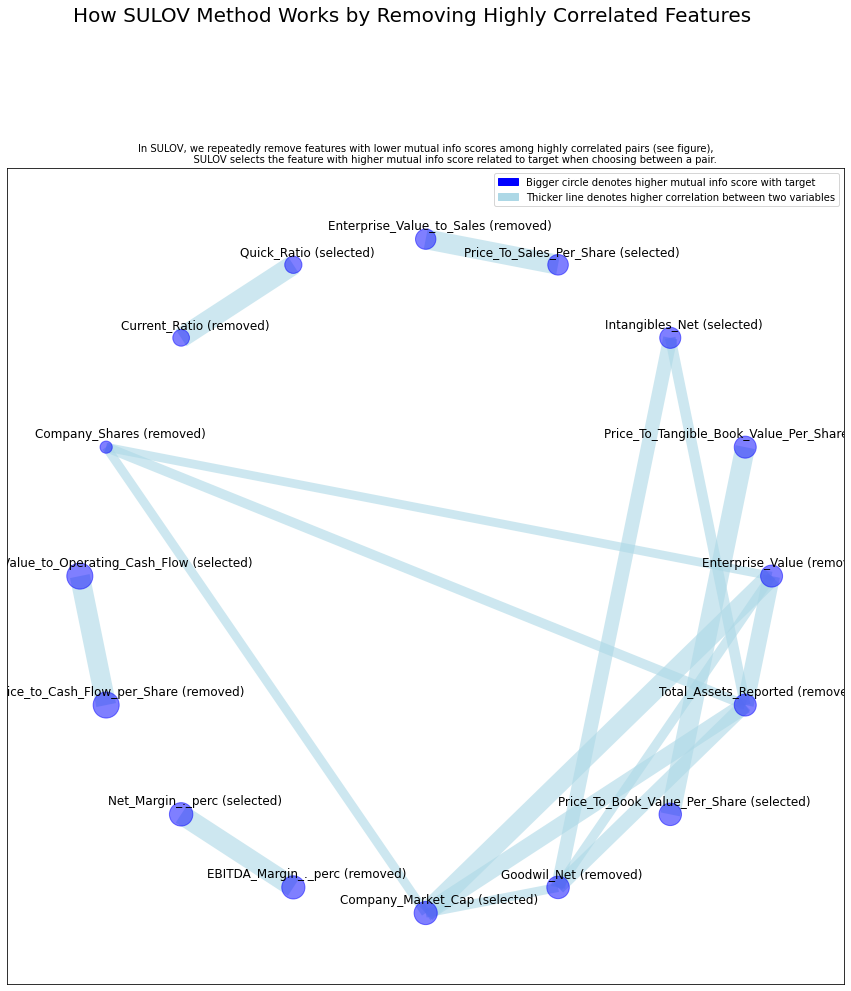

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected vars after SULOV = 23
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 23 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 23 variables...
            Time taken for regular XGBoost feature selection = 2 seconds
        using 18 variables...
            Time taken for regular XGBoost feature selection = 4 seconds
        using 13 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 8 variables...
            Time taken for regular XGBoost feature selection = 8 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 10 seconds
            Total time taken for XGBoost feature select

Params Tuning::   0%|                                                                            | 0/1 [00:00<?, ?it/s]

0:	learn: 0.2145860	test: 0.2277667	best: 0.2277667 (0)	total: 4.63ms	remaining: 4.62s
1:	learn: 0.2141761	test: 0.2275351	best: 0.2275351 (1)	total: 9.18ms	remaining: 4.58s
2:	learn: 0.2137923	test: 0.2272068	best: 0.2272068 (2)	total: 13.3ms	remaining: 4.43s
3:	learn: 0.2134004	test: 0.2270078	best: 0.2270078 (3)	total: 17.6ms	remaining: 4.39s
4:	learn: 0.2130899	test: 0.2267342	best: 0.2267342 (4)	total: 23ms	remaining: 4.58s
5:	learn: 0.2127627	test: 0.2265356	best: 0.2265356 (5)	total: 27.4ms	remaining: 4.53s
6:	learn: 0.2124647	test: 0.2263521	best: 0.2263521 (6)	total: 31.7ms	remaining: 4.5s
7:	learn: 0.2121496	test: 0.2261873	best: 0.2261873 (7)	total: 36.2ms	remaining: 4.48s
8:	learn: 0.2118814	test: 0.2260010	best: 0.2260010 (8)	total: 40.6ms	remaining: 4.47s
9:	learn: 0.2115813	test: 0.2258489	best: 0.2258489 (9)	total: 46.5ms	remaining: 4.6s
10:	learn: 0.2113271	test: 0.2256991	best: 0.2256991 (10)	total: 51.2ms	remaining: 4.6s
11:	learn: 0.2110999	test: 0.2254939	best: 0.2

106:	learn: 0.2022842	test: 0.2227491	best: 0.2227491 (106)	total: 475ms	remaining: 3.96s
107:	learn: 0.2022544	test: 0.2227167	best: 0.2227167 (107)	total: 479ms	remaining: 3.96s
108:	learn: 0.2022081	test: 0.2227246	best: 0.2227167 (107)	total: 484ms	remaining: 3.96s
109:	learn: 0.2021797	test: 0.2227390	best: 0.2227167 (107)	total: 488ms	remaining: 3.95s
110:	learn: 0.2021292	test: 0.2227493	best: 0.2227167 (107)	total: 493ms	remaining: 3.95s
111:	learn: 0.2020883	test: 0.2227843	best: 0.2227167 (107)	total: 497ms	remaining: 3.94s
112:	learn: 0.2020581	test: 0.2228012	best: 0.2227167 (107)	total: 501ms	remaining: 3.94s
113:	learn: 0.2020210	test: 0.2228108	best: 0.2227167 (107)	total: 506ms	remaining: 3.93s
114:	learn: 0.2019865	test: 0.2228218	best: 0.2227167 (107)	total: 510ms	remaining: 3.92s
115:	learn: 0.2019433	test: 0.2228214	best: 0.2227167 (107)	total: 514ms	remaining: 3.92s
116:	learn: 0.2019083	test: 0.2228117	best: 0.2227167 (107)	total: 519ms	remaining: 3.92s
117:	learn

203:	learn: 0.1992063	test: 0.2225590	best: 0.2224823 (191)	total: 896ms	remaining: 3.49s
204:	learn: 0.1991545	test: 0.2226102	best: 0.2224823 (191)	total: 900ms	remaining: 3.49s
205:	learn: 0.1991011	test: 0.2226174	best: 0.2224823 (191)	total: 905ms	remaining: 3.49s
206:	learn: 0.1990794	test: 0.2226063	best: 0.2224823 (191)	total: 909ms	remaining: 3.48s
207:	learn: 0.1990605	test: 0.2226149	best: 0.2224823 (191)	total: 913ms	remaining: 3.48s
208:	learn: 0.1990419	test: 0.2226226	best: 0.2224823 (191)	total: 918ms	remaining: 3.47s
209:	learn: 0.1990099	test: 0.2225935	best: 0.2224823 (191)	total: 922ms	remaining: 3.47s
210:	learn: 0.1989839	test: 0.2225751	best: 0.2224823 (191)	total: 927ms	remaining: 3.46s
211:	learn: 0.1989554	test: 0.2225664	best: 0.2224823 (191)	total: 931ms	remaining: 3.46s
212:	learn: 0.1989350	test: 0.2225848	best: 0.2224823 (191)	total: 936ms	remaining: 3.46s
213:	learn: 0.1989200	test: 0.2226031	best: 0.2224823 (191)	total: 940ms	remaining: 3.45s
214:	learn

313:	learn: 0.1964819	test: 0.2226958	best: 0.2224823 (191)	total: 1.37s	remaining: 3s
314:	learn: 0.1964619	test: 0.2227105	best: 0.2224823 (191)	total: 1.38s	remaining: 2.99s
315:	learn: 0.1964374	test: 0.2226582	best: 0.2224823 (191)	total: 1.38s	remaining: 2.99s
316:	learn: 0.1964007	test: 0.2226397	best: 0.2224823 (191)	total: 1.39s	remaining: 2.98s
317:	learn: 0.1963843	test: 0.2226319	best: 0.2224823 (191)	total: 1.39s	remaining: 2.98s
318:	learn: 0.1963590	test: 0.2226536	best: 0.2224823 (191)	total: 1.39s	remaining: 2.98s
319:	learn: 0.1963436	test: 0.2226464	best: 0.2224823 (191)	total: 1.4s	remaining: 2.97s
320:	learn: 0.1963035	test: 0.2226698	best: 0.2224823 (191)	total: 1.4s	remaining: 2.97s
321:	learn: 0.1962715	test: 0.2226220	best: 0.2224823 (191)	total: 1.41s	remaining: 2.96s
322:	learn: 0.1962538	test: 0.2226141	best: 0.2224823 (191)	total: 1.41s	remaining: 2.96s
323:	learn: 0.1962369	test: 0.2226078	best: 0.2224823 (191)	total: 1.42s	remaining: 2.95s
324:	learn: 0.1

410:	learn: 0.1942605	test: 0.2226809	best: 0.2224823 (191)	total: 1.79s	remaining: 2.57s
411:	learn: 0.1942466	test: 0.2226688	best: 0.2224823 (191)	total: 1.79s	remaining: 2.56s
412:	learn: 0.1942342	test: 0.2226666	best: 0.2224823 (191)	total: 1.8s	remaining: 2.56s
413:	learn: 0.1941966	test: 0.2226938	best: 0.2224823 (191)	total: 1.8s	remaining: 2.55s
414:	learn: 0.1941662	test: 0.2226794	best: 0.2224823 (191)	total: 1.81s	remaining: 2.55s
415:	learn: 0.1941441	test: 0.2226766	best: 0.2224823 (191)	total: 1.81s	remaining: 2.54s
416:	learn: 0.1941169	test: 0.2226821	best: 0.2224823 (191)	total: 1.82s	remaining: 2.54s
417:	learn: 0.1940947	test: 0.2226417	best: 0.2224823 (191)	total: 1.82s	remaining: 2.54s
418:	learn: 0.1940720	test: 0.2226340	best: 0.2224823 (191)	total: 1.83s	remaining: 2.53s
419:	learn: 0.1940570	test: 0.2226172	best: 0.2224823 (191)	total: 1.83s	remaining: 2.53s
420:	learn: 0.1940359	test: 0.2226260	best: 0.2224823 (191)	total: 1.83s	remaining: 2.52s
421:	learn: 

522:	learn: 0.1919428	test: 0.2225881	best: 0.2224823 (191)	total: 2.27s	remaining: 2.07s
523:	learn: 0.1919244	test: 0.2225653	best: 0.2224823 (191)	total: 2.27s	remaining: 2.07s
524:	learn: 0.1918883	test: 0.2225766	best: 0.2224823 (191)	total: 2.28s	remaining: 2.06s
525:	learn: 0.1918772	test: 0.2225681	best: 0.2224823 (191)	total: 2.28s	remaining: 2.06s
526:	learn: 0.1918574	test: 0.2225520	best: 0.2224823 (191)	total: 2.29s	remaining: 2.05s
527:	learn: 0.1918456	test: 0.2225483	best: 0.2224823 (191)	total: 2.29s	remaining: 2.05s
528:	learn: 0.1918221	test: 0.2225306	best: 0.2224823 (191)	total: 2.3s	remaining: 2.04s
529:	learn: 0.1918040	test: 0.2225381	best: 0.2224823 (191)	total: 2.3s	remaining: 2.04s
530:	learn: 0.1917906	test: 0.2225232	best: 0.2224823 (191)	total: 2.31s	remaining: 2.04s
531:	learn: 0.1917712	test: 0.2225248	best: 0.2224823 (191)	total: 2.31s	remaining: 2.03s
532:	learn: 0.1917548	test: 0.2225115	best: 0.2224823 (191)	total: 2.31s	remaining: 2.03s
533:	learn: 

618:	learn: 0.1901889	test: 0.2224770	best: 0.2224473 (595)	total: 2.69s	remaining: 1.65s
619:	learn: 0.1901804	test: 0.2224743	best: 0.2224473 (595)	total: 2.69s	remaining: 1.65s
620:	learn: 0.1901521	test: 0.2224540	best: 0.2224473 (595)	total: 2.7s	remaining: 1.65s
621:	learn: 0.1901439	test: 0.2224363	best: 0.2224363 (621)	total: 2.7s	remaining: 1.64s
622:	learn: 0.1901325	test: 0.2224313	best: 0.2224313 (622)	total: 2.71s	remaining: 1.64s
623:	learn: 0.1901238	test: 0.2224191	best: 0.2224191 (623)	total: 2.71s	remaining: 1.63s
624:	learn: 0.1900921	test: 0.2224413	best: 0.2224191 (623)	total: 2.71s	remaining: 1.63s
625:	learn: 0.1900743	test: 0.2224475	best: 0.2224191 (623)	total: 2.72s	remaining: 1.62s
626:	learn: 0.1900625	test: 0.2224486	best: 0.2224191 (623)	total: 2.72s	remaining: 1.62s
627:	learn: 0.1900504	test: 0.2224331	best: 0.2224191 (623)	total: 2.73s	remaining: 1.61s
628:	learn: 0.1900449	test: 0.2224331	best: 0.2224191 (623)	total: 2.73s	remaining: 1.61s
629:	learn: 

729:	learn: 0.1884865	test: 0.2223152	best: 0.2222620 (718)	total: 3.17s	remaining: 1.17s
730:	learn: 0.1884748	test: 0.2223160	best: 0.2222620 (718)	total: 3.17s	remaining: 1.17s
731:	learn: 0.1884661	test: 0.2223178	best: 0.2222620 (718)	total: 3.18s	remaining: 1.16s
732:	learn: 0.1884528	test: 0.2223069	best: 0.2222620 (718)	total: 3.18s	remaining: 1.16s
733:	learn: 0.1884434	test: 0.2223100	best: 0.2222620 (718)	total: 3.19s	remaining: 1.15s
734:	learn: 0.1884251	test: 0.2223044	best: 0.2222620 (718)	total: 3.19s	remaining: 1.15s
735:	learn: 0.1884055	test: 0.2222835	best: 0.2222620 (718)	total: 3.19s	remaining: 1.15s
736:	learn: 0.1883925	test: 0.2222889	best: 0.2222620 (718)	total: 3.2s	remaining: 1.14s
737:	learn: 0.1883810	test: 0.2222969	best: 0.2222620 (718)	total: 3.2s	remaining: 1.14s
738:	learn: 0.1883670	test: 0.2222862	best: 0.2222620 (718)	total: 3.21s	remaining: 1.13s
739:	learn: 0.1883459	test: 0.2222924	best: 0.2222620 (718)	total: 3.21s	remaining: 1.13s
740:	learn: 

826:	learn: 0.1872369	test: 0.2221413	best: 0.2221207 (816)	total: 3.59s	remaining: 751ms
827:	learn: 0.1872255	test: 0.2221404	best: 0.2221207 (816)	total: 3.59s	remaining: 746ms
828:	learn: 0.1872136	test: 0.2221208	best: 0.2221207 (816)	total: 3.6s	remaining: 742ms
829:	learn: 0.1872000	test: 0.2221203	best: 0.2221203 (829)	total: 3.6s	remaining: 738ms
830:	learn: 0.1871919	test: 0.2221321	best: 0.2221203 (829)	total: 3.6s	remaining: 733ms
831:	learn: 0.1871736	test: 0.2221287	best: 0.2221203 (829)	total: 3.61s	remaining: 729ms
832:	learn: 0.1871594	test: 0.2221172	best: 0.2221172 (832)	total: 3.61s	remaining: 724ms
833:	learn: 0.1871453	test: 0.2221230	best: 0.2221172 (832)	total: 3.62s	remaining: 720ms
834:	learn: 0.1871270	test: 0.2221063	best: 0.2221063 (834)	total: 3.62s	remaining: 716ms
835:	learn: 0.1871126	test: 0.2221327	best: 0.2221063 (834)	total: 3.63s	remaining: 711ms
836:	learn: 0.1870991	test: 0.2221222	best: 0.2221063 (834)	total: 3.63s	remaining: 707ms
837:	learn: 0

930:	learn: 0.1859783	test: 0.2221274	best: 0.2220590 (844)	total: 4.07s	remaining: 301ms
931:	learn: 0.1859653	test: 0.2221304	best: 0.2220590 (844)	total: 4.07s	remaining: 297ms
932:	learn: 0.1859552	test: 0.2221224	best: 0.2220590 (844)	total: 4.08s	remaining: 293ms
933:	learn: 0.1859420	test: 0.2221320	best: 0.2220590 (844)	total: 4.08s	remaining: 288ms
934:	learn: 0.1859166	test: 0.2221276	best: 0.2220590 (844)	total: 4.08s	remaining: 284ms
935:	learn: 0.1859060	test: 0.2221249	best: 0.2220590 (844)	total: 4.09s	remaining: 280ms
936:	learn: 0.1858968	test: 0.2221243	best: 0.2220590 (844)	total: 4.09s	remaining: 275ms
937:	learn: 0.1858894	test: 0.2221177	best: 0.2220590 (844)	total: 4.1s	remaining: 271ms
938:	learn: 0.1858713	test: 0.2221284	best: 0.2220590 (844)	total: 4.1s	remaining: 266ms
939:	learn: 0.1858657	test: 0.2221251	best: 0.2220590 (844)	total: 4.11s	remaining: 262ms
940:	learn: 0.1858473	test: 0.2220996	best: 0.2220590 (844)	total: 4.11s	remaining: 258ms
941:	learn: 

Params Tuning:: 100%|####################################################################| 1/1 [00:04<00:00,  4.64s/it]

985:	learn: 0.1852797	test: 0.2221848	best: 0.2220590 (844)	total: 4.3s	remaining: 61.1ms
986:	learn: 0.1852723	test: 0.2221827	best: 0.2220590 (844)	total: 4.31s	remaining: 56.7ms
987:	learn: 0.1852613	test: 0.2221903	best: 0.2220590 (844)	total: 4.31s	remaining: 52.4ms
988:	learn: 0.1852437	test: 0.2221809	best: 0.2220590 (844)	total: 4.32s	remaining: 48ms
989:	learn: 0.1852317	test: 0.2221816	best: 0.2220590 (844)	total: 4.32s	remaining: 43.6ms
990:	learn: 0.1852194	test: 0.2221815	best: 0.2220590 (844)	total: 4.32s	remaining: 39.3ms
991:	learn: 0.1851962	test: 0.2222052	best: 0.2220590 (844)	total: 4.33s	remaining: 34.9ms
992:	learn: 0.1851906	test: 0.2222012	best: 0.2220590 (844)	total: 4.33s	remaining: 30.6ms
993:	learn: 0.1851809	test: 0.2221885	best: 0.2220590 (844)	total: 4.34s	remaining: 26.2ms
994:	learn: 0.1851721	test: 0.2221880	best: 0.2220590 (844)	total: 4.34s	remaining: 21.8ms
995:	learn: 0.1851546	test: 0.2221754	best: 0.2220590 (844)	total: 4.35s	remaining: 17.5ms
99

{'depth': 4, 'iterations': 10, 'learning_rate': 0.1}

In [65]:
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)
selected_cols, imp_df = featurewiz(pd.concat([X_train, y_train], axis = 1), 'alfa', corr_limit = 0.4, verbose =0, sep=",", header=0,test_data="", feature_engg="", category_encoders="")
    
X_train = X_train[selected_cols]
X_test = X_test[selected_cols]
params = {'depth':[4],
          'iterations':[10],
          'learning_rate':[0.1]}
best_params = catboost_GridSearchCV(X_train, X_test, y_train, y_test, params)
best_params

In [63]:
# Tuning of baseline model
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)

params = {'depth':[4],
          'iterations':[10],
          'learning_rate':[0.1]}
best_params = catboost_GridSearchCV(X_train, X_test, y_train, y_test, params)
best_params

Params Tuning::   0%|                                                                            | 0/1 [00:00<?, ?it/s]

0:	learn: 0.2145228	test: 0.2277250	best: 0.2277250 (0)	total: 7.23ms	remaining: 7.23s
1:	learn: 0.2141122	test: 0.2275289	best: 0.2275289 (1)	total: 14.4ms	remaining: 7.19s
2:	learn: 0.2137102	test: 0.2272999	best: 0.2272999 (2)	total: 21.3ms	remaining: 7.08s
3:	learn: 0.2133088	test: 0.2270254	best: 0.2270254 (3)	total: 28.7ms	remaining: 7.14s
4:	learn: 0.2129407	test: 0.2267604	best: 0.2267604 (4)	total: 35.3ms	remaining: 7.03s
5:	learn: 0.2125512	test: 0.2265288	best: 0.2265288 (5)	total: 42.2ms	remaining: 7s
6:	learn: 0.2122474	test: 0.2263158	best: 0.2263158 (6)	total: 49.2ms	remaining: 6.97s
7:	learn: 0.2119789	test: 0.2261563	best: 0.2261563 (7)	total: 56.7ms	remaining: 7.04s
8:	learn: 0.2116968	test: 0.2259631	best: 0.2259631 (8)	total: 64.2ms	remaining: 7.07s
9:	learn: 0.2113933	test: 0.2257404	best: 0.2257404 (9)	total: 71.4ms	remaining: 7.07s
10:	learn: 0.2110704	test: 0.2255849	best: 0.2255849 (10)	total: 78.6ms	remaining: 7.07s
11:	learn: 0.2108274	test: 0.2254643	best: 0

102:	learn: 0.2009523	test: 0.2214908	best: 0.2211013 (73)	total: 736ms	remaining: 6.41s
103:	learn: 0.2008992	test: 0.2214746	best: 0.2211013 (73)	total: 744ms	remaining: 6.41s
104:	learn: 0.2008486	test: 0.2214671	best: 0.2211013 (73)	total: 752ms	remaining: 6.41s
105:	learn: 0.2007957	test: 0.2214529	best: 0.2211013 (73)	total: 760ms	remaining: 6.41s
106:	learn: 0.2007341	test: 0.2214236	best: 0.2211013 (73)	total: 782ms	remaining: 6.53s
107:	learn: 0.2006767	test: 0.2214175	best: 0.2211013 (73)	total: 789ms	remaining: 6.52s
108:	learn: 0.2006257	test: 0.2214502	best: 0.2211013 (73)	total: 797ms	remaining: 6.51s
109:	learn: 0.2005571	test: 0.2214159	best: 0.2211013 (73)	total: 803ms	remaining: 6.5s
110:	learn: 0.2005187	test: 0.2214374	best: 0.2211013 (73)	total: 810ms	remaining: 6.48s
111:	learn: 0.2004710	test: 0.2214512	best: 0.2211013 (73)	total: 816ms	remaining: 6.47s
112:	learn: 0.2004174	test: 0.2214097	best: 0.2211013 (73)	total: 823ms	remaining: 6.46s
113:	learn: 0.2003796	

208:	learn: 0.1967294	test: 0.2212242	best: 0.2210388 (172)	total: 1.47s	remaining: 5.57s
209:	learn: 0.1967005	test: 0.2212445	best: 0.2210388 (172)	total: 1.48s	remaining: 5.57s
210:	learn: 0.1966758	test: 0.2212182	best: 0.2210388 (172)	total: 1.49s	remaining: 5.56s
211:	learn: 0.1966526	test: 0.2212138	best: 0.2210388 (172)	total: 1.49s	remaining: 5.55s
212:	learn: 0.1966119	test: 0.2212016	best: 0.2210388 (172)	total: 1.5s	remaining: 5.55s
213:	learn: 0.1965639	test: 0.2212023	best: 0.2210388 (172)	total: 1.51s	remaining: 5.54s
214:	learn: 0.1965443	test: 0.2211751	best: 0.2210388 (172)	total: 1.51s	remaining: 5.53s
215:	learn: 0.1965050	test: 0.2211571	best: 0.2210388 (172)	total: 1.52s	remaining: 5.52s
216:	learn: 0.1964756	test: 0.2211420	best: 0.2210388 (172)	total: 1.53s	remaining: 5.51s
217:	learn: 0.1964549	test: 0.2211481	best: 0.2210388 (172)	total: 1.53s	remaining: 5.5s
218:	learn: 0.1964172	test: 0.2211140	best: 0.2210388 (172)	total: 1.54s	remaining: 5.49s
219:	learn: 

317:	learn: 0.1936581	test: 0.2208203	best: 0.2207951 (316)	total: 2.2s	remaining: 4.72s
318:	learn: 0.1936350	test: 0.2208194	best: 0.2207951 (316)	total: 2.21s	remaining: 4.71s
319:	learn: 0.1936023	test: 0.2208320	best: 0.2207951 (316)	total: 2.21s	remaining: 4.71s
320:	learn: 0.1935803	test: 0.2208368	best: 0.2207951 (316)	total: 2.22s	remaining: 4.7s
321:	learn: 0.1935551	test: 0.2210191	best: 0.2207951 (316)	total: 2.23s	remaining: 4.69s
322:	learn: 0.1935275	test: 0.2210449	best: 0.2207951 (316)	total: 2.23s	remaining: 4.68s
323:	learn: 0.1934949	test: 0.2210073	best: 0.2207951 (316)	total: 2.24s	remaining: 4.67s
324:	learn: 0.1934650	test: 0.2210920	best: 0.2207951 (316)	total: 2.25s	remaining: 4.67s
325:	learn: 0.1934131	test: 0.2211102	best: 0.2207951 (316)	total: 2.25s	remaining: 4.66s
326:	learn: 0.1933756	test: 0.2211077	best: 0.2207951 (316)	total: 2.26s	remaining: 4.66s
327:	learn: 0.1933425	test: 0.2211189	best: 0.2207951 (316)	total: 2.27s	remaining: 4.65s
328:	learn: 

426:	learn: 0.1904647	test: 0.2208039	best: 0.2206466 (417)	total: 2.92s	remaining: 3.92s
427:	learn: 0.1904500	test: 0.2208255	best: 0.2206466 (417)	total: 2.93s	remaining: 3.92s
428:	learn: 0.1904328	test: 0.2208382	best: 0.2206466 (417)	total: 2.94s	remaining: 3.91s
429:	learn: 0.1904101	test: 0.2208252	best: 0.2206466 (417)	total: 2.94s	remaining: 3.9s
430:	learn: 0.1903944	test: 0.2208083	best: 0.2206466 (417)	total: 2.95s	remaining: 3.9s
431:	learn: 0.1903533	test: 0.2208185	best: 0.2206466 (417)	total: 2.96s	remaining: 3.89s
432:	learn: 0.1903152	test: 0.2208352	best: 0.2206466 (417)	total: 2.96s	remaining: 3.88s
433:	learn: 0.1902925	test: 0.2208317	best: 0.2206466 (417)	total: 2.97s	remaining: 3.87s
434:	learn: 0.1902510	test: 0.2208294	best: 0.2206466 (417)	total: 2.98s	remaining: 3.87s
435:	learn: 0.1902299	test: 0.2208219	best: 0.2206466 (417)	total: 2.98s	remaining: 3.86s
436:	learn: 0.1902046	test: 0.2208056	best: 0.2206466 (417)	total: 2.99s	remaining: 3.85s
437:	learn: 

536:	learn: 0.1878119	test: 0.2201852	best: 0.2201852 (536)	total: 3.65s	remaining: 3.15s
537:	learn: 0.1877851	test: 0.2202058	best: 0.2201852 (536)	total: 3.66s	remaining: 3.14s
538:	learn: 0.1877648	test: 0.2202064	best: 0.2201852 (536)	total: 3.67s	remaining: 3.14s
539:	learn: 0.1877360	test: 0.2202005	best: 0.2201852 (536)	total: 3.67s	remaining: 3.13s
540:	learn: 0.1877147	test: 0.2201780	best: 0.2201780 (540)	total: 3.68s	remaining: 3.12s
541:	learn: 0.1876983	test: 0.2201571	best: 0.2201571 (541)	total: 3.69s	remaining: 3.12s
542:	learn: 0.1876761	test: 0.2201684	best: 0.2201571 (541)	total: 3.69s	remaining: 3.11s
543:	learn: 0.1876381	test: 0.2201390	best: 0.2201390 (543)	total: 3.7s	remaining: 3.1s
544:	learn: 0.1876084	test: 0.2201253	best: 0.2201253 (544)	total: 3.71s	remaining: 3.1s
545:	learn: 0.1875932	test: 0.2201109	best: 0.2201109 (545)	total: 3.71s	remaining: 3.09s
546:	learn: 0.1875755	test: 0.2201114	best: 0.2201109 (545)	total: 3.72s	remaining: 3.08s
547:	learn: 0

646:	learn: 0.1854377	test: 0.2199376	best: 0.2199255 (644)	total: 4.38s	remaining: 2.39s
647:	learn: 0.1854157	test: 0.2198982	best: 0.2198982 (647)	total: 4.39s	remaining: 2.38s
648:	learn: 0.1854002	test: 0.2198900	best: 0.2198900 (648)	total: 4.4s	remaining: 2.38s
649:	learn: 0.1853860	test: 0.2199012	best: 0.2198900 (648)	total: 4.4s	remaining: 2.37s
650:	learn: 0.1853759	test: 0.2199020	best: 0.2198900 (648)	total: 4.41s	remaining: 2.36s
651:	learn: 0.1853591	test: 0.2199028	best: 0.2198900 (648)	total: 4.42s	remaining: 2.36s
652:	learn: 0.1853385	test: 0.2199072	best: 0.2198900 (648)	total: 4.42s	remaining: 2.35s
653:	learn: 0.1853253	test: 0.2198933	best: 0.2198900 (648)	total: 4.43s	remaining: 2.34s
654:	learn: 0.1852966	test: 0.2198969	best: 0.2198900 (648)	total: 4.43s	remaining: 2.34s
655:	learn: 0.1852719	test: 0.2198991	best: 0.2198900 (648)	total: 4.44s	remaining: 2.33s
656:	learn: 0.1852542	test: 0.2198974	best: 0.2198900 (648)	total: 4.45s	remaining: 2.32s
657:	learn: 

757:	learn: 0.1834335	test: 0.2196022	best: 0.2196022 (757)	total: 5.11s	remaining: 1.63s
758:	learn: 0.1834129	test: 0.2196143	best: 0.2196022 (757)	total: 5.12s	remaining: 1.63s
759:	learn: 0.1833939	test: 0.2195973	best: 0.2195973 (759)	total: 5.13s	remaining: 1.62s
760:	learn: 0.1833798	test: 0.2196030	best: 0.2195973 (759)	total: 5.13s	remaining: 1.61s
761:	learn: 0.1833470	test: 0.2196125	best: 0.2195973 (759)	total: 5.14s	remaining: 1.61s
762:	learn: 0.1833197	test: 0.2196209	best: 0.2195973 (759)	total: 5.15s	remaining: 1.6s
763:	learn: 0.1832955	test: 0.2196375	best: 0.2195973 (759)	total: 5.16s	remaining: 1.59s
764:	learn: 0.1832796	test: 0.2196486	best: 0.2195973 (759)	total: 5.17s	remaining: 1.59s
765:	learn: 0.1832548	test: 0.2196909	best: 0.2195973 (759)	total: 5.17s	remaining: 1.58s
766:	learn: 0.1832366	test: 0.2196900	best: 0.2195973 (759)	total: 5.18s	remaining: 1.57s
767:	learn: 0.1832229	test: 0.2196688	best: 0.2195973 (759)	total: 5.19s	remaining: 1.57s
768:	learn:

860:	learn: 0.1818402	test: 0.2193464	best: 0.2193373 (844)	total: 5.85s	remaining: 944ms
861:	learn: 0.1818137	test: 0.2193781	best: 0.2193373 (844)	total: 5.85s	remaining: 937ms
862:	learn: 0.1818031	test: 0.2193729	best: 0.2193373 (844)	total: 5.86s	remaining: 930ms
863:	learn: 0.1817906	test: 0.2194000	best: 0.2193373 (844)	total: 5.87s	remaining: 924ms
864:	learn: 0.1817778	test: 0.2193932	best: 0.2193373 (844)	total: 5.88s	remaining: 917ms
865:	learn: 0.1817651	test: 0.2193883	best: 0.2193373 (844)	total: 5.88s	remaining: 910ms
866:	learn: 0.1817482	test: 0.2193632	best: 0.2193373 (844)	total: 5.89s	remaining: 904ms
867:	learn: 0.1817330	test: 0.2193830	best: 0.2193373 (844)	total: 5.9s	remaining: 897ms
868:	learn: 0.1817120	test: 0.2193462	best: 0.2193373 (844)	total: 5.9s	remaining: 890ms
869:	learn: 0.1816874	test: 0.2193503	best: 0.2193373 (844)	total: 5.91s	remaining: 883ms
870:	learn: 0.1816558	test: 0.2193219	best: 0.2193219 (870)	total: 5.92s	remaining: 876ms
871:	learn: 

968:	learn: 0.1802084	test: 0.2191925	best: 0.2190021 (917)	total: 6.57s	remaining: 210ms
969:	learn: 0.1801993	test: 0.2191997	best: 0.2190021 (917)	total: 6.58s	remaining: 203ms
970:	learn: 0.1801858	test: 0.2191806	best: 0.2190021 (917)	total: 6.59s	remaining: 197ms
971:	learn: 0.1801714	test: 0.2191622	best: 0.2190021 (917)	total: 6.59s	remaining: 190ms
972:	learn: 0.1801621	test: 0.2191610	best: 0.2190021 (917)	total: 6.6s	remaining: 183ms
973:	learn: 0.1801439	test: 0.2191547	best: 0.2190021 (917)	total: 6.61s	remaining: 176ms
974:	learn: 0.1801331	test: 0.2191550	best: 0.2190021 (917)	total: 6.61s	remaining: 170ms
975:	learn: 0.1801227	test: 0.2191558	best: 0.2190021 (917)	total: 6.62s	remaining: 163ms
976:	learn: 0.1801068	test: 0.2191636	best: 0.2190021 (917)	total: 6.62s	remaining: 156ms
977:	learn: 0.1800960	test: 0.2191592	best: 0.2190021 (917)	total: 6.63s	remaining: 149ms
978:	learn: 0.1800803	test: 0.2191521	best: 0.2190021 (917)	total: 6.64s	remaining: 142ms
979:	learn:

Params Tuning:: 100%|####################################################################| 1/1 [00:07<00:00,  7.07s/it]

996:	learn: 0.1798383	test: 0.2192972	best: 0.2190021 (917)	total: 6.75s	remaining: 20.3ms
997:	learn: 0.1798242	test: 0.2193034	best: 0.2190021 (917)	total: 6.76s	remaining: 13.6ms
998:	learn: 0.1798135	test: 0.2193034	best: 0.2190021 (917)	total: 6.77s	remaining: 6.78ms
999:	learn: 0.1798014	test: 0.2193007	best: 0.2190021 (917)	total: 6.78s	remaining: 0us

bestTest = 0.2190020951
bestIteration = 917

Shrink model to first 918 iterations.
RMSE: 0.48546552450589114
MAPE: 1.9442257541826922
Params: {'depth': 4, 'iterations': 10, 'learning_rate': 0.1}
Av. alfa: 0.32673918289009485


{'depth': 4, 'iterations': 10, 'learning_rate': 0.1}

# Final test

In [26]:
final_test = pd.read_csv('test_it.csv', index_col=[0])

In [50]:
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)

x_incl_const = sm.add_constant(X_train)
vif = pd.DataFrame([variance_inflation_factor(exog = x_incl_const.values, exog_idx = i)
               for i in range(x_incl_const.shape[1])],
              index=['const']+X_train.columns.tolist())
without_mult_cols = vif[vif[0] < 5].drop(index = 'const', errors = 'ignore').index.tolist()
X_train = X_train[without_mult_cols]
X_test = X_test[without_mult_cols]

x_incl_const = sm.add_constant(X_train)
model = OLS(y_train, x_incl_const)
results = model.fit()
p_df = pd.DataFrame({'coef':results.params, 'p-value':round(results.pvalues, 3), 'param':['const']+X_train.columns.tolist()})
selected_cols = p_df[p_df['p-value'] < 0.05].index.tolist()
X_train = X_train[selected_cols]
X_test = X_test[selected_cols]

reg = ctb.CatBoostRegressor(use_best_model=True, **best_params)
reg.fit(X_train, y_train, eval_set=(X_test, y_test))
y_pred_ctb = reg.predict(final_test[selected_cols])

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(final_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

0:	learn: 0.3738509	test: 0.3858135	best: 0.3858135 (0)	total: 2.44ms	remaining: 21.9ms
1:	learn: 0.3737198	test: 0.3857347	best: 0.3857347 (1)	total: 4.8ms	remaining: 19.2ms
2:	learn: 0.3736489	test: 0.3856455	best: 0.3856455 (2)	total: 7.03ms	remaining: 16.4ms
3:	learn: 0.3735731	test: 0.3855300	best: 0.3855300 (3)	total: 9.17ms	remaining: 13.8ms
4:	learn: 0.3735080	test: 0.3855061	best: 0.3855061 (4)	total: 11.4ms	remaining: 11.4ms
5:	learn: 0.3734531	test: 0.3854819	best: 0.3854819 (5)	total: 14ms	remaining: 9.3ms
6:	learn: 0.3733979	test: 0.3854854	best: 0.3854819 (5)	total: 16.2ms	remaining: 6.92ms
7:	learn: 0.3733556	test: 0.3854972	best: 0.3854819 (5)	total: 18.3ms	remaining: 4.57ms
8:	learn: 0.3733286	test: 0.3854452	best: 0.3854452 (8)	total: 20.5ms	remaining: 2.28ms
9:	learn: 0.3732808	test: 0.3854215	best: 0.3854215 (9)	total: 22.8ms	remaining: 0us

bestTest = 0.3854214716
bestIteration = 9

Baseline RMSE score of portfolio =  0.24
Baseline MAPE score of portfolio =  7.36
A

In [64]:
list_features_to_drop = list(missing_data[missing_data['Percent'] > 0.6].index)
X_train, X_test, y_train, y_test = X_y_split(data_train.drop(list_features_to_drop, axis=1), 
                                                 data_test.drop(list_features_to_drop, axis=1)) 
X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)

reg = ctb.CatBoostRegressor(loss_function = 'MAPE', **best_params)
reg.fit(X_train, y_train, eval_set=(X_test, y_test))
y_pred_ctb = reg.predict(final_test.drop(columns = ['RIC', 'Date']))

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(final_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

0:	learn: 0.2137752	test: 0.2268914	best: 0.2268914 (0)	total: 4.29ms	remaining: 38.6ms
1:	learn: 0.2128513	test: 0.2261834	best: 0.2261834 (1)	total: 8.99ms	remaining: 35.9ms
2:	learn: 0.2119269	test: 0.2255111	best: 0.2255111 (2)	total: 13.5ms	remaining: 31.5ms
3:	learn: 0.2111487	test: 0.2251082	best: 0.2251082 (3)	total: 17.5ms	remaining: 26.3ms
4:	learn: 0.2104652	test: 0.2246116	best: 0.2246116 (4)	total: 21.5ms	remaining: 21.5ms
5:	learn: 0.2097545	test: 0.2242607	best: 0.2242607 (5)	total: 25.9ms	remaining: 17.3ms
6:	learn: 0.2091343	test: 0.2238522	best: 0.2238522 (6)	total: 29.8ms	remaining: 12.8ms
7:	learn: 0.2088036	test: 0.2238593	best: 0.2238522 (6)	total: 33.5ms	remaining: 8.37ms
8:	learn: 0.2083299	test: 0.2237339	best: 0.2237339 (8)	total: 37.3ms	remaining: 4.14ms
9:	learn: 0.2078651	test: 0.2233497	best: 0.2233497 (9)	total: 41.6ms	remaining: 0us

bestTest = 0.2233496534
bestIteration = 9

Baseline RMSE score of portfolio =  0.13
Baseline MAPE score of portfolio =  4.

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (28614, 33)
    Caution: We will try to reduce the memory usage of dataframe from 7.42 MB
        memory usage after optimization is: 3.06 MB
        decreased by 58.8%
     Loaded. Shape = (28614, 33)
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression Feature Selection Started ####
    loading 

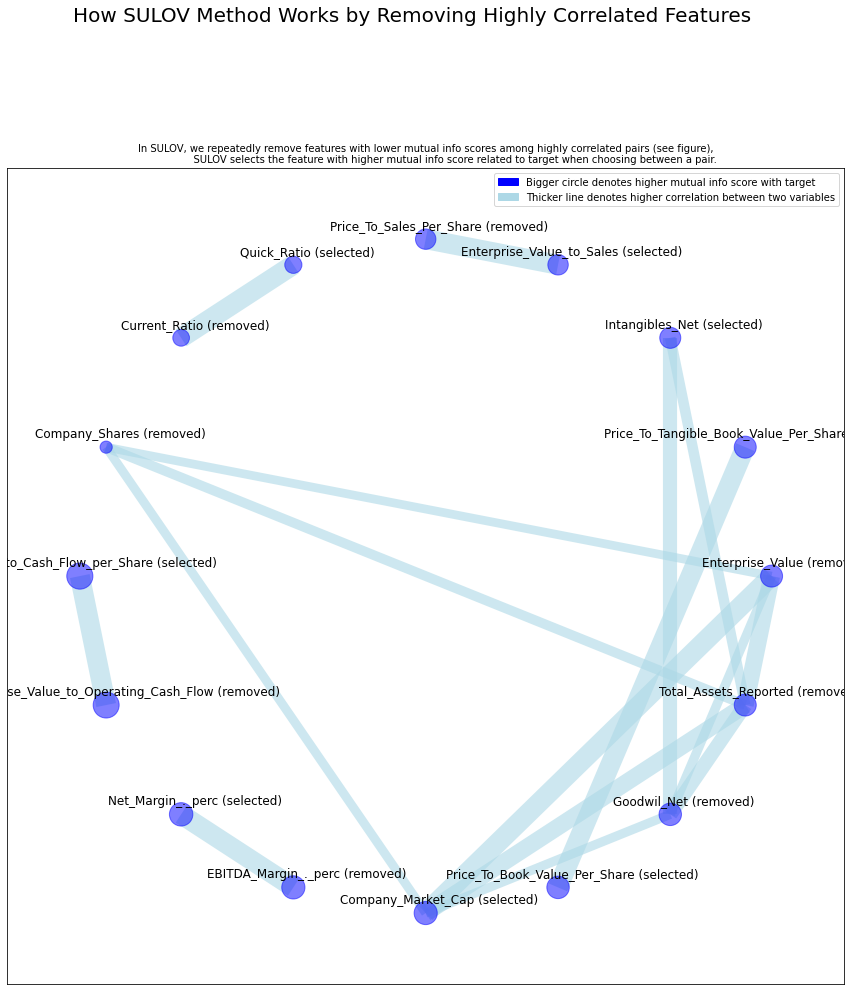

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 23
Final list of selected vars after SULOV = 23
############## F E A T U R E   S E L E C T I O N  ####################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 23 
    XGBoost version: 1.5.2
Number of booster rounds = 100
        using 23 variables...
            Time taken for regular XGBoost feature selection = 2 seconds
        using 18 variables...
            Time taken for regular XGBoost feature selection = 4 seconds
        using 13 variables...
            Time taken for regular XGBoost feature selection = 6 seconds
        using 8 variables...
            Time taken for regular XGBoost feature selection = 7 seconds
        using 3 variables...
            Time taken for regular XGBoost feature selection = 9 seconds
            Total time taken for XGBoost feature selecti

In [66]:
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)
selected_cols, imp_df = featurewiz(pd.concat([X_train, y_train], axis = 1), 'alfa', corr_limit = 0.4, verbose =0, sep=",", header=0,test_data="", feature_engg="", category_encoders="")
    
X_train = X_train[selected_cols]
X_test = X_test[selected_cols]
reg = ctb.CatBoostRegressor(loss_function = 'MAPE', **best_params)
reg.fit(X_train, y_train, eval_set=(X_test, y_test))
y_pred_ctb = reg.predict(final_test.drop(columns = ['RIC', 'Date']))

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(final_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

In [62]:
# Test of baseline model
X_train, X_test, y_train, y_test = X_y_split(data_train, data_test) 

X_means = X_train.mean()

X_train = X_train.fillna(X_means)
X_test = X_test.fillna(X_means)

reg = ctb.CatBoostRegressor(loss_function = 'MAPE', **best_params)
reg.fit(X_train, y_train, eval_set=(X_test, y_test))
y_pred_ctb = reg.predict(final_test.drop(columns = ['RIC', 'Date']))

baseline_score_rmse_mean, baseline_score_mape_mean, avg_alfa_baseline_mean = calc_metric(final_test, y_pred_ctb)
print('Baseline RMSE score of portfolio = ', baseline_score_rmse_mean) 
print('Baseline MAPE score of portfolio = ', baseline_score_mape_mean) 
print('Average alfa of portfolio = ', avg_alfa_baseline_mean)

0:	learn: 0.2138315	test: 0.2273166	best: 0.2273166 (0)	total: 4.19ms	remaining: 37.7ms
1:	learn: 0.2127607	test: 0.2266601	best: 0.2266601 (1)	total: 8.37ms	remaining: 33.5ms
2:	learn: 0.2119819	test: 0.2260304	best: 0.2260304 (2)	total: 13.7ms	remaining: 31.9ms
3:	learn: 0.2111775	test: 0.2255948	best: 0.2255948 (3)	total: 17.7ms	remaining: 26.6ms
4:	learn: 0.2104866	test: 0.2248906	best: 0.2248906 (4)	total: 21.5ms	remaining: 21.5ms
5:	learn: 0.2100326	test: 0.2245337	best: 0.2245337 (5)	total: 25.4ms	remaining: 16.9ms
6:	learn: 0.2096261	test: 0.2240185	best: 0.2240185 (6)	total: 29.7ms	remaining: 12.7ms
7:	learn: 0.2090857	test: 0.2234284	best: 0.2234284 (7)	total: 33.6ms	remaining: 8.41ms
8:	learn: 0.2085699	test: 0.2231851	best: 0.2231851 (8)	total: 38.3ms	remaining: 4.26ms
9:	learn: 0.2081984	test: 0.2231101	best: 0.2231101 (9)	total: 42.3ms	remaining: 0us

bestTest = 0.2231101457
bestIteration = 9

Baseline RMSE score of portfolio =  0.11
Baseline MAPE score of portfolio =  3.